 Determine the average signal yield and the error on its measure

<h1 id="tocheading">Table of Contents</h1>
<div id="toc"></div>

In [1]:
%%javascript
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')

<IPython.core.display.Javascript object>

In [2]:
import pandas
import uproot
import matplotlib.pyplot as plt
import numpy as np
import scipy.interpolate as interpolate
import pickle
import zfit
import mplhep
from numpy import random 

from matplotlib import rc
rc('font',**{'family':'serif','serif':['Roman']})

/Users/mariehartmann/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/zfit/__init__.py:48: UserWarning: TensorFlow warnings are by default suppressed by zfit. In order to show them, set the environment variable ZFIT_DISABLE_TF_WARNINGS=0. In order to suppress the TensorFlow warnings AND this warning, set ZFIT_DISABLE_TF_WARNINGS=1.
  warnings.warn("TensorFlow warnings are by default suppressed by zfit."
/Users/mariehartmann/opt/anaconda3/envs/myenv38/lib/python3.8/site-packages/zfit/util/execution.py:73: UserWarning: Not running on Linux. Determining available cpus for thread can failand be overestimated. Workaround (only if too many cpus are used):`zfit.run.set_n_cpu(your_cpu_number)`
  warnings.warn("Not running on Linux. Determining available cpus for thread can fail"


# Initialization of the data parameters

In [3]:
#Dowloading the data
bc_tree = uproot.open('root://eospublic.cern.ch//eos/experiment/fcc/ee/analyses/case-studies/flavour/Bc2TauNu/flatNtuples/spring2021/prod_04/Analysis_stage2/p8_ee_Zbb_ecm91_EvtGen_Bc2TauNuTAUHADNU.root')['events']
bu_tree = uproot.open('root://eospublic.cern.ch//eos/experiment/fcc/ee/analyses/case-studies/flavour/Bc2TauNu/flatNtuples/spring2021/prod_04/Analysis_stage2/p8_ee_Zbb_ecm91_EvtGen_Bu2TauNuTAUHADNU.root')['events']
bb_tree = uproot.open('root://eospublic.cern.ch//eos/experiment/fcc/ee/analyses/case-studies/flavour/Bc2TauNu/flatNtuples/spring2021/prod_04/Analysis_stage2/p8_ee_Zbb_ecm91_EvtGen.root')['events']
cc_tree = uproot.open('root://eospublic.cern.ch//eos/experiment/fcc/ee/analyses/case-studies/flavour/Bc2TauNu/flatNtuples/spring2021/prod_04/Analysis_stage2/p8_ee_Zcc_ecm91.root')['events']
qq_tree = uproot.open('root://eospublic.cern.ch//eos/experiment/fcc/ee/analyses/case-studies/flavour/Bc2TauNu/flatNtuples/spring2021/prod_04/Analysis_stage2/p8_ee_Zuds_ecm91.root')['events']
tree_gen = uproot.open("root://eospublic.cern.ch//eos/experiment/fcc/ee/analyses/case-studies/flavour/Bc2TauNu/flatNtuples/spring2021/prod_04/Analysis_stage2/p8_ee_Zbb_ecm91_EvtGen_Bc2TauNuTAUHADNU.root")["metadata"]

In [4]:
#Transforming the data into a dataframe
bc_df = bc_tree.arrays(library="pd", how="zip", filter_name=["EVT_*"])
bu_df = bu_tree.arrays(library="pd", how="zip", filter_name=["EVT_*"])
bb_df = bb_tree.arrays(library="pd", how="zip", filter_name=["EVT_*"])
cc_df = cc_tree.arrays(library="pd", how="zip", filter_name=["EVT_*"])
qq_df = qq_tree.arrays(library="pd", how="zip", filter_name=["EVT_*"])

#Getting general information on the data
df_gen = tree_gen.arrays(library="pd", how="zip")

In [5]:
#We consider as initial data the data whose MVAs are between 0.95 and 1

bc_sig = bc_df[bc_df['EVT_MVA2']> 0.95]
bc_sig = bc_sig[bc_sig['EVT_MVA1']> 0.95]

bu_bkg = bu_df[bu_df['EVT_MVA2']> 0.95]
bu_bkg = bu_bkg[bu_bkg['EVT_MVA1']> 0.95] 

bb_bkg = bb_df[bb_df['EVT_MVA2']> 0.95]
bb_bkg = bb_bkg[bb_bkg['EVT_MVA1']> 0.95] 

cc_bkg = cc_df[cc_df['EVT_MVA2']> 0.95]
cc_bkg = cc_bkg[cc_bkg['EVT_MVA1']> 0.95] 

qq_bkg = qq_df[qq_df['EVT_MVA2']> 0.95]
qq_bkg = qq_bkg[qq_bkg['EVT_MVA1']> 0.95]

In [117]:
#Number of Z0 produced
N_Z0_init = 5*10**(12)
N_Z0 = 5*10**(11)

#Branching fraction Z->quark-pair
BF_Zbb = 0.1512
BF_Zcc = 0.1203
BF_Zqq = 0.4276

#Production ratio of Bc+ and B+
f_Bc = 0.0004
f_Bu = 0.43

#Branching fraction Bc+->tau nu B+->tau nu and tau->3pions
BF_Bctaunu = 0.0194
BF_Butaunu = 1.09*10**(-4)
BF_tau3pion = 0.0931

In [118]:
#Definition of the functions computing the different yields
def S_bc_cut(initial_eff, cut_eff) :
    return (N_Z0*BF_Zbb*2*f_Bc*BF_Bctaunu*BF_tau3pion)*initial_eff*cut_eff

def B_bu_cut(initial_eff, cut_eff) :
    return (N_Z0*BF_Zbb*2*f_Bu*BF_Butaunu*BF_tau3pion)*initial_eff*cut_eff

def B_bb_cut(initial_eff, cut_eff) :
    return (N_Z0*BF_Zbb*2)*initial_eff*cut_eff

def B_cc_cut(initial_eff, cut_eff) :
    return (N_Z0*BF_Zcc*2)*initial_eff*cut_eff

def B_qq_cut(initial_eff, cut_eff) :
    return (N_Z0*BF_Zqq*2)*initial_eff*cut_eff

#Dowloading the splines to compute the number of inclusive background events

bb_spline_MVA1_log = pickle.load(open(r'../Finding_the_best_MVA_cut/2D_plot/Spline_functions/MVA1_spline_log.pkl','rb'))
bb_spline_MVA2_log = pickle.load(open(r'/Users/mariehartmann/Stage_M1/Stage_M1/Bc_to_tau_nu/Finding_the_best_MVA_cut/2D_plot/Spline_functions/MVA2_spline_log.pkl','rb'))

cc_spline_MVA1_log = pickle.load(open(r'/Users/mariehartmann/Stage_M1/Stage_M1/Bc_to_tau_nu/Finding_the_best_MVA_cut/2D_plot/Spline_functions/cc_MVA1_spline_log.pkl','rb'))
cc_spline_MVA2_log = pickle.load(open(r'/Users/mariehartmann/Stage_M1/Stage_M1/Bc_to_tau_nu/Finding_the_best_MVA_cut/2D_plot/Spline_functions/cc_MVA2_spline_log.pkl','rb'))

#qq_spline_MVA1_log = pickle.load(open(r'/Users/mariehartmann/Stage_M1/Stage_M1/Bc_to_tau_nu/Finding_the_best_MVA_cut/2D_plot/Spline_functions/uds_MVA1_spline_log.pkl','rb'))
#qq_spline_MVA2_log = pickle.load(open(r'/Users/mariehartmann/Stage_M1/Stage_M1/Bc_to_tau_nu/Finding_the_best_MVA_cut/2D_plot/Spline_functions/uds_MVA2_spline_log.pkl','rb'))

#http://localhost:8912/tree/Stage_M1/Stage_M1/Bc_to_tau_nu/Finding_the_best_MVA_cut/2D_plot/Spline_functions

In [119]:
#Initialization of the number of events in the MVAs for all contributions
nb_total_events = df_gen.iloc[0]["eventsProcessed"]
nb_bc_events = len(bc_sig)
nb_bu_events = len(bu_bkg)
nb_bb_events = len(bb_bkg)
nb_cc_events = len(cc_bkg)
#nb_qq_events = len(qq_bkg)

#Initialization of the number of events for both MVAs for inclusive backgrounds
nb_bb_events_1 = interpolate.splint(-np.log(1-0.95), 9, bb_spline_MVA1_log)
nb_cc_events_1 = interpolate.splint(-np.log(1-0.95), 9, cc_spline_MVA1_log)
#nb_qq_events_1 = interpolate.splint(-np.log(1-0.95), 8, qq_spline_MVA1_log)

nb_bb_events_2 = interpolate.splint(-np.log(1-0.95), 8, bb_spline_MVA2_log)
nb_cc_events_2 = interpolate.splint(-np.log(1-0.95), 7, cc_spline_MVA2_log)
#nb_qq_events_2 = interpolate.splint(-np.log(1-0.95), 5.8, qq_spline_MVA2_log)

#Computing of the initial efficiencies for all backgrounds
initial_eff_bc_sig = nb_bc_events / nb_total_events
initial_eff_bu_bkg = nb_bu_events / nb_total_events
initial_eff_bb_bkg = nb_bb_events / nb_total_events
initial_eff_cc_bkg = nb_cc_events / nb_total_events
#initial_eff_qq_bkg = nb_qq_events / nb_total_events

print('eff sig {}'.format(initial_eff_bc_sig))
#print('eff bkg {}'.format(initial_eff_qq_bkg))

eff sig 0.2320645


In [120]:
#Optimized MVAs
Optimized_MVA1 = 0.9998599999999961  #+-0.00001
Optimized_MVA2 = 0.9963399999999984 #+-0.00001

Optimized_MVA1_log = -np.log(1-Optimized_MVA1)
Optimized_MVA2_log = -np.log(1-Optimized_MVA2)

#Applying the MVA2 cut on the dataframe
df_bc_sig = bc_sig[bc_sig['EVT_MVA1']>Optimized_MVA1]
df_bc_sig = df_bc_sig[df_bc_sig['EVT_MVA2']>Optimized_MVA2]

df_bu_bkg = bu_bkg[bu_bkg['EVT_MVA1']>Optimized_MVA1]
df_bu_bkg = df_bu_bkg[df_bu_bkg['EVT_MVA2']>Optimized_MVA2]
          
#Counting the number of events in the Bc+ and B+ dataframes after the cut
nb_bc_after_cut = len(df_bc_sig)
nb_bu_after_cut = len(df_bu_bkg)
          
#Counting the number of events left for each MVAs for inclusive backgrounds
nb_bb_after_cut_1 = interpolate.splint(Optimized_MVA1_log, 9, bb_spline_MVA1_log)
nb_bb_after_cut_2 = interpolate.splint(Optimized_MVA2_log, 8, bb_spline_MVA2_log)
        
nb_cc_after_cut_1 = interpolate.splint(Optimized_MVA1_log, 9, cc_spline_MVA1_log)
nb_cc_after_cut_2 = interpolate.splint(Optimized_MVA2_log, 7, cc_spline_MVA2_log)
        
#nb_qq_after_cut_1 = interpolate.splint(Optimized_MVA1_log, 8, qq_spline_MVA1_log)
#nb_qq_after_cut_2 = interpolate.splint(Optimized_MVA2_log, 5.8, qq_spline_MVA2_log)

        
#Computing the efficiencies
cut_eff_bc_sig = nb_bc_after_cut / nb_bc_events
        
cut_eff_bu_bkg = nb_bu_after_cut / nb_bu_events
cut_eff_bb_bkg = (nb_bb_after_cut_1 / nb_bb_events_1) * (nb_bb_after_cut_2 / nb_bb_events_2)
cut_eff_cc_bkg = (nb_cc_after_cut_1 / nb_cc_events_1) * (nb_cc_after_cut_2 / nb_cc_events_2)
#cut_eff_qq_bkg = (nb_qq_after_cut_1 / nb_qq_events_1) * (nb_qq_after_cut_2 / nb_qq_events_2)
print(cut_eff_bu_bkg)
print(cut_eff_bb_bkg)
print(cut_eff_cc_bkg)
#print(cut_eff_qq_bkg)
        
    
#Signal, Background and Purity
S = S_bc_cut(initial_eff_bc_sig, cut_eff_bc_sig)
B = B_bb_cut(initial_eff_bb_bkg, cut_eff_bb_bkg) + B_cc_cut(initial_eff_cc_bkg, cut_eff_cc_bkg) + B_bu_cut(initial_eff_bu_bkg, cut_eff_bu_bkg) #+ B_qq_cut(initial_eff_qq_bkg, cut_eff_qq_bkg)
P = S/(S+B)

print('Number of signal events = {}'.format(S))
print('Number of bkg events = {}'.format(B))
print('Purity = {}'.format(P))

N_BC = S_bc_cut(initial_eff_bc_sig, cut_eff_bc_sig)

N_BU = B_bu_cut(initial_eff_bu_bkg, cut_eff_bu_bkg)
N_BB = B_bb_cut(initial_eff_bb_bkg, cut_eff_bb_bkg)
N_CC = B_cc_cut(initial_eff_cc_bkg, cut_eff_cc_bkg)
#N_QQ = B_qq_cut(initial_eff_qq_bkg, cut_eff_qq_bkg)

N_BB_CC = N_BB + N_CC

print('N_BC = {}'.format(N_BC))
print('N_BU = {}'.format(N_BU))
print('N_BB = {}'.format(N_BB))
print('N_CC = {}'.format(N_CC))
#print('N_QQ = {}'.format(N_QQ))

0.0007226931575174898
3.137790945458242e-06
1.797967906975173e-06
Number of signal events = 400.92649482816006
Number of bkg events = 447.2890969373205
Purity = 0.4726705082061383
N_BC = 400.92649482816006
N_BU = 24.147796710239998
N_BB = 361.5187011064041
N_CC = 61.622599120676384


# Initialization of the fits parameters

### Initialization of the data of reference

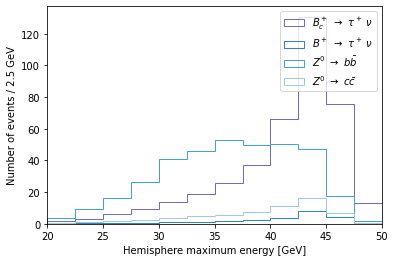

[]

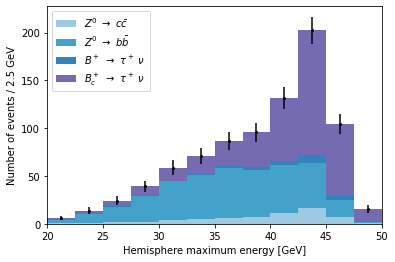

In [121]:
variable = 'EVT_ThrustEmax_E'

nb_bins = int(40/np.sqrt(N_Z0_init/N_Z0))
min_bin = 20
max_bin = 50

name_bc = r"$B_c^+$ $\rightarrow$ $\tau^+$ $\nu$ "
name_bu = r"$B^+$ $\rightarrow$ $\tau^+$ $\nu$ "
name_bb = r"$Z^0$ $\rightarrow$ $b\bar{b}$ "
name_cc = r"$Z^0$ $\rightarrow$ $c\bar{c}$ "

colour_bc = "#756bb1"
colour_bu = "#3182bd" #"#2c7fb8" #
colour_bb = "#43a2ca" #"#edf8b1" #"#a6bddb"
colour_cc = "#9ecae1" #"#7fcdbb" #

counts_bc, bins_bc = np.histogram(bc_sig[variable], bins = nb_bins, range = (min_bin, max_bin))
counts_bu, bins_bu = np.histogram(bu_bkg[variable], bins = nb_bins, range = (min_bin, max_bin))
counts_bb, bins_bb = np.histogram(bb_bkg[variable], bins = nb_bins, range = (min_bin, max_bin))
counts_cc, bins_cc = np.histogram(cc_bkg[variable], bins = nb_bins, range = (min_bin, max_bin))

counts_bc = (counts_bc/np.sum(counts_bc)) * N_BC
counts_bu = (counts_bu/np.sum(counts_bu)) * N_BU
counts_bb = (counts_bb/np.sum(counts_bb)) * N_BB
counts_cc = (counts_cc/np.sum(counts_cc)) * N_CC

plt.figure()
plt.hist(bins_bc[:-1], bins_bc, weights=counts_bc, histtype='step', color= colour_bc, label=name_bc)
plt.hist(bins_bu[:-1], bins_bu, weights=counts_bu, histtype='step', color= colour_bu, label=name_bu)
plt.hist(bins_bb[:-1], bins_bb, weights=counts_bb, histtype='step', color= colour_bb, label=name_bb)
plt.hist(bins_cc[:-1], bins_bb, weights=counts_cc, histtype='step', color= colour_cc, label=name_cc)
plt.legend()
plt.xlim(min_bin,max_bin)
plt.xlabel("Hemisphere maximum energy [GeV]")
plt.ylabel("Number of events / {} GeV".format(round((max_bin-min_bin)/nb_bins,3)))
plt.show()

x = [bins_bb[:-1], bins_cc[:-1], bins_bu[:-1], bins_bc[:-1]]
bins = bins_bc
weights = [counts_cc, counts_bb, counts_bu, counts_bc ]
colour = [colour_cc, colour_bb, colour_bu, colour_bc]
name = [name_cc, name_bb, name_bu, name_bc]

plt.figure()
counts, bin_edges, _ = plt.hist(x, bins, weights=weights, color=colour, label=name, stacked=True)
bin_centres = (bin_edges[:-1]+ bin_edges[1:])/2
err = np.sqrt(counts[3])
plt.errorbar(bin_centres, counts[3], yerr=err, fmt='o', color='k', markersize=2)

plt.xlim(min_bin,max_bin)
plt.xlabel("Hemisphere maximum energy [GeV]")
plt.ylabel("Number of events / {} GeV".format(round((max_bin-min_bin)/nb_bins,3)))
plt.legend()
plt.plot()

### Creating the templates

In [122]:
#Getting the right bins_edges size
_ , bins_edges = np.histogram(a=bin_edges[:-1], bins=bin_edges, weights=counts[2])

#Templates and templates normalisation
template_yield_bc, _ = np.histogram(a=bins_bc[:-1], bins=bins_edges, weights=counts_bc)
template_yield_bu, _ = np.histogram(a=bins_bu[:-1], bins=bins_edges, weights=counts_bu)
template_yield_bb, _ = np.histogram(a=bins_bb[:-1], bins=bins_edges, weights=counts_bb)
template_yield_cc, _ = np.histogram(a=bins_cc[:-1], bins=bins_edges, weights=counts_cc)
    
template_yield_bc = template_yield_bc/np.sum(template_yield_bc)
template_yield_bu = template_yield_bu/np.sum(template_yield_bu)
template_yield_bb = template_yield_bb/np.sum(template_yield_bb)
template_yield_cc = template_yield_cc/np.sum(template_yield_cc)
 
#Checking if there are zero bins    
print(template_yield_bc)
print(template_yield_bu)
print(template_yield_bb)
print(template_yield_cc)

[0.0041015  0.00831142 0.01479065 0.02335879 0.0336377  0.04693788
 0.06484477 0.09188399 0.16491225 0.32601831 0.18861146 0.03259129]
[0.00591701 0.01243702 0.02042091 0.02964256 0.03944341 0.05117229
 0.06935375 0.09530091 0.15989209 0.32283493 0.17491371 0.0186714 ]
[0.01003963 0.02496697 0.04504624 0.07357992 0.11241744 0.12668428
 0.14663144 0.13698811 0.13883752 0.13130779 0.04900925 0.00449141]
[0.00822604 0.01680973 0.02610873 0.03826896 0.05937053 0.07725322
 0.09334764 0.11623748 0.18061516 0.26716738 0.10908441 0.00751073]


### Creating the function that we will use for the fit

In [123]:
#When considering only Z->bb and Bu for background
#def get_template(yield_sig, yield_bkg):
# return yield_sig*template_process1 + N_BU*template_process2 + yield_bkg*template_process3

#When considering Z->bb, Z->cc and Bu for background
def get_template(yield_bc, yield_bu, yield_bb_cc): 
    return yield_bc*template_yield_bc + yield_bu*template_yield_bu + yield_bb_cc*((N_BB/N_BB_CC)*template_yield_bb + (N_CC/N_BB_CC)*template_yield_cc)
    
def binned_nll(template, sample_hist):
    return np.sum(template - sample_hist + sample_hist * np.log((sample_hist + 1*10**(-14)) / (template + 1*10**(-14))))
  # 1e-14 added in case there are empty bins

def loss(x):
    # by default, `x` is an `OrderedSet` of zfit parameters.
    x = np.array(x)

    print("Value of the parameters", x)
  
    # The first parameter is the Bc yield 
    yield_bc = x[0]
    # The second parameter is the Bu yield 
    yield_bu = x[1]
    # The second parameter is the Z->bb and Z->cc combined yield 
    yield_bb_cc = x[2]

    template = get_template(yield_bc, yield_bu, yield_bb_cc)

    nll = binned_nll(template, sample_hist)
    
    #Gaussian constraint on B+ -> tau nu yield
    nll += (yield_bu - N_BU)**2/2./N_BU*0.05

    return nll

loss.errordef = 0.5 # 0.5 for a log-likelihood
# We would set this parameter at 1 for a chi2 loss function.

# Toy samples

In [124]:
#Theoretical value of the yields parameters to give initial value to the fit parameters
print('N_BC = {}'.format(N_BC))
print('N_BU = {}'.format(N_BU))
print('N_BB_CC = {}'.format(N_BB_CC))

N_BC = 400.92649482816006
N_BU = 24.147796710239998
N_BB_CC = 423.1413002270805


### Creating and Fitting multiple toy samples

In [125]:
n_loop = 2000
bc_yield = np.zeros(n_loop)
bu_yield = np.zeros(n_loop)
bb_cc_yield = np.zeros(n_loop)

bc_yield_error = np.zeros(n_loop)
bu_yield_error = np.zeros(n_loop)
bb_cc_yield_error = np.zeros(n_loop)

for i in range (n_loop) :
    
    #Toy sample
    data = np.random.poisson(counts[3])
    sample_hist, bins_edges = np.histogram(a=bin_edges[:-1], bins=bin_edges, weights=data)
    print(sample_hist)

    #Initialisation of the parameters
    i_rand = random.randint(0,1000000000000,size=1)
    
    initial_params = {
            'value': [400, 20, 400],
            'lower' : [-1000., -1000., -1000.], # optional
            'upper': [10000., 10000., 10000.], # optional
            'name': [f"bc_yield_{i_rand}", f"bu_yield_{i_rand}", f"bb_cc_yield_{i_rand}"] # optional
        }

    
    #Fit
    minimiser = zfit.minimize.Minuit(verbosity=5)
    zfit.run.set_autograd_mode(False)
    zfit.run.set_graph_mode(False)
    
    #Extracting the informations
    result = minimiser.minimize(loss, initial_params)
    params = result.params
    params_hesse = result.hesse() #Computation of the errors
    corr = result.correlation(method="minuit_hesse")
    
    print(result.info['original'])
    print(params)
    print('correction {}'.format(corr))

    #Extracting the yield results
    bc_yield[i] = params[f"bc_yield_{i_rand}"]['value']
    bu_yield[i] = params[f"bu_yield_{i_rand}"]['value']
    bb_cc_yield[i] = params[f"bb_cc_yield_{i_rand}"]['value']
    
    bc_yield_error[i] = params[f"bc_yield_{i_rand}"]['minuit_hesse']['error']
    bu_yield_error[i] = params[f"bu_yield_{i_rand}"]['minuit_hesse']['error']
    bb_cc_yield_error[i] = params[f"bb_cc_yield_{i_rand}"]['minuit_hesse']['error']
    

[  5  17  25  42  65  77  78  98 122 208 101  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [418.42305725  31.62718926 435.49045687]
Value of the parameters [409.39794735  25.93196188 418.08178423]
Value of the parameters [409.42886159  25.93196188 418.08178423]
Value of the parameters [409.3670334   25.93196188 418.08178423]
Value of the parameters [409.39794735  25.95183255 418.08178423]
Value of the parameters [409.39794735  25.91209138 418.08178423]
Value of the parameters [409.

Value of the parameters [421.11430872  25.54678625 391.73478483]
Value of the parameters [421.02493976  25.54678625 391.73478483]
Value of the parameters [421.06962394  25.57503053 391.73478483]
Value of the parameters [421.06962394  25.51854232 391.73478483]
Value of the parameters [421.06962394  25.54678625 391.77883289]
Value of the parameters [421.06962394  25.54678625 391.69073737]
Value of the parameters [421.07856085  25.54678625 391.73478483]
Value of the parameters [421.06068706  25.54678625 391.73478483]
Value of the parameters [421.06962394  25.55243508 391.73478483]
Value of the parameters [421.06962394  25.54113744 391.73478483]
Value of the parameters [421.06962394  25.54678625 391.7435944 ]
Value of the parameters [421.06962394  25.54678625 391.72597529]
Value of the parameters [421.11430872  25.57503053 391.73478483]
Value of the parameters [421.11430872  25.54678625 391.77883289]
Value of the parameters [421.06962394  25.57503053 391.77883289]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[977872078160]       412.2     +/-      45       False
bu_yield_[977872078160]       25.71     +/-      22       False
bb_cc_yield_[977872078160]      439     +/-      41       False
correction [[ 1.         -0.43321786 -0.63065612]
 [-0.43321786  1.         -0.06354669]
 [-0.63065612 -0.06354669  1.        ]]
[  7  14  20  38  62  59  72  83 122 202  93  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [365.88449524  24.90130334 463.20365485]
Value of the parameters [365.83479439  24.90130334 463.20365485]
Value of the parameters [365.85964472  24.91716816 463.20365485]
Value of the parameters [365.85964472  24.88543864 463.20365485]
Value of the parameters [365.85964472  24.90130334 463.22910994]
Value of the parameters [365.85964472  24.90130334 463.17819995]
Value of the parameters [365.86461481  24.90130334 463.20365485]
Value of the parameters [365.85467464  24.90130334 463.20365485]
Value of the parameters [365.85964472  24.9044763  463.20365485]
Value of the parameters [365.85964472  24.89813039 463.20365485]
Value of the parameters [365.85964472  24.90130334 463.20874586]
Value of the parameters [365.85964472  24.90130334 463.19856386]
Value of the parameters [365.88449524  24.91716816 463.20365485]
Value of the parameters [365.88449524  24.90130334 463.22910994]
Value of the parameters [365.85964472  24.91716816 463.22910994]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[144419519662]       426.4     +/-      45       False
bu_yield_[144419519662]       24.72     +/-      22       False
bb_cc_yield_[144419519662]    388.3     +/-      40       False
correction [[ 1.         -0.43596546 -0.63339859]
 [-0.43596546  1.         -0.06226706]
 [-0.63339859 -0.06226706  1.        ]]
[  4  12  34  32  61  74  90  90 130 197  74  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [378.18312428  17.12181034 496.76059632]
Value of the parameters [362.68500921  25.60597193 506.68750486]
Value of the parameters [362.72963959  25.60597193 506.68750486]
Value of the parameters [362.64037946  25.60597193 506.68750486]
Value of the parameters [362.68500921  25.63443238 506.68750486]
Value of the parameters [362.68500921  25.57751184 506.68750486]
Value of the parameters [362.68500921  25.60597193 506.7335808 ]
Value of the parameters [362.68500921  25.60597193 506.64142951]
Value of the parameters [359.47496303  26.00173432 505.21384199]
Value of the parameters [358.87754215  26.0754414  504.93948111]
Value of the parameters [358.92219765  26.0754414  504.93948111]
Value of the parameters [358.83288729  26.0754414  504.93948111]
Value of the parameters [358.87754215  26.10362726 504.93948111]
Value of the parameters [358.87754215  26.04725588 504.93948111]
Value of the parameters [358.87754215  26.0754414  504.98579068]
Value of the parameters [

Value of the parameters [459.01688806  24.71747802 380.23017364]
Value of the parameters [459.02364767  24.72169714 380.23017364]
Value of the parameters [459.02364767  24.71325892 380.23017364]
Value of the parameters [459.02364767  24.71747802 380.23673087]
Value of the parameters [459.02364767  24.71747802 380.22361641]
Value of the parameters [459.02499959  24.71747802 380.23017364]
Value of the parameters [459.02229575  24.71747802 380.23017364]
Value of the parameters [459.02364767  24.71832185 380.23017364]
Value of the parameters [459.02364767  24.7166342  380.23017364]
Value of the parameters [459.02364767  24.71747802 380.23148508]
Value of the parameters [459.02364767  24.71747802 380.22886219]
Value of the parameters [459.03040729  24.72169714 380.23017364]
Value of the parameters [459.03040729  24.71747802 380.23673087]
Value of the parameters [459.02364767  24.72169714 380.23673087]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.599 

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [399.33789322  24.22736266 416.03310088]
Value of the parameters [399.47434403  23.3554515  412.72227194]
Value of the parameters [399.51187281  23.3554515  412.72227194]
Value of the parameters [399.43681567  23.3554515  412.72227194]
Value of the parameters [399.47434403  23.37941137 412.72227194]
Value of the parameters [399.47434403  23.33149188 412.72227194]
Value of the parameters [399.47434403  23.3554515  412.75909258]
Value of the parameters [399.47434403  23.3554515  412.68545171]
Value of the parameters [391.21707391  23.11159764 419.

Value of the parameters [391.9558968   24.25686037 433.80422923]
Value of the parameters [391.9558968   24.21372454 433.80422923]
Value of the parameters [391.9558968   24.23529235 433.8383453 ]
Value of the parameters [391.9558968   24.23529235 433.7701135 ]
Value of the parameters [391.96267011  24.23529235 433.80422923]
Value of the parameters [391.94912352  24.23529235 433.80422923]
Value of the parameters [391.9558968   24.23960594 433.80422923]
Value of the parameters [391.9558968   24.23097877 433.80422923]
Value of the parameters [391.9558968   24.23529235 433.81105241]
Value of the parameters [391.9558968   24.23529235 433.79740605]
Value of the parameters [391.98976345  24.25686037 433.80422923]
Value of the parameters [391.98976345  24.23529235 433.8383453 ]
Value of the parameters [391.9558968   24.25686037 433.8383453 ]
Value of the parameters [391.9558968   24.23529235 433.80422923]
Value of the parameters [391.96267011  24.23529235 433.80422923]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[724742682093]         372     +/-      44       False
bu_yield_[724742682093]       21.19     +/-      22       False
bb_cc_yield_[724742682093]    470.9     +/-      40       False
correction [[ 1.         -0.43637302 -0.62486143]
 [-0.43637302  1.         -0.06646577]
 [-0.62486143 -0.06646577  1.        ]]
[ 10   8  28  36  53  75  80 102 136 205 131  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [362.29369107  26.09057239 428.4895562 ]
Value of the parameters [362.20554358  26.09057239 428.4895562 ]
Value of the parameters [362.24961702  26.11899892 428.4895562 ]
Value of the parameters [362.24961702  26.06214621 428.4895562 ]
Value of the parameters [362.24961702  26.09057239 428.53429763]
Value of the parameters [362.24961702  26.09057239 428.44481537]
Value of the parameters [362.25843178  26.09057239 428.4895562 ]
Value of the parameters [362.24080228  26.09057239 428.4895562 ]
Value of the parameters [362.24961702  26.09625767 428.4895562 ]
Value of the parameters [362.24961702  26.08488713 428.4895562 ]
Value of the parameters [362.24961702  26.09057239 428.49850444]
Value of the parameters [362.24961702  26.09057239 428.48060798]
Value of the parameters [362.29369107  26.11899892 428.4895562 ]
Value of the parameters [362.29369107  26.09057239 428.53429763]
Value of the parameters [362.24961702  26.11899892 428.53429763]
Value of the parameters [

Value of the parameters [369.58884853  23.70144308 530.72951539]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.387                      │              Nfcn = 61               │
│ EDM = 3.14e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[723103751567]       369.6     +/-    

Value of the parameters [413.6811535   22.56267335 428.28135113]
Value of the parameters [413.6811535   22.58740506 428.32048128]
Value of the parameters [413.6811535   22.58740506 428.24222144]
Value of the parameters [412.63053681  23.0728109  429.55032602]
Value of the parameters [410.83227883  23.90423929 431.72437762]
Value of the parameters [410.87154985  23.90423929 431.72437762]
Value of the parameters [410.79300827  23.90423929 431.72437762]
Value of the parameters [410.83227883  23.92901883 431.72437762]
Value of the parameters [410.83227883  23.87946001 431.72437762]
Value of the parameters [410.83227883  23.90423929 431.76361313]
Value of the parameters [410.83227883  23.90423929 431.68514257]
Value of the parameters [409.41096709  24.20429494 431.91657294]
Value of the parameters [408.5801694   24.37976417 432.02896002]
Value of the parameters [408.61945681  24.37976417 432.02896002]
Value of the parameters [408.54088245  24.37976417 432.02896002]
Value of the parameters [

Value of the parameters [434.28107998  25.3693789  401.33779784]
Value of the parameters [434.27799281  25.3693789  401.33779784]
Value of the parameters [434.27953639  25.37034902 401.33779784]
Value of the parameters [434.27953639  25.36840878 401.33779784]
Value of the parameters [434.27953639  25.3693789  401.3393181 ]
Value of the parameters [434.27953639  25.3693789  401.33627759]
Value of the parameters [434.28725432  25.37422951 401.33779784]
Value of the parameters [434.28725432  25.3693789  401.34539913]
Value of the parameters [434.27953639  25.37422951 401.34539913]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.621                      │              Nfcn = 49               │
│ EDM = 1.46e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [397.43407112  21.99542663 413.87136032]
Value of the parameters [397.43407112  22.01837189 413.90710587]
Value of the parameters [397.43407112  22.01837189 413.83561514]
Value of the parameters [396.70953187  22.62430011 413.96605208]
Value of the parameters [395.81249726  23.37489473 414.08332051]
Value of the parameters [395.8483083   23.37489473 414.08332051]
Value of the parameters [395.77668662  23.37489473 414.08332051]
Value of the parameters [395.81249726  23.39782731 414.08332051]
Value of the parameters [395.81249726  23.35196238 414.08332051]
Value of the parameters [395.81249726  23.37489473 414.11913923]
Value of the parameters [395.81249726  23.37489473 414.04750217]
Value of the parameters [395.81249726  23.37489473 414.08332051]
Value of the parameters [395.8483083   23.37489473 414.08332051]
Value of the parameters [395.77668662  23.37489473 414.08332051]
Value of the parameters [395.81249726  23.39782731 414.08332051]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[559853292394]       397.9     +/-      43       False
bu_yield_[559853292394]       23.26     +/-      22       False
bb_cc_yield_[559853292394]    395.8     +/-      39       False
correction [[ 1.         -0.44314014 -0.61935974]
 [-0.44314014  1.         -0.06938609]
 [-0.61935974 -0.06938609  1.        ]]
[  5  15  32  31  63  67  90 100 131 206 117  24]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [372.66161917  27.24408332 439.58443697]
Value of the parameters [372.70836588  27.24408332 439.58443697]
Value of the parameters [372.61487315  27.24408332 439.58443697]
Value of the parameters [372.66161917  27.27398305 439.58443697]
Value of the parameters [372.66161917  27.21418399 439.58443697]
Value of the parameters [372.66161917  27.24408332 439.63187699]
Value of the parameters [372.66161917  27.24408332 439.53699761]
Value of the parameters [372.66161917  27.24408332 439.58443697]
Value of the parameters [372.70836588  27.24408332 439.58443697]
Value of the parameters [372.61487315  27.24408332 439.58443697]
Value of the parameters [372.66161917  27.27398305 439.58443697]
Value of the parameters [372.66161917  27.21418399 439.58443697]
Value of the parameters [372.66161917  27.24408332 439.63187699]
Value of the parameters [372.66161917  27.24408332 439.53699761]
Value of the parameters [372.67096846  27.24408332 439.58443697]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[558992569350]       419.3     +/-      45       False
bu_yield_[558992569350]       21.94     +/-      22       False
bb_cc_yield_[558992569350]    421.2     +/-      41       False
correction [[ 1.         -0.42525823 -0.63837665]
 [-0.42525823  1.         -0.06650835]
 [-0.63837665 -0.06650835  1.        ]]
[  9  10  29  37  75  60  80  93 134 212  94  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [426.10639947  22.64474468 413.40112636]
Value of the parameters [426.14205648  22.64474468 413.40112636]
Value of the parameters [426.07074283  22.64474468 413.40112636]
Value of the parameters [426.10639947  22.66726359 413.40112636]
Value of the parameters [426.10639947  22.62222598 413.40112636]
Value of the parameters [426.10639947  22.64474468 413.43653459]
Value of the parameters [426.10639947  22.64474468 413.3657185 ]
Value of the parameters [426.47067476  22.67419952 412.31463975]
Value of the parameters [426.67563797  22.69077135 411.70352545]
Value of the parameters [426.71137789  22.69077135 411.70352545]
Value of the parameters [426.63989844  22.69077135 411.70352545]
Value of the parameters [426.67563797  22.71330995 411.70352545]
Value of the parameters [426.67563797  22.66823297 411.70352545]
Value of the parameters [426.67563797  22.69077135 411.73893889]
Value of the parameters [426.67563797  22.69077135 411.66811238]
Value of the parameters [

Value of the parameters [347.71628291  23.47456245 379.86399505]
Value of the parameters [347.71628291  23.46658419 379.86399505]
Value of the parameters [347.71628291  23.47057331 379.87005555]
Value of the parameters [347.71628291  23.47057331 379.85793457]
Value of the parameters [347.7174927   23.47057331 379.86399505]
Value of the parameters [347.71507311  23.47057331 379.86399505]
Value of the parameters [347.71628291  23.47137114 379.86399505]
Value of the parameters [347.71628291  23.46977549 379.86399505]
Value of the parameters [347.71628291  23.47057331 379.86520715]
Value of the parameters [347.71628291  23.47057331 379.86278295]
Value of the parameters [347.72233188  23.47456245 379.86399505]
Value of the parameters [347.72233188  23.47057331 379.87005555]
Value of the parameters [347.71628291  23.47456245 379.87005555]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.442                      │              Nfcn = 57               │
│ E

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06729527  20.         400.        ]
Value of the parameters [399.93270611  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06525502]
Value of the parameters [400.          20.         399.93474627]
Value of the parameters [483.90684744  59.61574938 502.86846977]
Value of the parameters [442.84913163  40.26861509 452.46363657]
Value of the parameters [442.89532272  40.26861509 452.46363657]
Value of the parameters [442.80294117  40.26861509 452.46363657]
Value of the parameters [442.84913163  40.29888028 452.

Value of the parameters [390.94262222  23.5762283  433.42995312]
Value of the parameters [390.40063461  23.59119871 433.10413175]
Value of the parameters [390.35927585  23.5923412  433.07540042]
Value of the parameters [390.40964014  23.5923412  433.07540042]
Value of the parameters [390.30891234  23.5923412  433.07540042]
Value of the parameters [390.35927585  23.62437957 433.07540042]
Value of the parameters [390.35927585  23.56030328 433.07540042]
Value of the parameters [390.35927585  23.5923412  433.12614066]
Value of the parameters [390.35927585  23.5923412  433.02466094]
Value of the parameters [390.35927585  23.5923412  433.07540042]
Value of the parameters [390.40964014  23.5923412  433.07540042]
Value of the parameters [390.30891234  23.5923412  433.07540042]
Value of the parameters [390.35927585  23.62437957 433.07540042]
Value of the parameters [390.35927585  23.56030328 433.07540042]
Value of the parameters [390.35927585  23.5923412  433.12614066]
Value of the parameters [

Value of the parameters [468.06626907  21.55830088 343.48487154]
Value of the parameters [468.06626907  21.55941812 343.48656727]
Value of the parameters [468.06626907  21.55941812 343.4831758 ]
Value of the parameters [468.0751282   21.56500433 343.48487154]
Value of the parameters [468.0751282   21.55941812 343.49335023]
Value of the parameters [468.06626907  21.56500433 343.49335023]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.954                      │              Nfcn = 56               │
│ EDM = 9.45e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [450.83121871  33.11405449 419.69757438]
Value of the parameters [487.00625977  18.67493651 393.78169865]
Value of the parameters [487.0449907   18.67493651 393.78169865]
Value of the parameters [486.96752926  18.67493651 393.78169865]
Value of the parameters [487.00625977  18.69860843 393.78169865]
Value of the parameters [487.00625977  18.65126484 393.78169865]
Value of the parameters [487.00625977  18.67493651 393.81988134]
Value of the parameters [487.00625977  18.67493651 393.74351642]
Value of the parameters [493.06024622  20.71122473 391.13566456]
Value of the parameters [495.39071473  21.494647   390.11885798]
Value of the parameters [495.42922034  21.494647   390.11885798]
Value of the parameters [495.35220954  21.494647   390.11885798]
Value of the parameters [495.39071473  21.51850942 390.11885798]
Value of the parameters [495.39071473  21.47078484 390.11885798]
Value of the parameters [495.39071473  21.494647   390.15618904]
Value of the parameters [

Value of the parameters [336.79736062  21.99655592 460.42061616]
Value of the parameters [336.80531432  22.00176314 460.42061616]
Value of the parameters [336.80531432  21.99134872 460.42061616]
Value of the parameters [336.80531432  21.99655592 460.42885383]
Value of the parameters [336.80531432  21.99655592 460.4123785 ]
Value of the parameters [336.80690506  21.99655592 460.42061616]
Value of the parameters [336.80372357  21.99655592 460.42061616]
Value of the parameters [336.80531432  21.99759736 460.42061616]
Value of the parameters [336.80531432  21.99551448 460.42061616]
Value of the parameters [336.80531432  21.99655592 460.42226369]
Value of the parameters [336.80531432  21.99655592 460.41896862]
Value of the parameters [336.81326803  22.00176314 460.42061616]
Value of the parameters [336.81326803  21.99655592 460.42885383]
Value of the parameters [336.80531432  22.00176314 460.42885383]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.322 

Value of the parameters [430.42895111  35.77068104 432.01114458]
Value of the parameters [414.16914032  27.34804668 414.90401059]
Value of the parameters [414.20862193  27.34804668 414.90401059]
Value of the parameters [414.12965918  27.34804668 414.90401059]
Value of the parameters [414.16914032  27.37356471 414.90401059]
Value of the parameters [414.16914032  27.32252894 414.90401059]
Value of the parameters [414.16914032  27.34804668 414.94321894]
Value of the parameters [414.16914032  27.34804668 414.86480269]
Value of the parameters [413.52449865  25.75790945 417.21204481]
Value of the parameters [412.828608    24.04225001 419.70587059]
Value of the parameters [412.86942844  24.04225001 419.70587059]
Value of the parameters [412.78778806  24.04225001 419.70587059]
Value of the parameters [412.828608    24.06794825 419.70587059]
Value of the parameters [412.828608    24.01655207 419.70587059]
Value of the parameters [412.828608    24.04225001 419.74637792]
Value of the parameters [

Value of the parameters [369.94697193  22.63297274 430.46921377]
Value of the parameters [369.95268567  22.63297274 430.46921377]
Value of the parameters [369.9412582   22.63297274 430.46921377]
Value of the parameters [369.94697193  22.63666822 430.46921377]
Value of the parameters [369.94697193  22.62927726 430.46921377]
Value of the parameters [369.94697193  22.63297274 430.47501113]
Value of the parameters [369.94697193  22.63297274 430.46341642]
Value of the parameters [369.94811468  22.63297274 430.46921377]
Value of the parameters [369.94582918  22.63297274 430.46921377]
Value of the parameters [369.94697193  22.63371184 430.46921377]
Value of the parameters [369.94697193  22.63223364 430.46921377]
Value of the parameters [369.94697193  22.63297274 430.47037324]
Value of the parameters [369.94697193  22.63297274 430.4680543 ]
Value of the parameters [369.95268567  22.63666822 430.46921377]
Value of the parameters [369.95268567  22.63297274 430.47501113]
Value of the parameters [

bc_yield_[186831882033]       369.2     +/-      44       False
bu_yield_[186831882033]       26.37     +/-      22       False
bb_cc_yield_[186831882033]    477.3     +/-      41       False
correction [[ 1.         -0.4373476  -0.62811948]
 [-0.4373476   1.         -0.06533585]
 [-0.62811948 -0.06533585  1.        ]]
[  6  11  22  34  62  75  84 102 125 194 103   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [396.61019645  22.8869928  415.32128492]
Value of the parameters [396.1912

Value of the parameters [473.8945668   24.6309756  334.39934296]
Value of the parameters [473.8945668   24.65552672 334.43654526]
Value of the parameters [473.8945668   24.65552672 334.36214111]
Value of the parameters [473.8945668   24.65552672 334.39934296]
Value of the parameters [473.93364775  24.65552672 334.39934296]
Value of the parameters [473.85548628  24.65552672 334.39934296]
Value of the parameters [473.8945668   24.6800781  334.39934296]
Value of the parameters [473.8945668   24.6309756  334.39934296]
Value of the parameters [473.8945668   24.65552672 334.43654526]
Value of the parameters [473.8945668   24.65552672 334.36214111]
Value of the parameters [473.90238295  24.65552672 334.39934296]
Value of the parameters [473.88675066  24.65552672 334.39934296]
Value of the parameters [473.8945668   24.66043697 334.39934296]
Value of the parameters [473.8945668   24.65061647 334.39934296]
Value of the parameters [473.8945668   24.65552672 334.40678338]
Value of the parameters [

Value of the parameters [363.06873199  22.76104845 474.25147315]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.086                      │              Nfcn = 57               │
│ EDM = 1.95e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[873863235083]       363.1     +/-    

Value of the parameters [360.5081307   15.96892528 449.47116841]
Value of the parameters [360.38955931  15.96892528 449.47116841]
Value of the parameters [360.44884445  16.00770113 449.47116841]
Value of the parameters [360.44884445  15.93015009 449.47116841]
Value of the parameters [360.44884445  15.96892528 449.53190055]
Value of the parameters [360.44884445  15.96892528 449.41043734]
Value of the parameters [356.11864342  18.55604419 449.0684742 ]
Value of the parameters [350.88386772  21.69230679 448.58098262]
Value of the parameters [350.94334061  21.69230679 448.58098262]
Value of the parameters [350.82439596  21.69230679 448.58098262]
Value of the parameters [350.88386772  21.73112229 448.58098262]
Value of the parameters [350.88386772  21.65349194 448.58098262]
Value of the parameters [350.88386772  21.69230679 448.64209549]
Value of the parameters [350.88386772  21.69230679 448.51987084]
Value of the parameters [350.88386772  21.69230679 448.58098262]
Value of the parameters [

Value of the parameters [365.86681609  25.2457537  483.82567268]
Value of the parameters [365.86681609  25.24994541 483.8324799 ]
Value of the parameters [365.86681609  25.24994541 483.81886548]
Value of the parameters [365.86813842  25.24994541 483.82567268]
Value of the parameters [365.86549375  25.24994541 483.82567268]
Value of the parameters [365.86681609  25.25078375 483.82567268]
Value of the parameters [365.86681609  25.24910707 483.82567268]
Value of the parameters [365.86681609  25.24994541 483.82703412]
Value of the parameters [365.86681609  25.24994541 483.82431124]
Value of the parameters [365.87342776  25.25413713 483.82567268]
Value of the parameters [365.87342776  25.24994541 483.8324799 ]
Value of the parameters [365.86681609  25.25413713 483.8324799 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.589                      │              Nfcn = 57               │
│ EDM = 5.74e-06 (Goal: 0.001)     │                                

Value of the parameters [413.41632587  26.60023027 414.22748015]
Value of the parameters [413.32517738  26.60023027 414.22748015]
Value of the parameters [413.37075131  26.6297886  414.22748015]
Value of the parameters [413.37075131  26.57067233 414.22748015]
Value of the parameters [413.37075131  26.60023027 414.27272609]
Value of the parameters [413.37075131  26.60023027 414.18223483]
Value of the parameters [412.97402816  24.60957034 416.86607044]
Value of the parameters [412.57725107  22.62013574 419.50743146]
Value of the parameters [412.62427188  22.62013574 419.50743146]
Value of the parameters [412.53023094  22.62013574 419.50743146]
Value of the parameters [412.57725107  22.64987799 419.50743146]
Value of the parameters [412.57725107  22.59039389 419.50743146]
Value of the parameters [412.57725107  22.62013574 419.55409189]
Value of the parameters [412.57725107  22.62013574 419.46077169]
Value of the parameters [412.25538906  22.79731976 420.07094983]
Value of the parameters [

Value of the parameters [415.36900448  25.2354209  384.3767241 ]
Value of the parameters [415.38265595  25.2354209  384.3767241 ]
Value of the parameters [415.35535306  25.2354209  384.3767241 ]
Value of the parameters [415.36900448  25.24408542 384.3767241 ]
Value of the parameters [415.36900448  25.22675642 384.3767241 ]
Value of the parameters [415.36900448  25.2354209  384.39018086]
Value of the parameters [415.36900448  25.2354209  384.3632674 ]
Value of the parameters [415.37173477  25.2354209  384.3767241 ]
Value of the parameters [415.36627419  25.2354209  384.3767241 ]
Value of the parameters [415.36900448  25.2371538  384.3767241 ]
Value of the parameters [415.36900448  25.233688   384.3767241 ]
Value of the parameters [415.36900448  25.2354209  384.37941545]
Value of the parameters [415.36900448  25.2354209  384.37403276]
Value of the parameters [415.38265595  25.24408542 384.3767241 ]
Value of the parameters [415.38265595  25.2354209  384.39018086]
Value of the parameters [

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [439.79095551  37.03453355 425.28362383]
Value of the parameters [419.08723643  28.18084633 412.14183476]
Value of the parameters [419.13282808  28.18084633 412.14183476]
Value of the parameters [419.0416454   28.18084633 412.14183476]
Value of the parameters [419.08723643  28.21063125 412.14183476]
Value of the parameters [419.08723643  28.15106179 412.14183476]
Value of the parameters [419.08723643  28.18084633 412.18783377]
Value of the parameters [419.08723643  28.18084633 412.09583639]
Value of the parameters [425.43293228  26.39152881 407.06903349]
Value of the parameters [446.25947458  20.55242199 390.54163056]
Value of the parameters [446.30643211  20.55242199 390.54163056]
Value of the parameters [446.21251769  20.55242199 390.54163056]
Value of the parameters [446.25947458  20.58191254 390.54163056]
Value of the parameters [

Value of the parameters [427.44173469  21.21790458 420.46165349]
Value of the parameters [427.45075198  21.22358896 420.46165349]
Value of the parameters [427.45075198  21.21222022 420.46165349]
Value of the parameters [427.45075198  21.21790458 420.47061612]
Value of the parameters [427.45075198  21.21790458 420.45269088]
Value of the parameters [427.49583884  21.2463266  420.46165349]
Value of the parameters [427.49583884  21.21790458 420.50646689]
Value of the parameters [427.45075198  21.2463266  420.50646689]
Value of the parameters [427.45075198  21.21790458 420.46165349]
Value of the parameters [427.45976931  21.21790458 420.46165349]
Value of the parameters [427.44173469  21.21790458 420.46165349]
Value of the parameters [427.45075198  21.22358896 420.46165349]
Value of the parameters [427.45075198  21.21222022 420.46165349]
Value of the parameters [427.45075198  21.21790458 420.47061612]
Value of the parameters [427.45075198  21.21790458 420.45269088]
Value of the parameters [

 [-0.63048852 -0.0648814   1.        ]]
[  7  14  21  34  47  71  73  91 126 200  82  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [363.65567718   8.41794898 366.09050829]
Value of the parameters [383.96673575  14.89933529 385.04405608]
Value of the parameters [384.00298524  14.89933529 385.04405608]
Value of the parameters [383.93048666  14.89933529 385.04405608]
Value of the parameters [383.96673575  14.92228402 385.04405608]
Value of the parameters [383.96673575  14.87638679 385

Value of the parameters [390.0152426   22.35960749 396.83250958]
Value of the parameters [390.05745311  22.35960749 396.83250958]
Value of the parameters [389.97303264  22.35960749 396.83250958]
Value of the parameters [390.0152426   22.38683702 396.83250958]
Value of the parameters [390.0152426   22.33237829 396.83250958]
Value of the parameters [390.0152426   22.35960749 396.87453136]
Value of the parameters [390.0152426   22.35960749 396.79048833]
Value of the parameters [390.02368466  22.35960749 396.83250958]
Value of the parameters [390.00680056  22.35960749 396.83250958]
Value of the parameters [390.0152426   22.36505337 396.83250958]
Value of the parameters [390.0152426   22.35416162 396.83250958]
Value of the parameters [390.0152426   22.35960749 396.84091389]
Value of the parameters [390.0152426   22.35960749 396.82410528]
Value of the parameters [390.05745311  22.38683702 396.83250958]
Value of the parameters [390.05745311  22.35960749 396.87453136]
Value of the parameters [

Value of the parameters [396.45081613  24.24828484 335.33244817]
Value of the parameters [396.43998448  24.25530022 335.33244817]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.527                      │              Nfcn = 61               │
│ EDM = 8.39e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [389.00354105  22.72236495 389.1490981 ]
Value of the parameters [389.00354105  22.75568169 389.20025758]
Value of the parameters [389.00354105  22.75568169 389.09793942]
Value of the parameters [389.00354105  22.75568169 389.1490981 ]
Value of the parameters [389.0549285   22.75568169 389.1490981 ]
Value of the parameters [388.95215441  22.75568169 389.1490981 ]
Value of the parameters [389.00354105  22.78899891 389.1490981 ]
Value of the parameters [389.00354105  22.72236495 389.1490981 ]
Value of the parameters [389.00354105  22.75568169 389.20025758]
Value of the parameters [389.00354105  22.75568169 389.09793942]
Value of the parameters [389.01381848  22.75568169 389.1490981 ]
Value of the parameters [388.99326366  22.75568169 389.1490981 ]
Value of the parameters [389.00354105  22.76234509 389.1490981 ]
Value of the parameters [389.00354105  22.7490183  389.1490981 ]
Value of the parameters [389.00354105  22.75568169 389.15932993]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[303647116798]       387.7     +/-      44       False
bu_yield_[303647116798]       25.35     +/-      22       False
bb_cc_yield_[303647116798]    431.7     +/-      40       False
correction [[ 1.         -0.44231701 -0.62892416]
 [-0.44231701  1.         -0.06092864]
 [-0.62892416 -0.06092864  1.        ]]
[  5   9  35  38  73  67  94  94 139 231 103  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [390.28605817  13.39180744 495.36211375]
Value of the parameters [390.28605817  13.4305279  495.42433343]
Value of the parameters [390.28605817  13.4305279  495.29989516]
Value of the parameters [382.28589821  17.8320567  500.84745825]
Value of the parameters [367.49961721  26.01865953 511.04402437]
Value of the parameters [367.56016127  26.01865953 511.04402437]
Value of the parameters [367.4390743   26.01865953 511.04402437]
Value of the parameters [367.49961721  26.05722246 511.04402437]
Value of the parameters [367.49961721  25.98009726 511.04402437]
Value of the parameters [367.49961721  26.01865953 511.10653608]
Value of the parameters [367.49961721  26.01865953 510.98151374]
Value of the parameters [363.75061529  26.62554554 509.5467029 ]
Value of the parameters [362.88146805  26.76636774 509.19940947]
Value of the parameters [362.94208801  26.76636774 509.19940947]
Value of the parameters [362.82084925  26.76636774 509.19940947]
Value of the parameters [

Value of the parameters [375.06253674  24.98097894 404.12856697]
Value of the parameters [375.05995684  24.98097894 404.12856697]
Value of the parameters [375.06124679  24.9818109  404.12856697]
Value of the parameters [375.06124679  24.98014699 404.12856697]
Value of the parameters [375.06124679  24.98097894 404.1298569 ]
Value of the parameters [375.06124679  24.98097894 404.12727704]
Value of the parameters [375.06769654  24.98513871 404.12856697]
Value of the parameters [375.06769654  24.98097894 404.13501662]
Value of the parameters [375.06124679  24.98513871 404.13501662]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.627                      │              Nfcn = 49               │
│ EDM = 3.09e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [442.50813752  40.69860974 456.42718435]
Value of the parameters [420.98310266  30.22701219 427.825177  ]
Value of the parameters [421.0282057   30.22701219 427.825177  ]
Value of the parameters [420.93800023  30.22701219 427.825177  ]
Value of the parameters [420.98310266  30.25630576 427.825177  ]
Value of the parameters [420.98310266  30.19771898 427.825177  ]
Value of the parameters [420.98310266  30.22701219 427.86939041]
Value of the parameters [420.98310266  30.22701219 427.78096417]
Value of the parameters [416.33001195  25.0457276  437.95123725]
Value of the parameters [409.88779247  17.8796369  452.04450197]
Value of the parameters [409.93399061  17.8796369  452.04450197]
Value of the parameters [409.84159497  17.8796369  452.04450197]
Value of the parameters [

Value of the parameters [394.13384684  24.02904897 432.81047901]
Value of the parameters [394.13384684  24.02904897 432.84269273]
Value of the parameters [394.16586721  24.02904897 432.84269273]
Value of the parameters [394.10182678  24.02904897 432.84269273]
Value of the parameters [394.13384684  24.04938193 432.84269273]
Value of the parameters [394.13384684  24.0087162  432.84269273]
Value of the parameters [394.13384684  24.02904897 432.87490676]
Value of the parameters [394.13384684  24.02904897 432.81047901]
Value of the parameters [394.14025089  24.02904897 432.84269273]
Value of the parameters [394.1274428   24.02904897 432.84269273]
Value of the parameters [394.13384684  24.03311555 432.84269273]
Value of the parameters [394.13384684  24.0249824  432.84269273]
Value of the parameters [394.13384684  24.02904897 432.84913552]
Value of the parameters [394.13384684  24.02904897 432.83624997]
Value of the parameters [394.16586721  24.04938193 432.84269273]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[52140737724]       501.8     +/-      47       False
bu_yield_[52140737724]       24.56     +/-      22       False
bb_cc_yield_[52140737724]    401.7     +/-      41       False
correction [[ 1.         -0.41401811 -0.64537511]
 [-0.41401811  1.         -0.06033301]
 [-0.64537511 -0.06033301  1.        ]]
[  8  19  21  41  61  68  97  88 142 193  99  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [378.76510977  25.85429433 433.8506856 ]
Value of the parameters [378.79994063  25.85429433 433.8506856 ]
Value of the parameters [378.73027929  25.85429433 433.8506856 ]
Value of the parameters [378.76510977  25.87659203 433.8506856 ]
Value of the parameters [378.76510977  25.83199685 433.8506856 ]
Value of the parameters [378.76510977  25.85429433 433.88591201]
Value of the parameters [378.76510977  25.85429433 433.81545955]
Value of the parameters [378.76510977  25.85429433 433.8506856 ]
Value of the parameters [378.79994063  25.85429433 433.8506856 ]
Value of the parameters [378.73027929  25.85429433 433.8506856 ]
Value of the parameters [378.76510977  25.87659203 433.8506856 ]
Value of the parameters [378.76510977  25.83199685 433.8506856 ]
Value of the parameters [378.76510977  25.85429433 433.88591201]
Value of the parameters [378.76510977  25.85429433 433.81545955]
Value of the parameters [378.77207592  25.85429433 433.8506856 ]
Value of the parameters [

Value of the parameters [452.90189727  23.39918331 382.73719145]
Value of the parameters [452.90189727  23.39918331 382.73412743]
Value of the parameters [452.90977156  23.40412309 382.73565944]
Value of the parameters [452.90977156  23.39918331 382.74331951]
Value of the parameters [452.90189727  23.40412309 382.74331951]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.748                      │              Nfcn = 57               │
│ EDM = 4.89e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [390.07163438  16.85201022 389.85367423]
Value of the parameters [390.10440466  16.85201022 389.85367423]
Value of the parameters [390.03886444  16.85201022 389.85367423]
Value of the parameters [390.07163438  16.87291708 389.85367423]
Value of the parameters [390.07163438  16.83110355 389.85367423]
Value of the parameters [390.07163438  16.85201022 389.88630324]
Value of the parameters [390.07163438  16.85201022 389.82104555]
Value of the parameters [388.53357604  20.03948786 387.1625611 ]
Value of the parameters [387.17098342  22.86833456 384.77925745]
Value of the parameters [387.20274798  22.86833456 384.77925745]
Value of the parameters [387.13921918  22.86833456 384.77925745]
Value of the parameters [387.17098342  22.88898484 384.77925745]
Value of the parameters [387.17098342  22.84768447 384.77925745]
Value of the parameters [387.17098342  22.86833456 384.81090028]
Value of the parameters [387.17098342  22.86833456 384.74761494]
Value of the parameters [

Value of the parameters [462.1851296   24.27272836 374.54024032]
Value of the parameters [462.1851296   24.26447938 374.54024032]
Value of the parameters [462.1851296   24.26860387 374.54663048]
Value of the parameters [462.1851296   24.26860387 374.53385017]
Value of the parameters [462.18645045  24.26860387 374.54024032]
Value of the parameters [462.18380875  24.26860387 374.54024032]
Value of the parameters [462.1851296   24.26942876 374.54024032]
Value of the parameters [462.1851296   24.26777897 374.54024032]
Value of the parameters [462.1851296   24.26860387 374.54151835]
Value of the parameters [462.1851296   24.26860387 374.53896229]
Value of the parameters [462.19173386  24.27272836 374.54024032]
Value of the parameters [462.19173386  24.26860387 374.54663048]
Value of the parameters [462.1851296   24.27272836 374.54663048]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.459                      │              Nfcn = 57               │
│ E

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [432.08249677  36.59390329 441.45632466]
Value of the parameters [415.43916621  27.99054922 419.93581657]
Value of the parameters [415.4787899   27.99054922 419.93581657]
Value of the parameters [415.39954299  27.99054922 419.93581657]
Value of the parameters [415.43916621  28.01619642 419.93581657]
Value of the parameters [415.43916621  27.96490232 419.93581657]
Value of the parameters [415.43916621  27.99054922 419.97485581]
Value of the parameters [415.43916621  27.99054922 419.89677779]
Value of the parameters [412.00913838  24.97618519 426.

Value of the parameters [461.96297929  24.771598   404.21245926]
Value of the parameters [462.00264463  24.79622472 404.21245926]
Value of the parameters [462.00264463  24.74697154 404.21245926]
Value of the parameters [462.00264463  24.771598   404.25127452]
Value of the parameters [462.00264463  24.771598   404.17364445]
Value of the parameters [462.00264463  24.771598   404.21245926]
Value of the parameters [462.04231043  24.771598   404.21245926]
Value of the parameters [461.96297929  24.771598   404.21245926]
Value of the parameters [462.00264463  24.79622472 404.21245926]
Value of the parameters [462.00264463  24.74697154 404.21245926]
Value of the parameters [462.00264463  24.771598   404.25127452]
Value of the parameters [462.00264463  24.771598   404.17364445]
Value of the parameters [462.01057776  24.771598   404.21245926]
Value of the parameters [461.99471153  24.771598   404.21245926]
Value of the parameters [462.00264463  24.77652332 404.21245926]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[161461480420]         371     +/-      44       False
bu_yield_[161461480420]       26.57     +/-      22       False
bb_cc_yield_[161461480420]      397     +/-      39       False
correction [[ 1.         -0.4499881  -0.6345632 ]
 [-0.4499881   1.         -0.05835187]
 [-0.6345632  -0.05835187  1.        ]]
[  3  18  20  45  60  80  93  90 144 216  91  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [338.40297599  23.3581604  439.21827373]
Value of the parameters [338.44219614  23.3581604  439.21827373]
Value of the parameters [338.36375633  23.3581604  439.21827373]
Value of the parameters [338.40297599  23.38386009 439.21827373]
Value of the parameters [338.40297599  23.332461   439.21827373]
Value of the parameters [338.40297599  23.3581604  439.25863769]
Value of the parameters [338.40297599  23.3581604  439.17791025]
Value of the parameters [337.87345507  23.43890064 438.77828792]
Value of the parameters [337.84047262  23.44393029 438.75088179]
Value of the parameters [337.87975391  23.44393029 438.75088179]
Value of the parameters [337.80119183  23.44393029 438.75088179]
Value of the parameters [337.84047262  23.46959023 438.75088179]
Value of the parameters [337.84047262  23.41827064 438.75088179]
Value of the parameters [337.84047262  23.44393029 438.79125321]
Value of the parameters [337.84047262  23.44393029 438.71051085]
Value of the parameters [

Value of the parameters [426.33811214  23.12000886 405.258802  ]
Value of the parameters [426.33347807  23.12000886 405.258802  ]
Value of the parameters [426.33579511  23.12147402 405.258802  ]
Value of the parameters [426.33579511  23.11854369 405.258802  ]
Value of the parameters [426.33579511  23.12000886 405.26109521]
Value of the parameters [426.33579511  23.12000886 405.2565088 ]
Value of the parameters [426.34738031  23.1273347  405.258802  ]
Value of the parameters [426.34738031  23.12000886 405.27026804]
Value of the parameters [426.33579511  23.1273347  405.27026804]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.9                        │              Nfcn = 53               │
│ EDM = 0.000452 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [423.46269224  34.46868436 443.69416653]
Value of the parameters [411.94278023  27.36611747 422.20808432]
Value of the parameters [411.98762398  27.36611747 422.20808432]
Value of the parameters [411.8979371   27.36611747 422.20808432]
Value of the parameters [411.94278023  27.39489985 422.20808432]
Value of the parameters [411.94278023  27.33733546 422.20808432]
Value of the parameters [411.94278023  27.36611747 422.2518079 ]
Value of the parameters [411.94278023  27.36611747 422.16436132]
Value of the parameters [403.42184926  24.377205   433.

Value of the parameters [342.72638287  26.72621384 492.42175992]
Value of the parameters [342.77505282  26.72621384 492.42175992]
Value of the parameters [342.67771368  26.72621384 492.42175992]
Value of the parameters [342.72638287  26.75724944 492.42175992]
Value of the parameters [342.72638287  26.69517867 492.42175992]
Value of the parameters [342.72638287  26.72621384 492.47232867]
Value of the parameters [342.72638287  26.72621384 492.3711919 ]
Value of the parameters [342.72638287  26.72621384 492.42175992]
Value of the parameters [342.77505282  26.72621384 492.42175992]
Value of the parameters [342.67771368  26.72621384 492.42175992]
Value of the parameters [342.72638287  26.75724944 492.42175992]
Value of the parameters [342.72638287  26.69517867 492.42175992]
Value of the parameters [342.72638287  26.72621384 492.47232867]
Value of the parameters [342.72638287  26.72621384 492.3711919 ]
Value of the parameters [342.7361168   26.72621384 492.42175992]
Value of the parameters [

Value of the parameters [457.40385241  24.70761033 377.86138769]
Value of the parameters [457.40385241  24.70761033 377.85719593]
Value of the parameters [457.41464835  24.71435031 377.85929181]
Value of the parameters [457.41464835  24.70761033 377.86977122]
Value of the parameters [457.40385241  24.71435031 377.86977122]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.41                       │              Nfcn = 57               │
│ EDM = 9.22e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [420.28017535  28.99843669 411.90098909]
Value of the parameters [420.32089813  28.99843669 411.90098909]
Value of the parameters [420.23945307  28.99843669 411.90098909]
Value of the parameters [420.28017535  29.02504119 411.90098909]
Value of the parameters [420.28017535  28.97183251 411.90098909]
Value of the parameters [420.28017535  28.99843669 411.94219734]
Value of the parameters [420.28017535  28.99843669 411.85978135]
Value of the parameters [427.41204537  27.73839115 405.07097354]
Value of the parameters [451.08778479  23.57939652 382.60134262]
Value of the parameters [451.12927643  23.57939652 382.60134262]
Value of the parameters [451.04629365  23.57939652 382.60134262]
Value of the parameters [451.08778479  23.60540961 382.60134262]
Value of the parameters [451.08778479  23.55338374 382.60134262]
Value of the parameters [451.08778479  23.57939652 382.64232493]
Value of the parameters [451.08778479  23.57939652 382.56036084]
Value of the parameters [

Value of the parameters [427.08461712  24.25500225 355.63515309]
Value of the parameters [427.08461712  24.24588014 355.63515309]
Value of the parameters [427.08461712  24.25044119 355.64213474]
Value of the parameters [427.08461712  24.25044119 355.62817145]
Value of the parameters [427.08605096  24.25044119 355.63515309]
Value of the parameters [427.08318327  24.25044119 355.63515309]
Value of the parameters [427.08461712  24.2513534  355.63515309]
Value of the parameters [427.08461712  24.24952898 355.63515309]
Value of the parameters [427.08461712  24.25044119 355.63654942]
Value of the parameters [427.08461712  24.25044119 355.63375676]
Value of the parameters [427.09178635  24.25500225 355.63515309]
Value of the parameters [427.09178635  24.25044119 355.64213474]
Value of the parameters [427.08461712  24.25500225 355.64213474]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.25                       │              Nfcn = 49               │
│ E

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [378.97441153  15.29049704 416.7335326 ]
Value of the parameters [348.52217292   8.43219394 441.31644702]
Value of the parameters [348.56858669   8.43219394 441.31644702]
Value of the parameters [348.47575983   8.43219394 441.31644702]
Value of the parameters [348.52217292   8.46181196 441.31644702]
Value of the parameters [348.52217292   8.40257631 441.31644702]
Value of the parameters [348.52217292   8.43219394 441.3620962 ]
Value of the parameters [348.52217292   8.43219394 441.27079845]
Value of the parameters [332.09559903  16.03808609 485.

Value of the parameters [453.0808855   24.83170206 371.07600908]
Value of the parameters [453.0808855   24.78349642 371.07600908]
Value of the parameters [453.0808855   24.80759911 371.11330959]
Value of the parameters [453.0808855   24.80759911 371.038709  ]
Value of the parameters [453.08857833  24.80759911 371.07600908]
Value of the parameters [453.07319268  24.80759911 371.07600908]
Value of the parameters [453.0808855   24.81241968 371.07600908]
Value of the parameters [453.0808855   24.80277855 371.07600908]
Value of the parameters [453.0808855   24.80759911 371.08346915]
Value of the parameters [453.0808855   24.80759911 371.06854903]
Value of the parameters [453.11934983  24.83170206 371.07600908]
Value of the parameters [453.11934983  24.80759911 371.11330959]
Value of the parameters [453.0808855   24.83170206 371.11330959]
Value of the parameters [453.0808855   24.80759911 371.07600908]
Value of the parameters [453.08857833  24.80759911 371.07600908]
Value of the parameters [

bc_yield_[60049573049]       374.5     +/-      44       False
bu_yield_[60049573049]       24.77     +/-      22       False
bb_cc_yield_[60049573049]    427.9     +/-      40       False
correction [[ 1.         -0.44255498 -0.63296876]
 [-0.44255498  1.         -0.06146504]
 [-0.63296876 -0.06146504  1.        ]]
[  7  11  21  41  55  53  86 116 141 212  93  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [431.21715361  35.24395703 424.82008205]
Value of the parameters [414.4362101

Value of the parameters [353.34660883  25.00968729 430.80987068]
Value of the parameters [353.34660883  25.0364132  430.85187038]
Value of the parameters [353.34660883  25.0364132  430.7678715 ]
Value of the parameters [353.35484424  25.0364132  430.80987068]
Value of the parameters [353.33837345  25.0364132  430.80987068]
Value of the parameters [353.34660883  25.04175842 430.80987068]
Value of the parameters [353.34660883  25.03106799 430.80987068]
Value of the parameters [353.34660883  25.0364132  430.81827058]
Value of the parameters [353.34660883  25.0364132  430.8014708 ]
Value of the parameters [353.38778606  25.06313942 430.80987068]
Value of the parameters [353.38778606  25.0364132  430.85187038]
Value of the parameters [353.34660883  25.06313942 430.85187038]
Value of the parameters [353.34660883  25.0364132  430.80987068]
Value of the parameters [353.35484424  25.0364132  430.80987068]
Value of the parameters [353.33837345  25.0364132  430.80987068]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[307085929083]       456.9     +/-      45       False
bu_yield_[307085929083]       25.44     +/-      22       False
bb_cc_yield_[307085929083]    347.6     +/-      39       False
correction [[ 1.         -0.43554246 -0.63289009]
 [-0.43554246  1.         -0.06336439]
 [-0.63289009 -0.06336439  1.        ]]
[  5   8  32  41  47  71  91  98 131 215 124  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [349.70511446  21.87583125 510.05989453]
Value of the parameters [347.78341605  21.83950861 508.82553584]
Value of the parameters [347.58581359  21.83577243 508.69374297]
Value of the parameters [347.63112104  21.83577243 508.69374297]
Value of the parameters [347.5405068   21.83577243 508.69374297]
Value of the parameters [347.58581359  21.86475789 508.69374297]
Value of the parameters [347.58581359  21.80678735 508.69374297]
Value of the parameters [347.58581359  21.83577243 508.74109003]
Value of the parameters [347.58581359  21.83577243 508.64639653]
Value of the parameters [347.58581359  21.83577243 508.69374297]
Value of the parameters [347.63112104  21.83577243 508.69374297]
Value of the parameters [347.5405068   21.83577243 508.69374297]
Value of the parameters [347.58581359  21.86475789 508.69374297]
Value of the parameters [347.58581359  21.80678735 508.69374297]
Value of the parameters [347.58581359  21.83577243 508.74109003]
Value of the parameters [

Value of the parameters [394.46527969  23.19373872 431.38768402]
Value of the parameters [394.46527969  23.19167588 431.38768402]
Value of the parameters [394.46527969  23.1927073  431.38931286]
Value of the parameters [394.46527969  23.1927073  431.38605519]
Value of the parameters [394.47337493  23.19786442 431.38768402]
Value of the parameters [394.47337493  23.1927073  431.39582821]
Value of the parameters [394.46527969  23.19786442 431.39582821]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.188                      │              Nfcn = 57               │
│ EDM = 3.99e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.         20.        400.0639508]
Value of the parameters [400.          20.         399.93605045]
Value of the parameters [414.88640185  30.10423575 419.48866915]
Value of the parameters [406.86678617  24.66098643 408.98636467]
Value of the parameters [406.93079809  24.66098643 408.98636467]
Value of the parameters [406.8027755   24.66098643 408.98636467]
Value of the parameters [406.86678617  24.70198682 408.98636467]
Value of the parameters [406.86678617  24.61998677 408.98636467]
Value of the parameters [406.86678617  24.66098643 409.04977486]
Value of the parameters [406.86678617  24.66098643 408.92295569]
Value of the parameters [404.18195062  24.7500143  411.39089547]
Value of the parameters [395.30251278  25.04499602 419.36979394]
Value of the parameters [395.36749494  25.04499602 419.36979394]
Value of the parameters [395

Value of the parameters [384.4535512   23.49328913 422.3621873 ]
Value of the parameters [384.41255328  23.51965895 422.3621873 ]
Value of the parameters [384.41255328  23.49328913 422.32091255]
Value of the parameters [384.42075283  23.49328913 422.32091255]
Value of the parameters [384.40435376  23.49328913 422.32091255]
Value of the parameters [384.41255328  23.49856307 422.32091255]
Value of the parameters [384.41255328  23.4880152  422.32091255]
Value of the parameters [384.41255328  23.49328913 422.32916746]
Value of the parameters [384.41255328  23.49328913 422.31265766]
Value of the parameters [384.41419319  23.49328913 422.32091255]
Value of the parameters [384.41091338  23.49328913 422.32091255]
Value of the parameters [384.41255328  23.49434391 422.32091255]
Value of the parameters [384.41255328  23.49223434 422.32091255]
Value of the parameters [384.41255328  23.49328913 422.32256353]
Value of the parameters [384.41255328  23.49328913 422.31926157]
Value of the parameters [

bb_cc_yield_[671736472774]    437.2     +/-      40       False
correction [[ 1.         -0.43578995 -0.62967987]
 [-0.43578995  1.         -0.0656188 ]
 [-0.62967987 -0.0656188   1.        ]]
[  2  14  23  34  69  66  87 100 133 196 110  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [424.30757918  32.20731272 426.59947975]
Value of the parameters [411.31751445  25.68672    412.38234936]
Value of the parameters [411.35415617  25.68672    412.38234936]
Value of the parameters [411.28

Value of the parameters [402.26940046  25.50809453 448.19528069]
Value of the parameters [402.26940046  25.50809453 448.10421115]
Value of the parameters [402.26940046  25.50809453 448.14974561]
Value of the parameters [402.31461684  25.50809453 448.14974561]
Value of the parameters [402.22418471  25.50809453 448.14974561]
Value of the parameters [402.26940046  25.53648489 448.14974561]
Value of the parameters [402.26940046  25.47970452 448.14974561]
Value of the parameters [402.26940046  25.50809453 448.19528069]
Value of the parameters [402.26940046  25.50809453 448.10421115]
Value of the parameters [402.27844369  25.50809453 448.14974561]
Value of the parameters [402.26035726  25.50809453 448.14974561]
Value of the parameters [402.26940046  25.51377257 448.14974561]
Value of the parameters [402.26940046  25.50241649 448.14974561]
Value of the parameters [402.26940046  25.50809453 448.15885258]
Value of the parameters [402.26940046  25.50809453 448.14063867]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[304462817054]         384     +/-      45       False
bu_yield_[304462817054]        23.2     +/-      22       False
bb_cc_yield_[304462817054]    452.9     +/-      42       False
correction [[ 1.         -0.42574738 -0.64965777]
 [-0.42574738  1.         -0.06154986]
 [-0.64965777 -0.06154986  1.        ]]
[  9  10  28  36  52  70  92  95 152 182 104  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [420.26267603  23.75853648 413.7107781 ]
Value of the parameters [420.18031561  23.75853648 413.7107781 ]
Value of the parameters [420.22149556  23.78451403 413.7107781 ]
Value of the parameters [420.22149556  23.73255922 413.7107781 ]
Value of the parameters [420.22149556  23.75853648 413.75170055]
Value of the parameters [420.22149556  23.75853648 413.66985616]
Value of the parameters [420.22149556  23.75853648 413.7107781 ]
Value of the parameters [420.26267603  23.75853648 413.7107781 ]
Value of the parameters [420.18031561  23.75853648 413.7107781 ]
Value of the parameters [420.22149556  23.78451403 413.7107781 ]
Value of the parameters [420.22149556  23.73255922 413.7107781 ]
Value of the parameters [420.22149556  23.75853648 413.75170055]
Value of the parameters [420.22149556  23.75853648 413.66985616]
Value of the parameters [420.22973162  23.75853648 413.7107781 ]
Value of the parameters [420.21325953  23.75853648 413.7107781 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[914933351226]       459.4     +/-      46       False
bu_yield_[914933351226]        24.1     +/-      22       False
bb_cc_yield_[914933351226]    389.5     +/-      40       False
correction [[ 1.         -0.42607259 -0.64076569]
 [-0.42607259  1.         -0.06073494]
 [-0.64076569 -0.06073494  1.        ]]
[  5  16  35  36  46  74  80 115 122 204 109  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [400.51523726  24.06580075 424.31877954]
Value of the parameters [400.55786664  24.06580075 424.31877954]
Value of the parameters [400.47260844  24.06580075 424.31877954]
Value of the parameters [400.51523726  24.09293409 424.31877954]
Value of the parameters [400.51523726  24.03866772 424.31877954]
Value of the parameters [400.51523726  24.06580075 424.36144185]
Value of the parameters [400.51523726  24.06580075 424.27611779]
Value of the parameters [399.87202295  24.15704123 424.09061664]
Value of the parameters [399.77220746  24.17120208 424.05520717]
Value of the parameters [399.81484871  24.17120208 424.05520717]
Value of the parameters [399.72956675  24.17120208 424.05520717]
Value of the parameters [399.77220746  24.19829975 424.05520717]
Value of the parameters [399.77220746  24.14410473 424.05520717]
Value of the parameters [399.77220746  24.17120208 424.09792275]
Value of the parameters [399.77220746  24.17120208 424.01249214]
Value of the parameters [

Value of the parameters [381.55639713  23.31227499 462.17387696]
Value of the parameters [381.55639713  23.30482076 462.17387696]
Value of the parameters [381.55639713  23.30854788 462.17985579]
Value of the parameters [381.55639713  23.30854788 462.16789814]
Value of the parameters [381.5575702   23.30854788 462.17387696]
Value of the parameters [381.55522405  23.30854788 462.17387696]
Value of the parameters [381.55639713  23.3092933  462.17387696]
Value of the parameters [381.55639713  23.30780245 462.17387696]
Value of the parameters [381.55639713  23.30854788 462.17507272]
Value of the parameters [381.55639713  23.30854788 462.17268119]
Value of the parameters [381.56226249  23.31227499 462.17387696]
Value of the parameters [381.56226249  23.30854788 462.17985579]
Value of the parameters [381.55639713  23.31227499 462.17985579]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.937                      │              Nfcn = 57               │
│ E

Value of the parameters [417.53547764  28.96577793 418.71775765]
Value of the parameters [417.58366542  28.96577793 418.71775765]
Value of the parameters [417.48729056  28.96577793 418.71775765]
Value of the parameters [417.53547764  28.99694309 418.71775765]
Value of the parameters [417.53547764  28.93461319 418.71775765]
Value of the parameters [417.53547764  28.96577793 418.76556207]
Value of the parameters [417.53547764  28.96577793 418.66995392]
Value of the parameters [416.6326842   26.70309646 421.93986003]
Value of the parameters [415.64605439  24.23214863 425.46573812]
Value of the parameters [415.69624743  24.23214863 425.46573812]
Value of the parameters [415.59586212  24.23214863 425.46573812]
Value of the parameters [415.64605439  24.26357059 425.46573812]
Value of the parameters [415.64605439  24.2007271  425.46573812]
Value of the parameters [415.64605439  24.23214863 425.51551009]
Value of the parameters [415.64605439  24.23214863 425.4159669 ]
Value of the parameters [

Value of the parameters [394.05464399  25.38601284 427.52844261]
Value of the parameters [394.05464399  25.32076443 427.52844261]
Value of the parameters [394.05464399  25.3533884  427.57995896]
Value of the parameters [394.05464399  25.3533884  427.47692704]
Value of the parameters [394.06490277  25.3533884  427.52844261]
Value of the parameters [394.04438525  25.3533884  427.52844261]
Value of the parameters [394.05464399  25.35991325 427.52844261]
Value of the parameters [394.05464399  25.34686357 427.52844261]
Value of the parameters [394.05464399  25.3533884  427.53874581]
Value of the parameters [394.05464399  25.3533884  427.51813943]
Value of the parameters [394.1059382   25.38601284 427.52844261]
Value of the parameters [394.1059382   25.3533884  427.57995896]
Value of the parameters [394.05464399  25.38601284 427.57995896]
Value of the parameters [394.05464399  25.3533884  427.52844261]
Value of the parameters [394.06490277  25.3533884  427.52844261]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[995311064317]       394.3     +/-      45       False
bu_yield_[995311064317]        22.1     +/-      22       False
bb_cc_yield_[995311064317]    449.7     +/-      41       False
correction [[ 1.         -0.42817045 -0.634239  ]
 [-0.42817045  1.         -0.06754482]
 [-0.634239   -0.06754482  1.        ]]
[  5  11  24  33  61  76 108  83 132 192  92  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [372.85920067  26.27138944 457.47911537]
Value of the parameters [372.75744062  26.27138944 457.47911537]
Value of the parameters [372.80832024  26.30400196 457.47911537]
Value of the parameters [372.80832024  26.23877739 457.47911537]
Value of the parameters [372.80832024  26.27138944 457.53098561]
Value of the parameters [372.80832024  26.27138944 457.42724591]
Value of the parameters [371.88316573  26.26467818 456.86742156]
Value of the parameters [371.80618508  26.26411966 456.81652042]
Value of the parameters [371.85709261  26.26411966 456.81652042]
Value of the parameters [371.75527835  26.26411966 456.81652042]
Value of the parameters [371.80618508  26.29657326 456.81652042]
Value of the parameters [371.80618508  26.23166651 456.81652042]
Value of the parameters [371.80618508  26.26411966 456.86846813]
Value of the parameters [371.80618508  26.26411966 456.76457349]
Value of the parameters [371.80618508  26.26411966 456.81652042]
Value of the parameters [

Value of the parameters [490.69202222  24.60719631 333.78040547]
Value of the parameters [490.668474    24.60719631 333.78040547]
Value of the parameters [490.68024809  24.61452445 333.78040547]
Value of the parameters [490.68024809  24.59986819 333.78040547]
Value of the parameters [490.68024809  24.60719631 333.7915689 ]
Value of the parameters [490.68024809  24.60719631 333.76924209]
Value of the parameters [490.68260291  24.60719631 333.78040547]
Value of the parameters [490.67789327  24.60719631 333.78040547]
Value of the parameters [490.68024809  24.60866193 333.78040547]
Value of the parameters [490.68024809  24.60573068 333.78040547]
Value of the parameters [490.68024809  24.60719631 333.78263815]
Value of the parameters [490.68024809  24.60719631 333.77817279]
Value of the parameters [490.69202222  24.61452445 333.78040547]
Value of the parameters [490.69202222  24.60719631 333.7915689 ]
Value of the parameters [490.68024809  24.61452445 333.7915689 ]
┌────────────────────────

Value of the parameters [419.93847331  31.12227314 403.50126446]
Value of the parameters [411.03069827  26.15485323 401.93917578]
Value of the parameters [411.07432468  26.15485323 401.93917578]
Value of the parameters [410.98707244  26.15485323 401.93917578]
Value of the parameters [411.03069827  26.18303674 401.93917578]
Value of the parameters [411.03069827  26.12667006 401.93917578]
Value of the parameters [411.03069827  26.15485323 401.98323896]
Value of the parameters [411.03069827  26.15485323 401.89511319]
Value of the parameters [415.61261493  27.8233139  393.00631677]
Value of the parameters [424.02827094  30.88496737 376.69472219]
Value of the parameters [424.07215896  30.88496737 376.69472219]
Value of the parameters [423.98438349  30.88496737 376.69472219]
Value of the parameters [424.02827094  30.91282281 376.69472219]
Value of the parameters [424.02827094  30.85711226 376.69472219]
Value of the parameters [424.02827094  30.88496737 376.73830424]
Value of the parameters [

Value of the parameters [423.65394146  21.64954626 392.04505117]
Value of the parameters [423.66230454  21.65486043 392.04505117]
Value of the parameters [423.66230454  21.6442321  392.04505117]
Value of the parameters [423.66230454  21.64954626 392.05328847]
Value of the parameters [423.66230454  21.64954626 392.03681389]
Value of the parameters [423.66397716  21.64954626 392.04505117]
Value of the parameters [423.66063192  21.64954626 392.04505117]
Value of the parameters [423.66230454  21.65060909 392.04505117]
Value of the parameters [423.66230454  21.64848342 392.04505117]
Value of the parameters [423.66230454  21.64954626 392.04669863]
Value of the parameters [423.66230454  21.64954626 392.04340371]
Value of the parameters [423.67066764  21.65486043 392.04505117]
Value of the parameters [423.67066764  21.64954626 392.05328847]
Value of the parameters [423.66230454  21.65486043 392.05328847]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.468 

 [-0.62480649 -0.06687814  1.        ]]
[  2  15  19  36  73  56  93  99 129 193 104  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [411.51348899  26.52440892 417.73390349]
Value of the parameters [405.52160916  23.1294754  408.5006314 ]
Value of the parameters [405.57025754  23.1294754  408.5006314 ]
Value of the parameters [405.4729615  23.1294754 408.5006314]
Value of the parameters [405.52160916  23.16079512 408.5006314 ]
Value of the parameters [405.52160916  23.0981561  408.50

Value of the parameters [385.88265982  22.94444407 460.26240196]
Value of the parameters [385.81294089  22.94444407 460.26240196]
Value of the parameters [385.84780017  22.96654773 460.26240196]
Value of the parameters [385.84780017  22.92234062 460.26240196]
Value of the parameters [385.84780017  22.94444407 460.29785955]
Value of the parameters [385.84780017  22.94444407 460.22694474]
Value of the parameters [385.85477207  22.94444407 460.26240196]
Value of the parameters [385.84082828  22.94444407 460.26240196]
Value of the parameters [385.84780017  22.94886478 460.26240196]
Value of the parameters [385.84780017  22.94002336 460.26240196]
Value of the parameters [385.84780017  22.94444407 460.26949345]
Value of the parameters [385.84780017  22.94444407 460.25531049]
Value of the parameters [385.88265982  22.96654773 460.26240196]
Value of the parameters [385.88265982  22.94444407 460.29785955]
Value of the parameters [385.84780017  22.96654773 460.29785955]
Value of the parameters [

Value of the parameters [400.541876    25.85344809 478.53407145]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.273                      │              Nfcn = 61               │
│ EDM = 2.18e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[333350190188]       400.5     +/-    

Value of the parameters [374.485877    25.87895842 422.6749309 ]
Value of the parameters [374.485877    25.87895842 422.59661236]
Value of the parameters [374.485877    25.87895842 422.6357714 ]
Value of the parameters [374.52503425  25.87895842 422.6357714 ]
Value of the parameters [374.44672023  25.87895842 422.6357714 ]
Value of the parameters [374.485877    25.90398382 422.6357714 ]
Value of the parameters [374.485877    25.85393329 422.6357714 ]
Value of the parameters [374.485877    25.87895842 422.6749309 ]
Value of the parameters [374.485877    25.87895842 422.59661236]
Value of the parameters [374.49370842  25.87895842 422.6357714 ]
Value of the parameters [374.47804561  25.87895842 422.6357714 ]
Value of the parameters [374.485877    25.88396347 422.6357714 ]
Value of the parameters [374.485877    25.87395337 422.6357714 ]
Value of the parameters [374.485877    25.87895842 422.64360326]
Value of the parameters [374.485877    25.87895842 422.62793956]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[103017668713]       439.6     +/-      46       False
bu_yield_[103017668713]       25.74     +/-      22       False
bb_cc_yield_[103017668713]    412.6     +/-      41       False
correction [[ 1.         -0.42630467 -0.6495341 ]
 [-0.42630467  1.         -0.0556903 ]
 [-0.6495341  -0.0556903   1.        ]]
[  6  16  21  45  55  71  85 100 122 189  99  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.02923835  20.         400.        ]
Value of the parameters [399.97076191  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [377.67226213  21.86452956 476.39056622]
Value of the parameters [377.67226213  21.89570154 476.44026756]
Value of the parameters [377.67226213  21.89570154 476.34086559]
Value of the parameters [376.01529377  22.05596202 475.34565973]
Value of the parameters [375.80365761  22.07643804 475.21218283]
Value of the parameters [375.85228743  22.07643804 475.21218283]
Value of the parameters [375.75502853  22.07643804 475.21218283]
Value of the parameters [375.80365761  22.10740989 475.21218283]
Value of the parameters [375.80365761  22.04546661 475.21218283]
Value of the parameters [375.80365761  22.07643804 475.26207476]
Value of the parameters [375.80365761  22.07643804 475.16229161]
Value of the parameters [375.80365761  22.07643804 475.21218283]
Value of the parameters [375.85228743  22.07643804 475.21218283]
Value of the parameters [375.75502853  22.07643804 475.21218283]
Value of the parameters [375.80365761  22.10740989 475.21218283]
Value of the parameters [

Value of the parameters [426.7754666   25.70615015 398.63648304]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.267                      │              Nfcn = 49               │
│ EDM = 0.000275 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[799135013663]       426.8     +/-    

Value of the parameters [373.65514241  19.03380982 445.92689322]
Value of the parameters [373.53515474  19.03380982 445.92689322]
Value of the parameters [373.59514802  19.07192065 445.92689322]
Value of the parameters [373.59514802  18.99569962 445.92689322]
Value of the parameters [373.59514802  19.03380982 445.98672938]
Value of the parameters [373.59514802  19.03380982 445.86705812]
Value of the parameters [370.2444647   21.68279518 446.19072273]
Value of the parameters [365.7591706   25.23797385 446.54435589]
Value of the parameters [365.81806016  25.23797385 446.54435589]
Value of the parameters [365.70028213  25.23797385 446.54435589]
Value of the parameters [365.7591706   25.27593463 446.54435589]
Value of the parameters [365.7591706   25.20001369 446.54435589]
Value of the parameters [365.7591706   25.23797385 446.6044228 ]
Value of the parameters [365.7591706   25.23797385 446.48429004]
Value of the parameters [365.7591706   25.23797385 446.54435589]
Value of the parameters [

Value of the parameters [344.00239105  26.37049647 452.59025738]
Value of the parameters [344.01084403  26.37596751 452.59199676]
Value of the parameters [344.01084403  26.37049647 452.6006937 ]
Value of the parameters [344.00239105  26.37596751 452.6006937 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.869                      │              Nfcn = 49               │
│ EDM = 2.6e-05 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [397.3435461   21.99597503 429.07887135]
Value of the parameters [397.27121568  21.99597503 429.07887135]
Value of the parameters [397.30738069  22.01886084 429.07887135]
Value of the parameters [397.30738069  21.97308945 429.07887135]
Value of the parameters [397.30738069  21.99597503 429.11481295]
Value of the parameters [397.30738069  21.99597503 429.04293013]
Value of the parameters [395.30621271  23.34899399 429.93734355]
Value of the parameters [392.30080509  25.38406381 431.22802167]
Value of the parameters [392.33665953  25.38406381 431.22802167]
Value of the parameters [392.26495103  25.38406381 431.22802167]
Value of the parameters [392.30080509  25.40692742 431.22802167]
Value of the parameters [392.30080509  25.36120042 431.22802167]
Value of the parameters [392.30080509  25.38406381 431.26407427]
Value of the parameters [392.30080509  25.38406381 431.19196946]
Value of the parameters [391.72121738  25.43626672 430.8673928 ]
Value of the parameters [

Value of the parameters [345.90686184  25.9185799  460.31833975]
Value of the parameters [345.90686184  25.92471592 460.32809434]
Value of the parameters [345.90686184  25.92471592 460.30858518]
Value of the parameters [345.90875134  25.92471592 460.31833975]
Value of the parameters [345.90497235  25.92471592 460.31833975]
Value of the parameters [345.90686184  25.92594312 460.31833975]
Value of the parameters [345.90686184  25.92348871 460.31833975]
Value of the parameters [345.90686184  25.92471592 460.32029066]
Value of the parameters [345.90686184  25.92471592 460.31638883]
Value of the parameters [345.91630934  25.93085194 460.31833975]
Value of the parameters [345.91630934  25.92471592 460.32809434]
Value of the parameters [345.90686184  25.93085194 460.32809434]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.215                      │              Nfcn = 49               │
│ EDM = 0.000381 (Goal: 0.001)     │                                

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.01994967 400.        ]
Value of the parameters [400.          19.98005051 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [399.08914437  21.55093783 388.42423651]
Value of the parameters [398.99041487  21.71913658 387.17179215]
Value of the parameters [399.02088988  21.71913658 387.17179215]
Value of the parameters [398.95994015  21.71913658 387.17179215]
Value of the parameters [398.99041487  21.73871721 387.17179215]
Value of the parameters [398.99041487  21.69955612 387.17179215]
Value of the parameters [398.99041487  21.71913658 387.20235117]
Value of the parameters [398.99041487  21.71913658 387.14123342]
Value of the parameters [403.05654214  24.813382   382.63728605]
Value of the parameters [405.81896928  26.91574382 379.

Value of the parameters [360.97353646  24.2347898  436.80873187]
Value of the parameters [361.01194297  24.25968146 436.81656457]
Value of the parameters [361.01194297  24.2347898  436.85572832]
Value of the parameters [360.97353646  24.25968146 436.85572832]
Value of the parameters [360.97353646  24.2347898  436.81656457]
Value of the parameters [360.98121773  24.2347898  436.81656457]
Value of the parameters [360.96585521  24.2347898  436.81656457]
Value of the parameters [360.97353646  24.23976811 436.81656457]
Value of the parameters [360.97353646  24.22981151 436.81656457]
Value of the parameters [360.97353646  24.2347898  436.82439728]
Value of the parameters [360.97353646  24.2347898  436.80873187]
Value of the parameters [360.97507271  24.2347898  436.81656457]
Value of the parameters [360.97200021  24.2347898  436.81656457]
Value of the parameters [360.97353646  24.23578547 436.81656457]
Value of the parameters [360.97353646  24.23379414 436.81656457]
Value of the parameters [

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [401.35750935  23.59315415 412.45823019]
Value of the parameters [400.89121844  22.35846992 408.17422472]
Value of the parameters [400.93585588  22.35846992 408.17422472]
Value of the parameters [400.84658161  22.35846992 408.17422472]
Value of the parameters [400.89121844  22.38706182 408.17422472]
Value of the parameters [400.89121844  22.32987837 408.17422472]
Value of the parameters [400.89121844  22.35846992 408.21819993]
Value of the parameters [400.89121844  22.35846992 408.13025009]
Value of the parameters [395.56534725  22.10624463 413.00926887]
Value of the parameters [381.83563282  21.45425054 425.

Value of the parameters [384.82207487  26.82365948 431.95542254]
Value of the parameters [384.86149698  26.84879492 431.96337363]
Value of the parameters [384.86149698  26.82365948 432.00312933]
Value of the parameters [384.82207487  26.84879492 432.00312933]
Value of the parameters [384.82207487  26.82365948 431.96337363]
Value of the parameters [384.82995925  26.82365948 431.96337363]
Value of the parameters [384.8141905   26.82365948 431.96337363]
Value of the parameters [384.82207487  26.82868654 431.96337363]
Value of the parameters [384.82207487  26.81863242 431.96337363]
Value of the parameters [384.82207487  26.82365948 431.97132473]
Value of the parameters [384.82207487  26.82365948 431.95542254]
Value of the parameters [384.82365174  26.82365948 431.96337363]
Value of the parameters [384.82049799  26.82365948 431.96337363]
Value of the parameters [384.82207487  26.82466489 431.96337363]
Value of the parameters [384.82207487  26.82265406 431.96337363]
Value of the parameters [

bc_yield_[795474382963]       336.5     +/-      43       False
bu_yield_[795474382963]       25.11     +/-      22       False
bb_cc_yield_[795474382963]    410.4     +/-      39       False
correction [[ 1.         -0.45399242 -0.62898443]
 [-0.45399242  1.         -0.06421582]
 [-0.62898443 -0.06421582  1.        ]]
[  8  11  23  52  76  62 104 109 128 186 112  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06360529  20.         400.        ]
Value of the parameters [399.93639594  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.    

Value of the parameters [436.2854214   27.14374196 372.21714781]
Value of the parameters [441.69346556  24.04886218 371.84397697]
Value of the parameters [441.73942472  24.04886218 371.84397697]
Value of the parameters [441.64750703  24.04886218 371.84397697]
Value of the parameters [441.69346556  24.07778338 371.84397697]
Value of the parameters [441.69346556  24.01994134 371.84397697]
Value of the parameters [441.69346556  24.04886218 371.88873122]
Value of the parameters [441.69346556  24.04886218 371.79922335]
Value of the parameters [441.69346556  24.04886218 371.84397697]
Value of the parameters [441.73942472  24.04886218 371.84397697]
Value of the parameters [441.64750703  24.04886218 371.84397697]
Value of the parameters [441.69346556  24.07778338 371.84397697]
Value of the parameters [441.69346556  24.01994134 371.84397697]
Value of the parameters [441.69346556  24.04886218 371.88873122]
Value of the parameters [441.69346556  24.04886218 371.79922335]
Value of the parameters [

Value of the parameters [397.53364662  24.27173016 432.18674777]
Value of the parameters [397.53364662  24.27285768 432.18853359]
Value of the parameters [397.53364662  24.27285768 432.18496195]
Value of the parameters [397.54253324  24.27849529 432.18674777]
Value of the parameters [397.54253324  24.27285768 432.19567689]
Value of the parameters [397.53364662  24.27849529 432.19567689]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.094                      │              Nfcn = 57               │
│ EDM = 6.25e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [405.56275649  25.26025933 408.20814103]
Value of the parameters [402.61573398  22.47308976 403.85883336]
Value of the parameters [402.65419423  22.47308976 403.85883336]
Value of the parameters [402.57727419  22.47308976 403.85883336]
Value of the parameters [402.61573398  22.49780464 403.85883336]
Value of the parameters [402.61573398  22.44837515 403.85883336]
Value of the parameters [402.61573398  22.47308976 403.89700566]
Value of the parameters [402.61573398  22.47308976 403.82066151]
Value of the parameters [400.66567716  23.17589629 404.75632021]
Value of the parameters [395.2232339   25.14073228 407.26525467]
Value of the parameters [395.26188537  25.14073228 407.26525467]
Value of the parameters [

Value of the parameters [390.51071769  25.32009784 444.07214728]
Value of the parameters [390.51753747  25.32009784 444.10659643]
Value of the parameters [390.50389792  25.32009784 444.10659643]
Value of the parameters [390.51071769  25.32441819 444.10659643]
Value of the parameters [390.51071769  25.3157775  444.10659643]
Value of the parameters [390.51071769  25.32009784 444.1134863 ]
Value of the parameters [390.51071769  25.32009784 444.09970657]
Value of the parameters [390.54481676  25.34169967 444.10659643]
Value of the parameters [390.54481676  25.32009784 444.14104592]
Value of the parameters [390.51071769  25.34169967 444.14104592]
Value of the parameters [390.51071769  25.32009784 444.10659643]
Value of the parameters [390.51753747  25.32009784 444.10659643]
Value of the parameters [390.50389792  25.32009784 444.10659643]
Value of the parameters [390.51071769  25.32441819 444.10659643]
Value of the parameters [390.51071769  25.3157775  444.10659643]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[838463904196]       350.3     +/-      45       False
bu_yield_[838463904196]       23.94     +/-      22       False
bb_cc_yield_[838463904196]    518.7     +/-      42       False
correction [[ 1.         -0.43302073 -0.6377356 ]
 [-0.43302073  1.         -0.06044143]
 [-0.6377356  -0.06044143  1.        ]]
[  2  11  20  31  56  87  89  85 121 176 110  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [391.9351742   21.18042    447.05766637]
Value of the parameters [391.84682343  21.18042    447.05766637]
Value of the parameters [391.89099851  21.20857211 447.05766637]
Value of the parameters [391.89099851  21.15226824 447.05766637]
Value of the parameters [391.89099851  21.18042    447.10238539]
Value of the parameters [391.89099851  21.18042    447.01294794]
Value of the parameters [391.8998336   21.18042    447.05766637]
Value of the parameters [391.88216345  21.18042    447.05766637]
Value of the parameters [391.89099851  21.1860504  447.05766637]
Value of the parameters [391.89099851  21.17478962 447.05766637]
Value of the parameters [391.89099851  21.18042    447.06661013]
Value of the parameters [391.89099851  21.18042    447.04872264]
Value of the parameters [391.9351742   21.20857211 447.05766637]
Value of the parameters [391.9351742   21.18042    447.10238539]
Value of the parameters [391.89099851  21.20857211 447.10238539]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[106623738391]       389.3     +/-      44       False
bu_yield_[106623738391]       23.92     +/-      22       False
bb_cc_yield_[106623738391]    408.7     +/-      40       False
correction [[ 1.         -0.43703482 -0.63530486]
 [-0.43703482  1.         -0.06528103]
 [-0.63530486 -0.06528103  1.        ]]
[  7  13  25  59  62  77  86 102 157 236  97  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06742559  20.         400.        ]
Value of the parameters [399.93257579  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [364.12007153  20.95001972 440.27839264]
Value of the parameters [364.12007153  20.97317823 440.31499752]
Value of the parameters [364.12007153  20.97317823 440.24178815]
Value of the parameters [362.48889495  22.95997658 439.21328146]
Value of the parameters [360.75616784  25.07348368 438.08162781]
Value of the parameters [360.79177569  25.07348368 438.08162781]
Value of the parameters [360.7205604   25.07348368 438.08162781]
Value of the parameters [360.75616784  25.09646241 438.08162781]
Value of the parameters [360.75616784  25.05050517 438.08162781]
Value of the parameters [360.75616784  25.07348368 438.11793366]
Value of the parameters [360.75616784  25.07348368 438.04532236]
Value of the parameters [360.75616784  25.07348368 438.08162781]
Value of the parameters [360.79177569  25.07348368 438.08162781]
Value of the parameters [360.7205604   25.07348368 438.08162781]
Value of the parameters [360.75616784  25.09646241 438.08162781]
Value of the parameters [

Value of the parameters [397.22980032  24.74476344 408.11170511]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.461                      │              Nfcn = 49               │
│ EDM = 8.41e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[160592819349]       397.2     +/-    

Value of the parameters [486.53828698  37.18561264 326.10922368]
Value of the parameters [486.42295462  37.18561264 326.10922368]
Value of the parameters [486.48062033  37.22159184 326.10922368]
Value of the parameters [486.48062033  37.14963401 326.10922368]
Value of the parameters [486.48062033  37.18561264 326.16591392]
Value of the parameters [486.48062033  37.18561264 326.05253449]
Value of the parameters [494.45099761  32.26948915 327.78257179]
Value of the parameters [504.3708444   26.18090949 329.86122601]
Value of the parameters [504.4282241   26.18090949 329.86122601]
Value of the parameters [504.31346561  26.18090949 329.86122601]
Value of the parameters [504.3708444   26.21637615 329.86122601]
Value of the parameters [504.3708444   26.14544337 329.86122601]
Value of the parameters [504.3708444   26.18090949 329.91521127]
Value of the parameters [504.3708444   26.18090949 329.80724169]
Value of the parameters [505.77277444  25.03635262 327.3633022 ]
Value of the parameters [

Value of the parameters [451.84163708  24.79638787 399.32855015]
Value of the parameters [451.87713321  24.81850589 399.33550644]
Value of the parameters [451.87713321  24.79638787 399.37028807]
Value of the parameters [451.84163708  24.81850589 399.37028807]
Value of the parameters [451.84163708  24.79638787 399.33550644]
Value of the parameters [451.84873628  24.79638787 399.33550644]
Value of the parameters [451.8345379   24.79638787 399.33550644]
Value of the parameters [451.84163708  24.80081146 399.33550644]
Value of the parameters [451.84163708  24.79196429 399.33550644]
Value of the parameters [451.84163708  24.79638787 399.34246273]
Value of the parameters [451.84163708  24.79638787 399.32855015]
Value of the parameters [451.84305692  24.79638787 399.33550644]
Value of the parameters [451.84021725  24.79638787 399.33550644]
Value of the parameters [451.84163708  24.79727259 399.33550644]
Value of the parameters [451.84163708  24.79550315 399.33550644]
Value of the parameters [

Value of the parameters [421.23470206  29.72886205 415.19495725]
Value of the parameters [421.15922199  29.72886205 415.19495725]
Value of the parameters [421.19696181  29.75345638 415.19495725]
Value of the parameters [421.19696181  29.70426798 415.19495725]
Value of the parameters [421.19696181  29.72886205 415.23297315]
Value of the parameters [421.19696181  29.72886205 415.15694179]
Value of the parameters [426.60262852  27.96694361 410.98245709]
Value of the parameters [444.61714149  22.12541414 397.03141749]
Value of the parameters [444.65613956  22.12541414 397.03141749]
Value of the parameters [444.57814387  22.12541414 397.03141749]
Value of the parameters [444.61714149  22.14976261 397.03141749]
Value of the parameters [444.61714149  22.10106594 397.03141749]
Value of the parameters [444.61714149  22.12541414 397.06999838]
Value of the parameters [444.61714149  22.12541414 396.99283705]
Value of the parameters [446.5611384   22.92507934 396.55580788]
Value of the parameters [

Value of the parameters [432.68969579  23.46718042 399.01693703]
Value of the parameters [432.68969579  23.47128874 399.02334825]
Value of the parameters [432.68969579  23.47128874 399.01052582]
Value of the parameters [432.69099761  23.47128874 399.01693703]
Value of the parameters [432.68839398  23.47128874 399.01693703]
Value of the parameters [432.68969579  23.47211041 399.01693703]
Value of the parameters [432.68969579  23.47046708 399.01693703]
Value of the parameters [432.68969579  23.47128874 399.01821927]
Value of the parameters [432.68969579  23.47128874 399.01565479]
Value of the parameters [432.69620487  23.47539707 399.01693703]
Value of the parameters [432.69620487  23.47128874 399.02334825]
Value of the parameters [432.68969579  23.47539707 399.02334825]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.453                      │              Nfcn = 49               │
│ EDM = 6.28e-05 (Goal: 0.001)     │                                

Value of the parameters [423.82287507  32.06200886 434.85392822]
Value of the parameters [423.73338884  32.06200886 434.85392822]
Value of the parameters [423.77813166  32.09102069 434.85392822]
Value of the parameters [423.77813166  32.0329974  434.85392822]
Value of the parameters [423.77813166  32.06200886 434.89739583]
Value of the parameters [423.77813166  32.06200886 434.81046116]
Value of the parameters [415.65060828  25.64019455 449.42178425]
Value of the parameters [402.85516525  15.53481828 472.55584607]
Value of the parameters [402.89965518  15.53481828 472.55584607]
Value of the parameters [402.81067593  15.53481828 472.55584607]
Value of the parameters [402.85516525  15.56234143 472.55584607]
Value of the parameters [402.85516525  15.50729546 472.55584607]
Value of the parameters [402.85516525  15.53481828 472.59978624]
Value of the parameters [402.85516525  15.53481828 472.51190645]
Value of the parameters [397.35011966  18.29889156 476.75420452]
Value of the parameters [

Value of the parameters [413.144787   22.9942594 418.5041513]
Value of the parameters [413.144787    22.99894901 418.51153486]
Value of the parameters [413.144787    22.99894901 418.49676777]
Value of the parameters [413.14627451  22.99894901 418.5041513 ]
Value of the parameters [413.1432995   22.99894901 418.5041513 ]
Value of the parameters [413.144787    22.99988693 418.5041513 ]
Value of the parameters [413.144787    22.99801109 418.5041513 ]
Value of the parameters [413.144787    22.99894901 418.50562801]
Value of the parameters [413.144787    22.99894901 418.50267459]
Value of the parameters [413.15222454  23.00363863 418.5041513 ]
Value of the parameters [413.15222454  22.99894901 418.51153486]
Value of the parameters [413.144787    23.00363863 418.51153486]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.369                      │              Nfcn = 41               │
│ EDM = 0.000866 (Goal: 0.001)     │                                   

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [428.52042446  35.40046375 433.75978276]
Value of the parameters [413.41216531  27.24590192 415.86950517]
Value of the parameters [413.44742267  27.24590192 415.86950517]
Value of the parameters [413.37690833  27.24590192 415.86950517]
Value of the parameters [413.41216531  27.26868357 415.86950517]
Value of the parameters [413.41216531  27.2231205  415.86950517]
Value of the parameters [413.41216531  27.24590192 415.90439127]
Value of the parameters [413.41216531  27.24590192 415.83461943]
Value of the parameters [411.23117452  25.49700839 419.92121875]
Value of the parameters [407.92584604  22.84688404 426.

Value of the parameters [404.16931747  26.78789602 429.93028625]
Value of the parameters [404.16931747  26.72288047 429.93028625]
Value of the parameters [404.16931747  26.75538801 429.98187212]
Value of the parameters [404.16931747  26.75538801 429.87870118]
Value of the parameters [404.16931747  26.75538801 429.93028625]
Value of the parameters [404.22083937  26.75538801 429.93028625]
Value of the parameters [404.11779638  26.75538801 429.93028625]
Value of the parameters [404.16931747  26.78789602 429.93028625]
Value of the parameters [404.16931747  26.72288047 429.93028625]
Value of the parameters [404.16931747  26.75538801 429.98187212]
Value of the parameters [404.16931747  26.75538801 429.87870118]
Value of the parameters [404.17962178  26.75538801 429.93028625]
Value of the parameters [404.15901319  26.75538801 429.93028625]
Value of the parameters [404.16931747  26.76188958 429.93028625]
Value of the parameters [404.16931747  26.74888647 429.93028625]
Value of the parameters [

Value of the parameters [313.3332078   25.69844566 493.81691357]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.518                      │              Nfcn = 56               │
│ EDM = 4.57e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[217266950717]       313.3     +/-    

Value of the parameters [405.12809619  24.16779438 403.63135663]
Value of the parameters [405.16542193  24.16779438 403.63135663]
Value of the parameters [405.09077087  24.16779438 403.63135663]
Value of the parameters [405.12809619  24.19160458 403.63135663]
Value of the parameters [405.12809619  24.14398442 403.63135663]
Value of the parameters [405.12809619  24.16779438 403.66847231]
Value of the parameters [405.12809619  24.16779438 403.59424136]
Value of the parameters [405.12809619  24.16779438 403.63135663]
Value of the parameters [405.16542193  24.16779438 403.63135663]
Value of the parameters [405.09077087  24.16779438 403.63135663]
Value of the parameters [405.12809619  24.19160458 403.63135663]
Value of the parameters [405.12809619  24.14398442 403.63135663]
Value of the parameters [405.12809619  24.16779438 403.66847231]
Value of the parameters [405.12809619  24.16779438 403.59424136]
Value of the parameters [405.1355613   24.16779438 403.63135663]
Value of the parameters [

Value of the parameters [421.09063163  24.16399187 446.75268948]
Value of the parameters [421.09063163  24.16399187 446.74982453]
Value of the parameters [421.0977851   24.16847665 446.75125701]
Value of the parameters [421.0977851   24.16399187 446.7584194 ]
Value of the parameters [421.09063163  24.16847665 446.7584194 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.977                      │              Nfcn = 57               │
│ EDM = 5.78e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [343.08557235  20.93306765 460.40860888]
Value of the parameters [343.00325637  20.93306765 460.40860888]
Value of the parameters [343.04441409  20.96003544 460.40860888]
Value of the parameters [343.04441409  20.90610018 460.40860888]
Value of the parameters [343.04441409  20.93306765 460.45108775]
Value of the parameters [343.04441409  20.93306765 460.36613053]
Value of the parameters [341.92459873  20.55766319 459.20574583]
Value of the parameters [342.53620958  20.7627073  459.86271644]
Value of the parameters [342.57730022  20.7627073  459.86271644]
Value of the parameters [342.49511947  20.7627073  459.86271644]
Value of the parameters [342.53620958  20.78945093 459.86271644]
Value of the parameters [342.53620958  20.73596399 459.86271644]
Value of the parameters [342.53620958  20.7627073  459.9051883 ]
Value of the parameters [342.53620958  20.7627073  459.82024511]
Value of the parameters [342.53620958  20.7627073  459.86271644]
Value of the parameters [

Value of the parameters [412.69848207  24.17066555 365.43067796]
Value of the parameters [412.70523807  24.17499051 365.43200367]
Value of the parameters [412.70523807  24.17066555 365.43863222]
Value of the parameters [412.69848207  24.17499051 365.43863222]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.873                      │              Nfcn = 49               │
│ EDM = 6.32e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [400.          20.         400.05852042]
Value of the parameters [400.          20.         399.94148062]
Value of the parameters [437.40538065  38.61724918 477.5727299 ]
Value of the parameters [420.97440692  30.44644237 443.3861501 ]
Value of the parameters [421.02652173  30.44644237 443.3861501 ]
Value of the parameters [420.92229292  30.44644237 443.3861501 ]
Value of the parameters [420.97440692  30.48006783 443.3861501 ]
Value of the parameters [420.97440692  30.41281741 443.3861501 ]
Value of the parameters [420.97440692  30.44644237 443.43587143]
Value of the parameters [420.97440692  30.44644237 443.33642949]
Value of the parameters [405.46582428  21.20028914 466.99702023]
Value of the parameters [378.14215956   4.89543421 509.26549142]
Value of the parameters [378.18945912   4.89543421 509.26549142]
Value of the parameters [378.09486071   4.89543421 509.26549142]
Value of the parameters [378.14215956   4.92461888 509.26549142]
Value of the parameters [

Value of the parameters [421.97763472  23.61218153 400.41237607]
Value of the parameters [421.98724643  23.61828639 400.41237607]
Value of the parameters [421.98724643  23.60607669 400.41237607]
Value of the parameters [421.98724643  23.61218153 400.42186577]
Value of the parameters [421.98724643  23.61218153 400.40288639]
Value of the parameters [422.03530539  23.64270597 400.41237607]
Value of the parameters [422.03530539  23.61218153 400.45982487]
Value of the parameters [421.98724643  23.64270597 400.45982487]
Value of the parameters [421.98724643  23.61218153 400.41237607]
Value of the parameters [421.99685816  23.61218153 400.41237607]
Value of the parameters [421.97763472  23.61218153 400.41237607]
Value of the parameters [421.98724643  23.61828639 400.41237607]
Value of the parameters [421.98724643  23.60607669 400.41237607]
Value of the parameters [421.98724643  23.61218153 400.42186577]
Value of the parameters [421.98724643  23.61218153 400.40288639]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[797193686336]       458.8     +/-      45       False
bu_yield_[797193686336]        24.2     +/-      22       False
bb_cc_yield_[797193686336]      376     +/-      40       False
correction [[ 1.         -0.43113457 -0.63282538]
 [-0.43113457  1.         -0.06274862]
 [-0.63282538 -0.06274862  1.        ]]
[  4  14  24  33  61  74  77  90 123 183 131  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [466.71439876  23.50203783 450.09204973]
Value of the parameters [466.71439876  23.53911554 450.15199414]
Value of the parameters [466.71439876  23.53911554 450.03210637]
Value of the parameters [468.45285946  23.48665288 447.61604261]
Value of the parameters [471.70022207  23.38872864 442.99910046]
Value of the parameters [471.76086615  23.38872864 442.99910046]
Value of the parameters [471.63957905  23.38872864 442.99910046]
Value of the parameters [471.70022207  23.42588423 442.99910046]
Value of the parameters [471.70022207  23.35157366 442.99910046]
Value of the parameters [471.70022207  23.38872864 443.05911197]
Value of the parameters [471.70022207  23.38872864 442.93909001]
Value of the parameters [471.70022207  23.38872864 442.99910046]
Value of the parameters [471.76086615  23.38872864 442.99910046]
Value of the parameters [471.63957905  23.38872864 442.99910046]
Value of the parameters [471.70022207  23.42588423 442.99910046]
Value of the parameters [

Value of the parameters [337.8209102   24.69455797 498.58835773]
Value of the parameters [337.8226914   24.6957031  498.58835773]
Value of the parameters [337.8226914   24.69341285 498.58835773]
Value of the parameters [337.8226914   24.69455797 498.59022004]
Value of the parameters [337.8226914   24.69455797 498.58649542]
Value of the parameters [337.83159741  24.7002836  498.58835773]
Value of the parameters [337.83159741  24.69455797 498.59766932]
Value of the parameters [337.8226914   24.7002836  498.59766932]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.345                      │              Nfcn = 56               │
│ EDM = 1.41e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [451.42711393  43.41436199 444.58770024]
Value of the parameters [424.48097259  31.16112357 421.23633668]
Value of the parameters [424.51494033  31.16112357 421.23633668]
Value of the parameters [424.44700519  31.16112357 421.23633668]
Value of the parameters [424.48097259  31.1833237  421.23633668]
Value of the parameters [424.48097259  31.13892365 421.23633668]
Value of the parameters [424.48097259  31.16112357 421.27035836]
Value of the parameters [424.48097259  31.16112357 421.20231534]
Value of the parameters [428.20558859  27.74921653 420.84091308]
Value of the parameters [433.90197525  22.54818514 420.

Value of the parameters [421.72341674  25.95988913 394.72856895]
Value of the parameters [421.72341674  25.97979214 394.75961762]
Value of the parameters [421.72341674  25.97979214 394.69752056]
Value of the parameters [421.72971562  25.97979214 394.72856895]
Value of the parameters [421.71711787  25.97979214 394.72856895]
Value of the parameters [421.72341674  25.98377277 394.72856895]
Value of the parameters [421.72341674  25.97581153 394.72856895]
Value of the parameters [421.72341674  25.97979214 394.73477866]
Value of the parameters [421.72341674  25.97979214 394.72235925]
Value of the parameters [421.75491127  25.99969533 394.72856895]
Value of the parameters [421.75491127  25.97979214 394.75961762]
Value of the parameters [421.72341674  25.99969533 394.75961762]
Value of the parameters [421.72341674  25.97979214 394.72856895]
Value of the parameters [421.72971562  25.97979214 394.72856895]
Value of the parameters [421.71711787  25.97979214 394.72856895]
Value of the parameters [

bc_yield_[345081925173]       388.3     +/-      44       False
bu_yield_[345081925173]       25.94     +/-      22       False
bb_cc_yield_[345081925173]    406.6     +/-      40       False
correction [[ 1.         -0.43738371 -0.63859664]
 [-0.43738371  1.         -0.06409315]
 [-0.63859664 -0.06409315  1.        ]]
[  7   9  22  33  60  81  86  96 111 210 101  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [407.1248703   25.63083815 411.82541562]
Value of the parameters [403.3884

Value of the parameters [377.78131587  23.77307746 456.49003335]
Value of the parameters [377.78131587  23.72338055 456.49003335]
Value of the parameters [377.78131587  23.74822887 456.52976027]
Value of the parameters [377.78131587  23.74822887 456.45030689]
Value of the parameters [377.78131587  23.74822887 456.49003335]
Value of the parameters [377.82030573  23.74822887 456.49003335]
Value of the parameters [377.74232649  23.74822887 456.49003335]
Value of the parameters [377.78131587  23.77307746 456.49003335]
Value of the parameters [377.78131587  23.72338055 456.49003335]
Value of the parameters [377.78131587  23.74822887 456.52976027]
Value of the parameters [377.78131587  23.74822887 456.45030689]
Value of the parameters [377.78911381  23.74822887 456.49003335]
Value of the parameters [377.77351796  23.74822887 456.49003335]
Value of the parameters [377.78131587  23.75319857 456.49003335]
Value of the parameters [377.78131587  23.74325918 456.49003335]
Value of the parameters [

Value of the parameters [409.84346187  24.78493933 454.35844237]
Value of the parameters [409.83549358  24.78993187 454.35844237]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.819                      │              Nfcn = 57               │
│ EDM = 2.64e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [329.957172    14.43479564 484.45572638]
Value of the parameters [329.85830451  14.43479564 484.45572638]
Value of the parameters [329.90773786  14.46635664 484.45572638]
Value of the parameters [329.90773786  14.40323508 484.45572638]
Value of the parameters [329.90773786  14.43479564 484.50670416]
Value of the parameters [329.90773786  14.43479564 484.40474935]
Value of the parameters [323.62452945  19.37860091 485.09197188]
Value of the parameters [315.51176546  25.79297432 485.91558283]
Value of the parameters [315.55916689  25.79297432 485.91558283]
Value of the parameters [315.46436477  25.79297432 485.91558283]
Value of the parameters [315.51176546  25.82405595 485.91558283]
Value of the parameters [315.51176546  25.76189312 485.91558283]
Value of the parameters [315.51176546  25.79297432 485.96535275]
Value of the parameters [315.51176546  25.79297432 485.86581362]
Value of the parameters [315.51176546  25.79297432 485.91558283]
Value of the parameters [

Value of the parameters [345.30984844  23.84277524 480.91749951]
Value of the parameters [345.30984844  23.84277524 480.90288974]
Value of the parameters [345.31125798  23.84277524 480.91019462]
Value of the parameters [345.30843889  23.84277524 480.91019462]
Value of the parameters [345.30984844  23.84368076 480.91019462]
Value of the parameters [345.30984844  23.84186972 480.91019462]
Value of the parameters [345.30984844  23.84277524 480.9116556 ]
Value of the parameters [345.30984844  23.84277524 480.90873364]
Value of the parameters [345.31689617  23.84730283 480.91019462]
Value of the parameters [345.31689617  23.84277524 480.91749951]
Value of the parameters [345.30984844  23.84730283 480.91749951]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.154                      │              Nfcn = 56               │
│ EDM = 2.42e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [394.96555771  18.89019041 387.15409841]
Value of the parameters [395.00180639  18.91347385 387.15409841]
Value of the parameters [395.00180639  18.86690721 387.15409841]
Value of the parameters [395.00180639  18.89019041 387.19058639]
Value of the parameters [395.00180639  18.89019041 387.11761085]
Value of the parameters [399.06358167  22.78420245 379.57761358]
Value of the parameters [403.56264544  27.09957282 371.21712073]
Value of the parameters [403.59762015  27.09957282 371.21712073]
Value of the parameters [403.52767111  27.09957282 371.21712073]
Value of the parameters [403.56264544  27.12229976 371.21712073]
Value of the parameters [403.56264544  27.0768461  371.21712073]
Value of the parameters [403.56264544  27.09957282 371.25198625]
Value of the parameters [403.56264544  27.09957282 371.18225558]
Value of the parameters [406.12101682  26.07029107 370.10950824]
Value of the parameters [412.12849961  23.65831782 367.51352989]
Value of the parameters [

Value of the parameters [409.98858752  22.03334808 390.09968637]
Value of the parameters [409.98858752  22.03334808 390.08285569]
Value of the parameters [409.99028956  22.03334808 390.09127102]
Value of the parameters [409.98688547  22.03334808 390.09127102]
Value of the parameters [409.98858752  22.03443793 390.09127102]
Value of the parameters [409.98858752  22.03225822 390.09127102]
Value of the parameters [409.98858752  22.03334808 390.09295409]
Value of the parameters [409.98858752  22.03334808 390.08958795]
Value of the parameters [409.99709775  22.03879737 390.09127102]
Value of the parameters [409.99709775  22.03334808 390.09968637]
Value of the parameters [409.98858752  22.03879737 390.09968637]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.781                      │              Nfcn = 49               │
│ EDM = 8.68e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [323.01131559  23.05467314 446.32452203]
Value of the parameters [323.04809763  23.07888396 446.32452203]
Value of the parameters [323.04809763  23.03046257 446.32452203]
Value of the parameters [323.04809763  23.05467314 446.36157976]
Value of the parameters [323.04809763  23.05467314 446.28746471]
Value of the parameters [322.80338157  24.86256556 445.86613606]
Value of the parameters [322.6892636   25.70617556 445.65238638]
Value of the parameters [322.72568932  25.70617556 445.65238638]
Value of the parameters [322.65283831  25.70617556 445.65238638]
Value of the parameters [322.6892636   25.73006603 445.65238638]
Value of the parameters [322.6892636   25.68228534 445.65238638]
Value of the parameters [322.6892636   25.70617556 445.69011995]
Value of the parameters [322.6892636   25.70617556 445.61465323]
Value of the parameters [322.00907916  26.04336302 445.07491761]
Value of the parameters [321.83843892  26.12797396 444.93004125]
Value of the parameters [

Value of the parameters [402.71803812  25.9122132  427.34943795]
Value of the parameters [402.71803812  25.88383004 427.39436893]
Value of the parameters [402.67316503  25.9122132  427.39436893]
Value of the parameters [402.67316503  25.88383004 427.34943795]
Value of the parameters [402.6821396   25.88383004 427.34943795]
Value of the parameters [402.66419049  25.88383004 427.34943795]
Value of the parameters [402.67316503  25.88950665 427.34943795]
Value of the parameters [402.67316503  25.87815345 427.34943795]
Value of the parameters [402.67316503  25.88383004 427.3584241 ]
Value of the parameters [402.67316503  25.88383004 427.34045183]
Value of the parameters [402.67495994  25.88383004 427.34943795]
Value of the parameters [402.67137012  25.88383004 427.34943795]
Value of the parameters [402.67316503  25.88496536 427.34943795]
Value of the parameters [402.67316503  25.88269472 427.34943795]
Value of the parameters [402.67316503  25.88383004 427.35123518]
Value of the parameters [

bu_yield_[654217588259]       24.31     +/-      22       False
bb_cc_yield_[654217588259]    515.8     +/-      42       False
correction [[ 1.         -0.4353697  -0.63406334]
 [-0.4353697   1.         -0.06120128]
 [-0.63406334 -0.06120128  1.        ]]
[  5  10  15  35  67  73  86  96 151 209 104  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [445.61249085  40.28654893 436.30761252]
Value of the parameters [421.56333081  29.60266927 417.17685771]
Value of the parameters [421.604

Value of the parameters [323.75548402  25.72871437 482.28415546]
Value of the parameters [323.75548402  25.75587113 482.32769086]
Value of the parameters [323.75548402  25.75587113 482.2406206 ]
Value of the parameters [321.76500986  25.73900596 484.35152629]
Value of the parameters [321.80657953  25.73900596 484.35152629]
Value of the parameters [321.72344076  25.73900596 484.35152629]
Value of the parameters [321.76500986  25.76594391 484.35152629]
Value of the parameters [321.76500986  25.71206833 484.35152629]
Value of the parameters [321.76500986  25.73900596 484.39494692]
Value of the parameters [321.76500986  25.73900596 484.30810619]
Value of the parameters [321.76500986  25.73900596 484.35152629]
Value of the parameters [321.80657953  25.73900596 484.35152629]
Value of the parameters [321.72344076  25.73900596 484.35152629]
Value of the parameters [321.76500986  25.76594391 484.35152629]
Value of the parameters [321.76500986  25.71206833 484.35152629]
Value of the parameters [

Value of the parameters [316.90714468  24.31761005 465.80642861]
Value of the parameters [316.90714468  24.31857866 465.80797169]
Value of the parameters [316.90714468  24.31857866 465.80488552]
Value of the parameters [316.91451937  24.32342174 465.80642861]
Value of the parameters [316.91451937  24.31857866 465.81414404]
Value of the parameters [316.90714468  24.32342174 465.81414404]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.79                       │              Nfcn = 55               │
│ EDM = 7.73e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [456.74174014  44.62796204 416.25439439]
Value of the parameters [430.7378696   33.36029703 408.82939383]
Value of the parameters [430.7846168   33.36029703 408.82939383]
Value of the parameters [430.69112306  33.36029703 408.82939383]
Value of the parameters [430.7378696   33.39108858 408.82939383]
Value of the parameters [430.7378696   33.32950589 408.82939383]
Value of the parameters [430.7378696   33.36029703 408.87777606]
Value of the parameters [430.7378696   33.36029703 408.78101232]
Value of the parameters [445.90228524  33.31735414 389.41944905]
Value of the parameters [490.02818744  33.1934752  334.07276341]
Value of the parameters [490.07183077  33.1934752  334.07276341]
Value of the parameters [489.98454466  33.1934752  334.07276341]
Value of the parameters [490.02818744  33.2206206  334.07276341]
Value of the parameters [490.02818744  33.16633012 334.07276341]
Value of the parameters [490.02818744  33.1934752  334.11562425]
Value of the parameters [

Value of the parameters [428.06438668  28.02674268 385.26002326]
Value of the parameters [428.06438668  28.03257055 385.26911399]
Value of the parameters [428.06438668  28.03257055 385.25093256]
Value of the parameters [428.11070492  28.06171015 385.26002326]
Value of the parameters [428.11070492  28.03257055 385.30547715]
Value of the parameters [428.06438668  28.06171015 385.30547715]
Value of the parameters [428.06438668  28.03257055 385.26002326]
Value of the parameters [428.07365028  28.03257055 385.26002326]
Value of the parameters [428.05512311  28.03257055 385.26002326]
Value of the parameters [428.06438668  28.03839844 385.26002326]
Value of the parameters [428.06438668  28.02674268 385.26002326]
Value of the parameters [428.06438668  28.03257055 385.26911399]
Value of the parameters [428.06438668  28.03257055 385.25093256]
Value of the parameters [428.0662394   28.03257055 385.26002326]
Value of the parameters [428.06253396  28.03257055 385.26002326]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[583156183413]       367.4     +/-      44       False
bu_yield_[583156183413]       23.61     +/-      22       False
bb_cc_yield_[583156183413]      461     +/-      41       False
correction [[ 1.         -0.43692376 -0.6351355 ]
 [-0.43692376  1.         -0.0623431 ]
 [-0.6351355  -0.0623431   1.        ]]
[  5  14  28  40  52  69  95 109 118 222 113  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [398.47261563  17.2937996  443.89650005]
Value of the parameters [394.88157391  19.11178514 446.0773175 ]
Value of the parameters [387.6253652   22.79585791 450.38250222]
Value of the parameters [387.68079698  22.79585791 450.38250222]
Value of the parameters [387.56993437  22.79585791 450.38250222]
Value of the parameters [387.6253652   22.83127429 450.38250222]
Value of the parameters [387.6253652   22.76044208 450.38250222]
Value of the parameters [387.6253652   22.79585791 450.43857965]
Value of the parameters [387.6253652   22.79585791 450.32642571]
Value of the parameters [386.60361467  22.87872367 449.74370975]
Value of the parameters [386.49531008  22.88750907 449.67599355]
Value of the parameters [386.55073888  22.88750907 449.67599355]
Value of the parameters [386.43988222  22.88750907 449.67599355]
Value of the parameters [386.49531008  22.9227848  449.67599355]
Value of the parameters [386.49531008  22.85223388 449.67599355]
Value of the parameters [

Value of the parameters [413.0112779   24.72632151 368.3275682 ]
Value of the parameters [413.0112779   24.72394174 368.3275682 ]
Value of the parameters [413.0112779   24.72513162 368.32939766]
Value of the parameters [413.0112779   24.72513162 368.32573874]
Value of the parameters [413.02059309  24.73108105 368.3275682 ]
Value of the parameters [413.02059309  24.72513162 368.33671549]
Value of the parameters [413.0112779   24.73108105 368.33671549]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.875                      │              Nfcn = 49               │
│ EDM = 6.51e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [410.34685524  29.51727208 446.23330148]
Value of the parameters [406.64145086  26.10783741 429.61954911]
Value of the parameters [406.68317863  26.10783741 429.61954911]
Value of the parameters [406.59972362  26.10783741 429.61954911]
Value of the parameters [406.64145086  26.13444424 429.61954911]
Value of the parameters [406.64145086  26.08123088 429.61954911]
Value of the parameters [406.64145086  26.10783741 429.65968565]
Value of the parameters [406.64145086  26.10783741 429.57941304]
Value of the parameters [390.97633207  21.94036683 447.43969955]
Value of the parameters [356.68597724  12.77412512 487.08006798]
Value of the parameters [356.72228541  12.77412512 487.08006798]
Value of the parameters [

Value of the parameters [372.62555657  24.13969081 435.56428775]
Value of the parameters [372.61401339  24.13969081 435.56428775]
Value of the parameters [372.61978497  24.1434052  435.56428775]
Value of the parameters [372.61978497  24.13597642 435.56428775]
Value of the parameters [372.61978497  24.13969081 435.5701421 ]
Value of the parameters [372.61978497  24.13969081 435.5584334 ]
Value of the parameters [372.64864304  24.15826283 435.56428775]
Value of the parameters [372.64864304  24.13969081 435.59355962]
Value of the parameters [372.61978497  24.15826283 435.59355962]
Value of the parameters [372.61978497  24.13969081 435.56428775]
Value of the parameters [372.62555657  24.13969081 435.56428775]
Value of the parameters [372.61401339  24.13969081 435.56428775]
Value of the parameters [372.61978497  24.1434052  435.56428775]
Value of the parameters [372.61978497  24.13597642 435.56428775]
Value of the parameters [372.61978497  24.13969081 435.5701421 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[28571661819]       362.3     +/-      44       False
bu_yield_[28571661819]       21.69     +/-      22       False
bb_cc_yield_[28571661819]    506.1     +/-      41       False
correction [[ 1.         -0.43317825 -0.6234137 ]
 [-0.43317825  1.         -0.06843369]
 [-0.6234137  -0.06843369  1.        ]]
[  1  11  23  36  60  73  78  87 118 211  88  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [427.14679152  24.20837007 403.93024056]
Value of the parameters [427.06442129  24.20837007 403.93024056]
Value of the parameters [427.10560615  24.23440465 403.93024056]
Value of the parameters [427.10560615  24.18233579 403.93024056]
Value of the parameters [427.10560615  24.20837007 403.97092599]
Value of the parameters [427.10560615  24.20837007 403.88955564]
Value of the parameters [427.11384319  24.20837007 403.93024056]
Value of the parameters [427.09736914  24.20837007 403.93024056]
Value of the parameters [427.10560615  24.21357696 403.93024056]
Value of the parameters [427.10560615  24.20316319 403.93024056]
Value of the parameters [427.10560615  24.20837007 403.93837761]
Value of the parameters [427.10560615  24.20837007 403.92210354]
Value of the parameters [427.14679152  24.23440465 403.93024056]
Value of the parameters [427.14679152  24.20837007 403.97092599]
Value of the parameters [427.10560615  24.23440465 403.97092599]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[954016328026]         461     +/-      45       False
bu_yield_[954016328026]       23.02     +/-      22       False
bb_cc_yield_[954016328026]      367     +/-      39       False
correction [[ 1.         -0.43069904 -0.62649677]
 [-0.43069904  1.         -0.06814417]
 [-0.62649677 -0.06814417  1.        ]]
[  1  13  18  42  69  68  83 114 122 199 111  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [355.96959598  25.96872328 422.51017152]
Value of the parameters [355.88599319  25.96872328 422.51017152]
Value of the parameters [355.92779431  25.99595046 422.51017152]
Value of the parameters [355.92779431  25.94149643 422.51017152]
Value of the parameters [355.92779431  25.96872328 422.55204863]
Value of the parameters [355.92779431  25.96872328 422.46829494]
Value of the parameters [355.9361546   25.96872328 422.51017152]
Value of the parameters [355.91943404  25.96872328 422.51017152]
Value of the parameters [355.92779431  25.97416869 422.51017152]
Value of the parameters [355.92779431  25.96327789 422.51017152]
Value of the parameters [355.92779431  25.96872328 422.5185469 ]
Value of the parameters [355.92779431  25.96872328 422.50179616]
Value of the parameters [355.96959598  25.99595046 422.51017152]
Value of the parameters [355.96959598  25.96872328 422.55204863]
Value of the parameters [355.92779431  25.99595046 422.55204863]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[691559297956]         382     +/-      45       False
bu_yield_[691559297956]       24.52     +/-      22       False
bb_cc_yield_[691559297956]    460.4     +/-      41       False
correction [[ 1.         -0.43624455 -0.63531718]
 [-0.43624455  1.         -0.05996125]
 [-0.63531718 -0.05996125  1.        ]]
[  5  13  23  54  51  71  85 106 117 202 113  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [471.64827997  25.52242851 336.77478862]
Value of the parameters [471.57216555  25.52242851 336.77478862]
Value of the parameters [471.61022255  25.54631604 336.77478862]
Value of the parameters [471.61022255  25.49854123 336.77478862]
Value of the parameters [471.61022255  25.52242851 336.81106003]
Value of the parameters [471.61022255  25.52242851 336.73851764]
Value of the parameters [471.61022255  25.52242851 336.77478862]
Value of the parameters [471.64827997  25.52242851 336.77478862]
Value of the parameters [471.57216555  25.52242851 336.77478862]
Value of the parameters [471.61022255  25.54631604 336.77478862]
Value of the parameters [471.61022255  25.49854123 336.77478862]
Value of the parameters [471.61022255  25.52242851 336.81106003]
Value of the parameters [471.61022255  25.52242851 336.73851764]
Value of the parameters [471.617834    25.52242851 336.77478862]
Value of the parameters [471.60261112  25.52242851 336.77478862]
Value of the parameters [

Value of the parameters [359.35949292  25.16853502 458.46243224]
Value of the parameters [359.35949292  25.16379019 458.47002701]
Value of the parameters [359.35207831  25.16853502 458.47002701]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.514                      │              Nfcn = 56               │
│ EDM = 7.89e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [435.50963441  36.05662607 405.53466973]
Value of the parameters [420.35514753  29.2113134  403.17870987]
Value of the parameters [420.41234747  29.2113134  403.17870987]
Value of the parameters [420.29794857  29.2113134  403.17870987]
Value of the parameters [420.35514753  29.24864579 403.17870987]
Value of the parameters [420.35514753  29.17398161 403.17870987]
Value of the parameters [420.35514753  29.2113134  403.23721729]
Value of the parameters [420.35514753  29.2113134  403.12020349]
Value of the parameters [430.54593898  30.12025504 388.22680643]
Value of the parameters [454.63744486  32.25957773 353.32948838]
Value of the parameters [454.69497079  32.25957773 353.32948838]
Value of the parameters [454.5799199   32.25957773 353.32948838]
Value of the parameters [454.63744486  32.29583545 353.32948838]
Value of the parameters [454.63744486  32.22332058 353.32948838]
Value of the parameters [454.63744486  32.25957773 353.38631079]
Value of the parameters [

Value of the parameters [476.85530878  24.50688876 451.64413209]
Value of the parameters [476.85530878  24.50688876 451.68916069]
Value of the parameters [476.90077314  24.50688876 451.68916069]
Value of the parameters [476.809845    24.50688876 451.68916069]
Value of the parameters [476.85530878  24.53460344 451.68916069]
Value of the parameters [476.85530878  24.47917441 451.68916069]
Value of the parameters [476.85530878  24.50688876 451.73418988]
Value of the parameters [476.85530878  24.50688876 451.64413209]
Value of the parameters [476.8644016   24.50688876 451.68916069]
Value of the parameters [476.84621597  24.50688876 451.68916069]
Value of the parameters [476.85530878  24.51243167 451.68916069]
Value of the parameters [476.85530878  24.50134586 451.68916069]
Value of the parameters [476.85530878  24.50688876 451.69816648]
Value of the parameters [476.85530878  24.50688876 451.68015492]
Value of the parameters [476.90077314  24.53460344 451.68916069]
Value of the parameters [

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [423.25260137  32.22332877 401.65496133]
Value of the parameters [413.86749378  27.29227429 400.98829085]
Value of the parameters [413.91298352  27.29227429 400.98829085]
Value of the parameters [413.82200466  27.29227429 400.98829085]
Value of the parameters [413.86749378  27.32172051 400.98829085]
Value of the parameters [413.86749378  27.26282844 400.98829085]
Value of the parameters [413.86749378  27.29227429 401.03445215]
Value of the parameters [413.86749378  27.29227429 400.94213021]
Value of the parameters [420.21949807  29.06863676 389.28010759]
Value of the parameters [432.71203894  32.55638039 366.44058821]
Value of the parameters [432.75747009  32.55638039 366.44058821]
Value of the parameters [432.66660841  32.55638039 366.44058821]
Value of the parameters [

Value of the parameters [462.4236247   21.65722076 331.80374608]
Value of the parameters [462.48030364  21.69291822 331.81455691]
Value of the parameters [462.48030364  21.65722076 331.86861162]
Value of the parameters [462.4236247   21.69291822 331.86861162]
Value of the parameters [462.4236247   21.65722076 331.81455691]
Value of the parameters [462.43496041  21.65722076 331.81455691]
Value of the parameters [462.41228902  21.65722076 331.81455691]
Value of the parameters [462.4236247   21.6643602  331.81455691]
Value of the parameters [462.4236247   21.65008133 331.81455691]
Value of the parameters [462.4236247   21.65722076 331.82536778]
Value of the parameters [462.4236247   21.65722076 331.80374608]
Value of the parameters [462.42589184  21.65722076 331.81455691]
Value of the parameters [462.42135756  21.65722076 331.81455691]
Value of the parameters [462.4236247   21.65864864 331.81455691]
Value of the parameters [462.4236247   21.65579287 331.81455691]
Value of the parameters [

 [-0.64224424 -0.05500164  1.        ]]
[  8  11  27  46  64  69  97 109 146 193 119  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [466.1647349   50.46502452 476.35351482]
Value of the parameters [432.8284196   35.14012218 437.85576345]
Value of the parameters [432.86546865  35.14012218 437.85576345]
Value of the parameters [432.79137097  35.14012218 437.85576345]
Value of the parameters [432.8284196   35.16435633 437.85576345]
Value of the parameters [432.8284196   35.11588829 437

Value of the parameters [421.46134622  24.51354363 414.62930314]
Value of the parameters [421.46134622  24.55091713 414.68823684]
Value of the parameters [421.46134622  24.55091713 414.57037048]
Value of the parameters [421.46134622  24.55091713 414.62930314]
Value of the parameters [421.52066829  24.55091713 414.62930314]
Value of the parameters [421.4020252   24.55091713 414.62930314]
Value of the parameters [421.46134622  24.58829125 414.62930314]
Value of the parameters [421.46134622  24.51354363 414.62930314]
Value of the parameters [421.46134622  24.55091713 414.68823684]
Value of the parameters [421.46134622  24.55091713 414.57037048]
Value of the parameters [421.47321055  24.55091713 414.62930314]
Value of the parameters [421.44948193  24.55091713 414.62930314]
Value of the parameters [421.46134622  24.55839191 414.62930314]
Value of the parameters [421.46134622  24.54344238 414.62930314]
Value of the parameters [421.46134622  24.55091713 414.6410898 ]
Value of the parameters [

Value of the parameters [384.38828832  24.1566233  458.46738318]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.943                      │              Nfcn = 57               │
│ EDM = 9.45e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[477344961026]       384.4     +/-    

Value of the parameters [411.304745    27.57754185 401.33516898]
Value of the parameters [411.304745    27.60993621 401.38582352]
Value of the parameters [411.304745    27.60993621 401.28451523]
Value of the parameters [412.16592609  27.36492004 401.04596752]
Value of the parameters [413.93724245  26.86124217 400.45144117]
Value of the parameters [413.98825116  26.86124217 400.45144117]
Value of the parameters [413.88623452  26.86124217 400.45144117]
Value of the parameters [413.93724245  26.89359116 400.45144117]
Value of the parameters [413.93724245  26.82889363 400.45144117]
Value of the parameters [413.93724245  26.86124217 400.50192288]
Value of the parameters [413.93724245  26.86124217 400.40096024]
Value of the parameters [413.93724245  26.86124217 400.45144117]
Value of the parameters [413.98825116  26.86124217 400.45144117]
Value of the parameters [413.88623452  26.86124217 400.45144117]
Value of the parameters [413.93724245  26.89359116 400.45144117]
Value of the parameters [

Value of the parameters [351.20446277  23.46530357 479.4416051 ]
Value of the parameters [351.20598941  23.46628122 479.4416051 ]
Value of the parameters [351.20598941  23.46432591 479.4416051 ]
Value of the parameters [351.20598941  23.46530357 479.44318297]
Value of the parameters [351.20598941  23.46530357 479.44002723]
Value of the parameters [351.21362265  23.47019183 479.4416051 ]
Value of the parameters [351.21362265  23.46530357 479.44949446]
Value of the parameters [351.20598941  23.47019183 479.44949446]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.739                      │              Nfcn = 56               │
│ EDM = 4.86e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [414.01768381  29.50741628 444.5211084 ]
Value of the parameters [408.37044336  25.67730765 426.53652413]
Value of the parameters [408.40542994  25.67730765 426.53652413]
Value of the parameters [408.33545716  25.67730765 426.53652413]
Value of the parameters [408.37044336  25.69971379 426.53652413]
Value of the parameters [408.37044336  25.65490174 426.53652413]
Value of the parameters [408.37044336  25.67730765 426.57033106]
Value of the parameters [408.37044336  25.67730765 426.50271755]
Value of the parameters [395.69110613  21.22580528 442.39583879]
Value of the parameters [370.35079933  12.30341598 474.50200603]
Value of the parameters [370.38121488  12.30341598 474.50200603]
Value of the parameters [370.32038407  12.30341598 474.50200603]
Value of the parameters [370.35079933  12.32251909 474.50200603]
Value of the parameters [

Value of the parameters [411.12324659  24.05512414 449.87438278]
Value of the parameters [411.03461609  24.05512414 449.87438278]
Value of the parameters [411.07893105  24.0828992  449.87438278]
Value of the parameters [411.07893105  24.02734942 449.87438278]
Value of the parameters [411.07893105  24.05512414 449.91892117]
Value of the parameters [411.07893105  24.05512414 449.82984496]
Value of the parameters [411.08779411  24.05512414 449.87438278]
Value of the parameters [411.07006801  24.05512414 449.87438278]
Value of the parameters [411.07893105  24.06067912 449.87438278]
Value of the parameters [411.07893105  24.04956917 449.87438278]
Value of the parameters [411.07893105  24.05512414 449.88329041]
Value of the parameters [411.07893105  24.05512414 449.86547517]
Value of the parameters [411.12324659  24.0828992  449.87438278]
Value of the parameters [411.12324659  24.05512414 449.91892117]
Value of the parameters [411.07893105  24.0828992  449.91892117]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[248585805400]       383.1     +/-      44       False
bu_yield_[248585805400]       25.09     +/-      22       False
bb_cc_yield_[248585805400]    441.7     +/-      40       False
correction [[ 1.         -0.44146512 -0.63256906]
 [-0.44146512  1.         -0.05893734]
 [-0.63256906 -0.05893734  1.        ]]
[  7  15  23  36  49  69  89  84 140 208 109  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [366.14137734  23.2871217  437.72195816]
Value of the parameters [366.04402758  23.2871217  437.72195816]
Value of the parameters [366.09270209  23.31860466 437.72195816]
Value of the parameters [366.09270209  23.25563918 437.72195816]
Value of the parameters [366.09270209  23.2871217  437.77150882]
Value of the parameters [366.09270209  23.2871217  437.67240823]
Value of the parameters [366.10243708  23.2871217  437.72195816]
Value of the parameters [366.08296713  23.2871217  437.72195816]
Value of the parameters [366.09270209  23.29341826 437.72195816]
Value of the parameters [366.09270209  23.28082516 437.72195816]
Value of the parameters [366.09270209  23.2871217  437.73186824]
Value of the parameters [366.09270209  23.2871217  437.71204812]
Value of the parameters [366.14137734  23.31860466 437.72195816]
Value of the parameters [366.14137734  23.2871217  437.77150882]
Value of the parameters [366.09270209  23.31860466 437.77150882]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[581618759401]       406.7     +/-      46       False
bu_yield_[581618759401]       25.88     +/-      22       False
bb_cc_yield_[581618759401]    461.3     +/-      42       False
correction [[ 1.         -0.43306081 -0.63940353]
 [-0.43306081  1.         -0.05549641]
 [-0.63940353 -0.05549641  1.        ]]
[  7  15  23  41  77  78  84  82 122 199 111  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [473.76163459  24.62920224 378.55391656]
Value of the parameters [473.79455073  24.62920224 378.55391656]
Value of the parameters [473.72871876  24.62920224 378.55391656]
Value of the parameters [473.76163459  24.64970639 378.55391656]
Value of the parameters [473.76163459  24.60869828 378.55391656]
Value of the parameters [473.76163459  24.62920224 378.58573506]
Value of the parameters [473.76163459  24.62920224 378.52209838]
Value of the parameters [473.76163459  24.62920224 378.55391656]
Value of the parameters [473.79455073  24.62920224 378.55391656]
Value of the parameters [473.72871876  24.62920224 378.55391656]
Value of the parameters [473.76163459  24.64970639 378.55391656]
Value of the parameters [473.76163459  24.60869828 378.55391656]
Value of the parameters [473.76163459  24.62920224 378.58573506]
Value of the parameters [473.76163459  24.62920224 378.52209838]
Value of the parameters [473.76821779  24.62920224 378.55391656]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[913506382095]       435.5     +/-      44       False
bu_yield_[913506382095]       21.52     +/-      22       False
bb_cc_yield_[913506382095]    378.5     +/-      39       False
correction [[ 1.         -0.43484315 -0.61974839]
 [-0.43484315  1.         -0.07116853]
 [-0.61974839 -0.07116853  1.        ]]
[  6  15  24  34  52  80  88 104 121 196  84  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [386.20557267  23.62513929 427.6819223 ]
Value of the parameters [386.13325828  23.62513929 427.6819223 ]
Value of the parameters [386.16941528  23.64831804 427.6819223 ]
Value of the parameters [386.16941528  23.60196077 427.6819223 ]
Value of the parameters [386.16941528  23.62513929 427.71833896]
Value of the parameters [386.16941528  23.62513929 427.64550605]
Value of the parameters [386.17664672  23.62513929 427.6819223 ]
Value of the parameters [386.16218385  23.62513929 427.6819223 ]
Value of the parameters [386.16941528  23.62977502 427.6819223 ]
Value of the parameters [386.16941528  23.62050357 427.6819223 ]
Value of the parameters [386.16941528  23.62513929 427.6892056 ]
Value of the parameters [386.16941528  23.62513929 427.67463902]
Value of the parameters [386.20557267  23.64831804 427.6819223 ]
Value of the parameters [386.20557267  23.62513929 427.71833896]
Value of the parameters [386.16941528  23.64831804 427.71833896]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[166349201177]       348.4     +/-      44       False
bu_yield_[166349201177]       24.93     +/-      22       False
bb_cc_yield_[166349201177]    505.7     +/-      42       False
correction [[ 1.         -0.44130298 -0.63196156]
 [-0.44130298  1.         -0.05812379]
 [-0.63196156 -0.05812379  1.        ]]
[  8  14  38  40  54  70  98  80 125 215  85  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05727119  20.         400.        ]
Value of the parameters [399.94272981  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [451.10087416  22.11147119 416.89775696]
Value of the parameters [455.60796105  22.56993617 414.36912979]
Value of the parameters [455.64848415  22.56993617 414.36912979]
Value of the parameters [455.56743844  22.56993617 414.36912979]
Value of the parameters [455.60796105  22.59522871 414.36912979]
Value of the parameters [455.60796105  22.5446439  414.36912979]
Value of the parameters [455.60796105  22.56993617 414.40916072]
Value of the parameters [455.60796105  22.56993617 414.32909933]
Value of the parameters [456.00200924  23.00387178 412.00493867]
Value of the parameters [456.24636931  23.27298364 410.53982225]
Value of the parameters [456.28711246  23.27298364 410.53982225]
Value of the parameters [456.20562664  23.27298364 410.53982225]
Value of the parameters [456.24636931  23.29832106 410.53982225]
Value of the parameters [456.24636931  23.24764651 410.53982225]
Value of the parameters [456.24636931  23.27298364 410.57986547]
Value of the parameters [

Value of the parameters [417.10123885  23.25629773 375.72668884]
Value of the parameters [417.10123885  23.25750876 375.72855715]
Value of the parameters [417.10123885  23.25750876 375.72482053]
Value of the parameters [417.11074521  23.26356391 375.72668884]
Value of the parameters [417.11074521  23.25750876 375.73603038]
Value of the parameters [417.10123885  23.26356391 375.73603038]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.06                       │              Nfcn = 49               │
│ EDM = 5.68e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [424.82653933  31.71912336 422.59641567]
Value of the parameters [411.5101106   25.43668882 410.47805201]
Value of the parameters [411.54238567  25.43668882 410.47805201]
Value of the parameters [411.47783584  25.43668882 410.47805201]
Value of the parameters [411.5101106   25.45761725 410.47805201]
Value of the parameters [411.5101106   25.41576058 410.47805201]
Value of the parameters [411.5101106   25.43668882 410.51022732]
Value of the parameters [411.5101106   25.43668882 410.44587702]
Value of the parameters [412.71156157  24.04085602 410.82499947]
Value of the parameters [414.16208367  22.35746527 411.24375301]
Value of the parameters [414.19522321  22.35746527 411.24375301]
Value of the parameters [

Value of the parameters [437.16635211  25.8746195  422.82829104]
Value of the parameters [437.17549137  25.8746195  422.87358246]
Value of the parameters [437.15721288  25.8746195  422.87358246]
Value of the parameters [437.16635211  25.88031326 422.87358246]
Value of the parameters [437.16635211  25.86892577 422.87358246]
Value of the parameters [437.16635211  25.8746195  422.88264082]
Value of the parameters [437.16635211  25.8746195  422.86452413]
Value of the parameters [437.21204866  25.9030884  422.87358246]
Value of the parameters [437.21204866  25.8746195  422.9188745 ]
Value of the parameters [437.16635211  25.9030884  422.9188745 ]
Value of the parameters [437.16635211  25.8746195  422.87358246]
Value of the parameters [437.17549137  25.8746195  422.87358246]
Value of the parameters [437.15721288  25.8746195  422.87358246]
Value of the parameters [437.16635211  25.88031326 422.87358246]
Value of the parameters [437.16635211  25.86892577 422.87358246]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[882820435638]       449.3     +/-      46       False
bu_yield_[882820435638]        23.8     +/-      22       False
bb_cc_yield_[882820435638]      405     +/-      41       False
correction [[ 1.         -0.42399026 -0.64099131]
 [-0.42399026  1.         -0.06260921]
 [-0.64099131 -0.06260921  1.        ]]
[  3  10  23  44  62  67  75 102 116 204 111  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [379.15119021  24.96364715 435.49224708]
Value of the parameters [379.08236748  24.96364715 435.49224708]
Value of the parameters [379.11677866  24.98567118 435.49224708]
Value of the parameters [379.11677866  24.94162334 435.49224708]
Value of the parameters [379.11677866  24.96364715 435.52705096]
Value of the parameters [379.11677866  24.96364715 435.45744356]
Value of the parameters [379.12366094  24.96364715 435.49224708]
Value of the parameters [379.1098964   24.96364715 435.49224708]
Value of the parameters [379.11677866  24.96805194 435.49224708]
Value of the parameters [379.11677866  24.95924238 435.49224708]
Value of the parameters [379.11677866  24.96364715 435.49920783]
Value of the parameters [379.11677866  24.96364715 435.48528635]
Value of the parameters [379.15119021  24.98567118 435.49224708]
Value of the parameters [379.15119021  24.96364715 435.52705096]
Value of the parameters [379.11677866  24.98567118 435.52705096]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[803368213048]         310     +/-      43       False
bu_yield_[803368213048]       26.73     +/-      22       False
bb_cc_yield_[803368213048]    495.1     +/-      41       False
correction [[ 1.         -0.45448906 -0.62734899]
 [-0.45448906  1.         -0.05867801]
 [-0.62734899 -0.05867801  1.        ]]
[  8  17  26  48  57  79 101 102 138 223 103  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [417.77143028  25.50813283 386.79634796]
Value of the parameters [417.81019625  25.50813283 386.79634796]
Value of the parameters [417.73266476  25.50813283 386.79634796]
Value of the parameters [417.77143028  25.53272688 386.79634796]
Value of the parameters [417.77143028  25.48353904 386.79634796]
Value of the parameters [417.77143028  25.50813283 386.83453238]
Value of the parameters [417.77143028  25.50813283 386.75816399]
Value of the parameters [417.77143028  25.50813283 386.79634796]
Value of the parameters [417.81019625  25.50813283 386.79634796]
Value of the parameters [417.73266476  25.50813283 386.79634796]
Value of the parameters [417.77143028  25.53272688 386.79634796]
Value of the parameters [417.77143028  25.48353904 386.79634796]
Value of the parameters [417.77143028  25.50813283 386.83453238]
Value of the parameters [417.77143028  25.50813283 386.75816399]
Value of the parameters [417.77918344  25.50813283 386.79634796]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[677326496015]       434.7     +/-      45       False
bu_yield_[677326496015]       25.98     +/-      22       False
bb_cc_yield_[677326496015]    361.3     +/-      39       False
correction [[ 1.         -0.43742724 -0.63929107]
 [-0.43742724  1.         -0.05994242]
 [-0.63929107 -0.05994242  1.        ]]
[  9  17  20  27  62  61  99 109 139 203 107  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [426.74757927  24.39370482 387.29630013]
Value of the parameters [426.78189274  24.39370482 387.29630013]
Value of the parameters [426.71326614  24.39370482 387.29630013]
Value of the parameters [426.74757927  24.41543167 387.29630013]
Value of the parameters [426.74757927  24.37197819 387.29630013]
Value of the parameters [426.74757927  24.39370482 387.32999949]
Value of the parameters [426.74757927  24.39370482 387.26260111]
Value of the parameters [426.74757927  24.39370482 387.29630013]
Value of the parameters [426.78189274  24.39370482 387.29630013]
Value of the parameters [426.71326614  24.39370482 387.29630013]
Value of the parameters [426.74757927  24.41543167 387.29630013]
Value of the parameters [426.74757927  24.37197819 387.29630013]
Value of the parameters [426.74757927  24.39370482 387.32999949]
Value of the parameters [426.74757927  24.39370482 387.26260111]
Value of the parameters [426.75444193  24.39370482 387.29630013]
Value of the parameters [

Value of the parameters [352.38214235  23.96251159 490.67770206]
Value of the parameters [352.38214235  23.96251159 490.67459821]
Value of the parameters [352.38961995  23.96729311 490.67615014]
Value of the parameters [352.38961995  23.96251159 490.68390978]
Value of the parameters [352.38214235  23.96729311 490.68390978]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.546                      │              Nfcn = 57               │
│ EDM = 6.44e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [400.          20.         400.05869706]
Value of the parameters [400.          20.         399.94130399]
Value of the parameters [419.03726338  32.83901965 446.19141426]
Value of the parameters [410.39639168  27.01172284 425.1793696 ]
Value of the parameters [410.45418348  27.01172284 425.1793696 ]
Value of the parameters [410.33860089  27.01172284 425.1793696 ]
Value of the parameters [410.39639168  27.04873049 425.1793696 ]
Value of the parameters [410.39639168  26.97471579 425.1793696 ]
Value of the parameters [410.39639168  27.01172284 425.23535389]
Value of the parameters [410.39639168  27.01172284 425.12338624]
Value of the parameters [398.87220301  23.39295147 439.60254817]
Value of the parameters [373.76123802  15.48335712 471.42258232]
Value of the parameters [373.81796931  15.48335712 471.42258232]
Value of the parameters [373.70450773  15.48335712 471.42258232]
Value of the parameters [373.76123802  15.51891699 471.42258232]
Value of the parameters [

Value of the parameters [401.21180395  26.46884371 440.19099239]
Value of the parameters [401.25869332  26.46884371 440.19099239]
Value of the parameters [401.16491525  26.46884371 440.19099239]
Value of the parameters [401.21180395  26.49843002 440.19099239]
Value of the parameters [401.21180395  26.43925778 440.19099239]
Value of the parameters [401.21180395  26.46884371 440.23813493]
Value of the parameters [401.21180395  26.46884371 440.14385051]
Value of the parameters [401.22118177  26.46884371 440.19099239]
Value of the parameters [401.20242616  26.46884371 440.19099239]
Value of the parameters [401.21180395  26.47476094 440.19099239]
Value of the parameters [401.21180395  26.46292649 440.19099239]
Value of the parameters [401.21180395  26.46884371 440.20042085]
Value of the parameters [401.21180395  26.46884371 440.18156396]
Value of the parameters [401.25869332  26.49843002 440.19099239]
Value of the parameters [401.25869332  26.46884371 440.23813493]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[777156688956]       407.7     +/-      43       False
bu_yield_[777156688956]       22.65     +/-      22       False
bb_cc_yield_[777156688956]    370.2     +/-      38       False
correction [[ 1.         -0.44685768 -0.61637058]
 [-0.44685768  1.         -0.06856931]
 [-0.61637058 -0.06856931  1.        ]]
[  4  11  18  43  52  73  69 125 123 215  95  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05833338  20.         400.        ]
Value of the parameters [399.94166766  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [299.35869394  27.51407539 460.0024707 ]
Value of the parameters [299.2433634   27.51407539 460.0024707 ]
Value of the parameters [299.30102812  27.55219039 460.0024707 ]
Value of the parameters [299.30102812  27.47596102 460.0024707 ]
Value of the parameters [299.30102812  27.51407539 460.06304082]
Value of the parameters [299.30102812  27.51407539 459.94190165]
Value of the parameters [299.31256119  27.51407539 460.0024707 ]
Value of the parameters [299.28949508  27.51407539 460.0024707 ]
Value of the parameters [299.30102812  27.52169834 460.0024707 ]
Value of the parameters [299.30102812  27.50645246 460.0024707 ]
Value of the parameters [299.30102812  27.51407539 460.01458464]
Value of the parameters [299.30102812  27.51407539 459.9903568 ]
Value of the parameters [299.35869394  27.55219039 460.0024707 ]
Value of the parameters [299.35869394  27.51407539 460.06304082]
Value of the parameters [299.30102812  27.55219039 460.06304082]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[41359242813]       367.8     +/-      44       False
bu_yield_[41359242813]       24.57     +/-      22       False
bb_cc_yield_[41359242813]    442.1     +/-      41       False
correction [[ 1.         -0.43827743 -0.63889456]
 [-0.43827743  1.         -0.06114848]
 [-0.63889456 -0.06114848  1.        ]]
[  7  19  30  40  62  72  92 101 130 196 125  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [451.87760081  26.84750055 386.6113692 ]
Value of the parameters [451.91695309  26.84750055 386.6113692 ]
Value of the parameters [451.83824899  26.84750055 386.6113692 ]
Value of the parameters [451.87760081  26.87211816 386.6113692 ]
Value of the parameters [451.87760081  26.82288319 386.6113692 ]
Value of the parameters [451.87760081  26.84750055 386.64969275]
Value of the parameters [451.87760081  26.84750055 386.5730461 ]
Value of the parameters [452.15186365  26.17260627 386.7396812 ]
Value of the parameters [452.30534888  25.79502681 386.81148596]
Value of the parameters [452.34483801  25.79502681 386.81148596]
Value of the parameters [452.26586021  25.79502681 386.81148596]
Value of the parameters [452.30534888  25.81968319 386.81148596]
Value of the parameters [452.30534888  25.7703707  386.81148596]
Value of the parameters [452.30534888  25.79502681 386.84993906]
Value of the parameters [452.30534888  25.79502681 386.77303331]
Value of the parameters [

Value of the parameters [403.46315803  23.77830722 451.78127179]
Value of the parameters [403.46315803  23.76891061 451.78127179]
Value of the parameters [403.46315803  23.77360891 451.78881073]
Value of the parameters [403.46315803  23.77360891 451.77373286]
Value of the parameters [403.46465374  23.77360891 451.78127179]
Value of the parameters [403.46166232  23.77360891 451.78127179]
Value of the parameters [403.46315803  23.77454857 451.78127179]
Value of the parameters [403.46315803  23.77266925 451.78127179]
Value of the parameters [403.46315803  23.77360891 451.78277957]
Value of the parameters [403.46315803  23.77360891 451.779764  ]
Value of the parameters [403.47063659  23.77830722 451.78127179]
Value of the parameters [403.47063659  23.77360891 451.78881073]
Value of the parameters [403.46315803  23.77830722 451.78881073]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.334                      │              Nfcn = 57               │
│ E

Value of the parameters [342.93726139  10.88395858 472.8067414 ]
Value of the parameters [342.97263603  10.88395858 472.8067414 ]
Value of the parameters [342.90188715  10.88395858 472.8067414 ]
Value of the parameters [342.93726139  10.90662864 472.8067414 ]
Value of the parameters [342.93726139  10.86128875 472.8067414 ]
Value of the parameters [342.93726139  10.88395858 472.8418985 ]
Value of the parameters [342.93726139  10.88395858 472.77158466]
Value of the parameters [335.63198853  16.3939566  474.16102739]
Value of the parameters [326.05876235  23.65469998 475.94139912]
Value of the parameters [326.09247641  23.65469998 475.94139912]
Value of the parameters [326.02504866  23.65469998 475.94139912]
Value of the parameters [326.05876235  23.67682255 475.94139912]
Value of the parameters [326.05876235  23.63257763 475.94139912]
Value of the parameters [326.05876235  23.65469998 475.97654889]
Value of the parameters [326.05876235  23.65469998 475.90624972]
Value of the parameters [

Value of the parameters [377.41439447  24.44375268 410.13856462]
Value of the parameters [377.41439447  24.43062995 410.13856462]
Value of the parameters [377.41439447  24.4371913  410.14877196]
Value of the parameters [377.41439447  24.4371913  410.12835731]
Value of the parameters [377.41642926  24.4371913  410.13856462]
Value of the parameters [377.41235967  24.4371913  410.13856462]
Value of the parameters [377.41439447  24.43850358 410.13856462]
Value of the parameters [377.41439447  24.43587903 410.13856462]
Value of the parameters [377.41439447  24.4371913  410.14060609]
Value of the parameters [377.41439447  24.4371913  410.13652316]
Value of the parameters [377.42456847  24.44375268 410.13856462]
Value of the parameters [377.42456847  24.4371913  410.14877196]
Value of the parameters [377.41439447  24.44375268 410.14877196]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.246                      │              Nfcn = 49               │
│ E

 [-0.63861629 -0.060381    1.        ]]
[  5  18  27  34  53  61 111  89 130 214 109  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [440.3061181   39.92370594 436.56968823]
Value of the parameters [418.88621551  29.34411556 417.14046509]
Value of the parameters [418.93171613  29.34411556 417.14046509]
Value of the parameters [418.84071552  29.34411556 417.14046509]
Value of the parameters [418.88621551  29.37366529 417.14046509]
Value of the parameters [418.88621551  29.31456622 417

Value of the parameters [377.8397028   24.74541341 414.29573455]
Value of the parameters [377.88344806  24.74541341 414.29573455]
Value of the parameters [377.79595813  24.74541341 414.29573455]
Value of the parameters [377.8397028   24.77351727 414.29573455]
Value of the parameters [377.8397028   24.7173099  414.29573455]
Value of the parameters [377.8397028   24.74541341 414.33968862]
Value of the parameters [377.8397028   24.74541341 414.25178107]
Value of the parameters [377.8484518   24.74541341 414.29573455]
Value of the parameters [377.83095382  24.74541341 414.29573455]
Value of the parameters [377.8397028   24.75103415 414.29573455]
Value of the parameters [377.8397028   24.73979268 414.29573455]
Value of the parameters [377.8397028   24.74541341 414.30452532]
Value of the parameters [377.8397028   24.74541341 414.28694381]
Value of the parameters [377.88344806  24.77351727 414.29573455]
Value of the parameters [377.88344806  24.74541341 414.33968862]
Value of the parameters [

 [-0.6309207  -0.06416832  1.        ]]
[  8  15  29  42  55  69  71  99 126 206 114  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [424.44703368  34.01244345 419.46712456]
Value of the parameters [411.27102266  26.46247215 408.97870093]
Value of the parameters [411.30746547  26.46247215 408.97870093]
Value of the parameters [411.23458024  26.46247215 408.97870093]
Value of the parameters [411.27102266  26.48601789 408.97870093]
Value of the parameters [411.27102266  26.43892665 408

Value of the parameters [458.13477335  22.72294114 353.26646029]
Value of the parameters [458.02603438  22.72294114 353.26646029]
Value of the parameters [458.08040343  22.75731214 353.26646029]
Value of the parameters [458.08040343  22.68857065 353.26646029]
Value of the parameters [458.08040343  22.72294114 353.31870375]
Value of the parameters [458.08040343  22.72294114 353.21421769]
Value of the parameters [458.09127735  22.72294114 353.26646029]
Value of the parameters [458.06952955  22.72294114 353.26646029]
Value of the parameters [458.08040343  22.7298153  353.26646029]
Value of the parameters [458.08040343  22.716067   353.26646029]
Value of the parameters [458.08040343  22.72294114 353.27690891]
Value of the parameters [458.08040343  22.72294114 353.2560117 ]
Value of the parameters [458.13477335  22.75731214 353.26646029]
Value of the parameters [458.13477335  22.72294114 353.31870375]
Value of the parameters [458.08040343  22.75731214 353.31870375]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[341987410080]       391.7     +/-      44       False
bu_yield_[341987410080]       22.81     +/-      22       False
bb_cc_yield_[341987410080]    403.5     +/-      39       False
correction [[ 1.         -0.43944789 -0.63098196]
 [-0.43944789  1.         -0.06537756]
 [-0.63098196 -0.06537756  1.        ]]
[  9   6  27  37  55  72  80  89 129 201  92  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [400.1948048   24.52808887 406.95828011]
Value of the parameters [400.1948048   24.51770342 406.95828011]
Value of the parameters [400.1948048   24.52289614 406.96635742]
Value of the parameters [400.1948048   24.52289614 406.95020281]
Value of the parameters [400.23541224  24.5488599  406.95828011]
Value of the parameters [400.23541224  24.52289614 406.99866687]
Value of the parameters [400.1948048   24.5488599  406.99866687]
Value of the parameters [400.1948048   24.52289614 406.95828011]
Value of the parameters [400.20292625  24.52289614 406.95828011]
Value of the parameters [400.18668337  24.52289614 406.95828011]
Value of the parameters [400.1948048   24.52808887 406.95828011]
Value of the parameters [400.1948048   24.51770342 406.95828011]
Value of the parameters [400.1948048   24.52289614 406.96635742]
Value of the parameters [400.1948048   24.52289614 406.95020281]
Value of the parameters [400.19642909  24.52289614 406.95828011]
Value of the parameters [

Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [438.27658781  37.5402163  432.06970434]
Value of the parameters [417.98156657  28.24843932 415.07304259]
Value of the parameters [418.02860749  28.24843932 415.07304259]
Value of the parameters [417.93452631  28.24843932 415.07304259]
Value of the parameters [417.98156657  28.27905712 415.07304259]
Value of the parameters [417.98156657  28.21782193 415.07304259]
Value of the parameters [417.98156657  28.24843932 415.12012212]
Value of the p

Value of the parameters [375.25262359  24.45553459 472.3251831 ]
Value of the parameters [375.15098369  24.45553459 472.3251831 ]
Value of the parameters [375.20180324  24.48782356 472.3251831 ]
Value of the parameters [375.20180324  24.42324607 472.3251831 ]
Value of the parameters [375.20180324  24.45553459 472.37724668]
Value of the parameters [375.20180324  24.45553459 472.27312029]
Value of the parameters [375.20180324  24.45553459 472.3251831 ]
Value of the parameters [375.25262359  24.45553459 472.3251831 ]
Value of the parameters [375.15098369  24.45553459 472.3251831 ]
Value of the parameters [375.20180324  24.48782356 472.3251831 ]
Value of the parameters [375.20180324  24.42324607 472.3251831 ]
Value of the parameters [375.20180324  24.45553459 472.37724668]
Value of the parameters [375.20180324  24.45553459 472.27312029]
Value of the parameters [375.21196725  24.45553459 472.3251831 ]
Value of the parameters [375.19163927  24.45553459 472.3251831 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[772654793536]       420.7     +/-      45       False
bu_yield_[772654793536]       21.46     +/-      22       False
bb_cc_yield_[772654793536]    419.4     +/-      40       False
correction [[ 1.         -0.428786   -0.63339406]
 [-0.428786    1.         -0.06550825]
 [-0.63339406 -0.06550825  1.        ]]
[  6  14  19  42  58  58  94 105 160 197  93  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [355.25874909  26.68615027 465.16210704]
Value of the parameters [355.30984434  26.68615027 465.16210704]
Value of the parameters [355.20765466  26.68615027 465.16210704]
Value of the parameters [355.25874909  26.71909976 465.16210704]
Value of the parameters [355.25874909  26.65320125 465.16210704]
Value of the parameters [355.25874909  26.68615027 465.21465672]
Value of the parameters [355.25874909  26.68615027 465.10955816]
Value of the parameters [354.4367971   26.55609046 464.9245248 ]
Value of the parameters [354.48791336  26.55609046 464.9245248 ]
Value of the parameters [354.38568167  26.55609046 464.9245248 ]
Value of the parameters [354.4367971   26.58884625 464.9245248 ]
Value of the parameters [354.4367971   26.52333515 464.9245248 ]
Value of the parameters [354.4367971   26.55609046 464.97709008]
Value of the parameters [354.4367971   26.55609046 464.87196031]
Value of the parameters [354.4367971   26.55609046 464.9245248 ]
Value of the parameters [

Value of the parameters [367.34595362  24.14777845 446.06734804]
Value of the parameters [367.34595362  24.14847898 446.06845561]
Value of the parameters [367.34595362  24.14847898 446.06624048]
Value of the parameters [367.35138842  24.15198167 446.06734804]
Value of the parameters [367.35138842  24.14847898 446.07288587]
Value of the parameters [367.34595362  24.15198167 446.07288587]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.669                      │              Nfcn = 51               │
│ EDM = 0.000207 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [467.99358673  29.17963653 340.16314875]
Value of the parameters [476.89419061  23.35960083 340.96271291]
Value of the parameters [476.93686345  23.35960083 340.96271291]
Value of the parameters [476.85151829  23.35960083 340.96271291]
Value of the parameters [476.89419061  23.38626948 340.96271291]
Value of the parameters [476.89419061  23.33293248 340.96271291]
Value of the parameters [476.89419061  23.35960083 341.00333618]
Value of the parameters [476.89419061  23.35960083 340.92209017]
Value of the parameters [477.77134494  23.01783919 339.28937029]
Value of the parameters [477.81419431  23.01783919 339.28937029]
Value of the parameters [477.72849609  23.01783919 339.28937029]
Value of the parameters [477.77134494  23.04472835 339.28937029]
Value of the parameters [477.77134494  22.99095035 339.28937029]
Value of the parameters [477.77134494  23.01783919 339.3301693 ]
Value of the parameters [477.77134494  23.01783919 339.24857182]
Value of the parameters [

Value of the parameters [495.45271061  20.51683836 375.31986475]
Value of the parameters [495.45271061  20.46809665 375.24439923]
Value of the parameters [495.4684304   20.46809665 375.24439923]
Value of the parameters [495.43699088  20.46809665 375.24439923]
Value of the parameters [495.45271061  20.4778449  375.24439923]
Value of the parameters [495.45271061  20.45834843 375.24439923]
Value of the parameters [495.45271061  20.46809665 375.25949219]
Value of the parameters [495.45271061  20.46809665 375.22930634]
Value of the parameters [495.45585456  20.46809665 375.24439923]
Value of the parameters [495.44956666  20.46809665 375.24439923]
Value of the parameters [495.45271061  20.47004629 375.24439923]
Value of the parameters [495.45271061  20.466147   375.24439923]
Value of the parameters [495.45271061  20.46809665 375.24741781]
Value of the parameters [495.45271061  20.46809665 375.24138064]
Value of the parameters [495.4684304   20.4778449  375.24439923]
Value of the parameters [

 [-0.63533504 -0.06095769  1.        ]]
[  9  17  28  35  51  95 101  83 128 209 105  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05873719  20.         400.        ]
Value of the parameters [399.94126386  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.05733108]
Value of the parameters [400.          20.         399.94266993]
Value of the parameters [440.78498377  40.22718694 456.61105422]
Value of the parameters [420.23700025  30.04513807 428

Value of the parameters [393.53959133  25.54990672 445.90143606]
Value of the parameters [393.53959133  25.49560883 445.90143606]
Value of the parameters [393.53959133  25.52275761 445.94457931]
Value of the parameters [393.53959133  25.52275761 445.85829335]
Value of the parameters [392.11060276  25.75690909 445.36412438]
Value of the parameters [391.84538597  25.80038097 445.26438403]
Value of the parameters [391.88821575  25.80038097 445.26438403]
Value of the parameters [391.80255675  25.80038097 445.26438403]
Value of the parameters [391.84538597  25.82744901 445.26438403]
Value of the parameters [391.84538597  25.77331326 445.26438403]
Value of the parameters [391.84538597  25.80038097 445.30763697]
Value of the parameters [391.84538597  25.80038097 445.22113165]
Value of the parameters [391.84538597  25.80038097 445.26438403]
Value of the parameters [391.88821575  25.80038097 445.26438403]
Value of the parameters [391.80255675  25.80038097 445.26438403]
Value of the parameters [

Value of the parameters [439.44095579  21.60431949 419.06546152]
Value of the parameters [439.44267236  21.60431949 419.07396304]
Value of the parameters [439.43923923  21.60431949 419.07396304]
Value of the parameters [439.44095579  21.6053943  419.07396304]
Value of the parameters [439.44095579  21.60324469 419.07396304]
Value of the parameters [439.44095579  21.60431949 419.07566335]
Value of the parameters [439.44095579  21.60431949 419.07226273]
Value of the parameters [439.44953863  21.60969352 419.07396304]
Value of the parameters [439.44953863  21.60431949 419.08246458]
Value of the parameters [439.44095579  21.60969352 419.08246458]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.481                      │              Nfcn = 57               │
│ EDM = 4.35e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [392.52039197  19.66853824 414.32009825]
Value of the parameters [381.04740547  19.15871953 436.47091806]
Value of the parameters [381.09582233  19.15871953 436.47091806]
Value of the parameters [380.99898933  19.15871953 436.47091806]
Value of the parameters [381.04740547  19.18975814 436.47091806]
Value of the parameters [381.04740547  19.12768134 436.47091806]
Value of the parameters [381.04740547  19.15871953 436.5187742 ]
Value of the parameters [381.04740547  19.15871953 436.42306259]
Value of the parameters [357.54892178  15.21595031 445.99343819]
Value of the parameters [366.00515198  16.63736202 442.55547375]
Value of the parameters [366.0531732   16.63736202 442.55547375]
Value of the parameters [365.95713149  16.63736202 442.55547375]
Value of the parameters [

Value of the parameters [359.30632948  25.08000376 451.16349143]
Value of the parameters [359.30632948  25.04528056 451.1084234 ]
Value of the parameters [359.31709265  25.04528056 451.1084234 ]
Value of the parameters [359.29556636  25.04528056 451.1084234 ]
Value of the parameters [359.30632948  25.05222516 451.1084234 ]
Value of the parameters [359.30632948  25.03833599 451.1084234 ]
Value of the parameters [359.30632948  25.04528056 451.11943693]
Value of the parameters [359.30632948  25.04528056 451.0974099 ]
Value of the parameters [359.30848211  25.04528056 451.1084234 ]
Value of the parameters [359.30417685  25.04528056 451.1084234 ]
Value of the parameters [359.30632948  25.04666948 451.1084234 ]
Value of the parameters [359.30632948  25.04389165 451.1084234 ]
Value of the parameters [359.30632948  25.04528056 451.1106261 ]
Value of the parameters [359.30632948  25.04528056 451.10622069]
Value of the parameters [359.31709265  25.05222516 451.1084234 ]
Value of the parameters [

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [430.66760244  37.87817102 442.81713178]
Value of the parameters [414.79135422  28.62607951 420.63200866]
Value of the parameters [414.84326281  28.62607951 420.63200866]
Value of the parameters [414.73944643  28.62607951 420.63200866]
Value of the parameters [414.79135422  28.65955709 420.63200866]
Value of the parameters [414.79135422  28.59260242 420.63200866]
Value of the parameters [414.79135422  28.62607951 420.68300891]
Value of the parameters [414.79135422  28.62607951 420.5810092 ]
Value of the parameters [409.51267832  26.37886455 428.13998549]
Value of the parameters [399.07807733  21.93261477 443.06640861]
Value of the parameters [399.13124908  21.93261477 443.06640861]
Value of the parameters [399.02490645  21.93261477 443.06640861]
Value of the parameters [

Value of the parameters [370.02614463  22.86302242 471.1326074 ]
Value of the parameters [370.02614463  22.86302242 471.17270869]
Value of the parameters [370.06522021  22.86302242 471.17270869]
Value of the parameters [369.98706953  22.86302242 471.17270869]
Value of the parameters [370.02614463  22.88796887 471.17270869]
Value of the parameters [370.02614463  22.83807624 471.17270869]
Value of the parameters [370.02614463  22.86302242 471.21281044]
Value of the parameters [370.02614463  22.86302242 471.1326074 ]
Value of the parameters [370.03395971  22.86302242 471.17270869]
Value of the parameters [370.01832957  22.86302242 471.17270869]
Value of the parameters [370.02614463  22.86801169 471.17270869]
Value of the parameters [370.02614463  22.85803316 471.17270869]
Value of the parameters [370.02614463  22.86302242 471.180729  ]
Value of the parameters [370.02614463  22.86302242 471.16468839]
Value of the parameters [370.06522021  22.88796887 471.17270869]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[370183199366]       430.9     +/-      45       False
bu_yield_[370183199366]       25.09     +/-      22       False
bb_cc_yield_[370183199366]    430.3     +/-      41       False
correction [[ 1.         -0.42900384 -0.63725967]
 [-0.42900384  1.         -0.06022655]
 [-0.63725967 -0.06022655  1.        ]]
[  6  13  30  40  48  74  77  93 126 227 117  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [383.94791094  24.90187221 449.78564412]
Value of the parameters [384.00181474  24.90187221 449.78564412]
Value of the parameters [383.89400803  24.90187221 449.78564412]
Value of the parameters [383.94791094  24.93629249 449.78564412]
Value of the parameters [383.94791094  24.86745244 449.78564412]
Value of the parameters [383.94791094  24.90187221 449.84024024]
Value of the parameters [383.94791094  24.90187221 449.73104887]
Value of the parameters [382.9827179   24.95536892 449.17383799]
Value of the parameters [382.88509239  24.96078086 449.11195211]
Value of the parameters [382.93901369  24.96078086 449.11195211]
Value of the parameters [382.83117199  24.96078086 449.11195211]
Value of the parameters [382.88509239  24.99505951 449.11195211]
Value of the parameters [382.88509239  24.92650273 449.11195211]
Value of the parameters [382.88509239  24.96078086 449.16665647]
Value of the parameters [382.88509239  24.96078086 449.05724862]
Value of the parameters [

Value of the parameters [384.10128444  25.21970505 486.62007911]
Value of the parameters [384.10128444  25.20944832 486.62007911]
Value of the parameters [384.10128444  25.21457668 486.62844236]
Value of the parameters [384.10128444  25.21457668 486.61171589]
Value of the parameters [384.10291816  25.21457668 486.62007911]
Value of the parameters [384.09965072  25.21457668 486.62007911]
Value of the parameters [384.10128444  25.21560235 486.62007911]
Value of the parameters [384.10128444  25.21355101 486.62007911]
Value of the parameters [384.10128444  25.21457668 486.62175176]
Value of the parameters [384.10128444  25.21457668 486.61840647]
Value of the parameters [384.10945304  25.21970505 486.62007911]
Value of the parameters [384.10945304  25.21457668 486.62844236]
Value of the parameters [384.10128444  25.21970505 486.62844236]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.065                      │              Nfcn = 57               │
│ E

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.05981078]
Value of the parameters [400.          20.         399.94019031]
Value of the parameters [429.80475347  33.11189607 406.95320567]
Value of the parameters [416.22462851  27.14292109 403.79098832]
Value of the parameters [416.28205541  27.14292109 403.79098832]
Value of the parameters [416.16720261  27.14292109 403.79098832]
Value of the parameters [416.22462851  27.18029936 403.79098832]
Value of the parameters [416.22462851  27.10554343 403.79098832]
Value of the parameters [416.22462851  27.14292109 403.84936578]
Value of the parameters [416.22462851  27.14292109 403.73261189]
Value of the parameters [424.38146254  27.58396751 392.75099003]
Value of the parameters [445.45430633  28.71883704 364.52495645]
Value of the parameters [445.51251638  28.71883704 364.52495645]
Value of the parameters [445.39609728  28.71883704 364.52495645]
Value of the parameters [

Value of the parameters [361.35002587  27.81302396 455.72591269]
Value of the parameters [361.26032319  27.81302396 455.72591269]
Value of the parameters [361.30517421  27.84163011 455.72591269]
Value of the parameters [361.30517421  27.78441816 455.72591269]
Value of the parameters [361.30517421  27.81302396 455.77176406]
Value of the parameters [361.30517421  27.81302396 455.68006194]
Value of the parameters [361.31414449  27.81302396 455.72591269]
Value of the parameters [361.29620396  27.81302396 455.72591269]
Value of the parameters [361.30517421  27.81874516 455.72591269]
Value of the parameters [361.30517421  27.80730277 455.72591269]
Value of the parameters [361.30517421  27.81302396 455.73508291]
Value of the parameters [361.30517421  27.81302396 455.71674249]
Value of the parameters [361.35002587  27.84163011 455.72591269]
Value of the parameters [361.35002587  27.81302396 455.77176406]
Value of the parameters [361.30517421  27.84163011 455.77176406]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[960662505984]       365.5     +/-      43       False
bu_yield_[960662505984]       19.84     +/-      22       False
bb_cc_yield_[960662505984]    467.9     +/-      40       False
correction [[ 1.         -0.43559317 -0.62363125]
 [-0.43559317  1.         -0.0695965 ]
 [-0.62363125 -0.0695965   1.        ]]
[  5  14  21  52  62  83  95 100 157 206 100  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [377.91005618  25.37503565 439.43674339]
Value of the parameters [377.94738544  25.37503565 439.43674339]
Value of the parameters [377.87272735  25.37503565 439.43674339]
Value of the parameters [377.91005618  25.39893211 439.43674339]
Value of the parameters [377.91005618  25.35113944 439.43674339]
Value of the parameters [377.91005618  25.37503565 439.47455288]
Value of the parameters [377.91005618  25.37503565 439.39893433]
Value of the parameters [377.91005618  25.37503565 439.43674339]
Value of the parameters [377.94738544  25.37503565 439.43674339]
Value of the parameters [377.87272735  25.37503565 439.43674339]
Value of the parameters [377.91005618  25.39893211 439.43674339]
Value of the parameters [377.91005618  25.35113944 439.43674339]
Value of the parameters [377.91005618  25.37503565 439.47455288]
Value of the parameters [377.91005618  25.37503565 439.39893433]
Value of the parameters [377.917522    25.37503565 439.43674339]
Value of the parameters [

Value of the parameters [413.92073412  23.982891   432.10817246]
Value of the parameters [413.92073412  23.982891   432.10445994]
Value of the parameters [413.9300218   23.98874883 432.1063162 ]
Value of the parameters [413.9300218   23.982891   432.11559753]
Value of the parameters [413.92073412  23.98874883 432.11559753]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.486                      │              Nfcn = 57               │
│ EDM = 6.07e-09 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [400.          20.         400.06129405]
Value of the parameters [400.         20.        399.9387071]
Value of the parameters [447.78018857  40.83523503 442.15748595]
Value of the parameters [422.71173279  29.91734267 420.04773425]
Value of the parameters [422.76867997  29.91734267 420.04773425]
Value of the parameters [422.65478657  29.91734267 420.04773425]
Value of the parameters [422.71173279  29.9545277  420.04773425]
Value of the parameters [422.71173279  29.88015824 420.04773425]
Value of the parameters [422.71173279  29.91734267 420.10470604]
Value of the parameters [422.71173279  29.91734267 419.99076344]
Value of the parameters [426.26282176  26.20933618 420.35130186]
Value of the parameters [431.0277293   21.24944968 420.75817223]
Value of the parameters [431.08758405  21.24944968 420.75817223]
Value of the parameters [430.96787562  21.24944968 420.75817223]
Value of the parameters [431.0277293   21.28691545 420.75817223]
Value of the parameters [431

Value of the parameters [347.29773719  24.71525968 492.03037774]
Value of the parameters [347.29773719  24.71525968 491.92740243]
Value of the parameters [347.29773719  24.71525968 491.97888971]
Value of the parameters [347.34725611  24.71525968 491.97888971]
Value of the parameters [347.24821905  24.71525968 491.97888971]
Value of the parameters [347.29773719  24.74698739 491.97888971]
Value of the parameters [347.29773719  24.68353241 491.97888971]
Value of the parameters [347.29773719  24.71525968 492.03037774]
Value of the parameters [347.29773719  24.71525968 491.92740243]
Value of the parameters [347.30764091  24.71525968 491.97888971]
Value of the parameters [347.2878335   24.71525968 491.97888971]
Value of the parameters [347.29773719  24.72160519 491.97888971]
Value of the parameters [347.29773719  24.70891419 491.97888971]
Value of the parameters [347.29773719  24.71525968 491.98918726]
Value of the parameters [347.29773719  24.71525968 491.96859219]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[912641918176]       384.4     +/-      44       False
bu_yield_[912641918176]       23.59     +/-      22       False
bb_cc_yield_[912641918176]    438.1     +/-      40       False
correction [[ 1.         -0.43613245 -0.63065851]
 [-0.43613245  1.         -0.06593599]
 [-0.63065851 -0.06593599  1.        ]]
[  5  15  20  31  66  67  79  90 135 210 102  22]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [431.78123205  24.87914514 402.50426448]
Value of the parameters [431.6990362   24.87914514 402.50426448]
Value of the parameters [431.74013388  24.90499024 402.50426448]
Value of the parameters [431.74013388  24.85330034 402.50426448]
Value of the parameters [431.74013388  24.87914514 402.54480411]
Value of the parameters [431.74013388  24.87914514 402.46372535]
Value of the parameters [431.74835347  24.87914514 402.50426448]
Value of the parameters [431.7319143   24.87914514 402.50426448]
Value of the parameters [431.74013388  24.88431414 402.50426448]
Value of the parameters [431.74013388  24.87397616 402.50426448]
Value of the parameters [431.74013388  24.87914514 402.51237237]
Value of the parameters [431.74013388  24.87914514 402.49615662]
Value of the parameters [431.78123205  24.90499024 402.50426448]
Value of the parameters [431.78123205  24.87914514 402.54480411]
Value of the parameters [431.74013388  24.90499024 402.54480411]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[262641286711]       368.4     +/-      45       False
bu_yield_[262641286711]       24.12     +/-      22       False
bb_cc_yield_[262641286711]    449.3     +/-      41       False
correction [[ 1.         -0.43281021 -0.64234123]
 [-0.43281021  1.         -0.06327311]
 [-0.64234123 -0.06327311  1.        ]]
[  8  14  20  38  61  70  91  77 123 190  96  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [382.9913378   24.08794428 417.01604584]
Value of the parameters [382.90089719  24.08794428 417.01604584]
Value of the parameters [382.94611718  24.11701277 417.01604584]
Value of the parameters [382.94611718  24.05887617 417.01604584]
Value of the parameters [382.94611718  24.08794428 417.06151258]
Value of the parameters [382.94611718  24.08794428 416.97057972]
Value of the parameters [382.95516125  24.08794428 417.01604584]
Value of the parameters [382.93707313  24.08794428 417.01604584]
Value of the parameters [382.94611718  24.09375795 417.01604584]
Value of the parameters [382.94611718  24.08213063 417.01604584]
Value of the parameters [382.94611718  24.08794428 417.02513914]
Value of the parameters [382.94611718  24.08794428 417.00695257]
Value of the parameters [382.9913378   24.11701277 417.01604584]
Value of the parameters [382.9913378   24.08794428 417.06151258]
Value of the parameters [382.94611718  24.11701277 417.06151258]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[158329752081]       455.5     +/-      46       False
bu_yield_[158329752081]       22.25     +/-      22       False
bb_cc_yield_[158329752081]    400.4     +/-      41       False
correction [[ 1.         -0.42241684 -0.64105747]
 [-0.42241684  1.         -0.0629268 ]
 [-0.64105747 -0.0629268   1.        ]]
[ 10  10  22  46  63  62  86  81 125 218 100  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [415.7192666   21.66027136 377.76110135]
Value of the parameters [415.61694051  21.66027136 377.76110135]
Value of the parameters [415.66810316  21.69304937 377.76110135]
Value of the parameters [415.66810316  21.62749383 377.76110135]
Value of the parameters [415.66810316  21.66027136 377.81141057]
Value of the parameters [415.66810316  21.66027136 377.71079291]
Value of the parameters [415.67833578  21.66027136 377.76110135]
Value of the parameters [415.65787057  21.66027136 377.76110135]
Value of the parameters [415.66810316  21.66682692 377.76110135]
Value of the parameters [415.66810316  21.65371582 377.76110135]
Value of the parameters [415.66810316  21.66027136 377.77116313]
Value of the parameters [415.66810316  21.66027136 377.7510396 ]
Value of the parameters [415.7192666   21.69304937 377.76110135]
Value of the parameters [415.7192666   21.66027136 377.81141057]
Value of the parameters [415.66810316  21.69304937 377.81141057]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[64423770937]         416     +/-      45       False
bu_yield_[64423770937]       25.54     +/-      22       False
bb_cc_yield_[64423770937]    381.4     +/-      39       False
correction [[ 1.         -0.44237846 -0.63422257]
 [-0.44237846  1.         -0.05865193]
 [-0.63422257 -0.05865193  1.        ]]
[  6  20  22  46  78  58  79 107 133 166  86  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06937363  20.         400.        ]
Value of the parameters [399.93062784  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.

Value of the parameters [383.38220079  25.6402876  426.30196979]
Value of the parameters [383.38220079  25.580165   426.30196979]
Value of the parameters [383.38220079  25.6102261  426.34925819]
Value of the parameters [383.38220079  25.6102261  426.25468205]
Value of the parameters [383.38220079  25.6102261  426.30196979]
Value of the parameters [383.4291131   25.6102261  426.30196979]
Value of the parameters [383.33528916  25.6102261  426.30196979]
Value of the parameters [383.38220079  25.6402876  426.30196979]
Value of the parameters [383.38220079  25.580165   426.30196979]
Value of the parameters [383.38220079  25.6102261  426.34925819]
Value of the parameters [383.38220079  25.6102261  426.25468205]
Value of the parameters [383.3915832   25.6102261  426.30196979]
Value of the parameters [383.37281841  25.6102261  426.30196979]
Value of the parameters [383.38220079  25.61623837 426.30196979]
Value of the parameters [383.38220079  25.60421385 426.30196979]
Value of the parameters [

Value of the parameters [377.10562111  24.11226283 451.78258328]
Value of the parameters [377.10562111  24.11390739 451.78520808]
Value of the parameters [377.10562111  24.11390739 451.77995848]
Value of the parameters [377.11852127  24.12213018 451.78258328]
Value of the parameters [377.11852127  24.11390739 451.79570732]
Value of the parameters [377.10562111  24.12213018 451.79570732]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 11.46                      │              Nfcn = 61               │
│ EDM = 4e-07 (Goal: 0.001)        │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [347.54991694   1.25489759 350.80925254]
Value of the parameters [377.52473612  11.98598146 378.92763296]
Value of the parameters [377.55894733  11.98598146 378.92763296]
Value of the parameters [377.49052528  11.98598146 378.92763296]
Value of the parameters [377.52473612  12.0075936  378.92763296]
Value of the parameters [377.52473612  11.96436952 378.92763296]
Value of the parameters [377.52473612  11.98598146 378.96159996]
Value of the parameters [377.52473612  11.98598146 378.89366633]
Value of the parameters [372.91034505  17.22590511 375.10823039]
Value of the parameters [368.70421288  22.01941304 371.625917  ]
Value of the parameters [368.73591788  22.01941304 371.625917  ]
Value of the parameters [368.67250818  22.01941304 371.625917  ]
Value of the parameters [368.70421288  22.04031524 371.625917  ]
Value of the parameters [368.70421288  21.99851103 371.625917  ]
Value of the parameters [368.70421288  22.01941304 371.65752806]
Value of the parameters [

Value of the parameters [397.22751818  23.64927905 446.10681654]
Value of the parameters [397.26696351  23.67424206 446.10681654]
Value of the parameters [397.26696351  23.62431631 446.10681654]
Value of the parameters [397.26696351  23.64927905 446.14662175]
Value of the parameters [397.26696351  23.64927905 446.06701179]
Value of the parameters [397.27485264  23.64927905 446.10681654]
Value of the parameters [397.25907441  23.64927905 446.10681654]
Value of the parameters [397.26696351  23.65427163 446.10681654]
Value of the parameters [397.26696351  23.64428648 446.10681654]
Value of the parameters [397.26696351  23.64927905 446.11477755]
Value of the parameters [397.26696351  23.64927905 446.09885555]
Value of the parameters [397.30640932  23.67424206 446.10681654]
Value of the parameters [397.30640932  23.64927905 446.14662175]
Value of the parameters [397.26696351  23.67424206 446.14662175]
Value of the parameters [397.26696351  23.64927905 446.10681654]
Value of the parameters [

bc_yield_[232328772653]         374     +/-      44       False
bu_yield_[232328772653]       23.56     +/-      22       False
bb_cc_yield_[232328772653]    398.2     +/-      39       False
correction [[ 1.         -0.44171383 -0.63682968]
 [-0.44171383  1.         -0.06378707]
 [-0.63682968 -0.06378707  1.        ]]
[  7  14  24  35  47  74  87  96 148 202 105  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [427.75535438  34.68391028 424.91263159]
Value of the parameters [412.7518

Value of the parameters [353.6714571   25.90044449 460.32051414]
Value of the parameters [353.6714571   25.93084355 460.36923952]
Value of the parameters [353.6714571   25.93084355 460.27178944]
Value of the parameters [353.6714571   25.93084355 460.32051414]
Value of the parameters [353.71894011  25.93084355 460.32051414]
Value of the parameters [353.6239748   25.93084355 460.32051414]
Value of the parameters [353.6714571   25.96124301 460.32051414]
Value of the parameters [353.6714571   25.90044449 460.32051414]
Value of the parameters [353.6714571   25.93084355 460.36923952]
Value of the parameters [353.6714571   25.93084355 460.27178944]
Value of the parameters [353.68095365  25.93084355 460.32051414]
Value of the parameters [353.66196058  25.93084355 460.32051414]
Value of the parameters [353.6714571   25.93692341 460.32051414]
Value of the parameters [353.6714571   25.9247637  460.32051414]
Value of the parameters [353.6714571   25.93084355 460.33025916]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[765253934859]       415.1     +/-      45       False
bu_yield_[765253934859]       23.29     +/-      22       False
bb_cc_yield_[765253934859]    398.9     +/-      40       False
correction [[ 1.         -0.42804295 -0.63833911]
 [-0.42804295  1.         -0.06822817]
 [-0.63833911 -0.06822817  1.        ]]
[  9  15  28  38  44  79  91  87 136 215  98  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [421.80486784  22.09516255 415.00660771]
Value of the parameters [421.8492911   22.09516255 415.00660771]
Value of the parameters [421.76044518  22.09516255 415.00660771]
Value of the parameters [421.80486784  22.12326325 415.00660771]
Value of the parameters [421.80486784  22.0670622  415.00660771]
Value of the parameters [421.80486784  22.09516255 415.05077234]
Value of the parameters [421.80486784  22.09516255 414.96244367]
Value of the parameters [422.22636119  22.04248649 414.16768314]
Value of the parameters [422.52972751  22.00457819 413.5640709 ]
Value of the parameters [422.5742317   22.00457819 413.5640709 ]
Value of the parameters [422.48522393  22.00457819 413.5640709 ]
Value of the parameters [422.52972751  22.03269906 413.5640709 ]
Value of the parameters [422.52972751  21.97645767 413.5640709 ]
Value of the parameters [422.52972751  22.00457819 413.60824628]
Value of the parameters [422.52972751  22.00457819 413.51989612]
Value of the parameters [

Value of the parameters [383.6455907   21.20829451 460.28007193]
Value of the parameters [383.6455907   21.19497224 460.28007193]
Value of the parameters [383.6455907   21.20163336 460.29072001]
Value of the parameters [383.6455907   21.20163336 460.26942388]
Value of the parameters [383.64768066  21.20163336 460.28007193]
Value of the parameters [383.64350075  21.20163336 460.28007193]
Value of the parameters [383.6455907   21.20296559 460.28007193]
Value of the parameters [383.6455907   21.20030114 460.28007193]
Value of the parameters [383.6455907   21.20163336 460.28220154]
Value of the parameters [383.6455907   21.20163336 460.27794232]
Value of the parameters [383.65604049  21.20829451 460.28007193]
Value of the parameters [383.65604049  21.20163336 460.29072001]
Value of the parameters [383.6455907   21.20829451 460.29072001]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.265                      │              Nfcn = 57               │
│ E

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [374.43473394  12.97256544 390.31018217]
Value of the parameters [387.17036009  16.47756047 395.14322974]
Value of the parameters [387.20184034  16.47756047 395.14322974]
Value of the parameters [387.13888015  16.47756047 395.14322974]
Value of the parameters [387.17036009  16.49755807 395.14322974]
Value of the parameters [387.17036009  16.45756305 395.14322974]
Value of the parameters [387.17036009  16.47756047 395.17412364]
Value of the parameters [387.17036009  16.47756047 395.11233612]
Value of the parameters [379.64219267  18.55125887 400.

Value of the parameters [399.73655517  23.90855202 441.34231034]
Value of the parameters [399.73655517  23.93091351 441.37789536]
Value of the parameters [399.73655517  23.93091351 441.30672569]
Value of the parameters [399.74362403  23.93091351 441.34231034]
Value of the parameters [399.72948633  23.93091351 441.34231034]
Value of the parameters [399.73655517  23.93538584 441.34231034]
Value of the parameters [399.73655517  23.9264412  441.34231034]
Value of the parameters [399.73655517  23.93091351 441.34942731]
Value of the parameters [399.73655517  23.93091351 441.33519338]
Value of the parameters [399.77189961  23.95327522 441.34231034]
Value of the parameters [399.77189961  23.93091351 441.37789536]
Value of the parameters [399.73655517  23.95327522 441.37789536]
Value of the parameters [399.73655517  23.93091351 441.34231034]
Value of the parameters [399.74362403  23.93091351 441.34231034]
Value of the parameters [399.72948633  23.93091351 441.34231034]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[948719253317]       382.3     +/-      44       False
bu_yield_[948719253317]       21.76     +/-      22       False
bb_cc_yield_[948719253317]      456     +/-      40       False
correction [[ 1.         -0.43435634 -0.62927361]
 [-0.43435634  1.         -0.06572358]
 [-0.62927361 -0.06572358  1.        ]]
[  5   7  28  43  57  64  77  98 149 194 109  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [358.90892269  23.11952099 449.14316868]
Value of the parameters [358.90892269  23.15851066 449.20462048]
Value of the parameters [358.90892269  23.15851066 449.081718  ]
Value of the parameters [358.90892269  23.15851066 449.14316868]
Value of the parameters [358.9688926   23.15851066 449.14316868]
Value of the parameters [358.84895392  23.15851066 449.14316868]
Value of the parameters [358.90892269  23.197501   449.14316868]
Value of the parameters [358.90892269  23.11952099 449.14316868]
Value of the parameters [358.90892269  23.15851066 449.20462048]
Value of the parameters [358.90892269  23.15851066 449.081718  ]
Value of the parameters [358.92091658  23.15851066 449.14316868]
Value of the parameters [358.89692885  23.15851066 449.14316868]
Value of the parameters [358.90892269  23.16630867 449.14316868]
Value of the parameters [358.90892269  23.15071267 449.14316868]
Value of the parameters [358.90892269  23.15851066 449.15545895]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[400835685673]       430.9     +/-      45       False
bu_yield_[400835685673]       22.27     +/-      22       False
bb_cc_yield_[400835685673]    399.2     +/-      40       False
correction [[ 1.         -0.43284283 -0.63032901]
 [-0.43284283  1.         -0.06450518]
 [-0.63032901 -0.06450518  1.        ]]
[  4   8  23  47  50  75  76 102 121 203 100  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [431.72467462  23.88559107 436.45687679]
Value of the parameters [431.62603061  23.88559107 436.45687679]
Value of the parameters [431.67535226  23.9163973  436.45687679]
Value of the parameters [431.67535226  23.85478525 436.45687679]
Value of the parameters [431.67535226  23.88559107 436.50600957]
Value of the parameters [431.67535226  23.88559107 436.40774472]
Value of the parameters [431.68521667  23.88559107 436.45687679]
Value of the parameters [431.66548787  23.88559107 436.45687679]
Value of the parameters [431.67535226  23.89175228 436.45687679]
Value of the parameters [431.67535226  23.87942987 436.45687679]
Value of the parameters [431.67535226  23.88559107 436.46670328]
Value of the parameters [431.67535226  23.88559107 436.44705031]
Value of the parameters [431.72467462  23.9163973  436.45687679]
Value of the parameters [431.72467462  23.88559107 436.50600957]
Value of the parameters [431.67535226  23.9163973  436.50600957]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[765025150640]       466.8     +/-      45       False
bu_yield_[765025150640]       23.92     +/-      22       False
bb_cc_yield_[765025150640]    395.3     +/-      40       False
correction [[ 1.         -0.42637802 -0.63133092]
 [-0.42637802  1.         -0.06424011]
 [-0.63133092 -0.06424011  1.        ]]
[ 10  12  27  42  63  66  77  81 134 181 107  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [352.0678684   22.93619036 479.07867269]
Value of the parameters [352.1162559   22.96732152 479.07867269]
Value of the parameters [352.1162559   22.90505963 479.07867269]
Value of the parameters [352.1162559   22.93619036 479.12876357]
Value of the parameters [352.1162559   22.93619036 479.02858253]
Value of the parameters [352.12593349  22.93619036 479.07867269]
Value of the parameters [352.10657834  22.93619036 479.07867269]
Value of the parameters [352.1162559   22.94241656 479.07867269]
Value of the parameters [352.1162559   22.92996418 479.07867269]
Value of the parameters [352.1162559   22.93619036 479.08869081]
Value of the parameters [352.1162559   22.93619036 479.06865461]
Value of the parameters [352.16464415  22.96732152 479.07867269]
Value of the parameters [352.16464415  22.93619036 479.12876357]
Value of the parameters [352.1162559   22.96732152 479.12876357]
Value of the parameters [352.1162559   22.93619036 479.07867269]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[689471343789]       439.6     +/-      46       False
bu_yield_[689471343789]       23.82     +/-      22       False
bb_cc_yield_[689471343789]    444.6     +/-      41       False
correction [[ 1.         -0.41887318 -0.63942834]
 [-0.41887318  1.         -0.06567361]
 [-0.63942834 -0.06567361  1.        ]]
[  4  16  29  38  61  78  88  98 119 229 122  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [411.88854982  23.58901362 429.81247655]
Value of the parameters [411.93468247  23.58901362 429.81247655]
Value of the parameters [411.84241781  23.58901362 429.81247655]
Value of the parameters [411.88854982  23.61813021 429.81247655]
Value of the parameters [411.88854982  23.55989741 429.81247655]
Value of the parameters [411.88854982  23.58901362 429.85853478]
Value of the parameters [411.88854982  23.58901362 429.76641896]
Value of the parameters [410.61926383  23.85341447 430.05064571]
Value of the parameters [409.7635192   24.03174642 430.21127897]
Value of the parameters [409.80967178  24.03174642 430.21127897]
Value of the parameters [409.71736726  24.03174642 430.21127897]
Value of the parameters [409.7635192   24.06085518 430.21127897]
Value of the parameters [409.7635192   24.00263803 430.21127897]
Value of the parameters [409.7635192   24.03174642 430.25743379]
Value of the parameters [409.7635192   24.03174642 430.16512478]
Value of the parameters [

Value of the parameters [388.57649076  23.60494027 452.94317101]
Value of the parameters [388.57649076  23.56736581 452.88318832]
Value of the parameters [388.58831664  23.56736581 452.88318832]
Value of the parameters [388.56466493  23.56736581 452.88318832]
Value of the parameters [388.57649076  23.57488066 452.88318832]
Value of the parameters [388.57649076  23.559851   452.88318832]
Value of the parameters [388.57649076  23.56736581 452.89518477]
Value of the parameters [388.57649076  23.56736581 452.8711919 ]
Value of the parameters [388.57885594  23.56736581 452.88318832]
Value of the parameters [388.57412559  23.56736581 452.88318832]
Value of the parameters [388.57649076  23.56886878 452.88318832]
Value of the parameters [388.57649076  23.56586285 452.88318832]
Value of the parameters [388.57649076  23.56736581 452.8855876 ]
Value of the parameters [388.57649076  23.56736581 452.88078903]
Value of the parameters [388.58831664  23.57488066 452.88318832]
Value of the parameters [

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [449.18568039  43.59327562 462.66171249]
Value of the parameters [424.24282514  31.64185442 430.85422821]
Value of the parameters [424.29165863  31.64185442 430.85422821]
Value of the parameters [424.19399235  31.64185442 430.85422821]
Value of the parameters [424.24282514  31.67357783 430.85422821]
Value of the parameters [424.24282514  31.61013144 430.85422821]
Value of the parameters [424.24282514  31.64185442 430.90210581]
Value of the parameters [424.24282514  31.64185442 430.80635129]
Value of the parameters [419.89874573  25.83457904 441.

Value of the parameters [452.58168996  26.0126217  400.26926136]
Value of the parameters [452.62588179  26.04007085 400.26926136]
Value of the parameters [452.62588179  25.98517288 400.26926136]
Value of the parameters [452.62588179  26.0126217  400.31256546]
Value of the parameters [452.62588179  26.0126217  400.22595784]
Value of the parameters [452.62588179  26.0126217  400.26926136]
Value of the parameters [452.67007419  26.0126217  400.26926136]
Value of the parameters [452.58168996  26.0126217  400.26926136]
Value of the parameters [452.62588179  26.04007085 400.26926136]
Value of the parameters [452.62588179  25.98517288 400.26926136]
Value of the parameters [452.62588179  26.0126217  400.31256546]
Value of the parameters [452.62588179  26.0126217  400.22595784]
Value of the parameters [452.63472023  26.0126217  400.26926136]
Value of the parameters [452.61704338  26.0126217  400.26926136]
Value of the parameters [452.62588179  26.01811151 400.26926136]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[873693873926]       391.1     +/-      45       False
bu_yield_[873693873926]       28.04     +/-      22       False
bb_cc_yield_[873693873926]    415.8     +/-      40       False
correction [[ 1.         -0.4431191  -0.63877914]
 [-0.4431191   1.         -0.05591213]
 [-0.63877914 -0.05591213  1.        ]]
[  4  18  17  39  62  76  86  91 135 229 105  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [404.47025634  24.06091799 443.66349584]
Value of the parameters [404.50118783  24.06091799 443.66349584]
Value of the parameters [404.43932514  24.06091799 443.66349584]
Value of the parameters [404.47025634  24.08048222 443.66349584]
Value of the parameters [404.47025634  24.04135393 443.66349584]
Value of the parameters [404.47025634  24.06091799 443.69454772]
Value of the parameters [404.47025634  24.06091799 443.63244424]
Value of the parameters [402.60223401  24.43674277 443.49063747]
Value of the parameters [401.98344832  24.56129614 443.4333581 ]
Value of the parameters [402.01438576  24.56129614 443.4333581 ]
Value of the parameters [401.95251118  24.56129614 443.4333581 ]
Value of the parameters [401.98344832  24.58082013 443.4333581 ]
Value of the parameters [401.98344832  24.54177232 443.4333581 ]
Value of the parameters [401.98344832  24.56129614 443.46449616]
Value of the parameters [401.98344832  24.56129614 443.40222033]
Value of the parameters [

Value of the parameters [406.58472752  22.65942607 395.86119392]
Value of the parameters [406.58472752  22.65942607 395.85817976]
Value of the parameters [406.59232537  22.66427771 395.85968684]
Value of the parameters [406.59232537  22.65942607 395.86722225]
Value of the parameters [406.58472752  22.66427771 395.86722225]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.679                      │              Nfcn = 49               │
│ EDM = 7.33e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [417.1705564   28.20672809 410.05482974]
Value of the parameters [417.21698105  28.20672809 410.05482974]
Value of the parameters [417.12413239  28.20672809 410.05482974]
Value of the parameters [417.1705564   28.23692998 410.05482974]
Value of the parameters [417.1705564   28.1765266  410.05482974]
Value of the parameters [417.1705564   28.20672809 410.1016848 ]
Value of the parameters [417.1705564   28.20672809 410.00797535]
Value of the parameters [422.69870248  27.86734227 403.80154773]
Value of the parameters [439.47960114  26.84085092 384.95485112]
Value of the parameters [439.52730743  26.84085092 384.95485112]
Value of the parameters [439.43189553  26.84085092 384.95485112]
Value of the parameters [439.47960114  26.87087395 384.95485112]
Value of the parameters [439.47960114  26.81082828 384.95485112]
Value of the parameters [439.47960114  26.84085092 385.00205585]
Value of the parameters [439.47960114  26.84085092 384.90764708]
Value of the parameters [

Value of the parameters [472.04044306  22.36514114 400.64689826]
Value of the parameters [472.04044306  22.36514114 400.70130126]
Value of the parameters [472.09616419  22.36514114 400.70130126]
Value of the parameters [471.98472282  22.36514114 400.70130126]
Value of the parameters [472.04044306  22.3996539  400.70130126]
Value of the parameters [472.04044306  22.33062889 400.70130126]
Value of the parameters [472.04044306  22.36514114 400.75570518]
Value of the parameters [472.04044306  22.36514114 400.64689826]
Value of the parameters [472.05158721  22.36514114 400.70130126]
Value of the parameters [472.02929894  22.36514114 400.70130126]
Value of the parameters [472.04044306  22.37204365 400.70130126]
Value of the parameters [472.04044306  22.35823865 400.70130126]
Value of the parameters [472.04044306  22.36514114 400.71218197]
Value of the parameters [472.04044306  22.36514114 400.69042059]
Value of the parameters [472.09616419  22.3996539  400.70130126]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[548862424830]       355.9     +/-      43       False
bu_yield_[548862424830]        25.4     +/-      22       False
bb_cc_yield_[548862424830]    404.7     +/-      39       False
correction [[ 1.         -0.45402302 -0.628236  ]
 [-0.45402302  1.         -0.0606475 ]
 [-0.628236   -0.0606475   1.        ]]
[  6  12  22  38  59  89  95 116 138 202 119   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05924248  20.         400.        ]
Value of the parameters [399.94075859  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [416.83938545  23.14001585 410.57559692]
Value of the parameters [416.83938545  23.15846788 410.60457495]
Value of the parameters [416.83938545  23.15846788 410.54661916]
Value of the parameters [417.81535758  23.25172724 410.01672687]
Value of the parameters [418.91856656  23.35711642 409.38530826]
Value of the parameters [418.94772058  23.35711642 409.38530826]
Value of the parameters [418.88941279  23.35711642 409.38530826]
Value of the parameters [418.91856656  23.37559991 409.38530826]
Value of the parameters [418.91856656  23.33863309 409.38530826]
Value of the parameters [418.91856656  23.35711642 409.41425243]
Value of the parameters [418.91856656  23.35711642 409.35636434]
Value of the parameters [418.91856656  23.35711642 409.38530826]
Value of the parameters [418.94772058  23.35711642 409.38530826]
Value of the parameters [418.88941279  23.35711642 409.38530826]
Value of the parameters [418.91856656  23.37559991 409.38530826]
Value of the parameters [

Value of the parameters [351.46705923  22.80159648 478.85893846]
Value of the parameters [351.4685634   22.80256331 478.85893846]
Value of the parameters [351.4685634   22.80062965 478.85893846]
Value of the parameters [351.4685634   22.80159648 478.86049495]
Value of the parameters [351.4685634   22.80159648 478.85738198]
Value of the parameters [351.47608427  22.80643064 478.85893846]
Value of the parameters [351.47608427  22.80159648 478.86672088]
Value of the parameters [351.4685634   22.80643064 478.86672088]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.648                      │              Nfcn = 56               │
│ EDM = 3.6e-06 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [432.07453615  39.48404882 463.36972955]
Value of the parameters [416.96972646  30.31129212 433.45477113]
Value of the parameters [417.01765256  30.31129212 433.45477113]
Value of the parameters [416.92180105  30.31129212 433.45477113]
Value of the parameters [416.96972646  30.34203688 433.45477113]
Value of the parameters [416.96972646  30.28054777 433.45477113]
Value of the parameters [416.96972646  30.31129212 433.50093839]
Value of the parameters [416.96972646  30.31129212 433.40860451]
Value of the parameters [403.78993985  25.19402841 451.06682088]
Value of the parameters [375.83443205  14.30970352 488.

Value of the parameters [364.9042122   23.44441204 466.71539607]
Value of the parameters [364.9042122   23.39552648 466.71539607]
Value of the parameters [364.9042122   23.41996913 466.75462567]
Value of the parameters [364.9042122   23.41996913 466.67616692]
Value of the parameters [364.9042122   23.41996913 466.71539607]
Value of the parameters [364.94244564  23.41996913 466.71539607]
Value of the parameters [364.86597922  23.41996913 466.71539607]
Value of the parameters [364.9042122   23.44441204 466.71539607]
Value of the parameters [364.9042122   23.39552648 466.71539607]
Value of the parameters [364.9042122   23.41996913 466.75462567]
Value of the parameters [364.9042122   23.41996913 466.67616692]
Value of the parameters [364.91185886  23.41996913 466.71539607]
Value of the parameters [364.89656557  23.41996913 466.71539607]
Value of the parameters [364.9042122   23.42485769 466.71539607]
Value of the parameters [364.9042122   23.41508058 466.71539607]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[593678297791]       349.7     +/-      43       False
bu_yield_[593678297791]       25.56     +/-      22       False
bb_cc_yield_[593678297791]    453.7     +/-      40       False
correction [[ 1.         -0.44685168 -0.62554893]
 [-0.44685168  1.         -0.06425942]
 [-0.62554893 -0.06425942  1.        ]]
[  3  21  28  38  67  88  90  84 131 193  91  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05742481  20.         400.        ]
Value of the parameters [399.9425762  20.        400.       ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [40

Value of the parameters [323.53753601  25.85073448 438.92109702]
Value of the parameters [323.53753601  25.78247126 438.92109702]
Value of the parameters [323.53753601  25.81660261 438.97331287]
Value of the parameters [323.53753601  25.81660261 438.86888198]
Value of the parameters [324.28626483  26.45315707 439.29114721]
Value of the parameters [324.33765393  26.45315707 439.29114721]
Value of the parameters [324.23487658  26.45315707 439.29114721]
Value of the parameters [324.28626483  26.48679039 439.29114721]
Value of the parameters [324.28626483  26.41952424 439.29114721]
Value of the parameters [324.28626483  26.45315707 439.3441547 ]
Value of the parameters [324.28626483  26.45315707 439.23814055]
Value of the parameters [324.28626483  26.45315707 439.29114721]
Value of the parameters [324.33765393  26.45315707 439.29114721]
Value of the parameters [324.23487658  26.45315707 439.29114721]
Value of the parameters [324.28626483  26.48679039 439.29114721]
Value of the parameters [

Value of the parameters [415.71506145  26.77924711 398.82880191]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.217                      │              Nfcn = 49               │
│ EDM = 0.000186 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[661236255502]       415.7     +/-    

Value of the parameters [354.99305428  16.74204399 466.22216548]
Value of the parameters [354.99305428  16.74204399 466.12121251]
Value of the parameters [331.8003387   15.20662341 468.4445958 ]
Value of the parameters [341.0090522   15.81750746 467.53993132]
Value of the parameters [341.05918703  15.81750746 467.53993132]
Value of the parameters [340.95891819  15.81750746 467.53993132]
Value of the parameters [341.0090522   15.84970192 467.53993132]
Value of the parameters [341.0090522   15.78531347 467.53993132]
Value of the parameters [341.0090522   15.81750746 467.59155377]
Value of the parameters [341.0090522   15.81750746 467.48830964]
Value of the parameters [336.3404852   19.91153505 467.99914129]
Value of the parameters [330.73159701  24.84811896 468.55183887]
Value of the parameters [330.78049249  24.84811896 468.55183887]
Value of the parameters [330.68270231  24.84811896 468.55183887]
Value of the parameters [330.73159701  24.8800373  468.55183887]
Value of the parameters [

Value of the parameters [366.779504    22.52869129 448.25752265]
Value of the parameters [366.78090958  22.52960062 448.25752265]
Value of the parameters [366.78090958  22.52778196 448.25752265]
Value of the parameters [366.78090958  22.52869129 448.25895654]
Value of the parameters [366.78090958  22.52869129 448.25608876]
Value of the parameters [366.78793744  22.53323794 448.25752265]
Value of the parameters [366.78793744  22.52869129 448.2646921 ]
Value of the parameters [366.78090958  22.53323794 448.2646921 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.144                      │              Nfcn = 49               │
│ EDM = 0.000168 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [407.57182123  24.11889884 403.29327801]
Value of the parameters [407.57182123  24.11889884 403.22481246]
Value of the parameters [410.16885838  24.91183859 398.82233661]
Value of the parameters [415.36296357  26.49668603 389.97728638]
Value of the parameters [415.39741867  26.49668603 389.97728638]
Value of the parameters [415.32850882  26.49668603 389.97728638]
Value of the parameters [415.36296357  26.51863929 389.97728638]
Value of the parameters [415.36296357  26.47473298 389.97728638]
Value of the parameters [415.36296357  26.49668603 390.0115284 ]
Value of the parameters [415.36296357  26.49668603 389.94304471]
Value of the parameters [417.18911575  25.57450924 389.60011682]
Value of the parameters [420.30165595  24.00474959 388.95783711]
Value of the parameters [420.3361517   24.00474959 388.95783711]
Value of the parameters [420.26716056  24.00474959 388.95783711]
Value of the parameters [420.30165595  24.0266378  388.95783711]
Value of the parameters [

Value of the parameters [450.23513164  23.53595156 369.26023839]
Value of the parameters [450.2426514   23.53595156 369.26023839]
Value of the parameters [450.22761189  23.53595156 369.26023839]
Value of the parameters [450.23513164  23.5406911  369.26023839]
Value of the parameters [450.23513164  23.53121202 369.26023839]
Value of the parameters [450.23513164  23.53595156 369.2675238 ]
Value of the parameters [450.23513164  23.53595156 369.25295299]
Value of the parameters [450.23663559  23.53595156 369.26023839]
Value of the parameters [450.23362769  23.53595156 369.26023839]
Value of the parameters [450.23513164  23.53689947 369.26023839]
Value of the parameters [450.23513164  23.53500365 369.26023839]
Value of the parameters [450.23513164  23.53595156 369.26169547]
Value of the parameters [450.23513164  23.53595156 369.25878131]
Value of the parameters [450.2426514   23.5406911  369.26023839]
Value of the parameters [450.2426514   23.53595156 369.2675238 ]
Value of the parameters [

 [-0.63564401 -0.06435459  1.        ]]
[  5  12  28  33  62  69  81 116 147 198 100   7]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [422.33383168  34.12485543 441.92904612]
Value of the parameters [411.28895829  27.14063728 421.16316033]
Value of the parameters [411.34086451  27.14063728 421.16316033]
Value of the parameters [411.23705289  27.14063728 421.16316033]
Value of the parameters [411.28895829  27.17385141 421.16316033]
Value of the parameters [411.28895829  27.10742362 421

Value of the parameters [456.04554387  23.53388633 382.52126651]
Value of the parameters [456.04554387  23.456519   382.52126651]
Value of the parameters [456.04554387  23.49520234 382.58142431]
Value of the parameters [456.04554387  23.49520234 382.46110984]
Value of the parameters [456.04554387  23.49520234 382.52126651]
Value of the parameters [456.10733379  23.49520234 382.52126651]
Value of the parameters [455.98375505  23.49520234 382.52126651]
Value of the parameters [456.04554387  23.53388633 382.52126651]
Value of the parameters [456.04554387  23.456519   382.52126651]
Value of the parameters [456.04554387  23.49520234 382.58142431]
Value of the parameters [456.04554387  23.49520234 382.46110984]
Value of the parameters [456.05790176  23.49520234 382.52126651]
Value of the parameters [456.03318602  23.49520234 382.52126651]
Value of the parameters [456.04554387  23.50293908 382.52126651]
Value of the parameters [456.04554387  23.48746562 382.52126651]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[403338398859]         365     +/-      44       False
bu_yield_[403338398859]       25.98     +/-      22       False
bb_cc_yield_[403338398859]    440.3     +/-      40       False
correction [[ 1.         -0.44603719 -0.6301733 ]
 [-0.44603719  1.         -0.06033905]
 [-0.6301733  -0.06033905  1.        ]]
[  8  11  26  42  56  78  99  87 121 206  94  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [436.53889707  26.0840672  389.09417956]
Value of the parameters [436.471221    26.0840672  389.09417956]
Value of the parameters [436.50505886  26.10536558 389.09417956]
Value of the parameters [436.50505886  26.06276901 389.09417956]
Value of the parameters [436.50505886  26.0840672  389.12730952]
Value of the parameters [436.50505886  26.0840672  389.06104994]
Value of the parameters [436.58673517  25.54413316 388.92497056]
Value of the parameters [436.60307293  25.43614675 388.89112515]
Value of the parameters [436.63699262  25.43614675 388.89112515]
Value of the parameters [436.56915357  25.43614675 388.89112515]
Value of the parameters [436.60307293  25.45749058 388.89112515]
Value of the parameters [436.60307293  25.41480311 388.89112515]
Value of the parameters [436.60307293  25.43614675 388.92433156]
Value of the parameters [436.60307293  25.43614675 388.85791908]
Value of the parameters [436.60307293  25.43614675 388.89112515]
Value of the parameters [

Value of the parameters [383.92555341  21.36952375 431.19606347]
Value of the parameters [383.93560259  21.37599751 431.1980914 ]
Value of the parameters [383.93560259  21.36952375 431.20823102]
Value of the parameters [383.92555341  21.37599751 431.20823102]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.879                      │              Nfcn = 49               │
│ EDM = 8.28e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [474.09409071  31.75828438 348.9417932 ]
Value of the parameters [474.13204874  31.78200371 348.9417932 ]
Value of the parameters [474.13204874  31.73456529 348.9417932 ]
Value of the parameters [474.13204874  31.75828438 348.97917162]
Value of the parameters [474.13204874  31.75828438 348.90441523]
Value of the parameters [479.71195178  28.51902113 350.57095471]
Value of the parameters [485.51734822  25.15916124 352.2640974 ]
Value of the parameters [485.55513623  25.15916124 352.2640974 ]
Value of the parameters [485.47956063  25.15916124 352.2640974 ]
Value of the parameters [485.51734822  25.18265441 352.2640974 ]
Value of the parameters [485.51734822  25.13566831 352.2640974 ]
Value of the parameters [485.51734822  25.15916124 352.30009479]
Value of the parameters [485.51734822  25.15916124 352.22810041]
Value of the parameters [486.07114476  24.01738254 351.18318543]
Value of the parameters [486.15207894  23.85058098 351.02526171]
Value of the parameters [

Value of the parameters [411.05651094  22.64062336 416.09105918]
Value of the parameters [411.05651094  22.63924009 416.09105918]
Value of the parameters [411.05651094  22.63993173 416.09214366]
Value of the parameters [411.05651094  22.63993173 416.0899747 ]
Value of the parameters [411.06197244  22.6433899  416.09105918]
Value of the parameters [411.06197244  22.63993173 416.09648159]
Value of the parameters [411.05651094  22.6433899  416.09648159]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.609                      │              Nfcn = 45               │
│ EDM = 0.000685 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [396.97682296  22.41216065 394.35484652]
Value of the parameters [397.4715656   24.74955082 393.45851134]
Value of the parameters [397.54255322  25.08509616 393.32477685]
Value of the parameters [397.5784119   25.08509616 393.32477685]
Value of the parameters [397.50669493  25.08509616 393.32477685]
Value of the parameters [397.54255322  25.10811639 393.32477685]
Value of the parameters [397.54255322  25.06207616 393.32477685]
Value of the parameters [397.54255322  25.08509616 393.36043088]
Value of the parameters [397.54255322  25.08509616 393.28912321]
Value of the parameters [397.54255322  25.08509616 393.32477685]
Value of the parameters [397.5784119   25.08509616 393.32477685]
Value of the parameters [397.50669493  25.08509616 393.32477685]
Value of the parameters [397.54255322  25.10811639 393.32477685]
Value of the parameters [397.54255322  25.06207616 393.32477685]
Value of the parameters [397.54255322  25.08509616 393.36043088]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[656885069862]       411.8     +/-      44       False
bu_yield_[656885069862]        23.5     +/-      22       False
bb_cc_yield_[656885069862]    393.9     +/-      39       False
correction [[ 1.         -0.44383857 -0.62596416]
 [-0.44383857  1.         -0.06070274]
 [-0.62596416 -0.06070274  1.        ]]
[  5  12  19  39  63  61  84  92 150 201 116  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [418.79709206  21.81779157 454.06423397]
Value of the parameters [418.79709206  21.85496237 454.12381646]
Value of the parameters [418.79709206  21.85496237 454.00465252]
Value of the parameters [416.10424748  23.10951197 457.27796077]
Value of the parameters [411.50113053  25.25798323 462.78447528]
Value of the parameters [411.56069149  25.25798323 462.78447528]
Value of the parameters [411.44157065  25.25798323 462.78447528]
Value of the parameters [411.50113053  25.29527188 462.78447528]
Value of the parameters [411.50113053  25.22069519 462.78447528]
Value of the parameters [411.50113053  25.25798323 462.84435915]
Value of the parameters [411.50113053  25.25798323 462.72459246]
Value of the parameters [408.16671363  26.06122733 463.05226727]
Value of the parameters [406.08845174  26.56242344 463.21932292]
Value of the parameters [406.14807234  26.56242344 463.21932292]
Value of the parameters [406.02883222  26.56242344 463.21932292]
Value of the parameters [

Value of the parameters [350.33092168  23.84023143 413.12501173]
Value of the parameters [350.3284186   23.84023143 413.12501173]
Value of the parameters [350.32967014  23.84105081 413.12501173]
Value of the parameters [350.32967014  23.83941205 413.12501173]
Value of the parameters [350.32967014  23.84023143 413.12628117]
Value of the parameters [350.32967014  23.84023143 413.12374228]
Value of the parameters [350.33592786  23.84432834 413.12501173]
Value of the parameters [350.33592786  23.84023143 413.13135894]
Value of the parameters [350.32967014  23.84432834 413.13135894]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.569                      │              Nfcn = 49               │
│ EDM = 0.000539 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [392.03630279  22.68498232 421.51378966]
Value of the parameters [392.03630279  22.70485488 421.54431721]
Value of the parameters [392.03630279  22.70485488 421.48326238]
Value of the parameters [382.59051619  21.78602777 427.98816116]
Value of the parameters [367.95858415  20.35813658 438.07960415]
Value of the parameters [367.98843007  20.35813658 438.07960415]
Value of the parameters [367.92873852  20.35813658 438.07960415]
Value of the parameters [367.95858415  20.37720338 438.07960415]
Value of the parameters [367.95858415  20.33906993 438.07960415]
Value of the parameters [367.95858415  20.35813658 438.10957794]
Value of the parameters [367.95858415  20.35813658 438.04963062]
Value of the parameters [366.14579646  22.35786006 437.21895915]
Value of the parameters [364.13435872  24.58010964 436.26368512]
Value of the parameters [364.16356139  24.58010964 436.26368512]
Value of the parameters [364.10515633  24.58010964 436.26368512]
Value of the parameters [

Value of the parameters [338.1175982   22.51383917 474.40834878]
Value of the parameters [338.12712003  22.51383917 474.40834878]
Value of the parameters [338.10807641  22.51383917 474.40834878]
Value of the parameters [338.1175982   22.52002127 474.40834878]
Value of the parameters [338.1175982   22.50765709 474.40834878]
Value of the parameters [338.1175982   22.51383917 474.41823948]
Value of the parameters [338.1175982   22.51383917 474.3984581 ]
Value of the parameters [338.11950257  22.51383917 474.40834878]
Value of the parameters [338.11569384  22.51383917 474.40834878]
Value of the parameters [338.1175982   22.51507559 474.40834878]
Value of the parameters [338.1175982   22.51260275 474.40834878]
Value of the parameters [338.1175982   22.51383917 474.41032692]
Value of the parameters [338.1175982   22.51383917 474.40637064]
Value of the parameters [338.12712003  22.52002127 474.40834878]
Value of the parameters [338.12712003  22.51383917 474.41823948]
Value of the parameters [

 [-0.63801815 -0.06010766  1.        ]]
[  4  14  21  36  71  78  96 102 109 210 108  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [428.65609717  35.14186066 444.77246919]
Value of the parameters [414.30099617  27.56047328 422.31729476]
Value of the parameters [414.34496192  27.56047328 422.31729476]
Value of the parameters [414.25703101  27.56047328 422.31729476]
Value of the parameters [414.30099617  27.5888573  422.31729476]
Value of the parameters [414.30099617  27.53208962 422

Value of the parameters [317.6013499   22.53658388 509.71350211]
Value of the parameters [315.47403392  22.03752194 511.53748468]
Value of the parameters [315.51722391  22.03752194 511.53748468]
Value of the parameters [315.43084455  22.03752194 511.53748468]
Value of the parameters [315.47403392  22.06557863 511.53748468]
Value of the parameters [315.47403392  22.0094656  511.53748468]
Value of the parameters [315.47403392  22.03752194 511.58311159]
Value of the parameters [315.47403392  22.03752194 511.49185835]
Value of the parameters [315.47403392  22.03752194 511.53748468]
Value of the parameters [315.51722391  22.03752194 511.53748468]
Value of the parameters [315.43084455  22.03752194 511.53748468]
Value of the parameters [315.47403392  22.06557863 511.53748468]
Value of the parameters [315.47403392  22.0094656  511.53748468]
Value of the parameters [315.47403392  22.03752194 511.58311159]
Value of the parameters [315.47403392  22.03752194 511.49185835]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[571523752363]       415.8     +/-      44       False
bu_yield_[571523752363]       22.68     +/-      22       False
bb_cc_yield_[571523752363]    420.1     +/-      40       False
correction [[ 1.         -0.43263266 -0.63009889]
 [-0.43263266  1.         -0.0654308 ]
 [-0.63009889 -0.0654308   1.        ]]
[  3  10  25  41  63  78  67  96 115 216 109  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [385.85762494  23.44052713 456.73424892]
Value of the parameters [385.89847924  23.44052713 456.73424892]
Value of the parameters [385.81677116  23.44052713 456.73424892]
Value of the parameters [385.85762494  23.4664297  456.73424892]
Value of the parameters [385.85762494  23.41462485 456.73424892]
Value of the parameters [385.85762494  23.44052713 456.77575319]
Value of the parameters [385.85762494  23.44052713 456.69274515]
Value of the parameters [385.85762494  23.44052713 456.73424892]
Value of the parameters [385.89847924  23.44052713 456.73424892]
Value of the parameters [385.81677116  23.44052713 456.73424892]
Value of the parameters [385.85762494  23.4664297  456.73424892]
Value of the parameters [385.85762494  23.41462485 456.73424892]
Value of the parameters [385.85762494  23.44052713 456.77575319]
Value of the parameters [385.85762494  23.44052713 456.69274515]
Value of the parameters [385.86579576  23.44052713 456.73424892]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[118138212516]       449.7     +/-      44       False
bu_yield_[118138212516]       23.03     +/-      22       False
bb_cc_yield_[118138212516]    342.4     +/-      38       False
correction [[ 1.         -0.43753587 -0.62867202]
 [-0.43753587  1.         -0.06549537]
 [-0.62867202 -0.06549537  1.        ]]
[  3  20  28  28  55  71  77 126 152 197  90  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.0680071  20.        400.       ]
Value of the parameters [399.93199431  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [40

Value of the parameters [478.13911015  39.4372761  307.54021583]
Value of the parameters [478.13911015  39.46207499 307.57906491]
Value of the parameters [478.13911015  39.46207499 307.50136725]
Value of the parameters [487.16493351  32.89842019 308.61910328]
Value of the parameters [500.21715864  23.46918317 310.1750856 ]
Value of the parameters [500.25518025  23.46918317 310.1750856 ]
Value of the parameters [500.17913745  23.46918317 310.1750856 ]
Value of the parameters [500.21715864  23.49276906 310.1750856 ]
Value of the parameters [500.21715864  23.44559752 310.1750856 ]
Value of the parameters [500.21715864  23.46918317 310.21072358]
Value of the parameters [500.21715864  23.46918317 310.13944804]
Value of the parameters [503.63884037  23.3251553  305.99279231]
Value of the parameters [503.67703458  23.3251553  305.99279231]
Value of the parameters [503.60064656  23.3251553  305.99279231]
Value of the parameters [503.63884037  23.34902133 305.99279231]
Value of the parameters [

Value of the parameters [376.85216541  25.56625349 411.41631336]
Value of the parameters [376.85374634  25.56726988 411.41631336]
Value of the parameters [376.85374634  25.5652371  411.41631336]
Value of the parameters [376.85374634  25.56625349 411.41789895]
Value of the parameters [376.85374634  25.56625349 411.41472776]
Value of the parameters [376.86165097  25.57133546 411.41631336]
Value of the parameters [376.86165097  25.56625349 411.42424132]
Value of the parameters [376.85374634  25.57133546 411.42424132]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.15                       │              Nfcn = 49               │
│ EDM = 4.91e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [416.97702149  28.53600137 421.72668314]
Value of the parameters [416.97702149  28.53600137 421.65161028]
Value of the parameters [413.57049312  24.99723545 428.91524292]
Value of the parameters [408.75475537  19.99770372 439.16992332]
Value of the parameters [408.79375322  19.99770372 439.16992332]
Value of the parameters [408.71575799  19.99770372 439.16992332]
Value of the parameters [408.75475537  20.02213737 439.16992332]
Value of the parameters [408.75475537  19.97327034 439.16992332]
Value of the parameters [408.75475537  19.99770372 439.20856029]
Value of the parameters [408.75475537  19.99770372 439.13128679]
Value of the parameters [406.35067537  21.14105973 441.17480801]
Value of the parameters [401.46533752  23.46882372 445.25710807]
Value of the parameters [401.50389724  23.46882372 445.25710807]
Value of the parameters [401.42677825  23.46882372 445.25710807]
Value of the parameters [401.46533752  23.49327939 445.25710807]
Value of the parameters [

Value of the parameters [401.78646995  22.29906356 417.54693181]
Value of the parameters [401.79732124  22.29906356 417.54693181]
Value of the parameters [401.7756187   22.29906356 417.54693181]
Value of the parameters [401.78646995  22.30597808 417.54693181]
Value of the parameters [401.78646995  22.29214906 417.54693181]
Value of the parameters [401.78646995  22.29906356 417.5577696 ]
Value of the parameters [401.78646995  22.29906356 417.53609405]
Value of the parameters [401.78864021  22.29906356 417.54693181]
Value of the parameters [401.7842997   22.29906356 417.54693181]
Value of the parameters [401.78646995  22.30044646 417.54693181]
Value of the parameters [401.78646995  22.29768065 417.54693181]
Value of the parameters [401.78646995  22.29906356 417.54909936]
Value of the parameters [401.78646995  22.29906356 417.54476425]
Value of the parameters [401.79732124  22.30597808 417.54693181]
Value of the parameters [401.79732124  22.29906356 417.5577696 ]
Value of the parameters [

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [441.53478171  40.91986067 436.96104507]
Value of the parameters [419.44778633  29.80400921 417.31244459]
Value of the parameters [419.48153681  29.80400921 417.31244459]
Value of the parameters [419.4140362   29.80400921 417.31244459]
Value of the parameters [419.44778633  29.82591164 417.31244459]
Value of the parameters [419.44778633  29.782107   417.31244459]
Value of the parameters [419.44778633  29.80400921 417.34616315]
Value of the parameters [419.44778633  29.80400921 417.27872638]
Value of the parameters [421.2008252   28.16567083 416.90410194]
Value of the parameters [423.84733345  25.69616553 416.28814067]
Value of the parameters [423.882626    25.69616553 416.28814067]
Value of the parameters [423.81204127  25.69616553 416.28814067]
Value of the parameters [423.84733345  25.71826551 416.28814067]
Value of the parameters [423.84733345  25.67406577 416.28814067]
Value of the parameters [

Value of the parameters [400.26780225  23.07814764 442.73570288]
Value of the parameters [400.20493342  23.07814764 442.73570288]
Value of the parameters [400.23636768  23.09805409 442.73570288]
Value of the parameters [400.23636768  23.05824136 442.73570288]
Value of the parameters [400.23636768  23.07814764 442.76736984]
Value of the parameters [400.23636768  23.07814764 442.70403622]
Value of the parameters [400.24265457  23.07814764 442.73570288]
Value of the parameters [400.23008081  23.07814764 442.73570288]
Value of the parameters [400.23636768  23.08212891 442.73570288]
Value of the parameters [400.23636768  23.07416637 442.73570288]
Value of the parameters [400.23636768  23.07814764 442.74203625]
Value of the parameters [400.23636768  23.07814764 442.72936952]
Value of the parameters [400.26780225  23.09805409 442.73570288]
Value of the parameters [400.26780225  23.07814764 442.76736984]
Value of the parameters [400.23636768  23.09805409 442.76736984]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[658460858272]       424.1     +/-      46       False
bu_yield_[658460858272]       24.09     +/-      22       False
bb_cc_yield_[658460858272]      433     +/-      41       False
correction [[ 1.         -0.42675354 -0.64231444]
 [-0.42675354  1.         -0.0600522 ]
 [-0.64231444 -0.0600522   1.        ]]
[  6  13  25  39  48  67  71  93 152 193  88  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [390.48936408  23.63443017 432.95349806]
Value of the parameters [390.385082    23.63443017 432.95349806]
Value of the parameters [390.43722262  23.66771254 432.95349806]
Value of the parameters [390.43722262  23.60114828 432.95349806]
Value of the parameters [390.43722262  23.63443017 433.00604742]
Value of the parameters [390.43722262  23.63443017 432.90094952]
Value of the parameters [390.44765085  23.63443017 432.95349806]
Value of the parameters [390.42679443  23.63443017 432.95349806]
Value of the parameters [390.43722262  23.6410866  432.95349806]
Value of the parameters [390.43722262  23.62777375 432.95349806]
Value of the parameters [390.43722262  23.63443017 432.96400787]
Value of the parameters [390.43722262  23.63443017 432.94298829]
Value of the parameters [390.48936408  23.66771254 432.95349806]
Value of the parameters [390.48936408  23.63443017 433.00604742]
Value of the parameters [390.43722262  23.66771254 433.00604742]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[213001263753]       360.6     +/-      44       False
bu_yield_[213001263753]       25.25     +/-      22       False
bb_cc_yield_[213001263753]    459.2     +/-      41       False
correction [[ 1.         -0.44139652 -0.63203211]
 [-0.44139652  1.         -0.06221675]
 [-0.63203211 -0.06221675  1.        ]]
[  3  17  28  38  67  73  97 103 127 188  99  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [373.60833905  23.37591275 504.35197272]
Value of the parameters [373.64949148  23.37591275 504.35197272]
Value of the parameters [373.56718715  23.37591275 504.35197272]
Value of the parameters [373.60833905  23.40210543 504.35197272]
Value of the parameters [373.60833905  23.34972036 504.35197272]
Value of the parameters [373.60833905  23.37591275 504.39427445]
Value of the parameters [373.60833905  23.37591275 504.30967149]
Value of the parameters [370.05973317  23.96768373 502.94256533]
Value of the parameters [369.26539442  24.10025992 502.626938  ]
Value of the parameters [369.30653278  24.10025992 502.626938  ]
Value of the parameters [369.2242566   24.10025992 502.626938  ]
Value of the parameters [369.26539442  24.12622375 502.626938  ]
Value of the parameters [369.26539442  24.07429638 502.626938  ]
Value of the parameters [369.26539442  24.10025992 502.66947034]
Value of the parameters [369.26539442  24.10025992 502.58440617]
Value of the parameters [

Value of the parameters [382.08013235  23.0004868  420.0473638 ]
Value of the parameters [382.08013235  23.0004868  420.04487366]
Value of the parameters [382.08631469  23.00446369 420.04611873]
Value of the parameters [382.08631469  23.0004868  420.05234409]
Value of the parameters [382.08013235  23.00446369 420.05234409]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.313                      │              Nfcn = 49               │
│ EDM = 4.92e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [415.16629319  28.48475704 425.08228906]
Value of the parameters [415.21674831  28.48475704 425.08228906]
Value of the parameters [415.11583884  28.48475704 425.08228906]
Value of the parameters [415.16629319  28.51724307 425.08228906]
Value of the parameters [415.16629319  28.45227148 425.08228906]
Value of the parameters [415.16629319  28.48475704 425.13148034]
Value of the parameters [415.16629319  28.48475704 425.03309851]
Value of the parameters [407.22602656  24.59038013 436.86188278]
Value of the parameters [392.20150315  17.21395958 459.34227827]
Value of the parameters [392.25214311  17.21395958 459.34227827]
Value of the parameters [392.15086399  17.21395958 459.34227827]
Value of the parameters [392.20150315  17.2455982  459.34227827]
Value of the parameters [392.20150315  17.18232141 459.34227827]
Value of the parameters [392.20150315  17.21395958 459.392493  ]
Value of the parameters [392.20150315  17.21395958 459.29206428]
Value of the parameters [

Value of the parameters [365.60770096  24.37016816 442.35496033]
Value of the parameters [365.60770096  24.37016816 442.33953854]
Value of the parameters [365.64554288  24.39457397 442.34724943]
Value of the parameters [365.64554288  24.37016816 442.38580412]
Value of the parameters [365.60770096  24.39457397 442.38580412]
Value of the parameters [365.60770096  24.37016816 442.34724943]
Value of the parameters [365.61526931  24.37016816 442.34724943]
Value of the parameters [365.60013263  24.37016816 442.34724943]
Value of the parameters [365.60770096  24.3750493  442.34724943]
Value of the parameters [365.60770096  24.36528703 442.34724943]
Value of the parameters [365.60770096  24.37016816 442.35496033]
Value of the parameters [365.60770096  24.37016816 442.33953854]
Value of the parameters [365.60921463  24.37016816 442.34724943]
Value of the parameters [365.60618729  24.37016816 442.34724943]
Value of the parameters [365.60770096  24.37114439 442.34724943]
Value of the parameters [

bc_yield_[398013355308]       398.1     +/-      45       False
bu_yield_[398013355308]       26.36     +/-      22       False
bb_cc_yield_[398013355308]    432.4     +/-      41       False
correction [[ 1.         -0.43510203 -0.64268474]
 [-0.43510203  1.         -0.05737515]
 [-0.64268474 -0.05737515  1.        ]]
[ 12  12  22  42  63  72  96 108 124 221 102  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [443.7103854   43.37466607 461.87975148]
Value of the parameters [421.6231

Value of the parameters [432.7624938   23.20434787 459.76037141]
Value of the parameters [432.7624938   23.16454424 459.76037141]
Value of the parameters [432.7624938   23.18444597 459.79237083]
Value of the parameters [432.7624938   23.18444597 459.72837229]
Value of the parameters [430.99611961  23.58215941 460.55099381]
Value of the parameters [427.56153687  24.3562804  462.09000857]
Value of the parameters [427.59354037  24.3562804  462.09000857]
Value of the parameters [427.52953368  24.3562804  462.09000857]
Value of the parameters [427.56153687  24.37617744 462.09000857]
Value of the parameters [427.56153687  24.33638353 462.09000857]
Value of the parameters [427.56153687  24.3562804  462.12211403]
Value of the parameters [427.56153687  24.3562804  462.05790342]
Value of the parameters [427.56153687  24.3562804  462.09000857]
Value of the parameters [427.59354037  24.3562804  462.09000857]
Value of the parameters [427.52953368  24.3562804  462.09000857]
Value of the parameters [

Value of the parameters [364.26810199  22.98971869 439.83819212]
Value of the parameters [364.2601748   22.99484753 439.83819212]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.165                      │              Nfcn = 49               │
│ EDM = 7.65e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [406.0127574   23.67797052 407.46828924]
Value of the parameters [405.95422366  23.67797052 407.46828924]
Value of the parameters [405.9834904   23.69680336 407.46828924]
Value of the parameters [405.9834904   23.65913783 407.46828924]
Value of the parameters [405.9834904   23.67797052 407.49731684]
Value of the parameters [405.9834904   23.67797052 407.43926189]
Value of the parameters [404.3073136   23.38590776 409.44173923]
Value of the parameters [400.24452135  22.67753027 414.23415162]
Value of the parameters [400.27413522  22.67753027 414.23415162]
Value of the parameters [400.21490774  22.67753027 414.23415162]
Value of the parameters [400.24452135  22.69638094 414.23415162]
Value of the parameters [400.24452135  22.65867977 414.23415162]
Value of the parameters [400.24452135  22.67753027 414.26360506]
Value of the parameters [400.24452135  22.67753027 414.20469845]
Value of the parameters [399.54059985  23.2522506  414.46076603]
Value of the parameters [

Value of the parameters [455.12981744  22.2937764  393.19176082]
Value of the parameters [455.12981744  22.2986636  393.19937639]
Value of the parameters [455.12981744  22.2986636  393.18414527]
Value of the parameters [455.13137504  22.2986636  393.19176082]
Value of the parameters [455.12825985  22.2986636  393.19176082]
Value of the parameters [455.12981744  22.29964104 393.19176082]
Value of the parameters [455.12981744  22.29768616 393.19176082]
Value of the parameters [455.12981744  22.2986636  393.19328393]
Value of the parameters [455.12981744  22.2986636  393.1902377 ]
Value of the parameters [455.13760542  22.30355081 393.19176082]
Value of the parameters [455.13760542  22.2986636  393.19937639]
Value of the parameters [455.12981744  22.30355081 393.19937639]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.64                       │              Nfcn = 49               │
│ EDM = 0.000556 (Goal: 0.001)     │                                

Value of the parameters [396.58562392  21.77680635 424.14590375]
Value of the parameters [396.50043954  21.77680635 424.14590375]
Value of the parameters [396.54303145  21.8038511  424.14590375]
Value of the parameters [396.54303145  21.74976192 424.14590375]
Value of the parameters [396.54303145  21.77680635 424.18825273]
Value of the parameters [396.54303145  21.77680635 424.10355532]
Value of the parameters [394.89861543  22.92159467 424.70723185]
Value of the parameters [392.49019327  24.60033965 425.53003735]
Value of the parameters [392.53250813  24.60033965 425.53003735]
Value of the parameters [392.44787896  24.60033965 425.53003735]
Value of the parameters [392.49019327  24.62737328 425.53003735]
Value of the parameters [392.49019327  24.57330633 425.53003735]
Value of the parameters [392.49019327  24.60033965 425.57252689]
Value of the parameters [392.49019327  24.60033965 425.48754835]
Value of the parameters [392.49019327  24.60033965 425.53003735]
Value of the parameters [

Value of the parameters [432.44886101  25.65179088 426.86880716]
Value of the parameters [432.44886101  25.65179088 426.76836318]
Value of the parameters [432.4589754   25.65179088 426.81858479]
Value of the parameters [432.43874665  25.65179088 426.81858479]
Value of the parameters [432.44886101  25.65810931 426.81858479]
Value of the parameters [432.44886101  25.64547247 426.81858479]
Value of the parameters [432.44886101  25.65179088 426.82862921]
Value of the parameters [432.44886101  25.65179088 426.80854041]
Value of the parameters [432.49943327  25.68338319 426.81858479]
Value of the parameters [432.49943327  25.65179088 426.86880716]
Value of the parameters [432.44886101  25.68338319 426.86880716]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.44                       │              Nfcn = 56               │
│ EDM = 4.56e-10 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [429.56791328  36.43199066 419.29096562]
Value of the parameters [413.85424861  27.70288518 409.04629256]
Value of the parameters [413.89368437  27.70288518 409.04629256]
Value of the parameters [413.81481333  27.70288518 409.04629256]
Value of the parameters [413.85424861  27.72836895 409.04629256]
Value of the parameters [413.85424861  27.67740169 409.04629256]
Value of the parameters [413.85424861  27.70288518 409.08591311]
Value of the parameters [413.85424861  27.70288518 409.00667248]
Value of the parameters [416.71520743  28.48990586 404.20770214]
Value of the parameters [422.94478577  30.20219324 393.7108561 ]
Value of the parameters [422.98526371  30.20219324 393.7108561 ]
Value of the parameters [

Value of the parameters [334.23924351  21.50397085 513.47107303]
Value of the parameters [334.12399698  21.50397085 513.47107303]
Value of the parameters [334.18161971  21.54097577 513.47107303]
Value of the parameters [334.18161971  21.46696654 513.47107303]
Value of the parameters [334.18161971  21.50397085 513.53156788]
Value of the parameters [334.18161971  21.50397085 513.4105792 ]
Value of the parameters [334.18161971  21.50397085 513.47107303]
Value of the parameters [334.23924351  21.50397085 513.47107303]
Value of the parameters [334.12399698  21.50397085 513.47107303]
Value of the parameters [334.18161971  21.54097577 513.47107303]
Value of the parameters [334.18161971  21.46696654 513.47107303]
Value of the parameters [334.18161971  21.50397085 513.53156788]
Value of the parameters [334.18161971  21.50397085 513.4105792 ]
Value of the parameters [334.19314438  21.50397085 513.47107303]
Value of the parameters [334.17009508  21.50397085 513.47107303]
Value of the parameters [

Value of the parameters [358.89682026  23.38372716 468.83576431]
Value of the parameters [358.89682026  23.37735387 468.84597667]
Value of the parameters [358.88690109  23.38372716 468.84597667]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.705                      │              Nfcn = 56               │
│ EDM = 2.93e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [458.2909297   40.27453505 311.67314773]
Value of the parameters [458.33235202  40.30106495 311.67314773]
Value of the parameters [458.33235202  40.24800545 311.67314773]
Value of the parameters [458.33235202  40.27453505 311.71277946]
Value of the parameters [458.33235202  40.27453505 311.63351652]
Value of the parameters [467.41439278  34.37436536 308.91926489]
Value of the parameters [483.47581884  24.01431031 304.07274817]
Value of the parameters [483.51715544  24.01431031 304.07274817]
Value of the parameters [483.43448272  24.01431031 304.07274817]
Value of the parameters [483.47581884  24.04004266 304.07274817]
Value of the parameters [483.47581884  23.98857824 304.07274817]
Value of the parameters [483.47581884  24.01431031 304.11170948]
Value of the parameters [483.47581884  24.01431031 304.03378737]
Value of the parameters [484.57107231  24.23022671 302.17818709]
Value of the parameters [484.61236924  24.23022671 302.17818709]
Value of the parameters [

Value of the parameters [427.00935203  24.10414427 394.26282931]
Value of the parameters [427.01111887  24.10414427 394.27152018]
Value of the parameters [427.00758519  24.10414427 394.27152018]
Value of the parameters [427.00935203  24.10526279 394.27152018]
Value of the parameters [427.00935203  24.10302574 394.27152018]
Value of the parameters [427.00935203  24.10414427 394.27325835]
Value of the parameters [427.00935203  24.10414427 394.269782  ]
Value of the parameters [427.01818623  24.10973691 394.27152018]
Value of the parameters [427.01818623  24.10414427 394.28021107]
Value of the parameters [427.00935203  24.10973691 394.28021107]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.011                      │              Nfcn = 49               │
│ EDM = 0.000264 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [443.68446603  39.16529584 395.82036422]
Value of the parameters [431.20763771  33.70066767 397.00801872]
Value of the parameters [431.25005335  33.70066767 397.00801872]
Value of the parameters [431.16522259  33.70066767 397.00801872]
Value of the parameters [431.20763771  33.72845125 397.00801872]
Value of the parameters [431.20763771  33.67288441 397.00801872]
Value of the parameters [431.20763771  33.70066767 397.05205441]
Value of the parameters [431.20763771  33.70066767 396.96398362]
Value of the parameters [446.83150264  35.39577703 371.55938241]
Value of the parameters [481.55807989  39.14027806 316.12163564]
Value of the parameters [481.59434303  39.14027806 316.12163564]
Value of the parameters [

Value of the parameters [338.62349688  25.04628302 457.31879169]
Value of the parameters [338.60640428  25.04628302 457.31879169]
Value of the parameters [338.61495057  25.05182971 457.31879169]
Value of the parameters [338.61495057  25.04073635 457.31879169]
Value of the parameters [338.61495057  25.04628302 457.32761854]
Value of the parameters [338.61495057  25.04628302 457.30996486]
Value of the parameters [338.65768237  25.0740166  457.31879169]
Value of the parameters [338.65768237  25.04628302 457.36292617]
Value of the parameters [338.61495057  25.0740166  457.36292617]
Value of the parameters [338.61495057  25.04628302 457.31879169]
Value of the parameters [338.62349688  25.04628302 457.31879169]
Value of the parameters [338.60640428  25.04628302 457.31879169]
Value of the parameters [338.61495057  25.05182971 457.31879169]
Value of the parameters [338.61495057  25.04073635 457.31879169]
Value of the parameters [338.61495057  25.04628302 457.32761854]
Value of the parameters [

 [-0.63009719 -0.06135105  1.        ]]
[  3  10  29  49  62  66  75 102 125 194  94   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [382.55823163  18.22624627 413.30410522]
Value of the parameters [348.64328482  14.75358242 439.53645397]
Value of the parameters [348.68918072  14.75358242 439.53645397]
Value of the parameters [348.59738959  14.75358242 439.53645397]
Value of the parameters [348.64328482  14.78297092 439.53645397]
Value of the parameters [348.64328482  14.72419431 439

Value of the parameters [438.28079366  24.82450716 452.25330118]
Value of the parameters [438.28079366  24.82450716 452.16352468]
Value of the parameters [438.28979637  24.82450716 452.20841263]
Value of the parameters [438.27179097  24.82450716 452.20841263]
Value of the parameters [438.28079366  24.83008381 452.20841263]
Value of the parameters [438.28079366  24.81893051 452.20841263]
Value of the parameters [438.28079366  24.82450716 452.21739029]
Value of the parameters [438.28079366  24.82450716 452.19943499]
Value of the parameters [438.32580744  24.85239059 452.20841263]
Value of the parameters [438.32580744  24.82450716 452.25330118]
Value of the parameters [438.28079366  24.85239059 452.25330118]
Value of the parameters [435.86138675  25.30445829 453.77290298]
Value of the parameters [435.90645806  25.30445829 453.77290298]
Value of the parameters [435.81631603  25.30445829 453.77290298]
Value of the parameters [435.86138675  25.33236458 453.77290298]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[933124822014]       477.8     +/-      46       False
bu_yield_[933124822014]       23.49     +/-      22       False
bb_cc_yield_[933124822014]    363.8     +/-      40       False
correction [[ 1.         -0.42101633 -0.64588347]
 [-0.42101633  1.         -0.06255027]
 [-0.64588347 -0.06255027  1.        ]]
[  6  21  23  39  60  64  92 106 121 218  96  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [420.9204707   22.21245072 387.1432844 ]
Value of the parameters [420.97228119  22.21245072 387.1432844 ]
Value of the parameters [420.86866102  22.21245072 387.1432844 ]
Value of the parameters [420.9204707   22.24541797 387.1432844 ]
Value of the parameters [420.9204707   22.17948393 387.1432844 ]
Value of the parameters [420.9204707   22.21245072 387.19427382]
Value of the parameters [420.9204707   22.21245072 387.09229578]
Value of the parameters [420.9204707   22.21245072 387.1432844 ]
Value of the parameters [420.97228119  22.21245072 387.1432844 ]
Value of the parameters [420.86866102  22.21245072 387.1432844 ]
Value of the parameters [420.9204707   22.24541797 387.1432844 ]
Value of the parameters [420.9204707   22.17948393 387.1432844 ]
Value of the parameters [420.9204707   22.21245072 387.19427382]
Value of the parameters [420.9204707   22.21245072 387.09229578]
Value of the parameters [420.93083274  22.21245072 387.1432844 ]
Value of the parameters [

Value of the parameters [460.90157942  25.1254464  427.95426384]
Value of the parameters [460.89799771  25.1254464  427.95426384]
Value of the parameters [460.89978856  25.12655021 427.95426384]
Value of the parameters [460.89978856  25.12434258 427.95426384]
Value of the parameters [460.89978856  25.1254464  427.95603203]
Value of the parameters [460.89978856  25.1254464  427.95249566]
Value of the parameters [460.90874285  25.13096548 427.95426384]
Value of the parameters [460.90874285  25.1254464  427.96310478]
Value of the parameters [460.89978856  25.13096548 427.96310478]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.708                      │              Nfcn = 61               │
│ EDM = 4.45e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.05900977]
Value of the parameters [400.          20.         399.94099129]
Value of the parameters [397.34398174  20.19124042 399.38579699]
Value of the parameters [397.71875828  20.16424513 399.47248712]
Value of the parameters [397.77814229  20.16424513 399.47248712]
Value of the parameters [397.65937535  20.16424513 399.47248712]
Value of the parameters [397.71875828  20.20246905 399.47248712]
Value of the parameters [397.71875828  20.12602185 399.47248712]
Value of the parameters [397.71875828  20.16424513 399.53147451]
Value of the parameters [397.71875828  20.16424513 399.41350079]
Value of the parameters [396.56960562  2

Value of the parameters [391.09666214  26.21167445 449.58749831]
Value of the parameters [391.09666214  26.21167445 449.56717799]
Value of the parameters [391.14690354  26.24336637 449.57733814]
Value of the parameters [391.14690354  26.21167445 449.62813932]
Value of the parameters [391.09666214  26.24336637 449.62813932]
Value of the parameters [391.09666214  26.21167445 449.57733814]
Value of the parameters [391.10671036  26.21167445 449.57733814]
Value of the parameters [391.08661395  26.21167445 449.57733814]
Value of the parameters [391.09666214  26.2180128  449.57733814]
Value of the parameters [391.09666214  26.20533612 449.57733814]
Value of the parameters [391.09666214  26.21167445 449.58749831]
Value of the parameters [391.09666214  26.21167445 449.56717799]
Value of the parameters [391.09867178  26.21167445 449.57733814]
Value of the parameters [391.0946525   26.21167445 449.57733814]
Value of the parameters [391.09666214  26.21294212 449.57733814]
Value of the parameters [

bc_yield_[544364468740]       437.7     +/-      46       False
bu_yield_[544364468740]        25.5     +/-      22       False
bb_cc_yield_[544364468740]    431.7     +/-      41       False
correction [[ 1.         -0.42589228 -0.64213981]
 [-0.42589228  1.         -0.05892665]
 [-0.64213981 -0.05892665  1.        ]]
[  4  18  19  36  71  73  85  97 128 221 108  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [446.4043718   42.48706238 444.79170444]
Value of the parameters [421.9970

Value of the parameters [384.92803312  22.63067476 434.08456017]
Value of the parameters [384.92803312  22.66112911 434.13235694]
Value of the parameters [384.92803312  22.66112911 434.03676407]
Value of the parameters [384.9375034   22.66112911 434.08456017]
Value of the parameters [384.91856286  22.66112911 434.08456017]
Value of the parameters [384.92803312  22.66722003 434.08456017]
Value of the parameters [384.92803312  22.65503821 434.08456017]
Value of the parameters [384.92803312  22.66112911 434.09411947]
Value of the parameters [384.92803312  22.66112911 434.0750009 ]
Value of the parameters [384.97538483  22.69158387 434.08456017]
Value of the parameters [384.97538483  22.66112911 434.13235694]
Value of the parameters [384.92803312  22.69158387 434.13235694]
Value of the parameters [384.92803312  22.66112911 434.08456017]
Value of the parameters [384.9375034   22.66112911 434.08456017]
Value of the parameters [384.91856286  22.66112911 434.08456017]
Value of the parameters [

Value of the parameters [400.06690241  20.         400.        ]
Value of the parameters [399.93309895  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06407721]
Value of the parameters [400.          20.         399.93592404]
Value of the parameters [463.89667763  49.98513822 493.38468213]
Value of the parameters [433.55405527  35.76847937 448.9411185 ]
Value of the parameters [433.60605001  35.76847937 448.9411185 ]
Value of the parameters [433.50206133  35.76847937 448.9411185 ]
Value of the parameters [433.55405527  35.80240709 448.9411185 ]
Value of the parameters [433.55405527  35.73455214 448.

Value of the parameters [362.93802364  24.29715053 437.73803374]
Value of the parameters [362.96738865  24.29715053 437.73803374]
Value of the parameters [362.9086589   24.29715053 437.73803374]
Value of the parameters [362.93802364  24.31611606 437.73803374]
Value of the parameters [362.93802364  24.27818515 437.73803374]
Value of the parameters [362.93802364  24.29715053 437.76795379]
Value of the parameters [362.93802364  24.29715053 437.70811396]
Value of the parameters [362.94389662  24.29715053 437.73803374]
Value of the parameters [362.93215067  24.29715053 437.73803374]
Value of the parameters [362.93802364  24.30094362 437.73803374]
Value of the parameters [362.93802364  24.29335744 437.73803374]
Value of the parameters [362.93802364  24.29715053 437.74401773]
Value of the parameters [362.93802364  24.29715053 437.73204976]
Value of the parameters [362.96738865  24.31611606 437.73803374]
Value of the parameters [362.96738865  24.29715053 437.76795379]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[159906865253]       431.7     +/-      46       False
bu_yield_[159906865253]       25.05     +/-      22       False
bb_cc_yield_[159906865253]    422.2     +/-      41       False
correction [[ 1.         -0.42629603 -0.64639478]
 [-0.42629603  1.         -0.05798791]
 [-0.64639478 -0.05798791  1.        ]]
[  3  15  19  38  59  70  72  85 155 202 111  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [427.96626347  24.49006994 392.10134997]
Value of the parameters [427.87242597  24.49006994 392.10134997]
Value of the parameters [427.91934439  24.51974718 392.10134997]
Value of the parameters [427.91934439  24.4603931  392.10134997]
Value of the parameters [427.91934439  24.49006994 392.14747133]
Value of the parameters [427.91934439  24.49006994 392.05522927]
Value of the parameters [427.91934439  24.49006994 392.10134997]
Value of the parameters [427.96626347  24.49006994 392.10134997]
Value of the parameters [427.87242597  24.49006994 392.10134997]
Value of the parameters [427.91934439  24.51974718 392.10134997]
Value of the parameters [427.91934439  24.4603931  392.10134997]
Value of the parameters [427.91934439  24.49006994 392.14747133]
Value of the parameters [427.91934439  24.49006994 392.05522927]
Value of the parameters [427.92872815  24.49006994 392.10134997]
Value of the parameters [427.90996065  24.49006994 392.10134997]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[568339928782]       394.3     +/-      44       False
bu_yield_[568339928782]       23.78     +/-      22       False
bb_cc_yield_[568339928782]    426.6     +/-      40       False
correction [[ 1.         -0.43944771 -0.62640919]
 [-0.43944771  1.         -0.06448905]
 [-0.62640919 -0.06448905  1.        ]]
[  8  17  31  41  45  67  91  87 130 212 105  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [353.27066254  26.73532115 420.29790405]
Value of the parameters [353.16530888  26.73532115 420.29790405]
Value of the parameters [353.21798527  26.76932786 420.29790405]
Value of the parameters [353.21798527  26.70131495 420.29790405]
Value of the parameters [353.21798527  26.73532115 420.35123489]
Value of the parameters [353.21798527  26.73532115 420.24457407]
Value of the parameters [353.22852065  26.73532115 420.29790405]
Value of the parameters [353.20744992  26.73532115 420.29790405]
Value of the parameters [353.21798527  26.74212245 420.29790405]
Value of the parameters [353.21798527  26.72851987 420.29790405]
Value of the parameters [353.21798527  26.73532115 420.30857015]
Value of the parameters [353.21798527  26.73532115 420.28723799]
Value of the parameters [353.27066254  26.76932786 420.29790405]
Value of the parameters [353.27066254  26.73532115 420.35123489]
Value of the parameters [353.21798527  26.76932786 420.35123489]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[877979727781]       397.2     +/-      45       False
bu_yield_[877979727781]       25.99     +/-      22       False
bb_cc_yield_[877979727781]    444.7     +/-      41       False
correction [[ 1.         -0.43571137 -0.64132511]
 [-0.43571137  1.         -0.0558274 ]
 [-0.64132511 -0.0558274   1.        ]]
[  1  10  30  41  76  64  92  95 116 229 119  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06430484  20.         400.        ]
Value of the parameters [399.93569642  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [412.72525485  19.39569207 446.44643201]
Value of the parameters [412.72525485  19.42411429 446.49154539]
Value of the parameters [412.72525485  19.42411429 446.40131923]
Value of the parameters [410.12687028  20.60916279 448.94217679]
Value of the parameters [404.96613615  22.96742662 453.91029926]
Value of the parameters [405.0111641   22.96742662 453.91029926]
Value of the parameters [404.92110881  22.96742662 453.91029926]
Value of the parameters [404.96613615  22.99591036 453.91029926]
Value of the parameters [404.96613615  22.93894322 453.91029926]
Value of the parameters [404.96613615  22.96742662 453.95561584]
Value of the parameters [404.96613615  22.96742662 453.86498328]
Value of the parameters [402.58414132  23.45493447 453.72553675]
Value of the parameters [401.73605845  23.62861673 453.65972418]
Value of the parameters [401.78110542  23.62861673 453.65972418]
Value of the parameters [401.6910121   23.62861673 453.65972418]
Value of the parameters [

Value of the parameters [408.7668236   24.52374381 488.71681527]
Value of the parameters [408.7668236   24.52374381 488.69848486]
Value of the parameters [408.81192946  24.55178254 488.70765005]
Value of the parameters [408.81192946  24.52374381 488.75347637]
Value of the parameters [408.7668236   24.55178254 488.75347637]
Value of the parameters [408.7668236   24.52374381 488.70765005]
Value of the parameters [408.77584472  24.52374381 488.70765005]
Value of the parameters [408.7578025   24.52374381 488.70765005]
Value of the parameters [408.7668236   24.52935153 488.70765005]
Value of the parameters [408.7668236   24.51813611 488.70765005]
Value of the parameters [408.7668236   24.52374381 488.71681527]
Value of the parameters [408.7668236   24.52374381 488.69848486]
Value of the parameters [408.76862782  24.52374381 488.70765005]
Value of the parameters [408.76501938  24.52374381 488.70765005]
Value of the parameters [408.7668236   24.52486536 488.70765005]
Value of the parameters [

bc_yield_[24892899172]         446     +/-      45       False
bu_yield_[24892899172]       22.55     +/-      22       False
bb_cc_yield_[24892899172]    399.5     +/-      40       False
correction [[ 1.         -0.42548745 -0.64067169]
 [-0.42548745  1.         -0.06198164]
 [-0.64067169 -0.06198164  1.        ]]
[  4  12  28  38  45  78  99 105 145 206 108  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [452.8191006   44.65234786 453.24021658]
Value of the parameters [425.2416984

Value of the parameters [397.29413844  22.7823053  383.25006989]
Value of the parameters [397.29413844  22.81122237 383.29445893]
Value of the parameters [397.29413844  22.81122237 383.20568145]
Value of the parameters [397.30310212  22.81122237 383.25006989]
Value of the parameters [397.28517479  22.81122237 383.25006989]
Value of the parameters [397.29413844  22.81700582 383.25006989]
Value of the parameters [397.29413844  22.80543892 383.25006989]
Value of the parameters [397.29413844  22.81122237 383.25894765]
Value of the parameters [397.29413844  22.81122237 383.24119215]
Value of the parameters [397.33895707  22.8401398  383.25006989]
Value of the parameters [397.33895707  22.81122237 383.29445893]
Value of the parameters [397.29413844  22.8401398  383.29445893]
Value of the parameters [397.29413844  22.81122237 383.25006989]
Value of the parameters [397.30310212  22.81122237 383.25006989]
Value of the parameters [397.28517479  22.81122237 383.25006989]
Value of the parameters [

bc_yield_[404469078277]       381.7     +/-      43       False
bu_yield_[404469078277]       24.74     +/-      22       False
bb_cc_yield_[404469078277]    418.6     +/-      39       False
correction [[ 1.         -0.44456951 -0.62205696]
 [-0.44456951  1.         -0.06671755]
 [-0.62205696 -0.06671755  1.        ]]
[  2  15  25  46  58  66  87 105 132 209 107  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [433.93760476  37.88663036 439.90445788]
Value of the parameters [416.0411

Value of the parameters [395.87097056  23.752345   368.44725558]
Value of the parameters [395.87097056  23.71022419 368.44725558]
Value of the parameters [395.87097056  23.7312845  368.47938134]
Value of the parameters [395.87097056  23.7312845  368.41513015]
Value of the parameters [396.35160563  23.37036157 367.47774344]
Value of the parameters [396.44142336  23.30292703 367.29661628]
Value of the parameters [396.474063    23.30292703 367.29661628]
Value of the parameters [396.40878404  23.30292703 367.29661628]
Value of the parameters [396.44142336  23.32402225 367.29661628]
Value of the parameters [396.44142336  23.281832   367.29661628]
Value of the parameters [396.44142336  23.30292703 367.3287577 ]
Value of the parameters [396.44142336  23.30292703 367.26447518]
Value of the parameters [396.44142336  23.30292703 367.29661628]
Value of the parameters [396.474063    23.30292703 367.29661628]
Value of the parameters [396.40878404  23.30292703 367.29661628]
Value of the parameters [

Value of the parameters [412.56559363  24.16280231 390.34121121]
Value of the parameters [412.56559363  24.16356063 390.34238834]
Value of the parameters [412.56559363  24.16356063 390.34003407]
Value of the parameters [412.57154999  24.16735225 390.34121121]
Value of the parameters [412.57154999  24.16356063 390.34709687]
Value of the parameters [412.56559363  24.16735225 390.34709687]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.059                      │              Nfcn = 53               │
│ EDM = 3.41e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [402.91783393  21.60573191 434.02658766]
Value of the parameters [388.68050329  14.1520993  455.52682864]
Value of the parameters [388.73360258  14.1520993  455.52682864]
Value of the parameters [388.62740488  14.1520993  455.52682864]
Value of the parameters [388.68050329  14.18550447 455.52682864]
Value of the parameters [388.68050329  14.11869462 455.52682864]
Value of the parameters [388.68050329  14.1520993  455.57952556]
Value of the parameters [388.68050329  14.1520993  455.47413253]
Value of the parameters [383.64302952  16.84155871 457.99776087]
Value of the parameters [374.00754393  22.00650043 462.73978252]
Value of the parameters [374.05943853  22.00650043 462.73978252]
Value of the parameters [373.95565017  22.00650043 462.73978252]
Value of the parameters [374.00754393  22.03986834 462.73978252]
Value of the parameters [374.00754393  21.973133   462.73978252]
Value of the parameters [374.00754393  22.00650043 462.7927099 ]
Value of the parameters [

Value of the parameters [455.84858315  24.99699609 384.24299493]
Value of the parameters [455.85833679  25.00309971 384.24299493]
Value of the parameters [455.85833679  24.99089248 384.24299493]
Value of the parameters [455.85833679  24.99699609 384.25248637]
Value of the parameters [455.85833679  24.99699609 384.23350352]
Value of the parameters [455.86028752  24.99699609 384.24299493]
Value of the parameters [455.85638606  24.99699609 384.24299493]
Value of the parameters [455.85833679  24.99821681 384.24299493]
Value of the parameters [455.85833679  24.99577536 384.24299493]
Value of the parameters [455.85833679  24.99699609 384.24489322]
Value of the parameters [455.85833679  24.99699609 384.24109665]
Value of the parameters [455.86809045  25.00309971 384.24299493]
Value of the parameters [455.86809045  24.99699609 384.25248637]
Value of the parameters [455.85833679  25.00309971 384.25248637]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.992 

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [423.94822004  33.90395107 435.13020365]
Value of the parameters [411.54311246  26.7037578  416.91826855]
Value of the parameters [411.57544419  26.7037578  416.91826855]
Value of the parameters [411.51078105  26.7037578  416.91826855]
Value of the parameters [411.54311246  26.7245634  416.91826855]
Value of the parameters [411.54311246  26.68295239 416.91826855]
Value of the parameters [411.54311246  26.7037578  416.95007352]
Value of the parameters [411.54311246  26.7037578  416.

Value of the parameters [397.68401558  28.0157142  422.35852893]
Value of the parameters [397.73903613  28.05049615 422.35852893]
Value of the parameters [397.73903613  27.98093278 422.35852893]
Value of the parameters [397.73903613  28.0157142  422.41359514]
Value of the parameters [397.73903613  28.0157142  422.30346362]
Value of the parameters [397.75004034  28.0157142  422.35852893]
Value of the parameters [397.72803194  28.0157142  422.35852893]
Value of the parameters [397.73903613  28.02267055 422.35852893]
Value of the parameters [397.73903613  28.00875787 422.35852893]
Value of the parameters [397.73903613  28.0157142  422.3695421 ]
Value of the parameters [397.73903613  28.0157142  422.34751579]
Value of the parameters [397.79405759  28.05049615 422.35852893]
Value of the parameters [397.79405759  28.0157142  422.41359514]
Value of the parameters [397.73903613  28.05049615 422.41359514]
Value of the parameters [397.73903613  28.0157142  422.35852893]
Value of the parameters [

bc_yield_[20594360989]       369.2     +/-      44       False
bu_yield_[20594360989]       24.62     +/-      22       False
bb_cc_yield_[20594360989]      449     +/-      40       False
correction [[ 1.         -0.44164531 -0.62983996]
 [-0.44164531  1.         -0.06237078]
 [-0.62983996 -0.06237078  1.        ]]
[  8   9  16  50  58  76  82  95 126 207 108  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [430.8794791   34.49645552 426.41056091]
Value of the parameters [414.3866509

Value of the parameters [333.96802438  28.79231837 433.07747958]
Value of the parameters [333.96802438  28.72723861 433.07747958]
Value of the parameters [333.96802438  28.75977826 433.12874592]
Value of the parameters [333.96802438  28.75977826 433.02621401]
Value of the parameters [333.96802438  28.75977826 433.07747958]
Value of the parameters [334.01803283  28.75977826 433.07747958]
Value of the parameters [333.91801674  28.75977826 433.07747958]
Value of the parameters [333.96802438  28.79231837 433.07747958]
Value of the parameters [333.96802438  28.72723861 433.07747958]
Value of the parameters [333.96802438  28.75977826 433.12874592]
Value of the parameters [333.96802438  28.75977826 433.02621401]
Value of the parameters [333.97802601  28.75977826 433.07747958]
Value of the parameters [333.95802279  28.75977826 433.07747958]
Value of the parameters [333.96802438  28.76628625 433.07747958]
Value of the parameters [333.96802438  28.75327029 433.07747958]
Value of the parameters [

bc_yield_[154640163102]       404.2     +/-      44       False
bu_yield_[154640163102]        24.5     +/-      22       False
bb_cc_yield_[154640163102]    398.1     +/-      40       False
correction [[ 1.         -0.43836633 -0.63351309]
 [-0.43836633  1.         -0.06308367]
 [-0.63351309 -0.06308367  1.        ]]
[  3   5  22  34  66  85 109 102 134 198 103  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06348933  20.         400.        ]
Value of the parameters [399.9365119  20.        400.       ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.       

Value of the parameters [397.94326319  25.05960858 398.90588986]
Value of the parameters [397.9824738   25.05960858 398.90588986]
Value of the parameters [397.90405305  25.05960858 398.90588986]
Value of the parameters [397.94326319  25.08467419 398.90588986]
Value of the parameters [397.94326319  25.03454325 398.90588986]
Value of the parameters [397.94326319  25.05960858 398.94487226]
Value of the parameters [397.94326319  25.05960858 398.86690792]
Value of the parameters [397.95110527  25.05960858 398.90588986]
Value of the parameters [397.93542112  25.05960858 398.90588986]
Value of the parameters [397.94326319  25.06462168 398.90588986]
Value of the parameters [397.94326319  25.05459549 398.90588986]
Value of the parameters [397.94326319  25.05960858 398.9136863 ]
Value of the parameters [397.94326319  25.05960858 398.89809344]
Value of the parameters [397.9824738   25.08467419 398.90588986]
Value of the parameters [397.9824738   25.05960858 398.94487226]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[836741526769]       399.7     +/-      44       False
bu_yield_[836741526769]       23.86     +/-      22       False
bb_cc_yield_[836741526769]    401.4     +/-      39       False
correction [[ 1.         -0.4354519  -0.63054762]
 [-0.4354519   1.         -0.06907096]
 [-0.63054762 -0.06907096  1.        ]]
[  5  13  21  50  58  80  88 105 130 206 108  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [390.42061608  23.73798506 429.56366921]
Value of the parameters [390.46579272  23.73798506 429.56366921]
Value of the parameters [390.37544006  23.73798506 429.56366921]
Value of the parameters [390.42061608  23.766904   429.56366921]
Value of the parameters [390.42061608  23.70906648 429.56366921]
Value of the parameters [390.42061608  23.73798506 429.60911246]
Value of the parameters [390.42061608  23.73798506 429.51822658]
Value of the parameters [390.42061608  23.73798506 429.56366921]
Value of the parameters [390.46579272  23.73798506 429.56366921]
Value of the parameters [390.37544006  23.73798506 429.56366921]
Value of the parameters [390.42061608  23.766904   429.56366921]
Value of the parameters [390.42061608  23.70906648 429.56366921]
Value of the parameters [390.42061608  23.73798506 429.60911246]
Value of the parameters [390.42061608  23.73798506 429.51822658]
Value of the parameters [390.42965136  23.73798506 429.56366921]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[192444962260]         429     +/-      44       False
bu_yield_[192444962260]       24.42     +/-      22       False
bb_cc_yield_[192444962260]    368.6     +/-      39       False
correction [[ 1.         -0.43977557 -0.62736585]
 [-0.43977557  1.         -0.0650798 ]
 [-0.62736585 -0.0650798   1.        ]]
[  8  10  18  50  51  84  92  96 119 203 110  22]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [412.35529638  24.18273308 459.50755699]
Value of the parameters [412.27401764  24.18273308 459.50755699]
Value of the parameters [412.31465676  24.20817    459.50755699]
Value of the parameters [412.31465676  24.15729644 459.50755699]
Value of the parameters [412.31465676  24.18273308 459.54849644]
Value of the parameters [412.31465676  24.18273308 459.46661802]
Value of the parameters [412.32278464  24.18273308 459.50755699]
Value of the parameters [412.30652889  24.18273308 459.50755699]
Value of the parameters [412.31465676  24.18782044 459.50755699]
Value of the parameters [412.31465676  24.17764573 459.50755699]
Value of the parameters [412.31465676  24.18273308 459.51574484]
Value of the parameters [412.31465676  24.18273308 459.49936916]
Value of the parameters [412.35529638  24.20817    459.50755699]
Value of the parameters [412.35529638  24.18273308 459.54849644]
Value of the parameters [412.31465676  24.20817    459.54849644]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[43675702196]         385     +/-      45       False
bu_yield_[43675702196]       23.71     +/-      22       False
bb_cc_yield_[43675702196]    456.3     +/-      41       False
correction [[ 1.         -0.43491662 -0.63752778]
 [-0.43491662  1.         -0.05945214]
 [-0.63752778 -0.05945214  1.        ]]
[  8  12  27  40  59  76  89 105 120 194 111  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [456.13307952  24.38638915 380.01108935]
Value of the parameters [456.16730421  24.38638915 380.01108935]
Value of the parameters [456.09885517  24.38638915 380.01108935]
Value of the parameters [456.13307952  24.4078414  380.01108935]
Value of the parameters [456.13307952  24.36493709 380.01108935]
Value of the parameters [456.13307952  24.38638915 380.04432764]
Value of the parameters [456.13307952  24.38638915 379.97785141]
Value of the parameters [456.32645982  23.74520924 380.1242219 ]
Value of the parameters [456.41935003  23.4372954  380.17856426]
Value of the parameters [456.45367874  23.4372954  380.17856426]
Value of the parameters [456.38502167  23.4372954  380.17856426]
Value of the parameters [456.41935003  23.45877986 380.17856426]
Value of the parameters [456.41935003  23.41581113 380.17856426]
Value of the parameters [456.41935003  23.4372954  380.21191042]
Value of the parameters [456.41935003  23.4372954  380.14521845]
Value of the parameters [

Value of the parameters [394.77360921  23.80183796 452.53925597]
Value of the parameters [394.77360921  23.76418154 452.47892698]
Value of the parameters [394.78553871  23.76418154 452.47892698]
Value of the parameters [394.76167976  23.76418154 452.47892698]
Value of the parameters [394.77360921  23.77171278 452.47892698]
Value of the parameters [394.77360921  23.75665033 452.47892698]
Value of the parameters [394.77360921  23.76418154 452.49099269]
Value of the parameters [394.77360921  23.76418154 452.46686131]
Value of the parameters [394.77599511  23.76418154 452.47892698]
Value of the parameters [394.77122332  23.76418154 452.47892698]
Value of the parameters [394.77360921  23.76568779 452.47892698]
Value of the parameters [394.77360921  23.7626753  452.47892698]
Value of the parameters [394.77360921  23.76418154 452.48134012]
Value of the parameters [394.77360921  23.76418154 452.47651384]
Value of the parameters [394.78553871  23.77171278 452.47892698]
Value of the parameters [

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [431.39045451  36.01018397 424.20803697]
Value of the parameters [414.58337303  27.44292005 411.2530127 ]
Value of the parameters [414.6140377   27.44292005 411.2530127 ]
Value of the parameters [414.55270864  27.44292005 411.2530127 ]
Value of the parameters [414.58337303  27.46278755 411.2530127 ]
Value of the parameters [414.58337303  27.42305272 411.2530127 ]
Value of the parameters [414.58337303  27.44292005 411.28372997]
Value of the parameters [414.58337303  27.44292005 411.22229571]
Value of the parameters [417.06792785  26.95058522 408.78981662]
Value of the parameters [425.05090289  25.3718911  400.90028736]
Value of the parameters [425.08249235  25.3718911  400.90028736]
Value of the parameters [425.01931373  25.3718911  400.90028736]
Value of the parameters [

Value of the parameters [390.95722769  21.78721577 434.37075924]
Value of the parameters [390.93954268  21.78721577 434.37075924]
Value of the parameters [390.94838517  21.79286314 434.37075924]
Value of the parameters [390.94838517  21.78156841 434.37075924]
Value of the parameters [390.94838517  21.78721577 434.37967639]
Value of the parameters [390.94838517  21.78721577 434.36184212]
Value of the parameters [390.99259799  21.81545278 434.37075924]
Value of the parameters [390.99259799  21.78721577 434.4153452 ]
Value of the parameters [390.94838517  21.81545278 434.4153452 ]
Value of the parameters [390.94838517  21.78721577 434.37075924]
Value of the parameters [390.95722769  21.78721577 434.37075924]
Value of the parameters [390.93954268  21.78721577 434.37075924]
Value of the parameters [390.94838517  21.79286314 434.37075924]
Value of the parameters [390.94838517  21.78156841 434.37075924]
Value of the parameters [390.94838517  21.78721577 434.37967639]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[123099963851]       465.1     +/-      46       False
bu_yield_[123099963851]       23.82     +/-      22       False
bb_cc_yield_[123099963851]    410.2     +/-      41       False
correction [[ 1.         -0.42515601 -0.63739205]
 [-0.42515601  1.         -0.05939972]
 [-0.63739205 -0.05939972  1.        ]]
[  5  12  23  40  60  76  90 105 132 204 103  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [367.77335672  13.74792633 489.08436832]
Value of the parameters [367.77335672  13.78038907 489.13632448]
Value of the parameters [367.77335672  13.78038907 489.03241292]
Value of the parameters [359.84544753  18.85191845 492.50293102]
Value of the parameters [346.94194731  27.15801758 498.09246232]
Value of the parameters [346.99198683  27.15801758 498.09246232]
Value of the parameters [346.8919086   27.15801758 498.09246232]
Value of the parameters [346.94194731  27.19012558 498.09246232]
Value of the parameters [346.94194731  27.12591003 498.09246232]
Value of the parameters [346.94194731  27.15801758 498.14433237]
Value of the parameters [346.94194731  27.15801758 498.04059304]
Value of the parameters [344.90911881  27.11469878 497.12719732]
Value of the parameters [344.70750458  27.11040097 497.03144322]
Value of the parameters [344.75759836  27.11040097 497.03144322]
Value of the parameters [344.65741161  27.11040097 497.03144322]
Value of the parameters [

Value of the parameters [410.31056793  23.22282901 496.54480459]
Value of the parameters [410.31056793  23.22282901 496.52062885]
Value of the parameters [410.36990773  23.25977251 496.5327167 ]
Value of the parameters [410.36990773  23.22282901 496.59315657]
Value of the parameters [410.31056793  23.25977251 496.59315657]
Value of the parameters [410.31056793  23.22282901 496.5327167 ]
Value of the parameters [410.3224358   23.22282901 496.5327167 ]
Value of the parameters [410.2987001   23.22282901 496.5327167 ]
Value of the parameters [410.31056793  23.23021766 496.5327167 ]
Value of the parameters [410.31056793  23.21544038 496.5327167 ]
Value of the parameters [410.31056793  23.22282901 496.54480459]
Value of the parameters [410.31056793  23.22282901 496.52062885]
Value of the parameters [410.3129415   23.22282901 496.5327167 ]
Value of the parameters [410.30819436  23.22282901 496.5327167 ]
Value of the parameters [410.31056793  23.22430674 496.5327167 ]
Value of the parameters [

bc_yield_[10735375064]       355.3     +/-      45       False
bu_yield_[10735375064]        23.7     +/-      22       False
bb_cc_yield_[10735375064]      488     +/-      42       False
correction [[ 1.         -0.4295679  -0.64719275]
 [-0.4295679   1.         -0.06070783]
 [-0.64719275 -0.06070783  1.        ]]
[  3  13  32  40  64  64  83  89 118 171  94  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [347.50481257   3.5464918  389.08508814]
Value of the parameters [372.1116999

Value of the parameters [427.44406751  24.18067677 377.60880062]
Value of the parameters [427.44406751  24.11878818 377.60880062]
Value of the parameters [427.44406751  24.14973226 377.65660134]
Value of the parameters [427.44406751  24.14973226 377.5610006 ]
Value of the parameters [427.44406751  24.14973226 377.60880062]
Value of the parameters [427.49287074  24.14973226 377.60880062]
Value of the parameters [427.395265    24.14973226 377.60880062]
Value of the parameters [427.44406751  24.18067677 377.60880062]
Value of the parameters [427.44406751  24.11878818 377.60880062]
Value of the parameters [427.44406751  24.14973226 377.65660134]
Value of the parameters [427.44406751  24.14973226 377.5610006 ]
Value of the parameters [427.4538281   24.14973226 377.60880062]
Value of the parameters [427.43430695  24.14973226 377.60880062]
Value of the parameters [427.44406751  24.15592113 377.60880062]
Value of the parameters [427.44406751  24.14354341 377.60880062]
Value of the parameters [

Value of the parameters [425.23364206  23.70673924 411.09811547]
Value of the parameters [425.22593104  23.71160612 411.09811547]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.644                      │              Nfcn = 57               │
│ EDM = 2.09e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [422.31058144  22.21433427 423.74110838]
Value of the parameters [422.31058144  22.14637854 423.74110838]
Value of the parameters [422.31058144  22.18035615 423.79479746]
Value of the parameters [422.31058144  22.18035615 423.68742016]
Value of the parameters [423.03274655  22.1511228  423.83973133]
Value of the parameters [423.30963473  22.13991611 423.87753986]
Value of the parameters [423.36361325  22.13991611 423.87753986]
Value of the parameters [423.25565708  22.13991611 423.87753986]
Value of the parameters [423.30963473  22.17400938 423.87753986]
Value of the parameters [423.30963473  22.10582334 423.87753986]
Value of the parameters [423.30963473  22.13991611 423.93129555]
Value of the parameters [423.30963473  22.13991611 423.82378503]
Value of the parameters [423.30963473  22.13991611 423.87753986]
Value of the parameters [423.36361325  22.13991611 423.87753986]
Value of the parameters [423.25565708  22.13991611 423.87753986]
Value of the parameters [

Value of the parameters [421.74938523  24.05799846 373.17826318]
Value of the parameters [421.74938523  24.05958923 373.18071672]
Value of the parameters [421.74938523  24.05958923 373.17580964]
Value of the parameters [421.76189646  24.06754307 373.17826318]
Value of the parameters [421.76189646  24.05958923 373.19053092]
Value of the parameters [421.74938523  24.06754307 373.19053092]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 10.83                      │              Nfcn = 53               │
│ EDM = 1.44e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [373.19356148  23.56499272 418.53709084]
Value of the parameters [373.22666732  23.56499272 418.53709084]
Value of the parameters [373.16045598  23.56499272 418.53709084]
Value of the parameters [373.19356148  23.58644227 418.53709084]
Value of the parameters [373.19356148  23.54354337 418.53709084]
Value of the parameters [373.19356148  23.56499272 418.57022369]
Value of the parameters [373.19356148  23.56499272 418.50395832]
Value of the parameters [373.19356148  23.56499272 418.53709084]
Value of the parameters [373.22666732  23.56499272 418.53709084]
Value of the parameters [373.16045598  23.56499272 418.53709084]
Value of the parameters [373.19356148  23.58644227 418.53709084]
Value of the parameters [373.19356148  23.54354337 418.53709084]
Value of the parameters [373.19356148  23.56499272 418.57022369]
Value of the parameters [373.19356148  23.56499272 418.50395832]
Value of the parameters [373.20018262  23.56499272 418.53709084]
Value of the parameters [

Value of the parameters [354.15550297  25.0907006  472.78169741]
Value of the parameters [354.15777891  25.09215826 472.78169741]
Value of the parameters [354.15777891  25.08924294 472.78169741]
Value of the parameters [354.15777891  25.0907006  472.78404413]
Value of the parameters [354.15777891  25.0907006  472.77935069]
Value of the parameters [354.16915868  25.09798891 472.78169741]
Value of the parameters [354.16915868  25.0907006  472.79343102]
Value of the parameters [354.15777891  25.09798891 472.79343102]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.958                      │              Nfcn = 60               │
│ EDM = 4.52e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [412.45450186  27.48688323 415.08702158]
Value of the parameters [412.5052763   27.51953643 415.08702158]
Value of the parameters [412.5052763   27.4542305  415.08702158]
Value of the parameters [412.5052763   27.48688323 415.13725538]
Value of the parameters [412.5052763   27.48688323 415.03678855]
Value of the parameters [409.54491918  26.69467019 418.68013872]
Value of the parameters [402.53573326  24.81722191 427.21586219]
Value of the parameters [402.58792516  24.81722191 427.21586219]
Value of the parameters [402.48354219  24.81722191 427.21586219]
Value of the parameters [402.53573326  24.85003266 427.21586219]
Value of the parameters [402.53573326  24.78441164 427.21586219]
Value of the parameters [402.53573326  24.81722191 427.26773303]
Value of the parameters [402.53573326  24.81722191 427.16399215]
Value of the parameters [401.06648655  25.95479627 428.23444362]
Value of the parameters [399.43016411  27.22299669 429.36975438]
Value of the parameters [

Value of the parameters [351.14152547  25.43300571 472.34834087]
Value of the parameters [351.20703375  25.47512551 472.34834087]
Value of the parameters [351.20703375  25.39088668 472.34834087]
Value of the parameters [351.20703375  25.43300571 472.41601603]
Value of the parameters [351.20703375  25.43300571 472.28066702]
Value of the parameters [351.22013557  25.43300571 472.34834087]
Value of the parameters [351.19393199  25.43300571 472.34834087]
Value of the parameters [351.20703375  25.44142961 472.34834087]
Value of the parameters [351.20703375  25.42458184 472.34834087]
Value of the parameters [351.20703375  25.43300571 472.3618758 ]
Value of the parameters [351.20703375  25.43300571 472.33480599]
Value of the parameters [351.2725434   25.47512551 472.34834087]
Value of the parameters [351.2725434   25.43300571 472.41601603]
Value of the parameters [351.20703375  25.47512551 472.41601603]
Value of the parameters [351.20703375  25.43300571 472.34834087]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[819175110930]       428.5     +/-      45       False
bu_yield_[819175110930]       22.98     +/-      22       False
bb_cc_yield_[819175110930]    421.6     +/-      40       False
correction [[ 1.         -0.42831742 -0.6341041 ]
 [-0.42831742  1.         -0.06423064]
 [-0.6341041  -0.06423064  1.        ]]
[  5  15  21  37  68  63  71 118 126 232 123  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06017613  20.         400.        ]
Value of the parameters [399.93982497  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [383.50707237   8.4285864  502.84686602]
Value of the parameters [383.50707237   8.45142704 502.88364313]
Value of the parameters [383.50707237   8.45142704 502.81008929]
Value of the parameters [373.87733933  13.40419777 509.04922322]
Value of the parameters [354.65957147  23.3658205  521.51540203]
Value of the parameters [354.69386061  23.3658205  521.51540203]
Value of the parameters [354.62528271  23.3658205  521.51540203]
Value of the parameters [354.65957147  23.38776868 521.51540203]
Value of the parameters [354.65957147  23.34387254 521.51540203]
Value of the parameters [354.65957147  23.3658205  521.55099675]
Value of the parameters [354.65957147  23.3658205  521.47980765]
Value of the parameters [351.32728885  23.71061671 519.78919008]
Value of the parameters [350.75373791  23.77000499 519.4919738 ]
Value of the parameters [350.78798197  23.77000499 519.4919738 ]
Value of the parameters [350.71949422  23.77000499 519.4919738 ]
Value of the parameters [

Value of the parameters [405.11901071  25.43446156 436.44617944]
Value of the parameters [405.11901071  25.40891368 436.40548547]
Value of the parameters [405.12712543  25.40891368 436.40548547]
Value of the parameters [405.11089601  25.40891368 436.40548547]
Value of the parameters [405.11901071  25.41402323 436.40548547]
Value of the parameters [405.11901071  25.40380414 436.40548547]
Value of the parameters [405.11901071  25.40891368 436.41362422]
Value of the parameters [405.11901071  25.40891368 436.39734673]
Value of the parameters [405.12063365  25.40891368 436.40548547]
Value of the parameters [405.11738777  25.40891368 436.40548547]
Value of the parameters [405.11901071  25.40993559 436.40548547]
Value of the parameters [405.11901071  25.40789177 436.40548547]
Value of the parameters [405.11901071  25.40891368 436.40711322]
Value of the parameters [405.11901071  25.40891368 436.40385772]
Value of the parameters [405.12712543  25.41402323 436.40548547]
Value of the parameters [

 [-0.6424536  -0.057758    1.        ]]
[  3  17  15  44  55  57  96 103 113 216 102  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [416.93415271  29.69012734 410.31342932]
Value of the parameters [407.92307587  24.53484377 404.82796505]
Value of the parameters [407.9749113   24.53484377 404.82796505]
Value of the parameters [407.87124127  24.53484377 404.82796505]
Value of the parameters [407.92307587  24.56828022 404.82796505]
Value of the parameters [407.92307587  24.50140781 404

Value of the parameters [370.81636151  22.8824252  437.6022411 ]
Value of the parameters [370.82730857  22.88948054 437.6022411 ]
Value of the parameters [370.82730857  22.87536989 437.6022411 ]
Value of the parameters [370.82730857  22.8824252  437.61335598]
Value of the parameters [370.82730857  22.8824252  437.59112625]
Value of the parameters [370.88204446  22.91770209 437.6022411 ]
Value of the parameters [370.88204446  22.8824252  437.65781588]
Value of the parameters [370.82730857  22.91770209 437.65781588]
Value of the parameters [370.82730857  22.8824252  437.6022411 ]
Value of the parameters [370.83825568  22.8824252  437.6022411 ]
Value of the parameters [370.81636151  22.8824252  437.6022411 ]
Value of the parameters [370.82730857  22.88948054 437.6022411 ]
Value of the parameters [370.82730857  22.87536989 437.6022411 ]
Value of the parameters [370.82730857  22.8824252  437.61335598]
Value of the parameters [370.82730857  22.8824252  437.59112625]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[281468103686]         362     +/-      45       False
bu_yield_[281468103686]       24.94     +/-      22       False
bb_cc_yield_[281468103686]    458.1     +/-      42       False
correction [[ 1.         -0.43713509 -0.64883208]
 [-0.43713509  1.         -0.05445395]
 [-0.64883208 -0.05445395  1.        ]]
[  8  13  26  32  64  77  73 106 139 212 107  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [394.57973253  23.47062751 408.85347374]
Value of the parameters [394.61407457  23.49261128 408.85347374]
Value of the parameters [394.61407457  23.44864395 408.85347374]
Value of the parameters [394.61407457  23.47062751 408.88766901]
Value of the parameters [394.61407457  23.47062751 408.81927882]
Value of the parameters [394.62094302  23.47062751 408.85347374]
Value of the parameters [394.60720613  23.47062751 408.85347374]
Value of the parameters [394.61407457  23.47502425 408.85347374]
Value of the parameters [394.61407457  23.46623078 408.85347374]
Value of the parameters [394.61407457  23.47062751 408.86031277]
Value of the parameters [394.61407457  23.47062751 408.84663473]
Value of the parameters [394.64841697  23.49261128 408.85347374]
Value of the parameters [394.64841697  23.47062751 408.88766901]
Value of the parameters [394.61407457  23.49261128 408.88766901]
Value of the parameters [394.61407457  23.47062751 408.85347374]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[856765459595]       300.2     +/-      43       False
bu_yield_[856765459595]       24.26     +/-      22       False
bb_cc_yield_[856765459595]      504     +/-      41       False
correction [[ 1.         -0.44710613 -0.63681862]
 [-0.44710613  1.         -0.05994688]
 [-0.63681862 -0.05994688  1.        ]]
[  6   8  23  43  58  72  90  95 140 219  95  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [435.50805721  23.87966125 372.98317895]
Value of the parameters [435.5387163   23.87966125 372.98317895]
Value of the parameters [435.47739839  23.87966125 372.98317895]
Value of the parameters [435.50805721  23.89904565 372.98317895]
Value of the parameters [435.50805721  23.86027702 372.98317895]
Value of the parameters [435.50805721  23.87966125 373.01307458]
Value of the parameters [435.50805721  23.87966125 372.9532836 ]
Value of the parameters [435.50805721  23.87966125 372.98317895]
Value of the parameters [435.5387163   23.87966125 372.98317895]
Value of the parameters [435.47739839  23.87966125 372.98317895]
Value of the parameters [435.50805721  23.89904565 372.98317895]
Value of the parameters [435.50805721  23.86027702 372.98317895]
Value of the parameters [435.50805721  23.87966125 373.01307458]
Value of the parameters [435.50805721  23.87966125 372.9532836 ]
Value of the parameters [435.514189    23.87966125 372.98317895]
Value of the parameters [

Value of the parameters [437.154323    23.05760038 428.84768831]
Value of the parameters [437.154323    23.05760038 428.84451147]
Value of the parameters [437.16231788  23.06259715 428.84609989]
Value of the parameters [437.16231788  23.05760038 428.85404201]
Value of the parameters [437.154323    23.06259715 428.85404201]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.812                      │              Nfcn = 57               │
│ EDM = 3.81e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [431.4000088   23.39631982 423.95477852]
Value of the parameters [431.30514726  23.39631982 423.95477852]
Value of the parameters [431.3525777   23.42596217 423.95477852]
Value of the parameters [431.3525777   23.36667785 423.95477852]
Value of the parameters [431.3525777   23.39631982 424.00187322]
Value of the parameters [431.3525777   23.39631982 423.90768448]
Value of the parameters [433.40982898  23.33758672 423.22350114]
Value of the parameters [435.88282184  23.26703388 422.34524454]
Value of the parameters [435.93018357  23.26703388 422.34524454]
Value of the parameters [435.83546077  23.26703388 422.34524454]
Value of the parameters [435.88282184  23.29678891 422.34524454]
Value of the parameters [435.88282184  23.23727925 422.34524454]
Value of the parameters [435.88282184  23.26703388 422.39228424]
Value of the parameters [435.88282184  23.26703388 422.29820549]
Value of the parameters [436.63591141  23.26781006 420.83707384]
Value of the parameters [

Value of the parameters [350.02633112  25.27199278 416.63514616]
Value of the parameters [350.06720198  25.29855202 416.64344161]
Value of the parameters [350.06720198  25.27199278 416.68491917]
Value of the parameters [350.02633112  25.29855202 416.68491917]
Value of the parameters [350.02633112  25.27199278 416.64344161]
Value of the parameters [350.03450525  25.27199278 416.64344161]
Value of the parameters [350.01815701  25.27199278 416.64344161]
Value of the parameters [350.02633112  25.27730461 416.64344161]
Value of the parameters [350.02633112  25.26668097 416.64344161]
Value of the parameters [350.02633112  25.27199278 416.65173708]
Value of the parameters [350.02633112  25.27199278 416.63514616]
Value of the parameters [350.02796594  25.27199278 416.64344161]
Value of the parameters [350.02469629  25.27199278 416.64344161]
Value of the parameters [350.02633112  25.27305515 416.64344161]
Value of the parameters [350.02633112  25.27093042 416.64344161]
Value of the parameters [

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [448.11919707  43.3934867  455.56518299]
Value of the parameters [423.31882434  31.34894154 426.91209775]
Value of the parameters [423.35002399  31.34894154 426.91209775]
Value of the parameters [423.28762498  31.34894154 426.91209775]
Value of the parameters [423.31882434  31.36924848 426.91209775]
Value of the parameters [423.31882434  31.32863478 426.91209775]
Value of the parameters [423.31882434  31.34894154 426.94288023]
Value of the parameters [423.31882434  31.34894154 426.88131555]
Value of the parameters [421.1708153   26.76630973 433.89249039]
Value of the parameters [418.69747463  21.49730302 441.

Value of the parameters [371.11398858  24.30324078 447.58131192]
Value of the parameters [371.11398858  24.32688239 447.61890747]
Value of the parameters [371.11398858  24.32688239 447.54371679]
Value of the parameters [371.11398858  24.32688239 447.58131192]
Value of the parameters [371.15090897  24.32688239 447.58131192]
Value of the parameters [371.07706861  24.32688239 447.58131192]
Value of the parameters [371.11398858  24.35052424 447.58131192]
Value of the parameters [371.11398858  24.30324078 447.58131192]
Value of the parameters [371.11398858  24.32688239 447.61890747]
Value of the parameters [371.11398858  24.32688239 447.54371679]
Value of the parameters [371.12137262  24.32688239 447.58131192]
Value of the parameters [371.10660455  24.32688239 447.58131192]
Value of the parameters [371.11398858  24.33161074 447.58131192]
Value of the parameters [371.11398858  24.32215405 447.58131192]
Value of the parameters [371.11398858  24.32688239 447.588831  ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[297317755527]       498.3     +/-      45       False
bu_yield_[297317755527]       23.48     +/-      22       False
bb_cc_yield_[297317755527]    321.3     +/-      38       False
correction [[ 1.         -0.42952787 -0.63169685]
 [-0.42952787  1.         -0.06503419]
 [-0.63169685 -0.06503419  1.        ]]
[  7  12  28  54  48  83  94  98 155 203 105  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05990837  20.         400.        ]
Value of the parameters [399.94009272  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [395.21468034  11.54583289 456.40462557]
Value of the parameters [395.28223466  11.54583289 456.40462557]
Value of the parameters [395.14712742  11.54583289 456.40462557]
Value of the parameters [395.21468034  11.58825079 456.40462557]
Value of the parameters [395.21468034  11.50341579 456.40462557]
Value of the parameters [395.21468034  11.54583289 456.47156313]
Value of the parameters [395.21468034  11.54583289 456.33768931]
Value of the parameters [390.17025865  13.83150628 459.41988402]
Value of the parameters [379.02665214  18.90163524 466.10691166]
Value of the parameters [379.09280331  18.90163524 466.10691166]
Value of the parameters [378.96050233  18.90163524 466.10691166]
Value of the parameters [379.02665214  18.94416841 466.10691166]
Value of the parameters [379.02665214  18.85910286 466.10691166]
Value of the parameters [379.02665214  18.90163524 466.17429866]
Value of the parameters [379.02665214  18.90163524 466.03952596]
Value of the parameters [

Value of the parameters [482.24526541  22.85027624 365.9796188 ]
Value of the parameters [482.24526541  22.85027624 365.96365479]
Value of the parameters [482.28687263  22.87614245 365.97163679]
Value of the parameters [482.28687263  22.85027624 366.01154707]
Value of the parameters [482.24526541  22.87614245 366.01154707]
Value of the parameters [482.24526541  22.85027624 365.97163679]
Value of the parameters [482.25358682  22.85027624 365.97163679]
Value of the parameters [482.23694403  22.85027624 365.97163679]
Value of the parameters [482.24526541  22.85544946 365.97163679]
Value of the parameters [482.24526541  22.84510303 365.97163679]
Value of the parameters [482.24526541  22.85027624 365.9796188 ]
Value of the parameters [482.24526541  22.85027624 365.96365479]
Value of the parameters [482.24692969  22.85027624 365.97163679]
Value of the parameters [482.24360113  22.85027624 365.97163679]
Value of the parameters [482.24526541  22.85131088 365.97163679]
Value of the parameters [

bc_yield_[878489108141]       356.8     +/-      44       False
bu_yield_[878489108141]       23.94     +/-      22       False
bb_cc_yield_[878489108141]    475.3     +/-      41       False
correction [[ 1.         -0.43157767 -0.64059436]
 [-0.43157767  1.         -0.06489063]
 [-0.64059436 -0.06489063  1.        ]]
[  5  13  23  33  53  62  96  98 131 192 107  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.02981623  20.         400.        ]
Value of the parameters [399.97018404  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.01921545 400.        ]
Value of the parameters [400.          19.98078471 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.    

Value of the parameters [334.56189956  22.92280627 459.59862842]
Value of the parameters [334.59454579  22.92280627 459.59862842]
Value of the parameters [334.52925367  22.92280627 459.59862842]
Value of the parameters [334.56189956  22.94408968 459.59862842]
Value of the parameters [334.56189956  22.90152306 459.59862842]
Value of the parameters [334.56189956  22.92280627 459.63247109]
Value of the parameters [334.56189956  22.92280627 459.56478608]
Value of the parameters [334.56189956  22.92280627 459.59862842]
Value of the parameters [334.59454579  22.92280627 459.59862842]
Value of the parameters [334.52925367  22.92280627 459.59862842]
Value of the parameters [334.56189956  22.94408968 459.59862842]
Value of the parameters [334.56189956  22.90152306 459.59862842]
Value of the parameters [334.56189956  22.92280627 459.63247109]
Value of the parameters [334.56189956  22.92280627 459.56478608]
Value of the parameters [334.56842878  22.92280627 459.59862842]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[227553827728]       407.1     +/-      44       False
bu_yield_[227553827728]       22.23     +/-      22       False
bb_cc_yield_[227553827728]    409.7     +/-      40       False
correction [[ 1.         -0.434783   -0.63205209]
 [-0.434783    1.         -0.06504083]
 [-0.63205209 -0.06504083  1.        ]]
[  4  11  28  37  63  60  96 103 124 229  98  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [396.0358117   25.07002458 419.33863995]
Value of the parameters [396.0859331   25.07002458 419.33863995]
Value of the parameters [395.98569106  25.07002458 419.33863995]
Value of the parameters [396.0358117   25.10200414 419.33863995]
Value of the parameters [396.0358117   25.03804546 419.33863995]
Value of the parameters [396.0358117   25.07002458 419.38882862]
Value of the parameters [396.0358117   25.07002458 419.28845204]
Value of the parameters [396.0358117   25.07002458 419.33863995]
Value of the parameters [396.0859331   25.07002458 419.33863995]
Value of the parameters [395.98569106  25.07002458 419.33863995]
Value of the parameters [396.0358117   25.10200414 419.33863995]
Value of the parameters [396.0358117   25.03804546 419.33863995]
Value of the parameters [396.0358117   25.07002458 419.38882862]
Value of the parameters [396.0358117   25.07002458 419.28845204]
Value of the parameters [396.04583592  25.07002458 419.33863995]
Value of the parameters [

Value of the parameters [496.04616074  24.83194194 356.10317474]
Value of the parameters [496.04616074  24.83194194 356.09973663]
Value of the parameters [496.05518468  24.83750971 356.10145568]
Value of the parameters [496.05518468  24.83194194 356.11005095]
Value of the parameters [496.04616074  24.83750971 356.11005095]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.847                      │              Nfcn = 57               │
│ EDM = 1.55e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [348.16945262   5.48281606 436.32107329]
Value of the parameters [348.20863625   5.48281606 436.32107329]
Value of the parameters [348.13026948   5.48281606 436.32107329]
Value of the parameters [348.16945262   5.50778832 436.32107329]
Value of the parameters [348.16945262   5.45784408 436.32107329]
Value of the parameters [348.16945262   5.48281606 436.35924029]
Value of the parameters [348.16945262   5.48281606 436.28290672]
Value of the parameters [339.40497748   8.01060036 458.97085279]
Value of the parameters [331.56587749  10.27996297 479.41088079]
Value of the parameters [331.59878831  10.27996297 479.41088079]
Value of the parameters [331.53296703  10.27996297 479.41088079]
Value of the parameters [331.56587749  10.30186019 479.41088079]
Value of the parameters [331.56587749  10.25806597 479.41088079]
Value of the parameters [331.56587749  10.27996297 479.44469633]
Value of the parameters [331.56587749  10.27996297 479.37706558]
Value of the parameters [

Value of the parameters [388.22873748  21.14618482 418.8568431 ]
Value of the parameters [388.27487858  21.17594407 418.86611311]
Value of the parameters [388.27487858  21.14618482 418.91246358]
Value of the parameters [388.22873748  21.17594407 418.91246358]
Value of the parameters [388.22873748  21.14618482 418.86611311]
Value of the parameters [388.23796565  21.14618482 418.86611311]
Value of the parameters [388.21950934  21.14618482 418.86611311]
Value of the parameters [388.22873748  21.15213664 418.86611311]
Value of the parameters [388.22873748  21.14023301 418.86611311]
Value of the parameters [388.22873748  21.14618482 418.87538316]
Value of the parameters [388.22873748  21.14618482 418.8568431 ]
Value of the parameters [388.23058311  21.14618482 418.86611311]
Value of the parameters [388.22689185  21.14618482 418.86611311]
Value of the parameters [388.22873748  21.14737518 418.86611311]
Value of the parameters [388.22873748  21.14499446 418.86611311]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[324874423152]       528.5     +/-      45       False
bu_yield_[324874423152]        21.5     +/-      22       False
bb_cc_yield_[324874423152]      286     +/-      38       False
correction [[ 1.         -0.42443634 -0.63505835]
 [-0.42443634  1.         -0.0669999 ]
 [-0.63505835 -0.0669999   1.        ]]
[  9   8  19  42  62  76  91 112 149 202 103  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [392.16805287  24.72269168 401.08385628]
Value of the parameters [392.2143821   24.72269168 401.08385628]
Value of the parameters [392.12172429  24.72269168 401.08385628]
Value of the parameters [392.16805287  24.75231404 401.08385628]
Value of the parameters [392.16805287  24.69306971 401.08385628]
Value of the parameters [392.16805287  24.72269168 401.12997099]
Value of the parameters [392.16805287  24.72269168 401.03774221]
Value of the parameters [392.16805287  24.72269168 401.08385628]
Value of the parameters [392.2143821   24.72269168 401.08385628]
Value of the parameters [392.12172429  24.72269168 401.08385628]
Value of the parameters [392.16805287  24.75231404 401.08385628]
Value of the parameters [392.16805287  24.69306971 401.08385628]
Value of the parameters [392.16805287  24.72269168 401.12997099]
Value of the parameters [392.16805287  24.72269168 401.03774221]
Value of the parameters [392.17731866  24.72269168 401.08385628]
Value of the parameters [

Value of the parameters [391.32309791  24.84256364 430.80009878]
Value of the parameters [391.32309791  24.84256364 430.79686   ]
Value of the parameters [391.33114566  24.84767802 430.79847938]
Value of the parameters [391.33114566  24.84256364 430.80657635]
Value of the parameters [391.32309791  24.84767802 430.80657635]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.128                      │              Nfcn = 57               │
│ EDM = 4.68e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [359.15856764  23.02788259 400.44689861]
Value of the parameters [359.19269053  23.02788259 400.44689861]
Value of the parameters [359.12444513  23.02788259 400.44689861]
Value of the parameters [359.15856764  23.05029032 400.44689861]
Value of the parameters [359.15856764  23.00547508 400.44689861]
Value of the parameters [359.15856764  23.02788259 400.48098927]
Value of the parameters [359.15856764  23.02788259 400.41280831]
Value of the parameters [359.0748848   22.66314883 402.953166  ]
Value of the parameters [359.03516437  22.49004336 404.14346977]
Value of the parameters [359.06903947  22.49004336 404.14346977]
Value of the parameters [359.00128963  22.49004336 404.14346977]
Value of the parameters [359.03516437  22.51220823 404.14346977]
Value of the parameters [359.03516437  22.46787871 404.14346977]
Value of the parameters [359.03516437  22.49004336 404.17759925]
Value of the parameters [359.03516437  22.49004336 404.10934065]
Value of the parameters [

Value of the parameters [363.05372577  25.89287761 478.96805893]
Value of the parameters [363.05372577  25.89287761 478.95532722]
Value of the parameters [363.08466813  25.91251047 478.96169307]
Value of the parameters [363.08466813  25.89287761 478.9935225 ]
Value of the parameters [363.05372577  25.91251047 478.9935225 ]
Value of the parameters [363.05372577  25.89287761 478.96169307]
Value of the parameters [363.05991422  25.89287761 478.96169307]
Value of the parameters [363.04753733  25.89287761 478.96169307]
Value of the parameters [363.05372577  25.89680417 478.96169307]
Value of the parameters [363.05372577  25.88895105 478.96169307]
Value of the parameters [363.05372577  25.89287761 478.96805893]
Value of the parameters [363.05372577  25.89287761 478.95532722]
Value of the parameters [363.05496346  25.89287761 478.96169307]
Value of the parameters [363.05248808  25.89287761 478.96169307]
Value of the parameters [363.05372577  25.89366292 478.96169307]
Value of the parameters [

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06124837]
Value of the parameters [400.          20.         399.93875278]
Value of the parameters [405.40259001  24.53420974 415.44005756]
Value of the parameters [402.92756938  22.45681442 408.36088253]
Value of the parameters [402.98951824  22.45681442 408.36088253]
Value of the parameters [402.86562169  22.45681442 408.36088253]
Value of the parameters [402.92756938  22.49649446 408.36088253]
Value of the parameters [402.92756938  22.41713508 408.36088253]
Value of the parameters [402.92756938  22.45681442 408.42195622]
Value of the parameters [402.92756938  22.45681442 408.29980998]
Value of the parameters [398.5171716   21.64109208 413.3407923 ]
Value of the parameters [387.93967709  19.68144194 425.34220407]
Value of the parameters [388.00182778  19.68144194 425.34220407]
Value of the parameters [387.87752759  19.68144194 425.34220407]
Value of the parameters [

Value of the parameters [400.59292923  22.38028377 409.13941098]
Value of the parameters [400.58911061  22.38028377 409.13941098]
Value of the parameters [400.59101992  22.38150345 409.13941098]
Value of the parameters [400.59101992  22.37906409 409.13941098]
Value of the parameters [400.59101992  22.38028377 409.14131071]
Value of the parameters [400.59101992  22.38028377 409.13751124]
Value of the parameters [400.60056649  22.38638217 409.13941098]
Value of the parameters [400.60056649  22.38028377 409.14890967]
Value of the parameters [400.59101992  22.38638217 409.14890967]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.078                      │              Nfcn = 41               │
│ EDM = 0.00045 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [424.16120011  33.42308813 445.81495433]
Value of the parameters [412.60943488  27.00774179 423.87362004]
Value of the parameters [412.65077104  27.00774179 423.87362004]
Value of the parameters [412.56809924  27.00774179 423.87362004]
Value of the parameters [412.60943488  27.03439516 423.87362004]
Value of the parameters [412.60943488  26.98108873 423.87362004]
Value of the parameters [412.60943488  27.00774179 423.91386242]
Value of the parameters [412.60943488  27.00774179 423.83337815]
Value of the parameters [404.13206014  22.85165563 436.32782701]
Value of the parameters [388.92451999  15.38819193 458.86614314]
Value of the parameters [388.96483895  15.38819193 458.86614314]
Value of the parameters [388.88420153  15.38819193 458.86614314]
Value of the parameters [388.92451999  15.41352264 458.86614314]
Value of the parameters [

Value of the parameters [417.41989234  25.50282875 409.18227929]
Value of the parameters [417.42742336  25.50758571 409.18227929]
Value of the parameters [417.42742336  25.4980718  409.18227929]
Value of the parameters [417.42742336  25.50282875 409.18975018]
Value of the parameters [417.42742336  25.50282875 409.17480842]
Value of the parameters [417.46507871  25.52661365 409.18227929]
Value of the parameters [417.46507871  25.50282875 409.2196339 ]
Value of the parameters [417.42742336  25.52661365 409.2196339 ]
Value of the parameters [417.42742336  25.50282875 409.18227929]
Value of the parameters [417.43495439  25.50282875 409.18227929]
Value of the parameters [417.41989234  25.50282875 409.18227929]
Value of the parameters [417.42742336  25.50758571 409.18227929]
Value of the parameters [417.42742336  25.4980718  409.18227929]
Value of the parameters [417.42742336  25.50282875 409.18975018]
Value of the parameters [417.42742336  25.50282875 409.17480842]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[300847050168]       391.2     +/-      44       False
bu_yield_[300847050168]       25.01     +/-      22       False
bb_cc_yield_[300847050168]    438.8     +/-      40       False
correction [[ 1.         -0.4374692  -0.62901397]
 [-0.4374692   1.         -0.06456648]
 [-0.62901397 -0.06456648  1.        ]]
[  6  12  26  42  70  71  80 113 149 212  92  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [429.05673206  21.43472145 444.15457674]
Value of the parameters [429.10603469  21.43472145 444.15457674]
Value of the parameters [429.00743015  21.43472145 444.15457674]
Value of the parameters [429.05673206  21.4656376  444.15457674]
Value of the parameters [429.05673206  21.40380571 444.15457674]
Value of the parameters [429.05673206  21.43472145 444.20379939]
Value of the parameters [429.05673206  21.43472145 444.1053548 ]
Value of the parameters [429.05673206  21.43472145 444.15457674]
Value of the parameters [429.10603469  21.43472145 444.15457674]
Value of the parameters [429.00743015  21.43472145 444.15457674]
Value of the parameters [429.05673206  21.4656376  444.15457674]
Value of the parameters [429.05673206  21.40380571 444.15457674]
Value of the parameters [429.05673206  21.43472145 444.20379939]
Value of the parameters [429.05673206  21.43472145 444.1053548 ]
Value of the parameters [429.06659253  21.43472145 444.15457674]
Value of the parameters [

Value of the parameters [369.47882726  19.73764636 461.01536445]
Value of the parameters [369.47882726  19.72344941 461.01536445]
Value of the parameters [369.47882726  19.73054788 461.02667547]
Value of the parameters [369.47882726  19.73054788 461.00405347]
Value of the parameters [369.48103563  19.73054788 461.01536445]
Value of the parameters [369.47661889  19.73054788 461.01536445]
Value of the parameters [369.47882726  19.73196757 461.01536445]
Value of the parameters [369.47882726  19.72912818 461.01536445]
Value of the parameters [369.47882726  19.73054788 461.01762665]
Value of the parameters [369.47882726  19.73054788 461.01310225]
Value of the parameters [369.48986912  19.73764636 461.01536445]
Value of the parameters [369.48986912  19.73054788 461.02667547]
Value of the parameters [369.47882726  19.73764636 461.02667547]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.379                      │              Nfcn = 58               │
│ E

Value of the parameters [411.42075419  28.53179778 404.32910852]
Value of the parameters [411.47538661  28.53179778 404.32910852]
Value of the parameters [411.36612267  28.53179778 404.32910852]
Value of the parameters [411.42075419  28.56636007 404.32910852]
Value of the parameters [411.42075419  28.497236   404.32910852]
Value of the parameters [411.42075419  28.53179778 404.38341129]
Value of the parameters [411.42075419  28.53179778 404.27480665]
Value of the parameters [411.42075419  28.53179778 404.32910852]
Value of the parameters [411.47538661  28.53179778 404.32910852]
Value of the parameters [411.36612267  28.53179778 404.32910852]
Value of the parameters [411.42075419  28.56636007 404.32910852]
Value of the parameters [411.42075419  28.497236   404.32910852]
Value of the parameters [411.42075419  28.53179778 404.38341129]
Value of the parameters [411.42075419  28.53179778 404.27480665]
Value of the parameters [411.4316806   28.53179778 404.32910852]
Value of the parameters [

Value of the parameters [431.5405462   23.8175388  410.65632754]
Value of the parameters [431.5405462   23.82231005 410.66383495]
Value of the parameters [431.5405462   23.82231005 410.64882015]
Value of the parameters [431.54206446  23.82231005 410.65632754]
Value of the parameters [431.53902793  23.82231005 410.65632754]
Value of the parameters [431.5405462   23.82326431 410.65632754]
Value of the parameters [431.5405462   23.8213558  410.65632754]
Value of the parameters [431.5405462   23.82231005 410.65782902]
Value of the parameters [431.5405462   23.82231005 410.65482606]
Value of the parameters [431.54813752  23.82708132 410.65632754]
Value of the parameters [431.54813752  23.82231005 410.66383495]
Value of the parameters [431.5405462   23.82708132 410.66383495]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.465                      │              Nfcn = 57               │
│ EDM = 6.35e-08 (Goal: 0.001)     │                                

Value of the parameters [403.94874215  23.1060969  401.39997037]
Value of the parameters [403.8746456   23.1060969  401.39997037]
Value of the parameters [403.91169367  23.12987877 401.39997037]
Value of the parameters [403.91169367  23.08231527 401.39997037]
Value of the parameters [403.91169367  23.1060969  401.43700459]
Value of the parameters [403.91169367  23.1060969  401.36293657]
Value of the parameters [404.39514605  24.54547855 398.13860988]
Value of the parameters [404.92798964  26.13271894 394.54837276]
Value of the parameters [404.96528601  26.13271894 394.54837276]
Value of the parameters [404.89069369  26.13271894 394.54837276]
Value of the parameters [404.92798964  26.15651058 394.54837276]
Value of the parameters [404.92798964  26.10892756 394.54837276]
Value of the parameters [404.92798964  26.13271894 394.58549199]
Value of the parameters [404.92798964  26.13271894 394.51125396]
Value of the parameters [405.74787955  25.86321508 394.09326962]
Value of the parameters [

Value of the parameters [448.74084978  24.6959199  384.52427346]
Value of the parameters [448.79219973  24.72815906 384.53426957]
Value of the parameters [448.79219973  24.6959199  384.58425058]
Value of the parameters [448.74084978  24.72815906 384.58425058]
Value of the parameters [448.74084978  24.6959199  384.53426957]
Value of the parameters [448.75111971  24.6959199  384.53426957]
Value of the parameters [448.73057988  24.6959199  384.53426957]
Value of the parameters [448.74084978  24.70236769 384.53426957]
Value of the parameters [448.74084978  24.68947212 384.53426957]
Value of the parameters [448.74084978  24.6959199  384.54426571]
Value of the parameters [448.74084978  24.6959199  384.52427346]
Value of the parameters [448.74290376  24.6959199  384.53426957]
Value of the parameters [448.73879579  24.6959199  384.53426957]
Value of the parameters [448.74084978  24.69720946 384.53426957]
Value of the parameters [448.74084978  24.69463034 384.53426957]
Value of the parameters [

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [458.11030736  47.12172951 464.53633855]
Value of the parameters [428.3663619   33.25815465 431.48819505]
Value of the parameters [428.40354852  33.25815465 431.48819505]
Value of the parameters [428.3291757   33.25815465 431.48819505]
Value of the parameters [428.3663619   33.28243475 431.48819505]
Value of the parameters [428.3663619   33.23387481 431.48819505]
Value of the parameters [428.3663619   33.25815465 431.52491786]
Value of the parameters [428.3663619   33.25815465 431.45147265]
Value of the parameters [427.16371888  27.35691822 438.82751027]
Value of the parameters [425.90578402  21.19834115 446.

Value of the parameters [414.16180478  25.32499206 431.47497385]
Value of the parameters [414.16180478  25.28473545 431.47497385]
Value of the parameters [414.16180478  25.30486367 431.506985  ]
Value of the parameters [414.16180478  25.30486367 431.442963  ]
Value of the parameters [414.16180478  25.30486367 431.47497385]
Value of the parameters [414.19385746  25.30486367 431.47497385]
Value of the parameters [414.12975241  25.30486367 431.47497385]
Value of the parameters [414.16180478  25.32499206 431.47497385]
Value of the parameters [414.16180478  25.28473545 431.47497385]
Value of the parameters [414.16180478  25.30486367 431.506985  ]
Value of the parameters [414.16180478  25.30486367 431.442963  ]
Value of the parameters [414.16821529  25.30486367 431.47497385]
Value of the parameters [414.15539428  25.30486367 431.47497385]
Value of the parameters [414.16180478  25.30888933 431.47497385]
Value of the parameters [414.16180478  25.30083801 431.47497385]
Value of the parameters [

Value of the parameters [352.29198765  24.33687872 397.39012826]
Value of the parameters [352.28242923  24.3430986  397.39012826]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.577                      │              Nfcn = 57               │
│ EDM = 2.01e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [376.79707317  11.3189509  486.46691926]
Value of the parameters [376.79707317  11.29079558 486.46691926]
Value of the parameters [376.79707317  11.3048732  486.48936644]
Value of the parameters [376.79707317  11.3048732  486.44447222]
Value of the parameters [368.8726812   15.86082374 490.42773541]
Value of the parameters [354.51460127  24.1681592  497.64080511]
Value of the parameters [354.53478532  24.1681592  497.64080511]
Value of the parameters [354.49441734  24.1681592  497.64080511]
Value of the parameters [354.51460127  24.18114893 497.64080511]
Value of the parameters [354.51460127  24.15516955 497.64080511]
Value of the parameters [354.51460127  24.1681592  497.6616921 ]
Value of the parameters [354.51460127  24.1681592  497.61991823]
Value of the parameters [352.64922458  24.15637811 496.51530102]
Value of the parameters [352.45518298  24.15515221 496.39820518]
Value of the parameters [352.47532123  24.15515221 496.39820518]
Value of the parameters [

Value of the parameters [353.40478628  25.98103053 494.58050933]
Value of the parameters [353.37658348  25.99893938 494.58050933]
Value of the parameters [353.37658348  25.98103053 494.5512809 ]
Value of the parameters [353.38222402  25.98103053 494.5512809 ]
Value of the parameters [353.37094296  25.98103053 494.5512809 ]
Value of the parameters [353.37658348  25.98461229 494.5512809 ]
Value of the parameters [353.37658348  25.97744878 494.5512809 ]
Value of the parameters [353.37658348  25.98103053 494.55712657]
Value of the parameters [353.37658348  25.98103053 494.54543524]
Value of the parameters [353.37771159  25.98103053 494.5512809 ]
Value of the parameters [353.37545538  25.98103053 494.5512809 ]
Value of the parameters [353.37658348  25.98174688 494.5512809 ]
Value of the parameters [353.37658348  25.98031418 494.5512809 ]
Value of the parameters [353.37658348  25.98103053 494.55245003]
Value of the parameters [353.37658348  25.98103053 494.55011177]
Value of the parameters [

bc_yield_[456992113726]       383.5     +/-      46       False
bu_yield_[456992113726]       23.72     +/-      22       False
bb_cc_yield_[456992113726]    485.8     +/-      42       False
correction [[ 1.         -0.42556246 -0.64964084]
 [-0.42556246  1.         -0.05727727]
 [-0.64964084 -0.05727727  1.        ]]
[  6  20  26  36  63  88  85 105 143 176 120  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06101431  20.         400.        ]
Value of the parameters [399.93898682  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.    

Value of the parameters [441.00998704  29.45775849 357.39542872]
Value of the parameters [449.39421609  24.56636399 356.43399885]
Value of the parameters [449.44246202  24.56636399 356.43399885]
Value of the parameters [449.34597084  24.56636399 356.43399885]
Value of the parameters [449.39421609  24.59673171 356.43399885]
Value of the parameters [449.39421609  24.53599668 356.43399885]
Value of the parameters [449.39421609  24.56636399 356.48059859]
Value of the parameters [449.39421609  24.56636399 356.38739979]
Value of the parameters [449.39421609  24.56636399 356.43399885]
Value of the parameters [449.44246202  24.56636399 356.43399885]
Value of the parameters [449.34597084  24.56636399 356.43399885]
Value of the parameters [449.39421609  24.59673171 356.43399885]
Value of the parameters [449.39421609  24.53599668 356.43399885]
Value of the parameters [449.39421609  24.56636399 356.48059859]
Value of the parameters [449.39421609  24.56636399 356.38739979]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[486695038134]       416.7     +/-      44       False
bu_yield_[486695038134]       22.58     +/-      22       False
bb_cc_yield_[486695038134]    391.9     +/-      39       False
correction [[ 1.         -0.44065722 -0.62298066]
 [-0.44065722  1.         -0.06519331]
 [-0.62298066 -0.06519331  1.        ]]
[  5  19  27  42  70  64  82  88 141 211 113  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [411.10614198  24.13972437 434.34544784]
Value of the parameters [411.15443797  24.13972437 434.34544784]
Value of the parameters [411.0578467   24.13972437 434.34544784]
Value of the parameters [411.10614198  24.17019648 434.34544784]
Value of the parameters [411.10614198  24.10925267 434.34544784]
Value of the parameters [411.10614198  24.13972437 434.39372534]
Value of the parameters [411.10614198  24.13972437 434.29717102]
Value of the parameters [409.56503381  24.47520959 434.5301443 ]
Value of the parameters [408.66451956  24.67133858 434.63811235]
Value of the parameters [408.71284101  24.67133858 434.63811235]
Value of the parameters [408.61619882  24.67133858 434.63811235]
Value of the parameters [408.66451956  24.70179548 434.63811235]
Value of the parameters [408.66451956  24.6408821  434.63811235]
Value of the parameters [408.66451956  24.67133858 434.68651256]
Value of the parameters [408.66451956  24.67133858 434.58971284]
Value of the parameters [

Value of the parameters [386.78716336  25.15522829 404.97668791]
Value of the parameters [386.78716336  25.15522829 404.97317085]
Value of the parameters [386.79597904  25.16088856 404.97492938]
Value of the parameters [386.79597904  25.15522829 404.98372203]
Value of the parameters [386.78716336  25.16088856 404.98372203]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.249                      │              Nfcn = 49               │
│ EDM = 5.62e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [383.41191379  14.76419464 401.93281536]
Value of the parameters [383.45489498  14.76419464 401.93281536]
Value of the parameters [383.36893316  14.76419464 401.93281536]
Value of the parameters [383.41191379  14.79152761 401.93281536]
Value of the parameters [383.41191379  14.736862   401.93281536]
Value of the parameters [383.41191379  14.76419464 401.97474966]
Value of the parameters [383.41191379  14.76419464 401.8908816 ]
Value of the parameters [374.75297656  15.0249865  413.53237171]
Value of the parameters [355.06985102  15.62055426 440.16958101]
Value of the parameters [355.1094963   15.62055426 440.16958101]
Value of the parameters [355.03020624  15.62055426 440.16958101]
Value of the parameters [355.06985102  15.64642233 440.16958101]
Value of the parameters [355.06985102  15.5946865  440.16958101]
Value of the parameters [355.06985102  15.62055426 440.20935985]
Value of the parameters [355.06985102  15.62055426 440.12980264]
Value of the parameters [

Value of the parameters [386.71231155  23.31827547 398.15083747]
Value of the parameters [386.71231155  23.30931726 398.15083747]
Value of the parameters [386.71231155  23.31379636 398.15776399]
Value of the parameters [386.71231155  23.31379636 398.14391096]
Value of the parameters [386.71370219  23.31379636 398.15083747]
Value of the parameters [386.7109209   23.31379636 398.15083747]
Value of the parameters [386.71231155  23.31469218 398.15083747]
Value of the parameters [386.71231155  23.31290054 398.15083747]
Value of the parameters [386.71231155  23.31379636 398.15222277]
Value of the parameters [386.71231155  23.31379636 398.14945217]
Value of the parameters [386.71926478  23.31827547 398.15083747]
Value of the parameters [386.71926478  23.31379636 398.15776399]
Value of the parameters [386.71231155  23.31827547 398.15776399]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.094                      │              Nfcn = 49               │
│ E

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [423.07534176  33.03154591 434.26996725]
Value of the parameters [411.18344941  26.31780799 416.59465084]
Value of the parameters [411.22212819  26.31780799 416.59465084]
Value of the parameters [411.14477108  26.31780799 416.59465084]
Value of the parameters [411.18344941  26.34273841 416.59465084]
Value of the parameters [411.18344941  26.29287784 416.59465084]
Value of the parameters [411.18344941  26.31780799 416.63270178]
Value of the parameters [411.18344941  26.31780799 416.55660033]
Value of the parameters [406.64407282  24.14741774 423.43685316]
Value of the parameters [398.27362488  20.14286679 436.

Value of the parameters [385.52340794  24.48386022 448.99885683]
Value of the parameters [385.52340794  24.43853243 448.99885683]
Value of the parameters [385.52340794  24.46119621 449.03505406]
Value of the parameters [385.52340794  24.46119621 448.96265999]
Value of the parameters [385.52340794  24.46119621 448.99885683]
Value of the parameters [385.5591242   24.46119621 448.99885683]
Value of the parameters [385.48769209  24.46119621 448.99885683]
Value of the parameters [385.52340794  24.48386022 448.99885683]
Value of the parameters [385.52340794  24.43853243 448.99885683]
Value of the parameters [385.52340794  24.46119621 449.03505406]
Value of the parameters [385.52340794  24.46119621 448.96265999]
Value of the parameters [385.53055116  24.46119621 448.99885683]
Value of the parameters [385.51626474  24.46119621 448.99885683]
Value of the parameters [385.52340794  24.46572899 448.99885683]
Value of the parameters [385.52340794  24.45666344 448.99885683]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[355967862414]         428     +/-      45       False
bu_yield_[355967862414]       25.82     +/-      22       False
bb_cc_yield_[355967862414]    398.3     +/-      40       False
correction [[ 1.         -0.43263928 -0.64152191]
 [-0.43263928  1.         -0.05867428]
 [-0.64152191 -0.05867428  1.        ]]
[  6  21  26  38  54  74  77 103 124 231 108  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [446.31653253  24.27243763 395.53886408]
Value of the parameters [446.21680634  24.27243763 395.53886408]
Value of the parameters [446.26666907  24.30372694 395.53886408]
Value of the parameters [446.26666907  24.24114876 395.53886408]
Value of the parameters [446.26666907  24.27243763 395.58772432]
Value of the parameters [446.26666907  24.27243763 395.49000457]
Value of the parameters [446.2766417   24.27243763 395.53886408]
Value of the parameters [446.25669646  24.27243763 395.53886408]
Value of the parameters [446.26666907  24.27869546 395.53886408]
Value of the parameters [446.26666907  24.26617982 395.53886408]
Value of the parameters [446.26666907  24.27243763 395.54863607]
Value of the parameters [446.26666907  24.27243763 395.52909212]
Value of the parameters [446.31653253  24.30372694 395.53886408]
Value of the parameters [446.31653253  24.27243763 395.58772432]
Value of the parameters [446.26666907  24.30372694 395.58772432]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[249555096352]       440.3     +/-      44       False
bu_yield_[249555096352]       24.62     +/-      22       False
bb_cc_yield_[249555096352]    357.2     +/-      39       False
correction [[ 1.         -0.44042202 -0.62861231]
 [-0.44042202  1.         -0.06278841]
 [-0.62861231 -0.06278841  1.        ]]
[  6  12  29  39  56  78  84  87 126 202  98  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.02869239  20.         400.        ]
Value of the parameters [399.97130786  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [376.37599627  26.85956309 427.85265777]
Value of the parameters [376.43472468  26.85956309 427.85265777]
Value of the parameters [376.31726893  26.85956309 427.85265777]
Value of the parameters [376.37599627  26.89706947 427.85265777]
Value of the parameters [376.37599627  26.82205732 427.85265777]
Value of the parameters [376.37599627  26.85956309 427.91196163]
Value of the parameters [376.37599627  26.85956309 427.79335496]
Value of the parameters [376.37599627  26.85956309 427.85265777]
Value of the parameters [376.43472468  26.85956309 427.85265777]
Value of the parameters [376.31726893  26.85956309 427.85265777]
Value of the parameters [376.37599627  26.89706947 427.85265777]
Value of the parameters [376.37599627  26.82205732 427.85265777]
Value of the parameters [376.37599627  26.85956309 427.91196163]
Value of the parameters [376.37599627  26.85956309 427.79335496]
Value of the parameters [376.38774186  26.85956309 427.85265777]
Value of the parameters [

Value of the parameters [420.14936126  22.54927888 457.38843187]
Value of the parameters [420.14936126  22.54927888 457.38494066]
Value of the parameters [420.15804791  22.55471585 457.38668626]
Value of the parameters [420.15804791  22.54927888 457.39541431]
Value of the parameters [420.14936126  22.55471585 457.39541431]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.577                      │              Nfcn = 57               │
│ EDM = 1.86e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [381.54834573  14.96313625 402.78115027]
Value of the parameters [384.80511129  15.85342232 402.28894895]
Value of the parameters [384.8509065   15.85342232 402.28894895]
Value of the parameters [384.75931672  15.85342232 402.28894895]
Value of the parameters [384.80511129  15.8826532  402.28894895]
Value of the parameters [384.80511129  15.82419182 402.28894895]
Value of the parameters [384.80511129  15.85342232 402.33375015]
Value of the parameters [384.80511129  15.85342232 402.24414835]
Value of the parameters [377.17475358  16.55171569 412.15637832]
Value of the parameters [360.38557322  18.094808   434.05506465]
Value of the parameters [360.42875809  18.094808   434.05506465]
Value of the parameters [360.34238893  18.094808   434.05506465]
Value of the parameters [360.38557322  18.12300451 434.05506465]
Value of the parameters [

Value of the parameters [356.77746646  24.16515809 453.44670598]
Value of the parameters [356.78581176  24.16515809 453.44670598]
Value of the parameters [356.76912119  24.16515809 453.44670598]
Value of the parameters [356.77746646  24.17056414 453.44670598]
Value of the parameters [356.77746646  24.15975206 453.44670598]
Value of the parameters [356.77746646  24.16515809 453.4552651 ]
Value of the parameters [356.77746646  24.16515809 453.43814688]
Value of the parameters [356.77913552  24.16515809 453.44670598]
Value of the parameters [356.77579741  24.16515809 453.44670598]
Value of the parameters [356.77746646  24.1662393  453.44670598]
Value of the parameters [356.77746646  24.16407688 453.44670598]
Value of the parameters [356.77746646  24.16515809 453.4484178 ]
Value of the parameters [356.77746646  24.16515809 453.44499416]
Value of the parameters [356.78581176  24.17056414 453.44670598]
Value of the parameters [356.78581176  24.16515809 453.4552651 ]
Value of the parameters [

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [402.41014204  24.24736533 407.96757006]
Value of the parameters [401.28905331  22.27108647 404.25974519]
Value of the parameters [401.3231544   22.27108647 404.25974519]
Value of the parameters [401.25495259  22.27108647 404.25974519]
Value of the parameters [401.28905331  22.29292583 404.25974519]
Value of the parameters [401.28905331  22.24924732 404.25974519]
Value of the parameters [401.28905331  22.27108647 404.29350381]
Value of the parameters [401.28905331  22.27108647 404.22598692]
Value of the parameters [398.01726111  22.97837126 406.32261919]
Value of the parameters [387.69675107  25.21551537 412.

Value of the parameters [422.80970226  25.8611347  403.22211139]
Value of the parameters [422.80970226  25.86730848 403.23178538]
Value of the parameters [422.80970226  25.86730848 403.21243743]
Value of the parameters [422.81166043  25.86730848 403.22211139]
Value of the parameters [422.80774408  25.86730848 403.22211139]
Value of the parameters [422.80970226  25.86854324 403.22211139]
Value of the parameters [422.80970226  25.86607372 403.22211139]
Value of the parameters [422.80970226  25.86730848 403.22404619]
Value of the parameters [422.80970226  25.86730848 403.2201766 ]
Value of the parameters [422.81949314  25.87348229 403.22211139]
Value of the parameters [422.81949314  25.86730848 403.23178538]
Value of the parameters [422.80970226  25.87348229 403.23178538]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.218                      │              Nfcn = 49               │
│ EDM = 6.13e-05 (Goal: 0.001)     │                                

 [-0.62478856 -0.06354153  1.        ]]
[ 10  19  36  46  50  72  78  98 129 201 107  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [428.54808207  36.17544139 441.70137449]
Value of the parameters [413.89806691  27.87782121 420.28119377]
Value of the parameters [413.94604038  27.87782121 420.28119377]
Value of the parameters [413.85009414  27.87782121 420.28119377]
Value of the parameters [413.89806691  27.90878739 420.28119377]
Value of the parameters [413.89806691  27.84685544 420

Value of the parameters [367.21885779  27.18680478 447.26834759]
Value of the parameters [367.26049022  27.18680478 447.26834759]
Value of the parameters [367.17722592  27.18680478 447.26834759]
Value of the parameters [367.21885779  27.21346145 447.26834759]
Value of the parameters [367.21885779  27.16014841 447.26834759]
Value of the parameters [367.21885779  27.18680478 447.31075291]
Value of the parameters [367.21885779  27.18680478 447.22594279]
Value of the parameters [367.22718424  27.18680478 447.26834759]
Value of the parameters [367.21053138  27.18680478 447.26834759]
Value of the parameters [367.21885779  27.19213608 447.26834759]
Value of the parameters [367.21885779  27.18147348 447.26834759]
Value of the parameters [367.21885779  27.18680478 447.27682861]
Value of the parameters [367.21885779  27.18680478 447.25986658]
Value of the parameters [367.26049022  27.21346145 447.26834759]
Value of the parameters [367.26049022  27.18680478 447.31075291]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[661117556476]       460.5     +/-      46       False
bu_yield_[661117556476]       25.05     +/-      22       False
bb_cc_yield_[661117556476]    393.6     +/-      41       False
correction [[ 1.         -0.42258426 -0.64909548]
 [-0.42258426  1.         -0.05858671]
 [-0.64909548 -0.05858671  1.        ]]
[  7  15  26  37  46  77  99  83 127 199 109  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [489.15733588  25.7915921  365.5084258 ]
Value of the parameters [489.15733588  25.82429192 365.55889347]
Value of the parameters [489.15733588  25.82429192 365.45795892]
Value of the parameters [489.67195232  24.83065268 365.69292457]
Value of the parameters [490.00539924  24.1871297  365.81246235]
Value of the parameters [490.0584117   24.1871297  365.81246235]
Value of the parameters [489.95238758  24.1871297  365.81246235]
Value of the parameters [490.00539924  24.21990442 365.81246235]
Value of the parameters [490.00539924  24.15435546 365.81246235]
Value of the parameters [490.00539924  24.1871297  365.86322489]
Value of the parameters [490.00539924  24.1871297  365.76170062]
Value of the parameters [490.00539924  24.1871297  365.81246235]
Value of the parameters [490.0584117   24.1871297  365.81246235]
Value of the parameters [489.95238758  24.1871297  365.81246235]
Value of the parameters [490.00539924  24.21990442 365.81246235]
Value of the parameters [

Value of the parameters [350.80154472  27.01851696 441.04767677]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.641                      │              Nfcn = 49               │
│ EDM = 1.57e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[561571929786]       350.8     +/-    

Value of the parameters [431.39192132  24.85570543 429.15560097]
Value of the parameters [431.39192132  24.87990276 429.19423476]
Value of the parameters [431.39192132  24.87990276 429.11696762]
Value of the parameters [432.93117019  24.75399408 429.11897416]
Value of the parameters [433.9359131   24.6718421  429.09507529]
Value of the parameters [433.97474549  24.6718421  429.09507529]
Value of the parameters [433.89708117  24.6718421  429.09507529]
Value of the parameters [433.9359131   24.69612457 429.09507529]
Value of the parameters [433.9359131   24.64755988 429.09507529]
Value of the parameters [433.9359131   24.6718421  429.13370212]
Value of the parameters [433.9359131   24.6718421  429.05644891]
Value of the parameters [434.60030022  24.60793022 428.2557412 ]
Value of the parameters [435.92447214  24.48059203 426.58400524]
Value of the parameters [435.96340274  24.48059203 426.58400524]
Value of the parameters [435.88554198  24.48059203 426.58400524]
Value of the parameters [

Value of the parameters [373.80015949  25.28966003 431.10463609]
Value of the parameters [373.79602809  25.28966003 431.10463609]
Value of the parameters [373.79809379  25.2909894  431.10463609]
Value of the parameters [373.79809379  25.28833066 431.10463609]
Value of the parameters [373.79809379  25.28966003 431.10672874]
Value of the parameters [373.79809379  25.28966003 431.10254345]
Value of the parameters [373.80842231  25.29630691 431.10463609]
Value of the parameters [373.80842231  25.28966003 431.11509932]
Value of the parameters [373.79809379  25.29630691 431.11509932]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.378                      │              Nfcn = 49               │
│ EDM = 4.28e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [395.17122516  23.00447622 415.92461203]
Value of the parameters [395.17122516  23.03867817 415.97730601]
Value of the parameters [395.17122516  23.03867817 415.87191889]
Value of the parameters [386.96783715  22.65980311 421.8940378 ]
Value of the parameters [369.70427288  21.85954204 434.5410702 ]
Value of the parameters [369.75728585  21.85954204 434.5410702 ]
Value of the parameters [369.6512608   21.85954204 434.5410702 ]
Value of the parameters [369.70427288  21.89334549 434.5410702 ]
Value of the parameters [369.70427288  21.82573908 434.5410702 ]
Value of the parameters [369.70427288  21.85954204 434.59419557]
Value of the parameters [369.70427288  21.85954204 434.48794566]
Value of the parameters [368.40153969  23.455728   433.70695574]
Value of the parameters [367.02469767  25.14464094 432.82524481]
Value of the parameters [367.07686685  25.14464094 432.82524481]
Value of the parameters [366.97252935  25.14464094 432.82524481]
Value of the parameters [

Value of the parameters [356.54083697  24.05421797 467.45743422]
Value of the parameters [356.54661078  24.05421797 467.45743422]
Value of the parameters [356.53506317  24.05421797 467.45743422]
Value of the parameters [356.54083697  24.05792181 467.45743422]
Value of the parameters [356.54083697  24.05051413 467.45743422]
Value of the parameters [356.54083697  24.05421797 467.46337566]
Value of the parameters [356.54083697  24.05421797 467.45149279]
Value of the parameters [356.54199173  24.05421797 467.45743422]
Value of the parameters [356.53968221  24.05421797 467.45743422]
Value of the parameters [356.54083697  24.05495873 467.45743422]
Value of the parameters [356.54083697  24.0534772  467.45743422]
Value of the parameters [356.54083697  24.05421797 467.45862251]
Value of the parameters [356.54083697  24.05421797 467.45624594]
Value of the parameters [356.54661078  24.05792181 467.45743422]
Value of the parameters [356.54661078  24.05421797 467.46337566]
Value of the parameters [

 [-0.64472552 -0.06126616  1.        ]]
[  2  14  19  28  59  69  84  92 145 205  87  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.01304884  22.09110505 398.25366688]
Value of the parameters [400.02214584  23.55005205 397.0367648 ]
Value of the parameters [400.06906534  23.55005205 397.0367648 ]
Value of the parameters [399.97522701  23.55005205 397.0367648 ]
Value of the parameters [400.02214584  23.58012382 397.0367648 ]
Value of the parameters [400.02214584  23.51998068 397

Value of the parameters [355.65268711  24.76067525 448.67531497]
Value of the parameters [355.66092038  24.76067525 448.67531497]
Value of the parameters [355.64445385  24.76067525 448.67531497]
Value of the parameters [355.65268711  24.76599552 448.67531497]
Value of the parameters [355.65268711  24.75535499 448.67531497]
Value of the parameters [355.65268711  24.76067525 448.68374706]
Value of the parameters [355.65268711  24.76067525 448.6668829 ]
Value of the parameters [355.65433376  24.76067525 448.67531497]
Value of the parameters [355.65104045  24.76067525 448.67531497]
Value of the parameters [355.65268711  24.7617393  448.67531497]
Value of the parameters [355.65268711  24.7596112  448.67531497]
Value of the parameters [355.65268711  24.76067525 448.67700139]
Value of the parameters [355.65268711  24.76067525 448.67362856]
Value of the parameters [355.66092038  24.76599552 448.67531497]
Value of the parameters [355.66092038  24.76067525 448.68374706]
Value of the parameters [

 [-0.63475178 -0.06706631  1.        ]]
[  8   9  35  37  50  79  72 113 130 188 100  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [406.24088313  25.75754762 422.90322908]
Value of the parameters [403.65800733  23.37426907 413.41046969]
Value of the parameters [403.71182438  23.37426907 413.41046969]
Value of the parameters [403.60419115  23.37426907 413.41046969]
Value of the parameters [403.65800733  23.4087293  413.41046969]
Value of the parameters [403.65800733  23.33980937 413

Value of the parameters [462.05092866  21.28307072 358.88689701]
Value of the parameters [461.9590158   21.28307072 358.88689701]
Value of the parameters [462.00497193  21.31204539 358.88689701]
Value of the parameters [462.00497193  21.25409642 358.88689701]
Value of the parameters [462.00497193  21.28307072 358.93114312]
Value of the parameters [462.00497193  21.28307072 358.84265152]
Value of the parameters [462.01416323  21.28307072 358.88689701]
Value of the parameters [461.99578065  21.28307072 358.88689701]
Value of the parameters [462.00497193  21.28886562 358.88689701]
Value of the parameters [462.00497193  21.27727583 358.88689701]
Value of the parameters [462.00497193  21.28307072 358.89574618]
Value of the parameters [462.00497193  21.28307072 358.87804786]
Value of the parameters [462.05092866  21.31204539 358.88689701]
Value of the parameters [462.05092866  21.28307072 358.93114312]
Value of the parameters [462.00497193  21.31204539 358.93114312]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[443004019611]       423.7     +/-      45       False
bu_yield_[443004019611]       23.56     +/-      22       False
bb_cc_yield_[443004019611]    400.8     +/-      40       False
correction [[ 1.         -0.43381365 -0.63641422]
 [-0.43381365  1.         -0.06100937]
 [-0.63641422 -0.06100937  1.        ]]
[  5   8  22  40  68  77  65 111 117 218 111   6]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06607085  20.         400.        ]
Value of the parameters [399.93393048  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [425.26304559  23.83163291 389.31944672]
Value of the parameters [425.26304559  23.86763474 389.37538592]
Value of the parameters [425.26304559  23.86763474 389.26350848]
Value of the parameters [425.26304559  23.86763474 389.31944672]
Value of the parameters [425.31992779  23.86763474 389.31944672]
Value of the parameters [425.20616435  23.86763474 389.31944672]
Value of the parameters [425.26304559  23.90363714 389.31944672]
Value of the parameters [425.26304559  23.83163291 389.31944672]
Value of the parameters [425.26304559  23.86763474 389.37538592]
Value of the parameters [425.26304559  23.86763474 389.26350848]
Value of the parameters [425.27442195  23.86763474 389.31944672]
Value of the parameters [425.25166926  23.86763474 389.31944672]
Value of the parameters [425.26304559  23.87483517 389.31944672]
Value of the parameters [425.26304559  23.86043433 389.31944672]
Value of the parameters [425.26304559  23.86763474 389.33063448]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[522153939410]       484.6     +/-      46       False
bu_yield_[522153939410]       23.93     +/-      22       False
bb_cc_yield_[522153939410]    373.4     +/-      40       False
correction [[ 1.         -0.42447796 -0.63401912]
 [-0.42447796  1.         -0.06344722]
 [-0.63401912 -0.06344722  1.        ]]
[  7  12  22  37  67  68  96 108 143 208 134  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [330.82610024  26.92526913 400.04716356]
Value of the parameters [330.1448807   26.86708026 406.02113608]
Value of the parameters [329.90830804  26.84686988 408.08290958]
Value of the parameters [329.95265421  26.84686988 408.08290958]
Value of the parameters [329.86396251  26.84686988 408.08290958]
Value of the parameters [329.90830804  26.87609439 408.08290958]
Value of the parameters [329.90830804  26.81764574 408.08290958]
Value of the parameters [329.90830804  26.84686988 408.127919  ]
Value of the parameters [329.90830804  26.84686988 408.03790077]
Value of the parameters [328.88843755  25.70124627 409.65268581]
Value of the parameters [328.40407405  25.15722748 410.39865743]
Value of the parameters [328.44862876  25.15722748 410.39865743]
Value of the parameters [328.35951998  25.15722748 410.39865743]
Value of the parameters [328.40407405  25.18648496 410.39865743]
Value of the parameters [328.40407405  25.12797036 410.39865743]
Value of the parameters [

Value of the parameters [381.63950852  24.56631954 435.44222222]
Value of the parameters [381.63950852  24.56455188 435.44222222]
Value of the parameters [381.63950852  24.56543571 435.44361439]
Value of the parameters [381.63950852  24.56543571 435.44083005]
Value of the parameters [381.64639413  24.56985485 435.44222222]
Value of the parameters [381.64639413  24.56543571 435.44918307]
Value of the parameters [381.63950852  24.56985485 435.44918307]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.951                      │              Nfcn = 49               │
│ EDM = 0.000267 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [409.83372281  24.93930244 412.73095935]
Value of the parameters [407.71808172  22.91084469 417.21895615]
Value of the parameters [404.75412085  20.06987372 423.47144482]
Value of the parameters [404.79079315  20.06987372 423.47144482]
Value of the parameters [404.71744896  20.06987372 423.47144482]
Value of the parameters [404.75412085  20.09311328 423.47144482]
Value of the parameters [404.75412085  20.04663439 423.47144482]
Value of the parameters [404.75412085  20.06987372 423.507845  ]
Value of the parameters [404.75412085  20.06987372 423.43504503]
Value of the parameters [403.26445379  20.76646073 424.47591358]
Value of the parameters [400.00277031  22.29351427 426.67788175]
Value of the parameters [400.03922155  22.29351427 426.67788175]
Value of the parameters [399.96631948  22.29351427 426.67788175]
Value of the parameters [400.00277031  22.31678087 426.67788175]
Value of the parameters [400.00277031  22.27024791 426.67788175]
Value of the parameters [

Value of the parameters [345.54905742  24.45686077 439.30386385]
Value of the parameters [345.53729577  24.45686077 439.30386385]
Value of the parameters [345.54317659  24.46068562 439.30386385]
Value of the parameters [345.54317659  24.45303593 439.30386385]
Value of the parameters [345.54317659  24.45686077 439.30989329]
Value of the parameters [345.54317659  24.45686077 439.29783443]
Value of the parameters [345.54435275  24.45686077 439.30386385]
Value of the parameters [345.54200042  24.45686077 439.30386385]
Value of the parameters [345.54317659  24.45762574 439.30386385]
Value of the parameters [345.54317659  24.4560958  439.30386385]
Value of the parameters [345.54317659  24.45686077 439.30506974]
Value of the parameters [345.54317659  24.45686077 439.30265797]
Value of the parameters [345.54905742  24.46068562 439.30386385]
Value of the parameters [345.54905742  24.45686077 439.30989329]
Value of the parameters [345.54317659  24.46068562 439.30989329]
┌────────────────────────

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [419.00606274  31.21170649 434.92560703]
Value of the parameters [409.64758317  25.6923118  417.70771685]
Value of the parameters [409.68301009  25.6923118  417.70771685]
Value of the parameters [409.61215662  25.6923118  417.70771685]
Value of the parameters [409.64758317  25.71511619 417.70771685]
Value of the parameters [409.64758317  25.66950762 417.70771685]
Value of the parameters [409.64758317  25.6923118  417.74241178]
Value of the parameters [409.64758317  25.6923118  417.

Value of the parameters [441.39022872  25.38320913 409.11687454]
Value of the parameters [441.44301004  25.41619443 409.11687454]
Value of the parameters [441.44301004  25.3502243  409.11687454]
Value of the parameters [441.44301004  25.38320913 409.16888598]
Value of the parameters [441.44301004  25.38320913 409.06486393]
Value of the parameters [441.44301004  25.38320913 409.11687454]
Value of the parameters [441.49579218  25.38320913 409.11687454]
Value of the parameters [441.39022872  25.38320913 409.11687454]
Value of the parameters [441.44301004  25.41619443 409.11687454]
Value of the parameters [441.44301004  25.3502243  409.11687454]
Value of the parameters [441.44301004  25.38320913 409.16888598]
Value of the parameters [441.44301004  25.38320913 409.06486393]
Value of the parameters [441.45356641  25.38320913 409.11687454]
Value of the parameters [441.43245371  25.38320913 409.11687454]
Value of the parameters [441.44301004  25.38980615 409.11687454]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[834325030398]       419.5     +/-      44       False
bu_yield_[834325030398]       25.44     +/-      22       False
bb_cc_yield_[834325030398]    369.1     +/-      39       False
correction [[ 1.         -0.44048824 -0.6256391 ]
 [-0.44048824  1.         -0.06828166]
 [-0.6256391  -0.06828166  1.        ]]
[  2  13  30  46  45  61  81  83 139 199 107  22]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [420.50525081  23.89591521 450.61939487]
Value of the parameters [420.55127669  23.89591521 450.61939487]
Value of the parameters [420.45922556  23.89591521 450.61939487]
Value of the parameters [420.50525081  23.92472283 450.61939487]
Value of the parameters [420.50525081  23.86710795 450.61939487]
Value of the parameters [420.50525081  23.89591521 450.66553081]
Value of the parameters [420.50525081  23.89591521 450.57325954]
Value of the parameters [420.50525081  23.89591521 450.61939487]
Value of the parameters [420.55127669  23.89591521 450.61939487]
Value of the parameters [420.45922556  23.89591521 450.61939487]
Value of the parameters [420.50525081  23.92472283 450.61939487]
Value of the parameters [420.50525081  23.86710795 450.61939487]
Value of the parameters [420.50525081  23.89591521 450.66553081]
Value of the parameters [420.50525081  23.89591521 450.57325954]
Value of the parameters [420.51445593  23.89591521 450.61939487]
Value of the parameters [

Value of the parameters [381.68048718  26.3245892  448.87746239]
Value of the parameters [381.68048718  26.3245892  448.87447309]
Value of the parameters [381.68785292  26.32926899 448.87596774]
Value of the parameters [381.68785292  26.3245892  448.883441  ]
Value of the parameters [381.68048718  26.32926899 448.883441  ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.376                      │              Nfcn = 57               │
│ EDM = 4.72e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [406.36367939  23.30678768 402.26280997]
Value of the parameters [406.30363075  23.30678768 402.26280997]
Value of the parameters [406.33365493  23.32615604 402.26280997]
Value of the parameters [406.33365493  23.28741948 402.26280997]
Value of the parameters [406.33365493  23.30678768 402.29291285]
Value of the parameters [406.33365493  23.30678768 402.23270738]
Value of the parameters [408.84740906  23.93074893 398.18725385]
Value of the parameters [414.13540919  25.24233836 389.64043615]
Value of the parameters [414.16559292  25.24233836 389.64043615]
Value of the parameters [414.10522573  25.24233836 389.64043615]
Value of the parameters [414.13540919  25.26159806 389.64043615]
Value of the parameters [414.13540919  25.22307882 389.64043615]
Value of the parameters [414.13540919  25.24233836 389.67043477]
Value of the parameters [414.13540919  25.24233836 389.6104378 ]
Value of the parameters [415.78578776  24.34683331 389.35011325]
Value of the parameters [

Value of the parameters [400.67829245  23.69077532 403.49109691]
Value of the parameters [400.68833733  23.69720031 403.49309477]
Value of the parameters [400.68833733  23.69077532 403.50308407]
Value of the parameters [400.67829245  23.69720031 403.50308407]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.813                      │              Nfcn = 41               │
│ EDM = 0.000423 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [416.64346302  24.9409506  393.47444696]
Value of the parameters [416.55683781  24.9409506  393.47444696]
Value of the parameters [416.60015013  24.9685182  393.47444696]
Value of the parameters [416.60015013  24.91338333 393.47444696]
Value of the parameters [416.60015013  24.9409506  393.51746256]
Value of the parameters [416.60015013  24.9409506  393.43143192]
Value of the parameters [417.86988723  24.22635225 393.51402536]
Value of the parameters [419.46715111  23.32812876 393.5637922 ]
Value of the parameters [419.51054306  23.32812876 393.5637922 ]
Value of the parameters [419.42375972  23.32812876 393.5637922 ]
Value of the parameters [419.46715111  23.35568197 393.5637922 ]
Value of the parameters [419.46715111  23.30057589 393.5637922 ]
Value of the parameters [419.46715111  23.32812876 393.60659012]
Value of the parameters [419.46715111  23.32812876 393.52099485]
Value of the parameters [419.46715111  23.32812876 393.5637922 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[918866588985]       398.2     +/-      44       False
bu_yield_[918866588985]        26.2     +/-      22       False
bb_cc_yield_[918866588985]    391.4     +/-      39       False
correction [[ 1.         -0.44645328 -0.62946014]
 [-0.44645328  1.         -0.06020254]
 [-0.62946014 -0.06020254  1.        ]]
[ 10  15  33  28  69  60  72 102 127 196 110  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [420.84106685  23.36308029 412.59527253]
Value of the parameters [420.84106685  23.35092005 412.59527253]
Value of the parameters [420.84106685  23.35700016 412.60482839]
Value of the parameters [420.84106685  23.35700016 412.58571669]
Value of the parameters [420.88915953  23.38740098 412.59527253]
Value of the parameters [420.88915953  23.35700016 412.64305212]
Value of the parameters [420.84106685  23.38740098 412.64305212]
Value of the parameters [420.84106685  23.35700016 412.59527253]
Value of the parameters [420.85068533  23.35700016 412.59527253]
Value of the parameters [420.8314484   23.35700016 412.59527253]
Value of the parameters [420.84106685  23.36308029 412.59527253]
Value of the parameters [420.84106685  23.35092005 412.59527253]
Value of the parameters [420.84106685  23.35700016 412.60482839]
Value of the parameters [420.84106685  23.35700016 412.58571669]
Value of the parameters [420.84299055  23.35700016 412.59527253]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[317880432517]       397.6     +/-      44       False
bu_yield_[317880432517]       23.87     +/-      22       False
bb_cc_yield_[317880432517]    440.5     +/-      40       False
correction [[ 1.         -0.44024249 -0.62653218]
 [-0.44024249  1.         -0.06067451]
 [-0.62653218 -0.06067451  1.        ]]
[  8  13  15  44  73  74  90  94 127 199 102  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [448.70988319  26.44527046 438.69780891]
Value of the parameters [448.70988319  26.47861084 438.751821  ]
Value of the parameters [448.70988319  26.47861084 438.64379768]
Value of the parameters [452.24527068  26.16755742 438.05275452]
Value of the parameters [455.69472201  25.86441487 437.42413936]
Value of the parameters [455.74896556  25.86441487 437.42413936]
Value of the parameters [455.64047931  25.86441487 437.42413936]
Value of the parameters [455.69472201  25.89791679 437.42413936]
Value of the parameters [455.69472201  25.83091345 437.42413936]
Value of the parameters [455.69472201  25.86441487 437.47800133]
Value of the parameters [455.69472201  25.86441487 437.37027825]
Value of the parameters [457.0939801   25.89529654 435.18857462]
Value of the parameters [459.26425116  25.94317047 431.725901  ]
Value of the parameters [459.31878131  25.94317047 431.725901  ]
Value of the parameters [459.20972188  25.94317047 431.725901  ]
Value of the parameters [

Value of the parameters [345.78320181  25.5837013  508.64266802]
Value of the parameters [345.78320181  25.55673776 508.59841837]
Value of the parameters [345.79168682  25.55673776 508.59841837]
Value of the parameters [345.77471684  25.55673776 508.59841837]
Value of the parameters [345.78320181  25.56213044 508.59841837]
Value of the parameters [345.78320181  25.55134509 508.59841837]
Value of the parameters [345.78320181  25.55673776 508.60726826]
Value of the parameters [345.78320181  25.55673776 508.58956851]
Value of the parameters [345.78489881  25.55673776 508.59841837]
Value of the parameters [345.78150482  25.55673776 508.59841837]
Value of the parameters [345.78320181  25.5578163  508.59841837]
Value of the parameters [345.78320181  25.55565922 508.59841837]
Value of the parameters [345.78320181  25.55673776 508.60018835]
Value of the parameters [345.78320181  25.55673776 508.5966484 ]
Value of the parameters [345.79168682  25.56213044 508.59841837]
Value of the parameters [

 [-0.61747715 -0.0732359   1.        ]]
[  4  12  23  37  61  79  70 100 124 207 100  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [418.41020454  28.76012247 412.32822415]
Value of the parameters [408.55355764  24.07192856 405.73061988]
Value of the parameters [408.59157657  24.07192856 405.73061988]
Value of the parameters [408.51553914  24.07192856 405.73061988]
Value of the parameters [408.55355764  24.09653168 405.73061988]
Value of the parameters [408.55355764  24.04732571 405

Value of the parameters [427.37047711  25.17999027 463.41593645]
Value of the parameters [427.40465733  25.17999027 463.41593645]
Value of the parameters [427.33629724  25.17999027 463.41593645]
Value of the parameters [427.37047711  25.20121198 463.41593645]
Value of the parameters [427.37047711  25.15876877 463.41593645]
Value of the parameters [427.37047711  25.17999027 463.45023202]
Value of the parameters [427.37047711  25.17999027 463.38164121]
Value of the parameters [427.37731312  25.17999027 463.41593645]
Value of the parameters [427.36364111  25.17999027 463.41593645]
Value of the parameters [427.37047711  25.1842346  463.41593645]
Value of the parameters [427.37047711  25.17574596 463.41593645]
Value of the parameters [427.37047711  25.17999027 463.42279553]
Value of the parameters [427.37047711  25.17999027 463.40907737]
Value of the parameters [427.40465733  25.20121198 463.41593645]
Value of the parameters [427.40465733  25.17999027 463.45023202]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[335248499547]       431.7     +/-      44       False
bu_yield_[335248499547]       21.97     +/-      22       False
bb_cc_yield_[335248499547]    359.4     +/-      39       False
correction [[ 1.         -0.43738856 -0.63296583]
 [-0.43738856  1.         -0.06334945]
 [-0.63296583 -0.06334945  1.        ]]
[  7  21  25  37  59  58  84  96 128 181 118  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [338.58001989  22.46217097 495.61400498]
Value of the parameters [338.58001989  22.49507087 495.66661808]
Value of the parameters [338.58001989  22.49507087 495.56139266]
Value of the parameters [337.32716156  22.15748712 495.65897899]
Value of the parameters [337.37751392  22.15748712 495.65897899]
Value of the parameters [337.27681002  22.15748712 495.65897899]
Value of the parameters [337.32716156  22.19004633 495.65897899]
Value of the parameters [337.32716156  22.12492838 495.65897899]
Value of the parameters [337.32716156  22.15748712 495.71165934]
Value of the parameters [337.32716156  22.15748712 495.60629942]
Value of the parameters [337.32716156  22.15748712 495.65897899]
Value of the parameters [337.37751392  22.15748712 495.65897899]
Value of the parameters [337.27681002  22.15748712 495.65897899]
Value of the parameters [337.32716156  22.19004633 495.65897899]
Value of the parameters [337.32716156  22.12492838 495.65897899]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[585450397785]       371.7     +/-      44       False
bu_yield_[585450397785]       23.92     +/-      22       False
bb_cc_yield_[585450397785]    408.6     +/-      39       False
correction [[ 1.         -0.44474709 -0.62956055]
 [-0.44474709  1.         -0.06478193]
 [-0.62956055 -0.06478193  1.        ]]
[ 11  11  32  45  50  84  87  84 120 209 111  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [443.17359327  24.87940911 412.3007754 ]
Value of the parameters [443.21021722  24.87940911 412.3007754 ]
Value of the parameters [443.13696972  24.87940911 412.3007754 ]
Value of the parameters [443.17359327  24.9023425  412.3007754 ]
Value of the parameters [443.17359327  24.85647594 412.3007754 ]
Value of the parameters [443.17359327  24.87940911 412.33696195]
Value of the parameters [443.17359327  24.87940911 412.26458925]
Value of the parameters [443.35624862  25.23259119 410.94012871]
Value of the parameters [443.48703606  25.48550346 409.96624788]
Value of the parameters [443.52380631  25.48550346 409.96624788]
Value of the parameters [443.45026621  25.48550346 409.96624788]
Value of the parameters [443.48703606  25.50846992 409.96624788]
Value of the parameters [443.48703606  25.46253723 409.96624788]
Value of the parameters [443.48703606  25.48550346 410.00246174]
Value of the parameters [443.48703606  25.48550346 409.9300344 ]
Value of the parameters [

Value of the parameters [354.8109963   25.55303308 486.65960005]
Value of the parameters [354.8109963   25.51868476 486.60378874]
Value of the parameters [354.82179452  25.51868476 486.60378874]
Value of the parameters [354.80019811  25.51868476 486.60378874]
Value of the parameters [354.8109963   25.52555438 486.60378874]
Value of the parameters [354.8109963   25.51181516 486.60378874]
Value of the parameters [354.8109963   25.51868476 486.61495093]
Value of the parameters [354.8109963   25.51868476 486.59262658]
Value of the parameters [354.81315594  25.51868476 486.60378874]
Value of the parameters [354.80883666  25.51868476 486.60378874]
Value of the parameters [354.8109963   25.52005868 486.60378874]
Value of the parameters [354.8109963   25.51731084 486.60378874]
Value of the parameters [354.8109963   25.51868476 486.60602117]
Value of the parameters [354.8109963   25.51868476 486.6015563 ]
Value of the parameters [354.82179452  25.52555438 486.60378874]
Value of the parameters [

 [-0.63355313 -0.05848373  1.        ]]
[  6   8  21  32  69  70  83  83 131 178 114  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [396.73634753  19.26398359 392.98106921]
Value of the parameters [398.14465655  19.58164512 396.00883958]
Value of the parameters [398.19042052  19.58164512 396.00883958]
Value of the parameters [398.09889323  19.58164512 396.00883958]
Value of the parameters [398.14465655  19.61108597 396.00883958]
Value of the parameters [398.14465655  19.55220466 396

Value of the parameters [404.68608534  25.62367109 452.61243418]
Value of the parameters [404.72705964  25.62367109 452.61243418]
Value of the parameters [404.64511155  25.62367109 452.61243418]
Value of the parameters [404.68608534  25.64932285 452.61243418]
Value of the parameters [404.68608534  25.59801962 452.61243418]
Value of the parameters [404.68608534  25.62367109 452.65370743]
Value of the parameters [404.68608534  25.62367109 452.57116143]
Value of the parameters [404.69428016  25.62367109 452.61243418]
Value of the parameters [404.67789054  25.62367109 452.61243418]
Value of the parameters [404.68608534  25.62880142 452.61243418]
Value of the parameters [404.68608534  25.61854077 452.61243418]
Value of the parameters [404.68608534  25.62367109 452.62068879]
Value of the parameters [404.68608534  25.62367109 452.60417959]
Value of the parameters [404.72705964  25.64932285 452.61243418]
Value of the parameters [404.72705964  25.62367109 452.65370743]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[197706271705]         348     +/-      44       False
bu_yield_[197706271705]       24.94     +/-      22       False
bb_cc_yield_[197706271705]    441.9     +/-      40       False
correction [[ 1.         -0.45054683 -0.6343538 ]
 [-0.45054683  1.         -0.05600986]
 [-0.6343538  -0.05600986  1.        ]]
[  4  15  36  40  60  79  95 103 133 205 107  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [389.3454425   24.08789625 432.45321599]
Value of the parameters [389.39719964  24.08789625 432.45321599]
Value of the parameters [389.29368618  24.08789625 432.45321599]
Value of the parameters [389.3454425   24.12088074 432.45321599]
Value of the parameters [389.3454425   24.05491224 432.45321599]
Value of the parameters [389.3454425   24.08789625 432.50530887]
Value of the parameters [389.3454425   24.08789625 432.40112391]
Value of the parameters [388.8665429   24.08818685 432.10467393]
Value of the parameters [388.83388713  24.08820667 432.08090657]
Value of the parameters [388.8856534   24.08820667 432.08090657]
Value of the parameters [388.78212168  24.08820667 432.08090657]
Value of the parameters [388.83388713  24.12110172 432.08090657]
Value of the parameters [388.83388713  24.05531209 432.08090657]
Value of the parameters [388.83388713  24.08820667 432.13304775]
Value of the parameters [388.83388713  24.08820667 432.02876619]
Value of the parameters [

Value of the parameters [447.93103692  22.31186555 396.41929536]
Value of the parameters [447.93103692  22.31186555 396.41554057]
Value of the parameters [447.94061056  22.31789026 396.41741797]
Value of the parameters [447.94061056  22.31186555 396.42680495]
Value of the parameters [447.93103692  22.31789026 396.42680495]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.811                      │              Nfcn = 49               │
│ EDM = 0.000539 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [358.01932861  26.50108826 448.79548622]
Value of the parameters [358.05787065  26.50108826 448.79548622]
Value of the parameters [357.98078705  26.50108826 448.79548622]
Value of the parameters [358.01932861  26.52591453 448.79548622]
Value of the parameters [358.01932861  26.47626226 448.79548622]
Value of the parameters [358.01932861  26.50108826 448.83491854]
Value of the parameters [358.01932861  26.50108826 448.75605435]
Value of the parameters [358.01932861  26.50108826 448.79548622]
Value of the parameters [358.05787065  26.50108826 448.79548622]
Value of the parameters [357.98078705  26.50108826 448.79548622]
Value of the parameters [358.01932861  26.52591453 448.79548622]
Value of the parameters [358.01932861  26.47626226 448.79548622]
Value of the parameters [358.01932861  26.50108826 448.83491854]
Value of the parameters [358.01932861  26.50108826 448.75605435]
Value of the parameters [358.02703698  26.50108826 448.79548622]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[271093180903]       480.4     +/-      46       False
bu_yield_[271093180903]       24.26     +/-      22       False
bb_cc_yield_[271093180903]    377.2     +/-      40       False
correction [[ 1.         -0.42480899 -0.63694527]
 [-0.42480899  1.         -0.06171886]
 [-0.63694527 -0.06171886  1.        ]]
[  5   9  26  40  53  61  90 105 129 188 122  22]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [414.29304033  22.60727573 394.34012165]
Value of the parameters [414.32566636  22.60727573 394.34012165]
Value of the parameters [414.26041462  22.60727573 394.34012165]
Value of the parameters [414.29304033  22.62808614 394.34012165]
Value of the parameters [414.29304033  22.58646552 394.34012165]
Value of the parameters [414.29304033  22.60727573 394.37236278]
Value of the parameters [414.29304033  22.60727573 394.30788084]
Value of the parameters [414.29304033  22.60727573 394.34012165]
Value of the parameters [414.32566636  22.60727573 394.34012165]
Value of the parameters [414.26041462  22.60727573 394.34012165]
Value of the parameters [414.29304033  22.62808614 394.34012165]
Value of the parameters [414.29304033  22.58646552 394.34012165]
Value of the parameters [414.29304033  22.60727573 394.37236278]
Value of the parameters [414.29304033  22.60727573 394.30788084]
Value of the parameters [414.29956551  22.60727573 394.34012165]
Value of the parameters [

Value of the parameters [463.54522202  23.56700731 369.91722892]
Value of the parameters [463.54522202  23.56700731 369.91361207]
Value of the parameters [463.5545727   23.57284391 369.91542049]
Value of the parameters [463.5545727   23.56700731 369.92446262]
Value of the parameters [463.54522202  23.57284391 369.92446262]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.423                      │              Nfcn = 57               │
│ EDM = 1.23e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [416.35200791  28.87999049 380.07338271]
Value of the parameters [416.40635542  28.87999049 380.07338271]
Value of the parameters [416.2976613   28.87999049 380.07338271]
Value of the parameters [416.35200791  28.91462842 380.07338271]
Value of the parameters [416.35200791  28.84535308 380.07338271]
Value of the parameters [416.35200791  28.87999049 380.12738308]
Value of the parameters [416.35200791  28.87999049 380.01938324]
Value of the parameters [419.13968011  27.53023925 379.23280558]
Value of the parameters [424.66549892  24.86039374 377.5693078 ]
Value of the parameters [424.71983663  24.86039374 377.5693078 ]
Value of the parameters [424.61116208  24.86039374 377.5693078 ]
Value of the parameters [424.66549892  24.89483942 377.5693078 ]
Value of the parameters [424.66549892  24.82594859 377.5693078 ]
Value of the parameters [424.66549892  24.86039374 377.62259035]
Value of the parameters [424.66549892  24.86039374 377.51602613]
Value of the parameters [

Value of the parameters [483.12076966  23.42020584 363.50509979]
Value of the parameters [483.12076966  23.41191569 363.50509979]
Value of the parameters [483.12076966  23.41606076 363.51151264]
Value of the parameters [483.12076966  23.41606076 363.49868696]
Value of the parameters [483.12210635  23.41606076 363.50509979]
Value of the parameters [483.11943298  23.41606076 363.50509979]
Value of the parameters [483.12076966  23.41688978 363.50509979]
Value of the parameters [483.12076966  23.41523175 363.50509979]
Value of the parameters [483.12076966  23.41606076 363.50638236]
Value of the parameters [483.12076966  23.41606076 363.50381723]
Value of the parameters [483.12745309  23.42020584 363.50509979]
Value of the parameters [483.12745309  23.41606076 363.51151264]
Value of the parameters [483.12076966  23.42020584 363.51151264]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.467                      │              Nfcn = 57               │
│ E

Value of the parameters [412.85760075  31.88314187 373.66919016]
Value of the parameters [412.78006371  31.88314187 373.66919016]
Value of the parameters [412.818832    31.90810223 373.66919016]
Value of the parameters [412.818832    31.85818178 373.66919016]
Value of the parameters [412.818832    31.88314187 373.70799811]
Value of the parameters [412.818832    31.88314187 373.63038268]
Value of the parameters [414.56295512  29.30359862 367.8858315 ]
Value of the parameters [414.27979008  29.72210828 368.8238636 ]
Value of the parameters [414.31879615  29.72210828 368.8238636 ]
Value of the parameters [414.24078448  29.72210828 368.8238636 ]
Value of the parameters [414.27979008  29.74689966 368.8238636 ]
Value of the parameters [414.27979008  29.69731717 368.8238636 ]
Value of the parameters [414.27979008  29.72210828 368.86217804]
Value of the parameters [414.27979008  29.72210828 368.78554963]
Value of the parameters [417.93991747  28.43873111 367.78874776]
Value of the parameters [

Value of the parameters [375.98260359  24.63515942 429.59265878]
Value of the parameters [375.98260359  24.64001999 429.60030847]
Value of the parameters [375.98260359  24.64001999 429.58500912]
Value of the parameters [375.98411596  24.64001999 429.59265878]
Value of the parameters [375.98109122  24.64001999 429.59265878]
Value of the parameters [375.98260359  24.6409921  429.59265878]
Value of the parameters [375.98260359  24.63904787 429.59265878]
Value of the parameters [375.98260359  24.64001999 429.59418872]
Value of the parameters [375.98260359  24.64001999 429.59112885]
Value of the parameters [375.99016544  24.64488056 429.59265878]
Value of the parameters [375.99016544  24.64001999 429.60030847]
Value of the parameters [375.98260359  24.64488056 429.60030847]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.703                      │              Nfcn = 49               │
│ EDM = 3.9e-05 (Goal: 0.001)      │                                

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [430.25222544  34.45902152 427.09533587]
Value of the parameters [414.06979101  26.72967779 412.60474514]
Value of the parameters [414.11395043  26.72967779 412.60474514]
Value of the parameters [414.02563217  26.72967779 412.60474514]
Value of the parameters [414.06979101  26.75831526 412.60474514]
Value of the parameters [414.06979101  26.70104067 412.60474514]
Value of the parameters [414.06979101  26.72967779 412.6488046 ]
Value of the parameters [414.06979101  26.72967779 412.56068626]
Value of the parameters [415.60153728  25.16567565 412.70020461]
Value of the parameters [417.67629401  23.05008203 412.

Value of the parameters [361.43681467  23.8875306  476.66784115]
Value of the parameters [361.43681467  23.91133995 476.70628064]
Value of the parameters [361.43681467  23.91133995 476.62940207]
Value of the parameters [361.4442817   23.91133995 476.66784115]
Value of the parameters [361.42934767  23.91133995 476.66784115]
Value of the parameters [361.43681467  23.91610185 476.66784115]
Value of the parameters [361.43681467  23.90657806 476.66784115]
Value of the parameters [361.43681467  23.91133995 476.67552901]
Value of the parameters [361.43681467  23.91133995 476.6601533 ]
Value of the parameters [361.47414998  23.93514955 476.66784115]
Value of the parameters [361.47414998  23.91133995 476.70628064]
Value of the parameters [361.43681467  23.93514955 476.70628064]
Value of the parameters [361.43681467  23.91133995 476.66784115]
Value of the parameters [361.4442817   23.91133995 476.66784115]
Value of the parameters [361.42934767  23.91133995 476.66784115]
Value of the parameters [

bc_yield_[426166569352]       432.6     +/-      44       False
bu_yield_[426166569352]       23.18     +/-      22       False
bb_cc_yield_[426166569352]    359.4     +/-      39       False
correction [[ 1.         -0.43733044 -0.63055637]
 [-0.43733044  1.         -0.06574436]
 [-0.63055637 -0.06574436  1.        ]]
[  3  12  26  36  70  80  78  95 108 200 118  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [421.52732535  30.56993462 420.75737567]
Value of the parameters [409.9763

Value of the parameters [335.53137136  23.05570936 506.67464824]
Value of the parameters [335.42948323  23.05570936 506.67464824]
Value of the parameters [335.48042687  23.08835749 506.67464824]
Value of the parameters [335.48042687  23.0230617  506.67464824]
Value of the parameters [335.48042687  23.05570936 506.72796118]
Value of the parameters [335.48042687  23.05570936 506.6213361 ]
Value of the parameters [335.4906157   23.05570936 506.67464824]
Value of the parameters [335.47023808  23.05570936 506.67464824]
Value of the parameters [335.48042687  23.06223895 506.67464824]
Value of the parameters [335.48042687  23.04917979 506.67464824]
Value of the parameters [335.48042687  23.05570936 506.68531077]
Value of the parameters [335.48042687  23.05570936 506.66398575]
Value of the parameters [335.53137136  23.08835749 506.67464824]
Value of the parameters [335.53137136  23.05570936 506.72796118]
Value of the parameters [335.48042687  23.08835749 506.72796118]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[462257645322]       413.4     +/-      46       False
bu_yield_[462257645322]       23.97     +/-      22       False
bb_cc_yield_[462257645322]    459.7     +/-      42       False
correction [[ 1.         -0.42766859 -0.64394087]
 [-0.42766859  1.         -0.05612362]
 [-0.64394087 -0.05612362  1.        ]]
[  7  11  25  37  63  80 106 102 118 192 106  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [451.57701679  24.12749611 407.84524517]
Value of the parameters [451.50262938  24.12749611 407.84524517]
Value of the parameters [451.53982289  24.15073089 407.84524517]
Value of the parameters [451.53982289  24.10426157 407.84524517]
Value of the parameters [451.53982289  24.12749611 407.88188466]
Value of the parameters [451.53982289  24.12749611 407.80860609]
Value of the parameters [451.57192993  24.59542065 406.4363404 ]
Value of the parameters [451.59425716  24.92086919 405.45695106]
Value of the parameters [451.631624    24.92086919 405.45695106]
Value of the parameters [451.55689073  24.92086919 405.45695106]
Value of the parameters [451.59425716  24.94413802 405.45695106]
Value of the parameters [451.59425716  24.8976006  405.45695106]
Value of the parameters [451.59425716  24.92086919 405.4936315 ]
Value of the parameters [451.59425716  24.92086919 405.42027103]
Value of the parameters [451.59425716  24.92086919 405.45695106]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[31583892395]       411.1     +/-      45       False
bu_yield_[31583892395]       26.17     +/-      22       False
bb_cc_yield_[31583892395]    413.2     +/-      40       False
correction [[ 1.         -0.43983292 -0.63381934]
 [-0.43983292  1.         -0.05846463]
 [-0.63381934 -0.05846463  1.        ]]
[  6   9  20  44  61  81  91  84 134 204 107  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [392.59067189  22.15578438 393.23286142]
Value of the parameters [392.59067189  22.19485774 393.29304933]
Value of the parameters [392.59067189  22.19485774 393.17267463]
Value of the parameters [392.59067189  22.19485774 393.23286142]
Value of the parameters [392.65113322  22.19485774 393.23286142]
Value of the parameters [392.53021167  22.19485774 393.23286142]
Value of the parameters [392.59067189  22.23393176 393.23286142]
Value of the parameters [392.59067189  22.15578438 393.23286142]
Value of the parameters [392.59067189  22.19485774 393.29304933]
Value of the parameters [392.59067189  22.19485774 393.17267463]
Value of the parameters [392.60276406  22.19485774 393.23286142]
Value of the parameters [392.57857975  22.19485774 393.23286142]
Value of the parameters [392.59067189  22.20267249 393.23286142]
Value of the parameters [392.59067189  22.18704301 393.23286142]
Value of the parameters [392.59067189  22.19485774 393.24489891]
Value of the parameters [

Value of the parameters [388.26227598  25.82480068 450.82374277]
Value of the parameters [388.26227598  25.82480068 450.81850885]
Value of the parameters [388.27520156  25.83295941 450.82112581]
Value of the parameters [388.27520156  25.82480068 450.83421063]
Value of the parameters [388.26227598  25.83295941 450.83421063]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 11.21                      │              Nfcn = 61               │
│ EDM = 6.14e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [423.6195571   23.67376424 433.55595516]
Value of the parameters [423.64437145  23.67376424 433.55595516]
Value of the parameters [423.59474293  23.67376424 433.55595516]
Value of the parameters [423.6195571   23.68922416 433.55595516]
Value of the parameters [423.6195571   23.65830442 433.55595516]
Value of the parameters [423.6195571   23.67376424 433.58053622]
Value of the parameters [423.6195571   23.67376424 433.53137427]
Value of the parameters [423.4717698   23.85200139 434.67142864]
Value of the parameters [423.40213472  23.93599154 435.19716738]
Value of the parameters [423.42684011  23.93599154 435.19716738]
Value of the parameters [423.37742951  23.93599154 435.19716738]
Value of the parameters [423.40213472  23.95149609 435.19716738]
Value of the parameters [423.40213472  23.92048709 435.19716738]
Value of the parameters [423.40213472  23.93599154 435.2217956 ]
Value of the parameters [423.40213472  23.93599154 435.17253934]
Value of the parameters [

Value of the parameters [454.54556616  25.02323948 406.39187652]
Value of the parameters [454.59166318  25.05190379 406.40092312]
Value of the parameters [454.59166318  25.02323948 406.44615651]
Value of the parameters [454.54556616  25.05190379 406.44615651]
Value of the parameters [454.54556616  25.02323948 406.40092312]
Value of the parameters [454.55478552  25.02323948 406.40092312]
Value of the parameters [454.53634683  25.02323948 406.40092312]
Value of the parameters [454.54556616  25.02897231 406.40092312]
Value of the parameters [454.54556616  25.01750666 406.40092312]
Value of the parameters [454.54556616  25.02323948 406.40996975]
Value of the parameters [454.54556616  25.02323948 406.39187652]
Value of the parameters [454.54741003  25.02323948 406.40092312]
Value of the parameters [454.54372229  25.02323948 406.40092312]
Value of the parameters [454.54556616  25.02438605 406.40092312]
Value of the parameters [454.54556616  25.02209292 406.40092312]
Value of the parameters [

bc_yield_[883763788028]       396.3     +/-      44       False
bu_yield_[883763788028]       25.42     +/-      22       False
bb_cc_yield_[883763788028]    428.2     +/-      40       False
correction [[ 1.         -0.4417767  -0.63084615]
 [-0.4417767   1.         -0.05883067]
 [-0.63084615 -0.05883067  1.        ]]
[  3  16  24  57  58  87  89 110 109 225  99  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06715465  20.         400.        ]
Value of the parameters [399.93284672  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.    

Value of the parameters [434.72768049  21.24395736 394.18438874]
Value of the parameters [434.81212555  21.2914437  394.17834114]
Value of the parameters [434.86706403  21.2914437  394.17834114]
Value of the parameters [434.75718796  21.2914437  394.17834114]
Value of the parameters [434.81212555  21.32623936 394.17834114]
Value of the parameters [434.81212555  21.25664858 394.17834114]
Value of the parameters [434.81212555  21.2914437  394.23233025]
Value of the parameters [434.81212555  21.2914437  394.12435292]
Value of the parameters [434.81212555  21.2914437  394.17834114]
Value of the parameters [434.86706403  21.2914437  394.17834114]
Value of the parameters [434.75718796  21.2914437  394.17834114]
Value of the parameters [434.81212555  21.32623936 394.17834114]
Value of the parameters [434.81212555  21.25664858 394.17834114]
Value of the parameters [434.81212555  21.2914437  394.23233025]
Value of the parameters [434.81212555  21.2914437  394.12435292]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[606955004129]         356     +/-      43       False
bu_yield_[606955004129]       22.31     +/-      22       False
bb_cc_yield_[606955004129]    442.6     +/-      39       False
correction [[ 1.         -0.44462903 -0.62043451]
 [-0.44462903  1.         -0.06949266]
 [-0.62043451 -0.06949266  1.        ]]
[  6   9  22  46  63  79 107  98 122 171 104  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [411.26053345  22.93357623 376.93897473]
Value of the parameters [411.16292367  22.93357623 376.93897473]
Value of the parameters [411.2117282   22.96484747 376.93897473]
Value of the parameters [411.2117282   22.90230542 376.93897473]
Value of the parameters [411.2117282   22.93357623 376.98702773]
Value of the parameters [411.2117282   22.93357623 376.89092245]
Value of the parameters [411.2117282   22.93357623 376.93897473]
Value of the parameters [411.26053345  22.93357623 376.93897473]
Value of the parameters [411.16292367  22.93357623 376.93897473]
Value of the parameters [411.2117282   22.96484747 376.93897473]
Value of the parameters [411.2117282   22.90230542 376.93897473]
Value of the parameters [411.2117282   22.93357623 376.98702773]
Value of the parameters [411.2117282   22.93357623 376.89092245]
Value of the parameters [411.22148919  22.93357623 376.93897473]
Value of the parameters [411.20196723  22.93357623 376.93897473]
Value of the parameters [

Value of the parameters [426.41232909  24.5059891  414.06425446]
Value of the parameters [426.41910482  24.51024964 414.06559783]
Value of the parameters [426.41910482  24.5059891  414.07231468]
Value of the parameters [426.41232909  24.51024964 414.07231468]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.67                       │              Nfcn = 57               │
│ EDM = 3.37e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [377.36485064  14.03532842 387.0517223 ]
Value of the parameters [389.35082059  17.19701821 393.91305002]
Value of the parameters [389.40239879  17.19701821 393.91305002]
Value of the parameters [389.29924321  17.19701821 393.91305002]
Value of the parameters [389.35082059  17.22970099 393.91305002]
Value of the parameters [389.35082059  17.16433591 393.91305002]
Value of the parameters [389.35082059  17.19701821 393.96395133]
Value of the parameters [389.35082059  17.19701821 393.86214951]
Value of the parameters [383.8889589   19.69308167 396.35405113]
Value of the parameters [369.98486977  26.0787945  402.59499423]
Value of the parameters [370.03471505  26.0787945  402.59499423]
Value of the parameters [369.93502526  26.0787945  402.59499423]
Value of the parameters [369.98486977  26.11111627 402.59499423]
Value of the parameters [369.98486977  26.04647318 402.59499423]
Value of the parameters [

Value of the parameters [376.16125774  23.85422554 429.20589227]
Value of the parameters [376.14722819  23.85422554 429.20589227]
Value of the parameters [376.15424296  23.85874217 429.20589227]
Value of the parameters [376.15424296  23.84970893 429.20589227]
Value of the parameters [376.15424296  23.85422554 429.21298875]
Value of the parameters [376.15424296  23.85422554 429.19879581]
Value of the parameters [376.15564592  23.85422554 429.20589227]
Value of the parameters [376.15284001  23.85422554 429.20589227]
Value of the parameters [376.15424296  23.85512887 429.20589227]
Value of the parameters [376.15424296  23.85332222 429.20589227]
Value of the parameters [376.15424296  23.85422554 429.20731157]
Value of the parameters [376.15424296  23.85422554 429.20447298]
Value of the parameters [376.16125774  23.85874217 429.20589227]
Value of the parameters [376.16125774  23.85422554 429.21298875]
Value of the parameters [376.15424296  23.85874217 429.21298875]
┌────────────────────────

[  6  20  23  38  55  53  76  93 134 218 110  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [431.78934594  35.84967694 402.66860753]
Value of the parameters [418.95714748  29.4567939  401.59419664]
Value of the parameters [418.99751424  29.4567939  401.59419664]
Value of the parameters [418.91678121  29.4567939  401.59419664]
Value of the parameters [418.95714748  29.48304167 401.59419664]
Value of the parameters [418.95714748  29.43054643 401.59419664]
Value of the parameters [418.

Value of the parameters [415.79734161  25.63573928 398.86770733]
Value of the parameters [415.8302627   25.65657272 398.86770733]
Value of the parameters [415.8302627   25.61490603 398.86770733]
Value of the parameters [415.8302627   25.63573928 398.90027438]
Value of the parameters [415.8302627   25.63573928 398.83514061]
Value of the parameters [415.83684696  25.63573928 398.86770733]
Value of the parameters [415.82367846  25.63573928 398.86770733]
Value of the parameters [415.8302627   25.63990596 398.86770733]
Value of the parameters [415.8302627   25.63157262 398.86770733]
Value of the parameters [415.8302627   25.63573928 398.87422072]
Value of the parameters [415.8302627   25.63573928 398.86119396]
Value of the parameters [415.86318412  25.65657272 398.86770733]
Value of the parameters [415.86318412  25.63573928 398.90027438]
Value of the parameters [415.8302627   25.65657272 398.90027438]
Value of the parameters [415.8302627   25.63573928 398.86770733]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[752382400013]       306.7     +/-      44       False
bu_yield_[752382400013]       27.14     +/-      22       False
bb_cc_yield_[752382400013]    504.9     +/-      42       False
correction [[ 1.         -0.44891866 -0.63952964]
 [-0.44891866  1.         -0.05541731]
 [-0.63952964 -0.05541731  1.        ]]
[  5  12  28  37  59  67  77  95 110 173 112  24]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [398.69862935  19.86796248 375.66073028]
Value of the parameters [398.59560907  19.86796248 375.66073028]
Value of the parameters [398.6471188   19.90133735 375.66073028]
Value of the parameters [398.6471188   19.8345881  375.66073028]
Value of the parameters [398.6471188   19.86796248 375.71159203]
Value of the parameters [398.6471188   19.86796248 375.60986933]
Value of the parameters [398.65742085  19.86796248 375.66073028]
Value of the parameters [398.63681679  19.86796248 375.66073028]
Value of the parameters [398.6471188   19.87463741 375.66073028]
Value of the parameters [398.6471188   19.86128757 375.66073028]
Value of the parameters [398.6471188   19.86796248 375.67090256]
Value of the parameters [398.6471188   19.86796248 375.65055802]
Value of the parameters [398.69862935  19.90133735 375.66073028]
Value of the parameters [398.69862935  19.86796248 375.71159203]
Value of the parameters [398.6471188   19.90133735 375.71159203]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[690495953670]       399.4     +/-      45       False
bu_yield_[690495953670]       25.26     +/-      22       False
bb_cc_yield_[690495953670]    455.3     +/-      41       False
correction [[ 1.         -0.4354245  -0.63748014]
 [-0.4354245   1.         -0.05640647]
 [-0.63748014 -0.05640647  1.        ]]
[  6  10  30  34  55  63  71  95 110 211  99  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [350.58532708  24.9092113  445.3344551 ]
Value of the parameters [350.62916851  24.93764262 445.3344551 ]
Value of the parameters [350.62916851  24.88078033 445.3344551 ]
Value of the parameters [350.62916851  24.9092113  445.37940818]
Value of the parameters [350.62916851  24.9092113  445.28950262]
Value of the parameters [350.63793687  24.9092113  445.3344551 ]
Value of the parameters [350.62040018  24.9092113  445.3344551 ]
Value of the parameters [350.62916851  24.91489753 445.3344551 ]
Value of the parameters [350.62916851  24.90352508 445.3344551 ]
Value of the parameters [350.62916851  24.9092113  445.34344567]
Value of the parameters [350.62916851  24.9092113  445.32546456]
Value of the parameters [350.67301056  24.93764262 445.3344551 ]
Value of the parameters [350.67301056  24.9092113  445.37940818]
Value of the parameters [350.62916851  24.93764262 445.37940818]
Value of the parameters [350.62916851  24.9092113  445.3344551 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[787618705371]       481.9     +/-      46       False
bu_yield_[787618705371]       24.53     +/-      22       False
bb_cc_yield_[787618705371]    399.6     +/-      41       False
correction [[ 1.         -0.42064857 -0.64071559]
 [-0.42064857  1.         -0.06055852]
 [-0.64071559 -0.06055852  1.        ]]
[  8  13  24  42  54  63  89 119 148 197 122  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [429.45721415  22.58441523 401.59515041]
Value of the parameters [429.49967563  22.58441523 401.59515041]
Value of the parameters [429.41475321  22.58441523 401.59515041]
Value of the parameters [429.45721415  22.61122707 401.59515041]
Value of the parameters [429.45721415  22.55760371 401.59515041]
Value of the parameters [429.45721415  22.58441523 401.63709111]
Value of the parameters [429.45721415  22.58441523 401.55321025]
Value of the parameters [429.45721415  22.58441523 401.59515041]
Value of the parameters [429.49967563  22.58441523 401.59515041]
Value of the parameters [429.41475321  22.58441523 401.59515041]
Value of the parameters [429.45721415  22.61122707 401.59515041]
Value of the parameters [429.45721415  22.55760371 401.59515041]
Value of the parameters [429.45721415  22.58441523 401.63709111]
Value of the parameters [429.45721415  22.58441523 401.55321025]
Value of the parameters [429.46570641  22.58441523 401.59515041]
Value of the parameters [

Value of the parameters [393.01225574  22.83505826 463.21334961]
Value of the parameters [393.01225574  22.83505826 463.21003395]
Value of the parameters [393.02041528  22.84021929 463.21169178]
Value of the parameters [393.02041528  22.83505826 463.21998093]
Value of the parameters [393.01225574  22.84021929 463.21998093]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.14                       │              Nfcn = 57               │
│ EDM = 1.04e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [440.0750949   24.0405563  382.65102035]
Value of the parameters [440.11522823  24.0405563  382.65102035]
Value of the parameters [440.03496205  24.0405563  382.65102035]
Value of the parameters [440.0750949   24.06581372 382.65102035]
Value of the parameters [440.0750949   24.01529917 382.65102035]
Value of the parameters [440.0750949   24.0405563  382.69023378]
Value of the parameters [440.0750949   24.0405563  382.61180739]
Value of the parameters [440.06092807  23.59886046 382.45400421]
Value of the parameters [440.05907053  23.54095168 382.42817237]
Value of the parameters [440.09929066  23.54095168 382.42817237]
Value of the parameters [440.01885087  23.54095168 382.42817237]
Value of the parameters [440.05907053  23.56627115 382.42817237]
Value of the parameters [440.05907053  23.5156325  382.42817237]
Value of the parameters [440.05907053  23.54095168 382.46747994]
Value of the parameters [440.05907053  23.54095168 382.38886528]
Value of the parameters [

Value of the parameters [386.32653512  24.08722594 468.59009792]
Value of the parameters [386.32653512  24.07774349 468.59009792]
Value of the parameters [386.32653512  24.08248471 468.59774708]
Value of the parameters [386.32653512  24.08248471 468.58244877]
Value of the parameters [386.32803663  24.08248471 468.59009792]
Value of the parameters [386.32503361  24.08248471 468.59009792]
Value of the parameters [386.32653512  24.08343295 468.59009792]
Value of the parameters [386.32653512  24.08153646 468.59009792]
Value of the parameters [386.32653512  24.08248471 468.59162775]
Value of the parameters [386.32653512  24.08248471 468.58856809]
Value of the parameters [386.33404268  24.08722594 468.59009792]
Value of the parameters [386.33404268  24.08248471 468.59774708]
Value of the parameters [386.32653512  24.08722594 468.59774708]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.423                      │              Nfcn = 57               │
│ E

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [380.30296251  13.77759971 367.7603384 ]
Value of the parameters [390.37333702  16.96145968 384.22753994]
Value of the parameters [390.41180245  16.96145968 384.22753994]
Value of the parameters [390.33487204  16.96145968 384.22753994]
Value of the parameters [390.37333702  16.98603019 384.22753994]
Value of the parameters [390.37333702  16.93688944 384.22753994]
Value of the parameters [390.37333702  16.96145968 384.26624586]
Value of the parameters [390.37333702  16.96145968 384.18883448]
Value of the parameters [393.30782588  21.7154733  375.

Value of the parameters [375.60943506  26.5755912  455.71477386]
Value of the parameters [375.60943506  26.51332781 455.71477386]
Value of the parameters [375.60943506  26.54445929 455.76474231]
Value of the parameters [375.60943506  26.54445929 455.66480614]
Value of the parameters [375.60943506  26.54445929 455.71477386]
Value of the parameters [375.65852902  26.54445929 455.71477386]
Value of the parameters [375.56034185  26.54445929 455.71477386]
Value of the parameters [375.60943506  26.5755912  455.71477386]
Value of the parameters [375.60943506  26.51332781 455.71477386]
Value of the parameters [375.60943506  26.54445929 455.76474231]
Value of the parameters [375.60943506  26.54445929 455.66480614]
Value of the parameters [375.61925379  26.54445929 455.71477386]
Value of the parameters [375.59961636  26.54445929 455.71477386]
Value of the parameters [375.60943506  26.55068564 455.71477386]
Value of the parameters [375.60943506  26.53823296 455.71477386]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[822875888264]       445.7     +/-      46       False
bu_yield_[822875888264]       26.11     +/-      22       False
bb_cc_yield_[822875888264]    401.3     +/-      41       False
correction [[ 1.         -0.425477   -0.64909614]
 [-0.425477    1.         -0.0578417 ]
 [-0.64909614 -0.0578417   1.        ]]
[  6  16  24  39  54  70  87 112 147 212  87  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [376.51112515  22.70726952 471.41981453]
Value of the parameters [376.53866434  22.70726952 471.41981453]
Value of the parameters [376.48358619  22.70726952 471.41981453]
Value of the parameters [376.51112515  22.72489479 471.41981453]
Value of the parameters [376.51112515  22.68964439 471.41981453]
Value of the parameters [376.51112515  22.70726952 471.44791586]
Value of the parameters [376.51112515  22.70726952 471.39171342]
Value of the parameters [375.05485059  22.8173799  470.45335372]
Value of the parameters [374.88805674  22.82999488 470.34264965]
Value of the parameters [374.91557422  22.82999488 470.34264965]
Value of the parameters [374.86053949  22.82999488 470.34264965]
Value of the parameters [374.88805674  22.84750034 470.34264965]
Value of the parameters [374.88805674  22.81248956 470.34264965]
Value of the parameters [374.88805674  22.82999488 470.37082635]
Value of the parameters [374.88805674  22.82999488 470.31447319]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[736505405304]       397.7     +/-      45       False
bu_yield_[736505405304]       27.69     +/-      22       False
bb_cc_yield_[736505405304]    388.4     +/-      40       False
correction [[ 1.         -0.44111247 -0.64161449]
 [-0.44111247  1.         -0.05890378]
 [-0.64161449 -0.05890378  1.        ]]
[  9  11  21  43  56  73  89  88 134 196 102  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.01995449 400.        ]
Value of the parameters [400.          19.98004569 400.        ]
Value of the parameters 

Value of the parameters [388.0151713   23.32069898 452.5447684 ]
Value of the parameters [386.87422009  23.430321   451.93272298]
Value of the parameters [386.7366845   23.44353831 451.85300823]
Value of the parameters [386.78526041  23.44353831 451.85300823]
Value of the parameters [386.68810932  23.44353831 451.85300823]
Value of the parameters [386.7366845   23.47449306 451.85300823]
Value of the parameters [386.7366845   23.41258397 451.85300823]
Value of the parameters [386.7366845   23.44353831 451.9023216 ]
Value of the parameters [386.7366845   23.44353831 451.80369558]
Value of the parameters [386.7366845   23.44353831 451.85300823]
Value of the parameters [386.78526041  23.44353831 451.85300823]
Value of the parameters [386.68810932  23.44353831 451.85300823]
Value of the parameters [386.7366845   23.47449306 451.85300823]
Value of the parameters [386.7366845   23.41258397 451.85300823]
Value of the parameters [386.7366845   23.44353831 451.9023216 ]
Value of the parameters [

Value of the parameters [426.82844294  23.33879888 443.86594224]
Value of the parameters [426.82844294  23.34383363 443.87398441]
Value of the parameters [426.82844294  23.34383363 443.85790009]
Value of the parameters [426.86869198  23.36900756 443.86594224]
Value of the parameters [426.86869198  23.34383363 443.90615326]
Value of the parameters [426.82844294  23.36900756 443.90615326]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.872                      │              Nfcn = 56               │
│ EDM = 3.55e-10 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [398.78740658  21.48097118 421.73232189]
Value of the parameters [398.83688659  21.48097118 421.73232189]
Value of the parameters [398.73792733  21.48097118 421.73232189]
Value of the parameters [398.78740658  21.51267726 421.73232189]
Value of the parameters [398.78740658  21.44926554 421.73232189]
Value of the parameters [398.78740658  21.48097118 421.78066858]
Value of the parameters [398.78740658  21.48097118 421.68397591]
Value of the parameters [388.55280482  18.60823738 431.73417049]
Value of the parameters [372.34525009  14.04784504 447.6992299 ]
Value of the parameters [372.39375016  14.04784504 447.6992299 ]
Value of the parameters [372.29675076  14.04784504 447.6992299 ]
Value of the parameters [

Value of the parameters [398.51360219  26.42050105 457.9783525 ]
Value of the parameters [398.51360219  26.34645892 457.9783525 ]
Value of the parameters [398.51360219  26.38347968 458.03808278]
Value of the parameters [398.51360219  26.38347968 457.91862325]
Value of the parameters [398.52542287  26.38347968 457.9783525 ]
Value of the parameters [398.50178155  26.38347968 457.9783525 ]
Value of the parameters [398.51360219  26.39088391 457.9783525 ]
Value of the parameters [398.51360219  26.37607548 457.9783525 ]
Value of the parameters [398.51360219  26.38347968 457.99029847]
Value of the parameters [398.51360219  26.38347968 457.96640657]
Value of the parameters [398.57270604  26.42050105 457.9783525 ]
Value of the parameters [398.57270604  26.38347968 458.03808278]
Value of the parameters [398.51360219  26.42050105 458.03808278]
Value of the parameters [398.51360219  26.38347968 457.9783525 ]
Value of the parameters [398.52542287  26.38347968 457.9783525 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[916149565754]         429     +/-      45       False
bu_yield_[916149565754]       24.84     +/-      22       False
bb_cc_yield_[916149565754]    384.6     +/-      39       False
correction [[ 1.         -0.43684039 -0.63231884]
 [-0.43684039  1.         -0.0621384 ]
 [-0.63231884 -0.0621384   1.        ]]
[  1  17  26  44  52  74  83 106 130 208 109  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [365.38619189  22.81738664 430.8900772 ]
Value of the parameters [365.42007451  22.81738664 430.8900772 ]
Value of the parameters [365.35230964  22.81738664 430.8900772 ]
Value of the parameters [365.38619189  22.83933839 430.8900772 ]
Value of the parameters [365.38619189  22.7954351  430.8900772 ]
Value of the parameters [365.38619189  22.81738664 430.92451479]
Value of the parameters [365.38619189  22.81738664 430.85563996]
Value of the parameters [365.38619189  22.81738664 430.8900772 ]
Value of the parameters [365.42007451  22.81738664 430.8900772 ]
Value of the parameters [365.35230964  22.81738664 430.8900772 ]
Value of the parameters [365.38619189  22.83933839 430.8900772 ]
Value of the parameters [365.38619189  22.7954351  430.8900772 ]
Value of the parameters [365.38619189  22.81738664 430.92451479]
Value of the parameters [365.38619189  22.81738664 430.85563996]
Value of the parameters [365.39296839  22.81738664 430.8900772 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[790927939755]       395.1     +/-      44       False
bu_yield_[790927939755]       24.15     +/-      22       False
bb_cc_yield_[790927939755]    393.8     +/-      39       False
correction [[ 1.         -0.44327716 -0.63194432]
 [-0.44327716  1.         -0.06164887]
 [-0.63194432 -0.06164887  1.        ]]
[  8  11  23  35  64  61  92  95 116 210 109  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [387.78189968  22.93236277 451.55323902]
Value of the parameters [387.63597496  22.94714601 451.47278438]
Value of the parameters [387.6651343   22.94714601 451.47278438]
Value of the parameters [387.60681589  22.94714601 451.47278438]
Value of the parameters [387.63597496  22.96569232 451.47278438]
Value of the parameters [387.63597496  22.92859984 451.47278438]
Value of the parameters [387.63597496  22.94714601 451.50236373]
Value of the parameters [387.63597496  22.94714601 451.44320529]
Value of the parameters [387.63597496  22.94714601 451.47278438]
Value of the parameters [387.6651343   22.94714601 451.47278438]
Value of the parameters [387.60681589  22.94714601 451.47278438]
Value of the parameters [387.63597496  22.96569232 451.47278438]
Value of the parameters [387.63597496  22.92859984 451.47278438]
Value of the parameters [387.63597496  22.94714601 451.50236373]
Value of the parameters [387.63597496  22.94714601 451.44320529]
Value of the parameters [

Value of the parameters [378.41738079  22.37006466 464.29283139]
Value of the parameters [378.41738079  22.37088259 464.29414283]
Value of the parameters [378.41738079  22.37088259 464.29151995]
Value of the parameters [378.42380034  22.37497225 464.29283139]
Value of the parameters [378.42380034  22.37088259 464.29938862]
Value of the parameters [378.41738079  22.37497225 464.29938862]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.436                      │              Nfcn = 57               │
│ EDM = 1.08e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [392.25420458  20.83312626 407.64066064]
Value of the parameters [369.01455506  23.34657468 430.78192092]
Value of the parameters [369.04869253  23.34657468 430.78192092]
Value of the parameters [368.98041795  23.34657468 430.78192092]
Value of the parameters [369.01455506  23.36853569 430.78192092]
Value of the parameters [369.01455506  23.32461388 430.78192092]
Value of the parameters [369.01455506  23.34657468 430.81597231]
Value of the parameters [369.01455506  23.34657468 430.74786987]
Value of the parameters [365.13703769  23.52699801 429.09805504]
Value of the parameters [366.6894649   23.45473452 429.77236293]
Value of the parameters [366.72337834  23.45473452 429.77236293]
Value of the parameters [366.65555183  23.45473452 429.77236293]
Value of the parameters [366.6894649   23.4765412  429.77236293]
Value of the parameters [366.6894649   23.43292804 429.77236293]
Value of the parameters [366.6894649   23.45473452 429.80676109]
Value of the parameters [

Value of the parameters [401.75158014  23.7976896  435.46028173]
Value of the parameters [401.75158014  23.80455005 435.47115201]
Value of the parameters [401.75158014  23.80455005 435.44941148]
Value of the parameters [401.80568066  23.83885265 435.46028173]
Value of the parameters [401.80568066  23.80455005 435.5146335 ]
Value of the parameters [401.75158014  23.83885265 435.5146335 ]
Value of the parameters [401.75158014  23.80455005 435.46028173]
Value of the parameters [401.76240018  23.80455005 435.46028173]
Value of the parameters [401.74076015  23.80455005 435.46028173]
Value of the parameters [401.75158014  23.81141053 435.46028173]
Value of the parameters [401.75158014  23.7976896  435.46028173]
Value of the parameters [401.75158014  23.80455005 435.47115201]
Value of the parameters [401.75158014  23.80455005 435.44941148]
Value of the parameters [401.75374415  23.80455005 435.46028173]
Value of the parameters [401.74941614  23.80455005 435.46028173]
Value of the parameters [

bc_yield_[479413569059]         460     +/-      46       False
bu_yield_[479413569059]       25.66     +/-      22       False
bb_cc_yield_[479413569059]    419.3     +/-      41       False
correction [[ 1.         -0.42562931 -0.63691056]
 [-0.42562931  1.         -0.05988005]
 [-0.63691056 -0.05988005  1.        ]]
[  6  12  23  49  58  74  84  92 135 200 101  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [414.69206093  29.82072824 431.11307918]
Value of the parameters [407.5978

Value of the parameters [369.18450227  21.60826939 447.8451229 ]
Value of the parameters [369.18450227  21.53771756 447.8451229 ]
Value of the parameters [369.18450227  21.5729932  447.90065868]
Value of the parameters [369.18450227  21.5729932  447.78958802]
Value of the parameters [369.18450227  21.5729932  447.8451229 ]
Value of the parameters [369.23899343  21.5729932  447.8451229 ]
Value of the parameters [369.13001204  21.5729932  447.8451229 ]
Value of the parameters [369.18450227  21.60826939 447.8451229 ]
Value of the parameters [369.18450227  21.53771756 447.8451229 ]
Value of the parameters [369.18450227  21.5729932  447.90065868]
Value of the parameters [369.18450227  21.5729932  447.78958802]
Value of the parameters [369.19540043  21.5729932  447.8451229 ]
Value of the parameters [369.17360415  21.5729932  447.8451229 ]
Value of the parameters [369.18450227  21.5800484  447.8451229 ]
Value of the parameters [369.18450227  21.56593803 447.8451229 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[858866716444]       442.4     +/-      44       False
bu_yield_[858866716444]       22.25     +/-      22       False
bb_cc_yield_[858866716444]    352.5     +/-      38       False
correction [[ 1.         -0.44053379 -0.62659336]
 [-0.44053379  1.         -0.06314408]
 [-0.62659336 -0.06314408  1.        ]]
[  7  17  31  29  58  87  79  89 143 204 110  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [462.47374971  25.32515724 357.24339107]
Value of the parameters [462.36610967  25.32515724 357.24339107]
Value of the parameters [462.41992927  25.35890164 357.24339107]
Value of the parameters [462.41992927  25.29141333 357.24339107]
Value of the parameters [462.41992927  25.32515724 357.29515816]
Value of the parameters [462.41992927  25.32515724 357.19162482]
Value of the parameters [462.41992927  25.32515724 357.24339107]
Value of the parameters [462.47374971  25.32515724 357.24339107]
Value of the parameters [462.36610967  25.32515724 357.24339107]
Value of the parameters [462.41992927  25.35890164 357.24339107]
Value of the parameters [462.41992927  25.29141333 357.24339107]
Value of the parameters [462.41992927  25.32515724 357.29515816]
Value of the parameters [462.41992927  25.32515724 357.19162482]
Value of the parameters [462.43069329  25.32515724 357.24339107]
Value of the parameters [462.40916528  25.32515724 357.24339107]
Value of the parameters [

Value of the parameters [402.39795028  24.1956972  425.40201301]
Value of the parameters [402.40642828  24.20107949 425.40371075]
Value of the parameters [402.40642828  24.1956972  425.41219946]
Value of the parameters [402.39795028  24.20107949 425.41219946]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.602                      │              Nfcn = 57               │
│ EDM = 1.82e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [416.73210766  28.45226328 419.89376433]
Value of the parameters [414.40994271  25.4765449  425.48775606]
Value of the parameters [411.34296668  21.54913818 432.82263273]
Value of the parameters [411.40127546  21.54913818 432.82263273]
Value of the parameters [411.28465891  21.54913818 432.82263273]
Value of the parameters [411.34296668  21.58569965 432.82263273]
Value of the parameters [411.34296668  21.5125773  432.82263273]
Value of the parameters [411.34296668  21.54913818 432.88042856]
Value of the parameters [411.34296668  21.54913818 432.76483789]
Value of the parameters [409.6855687   22.3282397  434.42312455]
Value of the parameters [406.49427413  23.83024069 437.50925057]
Value of the parameters [406.55219933  23.83024069 437.50925057]
Value of the parameters [406.43634994  23.83024069 437.50925057]
Value of the parameters [406.49427413  23.86689341 437.50925057]
Value of the parameters [406.49427413  23.79358855 437.50925057]
Value of the parameters [

Value of the parameters [446.11730853  22.18059291 380.79871293]
Value of the parameters [446.11730853  22.16730174 380.79871293]
Value of the parameters [446.11730853  22.17394731 380.80898602]
Value of the parameters [446.11730853  22.17394731 380.78843986]
Value of the parameters [446.17002285  22.2071755  380.79871293]
Value of the parameters [446.17002285  22.17394731 380.85007874]
Value of the parameters [446.11730853  22.2071755  380.85007874]
Value of the parameters [446.11730853  22.17394731 380.79871293]
Value of the parameters [446.12785133  22.17394731 380.79871293]
Value of the parameters [446.10676576  22.17394731 380.79871293]
Value of the parameters [446.11730853  22.18059291 380.79871293]
Value of the parameters [446.11730853  22.16730174 380.79871293]
Value of the parameters [446.11730853  22.17394731 380.80898602]
Value of the parameters [446.11730853  22.17394731 380.78843986]
Value of the parameters [446.11941708  22.17394731 380.79871293]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[954677407662]       390.3     +/-      44       False
bu_yield_[954677407662]        22.8     +/-      22       False
bb_cc_yield_[954677407662]      453     +/-      41       False
correction [[ 1.         -0.43123648 -0.63195291]
 [-0.43123648  1.         -0.06644036]
 [-0.63195291 -0.06644036  1.        ]]
[  6  12  25  40  45  61  93  99 137 204 118  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [398.21551825  22.54117731 397.28522319]
Value of the parameters [398.21551825  22.58730758 397.35635185]
Value of the parameters [398.21551825  22.58730758 397.21409607]
Value of the parameters [398.21551825  22.58730758 397.28522319]
Value of the parameters [398.28705836  22.58730758 397.28522319]
Value of the parameters [398.1439797   22.58730758 397.28522319]
Value of the parameters [398.21551825  22.6334388  397.28522319]
Value of the parameters [398.21551825  22.54117731 397.28522319]
Value of the parameters [398.21551825  22.58730758 397.35635185]
Value of the parameters [398.21551825  22.58730758 397.21409607]
Value of the parameters [398.22982615  22.58730758 397.28522319]
Value of the parameters [398.20121041  22.58730758 397.28522319]
Value of the parameters [398.21551825  22.59653375 397.28522319]
Value of the parameters [398.21551825  22.57808145 397.28522319]
Value of the parameters [398.21551825  22.58730758 397.2994488 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[295991070200]       376.9     +/-      44       False
bu_yield_[295991070200]       23.36     +/-      22       False
bb_cc_yield_[295991070200]    420.8     +/-      40       False
correction [[ 1.         -0.43482083 -0.63843392]
 [-0.43482083  1.         -0.06630196]
 [-0.63843392 -0.06630196  1.        ]]
[  7  13  26  46  52  75  87  84 132 218  98  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [390.82547006  22.49364981 428.35001173]
Value of the parameters [390.8635899   22.49364981 428.35001173]
Value of the parameters [390.78735067  22.49364981 428.35001173]
Value of the parameters [390.82547006  22.51806785 428.35001173]
Value of the parameters [390.82547006  22.46923203 428.35001173]
Value of the parameters [390.82547006  22.49364981 428.38833596]
Value of the parameters [390.82547006  22.49364981 428.31168793]
Value of the parameters [390.82547006  22.49364981 428.35001173]
Value of the parameters [390.8635899   22.49364981 428.35001173]
Value of the parameters [390.78735067  22.49364981 428.35001173]
Value of the parameters [390.82547006  22.51806785 428.35001173]
Value of the parameters [390.82547006  22.46923203 428.35001173]
Value of the parameters [390.82547006  22.49364981 428.38833596]
Value of the parameters [390.82547006  22.49364981 428.31168793]
Value of the parameters [390.833094    22.49364981 428.35001173]
Value of the parameters [

Value of the parameters [414.66078888  24.48053282 345.85483268]
Value of the parameters [414.66655015  24.48423826 345.85595208]
Value of the parameters [414.66655015  24.48053282 345.86154909]
Value of the parameters [414.66078888  24.48423826 345.86154909]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.975                      │              Nfcn = 56               │
│ EDM = 2.89e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [400.          20.01831341 400.        ]
Value of the parameters [400.          19.98168674 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.02824531]
Value of the parameters [400.          20.         399.97175494]
Value of the parameters [414.54275536  28.0883756  414.60977185]
Value of the parameters [406.62789161  23.68716253 406.65839792]
Value of the parameters [406.65521531  23.68716253 406.65839792]
Value of the parameters [406.60056814  23.68716253 406.65839792]
Value of the parameters [406.62789161  23.70478014 406.65839792]
Value of the parameters [406.62789161  23.66954506 406.65839792]
Value of the parameters [406.62789161  23.68716253 406.68558109]
Value of the parameters [406.62789161  23.68716253 406.63121498]
Value of the parameters [406.34335127  23.41080315 407.21037267]
Value of the parameters [

Value of the parameters [343.76452436  23.37783493 497.911474  ]
Value of the parameters [343.79607058  23.3980483  497.91805067]
Value of the parameters [343.79607058  23.37783493 497.95093422]
Value of the parameters [343.76452436  23.3980483  497.95093422]
Value of the parameters [343.76452436  23.37783493 497.91805067]
Value of the parameters [343.77083358  23.37783493 497.91805067]
Value of the parameters [343.75821515  23.37783493 497.91805067]
Value of the parameters [343.76452436  23.38187759 497.91805067]
Value of the parameters [343.76452436  23.37379228 497.91805067]
Value of the parameters [343.76452436  23.37783493 497.92462736]
Value of the parameters [343.76452436  23.37783493 497.911474  ]
Value of the parameters [343.7657862   23.37783493 497.91805067]
Value of the parameters [343.76326252  23.37783493 497.91805067]
Value of the parameters [343.76452436  23.37864346 497.91805067]
Value of the parameters [343.76452436  23.3770264  497.91805067]
Value of the parameters [

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [432.59537676  35.81696405 429.93167712]
Value of the parameters [415.13659662  27.35078022 413.90257863]
Value of the parameters [415.16554728  27.35078022 413.90257863]
Value of the parameters [415.10764621  27.35078022 413.90257863]
Value of the parameters [415.13659662  27.36952751 413.90257863]
Value of the parameters [415.13659662  27.33203309 413.90257863]
Value of the parameters [415.13659662  27.35078022 413.93145321]
Value of the parameters [415.13659662  27.35078022 413.87370429]
Value of the parameters [416.43054073  25.71004174 414.2722455 ]
Value of the parameters [417.93010811  23.81083979 414.70052841]
Value of the parameters [417.9600644   23.81083979 414.70052841]
Value of the parameters [417.90015208  23.81083979 414.70052841]
Value of the parameters [417.93010811  23.82970715 414.70052841]
Value of the parameters [

Value of the parameters [430.76062411  22.53907161 360.79412295]
Value of the parameters [430.76980851  22.53907161 360.79412295]
Value of the parameters [430.75143974  22.53907161 360.79412295]
Value of the parameters [430.76062411  22.54491388 360.79412295]
Value of the parameters [430.76062411  22.53322934 360.79412295]
Value of the parameters [430.76062411  22.53907161 360.80306769]
Value of the parameters [430.76062411  22.53907161 360.78517824]
Value of the parameters [430.76246099  22.53907161 360.79412295]
Value of the parameters [430.75878724  22.53907161 360.79412295]
Value of the parameters [430.76062411  22.54024006 360.79412295]
Value of the parameters [430.76062411  22.53790315 360.79412295]
Value of the parameters [430.76062411  22.53907161 360.7959119 ]
Value of the parameters [430.76062411  22.53907161 360.79233401]
Value of the parameters [430.76980851  22.54491388 360.79412295]
Value of the parameters [430.76980851  22.53907161 360.80306769]
Value of the parameters [

Value of the parameters [405.74602947  26.04062434 434.2887629 ]
Value of the parameters [405.74602947  26.04062434 434.20784794]
Value of the parameters [387.72559778  21.0809507  454.3470988 ]
Value of the parameters [350.5809878   10.80453397 496.50999406]
Value of the parameters [350.61622317  10.80453397 496.50999406]
Value of the parameters [350.54575282  10.80453397 496.50999406]
Value of the parameters [350.5809878   10.82661183 496.50999406]
Value of the parameters [350.5809878   10.78245633 496.50999406]
Value of the parameters [350.5809878   10.80453397 496.54516728]
Value of the parameters [350.5809878   10.80453397 496.4748212 ]
Value of the parameters [342.50432026  16.64663717 498.31584358]
Value of the parameters [330.05866569  25.70841738 501.10953721]
Value of the parameters [330.09134507  25.70841738 501.10953721]
Value of the parameters [330.02598666  25.70841738 501.10953721]
Value of the parameters [330.05866569  25.72968755 501.10953721]
Value of the parameters [

Value of the parameters [409.88893056  25.43563149 441.61429369]
Value of the parameters [409.88893056  25.42582415 441.61429369]
Value of the parameters [409.88893056  25.43072781 441.62210934]
Value of the parameters [409.88893056  25.43072781 441.60647806]
Value of the parameters [409.92789071  25.4552463  441.61429369]
Value of the parameters [409.92789071  25.43072781 441.65337209]
Value of the parameters [409.88893056  25.4552463  441.65337209]
Value of the parameters [409.88893056  25.43072781 441.61429369]
Value of the parameters [409.89672255  25.43072781 441.61429369]
Value of the parameters [409.88113858  25.43072781 441.61429369]
Value of the parameters [409.88893056  25.43563149 441.61429369]
Value of the parameters [409.88893056  25.42582415 441.61429369]
Value of the parameters [409.88893056  25.43072781 441.62210934]
Value of the parameters [409.88893056  25.43072781 441.60647806]
Value of the parameters [409.89048895  25.43072781 441.61429369]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[194000749698]       434.1     +/-      45       False
bu_yield_[194000749698]       25.39     +/-      22       False
bb_cc_yield_[194000749698]    386.4     +/-      40       False
correction [[ 1.         -0.43564668 -0.63459   ]
 [-0.43564668  1.         -0.06088726]
 [-0.63459    -0.06088726  1.        ]]
[  4   6  18  38  62  66  86  79 121 217  82  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [404.95541835  23.19756774 410.85642889]
Value of the parameters [404.87502853  23.19756774 410.85642889]
Value of the parameters [404.91522319  23.22317798 410.85642889]
Value of the parameters [404.91522319  23.17195778 410.85642889]
Value of the parameters [404.91522319  23.19756774 410.89637217]
Value of the parameters [404.91522319  23.19756774 410.81648609]
Value of the parameters [404.92326218  23.19756774 410.85642889]
Value of the parameters [404.90718422  23.19756774 410.85642889]
Value of the parameters [404.91522319  23.20268976 410.85642889]
Value of the parameters [404.91522319  23.19244572 410.85642889]
Value of the parameters [404.91522319  23.19756774 410.86441751]
Value of the parameters [404.91522319  23.19756774 410.84844029]
Value of the parameters [404.95541835  23.22317798 410.85642889]
Value of the parameters [404.95541835  23.19756774 410.89637217]
Value of the parameters [404.91522319  23.22317798 410.89637217]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[580359613759]       351.1     +/-      44       False
bu_yield_[580359613759]       27.49     +/-      22       False
bb_cc_yield_[580359613759]    482.3     +/-      41       False
correction [[ 1.         -0.44718842 -0.63003143]
 [-0.44718842  1.         -0.05698332]
 [-0.63003143 -0.05698332  1.        ]]
[  7   7  21  42  64  75  89 102 134 194 120  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [438.98914866  24.71320425 416.80554324]
Value of the parameters [438.98914866  24.75316033 416.86888079]
Value of the parameters [438.98914866  24.75316033 416.74220689]
Value of the parameters [439.50794302  24.97629879 415.17543338]
Value of the parameters [439.91941055  25.15326615 413.88330249]
Value of the parameters [439.98357392  25.15326615 413.88330249]
Value of the parameters [439.85524839  25.15326615 413.88330249]
Value of the parameters [439.91941055  25.193291   413.88330249]
Value of the parameters [439.91941055  25.113242   413.88330249]
Value of the parameters [439.91941055  25.15326615 413.94668512]
Value of the parameters [439.91941055  25.15326615 413.81992108]
Value of the parameters [439.91941055  25.15326615 413.88330249]
Value of the parameters [439.98357392  25.15326615 413.88330249]
Value of the parameters [439.85524839  25.15326615 413.88330249]
Value of the parameters [439.91941055  25.193291   413.88330249]
Value of the parameters [

Value of the parameters [366.11219347  25.80091673 429.02541454]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.127                      │              Nfcn = 49               │
│ EDM = 1.31e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[83862097695]       366.1     +/-      4

Value of the parameters [422.26522724  30.39762444 413.7421708 ]
Value of the parameters [422.26522724  30.39762444 413.65900675]
Value of the parameters [429.30880837  29.44040081 406.39197463]
Value of the parameters [453.35987421  26.18985023 381.6715894 ]
Value of the parameters [453.40186032  26.18985023 381.6715894 ]
Value of the parameters [453.31788861  26.18985023 381.6715894 ]
Value of the parameters [453.35987421  26.21603489 381.6715894 ]
Value of the parameters [453.35987421  26.16366586 381.6715894 ]
Value of the parameters [453.35987421  26.18985023 381.71303895]
Value of the parameters [453.35987421  26.18985023 381.63014038]
Value of the parameters [455.9219556   25.67067799 382.70026976]
Value of the parameters [456.70178761  25.5127555  383.01328646]
Value of the parameters [456.74384052  25.5127555  383.01328646]
Value of the parameters [456.65973522  25.5127555  383.01328646]
Value of the parameters [456.70178761  25.53904194 383.01328646]
Value of the parameters [

Value of the parameters [402.44822314  23.23436106 453.35347042]
Value of the parameters [402.45527094  23.2388023  453.35347042]
Value of the parameters [402.45527094  23.22991984 453.35347042]
Value of the parameters [402.45527094  23.23436106 453.36058444]
Value of the parameters [402.45527094  23.23436106 453.34635641]
Value of the parameters [402.49051019  23.25656731 453.35347042]
Value of the parameters [402.49051019  23.23436106 453.38904066]
Value of the parameters [402.45527094  23.25656731 453.38904066]
Value of the parameters [402.45527094  23.23436106 453.35347042]
Value of the parameters [402.46231876  23.23436106 453.35347042]
Value of the parameters [402.44822314  23.23436106 453.35347042]
Value of the parameters [402.45527094  23.2388023  453.35347042]
Value of the parameters [402.45527094  23.22991984 453.35347042]
Value of the parameters [402.45527094  23.23436106 453.36058444]
Value of the parameters [402.45527094  23.23436106 453.34635641]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[408541872728]       431.2     +/-      46       False
bu_yield_[408541872728]       21.85     +/-      22       False
bb_cc_yield_[408541872728]      402     +/-      41       False
correction [[ 1.         -0.42345589 -0.64728086]
 [-0.42345589  1.         -0.06228405]
 [-0.64728086 -0.06228405  1.        ]]
[  6  11  15  24  47  79  75  97 143 216 103  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [384.1771888   26.89185863 411.46808203]
Value of the parameters [383.67876526  26.26374531 412.90104569]
Value of the parameters [383.7202225   26.26374531 412.90104569]
Value of the parameters [383.63730856  26.26374531 412.90104569]
Value of the parameters [383.67876526  26.29021196 412.90104569]
Value of the parameters [383.67876526  26.23727896 412.90104569]
Value of the parameters [383.67876526  26.26374531 412.94254581]
Value of the parameters [383.67876526  26.26374531 412.8595461 ]
Value of the parameters [383.67876526  26.26374531 412.90104569]
Value of the parameters [383.7202225   26.26374531 412.90104569]
Value of the parameters [383.63730856  26.26374531 412.90104569]
Value of the parameters [383.67876526  26.29021196 412.90104569]
Value of the parameters [383.67876526  26.23727896 412.90104569]
Value of the parameters [383.67876526  26.26374531 412.94254581]
Value of the parameters [383.67876526  26.26374531 412.8595461 ]
Value of the parameters [

Value of the parameters [399.57727262  23.30800572 366.15439628]
Value of the parameters [399.57727262  23.30882837 366.15565197]
Value of the parameters [399.57727262  23.30882837 366.1531406 ]
Value of the parameters [399.58365426  23.31294165 366.15439628]
Value of the parameters [399.58365426  23.30882837 366.16067471]
Value of the parameters [399.57727262  23.31294165 366.16067471]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.547                      │              Nfcn = 57               │
│ EDM = 1.09e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [413.94593081  24.15838836 440.61723361]
Value of the parameters [404.773586    15.7840915  458.61877343]
Value of the parameters [404.81186086  15.7840915  458.61877343]
Value of the parameters [404.73531159  15.7840915  458.61877343]
Value of the parameters [404.773586    15.80790778 458.61877343]
Value of the parameters [404.773586    15.76027548 458.61877343]
Value of the parameters [404.773586    15.7840915  458.65663552]
Value of the parameters [404.773586    15.7840915  458.58091175]
Value of the parameters [400.36383334  17.83151255 461.9908447 ]
Value of the parameters [390.94620797  22.21951992 469.21865585]
Value of the parameters [390.9835347   22.21951992 469.21865585]
Value of the parameters [390.90888166  22.21951992 469.21865585]
Value of the parameters [390.94620797  22.24324411 469.21865585]
Value of the parameters [390.94620797  22.19579598 469.21865585]
Value of the parameters [390.94620797  22.21951992 469.25652352]
Value of the parameters [

Value of the parameters [392.61610746  22.23845946 402.2172835 ]
Value of the parameters [392.6224503   22.24254353 402.2172835 ]
Value of the parameters [392.6224503  22.2343754 402.2172835]
Value of the parameters [392.6224503   22.23845946 402.22360477]
Value of the parameters [392.6224503   22.23845946 402.21096224]
Value of the parameters [392.62371887  22.23845946 402.2172835 ]
Value of the parameters [392.62118173  22.23845946 402.2172835 ]
Value of the parameters [392.6224503   22.23927627 402.2172835 ]
Value of the parameters [392.6224503   22.23764265 402.2172835 ]
Value of the parameters [392.6224503   22.23845946 402.21854775]
Value of the parameters [392.6224503   22.23845946 402.21601925]
Value of the parameters [392.62879315  22.24254353 402.2172835 ]
Value of the parameters [392.62879315  22.23845946 402.22360477]
Value of the parameters [392.6224503   22.24254353 402.22360477]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.476    

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [436.98921138  36.30691142 409.23259771]
Value of the parameters [420.09799507  28.8683969  405.02601286]
Value of the parameters [420.14184136  28.8683969  405.02601286]
Value of the parameters [420.05414936  28.8683969  405.02601286]
Value of the parameters [420.09799507  28.89706659 405.02601286]
Value of the parameters [420.09799507  28.83972756 405.02601286]
Value of the parameters [420.09799507  28.8683969  405.07079801]
Value of the parameters [420.09799507  28.8683969  404.98122831]
Value of the parameters [430.05959422  29.25441053 391.68926738]
Value of the parameters [455.83055751  30.24807143 357.

Value of the parameters [331.75159436  22.07696875 462.34459707]
Value of the parameters [331.75159436  22.07696875 462.26366636]
Value of the parameters [331.75159436  22.07696875 462.30413148]
Value of the parameters [331.79052577  22.07696875 462.30413148]
Value of the parameters [331.71266343  22.07696875 462.30413148]
Value of the parameters [331.75159436  22.10241615 462.30413148]
Value of the parameters [331.75159436  22.05152164 462.30413148]
Value of the parameters [331.75159436  22.07696875 462.34459707]
Value of the parameters [331.75159436  22.07696875 462.26366636]
Value of the parameters [331.7593806   22.07696875 462.30413148]
Value of the parameters [331.74380813  22.07696875 462.30413148]
Value of the parameters [331.75159436  22.08205821 462.30413148]
Value of the parameters [331.75159436  22.07187931 462.30413148]
Value of the parameters [331.75159436  22.07696875 462.31222456]
Value of the parameters [331.75159436  22.07696875 462.29603841]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[399792735538]       420.9     +/-      44       False
bu_yield_[399792735538]       24.74     +/-      22       False
bb_cc_yield_[399792735538]    362.3     +/-      39       False
correction [[ 1.         -0.43668813 -0.63514093]
 [-0.43668813  1.         -0.06617741]
 [-0.63514093 -0.06617741  1.        ]]
[  5  14  16  39  56  85  92  94 128 204  97  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [325.06748681  26.05712267 426.79801861]
Value of the parameters [325.06748681  26.09761324 426.86126578]
Value of the parameters [325.06748681  26.09761324 426.73477263]
Value of the parameters [325.06748681  26.09761324 426.79801861]
Value of the parameters [325.12912352  26.09761324 426.79801861]
Value of the parameters [325.00585134  26.09761324 426.79801861]
Value of the parameters [325.06748681  26.13810452 426.79801861]
Value of the parameters [325.06748681  26.05712267 426.79801861]
Value of the parameters [325.06748681  26.09761324 426.86126578]
Value of the parameters [325.06748681  26.09761324 426.73477263]
Value of the parameters [325.07981405  26.09761324 426.79801861]
Value of the parameters [325.05515962  26.09761324 426.79801861]
Value of the parameters [325.06748681  26.10571143 426.79801861]
Value of the parameters [325.06748681  26.08951507 426.79801861]
Value of the parameters [325.06748681  26.09761324 426.81066795]
Value of the parameters [

Value of the parameters [378.85196157  26.29187354 446.75437204]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.841                      │              Nfcn = 57               │
│ EDM = 3.23e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[314251978891]       378.9     +/-    

Value of the parameters [390.79125478  25.06977024 394.95040358]
Value of the parameters [390.79125478  25.0983391  394.99443678]
Value of the parameters [390.79125478  25.0983391  394.90637097]
Value of the parameters [389.88764745  25.11795729 395.86614264]
Value of the parameters [387.66035832  25.16633794 398.1255205 ]
Value of the parameters [387.70463351  25.16633794 398.1255205 ]
Value of the parameters [387.61608374  25.16633794 398.1255205 ]
Value of the parameters [387.66035832  25.19481372 398.1255205 ]
Value of the parameters [387.66035832  25.13786253 398.1255205 ]
Value of the parameters [387.66035832  25.16633794 398.16957284]
Value of the parameters [387.66035832  25.16633794 398.08146875]
Value of the parameters [387.66035832  25.16633794 398.1255205 ]
Value of the parameters [387.70463351  25.16633794 398.1255205 ]
Value of the parameters [387.61608374  25.16633794 398.1255205 ]
Value of the parameters [387.66035832  25.19481372 398.1255205 ]
Value of the parameters [

Value of the parameters [395.57455675  24.95226312 441.44165071]
Value of the parameters [395.57455675  24.95226312 441.41920397]
Value of the parameters [395.57678392  24.95226312 441.43042732]
Value of the parameters [395.57232958  24.95226312 441.43042732]
Value of the parameters [395.57455675  24.95367176 441.43042732]
Value of the parameters [395.57455675  24.95085449 441.43042732]
Value of the parameters [395.57455675  24.95226312 441.432672  ]
Value of the parameters [395.57455675  24.95226312 441.42818265]
Value of the parameters [395.58569261  24.95930631 441.43042732]
Value of the parameters [395.58569261  24.95226312 441.44165071]
Value of the parameters [395.57455675  24.95930631 441.44165071]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.214                      │              Nfcn = 59               │
│ EDM = 2.23e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [399.94219954  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [451.14024579  46.49699907 460.48999136]
Value of the parameters [424.78014965  32.85168825 429.29003298]
Value of the parameters [424.83012093  32.85168825 429.29003298]
Value of the parameters [424.7301791   32.85168825 429.29003298]
Value of the parameters [424.78014965  32.88412258 429.29003298]
Value of the parameters [424.78014965  32.81925437 429.29003298]
Value of the parameters [424.78014965  32.85168825 429.33922794]
Value of the parameters [424.78014965  32.85168825 429.24083874]
Value of the parameters [421.25432818  28.6404043  437.

Value of the parameters [391.12759315  22.06245545 412.11085497]
Value of the parameters [391.17804816  22.09478952 412.12090829]
Value of the parameters [391.17804816  22.06245545 412.17117537]
Value of the parameters [391.12759315  22.09478952 412.17117537]
Value of the parameters [391.12759315  22.06245545 412.12090829]
Value of the parameters [391.13768409  22.06245545 412.12090829]
Value of the parameters [391.11750225  22.06245545 412.12090829]
Value of the parameters [391.12759315  22.06892223 412.12090829]
Value of the parameters [391.12759315  22.0559887  412.12090829]
Value of the parameters [391.12759315  22.06245545 412.13096165]
Value of the parameters [391.12759315  22.06245545 412.11085497]
Value of the parameters [391.12961134  22.06245545 412.12090829]
Value of the parameters [391.12557497  22.06245545 412.12090829]
Value of the parameters [391.12759315  22.06374881 412.12090829]
Value of the parameters [391.12759315  22.0611621  412.12090829]
Value of the parameters [

bc_yield_[982054380170]       377.9     +/-      44       False
bu_yield_[982054380170]       24.11     +/-      22       False
bb_cc_yield_[982054380170]      467     +/-      41       False
correction [[ 1.         -0.43561184 -0.6319256 ]
 [-0.43561184  1.         -0.06291099]
 [-0.6319256  -0.06291099  1.        ]]
[  1  17  31  40  61  84 102  91 147 177  78  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.07388364  20.         400.        ]
Value of the parameters [399.92611802  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.    

Value of the parameters [403.12469593  21.43060155 421.89533499]
Value of the parameters [400.29316358  22.80425534 423.76784733]
Value of the parameters [400.33880368  22.80425534 423.76784733]
Value of the parameters [400.2475241   22.80425534 423.76784733]
Value of the parameters [400.29316358  22.83334238 423.76784733]
Value of the parameters [400.29316358  22.77516867 423.76784733]
Value of the parameters [400.29316358  22.80425534 423.81352192]
Value of the parameters [400.29316358  22.80425534 423.72217336]
Value of the parameters [400.29316358  22.80425534 423.76784733]
Value of the parameters [400.33880368  22.80425534 423.76784733]
Value of the parameters [400.2475241   22.80425534 423.76784733]
Value of the parameters [400.29316358  22.83334238 423.76784733]
Value of the parameters [400.29316358  22.77516867 423.76784733]
Value of the parameters [400.29316358  22.80425534 423.81352192]
Value of the parameters [400.29316358  22.80425534 423.72217336]
Value of the parameters [

Value of the parameters [402.38596624  25.2841385  464.2597329 ]
Value of the parameters [402.38813524  25.2841385  464.27070039]
Value of the parameters [402.38379725  25.2841385  464.27070039]
Value of the parameters [402.38596624  25.28549503 464.27070039]
Value of the parameters [402.38596624  25.28278197 464.27070039]
Value of the parameters [402.38596624  25.2841385  464.2728939 ]
Value of the parameters [402.38596624  25.2841385  464.26850689]
Value of the parameters [402.39681123  25.29092118 464.27070039]
Value of the parameters [402.39681123  25.2841385  464.28166793]
Value of the parameters [402.38596624  25.29092118 464.28166793]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.462                      │              Nfcn = 61               │
│ EDM = 9.88e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No

Value of the parameters [391.61753271  21.27637471 450.3979868 ]
Value of the parameters [358.17081006  10.9401819  490.43604575]
Value of the parameters [358.22868246  10.9401819  490.43604575]
Value of the parameters [358.11293871  10.9401819  490.43604575]
Value of the parameters [358.17081006  10.97645591 490.43604575]
Value of the parameters [358.17081006  10.90390847 490.43604575]
Value of the parameters [358.17081006  10.9401819  490.49374089]
Value of the parameters [358.17081006  10.9401819  490.37835156]
Value of the parameters [350.44604716  16.2369214  492.62709368]
Value of the parameters [338.22643868  24.66789127 496.10688099]
Value of the parameters [338.28172993  24.66789127 496.10688099]
Value of the parameters [338.17114842  24.66789127 496.10688099]
Value of the parameters [338.22643868  24.70380928 496.10688099]
Value of the parameters [338.22643868  24.63197382 496.10688099]
Value of the parameters [338.22643868  24.66789127 496.16452748]
Value of the parameters [

Value of the parameters [395.60680027  22.23694729 452.25010476]
Value of the parameters [395.60680027  22.23694729 452.23459859]
Value of the parameters [395.64511857  22.2611952  452.24235167]
Value of the parameters [395.64511857  22.23694729 452.28111731]
Value of the parameters [395.60680027  22.2611952  452.28111731]
Value of the parameters [395.60680027  22.23694729 452.24235167]
Value of the parameters [395.61446389  22.23694729 452.24235167]
Value of the parameters [395.59913666  22.23694729 452.24235167]
Value of the parameters [395.60680027  22.24179685 452.24235167]
Value of the parameters [395.60680027  22.23209774 452.24235167]
Value of the parameters [395.60680027  22.23694729 452.25010476]
Value of the parameters [395.60680027  22.23694729 452.23459859]
Value of the parameters [395.60833299  22.23694729 452.24235167]
Value of the parameters [395.60526755  22.23694729 452.24235167]
Value of the parameters [395.60680027  22.2379172  452.24235167]
Value of the parameters [

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [453.96454491  44.48996297 433.55415075]
Value of the parameters [426.10383198  31.86302611 416.25602628]
Value of the parameters [426.14768276  31.86302611 416.25602628]
Value of the parameters [426.05998178  31.86302611 416.25602628]
Value of the parameters [426.10383198  31.89172851 416.25602628]
Value of the parameters [426.10383198  31.83432406 416.25602628]
Value of the parameters [426.10383198  31.86302611 416.30054527]
Value of the parameters [426.10383198  31.86302611 416.21150789]
Value of the parameters [434.48616567  30.17320061 408.

Value of the parameters [347.34713918  24.62364158 442.93321015]
Value of the parameters [347.34713918  24.62364158 442.91784634]
Value of the parameters [347.38457269  24.64799419 442.92552823]
Value of the parameters [347.38457269  24.62364158 442.96393797]
Value of the parameters [347.34713918  24.64799419 442.96393797]
Value of the parameters [347.34713918  24.62364158 442.92552823]
Value of the parameters [347.35462585  24.62364158 442.92552823]
Value of the parameters [347.33965253  24.62364158 442.92552823]
Value of the parameters [347.34713918  24.62851208 442.92552823]
Value of the parameters [347.34713918  24.61877109 442.92552823]
Value of the parameters [347.34713918  24.62364158 442.93321015]
Value of the parameters [347.34713918  24.62364158 442.91784634]
Value of the parameters [347.34863651  24.62364158 442.92552823]
Value of the parameters [347.34564185  24.62364158 442.92552823]
Value of the parameters [347.34713918  24.62461568 442.92552823]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[274813088443]       413.2     +/-      44       False
bu_yield_[274813088443]       25.74     +/-      22       False
bb_cc_yield_[274813088443]      439     +/-      40       False
correction [[ 1.         -0.44312129 -0.61618753]
 [-0.44312129  1.         -0.06212113]
 [-0.61618753 -0.06212113  1.        ]]
[  6  14  25  49  60  79  75  88 125 202  94  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [408.3801959   24.2567123  410.15994013]
Value of the parameters [408.3801959   24.24899559 410.15994013]
Value of the parameters [408.3801959   24.25285394 410.16598422]
Value of the parameters [408.3801959   24.25285394 410.15389604]
Value of the parameters [408.41061148  24.27214579 410.15994013]
Value of the parameters [408.41061148  24.25285394 410.19016071]
Value of the parameters [408.3801959   24.27214579 410.19016071]
Value of the parameters [408.3801959   24.25285394 410.15994013]
Value of the parameters [408.38627899  24.25285394 410.15994013]
Value of the parameters [408.37411281  24.25285394 410.15994013]
Value of the parameters [408.3801959   24.2567123  410.15994013]
Value of the parameters [408.3801959   24.24899559 410.15994013]
Value of the parameters [408.3801959   24.25285394 410.16598422]
Value of the parameters [408.3801959   24.25285394 410.15389604]
Value of the parameters [408.38141251  24.25285394 410.15994013]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[76726611665]       397.6     +/-      45       False
bu_yield_[76726611665]       22.07     +/-      22       False
bb_cc_yield_[76726611665]    440.4     +/-      41       False
correction [[ 1.         -0.43080294 -0.63503798]
 [-0.43080294  1.         -0.06456735]
 [-0.63503798 -0.06456735  1.        ]]
[  3  11  27  37  61  74  93 102 122 223 114  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [401.62958064  24.89029796 382.47973821]
Value of the parameters [401.66174194  24.89029796 382.47973821]
Value of the parameters [401.59741965  24.89029796 382.47973821]
Value of the parameters [401.62958064  24.91094838 382.47973821]
Value of the parameters [401.62958064  24.86964774 382.47973821]
Value of the parameters [401.62958064  24.89029796 382.51152473]
Value of the parameters [401.62958064  24.89029796 382.44795201]
Value of the parameters [401.62958064  24.89029796 382.47973821]
Value of the parameters [401.66174194  24.89029796 382.47973821]
Value of the parameters [401.59741965  24.89029796 382.47973821]
Value of the parameters [401.62958064  24.91094838 382.47973821]
Value of the parameters [401.62958064  24.86964774 382.47973821]
Value of the parameters [401.62958064  24.89029796 382.51152473]
Value of the parameters [401.62958064  24.89029796 382.44795201]
Value of the parameters [401.63601287  24.89029796 382.47973821]
Value of the parameters [

Value of the parameters [354.88480046  26.58360892 460.42590758]
Value of the parameters [354.89196205  26.58819247 460.42737733]
Value of the parameters [354.89196205  26.58360892 460.43472611]
Value of the parameters [354.88480046  26.58819247 460.43472611]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.262                      │              Nfcn = 56               │
│ EDM = 7.51e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [352.16877246  16.74784668 453.57084625]
Value of the parameters [352.21929094  16.7809302  453.57084625]
Value of the parameters [352.21929094  16.71476365 453.57084625]
Value of the parameters [352.21929094  16.74784668 453.6225713 ]
Value of the parameters [352.21929094  16.74784668 453.51912198]
Value of the parameters [348.42084124  19.63284878 452.95632637]
Value of the parameters [343.72256301  23.21121657 452.19535225]
Value of the parameters [343.77343793  23.21121657 452.19535225]
Value of the parameters [343.67168891  23.21121657 452.19535225]
Value of the parameters [343.72256301  23.24436005 452.19535225]
Value of the parameters [343.72256301  23.17807357 452.19535225]
Value of the parameters [343.72256301  23.21121657 452.24776603]
Value of the parameters [343.72256301  23.21121657 452.14293928]
Value of the parameters [343.72256301  23.21121657 452.19535225]
Value of the parameters [343.77343793  23.21121657 452.19535225]
Value of the parameters [

Value of the parameters [376.40387952  22.84505798 462.82053704]
Value of the parameters [376.40387952  22.84505798 462.80479671]
Value of the parameters [376.40541983  22.84505798 462.81266686]
Value of the parameters [376.4023392   22.84505798 462.81266686]
Value of the parameters [376.40387952  22.84604122 462.81266686]
Value of the parameters [376.40387952  22.84407475 462.81266686]
Value of the parameters [376.40387952  22.84505798 462.8142409 ]
Value of the parameters [376.40387952  22.84505798 462.81109283]
Value of the parameters [376.4115811   22.84997415 462.81266686]
Value of the parameters [376.4115811   22.84505798 462.82053704]
Value of the parameters [376.40387952  22.84997415 462.82053704]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.751                      │              Nfcn = 57               │
│ EDM = 1.03e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [396.31214512  22.4333843  400.09486506]
Value of the parameters [390.10997843  26.53788889 400.25465538]
Value of the parameters [390.14200627  26.53788889 400.25465538]
Value of the parameters [390.07795091  26.53788889 400.25465538]
Value of the parameters [390.10997843  26.55845626 400.25465538]
Value of the parameters [390.10997843  26.5173217  400.25465538]
Value of the parameters [390.10997843  26.53788889 400.28649571]
Value of the parameters [390.10997843  26.53788889 400.22281537]
Value of the parameters [389.14705056  26.68466641 402.35894828]
Value of the parameters [388.4075234   26.79742726 403.97638186]
Value of the parameters [388.43944558  2

Value of the parameters [457.47508065  24.18329312 412.40879695]
Value of the parameters [457.47508065  24.18329312 412.31030005]
Value of the parameters [457.48510626  24.18329312 412.35954813]
Value of the parameters [457.46505506  24.18329312 412.35954813]
Value of the parameters [457.47508065  24.18952585 412.35954813]
Value of the parameters [457.47508065  24.17706041 412.35954813]
Value of the parameters [457.47508065  24.18329312 412.36939784]
Value of the parameters [457.47508065  24.18329312 412.34969846]
Value of the parameters [457.52520901  24.21445692 412.35954813]
Value of the parameters [457.52520901  24.18329312 412.40879695]
Value of the parameters [457.47508065  24.21445692 412.40879695]
Value of the parameters [457.47508065  24.18329312 412.35954813]
Value of the parameters [457.48510626  24.18329312 412.35954813]
Value of the parameters [457.46505506  24.18329312 412.35954813]
Value of the parameters [457.47508065  24.18952585 412.35954813]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[911664906584]       466.7     +/-      44       False
bu_yield_[911664906584]       26.24     +/-      22       False
bb_cc_yield_[911664906584]      306     +/-      37       False
correction [[ 1.         -0.44531484 -0.62763827]
 [-0.44531484  1.         -0.06082162]
 [-0.62763827 -0.06082162  1.        ]]
[  5  15  27  44  62  74  80 109 121 203 128  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [471.71861696  22.69443692 395.13584823]
Value of the parameters [471.71861696  22.72620513 395.18694178]
Value of the parameters [471.71861696  22.72620513 395.08475548]
Value of the parameters [476.81602846  24.19606514 393.57832913]
Value of the parameters [478.16617092  24.58518359 393.16629691]
Value of the parameters [478.21783541  24.58518359 393.16629691]
Value of the parameters [478.11450719  24.58518359 393.16629691]
Value of the parameters [478.16617092  24.61721389 393.16629691]
Value of the parameters [478.16617092  24.55315374 393.16629691]
Value of the parameters [478.16617092  24.58518359 393.21659805]
Value of the parameters [478.16617092  24.58518359 393.11599654]
Value of the parameters [478.04790901  25.09835775 392.2557666 ]
Value of the parameters [477.94206956  25.55773962 391.44106982]
Value of the parameters [477.9940702   25.55773962 391.44106982]
Value of the parameters [477.89006968  25.55773962 391.44106982]
Value of the parameters [

Value of the parameters [392.49514572  25.83263748 432.66139   ]
Value of the parameters [392.49514572  25.80246041 432.61355971]
Value of the parameters [392.50465262  25.80246041 432.61355971]
Value of the parameters [392.48563886  25.80246041 432.61355971]
Value of the parameters [392.49514572  25.80849579 432.61355971]
Value of the parameters [392.49514572  25.79642504 432.61355971]
Value of the parameters [392.49514572  25.80246041 432.62312571]
Value of the parameters [392.49514572  25.80246041 432.60399373]
Value of the parameters [392.4970471   25.80246041 432.61355971]
Value of the parameters [392.49324435  25.80246041 432.61355971]
Value of the parameters [392.49514572  25.80366748 432.61355971]
Value of the parameters [392.49514572  25.80125333 432.61355971]
Value of the parameters [392.49514572  25.80246041 432.61547291]
Value of the parameters [392.49514572  25.80246041 432.61164651]
Value of the parameters [392.50465262  25.80849579 432.61355971]
Value of the parameters [

bc_yield_[415927449839]       439.5     +/-      46       False
bu_yield_[415927449839]       24.45     +/-      22       False
bb_cc_yield_[415927449839]      411     +/-      41       False
correction [[ 1.         -0.42816331 -0.64906628]
 [-0.42816331  1.         -0.05356579]
 [-0.64906628 -0.05356579  1.        ]]
[  5  16  25  45  56  75  89  97 133 185 110  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [417.88472651  30.43348359 436.13335893]
Value of the parameters [409.3269

Value of the parameters [462.75860102  24.03632188 367.49878619]
Value of the parameters [462.75860102  23.98151639 367.49878619]
Value of the parameters [462.75860102  24.00891897 367.54100277]
Value of the parameters [462.75860102  24.00891897 367.45657018]
Value of the parameters [462.88234227  23.27915685 367.03670674]
Value of the parameters [462.89987152  23.17579939 366.97125509]
Value of the parameters [462.94377736  23.17579939 366.97125509]
Value of the parameters [462.85596623  23.17579939 366.97125509]
Value of the parameters [462.89987152  23.20330869 366.97125509]
Value of the parameters [462.89987152  23.14829042 366.97125509]
Value of the parameters [462.89987152  23.17579939 367.01364297]
Value of the parameters [462.89987152  23.17579939 366.92886778]
Value of the parameters [462.89987152  23.17579939 366.97125509]
Value of the parameters [462.94377736  23.17579939 366.97125509]
Value of the parameters [462.85596623  23.17579939 366.97125509]
Value of the parameters [

Value of the parameters [426.99663386  23.30423874 431.7555584 ]
Value of the parameters [426.98838073  23.3094192  431.7555584 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.157                      │              Nfcn = 49               │
│ EDM = 9.9e-06 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [377.21306382  12.33416337 386.12203092]
Value of the parameters [377.21306382  12.27469874 386.12203092]
Value of the parameters [377.21306382  12.30443086 386.16817318]
Value of the parameters [377.21306382  12.30443086 386.07588932]
Value of the parameters [367.00041945  15.7896478  391.17958705]
Value of the parameters [341.57911686  24.5375081  403.87429706]
Value of the parameters [341.62227304  24.5375081  403.87429706]
Value of the parameters [341.53596128  24.5375081  403.87429706]
Value of the parameters [341.57911686  24.56606435 403.87429706]
Value of the parameters [341.57911686  24.50895221 403.87429706]
Value of the parameters [341.57911686  24.5375081  403.91749449]
Value of the parameters [341.57911686  24.5375081  403.8311002 ]
Value of the parameters [341.91790199  24.39503913 407.28031944]
Value of the parameters [341.99562363  24.36235836 408.06214893]
Value of the parameters [342.03828941  24.36235836 408.06214893]
Value of the parameters [

Value of the parameters [434.45015792  23.87837774 425.66230579]
Value of the parameters [434.45571229  23.87837774 425.68988553]
Value of the parameters [434.44460356  23.87837774 425.68988553]
Value of the parameters [434.45015792  23.88184597 425.68988553]
Value of the parameters [434.45015792  23.87490952 425.68988553]
Value of the parameters [434.45015792  23.87837774 425.6954015 ]
Value of the parameters [434.45015792  23.87837774 425.68436956]
Value of the parameters [434.47792986  23.89571893 425.68988553]
Value of the parameters [434.47792986  23.87837774 425.71746549]
Value of the parameters [434.45015792  23.89571893 425.71746549]
Value of the parameters [434.45015792  23.87837774 425.68988553]
Value of the parameters [434.45571229  23.87837774 425.68988553]
Value of the parameters [434.44460356  23.87837774 425.68988553]
Value of the parameters [434.45015792  23.88184597 425.68988553]
Value of the parameters [434.45015792  23.87490952 425.68988553]
Value of the parameters [

bc_yield_[692802733110]       383.2     +/-      45       False
bu_yield_[692802733110]        24.8     +/-      22       False
bb_cc_yield_[692802733110]    430.5     +/-      41       False
correction [[ 1.         -0.43473569 -0.63880731]
 [-0.43473569  1.         -0.06344363]
 [-0.63880731 -0.06344363  1.        ]]
[  7  16  23  38  48  78  82  81 141 219 112  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [442.72495039  40.59566732 422.10998897]
Value of the parameters [420.8322

Value of the parameters [442.38156846  26.54597892 396.92583088]
Value of the parameters [442.38156846  26.48889001 396.92583088]
Value of the parameters [442.38156846  26.51743429 396.97057112]
Value of the parameters [442.38156846  26.51743429 396.88109125]
Value of the parameters [442.38156846  26.51743429 396.92583088]
Value of the parameters [442.42717918  26.51743429 396.92583088]
Value of the parameters [442.33595834  26.51743429 396.92583088]
Value of the parameters [442.38156846  26.54597892 396.92583088]
Value of the parameters [442.38156846  26.48889001 396.92583088]
Value of the parameters [442.38156846  26.51743429 396.97057112]
Value of the parameters [442.38156846  26.51743429 396.88109125]
Value of the parameters [442.39069055  26.51743429 396.92583088]
Value of the parameters [442.37244638  26.51743429 396.92583088]
Value of the parameters [442.38156846  26.52314319 396.92583088]
Value of the parameters [442.38156846  26.51172541 396.92583088]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[427371017632]       351.3     +/-      44       False
bu_yield_[427371017632]        27.7     +/-      22       False
bb_cc_yield_[427371017632]    456.4     +/-      41       False
correction [[ 1.         -0.44536183 -0.63289887]
 [-0.44536183  1.         -0.06062709]
 [-0.63289887 -0.06062709  1.        ]]
[  3  13  22  32  57  60  79  96 117 182  97  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [374.17895548  24.75375871 480.35461401]
Value of the parameters [374.21636214  24.75375871 480.35461401]
Value of the parameters [374.14154925  24.75375871 480.35461401]
Value of the parameters [374.17895548  24.77766899 480.35461401]
Value of the parameters [374.17895548  24.72984868 480.35461401]
Value of the parameters [374.17895548  24.75375871 480.39290566]
Value of the parameters [374.17895548  24.75375871 480.31632278]
Value of the parameters [372.15753     24.97293537 479.25991783]
Value of the parameters [371.85278605  25.0059916  479.09485449]
Value of the parameters [371.89019446  25.0059916  479.09485449]
Value of the parameters [371.81537809  25.0059916  479.09485449]
Value of the parameters [371.85278605  25.02973503 479.09485449]
Value of the parameters [371.85278605  24.98224843 479.09485449]
Value of the parameters [371.85278605  25.0059916  479.13328422]
Value of the parameters [371.85278605  25.0059916  479.05642518]
Value of the parameters [

Value of the parameters [484.25075562  27.52219551 354.13765938]
Value of the parameters [484.25075562  27.4847971  354.07971871]
Value of the parameters [484.26286684  27.4847971  354.07971871]
Value of the parameters [484.23864444  27.4847971  354.07971871]
Value of the parameters [484.25075562  27.49227673 354.07971871]
Value of the parameters [484.25075562  27.47731749 354.07971871]
Value of the parameters [484.25075562  27.4847971  354.09130676]
Value of the parameters [484.25075562  27.4847971  354.0681307 ]
Value of the parameters [484.25317786  27.4847971  354.07971871]
Value of the parameters [484.24833338  27.4847971  354.07971871]
Value of the parameters [484.25075562  27.48629302 354.07971871]
Value of the parameters [484.25075562  27.48330117 354.07971871]
Value of the parameters [484.25075562  27.4847971  354.08203632]
Value of the parameters [484.25075562  27.4847971  354.07740111]
Value of the parameters [484.26286684  27.49227673 354.07971871]
Value of the parameters [

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [414.88002953  30.77608556 432.45103774]
Value of the parameters [407.70898121  25.58255344 416.79081358]
Value of the parameters [407.75541187  25.58255344 416.79081358]
Value of the parameters [407.66255121  25.58255344 416.79081358]
Value of the parameters [407.70898121  25.61232332 416.79081358]
Value of the parameters [407.70898121  25.55278395 416.79081358]
Value of the parameters [407.70898121  25.58255344 416.83622519]
Value of the parameters [407.70898121  25.58255344 416.7454026 ]
Value of the parameters [399.95955199  23.8706951  425.

Value of the parameters [358.81080109  22.61277219 502.13458477]
Value of the parameters [358.496205    22.63622138 501.9381744 ]
Value of the parameters [358.54592995  22.63622138 501.9381744 ]
Value of the parameters [358.44648082  22.63622138 501.9381744 ]
Value of the parameters [358.496205    22.66789306 501.9381744 ]
Value of the parameters [358.496205    22.60455015 501.9381744 ]
Value of the parameters [358.496205    22.63622138 501.98984287]
Value of the parameters [358.496205    22.63622138 501.88650668]
Value of the parameters [358.496205    22.63622138 501.9381744 ]
Value of the parameters [358.54592995  22.63622138 501.9381744 ]
Value of the parameters [358.44648082  22.63622138 501.9381744 ]
Value of the parameters [358.496205    22.66789306 501.9381744 ]
Value of the parameters [358.496205    22.60455015 501.9381744 ]
Value of the parameters [358.496205    22.63622138 501.98984287]
Value of the parameters [358.496205    22.63622138 501.88650668]
Value of the parameters [

Value of the parameters [439.49697782  22.26518882 421.32957096]
Value of the parameters [439.49697782  22.26617444 421.33113252]
Value of the parameters [439.49697782  22.26617444 421.32800941]
Value of the parameters [439.5048574   22.27110257 421.32957096]
Value of the parameters [439.5048574   22.26617444 421.33737877]
Value of the parameters [439.49697782  22.27110257 421.33737877]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.695                      │              Nfcn = 57               │
│ EDM = 4.52e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.05942535]
Value of the parameters [400.          20.         399.94057572]
Value of the parameters [478.48494665  54.11832333 465.48346304]
Value of the parameters [438.44185282  36.74706277 432.10429384]
Value of the parameters [438.48757531  36.74706277 432.10429384]
Value of the parameters [438.39613096  36.74706277 432.10429384]
Value of the parameters [438.44185282  36.77726649 432.10429384]
Value of the parameters [438.44185282  36.71685945 432.10429384]
Value of the parameters [438.44185282  36.74706277 432.15040367]
Value of the parameters [438.44185282  36.74706277 432.05818464]
Value of the parameters [445.9746666   30.47944281 430.4005131 ]
Value of the parameters [459.02042588  19.69762481 427.46071988]
Value of the parameters [

Value of the parameters [401.25436173  24.01586593 428.71697919]
Value of the parameters [401.25436173  24.03398778 428.74561459]
Value of the parameters [401.25436173  24.03398778 428.68834404]
Value of the parameters [401.25436173  24.03398778 428.71697919]
Value of the parameters [401.28292181  24.03398778 428.71697919]
Value of the parameters [401.22580189  24.03398778 428.71697919]
Value of the parameters [401.25436173  24.05210977 428.71697919]
Value of the parameters [401.25436173  24.01586593 428.71697919]
Value of the parameters [401.25436173  24.03398778 428.74561459]
Value of the parameters [401.25436173  24.03398778 428.68834404]
Value of the parameters [401.26007372  24.03398778 428.71697919]
Value of the parameters [401.24864974  24.03398778 428.71697919]
Value of the parameters [401.25436173  24.03761216 428.71697919]
Value of the parameters [401.25436173  24.0303634  428.71697919]
Value of the parameters [401.25436173  24.03398778 428.72270625]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[527075261251]         378     +/-      44       False
bu_yield_[527075261251]        24.2     +/-      22       False
bb_cc_yield_[527075261251]      428     +/-      40       False
correction [[ 1.         -0.43648457 -0.63813571]
 [-0.43648457  1.         -0.06348704]
 [-0.63813571 -0.06348704  1.        ]]
[  5  10  22  29  69  75  92  95  96 222  83  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06460809  20.         400.        ]
Value of the parameters [399.93539319  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [394.7491374   13.33581652 471.66406573]
Value of the parameters [394.7491374   13.33581652 471.57064019]
Value of the parameters [388.64402284  16.4320894  475.56161957]
Value of the parameters [376.31771255  22.71429937 483.56148511]
Value of the parameters [376.36340166  22.71429937 483.56148511]
Value of the parameters [376.27202409  22.71429937 483.56148511]
Value of the parameters [376.31771255  22.74349796 483.56148511]
Value of the parameters [376.31771255  22.68510116 483.56148511]
Value of the parameters [376.31771255  22.71429937 483.60823351]
Value of the parameters [376.31771255  22.71429937 483.51473733]
Value of the parameters [374.12749827  22.96155508 482.43706535]
Value of the parameters [373.78888184  22.99979932 482.26318888]
Value of the parameters [373.83456368  22.99979932 482.26318888]
Value of the parameters [373.74320066  22.99979932 482.26318888]
Value of the parameters [373.78888184  23.02879485 482.26318888]
Value of the parameters [

Value of the parameters [355.46885261  24.64438575 457.44495304]
Value of the parameters [355.47021361  24.64526773 457.44495304]
Value of the parameters [355.47021361  24.64350377 457.44495304]
Value of the parameters [355.47021361  24.64438575 457.44635123]
Value of the parameters [355.47021361  24.64438575 457.44355484]
Value of the parameters [355.47701863  24.64879565 457.44495304]
Value of the parameters [355.47701863  24.64438575 457.45194401]
Value of the parameters [355.47021361  24.64879565 457.45194401]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.943                      │              Nfcn = 49               │
│ EDM = 0.000308 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [403.52663128  22.21459138 402.1870925 ]
Value of the parameters [403.52663128  22.21459138 402.08359463]
Value of the parameters [404.1008034   22.7927439  400.52662154]
Value of the parameters [404.89038718  23.58787611 398.3161035 ]
Value of the parameters [404.94268457  23.58787611 398.3161035 ]
Value of the parameters [404.83809063  23.58787611 398.3161035 ]
Value of the parameters [404.89038718  23.62135356 398.3161035 ]
Value of the parameters [404.89038718  23.55439914 398.3161035 ]
Value of the parameters [404.89038718  23.58787611 398.36813433]
Value of the parameters [404.89038718  23.58787611 398.26407351]
Value of the parameters [404.89038718  23.58787611 398.3161035 ]
Value of the parameters [404.94268457  23.58787611 398.3161035 ]
Value of the parameters [404.83809063  23.58787611 398.3161035 ]
Value of the parameters [404.89038718  23.62135356 398.3161035 ]
Value of the parameters [404.89038718  23.55439914 398.3161035 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[266005085485]       425.3     +/-      45       False
bu_yield_[266005085485]       25.31     +/-      22       False
bb_cc_yield_[266005085485]    435.7     +/-      40       False
correction [[ 1.         -0.43488201 -0.62797351]
 [-0.43488201  1.         -0.06086465]
 [-0.62797351 -0.06086465  1.        ]]
[  6  11  23  45  55  74  90  84 131 195 102   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [399.8738518   22.85678969 426.33030424]
Value of the parameters [399.91157673  22.85678969 426.33030424]
Value of the parameters [399.8361273   22.85678969 426.33030424]
Value of the parameters [399.8738518   22.88078392 426.33030424]
Value of the parameters [399.8738518   22.83279571 426.33030424]
Value of the parameters [399.8738518   22.85678969 426.36812989]
Value of the parameters [399.8738518   22.85678969 426.29247903]
Value of the parameters [399.8738518   22.85678969 426.33030424]
Value of the parameters [399.91157673  22.85678969 426.33030424]
Value of the parameters [399.8361273   22.85678969 426.33030424]
Value of the parameters [399.8738518   22.88078392 426.33030424]
Value of the parameters [399.8738518   22.83279571 426.33030424]
Value of the parameters [399.8738518   22.85678969 426.36812989]
Value of the parameters [399.8738518   22.85678969 426.29247903]
Value of the parameters [399.88139675  22.85678969 426.33030424]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[263651078709]         383     +/-      44       False
bu_yield_[263651078709]       23.11     +/-      22       False
bb_cc_yield_[263651078709]    428.3     +/-      40       False
correction [[ 1.         -0.43893748 -0.63008634]
 [-0.43893748  1.         -0.06467742]
 [-0.63008634 -0.06467742  1.        ]]
[  5  21  23  58  44  65  90  87 135 205 115  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05940503  20.         400.        ]
Value of the parameters [399.94059604  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [408.08180818  25.35617864 452.47929493]
Value of the parameters [408.08180818  25.37655562 452.51201102]
Value of the parameters [408.08180818  25.37655562 452.44657915]
Value of the parameters [408.08180818  25.37655562 452.47929493]
Value of the parameters [408.11431221  25.37655562 452.47929493]
Value of the parameters [408.04930446  25.37655562 452.47929493]
Value of the parameters [408.08180818  25.39693278 452.47929493]
Value of the parameters [408.08180818  25.35617864 452.47929493]
Value of the parameters [408.08180818  25.37655562 452.51201102]
Value of the parameters [408.08180818  25.37655562 452.44657915]
Value of the parameters [408.08830896  25.37655562 452.47929493]
Value of the parameters [408.07530741  25.37655562 452.47929493]
Value of the parameters [408.08180818  25.38063104 452.47929493]
Value of the parameters [408.08180818  25.37248021 452.47929493]
Value of the parameters [408.08180818  25.37655562 452.48583812]
Value of the parameters [

Value of the parameters [392.24631471  22.28145375 433.57272689]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.905                      │              Nfcn = 57               │
│ EDM = 4.35e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[634779259416]       392.2     +/-    

Value of the parameters [414.19215961  27.7183154  419.97348996]
Value of the parameters [414.11653956  27.7183154  419.97348996]
Value of the parameters [414.15434937  27.74269427 419.97348996]
Value of the parameters [414.15434937  27.69393678 419.97348996]
Value of the parameters [414.15434937  27.7183154  420.01064651]
Value of the parameters [414.15434937  27.7183154  419.93633384]
Value of the parameters [409.36055849  24.93360832 427.69615334]
Value of the parameters [400.89460984  20.01416968 441.4056117 ]
Value of the parameters [400.93283888  20.01416968 441.4056117 ]
Value of the parameters [400.85638124  20.01416968 441.4056117 ]
Value of the parameters [400.89460984  20.03815031 441.4056117 ]
Value of the parameters [400.89460984  19.99018929 441.4056117 ]
Value of the parameters [400.89460984  20.01416968 441.44352905]
Value of the parameters [400.89460984  20.01416968 441.36769477]
Value of the parameters [397.75990351  21.72135054 443.39501848]
Value of the parameters [

Value of the parameters [381.24076985  24.36366227 476.34817992]
Value of the parameters [381.24076985  24.39328094 476.39616757]
Value of the parameters [381.24076985  24.39328094 476.30019292]
Value of the parameters [381.25015578  24.39328094 476.34817992]
Value of the parameters [381.23138396  24.39328094 476.34817992]
Value of the parameters [381.24076985  24.39920472 476.34817992]
Value of the parameters [381.24076985  24.38735718 476.34817992]
Value of the parameters [381.24076985  24.39328094 476.3577774 ]
Value of the parameters [381.24076985  24.39328094 476.33858247]
Value of the parameters [381.28769973  24.4229     476.34817992]
Value of the parameters [381.28769973  24.39328094 476.39616757]
Value of the parameters [381.24076985  24.4229     476.39616757]
Value of the parameters [381.24076985  24.39328094 476.34817992]
Value of the parameters [381.25015578  24.39328094 476.34817992]
Value of the parameters [381.23138396  24.39328094 476.34817992]
Value of the parameters [

bc_yield_[381851752856]         358     +/-      44       False
bu_yield_[381851752856]       26.25     +/-      22       False
bb_cc_yield_[381851752856]    454.3     +/-      41       False
correction [[ 1.         -0.44446313 -0.63512552]
 [-0.44446313  1.         -0.05802753]
 [-0.63512552 -0.05802753  1.        ]]
[  7   9  19  39  39  71  83  83 147 213 103  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [418.14638375  29.6154065  389.21097403]
Value of the parameters [421.7374

Value of the parameters [416.1960359   25.7856283  445.00859415]
Value of the parameters [416.25504381  25.7856283  445.00859415]
Value of the parameters [416.13702903  25.7856283  445.00859415]
Value of the parameters [416.1960359   25.82266556 445.00859415]
Value of the parameters [416.1960359   25.74859164 445.00859415]
Value of the parameters [416.1960359   25.7856283  445.06761933]
Value of the parameters [416.1960359  25.7856283 444.94957  ]
Value of the parameters [414.16582153  26.29073325 445.3894154 ]
Value of the parameters [412.41752944  26.72603483 445.71757549]
Value of the parameters [412.47658364  26.72603483 445.71757549]
Value of the parameters [412.3584763   26.72603483 445.71757549]
Value of the parameters [412.41752944  26.76306406 445.71757549]
Value of the parameters [412.41752944  26.6890062  445.71757549]
Value of the parameters [412.41752944  26.72603483 445.77681302]
Value of the parameters [412.41752944  26.72603483 445.65833899]
Value of the parameters [412

Value of the parameters [429.28874786  25.85987489 401.73249419]
Value of the parameters [429.28411505  25.85987489 401.73249419]
Value of the parameters [429.28643145  25.86133302 401.73249419]
Value of the parameters [429.28643145  25.85841676 401.73249419]
Value of the parameters [429.28643145  25.85987489 401.73477829]
Value of the parameters [429.28643145  25.85987489 401.73021008]
Value of the parameters [429.29801349  25.86716555 401.73249419]
Value of the parameters [429.29801349  25.85987489 401.74391474]
Value of the parameters [429.28643145  25.86716555 401.74391474]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.832                      │              Nfcn = 53               │
│ EDM = 2.1e-05 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [379.72745399  15.77977622 411.06046697]
Value of the parameters [365.45865774  12.79818973 418.90954479]
Value of the parameters [365.50679331  12.79818973 418.90954479]
Value of the parameters [365.41052289  12.79818973 418.90954479]
Value of the parameters [365.45865774  12.82890062 418.90954479]
Value of the parameters [365.45865774  12.76747926 418.90954479]
Value of the parameters [365.45865774  12.79818973 418.95664223]
Value of the parameters [365.45865774  12.79818973 418.86244802]
Value of the parameters [357.23257181  14.71482694 434.

Value of the parameters [425.01165602  23.72308294 358.27614262]
Value of the parameters [425.01165602  23.75480067 358.32483278]
Value of the parameters [425.01165602  23.75480067 358.2274532 ]
Value of the parameters [425.02163141  23.75480067 358.27614262]
Value of the parameters [425.00168066  23.75480067 358.27614262]
Value of the parameters [425.01165602  23.76114427 358.27614262]
Value of the parameters [425.01165602  23.74845709 358.27614262]
Value of the parameters [425.01165602  23.75480067 358.28588059]
Value of the parameters [425.01165602  23.75480067 358.26640467]
Value of the parameters [425.06153326  23.78651884 358.27614262]
Value of the parameters [425.06153326  23.75480067 358.32483278]
Value of the parameters [425.01165602  23.78651884 358.32483278]
Value of the parameters [425.01165602  23.75480067 358.27614262]
Value of the parameters [425.02163141  23.75480067 358.27614262]
Value of the parameters [425.00168066  23.75480067 358.27614262]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[952508315884]       318.9     +/-      44       False
bu_yield_[952508315884]       26.71     +/-      22       False
bb_cc_yield_[952508315884]    490.2     +/-      41       False
correction [[ 1.         -0.44868321 -0.63749853]
 [-0.44868321  1.         -0.05617971]
 [-0.63749853 -0.05617971  1.        ]]
[  8  12  24  30  45  76  80  81 134 214 109  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [472.00896946  24.8408591  355.71106499]
Value of the parameters [471.91721324  24.8408591  355.71106499]
Value of the parameters [471.96309104  24.86950532 355.71106499]
Value of the parameters [471.96309104  24.81221324 355.71106499]
Value of the parameters [471.96309104  24.8408591  355.75497913]
Value of the parameters [471.96309104  24.8408591  355.66715147]
Value of the parameters [472.3414293   24.17251621 354.59680142]
Value of the parameters [472.36804167  24.12551497 354.51844333]
Value of the parameters [472.41411965  24.12551497 354.51844333]
Value of the parameters [472.3219643   24.12551497 354.51844333]
Value of the parameters [472.36804167  24.15434608 354.51844333]
Value of the parameters [472.36804167  24.09668422 354.51844333]
Value of the parameters [472.36804167  24.12551497 354.562562  ]
Value of the parameters [472.36804167  24.12551497 354.47432529]
Value of the parameters [472.36804167  24.12551497 354.51844333]
Value of the parameters [

Value of the parameters [386.42017762  22.43880503 469.21079586]
Value of the parameters [386.42017762  22.44441197 469.21982393]
Value of the parameters [386.42017762  22.44441197 469.2017678 ]
Value of the parameters [386.42194817  22.44441197 469.21079586]
Value of the parameters [386.41840707  22.44441197 469.21079586]
Value of the parameters [386.42017762  22.44553336 469.21079586]
Value of the parameters [386.42017762  22.44329058 469.21079586]
Value of the parameters [386.42017762  22.44441197 469.21260147]
Value of the parameters [386.42017762  22.44441197 469.20899024]
Value of the parameters [386.42903036  22.45001891 469.21079586]
Value of the parameters [386.42903036  22.44441197 469.21982393]
Value of the parameters [386.42017762  22.45001891 469.21982393]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.978                      │              Nfcn = 57               │
│ EDM = 1.62e-06 (Goal: 0.001)     │                                

Value of the parameters [432.49608969  35.46227417 440.27975848]
Value of the parameters [432.43631394  35.46227417 440.27975848]
Value of the parameters [432.46620168  35.48177613 440.27975848]
Value of the parameters [432.46620168  35.44277238 440.27975848]
Value of the parameters [432.46620168  35.46227417 440.30896569]
Value of the parameters [432.46620168  35.46227417 440.25055151]
Value of the parameters [427.59425207  27.57981294 453.14419812]
Value of the parameters [421.32556914  17.460548   469.79569141]
Value of the parameters [421.35419845  17.460548   469.79569141]
Value of the parameters [421.29694007  17.460548   469.79569141]
Value of the parameters [421.32556914  17.47810185 469.79569141]
Value of the parameters [421.32556914  17.44299427 469.79569141]
Value of the parameters [421.32556914  17.460548   469.82392267]
Value of the parameters [421.32556914  17.460548   469.76746037]
Value of the parameters [417.62680534  19.04137597 474.10586135]
Value of the parameters [

Value of the parameters [412.69727575  24.74160901 372.49056397]
Value of the parameters [412.74153819  24.76985505 372.49926611]
Value of the parameters [412.74153819  24.74160901 372.54277714]
Value of the parameters [412.69727575  24.76985505 372.54277714]
Value of the parameters [412.69727575  24.74160901 372.49926611]
Value of the parameters [412.70612819  24.74160901 372.49926611]
Value of the parameters [412.68842333  24.74160901 372.49926611]
Value of the parameters [412.69727575  24.74725819 372.49926611]
Value of the parameters [412.69727575  24.73595985 372.49926611]
Value of the parameters [412.69727575  24.74160901 372.50796827]
Value of the parameters [412.69727575  24.74160901 372.49056397]
Value of the parameters [412.69904623  24.74160901 372.49926611]
Value of the parameters [412.69550526  24.74160901 372.49926611]
Value of the parameters [412.69727575  24.74273885 372.49926611]
Value of the parameters [412.69727575  24.74047918 372.49926611]
Value of the parameters [

 [-0.65017924 -0.0545042   1.        ]]
[  6  15  18  37  53  67  94  85 134 193 100  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [388.1430532   19.00998298 397.76535231]
Value of the parameters [391.8840228   19.32268428 398.47111627]
Value of the parameters [391.91964352  19.32268428 398.47111627]
Value of the parameters [391.84840248  19.32268428 398.47111627]
Value of the parameters [391.8840228   19.34537037 398.47111627]
Value of the parameters [391.8840228   19.29999842 398

Value of the parameters [421.5652114   25.00248284 371.37452502]
Value of the parameters [421.57233492  25.00701443 371.37452502]
Value of the parameters [421.57233492  24.99795126 371.37452502]
Value of the parameters [421.57233492  25.00248284 371.38150643]
Value of the parameters [421.57233492  25.00248284 371.36754362]
Value of the parameters [421.60795275  25.02514087 371.37452502]
Value of the parameters [421.60795275  25.00248284 371.40943224]
Value of the parameters [421.57233492  25.02514087 371.40943224]
Value of the parameters [421.57233492  25.00248284 371.37452502]
Value of the parameters [421.57945845  25.00248284 371.37452502]
Value of the parameters [421.5652114   25.00248284 371.37452502]
Value of the parameters [421.57233492  25.00701443 371.37452502]
Value of the parameters [421.57233492  24.99795126 371.37452502]
Value of the parameters [421.57233492  25.00248284 371.38150643]
Value of the parameters [421.57233492  25.00248284 371.36754362]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[709500843113]       355.8     +/-      45       False
bu_yield_[709500843113]       28.24     +/-      22       False
bb_cc_yield_[709500843113]    478.8     +/-      41       False
correction [[ 1.         -0.44331263 -0.63853805]
 [-0.44331263  1.         -0.05490643]
 [-0.63853805 -0.05490643  1.        ]]
[  9  16  28  28  55  59  79  75 113 202 102   8]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [415.673757    23.41230029 353.89760467]
Value of the parameters [415.71551867  23.43917959 353.89760467]
Value of the parameters [415.71551867  23.38542131 353.89760467]
Value of the parameters [415.71551867  23.41230029 353.9382557 ]
Value of the parameters [415.71551867  23.41230029 353.85695416]
Value of the parameters [415.71551867  23.41230029 353.89760467]
Value of the parameters [415.75728086  23.41230029 353.89760467]
Value of the parameters [415.673757    23.41230029 353.89760467]
Value of the parameters [415.71551867  23.43917959 353.89760467]
Value of the parameters [415.71551867  23.38542131 353.89760467]
Value of the parameters [415.71551867  23.41230029 353.9382557 ]
Value of the parameters [415.71551867  23.41230029 353.85695416]
Value of the parameters [415.72387107  23.41230029 353.89760467]
Value of the parameters [415.70716629  23.41230029 353.89760467]
Value of the parameters [415.71551867  23.41767612 353.89760467]
Value of the parameters [

Value of the parameters [391.44862547  22.98589556 439.63016989]
Value of the parameters [391.44862547  22.98212237 439.63615818]
Value of the parameters [391.44269287  22.98589556 439.63615818]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.005                      │              Nfcn = 57               │
│ EDM = 1.17e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [400.79081366  22.51949257 417.82414467]
Value of the parameters [400.84200159  22.55194262 417.82414467]
Value of the parameters [400.84200159  22.48704298 417.82414467]
Value of the parameters [400.84200159  22.51949257 417.87503881]
Value of the parameters [400.84200159  22.51949257 417.7732513 ]
Value of the parameters [399.76762954  23.26270164 418.30752271]
Value of the parameters [398.22176682  24.33292275 419.00343368]
Value of the parameters [398.27276942  24.33292275 419.00343368]
Value of the parameters [398.17076501  24.33292275 419.00343368]
Value of the parameters [398.22176682  24.36537931 419.00343368]
Value of the parameters [398.22176682  24.30046665 419.00343368]
Value of the parameters [398.22176682  24.33292275 419.05444958]
Value of the parameters [398.22176682  24.33292275 418.95241856]
Value of the parameters [398.22176682  24.33292275 419.00343368]
Value of the parameters [398.27276942  24.33292275 419.00343368]
Value of the parameters [

Value of the parameters [429.53175148  24.06860645 405.41290677]
Value of the parameters [429.53175148  24.06860645 405.39853698]
Value of the parameters [429.53320623  24.06860645 405.40572187]
Value of the parameters [429.53029673  24.06860645 405.40572187]
Value of the parameters [429.53175148  24.06952109 405.40572187]
Value of the parameters [429.53175148  24.06769182 405.40572187]
Value of the parameters [429.53175148  24.06860645 405.40715885]
Value of the parameters [429.53175148  24.06860645 405.40428489]
Value of the parameters [429.53902523  24.07317963 405.40572187]
Value of the parameters [429.53902523  24.06860645 405.41290677]
Value of the parameters [429.53175148  24.07317963 405.41290677]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.153                      │              Nfcn = 57               │
│ EDM = 1.07e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [437.4567054   36.75972806 430.90757062]
Value of the parameters [417.6889511   27.92302053 414.60359694]
Value of the parameters [417.73123588  27.92302053 414.60359694]
Value of the parameters [417.64666685  27.92302053 414.60359694]
Value of the parameters [417.6889511   27.95061797 414.60359694]
Value of the parameters [417.6889511   27.89542343 414.60359694]
Value of the parameters [417.6889511   27.92302053 414.64592426]
Value of the parameters [417.6889511   27.92302053 414.56127016]
Value of the parameters [421.00617798  25.59136359 413.67613144]
Value of the parameters [427.42938987  21.0898463  411.88361368]
Value of the parameters [427.4733084   2

Value of the parameters [346.70357611  22.24253952 484.2378084 ]
Value of the parameters [346.70357611  22.24253952 484.16220404]
Value of the parameters [346.70357611  22.24253952 484.20000601]
Value of the parameters [346.74003164  22.24253952 484.20000601]
Value of the parameters [346.667121    22.24253952 484.20000601]
Value of the parameters [346.70357611  22.26595881 484.20000601]
Value of the parameters [346.70357611  22.21912047 484.20000601]
Value of the parameters [346.70357611  22.24253952 484.2378084 ]
Value of the parameters [346.70357611  22.24253952 484.16220404]
Value of the parameters [346.71086718  22.24253952 484.20000601]
Value of the parameters [346.69628505  22.24253952 484.20000601]
Value of the parameters [346.70357611  22.24722336 484.20000601]
Value of the parameters [346.70357611  22.23785569 484.20000601]
Value of the parameters [346.70357611  22.24253952 484.20756646]
Value of the parameters [346.70357611  22.24253952 484.19244559]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[633847953364]       435.1     +/-      45       False
bu_yield_[633847953364]       24.96     +/-      22       False
bb_cc_yield_[633847953364]    382.6     +/-      40       False
correction [[ 1.         -0.43264601 -0.63505913]
 [-0.43264601  1.         -0.06388132]
 [-0.63505913 -0.06388132  1.        ]]
[  5  15  30  34  67  71  88  91 103 213 101  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [412.85711553  24.97243799 392.30852722]
Value of the parameters [412.7622429   24.97243799 392.30852722]
Value of the parameters [412.80967888  25.00253625 392.30852722]
Value of the parameters [412.80967888  24.94234013 392.30852722]
Value of the parameters [412.80967888  24.97243799 392.35542769]
Value of the parameters [412.80967888  24.97243799 392.26162743]
Value of the parameters [412.81916615  24.97243799 392.30852722]
Value of the parameters [412.80019163  24.97243799 392.30852722]
Value of the parameters [412.80967888  24.97845761 392.30852722]
Value of the parameters [412.80967888  24.96641839 392.30852722]
Value of the parameters [412.80967888  24.97243799 392.31790726]
Value of the parameters [412.80967888  24.97243799 392.29914721]
Value of the parameters [412.85711553  25.00253625 392.30852722]
Value of the parameters [412.85711553  24.97243799 392.35542769]
Value of the parameters [412.80967888  25.00253625 392.35542769]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[348858111463]         394     +/-      46       False
bu_yield_[348858111463]       25.23     +/-      22       False
bb_cc_yield_[348858111463]    466.7     +/-      42       False
correction [[ 1.         -0.4250081  -0.64613244]
 [-0.4250081   1.         -0.06156877]
 [-0.64613244 -0.06156877  1.        ]]
[  6  11  31  36  53  70  82  88 132 195 111  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.02968025  20.         400.        ]
Value of the parameters [399.97032002  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [420.10833959  22.81500825 423.40595665]
Value of the parameters [420.10833959  22.81500825 423.31441155]
Value of the parameters [420.11756332  22.81500825 423.36018379]
Value of the parameters [420.09911589  22.81500825 423.36018379]
Value of the parameters [420.10833959  22.82080191 423.36018379]
Value of the parameters [420.10833959  22.80921461 423.36018379]
Value of the parameters [420.10833959  22.81500825 423.36933831]
Value of the parameters [420.10833959  22.81500825 423.35102929]
Value of the parameters [420.15445847  22.84397669 423.36018379]
Value of the parameters [420.15445847  22.81500825 423.40595665]
Value of the parameters [420.10833959  22.84397669 423.40595665]
Value of the parameters [420.10833959  22.81500825 423.36018379]
Value of the parameters [420.11756332  22.81500825 423.36018379]
Value of the parameters [420.09911589  22.81500825 423.36018379]
Value of the parameters [420.10833959  22.82080191 423.36018379]
Value of the parameters [

bu_yield_[293413725917]       26.31     +/-      22       False
bb_cc_yield_[293413725917]    429.8     +/-      40       False
correction [[ 1.         -0.44208083 -0.62952153]
 [-0.44208083  1.         -0.06127991]
 [-0.62952153 -0.06127991  1.        ]]
[  7  12  22  44  58  79  93 100 150 207 116  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [464.10601546  50.40935558 468.12007305]
Value of the parameters [431.18979231  34.81751788 433.13291121]
Value of the parameters [431.219

Value of the parameters [346.17375932  26.67693892 453.94920556]
Value of the parameters [346.17375932  26.70823384 453.99903929]
Value of the parameters [346.17375932  26.70823384 453.89937256]
Value of the parameters [346.17375932  26.70823384 453.94920556]
Value of the parameters [346.2221857   26.70823384 453.94920556]
Value of the parameters [346.12533369  26.70823384 453.94920556]
Value of the parameters [346.17375932  26.73952919 453.94920556]
Value of the parameters [346.17375932  26.67693892 453.94920556]
Value of the parameters [346.17375932  26.70823384 453.99903929]
Value of the parameters [346.17375932  26.70823384 453.89937256]
Value of the parameters [346.18344454  26.70823384 453.94920556]
Value of the parameters [346.16407413  26.70823384 453.94920556]
Value of the parameters [346.17375932  26.71449288 453.94920556]
Value of the parameters [346.17375932  26.70197482 453.94920556]
Value of the parameters [346.17375932  26.70823384 453.95917225]
Value of the parameters [

Value of the parameters [398.57776756  26.09198728 447.23880819]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.437                      │              Nfcn = 57               │
│ EDM = 4.3e-07 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[874022026485]       398.6     +/-    

Value of the parameters [437.43247116  38.38860581 451.00351336]
Value of the parameters [437.34633024  38.38860581 451.00351336]
Value of the parameters [437.38940043  38.41665235 451.00351336]
Value of the parameters [437.38940043  38.3605596  451.00351336]
Value of the parameters [437.38940043  38.38860581 451.04505789]
Value of the parameters [437.38940043  38.38860581 450.96196934]
Value of the parameters [427.76890462  28.3710925  470.33233919]
Value of the parameters [412.96997261  12.99077993 500.38584758]
Value of the parameters [413.01090185  12.99077993 500.38584758]
Value of the parameters [412.92904388  12.99077993 500.38584758]
Value of the parameters [412.96997261  13.01556496 500.38584758]
Value of the parameters [412.96997261  12.96599518 500.38584758]
Value of the parameters [412.96997261  12.99077993 500.42610571]
Value of the parameters [412.96997261  12.99077993 500.3455899 ]
Value of the parameters [405.65822907  16.26778057 507.5071097 ]
Value of the parameters [

Value of the parameters [405.44836952  24.78221269 401.59611027]
Value of the parameters [405.44836952  24.78789604 401.60498087]
Value of the parameters [405.44836952  24.78789604 401.58723969]
Value of the parameters [405.45015316  24.78789604 401.59611027]
Value of the parameters [405.44658589  24.78789604 401.59611027]
Value of the parameters [405.44836952  24.78903272 401.59611027]
Value of the parameters [405.44836952  24.78675937 401.59611027]
Value of the parameters [405.44836952  24.78789604 401.59788439]
Value of the parameters [405.44836952  24.78789604 401.59433615]
Value of the parameters [405.45728769  24.79357941 401.59611027]
Value of the parameters [405.45728769  24.78789604 401.60498087]
Value of the parameters [405.44836952  24.79357941 401.60498087]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.222                      │              Nfcn = 41               │
│ EDM = 0.000288 (Goal: 0.001)     │                                

 [-0.64007615 -0.05937514  1.        ]]
[  7  15  24  36  55  59  94 102 143 198 114  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [440.3557655   39.14447723 431.74513462]
Value of the parameters [418.92042914  28.98469204 414.89349019]
Value of the parameters [418.95244365  28.98469204 414.89349019]
Value of the parameters [418.88841495  28.98469204 414.89349019]
Value of the parameters [418.92042914  29.00550371 414.89349019]
Value of the parameters [418.92042914  28.96388055 414

Value of the parameters [388.76200011  22.42738524 415.99613075]
Value of the parameters [388.76200011  22.41384609 415.99613075]
Value of the parameters [388.76200011  22.42061565 416.00669718]
Value of the parameters [388.76200011  22.42061565 415.98556436]
Value of the parameters [388.81465387  22.45446377 415.99613075]
Value of the parameters [388.81465387  22.42061565 416.04896323]
Value of the parameters [388.76200011  22.45446377 416.04896323]
Value of the parameters [388.76200011  22.42061565 415.99613075]
Value of the parameters [388.77253079  22.42061565 415.99613075]
Value of the parameters [388.75146946  22.42061565 415.99613075]
Value of the parameters [388.76200011  22.42738524 415.99613075]
Value of the parameters [388.76200011  22.41384609 415.99613075]
Value of the parameters [388.76200011  22.42061565 416.00669718]
Value of the parameters [388.76200011  22.42061565 415.98556436]
Value of the parameters [388.76410624  22.42061565 415.99613075]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                        value    minuit_hesse    at limit
------------------------  -------  --------------  ----------
bc_yield_[1318320251]       484.3     +/-      46       False
bu_yield_[1318320251]       25.19     +/-      22       False
bb_cc_yield_[1318320251]    398.5     +/-      41       False
correction [[ 1.         -0.42293954 -0.63830827]
 [-0.42293954  1.         -0.05956458]
 [-0.63830827 -0.05956458  1.        ]]
[ 10  10  31  41  67  69  79  98 128 217  97  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.     

Value of the parameters [455.77556844  23.82045406 379.92197415]
Value of the parameters [455.81666068  23.82045406 379.92197415]
Value of the parameters [455.73447669  23.82045406 379.92197415]
Value of the parameters [455.77556844  23.84624198 379.92197415]
Value of the parameters [455.77556844  23.79466642 379.92197415]
Value of the parameters [455.77556844  23.82045406 379.96187759]
Value of the parameters [455.77556844  23.82045406 379.8820712 ]
Value of the parameters [455.93963262  23.22144142 380.04678533]
Value of the parameters [456.01874626  22.93265707 380.10697031]
Value of the parameters [456.05995836  22.93265707 380.10697031]
Value of the parameters [455.97753465  22.93265707 380.10697031]
Value of the parameters [456.01874626  22.95848277 380.10697031]
Value of the parameters [456.01874626  22.90683167 380.10697031]
Value of the parameters [456.01874626  22.93265707 380.14699966]
Value of the parameters [456.01874626  22.93265707 380.06694146]
Value of the parameters [

Value of the parameters [388.51633103  27.05126945 413.32062539]
Value of the parameters [388.51633103  27.05126945 413.31737564]
Value of the parameters [388.52445666  27.05645534 413.31900052]
Value of the parameters [388.52445666  27.05126945 413.32712492]
Value of the parameters [388.51633103  27.05645534 413.32712492]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.315                      │              Nfcn = 49               │
│ EDM = 1.66e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [454.973607    28.88104648 371.92657484]
Value of the parameters [454.99921302  28.88104648 371.92657484]
Value of the parameters [454.94800116  28.88104648 371.92657484]
Value of the parameters [454.973607    28.89709553 371.92657484]
Value of the parameters [454.973607    28.86499754 371.92657484]
Value of the parameters [454.973607    28.88104648 371.95185846]
Value of the parameters [454.973607    28.88104648 371.90129141]
Value of the parameters [458.50752089  27.14458251 373.05974371]
Value of the parameters [461.44357458  25.70424411 374.0006258 ]
Value of the parameters [461.46910749  25.70424411 374.0006258 ]
Value of the parameters [461.41804186  25.70424411 374.0006258 ]
Value of the parameters [461.44357458  25.72021163 374.0006258 ]
Value of the parameters [461.44357458  25.68827671 374.0006258 ]
Value of the parameters [461.44357458  25.70424411 374.025309  ]
Value of the parameters [461.44357458  25.70424411 373.97594278]
Value of the parameters [

Value of the parameters [374.24306565  21.90653726 453.96134034]
Value of the parameters [374.24306565  21.90653726 453.94498009]
Value of the parameters [374.28317706  21.9322075  453.95316021]
Value of the parameters [374.28317706  21.90653726 453.99406108]
Value of the parameters [374.24306565  21.9322075  453.99406108]
Value of the parameters [374.24306565  21.90653726 453.95316021]
Value of the parameters [374.25108789  21.90653726 453.95316021]
Value of the parameters [374.23504343  21.90653726 453.95316021]
Value of the parameters [374.24306565  21.91167129 453.95316021]
Value of the parameters [374.24306565  21.90140325 453.95316021]
Value of the parameters [374.24306565  21.90653726 453.96134034]
Value of the parameters [374.24306565  21.90653726 453.94498009]
Value of the parameters [374.2446701   21.90653726 453.95316021]
Value of the parameters [374.2414612   21.90653726 453.95316021]
Value of the parameters [374.24306565  21.90756407 453.95316021]
Value of the parameters [

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [382.62006524  15.67465858 374.55005269]
Value of the parameters [391.43826081  17.87109726 387.45481995]
Value of the parameters [391.47292789  17.87109726 387.45481995]
Value of the parameters [391.40359411  17.87109726 387.45481995]
Value of the parameters [391.43826081  17.89321749 387.45481995]
Value of the parameters [391.43826081  17.84897724 387.45481995]
Value of the parameters [391.43826081  17.87109726 387.4895673 ]
Value of the parameters [391.43826081  17.87109726 387.42007296]
Value of the parameters [392.58700066  22.32440566 381.

Value of the parameters [394.97541197  25.65784394 417.04052162]
Value of the parameters [394.98787097  25.65784394 417.04052162]
Value of the parameters [394.96295302  25.65784394 417.04052162]
Value of the parameters [394.97541197  25.66578135 417.04052162]
Value of the parameters [394.97541197  25.64990656 417.04052162]
Value of the parameters [394.97541197  25.65784394 417.05292329]
Value of the parameters [394.97541197  25.65784394 417.02812   ]
Value of the parameters [394.97790377  25.65784394 417.04052162]
Value of the parameters [394.97292018  25.65784394 417.04052162]
Value of the parameters [394.97541197  25.65943142 417.04052162]
Value of the parameters [394.97541197  25.65625646 417.04052162]
Value of the parameters [394.97541197  25.65784394 417.04300195]
Value of the parameters [394.97541197  25.65784394 417.03804129]
Value of the parameters [394.98787097  25.66578135 417.04052162]
Value of the parameters [394.98787097  25.65784394 417.05292329]
Value of the parameters [

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [440.80822398  41.53593196 459.77829109]
Value of the parameters [420.35217079  30.7482783  429.77161458]
Value of the parameters [420.38707977  30.7482783  429.77161458]
Value of the parameters [420.31726218  30.7482783  429.77161458]
Value of the parameters [420.35217079  30.77083601 429.77161458]
Value of the parameters [420.35217079  30.72572081 429.77161458]
Value of the parameters [420.35217079  30.7482783  429.80565333]
Value of the parameters [420.35217079  30.7482783  429.73757618]
Value of the parameters [413.017726    25.84150201 442.03974693]
Value of the parameters [400.52707619  17.48443812 463.09799117]
Value of the parameters [400.56103356  17.48443812 463.09799117]
Value of the parameters [400.49311917  17.48443812 463.09799117]
Value of the parameters [400.52707619  17.50552194 463.09799117]
Value of the parameters [

Value of the parameters [397.46723045  24.04166422 418.9887759 ]
Value of the parameters [397.47500912  24.04663351 418.9887759 ]
Value of the parameters [397.47500912  24.03669494 418.9887759 ]
Value of the parameters [397.47500912  24.04166422 418.99655976]
Value of the parameters [397.47500912  24.04166422 418.98099207]
Value of the parameters [397.51390277  24.06651077 418.9887759 ]
Value of the parameters [397.51390277  24.04166422 419.02769534]
Value of the parameters [397.47500912  24.06651077 419.02769534]
Value of the parameters [397.47500912  24.04166422 418.9887759 ]
Value of the parameters [397.48278781  24.04166422 418.9887759 ]
Value of the parameters [397.46723045  24.04166422 418.9887759 ]
Value of the parameters [397.47500912  24.04663351 418.9887759 ]
Value of the parameters [397.47500912  24.03669494 418.9887759 ]
Value of the parameters [397.47500912  24.04166422 418.99655976]
Value of the parameters [397.47500912  24.04166422 418.98099207]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[552925252814]       357.4     +/-      45       False
bu_yield_[552925252814]       26.41     +/-      22       False
bb_cc_yield_[552925252814]    472.1     +/-      41       False
correction [[ 1.         -0.44002991 -0.63777938]
 [-0.44002991  1.         -0.05889796]
 [-0.63777938 -0.05889796  1.        ]]
[  0  10  26  32  55  66 111  84 118 200 113  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06571492  20.         400.        ]
Value of the parameters [399.9342864  20.        400.       ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [40

Value of the parameters [463.60093153  26.54337383 385.68484942]
Value of the parameters [463.65791971  26.54337383 385.68484942]
Value of the parameters [463.54394429  26.54337383 385.68484942]
Value of the parameters [463.60093153  26.57884395 385.68484942]
Value of the parameters [463.60093153  26.50790427 385.68484942]
Value of the parameters [463.60093153  26.54337383 385.74024692]
Value of the parameters [463.60093153  26.54337383 385.62945288]
Value of the parameters [463.60093153  26.54337383 385.68484942]
Value of the parameters [463.65791971  26.54337383 385.68484942]
Value of the parameters [463.54394429  26.54337383 385.68484942]
Value of the parameters [463.60093153  26.57884395 385.68484942]
Value of the parameters [463.60093153  26.50790427 385.68484942]
Value of the parameters [463.60093153  26.54337383 385.74024692]
Value of the parameters [463.60093153  26.54337383 385.62945288]
Value of the parameters [463.61232909  26.54337383 385.68484942]
Value of the parameters [

Value of the parameters [405.40346965  22.70080292 444.96559433]
Value of the parameters [405.40346965  22.70080292 444.96188657]
Value of the parameters [405.41268287  22.70661359 444.96374045]
Value of the parameters [405.41268287  22.70080292 444.97300987]
Value of the parameters [405.40346965  22.70661359 444.97300987]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.373                      │              Nfcn = 57               │
│ EDM = 1.08e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [397.75675022  15.50500136 463.26944886]
Value of the parameters [397.67529206  15.50500136 463.26944886]
Value of the parameters [397.71602088  15.5303147  463.26944886]
Value of the parameters [397.71602088  15.4796883  463.26944886]
Value of the parameters [397.71602088  15.50500136 463.30978656]
Value of the parameters [397.71602088  15.50500136 463.22911164]
Value of the parameters [392.33894754  18.18084453 466.91133622]
Value of the parameters [381.44533813  23.62524404 474.31983811]
Value of the parameters [381.48489594  23.62524404 474.31983811]
Value of the parameters [381.4057808   23.62524404 474.31983811]
Value of the parameters [381.44533813  23.65040357 474.31983811]
Value of the parameters [381.44533813  23.60008477 474.31983811]
Value of the parameters [381.44533813  23.62524404 474.36012363]
Value of the parameters [381.44533813  23.62524404 474.27955307]
Value of the parameters [379.24717111  23.92959525 473.31808262]
Value of the parameters [

Value of the parameters [385.80208638  25.95765297 427.68144637]
Value of the parameters [385.80208638  25.96365825 427.69091804]
Value of the parameters [385.80208638  25.96365825 427.67197472]
Value of the parameters [385.80396736  25.96365825 427.68144637]
Value of the parameters [385.80020541  25.96365825 427.68144637]
Value of the parameters [385.80208638  25.96485931 427.68144637]
Value of the parameters [385.80208638  25.96245719 427.68144637]
Value of the parameters [385.80208638  25.96365825 427.6833407 ]
Value of the parameters [385.80208638  25.96365825 427.67955203]
Value of the parameters [385.81149128  25.96966355 427.68144637]
Value of the parameters [385.81149128  25.96365825 427.69091804]
Value of the parameters [385.80208638  25.96966355 427.69091804]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.898                      │              Nfcn = 49               │
│ EDM = 0.000177 (Goal: 0.001)     │                                

Value of the parameters [406.45276926  23.96866827 410.00077592]
Value of the parameters [406.35058147  23.96866827 410.00077592]
Value of the parameters [406.40167497  24.00145629 410.00077592]
Value of the parameters [406.40167497  23.93588073 410.00077592]
Value of the parameters [406.40167497  23.96866827 410.0512487 ]
Value of the parameters [406.40167497  23.96866827 409.95030391]
Value of the parameters [403.08970517  23.06193507 414.27361279]
Value of the parameters [395.51860651  20.98707923 424.07818253]
Value of the parameters [395.57029127  20.98707923 424.07818253]
Value of the parameters [395.46692258  20.98707923 424.07818253]
Value of the parameters [395.51860651  21.0198509  424.07818253]
Value of the parameters [395.51860651  20.95430803 424.07818253]
Value of the parameters [395.51860651  20.98707923 424.12960068]
Value of the parameters [395.51860651  20.98707923 424.02676518]
Value of the parameters [393.71554192  22.16339042 424.70810627]
Value of the parameters [

Value of the parameters [453.86192052  25.40889151 384.65024242]
Value of the parameters [453.87476954  25.41689334 384.65024242]
Value of the parameters [453.87476954  25.40088971 384.65024242]
Value of the parameters [453.87476954  25.40889151 384.66275403]
Value of the parameters [453.87476954  25.40889151 384.63773086]
Value of the parameters [453.93901536  25.44890093 384.65024242]
Value of the parameters [453.93901536  25.40889151 384.71280095]
Value of the parameters [453.87476954  25.44890093 384.71280095]
Value of the parameters [453.87476954  25.40889151 384.65024242]
Value of the parameters [453.88761861  25.40889151 384.65024242]
Value of the parameters [453.86192052  25.40889151 384.65024242]
Value of the parameters [453.87476954  25.41689334 384.65024242]
Value of the parameters [453.87476954  25.40088971 384.65024242]
Value of the parameters [453.87476954  25.40889151 384.66275403]
Value of the parameters [453.87476954  25.40889151 384.63773086]
Value of the parameters [

 [-0.64107091 -0.0618636   1.        ]]
[  8  12  15  34  63  74  89  79 115 209 101  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [399.24583621  21.55777928 393.75227897]
Value of the parameters [399.03253591  21.99862496 391.98714104]
Value of the parameters [399.07657088  21.99862496 391.98714104]
Value of the parameters [398.98850152  21.99862496 391.98714104]
Value of the parameters [399.03253591  22.02695207 391.98714104]
Value of the parameters [399.03253591  21.97029821 391

Value of the parameters [482.47720761  26.01494415 342.55608722]
Value of the parameters [482.38429691  26.01494415 342.55608722]
Value of the parameters [482.43075195  26.0438251  342.55608722]
Value of the parameters [482.43075195  25.98606357 342.55608722]
Value of the parameters [482.43075195  26.01494415 342.60036604]
Value of the parameters [482.43075195  26.01494415 342.51180903]
Value of the parameters [482.44004303  26.01494415 342.55608722]
Value of the parameters [482.42146089  26.01494415 342.55608722]
Value of the parameters [482.43075195  26.02072031 342.55608722]
Value of the parameters [482.43075195  26.00916801 342.55608722]
Value of the parameters [482.43075195  26.01494415 342.56494293]
Value of the parameters [482.43075195  26.01494415 342.54723153]
Value of the parameters [482.47720761  26.0438251  342.55608722]
Value of the parameters [482.47720761  26.01494415 342.60036604]
Value of the parameters [482.43075195  26.0438251  342.60036604]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[632706743674]       406.9     +/-      45       False
bu_yield_[632706743674]       24.61     +/-      22       False
bb_cc_yield_[632706743674]    447.4     +/-      41       False
correction [[ 1.         -0.43023194 -0.63456708]
 [-0.43023194  1.         -0.06354027]
 [-0.63456708 -0.06354027  1.        ]]
[  6  12  17  31  59  68  86  85 147 216 109  23]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [477.98788756  26.76941986 373.77351642]
Value of the parameters [477.98788756  26.80294534 373.82698755]
Value of the parameters [477.98788756  26.80294534 373.72004617]
Value of the parameters [482.05522725  26.6524154  375.18663456]
Value of the parameters [482.83915936  26.62342371 375.45887975]
Value of the parameters [482.89356139  26.62342371 375.45887975]
Value of the parameters [482.78475816  26.62342371 375.45887975]
Value of the parameters [482.83915936  26.65717055 375.45887975]
Value of the parameters [482.83915936  26.58967737 375.45887975]
Value of the parameters [482.83915936  26.62342371 375.51124742]
Value of the parameters [482.83915936  26.62342371 375.40651295]
Value of the parameters [483.21654498  26.03904424 375.66849725]
Value of the parameters [483.53605805  25.54444582 375.84596275]
Value of the parameters [483.59076856  25.54444582 375.84596275]
Value of the parameters [483.48134838  25.54444582 375.84596275]
Value of the parameters [

Value of the parameters [385.54823012  24.97673137 437.48952957]
Value of the parameters [385.54823012  24.95507304 437.45521473]
Value of the parameters [385.55502232  24.95507304 437.45521473]
Value of the parameters [385.54143792  24.95507304 437.45521473]
Value of the parameters [385.54823012  24.95940469 437.45521473]
Value of the parameters [385.54823012  24.9507414  437.45521473]
Value of the parameters [385.54823012  24.95507304 437.46207767]
Value of the parameters [385.54823012  24.95507304 437.4483518 ]
Value of the parameters [385.54958856  24.95507304 437.45521473]
Value of the parameters [385.54687168  24.95507304 437.45521473]
Value of the parameters [385.54823012  24.95593937 437.45521473]
Value of the parameters [385.54823012  24.95420671 437.45521473]
Value of the parameters [385.54823012  24.95507304 437.45658732]
Value of the parameters [385.54823012  24.95507304 437.45384214]
Value of the parameters [385.55502232  24.95940469 437.45521473]
Value of the parameters [

 [-0.63481537 -0.0636119   1.        ]]
[  8  12  21  43  62  72  96 100 133 191 116  24]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [447.00051822  40.53535118 448.95477473]
Value of the parameters [422.6671898   29.91682274 423.6061794 ]
Value of the parameters [422.70578068  29.91682274 423.6061794 ]
Value of the parameters [422.62859936  29.91682274 423.6061794 ]
Value of the parameters [422.6671898   29.94202894 423.6061794 ]
Value of the parameters [422.6671898   29.89161683 423

Value of the parameters [346.31259058  23.27513277 485.57209314]
Value of the parameters [346.23537754  23.27513277 485.57209314]
Value of the parameters [346.27398382  23.29991449 485.57209314]
Value of the parameters [346.27398382  23.25035132 485.57209314]
Value of the parameters [346.27398382  23.27513277 485.61216053]
Value of the parameters [346.27398382  23.27513277 485.53202621]
Value of the parameters [346.28170514  23.27513277 485.57209314]
Value of the parameters [346.26626253  23.27513277 485.57209314]
Value of the parameters [346.27398382  23.28008909 485.57209314]
Value of the parameters [346.27398382  23.27017646 485.57209314]
Value of the parameters [346.27398382  23.27513277 485.58010658]
Value of the parameters [346.27398382  23.27513277 485.56407972]
Value of the parameters [346.31259058  23.29991449 485.57209314]
Value of the parameters [346.31259058  23.27513277 485.61216053]
Value of the parameters [346.27398382  23.29991449 485.61216053]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[591839750170]       426.8     +/-      45       False
bu_yield_[591839750170]       26.28     +/-      22       False
bb_cc_yield_[591839750170]    395.4     +/-      40       False
correction [[ 1.         -0.43412191 -0.63093585]
 [-0.43412191  1.         -0.06543355]
 [-0.63093585 -0.06543355  1.        ]]
[  5  12  26  36  51  69  76 101 140 201  94  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.01983277 400.        ]
Value of the parameters [400.          19.98016741 400.        ]
Value of the parameters 

Value of the parameters [317.22337133  24.90060548 529.09759348]
Value of the parameters [317.15752515  24.90060548 529.09759348]
Value of the parameters [317.19044806  24.92176313 529.09759348]
Value of the parameters [317.19044806  24.87944803 529.09759348]
Value of the parameters [317.19044806  24.90060548 529.13248916]
Value of the parameters [317.19044806  24.90060548 529.06269812]
Value of the parameters [317.19044806  24.90060548 529.09759348]
Value of the parameters [317.22337133  24.90060548 529.09759348]
Value of the parameters [317.15752515  24.90060548 529.09759348]
Value of the parameters [317.19044806  24.92176313 529.09759348]
Value of the parameters [317.19044806  24.87944803 529.09759348]
Value of the parameters [317.19044806  24.90060548 529.13248916]
Value of the parameters [317.19044806  24.90060548 529.06269812]
Value of the parameters [317.19703268  24.90060548 529.09759348]
Value of the parameters [317.18386345  24.90060548 529.09759348]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[150071618898]       334.8     +/-      43       False
bu_yield_[150071618898]       22.91     +/-      22       False
bb_cc_yield_[150071618898]    461.5     +/-      39       False
correction [[ 1.         -0.45408668 -0.61717556]
 [-0.45408668  1.         -0.06346546]
 [-0.61717556 -0.06346546  1.        ]]
[  8  10  40  39  61  68  79 100 141 211  89  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05870684  20.         400.        ]
Value of the parameters [399.94129422  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [470.77027353  26.43112948 370.603139  ]
Value of the parameters [474.15397031  25.69469612 372.17608287]
Value of the parameters [475.24711281  25.45698614 372.6745743 ]
Value of the parameters [475.27698025  25.45698614 372.6745743 ]
Value of the parameters [475.21724562  25.45698614 372.6745743 ]
Value of the parameters [475.24711281  25.47558109 372.6745743 ]
Value of the parameters [475.24711281  25.43839135 372.6745743 ]
Value of the parameters [475.24711281  25.45698614 372.70336209]
Value of the parameters [475.24711281  25.45698614 372.64578678]
Value of the parameters [475.618747    24.6675062  372.86432334]
Value of the parameters [475.85977525  24.15566931 372.9873828 ]
Value of the parameters [475.88977392  24.15566931 372.9873828 ]
Value of the parameters [475.82977685  24.15566931 372.9873828 ]
Value of the parameters [475.85977525  24.17429408 372.9873828 ]
Value of the parameters [475.85977525  24.1370447  372.9873828 ]
Value of the parameters [

Value of the parameters [437.6222178   24.45143366 401.20076637]
Value of the parameters [437.6222178   24.44935486 401.20076637]
Value of the parameters [437.6222178   24.45039426 401.20239352]
Value of the parameters [437.6222178   24.45039426 401.19913922]
Value of the parameters [437.63048178  24.45559127 401.20076637]
Value of the parameters [437.63048178  24.45039426 401.20890214]
Value of the parameters [437.6222178   24.45559127 401.20890214]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.219                      │              Nfcn = 49               │
│ EDM = 0.000206 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [417.00759937  28.06292997 410.8730885 ]
Value of the parameters [417.00759937  27.99014466 410.8730885 ]
Value of the parameters [417.00759937  28.02653703 410.92959306]
Value of the parameters [417.00759937  28.02653703 410.81658489]
Value of the parameters [422.04621211  27.38322163 405.68665006]
Value of the parameters [439.05121039  25.22052569 388.30010944]
Value of the parameters [439.10923368  25.22052569 388.30010944]
Value of the parameters [438.9931881   25.22052569 388.30010944]
Value of the parameters [439.05121039  25.25693306 388.30010944]
Value of the parameters [439.05121039  25.18411891 388.30010944]
Value of the parameters [439.05121039  25.22052569 388.35751418]
Value of the parameters [439.05121039  25.22052569 388.24270571]
Value of the parameters [440.75660561  24.78364467 389.0172634 ]
Value of the parameters [441.34330786  24.63341582 389.26393709]
Value of the parameters [441.40144723  24.63341582 389.26393709]
Value of the parameters [

Value of the parameters [417.43298091  22.71364523 422.3018434 ]
Value of the parameters [417.42256866  22.72018915 422.3018434 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.019                      │              Nfcn = 41               │
│ EDM = 0.000441 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [388.63997538  21.83653613 433.78057118]
Value of the parameters [388.63997538  21.79331499 433.78057118]
Value of the parameters [388.63997538  21.81492546 433.81372399]
Value of the parameters [388.63997538  21.81492546 433.74741869]
Value of the parameters [375.05945553  19.54794531 443.60164923]
Value of the parameters [357.05814231  16.53167214 456.7282162 ]
Value of the parameters [357.08982519  16.53167214 456.7282162 ]
Value of the parameters [357.02645974  16.53167214 456.7282162 ]
Value of the parameters [357.05814231  16.55180804 456.7282162 ]
Value of the parameters [357.05814231  16.51153642 456.7282162 ]
Value of the parameters [357.05814231  16.53167214 456.76016182]
Value of the parameters [357.05814231  16.53167214 456.69627088]
Value of the parameters [353.29287279  19.98888777 455.97401883]
Value of the parameters [348.61861765  24.29382323 455.03672288]
Value of the parameters [348.64911935  24.29382323 455.03672288]
Value of the parameters [

Value of the parameters [353.52449782  24.5258165  471.04663159]
Value of the parameters [353.52449782  24.5029976  471.00993233]
Value of the parameters [353.53162208  24.5029976  471.00993233]
Value of the parameters [353.51737358  24.5029976  471.00993233]
Value of the parameters [353.52449782  24.50756136 471.00993233]
Value of the parameters [353.52449782  24.49843385 471.00993233]
Value of the parameters [353.52449782  24.5029976  471.01727215]
Value of the parameters [353.52449782  24.5029976  471.00259252]
Value of the parameters [353.52592267  24.5029976  471.00993233]
Value of the parameters [353.52307297  24.5029976  471.00993233]
Value of the parameters [353.52449782  24.50391036 471.00993233]
Value of the parameters [353.52449782  24.50208485 471.00993233]
Value of the parameters [353.52449782  24.5029976  471.01140029]
Value of the parameters [353.52449782  24.5029976  471.00846436]
Value of the parameters [353.53162208  24.50756136 471.00993233]
Value of the parameters [

 [-0.64518846 -0.05849696  1.        ]]
[  3   5  13  39  55  63  94 111 128 198  87  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06457043  20.         400.        ]
Value of the parameters [399.93543085  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.         20.        400.0634547]
Value of the parameters [400.          20.         399.93654653]
Value of the parameters [382.43034105  15.85365608 394.60633236]
Value of the parameters [390.62216099  17.78872403 397.12

Value of the parameters [409.26233113  26.19448988 444.40490838]
Value of the parameters [409.26233113  26.22208044 444.4490691 ]
Value of the parameters [409.26233113  26.22208044 444.36074823]
Value of the parameters [409.26233113  26.22208044 444.40490838]
Value of the parameters [409.3063315   26.22208044 444.40490838]
Value of the parameters [409.21833134  26.22208044 444.40490838]
Value of the parameters [409.26233113  26.24967134 444.40490838]
Value of the parameters [409.26233113  26.19448988 444.40490838]
Value of the parameters [409.26233113  26.22208044 444.4490691 ]
Value of the parameters [409.26233113  26.22208044 444.36074823]
Value of the parameters [409.27113115  26.22208044 444.40490838]
Value of the parameters [409.25353112  26.22208044 444.40490838]
Value of the parameters [409.26233113  26.2275986  444.40490838]
Value of the parameters [409.26233113  26.21656231 444.40490838]
Value of the parameters [409.26233113  26.22208044 444.41374048]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[419391520302]       364.2     +/-      44       False
bu_yield_[419391520302]       24.02     +/-      22       False
bb_cc_yield_[419391520302]    430.8     +/-      40       False
correction [[ 1.         -0.44749722 -0.6299244 ]
 [-0.44749722  1.         -0.05974429]
 [-0.6299244  -0.05974429  1.        ]]
[  6  12  20  50  56  73  86  97 156 223 105  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [456.95015848  24.44873276 420.10162582]
Value of the parameters [456.99140099  24.44873276 420.10162582]
Value of the parameters [456.90891646  24.44873276 420.10162582]
Value of the parameters [456.95015848  24.47435045 420.10162582]
Value of the parameters [456.95015848  24.42311536 420.10162582]
Value of the parameters [456.95015848  24.44873276 420.14240833]
Value of the parameters [456.95015848  24.44873276 420.06084382]
Value of the parameters [457.66658456  24.87342414 417.56180952]
Value of the parameters [458.24761042  25.21784444 415.50381371]
Value of the parameters [458.28908235  25.21784444 415.50381371]
Value of the parameters [458.20613898  25.21784444 415.50381371]
Value of the parameters [458.24761042  25.2435154  415.50381371]
Value of the parameters [458.24761042  25.19217376 415.50381371]
Value of the parameters [458.24761042  25.21784444 415.5446145 ]
Value of the parameters [458.24761042  25.21784444 415.46301343]
Value of the parameters [

Value of the parameters [366.3804364   23.77512629 432.84555086]
Value of the parameters [366.37821194  23.77512629 432.84555086]
Value of the parameters [366.37932417  23.77584662 432.84555086]
Value of the parameters [366.37932417  23.77440596 432.84555086]
Value of the parameters [366.37932417  23.77512629 432.84668199]
Value of the parameters [366.37932417  23.77512629 432.84441972]
Value of the parameters [366.38488531  23.77872792 432.84555086]
Value of the parameters [366.38488531  23.77512629 432.85120655]
Value of the parameters [366.37932417  23.77872792 432.85120655]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.815                      │              Nfcn = 53               │
│ EDM = 3.25e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [416.03277955  28.30544728 421.01400052]
Value of the parameters [416.03277955  28.33928821 421.06542638]
Value of the parameters [416.03277955  28.33928821 420.96257546]
Value of the parameters [412.22519888  25.12838808 428.27000569]
Value of the parameters [406.5150317   20.31459111 439.19688833]
Value of the parameters [406.56886652  20.31459111 439.19688833]
Value of the parameters [406.46119776  20.31459111 439.19688833]
Value of the parameters [406.5150317   20.34839173 439.19688833]
Value of the parameters [406.5150317   20.280791   439.19688833]
Value of the parameters [406.5150317   20.31459111 439.25023645]
Value of the parameters [406.5150317   20.31459111 439.14354106]
Value of the parameters [403.98988008  21.59892856 441.11609368]
Value of the parameters [399.08503147  24.09851963 444.85127806]
Value of the parameters [399.13831457  24.09851963 444.85127806]
Value of the parameters [399.03174924  24.09851963 444.85127806]
Value of the parameters [

Value of the parameters [435.14787505  25.56822162 424.25350429]
Value of the parameters [435.14787505  25.49379685 424.25350429]
Value of the parameters [435.14787505  25.53100893 424.31258485]
Value of the parameters [435.14787505  25.53100893 424.19442477]
Value of the parameters [435.15978924  25.53100893 424.25350429]
Value of the parameters [435.1359609   25.53100893 424.25350429]
Value of the parameters [435.14787505  25.53845142 424.25350429]
Value of the parameters [435.14787505  25.52356647 424.25350429]
Value of the parameters [435.14787505  25.53100893 424.26532032]
Value of the parameters [435.14787505  25.53100893 424.24168831]
Value of the parameters [435.20744641  25.56822162 424.25350429]
Value of the parameters [435.20744641  25.53100893 424.31258485]
Value of the parameters [435.14787505  25.56822162 424.31258485]
Value of the parameters [435.14787505  25.53100893 424.25350429]
Value of the parameters [435.15978924  25.53100893 424.25350429]
Value of the parameters [

bc_yield_[448460553386]       363.7     +/-      44       False
bu_yield_[448460553386]       24.07     +/-      22       False
bb_cc_yield_[448460553386]    449.8     +/-      41       False
correction [[ 1.         -0.43845803 -0.63755133]
 [-0.43845803  1.         -0.06136483]
 [-0.63755133 -0.06136483  1.        ]]
[  4  18  28  39  75  68  80 101 128 199 112  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [438.7380457   38.60489035 447.52839998]
Value of the parameters [418.7829

Value of the parameters [373.11142719  25.11391164 447.76826678]
Value of the parameters [373.11142719  25.05709803 447.76826678]
Value of the parameters [373.11142719  25.08550466 447.81334319]
Value of the parameters [373.11142719  25.08550466 447.72319097]
Value of the parameters [372.59079566  25.02251336 447.38852473]
Value of the parameters [372.6351548   25.02251336 447.38852473]
Value of the parameters [372.54643714  25.02251336 447.38852473]
Value of the parameters [372.59079566  25.05079613 447.38852473]
Value of the parameters [372.59079566  24.99423094 447.38852473]
Value of the parameters [372.59079566  25.02251336 447.43362702]
Value of the parameters [372.59079566  25.02251336 447.34342304]
Value of the parameters [372.59079566  25.02251336 447.38852473]
Value of the parameters [372.6351548   25.02251336 447.38852473]
Value of the parameters [372.54643714  25.02251336 447.38852473]
Value of the parameters [372.59079566  25.05079613 447.38852473]
Value of the parameters [

Value of the parameters [385.72423109  23.72276549 444.57549397]
Value of the parameters [385.72061484  23.72276549 444.57549397]
Value of the parameters [385.72242296  23.72391743 444.57549397]
Value of the parameters [385.72242296  23.72161355 444.57549397]
Value of the parameters [385.72242296  23.72276549 444.57732513]
Value of the parameters [385.72242296  23.72276549 444.57366281]
Value of the parameters [385.73146359  23.72852519 444.57549397]
Value of the parameters [385.73146359  23.72276549 444.58464977]
Value of the parameters [385.72242296  23.72852519 444.58464977]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.352                      │              Nfcn = 57               │
│ EDM = 2.24e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [409.47097285  25.20395179 418.80296167]
Value of the parameters [409.47097285  25.20395179 418.72070832]
Value of the parameters [402.55090382  21.86970916 428.90949918]
Value of the parameters [390.09320859  15.86190692 447.30947069]
Value of the parameters [390.13481616  15.86190692 447.30947069]
Value of the parameters [390.05160154  15.86190692 447.30947069]
Value of the parameters [390.09320859  15.88814735 447.30947069]
Value of the parameters [390.09320859  15.83566678 447.30947069]
Value of the parameters [390.09320859  15.86190692 447.3507765 ]
Value of the parameters [390.09320859  15.86190692 447.26816537]
Value of the parameters [385.81597124  18.19099959 449.28967544]
Value of the parameters [377.77311522  22.58544505 453.02344091]
Value of the parameters [377.81386352  22.58544505 453.02344091]
Value of the parameters [377.73236745  22.58544505 453.02344091]
Value of the parameters [377.77311522  22.61160568 453.02344091]
Value of the parameters [

Value of the parameters [406.73206878  20.76446748 435.63866157]
Value of the parameters [406.74239098  20.77102199 435.63866157]
Value of the parameters [406.74239098  20.757913   435.63866157]
Value of the parameters [406.74239098  20.76446748 435.64902238]
Value of the parameters [406.74239098  20.76446748 435.62830079]
Value of the parameters [406.79400246  20.79724018 435.63866157]
Value of the parameters [406.79400246  20.76446748 435.69046595]
Value of the parameters [406.74239098  20.79724018 435.69046595]
Value of the parameters [406.74239098  20.76446748 435.63866157]
Value of the parameters [406.75271321  20.76446748 435.63866157]
Value of the parameters [406.73206878  20.76446748 435.63866157]
Value of the parameters [406.74239098  20.77102199 435.63866157]
Value of the parameters [406.74239098  20.757913   435.63866157]
Value of the parameters [406.74239098  20.76446748 435.64902238]
Value of the parameters [406.74239098  20.76446748 435.62830079]
Value of the parameters [

 [-0.63422079 -0.0640881   1.        ]]
[  7  18  23  31  61  59  89 100 139 195  97  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [412.27226018  27.40082706 417.00630404]
Value of the parameters [405.73137345  23.45676632 407.93924049]
Value of the parameters [405.7685574   23.45676632 407.93924049]
Value of the parameters [405.69418993  23.45676632 407.93924049]
Value of the parameters [405.73137345  23.4806786  407.93924049]
Value of the parameters [405.73137345  23.43285429 407

Value of the parameters [429.9867252   23.43524827 355.53638236]
Value of the parameters [429.99331006  23.4394408  355.53638236]
Value of the parameters [429.99331006  23.43105574 355.53638236]
Value of the parameters [429.99331006  23.43524827 355.54278513]
Value of the parameters [429.99331006  23.43524827 355.5299796 ]
Value of the parameters [430.02623454  23.45621102 355.53638236]
Value of the parameters [430.02623454  23.43524827 355.56839632]
Value of the parameters [429.99331006  23.45621102 355.56839632]
Value of the parameters [429.99331006  23.43524827 355.53638236]
Value of the parameters [429.99989493  23.43524827 355.53638236]
Value of the parameters [429.9867252   23.43524827 355.53638236]
Value of the parameters [429.99331006  23.4394408  355.53638236]
Value of the parameters [429.99331006  23.43105574 355.53638236]
Value of the parameters [429.99331006  23.43524827 355.54278513]
Value of the parameters [429.99331006  23.43524827 355.5299796 ]
Value of the parameters [

 [-0.63046712 -0.06401647  1.        ]]
[  7  11  20  46  72  69  76  95 126 206  86  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [395.12939338  21.8358244  420.09534535]
Value of the parameters [393.55871074  22.42874469 426.60816341]
Value of the parameters [393.60250374  22.42874469 426.60816341]
Value of the parameters [393.51491832  22.42874469 426.60816341]
Value of the parameters [393.55871074  22.45670717 426.60816341]
Value of the parameters [393.55871074  22.40078255 426

Value of the parameters [422.2290531   23.65657757 449.14658964]
Value of the parameters [422.26869139  23.65657757 449.14658964]
Value of the parameters [422.18941528  23.65657757 449.14658964]
Value of the parameters [422.2290531   23.68137825 449.14658964]
Value of the parameters [422.2290531   23.63177717 449.14658964]
Value of the parameters [422.2290531   23.65657757 449.18628997]
Value of the parameters [422.2290531   23.65657757 449.10688978]
Value of the parameters [422.23698072  23.65657757 449.14658964]
Value of the parameters [422.2211255   23.65657757 449.14658964]
Value of the parameters [422.2290531   23.66153769 449.14658964]
Value of the parameters [422.2290531   23.65161747 449.14658964]
Value of the parameters [422.2290531   23.65657757 449.15452967]
Value of the parameters [422.2290531   23.65657757 449.13864963]
Value of the parameters [422.26869139  23.68137825 449.14658964]
Value of the parameters [422.26869139  23.65657757 449.18628997]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[80565527927]       406.3     +/-      46       False
bu_yield_[80565527927]       25.22     +/-      22       False
bb_cc_yield_[80565527927]    452.4     +/-      42       False
correction [[ 1.         -0.42714831 -0.64591144]
 [-0.42714831  1.         -0.05857371]
 [-0.64591144 -0.05857371  1.        ]]
[  6  15  26  33  64  59 106 100 136 215  99  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [354.14688967  20.23864953 431.23712747]
Value of the parameters [354.14688967  20.27433933 431.29186354]
Value of the parameters [354.14688967  20.27433933 431.18239228]
Value of the parameters [353.15446648  21.78619052 430.6810789 ]
Value of the parameters [352.27634223  23.12515505 430.18900177]
Value of the parameters [352.33067369  23.12515505 430.18900177]
Value of the parameters [352.2220117   23.12515505 430.18900177]
Value of the parameters [352.27634223  23.16064953 430.18900177]
Value of the parameters [352.27634223  23.08966113 430.18900177]
Value of the parameters [352.27634223  23.12515505 430.24451701]
Value of the parameters [352.27634223  23.12515505 430.13348745]
Value of the parameters [352.27634223  23.12515505 430.18900177]
Value of the parameters [352.33067369  23.12515505 430.18900177]
Value of the parameters [352.2220117   23.12515505 430.18900177]
Value of the parameters [352.27634223  23.16064953 430.18900177]
Value of the parameters [

Value of the parameters [426.75668418  23.63555611 365.72799381]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.524                      │              Nfcn = 49               │
│ EDM = 1.92e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[515160031583]       426.8     +/-    

Value of the parameters [418.99088092  30.12070873 429.10541769]
Value of the parameters [418.99088092  30.14452132 429.14140756]
Value of the parameters [418.99088092  30.14452132 429.06942821]
Value of the parameters [411.02326208  25.36088499 441.82600015]
Value of the parameters [396.4853946   16.62867597 465.23927824]
Value of the parameters [396.52121731  16.62867597 465.23927824]
Value of the parameters [396.44957228  16.62867597 465.23927824]
Value of the parameters [396.4853946   16.65091528 465.23927824]
Value of the parameters [396.4853946   16.60643687 465.23927824]
Value of the parameters [396.4853946   16.62867597 465.27476238]
Value of the parameters [396.4853946   16.62867597 465.20379445]
Value of the parameters [391.00644143  19.50567478 468.91850426]
Value of the parameters [380.53238559  25.02932263 475.98023656]
Value of the parameters [380.56702441  25.02932263 475.98023656]
Value of the parameters [380.49774715  25.02932263 475.98023656]
Value of the parameters [

Value of the parameters [398.58441362  24.53374284 453.86931273]
Value of the parameters [398.56633301  24.53374284 453.86931273]
Value of the parameters [398.5753733   24.53943322 453.86931273]
Value of the parameters [398.5753733   24.52805248 453.86931273]
Value of the parameters [398.5753733   24.53374284 453.87844629]
Value of the parameters [398.5753733   24.53374284 453.8601792 ]
Value of the parameters [398.62057513  24.56219488 453.86931273]
Value of the parameters [398.62057513  24.53374284 453.91498078]
Value of the parameters [398.5753733   24.56219488 453.91498078]
Value of the parameters [398.5753733   24.53374284 453.86931273]
Value of the parameters [398.58441362  24.53374284 453.86931273]
Value of the parameters [398.56633301  24.53374284 453.86931273]
Value of the parameters [398.5753733   24.53943322 453.86931273]
Value of the parameters [398.5753733   24.52805248 453.86931273]
Value of the parameters [398.5753733   24.53374284 453.87844629]
Value of the parameters [

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [408.31199192  25.87837879 398.35279385]
Value of the parameters [406.03874658  24.27067148 398.80279258]
Value of the parameters [406.07416934  24.27067148 398.80279258]
Value of the parameters [406.00332419  24.27067148 398.80279258]
Value of the parameters [406.03874658  24.29344996 398.80279258]
Value of the parameters [406.03874658  24.24789323 398.80279258]
Value of the parameters [406.03874658  24.27067148 398.83834224]
Value of the parameters [406.03874658  24.27067148 398.7672433 ]
Value of the parameters [407.94893693  25.77665169 392.59830747]
Value of the parameters [410.35865247  27.67662536 384.79324672]
Value of the parameters [410.39414978  27.67662536 384.79324672]
Value of the parameters [410.32315554  27.67662536 384.79324672]
Value of the parameters [

Value of the parameters [350.62392321  25.16319951 483.17970336]
Value of the parameters [350.61312464  25.16319951 483.17970336]
Value of the parameters [350.61852392  25.16665515 483.17970336]
Value of the parameters [350.61852392  25.15974388 483.17970336]
Value of the parameters [350.61852392  25.16319951 483.18529457]
Value of the parameters [350.61852392  25.16319951 483.17411216]
Value of the parameters [350.64552045  25.18047775 483.17970336]
Value of the parameters [350.64552045  25.16319951 483.20765949]
Value of the parameters [350.61852392  25.18047775 483.20765949]
Value of the parameters [350.61852392  25.16319951 483.17970336]
Value of the parameters [350.62392321  25.16319951 483.17970336]
Value of the parameters [350.61312464  25.16319951 483.17970336]
Value of the parameters [350.61852392  25.16665515 483.17970336]
Value of the parameters [350.61852392  25.15974388 483.17970336]
Value of the parameters [350.61852392  25.16319951 483.18529457]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[343079541474]       376.8     +/-      45       False
bu_yield_[343079541474]       26.16     +/-      22       False
bb_cc_yield_[343079541474]    467.9     +/-      41       False
correction [[ 1.         -0.43737428 -0.63684618]
 [-0.43737428  1.         -0.05849272]
 [-0.63684618 -0.05849272  1.        ]]
[  4  12  24  32  57  70  76  90 115 175 121  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [447.07426056  22.20650627 403.13163334]
Value of the parameters [446.97651863  22.20650627 403.13163334]
Value of the parameters [447.02538924  22.237264   403.13163334]
Value of the parameters [447.02538924  22.17574895 403.13163334]
Value of the parameters [447.02538924  22.20650627 403.17973447]
Value of the parameters [447.02538924  22.20650627 403.08353292]
Value of the parameters [446.92159788  22.56819064 402.03788149]
Value of the parameters [446.86470001  22.76649314 401.43843293]
Value of the parameters [446.91375776  22.76649314 401.43843293]
Value of the parameters [446.81564296  22.76649314 401.43843293]
Value of the parameters [446.86470001  22.79728002 401.43843293]
Value of the parameters [446.86470001  22.73570667 401.43843293]
Value of the parameters [446.86470001  22.76649314 401.48657591]
Value of the parameters [446.86470001  22.76649314 401.39029066]
Value of the parameters [446.86470001  22.76649314 401.43843293]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[206648063003]       415.6     +/-      45       False
bu_yield_[206648063003]       25.62     +/-      22       False
bb_cc_yield_[206648063003]    417.1     +/-      41       False
correction [[ 1.         -0.43198674 -0.63873138]
 [-0.43198674  1.         -0.06190094]
 [-0.63873138 -0.06190094  1.        ]]
[  3  13  23  44  64  66  90  83 134 214 117  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [374.00934243  24.58369697 495.37431498]
Value of the parameters [374.05318503  24.58369697 495.37431498]
Value of the parameters [373.96550043  24.58369697 495.37431498]
Value of the parameters [374.00934243  24.611276   495.37431498]
Value of the parameters [374.00934243  24.55611828 495.37431498]
Value of the parameters [374.00934243  24.58369697 495.41944133]
Value of the parameters [374.00934243  24.58369697 495.3291892 ]
Value of the parameters [374.00934243  24.58369697 495.37431498]
Value of the parameters [374.05318503  24.58369697 495.37431498]
Value of the parameters [373.96550043  24.58369697 495.37431498]
Value of the parameters [374.00934243  24.611276   495.37431498]
Value of the parameters [374.00934243  24.55611828 495.37431498]
Value of the parameters [374.00934243  24.58369697 495.41944133]
Value of the parameters [374.00934243  24.58369697 495.3291892 ]
Value of the parameters [374.0181109   24.58369697 495.37431498]
Value of the parameters [

Value of the parameters [414.33313004  22.63400152 434.10696354]
Value of the parameters [414.33313004  22.63400152 434.10418451]
Value of the parameters [414.34007607  22.63839118 434.10557402]
Value of the parameters [414.34007607  22.63400152 434.11252163]
Value of the parameters [414.33313004  22.63839118 434.11252163]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.853                      │              Nfcn = 57               │
│ EDM = 5.68e-09 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [433.07405964  22.29073505 408.31672871]
Value of the parameters [433.117933    22.29073505 408.31672871]
Value of the parameters [433.03018686  22.29073505 408.31672871]
Value of the parameters [433.07405964  22.31824439 408.31672871]
Value of the parameters [433.07405964  22.26322604 408.31672871]
Value of the parameters [433.07405964  22.29073505 408.36025598]
Value of the parameters [433.07405964  22.29073505 408.27320201]
Value of the parameters [435.24190233  22.91514222 407.00036191]
Value of the parameters [436.58721373  23.30251882 406.18414492]
Value of the parameters [436.63107907  23.30251882 406.18414492]
Value of the parameters [436.54334897  23.30251882 406.18414492]
Value of the parameters [436.58721373  23.33015396 406.18414492]
Value of the parameters [436.58721373  23.27488403 406.18414492]
Value of the parameters [436.58721373  23.30251882 406.22747302]
Value of the parameters [436.58721373  23.30251882 406.14081739]
Value of the parameters [

Value of the parameters [414.54279552  24.43159397 376.03057385]
Value of the parameters [414.54279552  24.42231403 376.03057385]
Value of the parameters [414.54279552  24.42695399 376.03774805]
Value of the parameters [414.54279552  24.42695399 376.02339968]
Value of the parameters [414.54425377  24.42695399 376.03057385]
Value of the parameters [414.54133726  24.42695399 376.03057385]
Value of the parameters [414.54279552  24.42788199 376.03057385]
Value of the parameters [414.54279552  24.426026   376.03057385]
Value of the parameters [414.54279552  24.42695399 376.03200869]
Value of the parameters [414.54279552  24.42695399 376.02913902]
Value of the parameters [414.5500868   24.43159397 376.03057385]
Value of the parameters [414.5500868   24.42695399 376.03774805]
Value of the parameters [414.54279552  24.43159397 376.03774805]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.357                      │              Nfcn = 49               │
│ E

 [-0.64222142 -0.05873813  1.        ]]
[  4  15  26  40  52  76  81 120 141 216 116  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [469.97918519  52.82326866 462.17317419]
Value of the parameters [433.77911491  35.87068199 430.02862851]
Value of the parameters [433.81671578  35.87068199 430.02862851]
Value of the parameters [433.74151446  35.87068199 430.02862851]
Value of the parameters [433.77911491  35.89531878 430.02862851]
Value of the parameters [433.77911491  35.84604546 430

Value of the parameters [391.76128199  24.421873   471.66384043]
Value of the parameters [390.90302169  24.59264687 471.47700891]
Value of the parameters [390.94118418  24.59264687 471.47700891]
Value of the parameters [390.86485964  24.59264687 471.47700891]
Value of the parameters [390.90302169  24.61668631 471.47700891]
Value of the parameters [390.90302169  24.56860767 471.47700891]
Value of the parameters [390.90302169  24.59264687 471.51586489]
Value of the parameters [390.90302169  24.59264687 471.43815335]
Value of the parameters [390.90302169  24.59264687 471.47700891]
Value of the parameters [390.94118418  24.59264687 471.47700891]
Value of the parameters [390.86485964  24.59264687 471.47700891]
Value of the parameters [390.90302169  24.61668631 471.47700891]
Value of the parameters [390.90302169  24.56860767 471.47700891]
Value of the parameters [390.90302169  24.59264687 471.51586489]
Value of the parameters [390.90302169  24.59264687 471.43815335]
Value of the parameters [

Value of the parameters [369.71338082  23.98736638 391.30915538]
Value of the parameters [369.71338082  23.98841938 391.31077464]
Value of the parameters [369.71338082  23.98841938 391.30753611]
Value of the parameters [369.72147432  23.99368435 391.30915538]
Value of the parameters [369.72147432  23.98841938 391.3172517 ]
Value of the parameters [369.71338082  23.99368435 391.3172517 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.54                       │              Nfcn = 57               │
│ EDM = 5.3e-08 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [412.41870066  27.30776005 436.6339407 ]
Value of the parameters [407.31181307  24.3031218  421.53706247]
Value of the parameters [407.36174464  24.3031218  421.53706247]
Value of the parameters [407.26188226  24.3031218  421.53706247]
Value of the parameters [407.31181307  24.33517618 421.53706247]
Value of the parameters [407.31181307  24.27106787 421.53706247]
Value of the parameters [407.31181307  24.3031218  421.58561744]
Value of the parameters [407.31181307  24.3031218  421.48850821]
Value of the parameters [397.6586953   20.23814717 434.379091  ]
Value of the parameters [379.90661099  12.7502832  458.22378766]
Value of the parameters [379.95542908  12.7502832  458.22378766]
Value of the parameters [379.85779364  12.7502832  458.22378766]
Value of the parameters [

Value of the parameters [351.88083667  24.46933208 464.6927784 ]
Value of the parameters [351.79216774  24.46933208 464.6927784 ]
Value of the parameters [351.83650189  24.49781948 464.6927784 ]
Value of the parameters [351.83650189  24.44084504 464.6927784 ]
Value of the parameters [351.83650189  24.46933208 464.7384107 ]
Value of the parameters [351.83650189  24.46933208 464.64714671]
Value of the parameters [351.8453688   24.46933208 464.6927784 ]
Value of the parameters [351.82763501  24.46933208 464.6927784 ]
Value of the parameters [351.83650189  24.47502953 464.6927784 ]
Value of the parameters [351.83650189  24.46363465 464.6927784 ]
Value of the parameters [351.83650189  24.46933208 464.70190482]
Value of the parameters [351.83650189  24.46933208 464.68365202]
Value of the parameters [351.88083667  24.49781948 464.6927784 ]
Value of the parameters [351.88083667  24.46933208 464.7384107 ]
Value of the parameters [351.83650189  24.49781948 464.7384107 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[179233225239]       419.1     +/-      45       False
bu_yield_[179233225239]        25.9     +/-      22       False
bb_cc_yield_[179233225239]    399.3     +/-      40       False
correction [[ 1.         -0.43378366 -0.64539786]
 [-0.43378366  1.         -0.05653186]
 [-0.64539786 -0.05653186  1.        ]]
[  6  11  26  29  54  86  94  92 142 189 100  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [379.55052077  22.087362   415.50653035]
Value of the parameters [379.44694852  22.087362   415.50653035]
Value of the parameters [379.49873423  22.12086892 415.50653035]
Value of the parameters [379.49873423  22.05385556 415.50653035]
Value of the parameters [379.49873423  22.087362   415.55867634]
Value of the parameters [379.49873423  22.087362   415.45438517]
Value of the parameters [379.49873423  22.087362   415.50653035]
Value of the parameters [379.55052077  22.087362   415.50653035]
Value of the parameters [379.44694852  22.087362   415.50653035]
Value of the parameters [379.49873423  22.12086892 415.50653035]
Value of the parameters [379.49873423  22.05385556 415.50653035]
Value of the parameters [379.49873423  22.087362   415.55867634]
Value of the parameters [379.49873423  22.087362   415.45438517]
Value of the parameters [379.50909147  22.087362   415.50653035]
Value of the parameters [379.48837702  22.087362   415.50653035]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[948418537741]       346.8     +/-      43       False
bu_yield_[948418537741]       24.24     +/-      22       False
bb_cc_yield_[948418537741]    453.1     +/-      40       False
correction [[ 1.         -0.44806268 -0.6268647 ]
 [-0.44806268  1.         -0.0623059 ]
 [-0.6268647  -0.0623059   1.        ]]
[  6   8  19  35  57  61  72  83 127 193 113  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [482.43670012  30.2263811  342.06133842]
Value of the parameters [482.43670012  30.2263811  341.95831661]
Value of the parameters [488.01157121  26.84249642 344.04712643]
Value of the parameters [493.47640447  23.53542557 346.04237871]
Value of the parameters [493.52883947  23.53542557 346.04237871]
Value of the parameters [493.42397024  23.53542557 346.04237871]
Value of the parameters [493.47640447  23.56805045 346.04237871]
Value of the parameters [493.47640447  23.50280116 346.04237871]
Value of the parameters [493.47640447  23.53542557 346.09208743]
Value of the parameters [493.47640447  23.53542557 345.99267077]
Value of the parameters [494.01544104  22.3368177  345.01230264]
Value of the parameters [494.097253    22.15497069 344.85600679]
Value of the parameters [494.14998104  22.15497069 344.85600679]
Value of the parameters [494.04452575  22.15497069 344.85600679]
Value of the parameters [494.097253    22.18778895 344.85600679]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[676792291958]       410.8     +/-      45       False
bu_yield_[676792291958]        22.7     +/-      22       False
bb_cc_yield_[676792291958]    410.3     +/-      40       False
correction [[ 1.         -0.43314666 -0.6366373 ]
 [-0.43314666  1.         -0.06281248]
 [-0.6366373  -0.06281248  1.        ]]
[  8  17  19  31  41  79  83 105 125 199 104  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [388.11655248  25.98415744 468.79556927]
Value of the parameters [388.16207477  25.98415744 468.79556927]
Value of the parameters [388.07103084  25.98415744 468.79556927]
Value of the parameters [388.11655248  26.01281087 468.79556927]
Value of the parameters [388.11655248  25.95550437 468.79556927]
Value of the parameters [388.11655248  25.98415744 468.84189933]
Value of the parameters [388.11655248  25.98415744 468.74923983]
Value of the parameters [388.11655248  25.98415744 468.79556927]
Value of the parameters [388.16207477  25.98415744 468.79556927]
Value of the parameters [388.07103084  25.98415744 468.79556927]
Value of the parameters [388.11655248  26.01281087 468.79556927]
Value of the parameters [388.11655248  25.95550437 468.79556927]
Value of the parameters [388.11655248  25.98415744 468.84189933]
Value of the parameters [388.11655248  25.98415744 468.74923983]
Value of the parameters [388.12565689  25.98415744 468.79556927]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[339181481615]       395.5     +/-      44       False
bu_yield_[339181481615]       25.06     +/-      22       False
bb_cc_yield_[339181481615]    393.4     +/-      39       False
correction [[ 1.         -0.44833267 -0.62809914]
 [-0.44833267  1.         -0.05896269]
 [-0.62809914 -0.05896269  1.        ]]
[  6  13  29  45  63  80  81  83 122 206 106  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [408.52282936  23.31602745 419.92513204]
Value of the parameters [408.55279391  23.31602745 419.92513204]
Value of the parameters [408.49286509  23.31602745 419.92513204]
Value of the parameters [408.52282936  23.33506767 419.92513204]
Value of the parameters [408.52282936  23.29698738 419.92513204]
Value of the parameters [408.52282936  23.31602745 419.95500821]
Value of the parameters [408.52282936  23.31602745 419.89525615]
Value of the parameters [408.52282936  23.31602745 419.92513204]
Value of the parameters [408.55279391  23.31602745 419.92513204]
Value of the parameters [408.49286509  23.31602745 419.92513204]
Value of the parameters [408.52282936  23.33506767 419.92513204]
Value of the parameters [408.52282936  23.29698738 419.92513204]
Value of the parameters [408.52282936  23.31602745 419.95500821]
Value of the parameters [408.52282936  23.31602745 419.89525615]
Value of the parameters [408.52882225  23.31602745 419.92513204]
Value of the parameters [

Value of the parameters [361.95452027  22.91045423 482.1994076 ]
Value of the parameters [361.95452027  22.91045423 482.1958219 ]
Value of the parameters [361.96320875  22.91600008 482.19761475]
Value of the parameters [361.96320875  22.91045423 482.20657903]
Value of the parameters [361.95452027  22.91600008 482.20657903]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.912                      │              Nfcn = 57               │
│ EDM = 3.7e-06 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [400.          20.         399.94092271]
Value of the parameters [417.64075862  30.02567716 439.91283652]
Value of the parameters [409.54811535  25.42761487 421.57010505]
Value of the parameters [409.60682355  25.42761487 421.57010505]
Value of the parameters [409.48940818  25.42761487 421.57010505]
Value of the parameters [409.54811535  25.46525748 421.57010505]
Value of the parameters [409.54811535  25.38997289 421.57010505]
Value of the parameters [409.54811535  25.42761487 421.62726551]
Value of the parameters [409.54811535  25.42761487 421.51294557]
Value of the parameters [400.69614486  21.56455414 433.89635918]
Value of the parameters [383.57177234  14.0803385  457.96571782]
Value of the parameters [383.63027892  14.0803385  457.96571782]
Value of the parameters [383.51326682  14.0803385  457.96571782]
Value of the parameters [383.57177234  14.11709609 457.96571782]
Value of the parameters [383.57177234  14.04358152 457.96571782]
Value of the parameters [

Value of the parameters [449.18938433  26.05221759 373.69990508]
Value of the parameters [449.09594114  26.05221759 373.69990508]
Value of the parameters [449.14266242  26.08144884 373.69990508]
Value of the parameters [449.14266242  26.02298671 373.69990508]
Value of the parameters [449.14266242  26.05221759 373.74531058]
Value of the parameters [449.14266242  26.05221759 373.65450023]
Value of the parameters [449.15200675  26.05221759 373.69990508]
Value of the parameters [449.13331811  26.05221759 373.69990508]
Value of the parameters [449.14266242  26.05806381 373.69990508]
Value of the parameters [449.14266242  26.04637138 373.69990508]
Value of the parameters [449.14266242  26.05221759 373.70898613]
Value of the parameters [449.14266242  26.05221759 373.69082406]
Value of the parameters [449.18938433  26.08144884 373.69990508]
Value of the parameters [449.18938433  26.05221759 373.74531058]
Value of the parameters [449.14266242  26.08144884 373.74531058]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[458658834597]       435.1     +/-      45       False
bu_yield_[458658834597]       24.88     +/-      22       False
bb_cc_yield_[458658834597]    396.9     +/-      40       False
correction [[ 1.         -0.43094695 -0.64161337]
 [-0.43094695  1.         -0.05900405]
 [-0.64161337 -0.05900405  1.        ]]
[  7  16  23  28  60  74  97 102 138 213 100  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [360.79557548  22.95242565 471.86390436]
Value of the parameters [360.8270867   22.95242565 471.86390436]
Value of the parameters [360.76406457  22.95242565 471.86390436]
Value of the parameters [360.79557548  22.9727844  471.86390436]
Value of the parameters [360.79557548  22.93206709 471.86390436]
Value of the parameters [360.79557548  22.95242565 471.89628957]
Value of the parameters [360.79557548  22.95242565 471.83151945]
Value of the parameters [359.98912157  22.82028805 471.33264208]
Value of the parameters [360.02060791  22.82028805 471.33264208]
Value of the parameters [359.95763554  22.82028805 471.33264208]
Value of the parameters [359.98912157  22.84049315 471.33264208]
Value of the parameters [359.98912157  22.80008313 471.33264208]
Value of the parameters [359.98912157  22.82028805 471.36507413]
Value of the parameters [359.98912157  22.82028805 471.30021033]
Value of the parameters [359.98912157  22.82028805 471.33264208]
Value of the parameters [

Value of the parameters [440.03509315  25.09244852 386.81772503]
Value of the parameters [440.03509315  25.09625226 386.82365185]
Value of the parameters [440.03509315  25.09625226 386.81179821]
Value of the parameters [440.03630518  25.09625226 386.81772503]
Value of the parameters [440.03388112  25.09625226 386.81772503]
Value of the parameters [440.03509315  25.09701301 386.81772503]
Value of the parameters [440.03509315  25.09549151 386.81772503]
Value of the parameters [440.03509315  25.09625226 386.81891039]
Value of the parameters [440.03509315  25.09625226 386.81653966]
Value of the parameters [440.04115332  25.10005602 386.81772503]
Value of the parameters [440.04115332  25.09625226 386.82365185]
Value of the parameters [440.03509315  25.10005602 386.82365185]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.035                      │              Nfcn = 57               │
│ EDM = 1.82e-07 (Goal: 0.001)     │                                

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [431.9341883   35.93870855 452.72430447]
Value of the parameters [416.35935875  28.17042792 426.96949694]
Value of the parameters [416.40678832  28.17042792 426.96949694]
Value of the parameters [416.31192985  28.17042792 426.96949694]
Value of the parameters [416.35935875  28.20109208 426.96949694]
Value of the parameters [416.35935875  28.13976416 426.96949694]
Value of the parameters [416.35935875  28.17042792 427.01569227]
Value of the parameters [416.35935875  28.17042792 426.92330224]
Value of the parameters [408.76171601  22.88729229 439.89654988]
Value of the parameters [396.44192299  14.32072777 461.

Value of the parameters [468.51363063  26.14116514 396.27626695]
Value of the parameters [468.51363063  26.09053859 396.27626695]
Value of the parameters [468.51363063  26.11585172 396.3160913 ]
Value of the parameters [468.51363063  26.11585172 396.2364431 ]
Value of the parameters [468.51363063  26.11585172 396.27626695]
Value of the parameters [468.55453168  26.11585172 396.27626695]
Value of the parameters [468.47273006  26.11585172 396.27626695]
Value of the parameters [468.51363063  26.14116514 396.27626695]
Value of the parameters [468.51363063  26.09053859 396.27626695]
Value of the parameters [468.51363063  26.11585172 396.3160913 ]
Value of the parameters [468.51363063  26.11585172 396.2364431 ]
Value of the parameters [468.5218108   26.11585172 396.27626695]
Value of the parameters [468.50545048  26.11585172 396.27626695]
Value of the parameters [468.51363063  26.12091439 396.27626695]
Value of the parameters [468.51363063  26.11078907 396.27626695]
Value of the parameters [

Value of the parameters [403.16009495  24.39458541 442.45256258]
Value of the parameters [403.14996184  24.40097411 442.45256258]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.624                      │              Nfcn = 57               │
│ EDM = 1.56e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [403.16907154  25.15243233 422.94392228]
Value of the parameters [403.16907154  25.08583672 422.94392228]
Value of the parameters [403.16907154  25.11913428 422.99459594]
Value of the parameters [403.16907154  25.11913428 422.89324938]
Value of the parameters [389.75764693  22.90934927 436.67443384]
Value of the parameters [357.15966927  17.50885847 470.52242674]
Value of the parameters [357.20948564  17.50885847 470.52242674]
Value of the parameters [357.10985368  17.50885847 470.52242674]
Value of the parameters [357.15966927  17.5402841  470.52242674]
Value of the parameters [357.15966927  17.47743327 470.52242674]
Value of the parameters [357.15966927  17.50885847 470.57224952]
Value of the parameters [357.15966927  17.50885847 470.47260468]
Value of the parameters [352.03598017  21.66024038 470.95870008]
Value of the parameters [345.14325022  27.26764311 471.54681381]
Value of the parameters [345.19146397  27.26764311 471.54681381]
Value of the parameters [

Value of the parameters [392.17740884  24.80778353 419.40863109]
Value of the parameters [392.17740884  24.78239009 419.36877152]
Value of the parameters [392.18535864  24.78239009 419.36877152]
Value of the parameters [392.16945907  24.78239009 419.36877152]
Value of the parameters [392.17740884  24.78746875 419.36877152]
Value of the parameters [392.17740884  24.77731143 419.36877152]
Value of the parameters [392.17740884  24.78239009 419.3767434 ]
Value of the parameters [392.17740884  24.78239009 419.36079966]
Value of the parameters [392.1789988   24.78239009 419.36877152]
Value of the parameters [392.17581889  24.78239009 419.36877152]
Value of the parameters [392.17740884  24.78340582 419.36877152]
Value of the parameters [392.17740884  24.78137435 419.36877152]
Value of the parameters [392.17740884  24.78239009 419.37036589]
Value of the parameters [392.17740884  24.78239009 419.36717715]
Value of the parameters [392.18535864  24.78746875 419.36877152]
Value of the parameters [

bu_yield_[734499165203]       22.42     +/-      22       False
bb_cc_yield_[734499165203]    359.6     +/-      41       False
correction [[ 1.         -0.4131631  -0.64871307]
 [-0.4131631   1.         -0.06398846]
 [-0.64871307 -0.06398846  1.        ]]
[  7  16  28  39  54  74  72  90 117 226 106   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [419.1710757   32.63091122 411.16042466]
Value of the parameters [409.12330786  26.01135622 405.3144838 ]
Value of the parameters [409.169

Value of the parameters [421.14383566  27.03226465 396.29834867]
Value of the parameters [421.14383566  27.03226465 396.2090769 ]
Value of the parameters [421.15288562  27.03226465 396.25371248]
Value of the parameters [421.13478573  27.03226465 396.25371248]
Value of the parameters [421.14383566  27.03797487 396.25371248]
Value of the parameters [421.14383566  27.02655445 396.25371248]
Value of the parameters [421.14383566  27.03226465 396.26263967]
Value of the parameters [421.14383566  27.03226465 396.24478532]
Value of the parameters [421.1890857   27.06081587 396.25371248]
Value of the parameters [421.1890857   27.03226465 396.29834867]
Value of the parameters [421.14383566  27.06081587 396.29834867]
Value of the parameters [421.14383566  27.03226465 396.25371248]
Value of the parameters [421.15288562  27.03226465 396.25371248]
Value of the parameters [421.13478573  27.03226465 396.25371248]
Value of the parameters [421.14383566  27.03797487 396.25371248]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[911438894093]       459.4     +/-      45       False
bu_yield_[911438894093]       25.57     +/-      22       False
bb_cc_yield_[911438894093]    357.9     +/-      39       False
correction [[ 1.         -0.43582177 -0.6364059 ]
 [-0.43582177  1.         -0.05818253]
 [-0.6364059  -0.05818253  1.        ]]
[  7  20  32  35  38  84  89  85 132 194  99  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05820389  20.         400.        ]
Value of the parameters [399.94179714  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [487.27758754  23.1460256  382.06967901]
Value of the parameters [487.33007345  23.17857288 382.06967901]
Value of the parameters [487.33007345  23.1134788  382.06967901]
Value of the parameters [487.33007345  23.1460256  382.12044306]
Value of the parameters [487.33007345  23.1460256  382.01891576]
Value of the parameters [487.33007345  23.1460256  382.06967901]
Value of the parameters [487.38256014  23.1460256  382.06967901]
Value of the parameters [487.27758754  23.1460256  382.06967901]
Value of the parameters [487.33007345  23.17857288 382.06967901]
Value of the parameters [487.33007345  23.1134788  382.06967901]
Value of the parameters [487.33007345  23.1460256  382.12044306]
Value of the parameters [487.33007345  23.1460256  382.01891576]
Value of the parameters [487.34057072  23.1460256  382.06967901]
Value of the parameters [487.3195762   23.1460256  382.06967901]
Value of the parameters [487.33007345  23.15253502 382.06967901]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[83895925838]       438.6     +/-      45       False
bu_yield_[83895925838]       25.49     +/-      22       False
bb_cc_yield_[83895925838]    376.5     +/-      40       False
correction [[ 1.         -0.42818473 -0.64526871]
 [-0.42818473  1.         -0.06218066]
 [-0.64526871 -0.06218066  1.        ]]
[  4  13  25  37  55  70  79  96 122 182 103  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.02560947  20.         400.        ]
Value of the parameters [399.97439073  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.

Value of the parameters [370.08851987  22.99274589 467.7887504 ]
Value of the parameters [370.08851987  23.01815454 467.82911569]
Value of the parameters [370.08851987  23.01815454 467.74838558]
Value of the parameters [369.14998915  22.97716599 467.05750431]
Value of the parameters [369.08055928  22.97413332 467.00340636]
Value of the parameters [369.1199891   22.97413332 467.00340636]
Value of the parameters [369.04112994  22.97413332 467.00340636]
Value of the parameters [369.08055928  22.99937601 467.00340636]
Value of the parameters [369.08055928  22.94889091 467.00340636]
Value of the parameters [369.08055928  22.97413332 467.04385858]
Value of the parameters [369.08055928  22.97413332 466.96295462]
Value of the parameters [369.08055928  22.97413332 467.00340636]
Value of the parameters [369.1199891   22.97413332 467.00340636]
Value of the parameters [369.04112994  22.97413332 467.00340636]
Value of the parameters [369.08055928  22.99937601 467.00340636]
Value of the parameters [

Value of the parameters [356.98710712  25.55741033 461.40750354]
Value of the parameters [356.98710712  25.56457061 461.41897251]
Value of the parameters [356.98710712  25.56457061 461.39603461]
Value of the parameters [356.98934153  25.56457061 461.40750354]
Value of the parameters [356.98487271  25.56457061 461.40750354]
Value of the parameters [356.98710712  25.56600267 461.40750354]
Value of the parameters [356.98710712  25.56313856 461.40750354]
Value of the parameters [356.98710712  25.56457061 461.40979733]
Value of the parameters [356.98710712  25.56457061 461.40520975]
Value of the parameters [356.99827919  25.57173092 461.40750354]
Value of the parameters [356.99827919  25.56457061 461.41897251]
Value of the parameters [356.98710712  25.57173092 461.41897251]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.668                      │              Nfcn = 60               │
│ EDM = 9.88e-07 (Goal: 0.001)     │                                

Value of the parameters [400.06288513  20.         400.        ]
Value of the parameters [399.93711608  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06152616]
Value of the parameters [400.        20.       399.938475]
Value of the parameters [413.85138565  29.68765115 428.68194535]
Value of the parameters [407.0626955   24.9395965  414.60874046]
Value of the parameters [407.12449155  24.9395965  414.60874046]
Value of the parameters [407.00090061  24.9395965  414.60874046]
Value of the parameters [407.0626955   24.97918889 414.60874046]
Value of the parameters [407.0626955   24.90000481 414.608740

Value of the parameters [400.14168559  21.80052231 459.16219768]
Value of the parameters [400.1874279   21.80052231 459.16219768]
Value of the parameters [400.09594392  21.80052231 459.16219768]
Value of the parameters [400.14168559  21.82946099 459.16219768]
Value of the parameters [400.14168559  21.771584   459.16219768]
Value of the parameters [400.14168559  21.80052231 459.20852403]
Value of the parameters [400.14168559  21.80052231 459.11587195]
Value of the parameters [400.14168559  21.80052231 459.16219768]
Value of the parameters [400.1874279   21.80052231 459.16219768]
Value of the parameters [400.09594392  21.80052231 459.16219768]
Value of the parameters [400.14168559  21.82946099 459.16219768]
Value of the parameters [400.14168559  21.771584   459.16219768]
Value of the parameters [400.14168559  21.80052231 459.20852403]
Value of the parameters [400.14168559  21.80052231 459.11587195]
Value of the parameters [400.150834    21.80052231 459.16219768]
Value of the parameters [

Value of the parameters [440.11414991  24.40890672 427.47375031]
Value of the parameters [440.11414991  24.40890672 427.47012902]
Value of the parameters [440.12327677  24.41459006 427.47193966]
Value of the parameters [440.12327677  24.40890672 427.48099289]
Value of the parameters [440.11414991  24.41459006 427.48099289]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.084                      │              Nfcn = 57               │
│ EDM = 4.97e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [406.9499205   24.85747523 423.78027171]
Value of the parameters [406.85753563  24.85747523 423.78027171]
Value of the parameters [406.90372774  24.88698161 423.78027171]
Value of the parameters [406.90372774  24.82796923 423.78027171]
Value of the parameters [406.90372774  24.85747523 423.82503776]
Value of the parameters [406.90372774  24.85747523 423.73550625]
Value of the parameters [395.21327752  20.94133817 438.19885431]
Value of the parameters [370.76426601  12.72758971 468.72238251]
Value of the parameters [370.80807502  12.72758971 468.72238251]
Value of the parameters [370.7204576   12.72758971 468.72238251]
Value of the parameters [370.76426601  12.75511892 468.72238251]
Value of the parameters [370.76426601  12.70006085 468.72238251]
Value of the parameters [370.76426601  12.72758971 468.76601443]
Value of the parameters [370.76426601  12.72758971 468.67875114]
Value of the parameters [364.28593283  16.72385981 470.88604456]
Value of the parameters [

Value of the parameters [377.44981106  22.18308737 457.49890925]
Value of the parameters [377.44981106  22.18308737 457.41530861]
Value of the parameters [377.45801117  22.18308737 457.45710868]
Value of the parameters [377.44161097  22.18308737 457.45710868]
Value of the parameters [377.44981106  22.18831854 457.45710868]
Value of the parameters [377.44981106  22.17785622 457.45710868]
Value of the parameters [377.44981106  22.18308737 457.46546875]
Value of the parameters [377.44981106  22.18308737 457.44874862]
Value of the parameters [377.49081182  22.20924334 457.45710868]
Value of the parameters [377.49081182  22.18308737 457.49890925]
Value of the parameters [377.44981106  22.20924334 457.49890925]
Value of the parameters [377.44981106  22.18308737 457.45710868]
Value of the parameters [377.45801117  22.18308737 457.45710868]
Value of the parameters [377.44161097  22.18308737 457.45710868]
Value of the parameters [377.44981106  22.18831854 457.45710868]
Value of the parameters [

bu_yield_[328002349465]       24.58     +/-      22       False
bb_cc_yield_[328002349465]    374.7     +/-      38       False
correction [[ 1.         -0.44782918 -0.62021216]
 [-0.44782918  1.         -0.06687424]
 [-0.62021216 -0.06687424  1.        ]]
[  9  14  26  61  51  61  80  98 125 220 114  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05825959  20.         400.        ]
Value of the parameters [399.94174144  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.   

Value of the parameters [445.51895924  26.75951453 349.77047456]
Value of the parameters [445.566115    26.75951453 349.77047456]
Value of the parameters [445.47180413  26.75951453 349.77047456]
Value of the parameters [445.51895924  26.78921501 349.77047456]
Value of the parameters [445.51895924  26.72981444 349.77047456]
Value of the parameters [445.51895924  26.75951453 349.81600409]
Value of the parameters [445.51895924  26.75951453 349.72494568]
Value of the parameters [445.51895924  26.75951453 349.77047456]
Value of the parameters [445.566115    26.75951453 349.77047456]
Value of the parameters [445.47180413  26.75951453 349.77047456]
Value of the parameters [445.51895924  26.78921501 349.77047456]
Value of the parameters [445.51895924  26.72981444 349.77047456]
Value of the parameters [445.51895924  26.75951453 349.81600409]
Value of the parameters [445.51895924  26.75951453 349.72494568]
Value of the parameters [445.52839034  26.75951453 349.77047456]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[144272341326]       398.7     +/-      44       False
bu_yield_[144272341326]       22.93     +/-      22       False
bb_cc_yield_[144272341326]    418.9     +/-      40       False
correction [[ 1.         -0.4347687  -0.63263719]
 [-0.4347687   1.         -0.06517608]
 [-0.63263719 -0.06517608  1.        ]]
[  5  14  30  36  57  76  81 104 122 175 104   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [417.3760806   27.29704889 386.94463774]
Value of the parameters [417.3760806   27.29704889 386.89655599]
Value of the parameters [419.58092326  26.18364173 386.44433599]
Value of the parameters [423.38140581  24.26746111 385.62430923]
Value of the parameters [423.40556655  24.26746111 385.62430923]
Value of the parameters [423.35724524  24.26746111 385.62430923]
Value of the parameters [423.38140581  24.28276446 385.62430923]
Value of the parameters [423.38140581  24.25215787 385.62430923]
Value of the parameters [423.38140581  24.26746111 385.64806666]
Value of the parameters [423.38140581  24.26746111 385.60055197]
Value of the parameters [423.38140581  24.26746111 385.62430923]
Value of the parameters [423.40556655  24.26746111 385.62430923]
Value of the parameters [423.35724524  24.26746111 385.62430923]
Value of the parameters [423.38140581  24.28276446 385.62430923]
Value of the parameters [423.38140581  24.25215787 385.62430923]
Value of the parameters [

Value of the parameters [359.51262946  24.37772666 463.1479492 ]
Value of the parameters [359.51262946  24.37507995 463.1479492 ]
Value of the parameters [359.51262946  24.37640331 463.15007225]
Value of the parameters [359.51262946  24.37640331 463.14582614]
Value of the parameters [359.52297967  24.38302009 463.1479492 ]
Value of the parameters [359.52297967  24.37640331 463.15856447]
Value of the parameters [359.51262946  24.38302009 463.15856447]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.283                      │              Nfcn = 56               │
│ EDM = 1.75e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [402.51720861  25.44270358 431.06628349]
Value of the parameters [401.8800719   24.0642541  423.17783128]
Value of the parameters [401.92694411  24.0642541  423.17783128]
Value of the parameters [401.83320036  24.0642541  423.17783128]
Value of the parameters [401.8800719   24.09419121 423.17783128]
Value of the parameters [401.8800719   24.03431738 423.17783128]
Value of the parameters [401.8800719   24.0642541  423.22330141]
Value of the parameters [401.8800719   24.0642541  423.13236178]
Value of the parameters [389.06165438  21.39574286 436.34699771]
Value of the parameters [362.35700403  15.81248602 464.11748632]
Value of the parameters [362.40150157  15.81248602 464.11748632]
Value of the parameters [362.31250712  15.81248602 464.11748632]
Value of the parameters [362.35700403  15.84064819 464.11748632]
Value of the parameters [362.35700403  15.7843242  464.11748632]
Value of the parameters [

Value of the parameters [451.24639163  23.3380069  385.48444649]
Value of the parameters [451.24639163  23.3433089  385.49268022]
Value of the parameters [451.24639163  23.3433089  385.47621278]
Value of the parameters [451.28861895  23.36981912 385.48444649]
Value of the parameters [451.28861895  23.3433089  385.52561535]
Value of the parameters [451.24639163  23.36981912 385.52561535]
Value of the parameters [451.24639163  23.3433089  385.48444649]
Value of the parameters [451.25483705  23.3433089  385.48444649]
Value of the parameters [451.23794623  23.3433089  385.48444649]
Value of the parameters [451.24639163  23.34861092 385.48444649]
Value of the parameters [451.24639163  23.3380069  385.48444649]
Value of the parameters [451.24639163  23.3433089  385.49268022]
Value of the parameters [451.24639163  23.3433089  385.47621278]
Value of the parameters [451.24808071  23.3433089  385.48444649]
Value of the parameters [451.24470255  23.3433089  385.48444649]
Value of the parameters [

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [436.79380122  37.84501179 444.9046    ]
Value of the parameters [417.72500411  28.60393071 421.61888847]
Value of the parameters [417.76234905  28.60393071 421.61888847]
Value of the parameters [417.68765959  28.60393071 421.61888847]
Value of the parameters [417.72500411  28.62814865 421.61888847]
Value of the parameters [417.72500411  28.57971302 421.61888847]
Value of the parameters [417.72500411  28.60393071 421.65572394]
Value of the parameters [417.72500411  28.60393071 421.

Value of the parameters [338.94388472  23.58039594 466.42763856]
Value of the parameters [338.99030621  23.61050286 466.42763856]
Value of the parameters [338.99030621  23.55028941 466.42763856]
Value of the parameters [338.99030621  23.58039594 466.47568779]
Value of the parameters [338.99030621  23.58039594 466.37959   ]
Value of the parameters [338.99030621  23.58039594 466.42763856]
Value of the parameters [339.03672839  23.58039594 466.42763856]
Value of the parameters [338.94388472  23.58039594 466.42763856]
Value of the parameters [338.99030621  23.61050286 466.42763856]
Value of the parameters [338.99030621  23.55028941 466.42763856]
Value of the parameters [338.99030621  23.58039594 466.47568779]
Value of the parameters [338.99030621  23.58039594 466.37959   ]
Value of the parameters [338.99959059  23.58039594 466.42763856]
Value of the parameters [338.98102185  23.58039594 466.42763856]
Value of the parameters [338.99030621  23.58641729 466.42763856]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[209313560253]       380.8     +/-      43       False
bu_yield_[209313560253]       20.94     +/-      22       False
bb_cc_yield_[209313560253]    431.7     +/-      40       False
correction [[ 1.         -0.43600553 -0.62427981]
 [-0.43600553  1.         -0.07117125]
 [-0.62427981 -0.07117125  1.        ]]
[  6  14  16  36  57  83  74  94 136 214  74  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05773563  20.         400.        ]
Value of the parameters [399.94226539  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [416.71197923  21.66744976 448.87945565]
Value of the parameters [414.57073588  22.13164216 449.32261399]
Value of the parameters [412.97353487  22.47815029 449.62939363]
Value of the parameters [413.00562582  22.47815029 449.62939363]
Value of the parameters [412.94144424  22.47815029 449.62939363]
Value of the parameters [412.97353487  22.49836806 449.62939363]
Value of the parameters [412.97353487  22.4579327  449.62939363]
Value of the parameters [412.97353487  22.47815029 449.66165046]
Value of the parameters [412.97353487  22.47815029 449.59713711]
Value of the parameters [412.97353487  22.47815029 449.62939363]
Value of the parameters [413.00562582  22.47815029 449.62939363]
Value of the parameters [412.94144424  22.47815029 449.62939363]
Value of the parameters [412.97353487  22.49836806 449.62939363]
Value of the parameters [412.97353487  22.4579327  449.62939363]
Value of the parameters [412.97353487  22.47815029 449.66165046]
Value of the parameters [

Value of the parameters [418.74512574  24.19235497 445.06728236]
Value of the parameters [418.74512574  24.19031756 445.06728236]
Value of the parameters [418.74512574  24.19133627 445.06891031]
Value of the parameters [418.74512574  24.19133627 445.06565442]
Value of the parameters [418.75325453  24.19642982 445.06728236]
Value of the parameters [418.75325453  24.19133627 445.0754221 ]
Value of the parameters [418.74512574  24.19642982 445.0754221 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.992                      │              Nfcn = 57               │
│ EDM = 4.19e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [407.09739648  24.55604807 449.62386415]
Value of the parameters [384.73449816  13.40931471 482.76067031]
Value of the parameters [384.77467505  13.40931471 482.76067031]
Value of the parameters [384.69432177  13.40931471 482.76067031]
Value of the parameters [384.73449816  13.43419803 482.76067031]
Value of the parameters [384.73449816  13.38443166 482.76067031]
Value of the parameters [384.73449816  13.40931471 482.80049254]
Value of the parameters [384.73449816  13.40931471 482.72084853]
Value of the parameters [377.23400464  17.54041566 487.18755914]
Value of the parameters [363.34341615  25.23661439 495.42811855]
Value of the parameters [363.38171953  25.23661439 495.42811855]
Value of the parameters [363.30511323  25.23661439 495.42811855]
Value of the parameters [363.34341615  25.26107686 495.42811855]
Value of the parameters [363.34341615  25.21215218 495.42811855]
Value of the parameters [363.34341615  25.23661439 495.46755939]
Value of the parameters [

Value of the parameters [414.75546419  25.61641861 407.53738063]
Value of the parameters [414.76526855  25.6226339  407.53738063]
Value of the parameters [414.76526855  25.61020334 407.53738063]
Value of the parameters [414.76526855  25.61641861 407.54710427]
Value of the parameters [414.76526855  25.61641861 407.52765703]
Value of the parameters [414.76722943  25.61641861 407.53738063]
Value of the parameters [414.76330768  25.61641861 407.53738063]
Value of the parameters [414.76526855  25.61766167 407.53738063]
Value of the parameters [414.76526855  25.61517556 407.53738063]
Value of the parameters [414.76526855  25.61641861 407.53932536]
Value of the parameters [414.76526855  25.61641861 407.53543591]
Value of the parameters [414.77507295  25.6226339  407.53738063]
Value of the parameters [414.77507295  25.61641861 407.54710427]
Value of the parameters [414.76526855  25.6226339  407.54710427]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.325 

Value of the parameters [406.04817717  24.18480635 410.57024534]
Value of the parameters [406.08845531  24.18480635 410.57024534]
Value of the parameters [406.00789954  24.18480635 410.57024534]
Value of the parameters [406.04817717  24.21069546 410.57024534]
Value of the parameters [406.04817717  24.15891754 410.57024534]
Value of the parameters [406.04817717  24.18480635 410.60995703]
Value of the parameters [406.04817717  24.18480635 410.53053414]
Value of the parameters [401.81473376  23.44603122 415.47849157]
Value of the parameters [391.75785516  21.68814481 427.19308316]
Value of the parameters [391.79831431  21.68814481 427.19308316]
Value of the parameters [391.71739651  21.68814481 427.19308316]
Value of the parameters [391.75785516  21.71386439 427.19308316]
Value of the parameters [391.75785516  21.66242553 427.19308316]
Value of the parameters [391.75785516  21.68814481 427.23333718]
Value of the parameters [391.75785516  21.68814481 427.15282962]
Value of the parameters [

Value of the parameters [343.24054253  25.70978386 446.88553394]
Value of the parameters [343.24054253  25.69875186 446.88553394]
Value of the parameters [343.24054253  25.70426786 446.89424911]
Value of the parameters [343.24054253  25.70426786 446.87681879]
Value of the parameters [343.24223642  25.70426786 446.88553394]
Value of the parameters [343.23884864  25.70426786 446.88553394]
Value of the parameters [343.24054253  25.70537106 446.88553394]
Value of the parameters [343.24054253  25.70316466 446.88553394]
Value of the parameters [343.24054253  25.70426786 446.88727697]
Value of the parameters [343.24054253  25.70426786 446.88379091]
Value of the parameters [343.249012    25.70978386 446.88553394]
Value of the parameters [343.249012    25.70426786 446.89424911]
Value of the parameters [343.24054253  25.70978386 446.89424911]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.982                      │              Nfcn = 49               │
│ E

Value of the parameters [410.69259492  26.23897749 417.71519658]
Value of the parameters [410.61885699  26.23897749 417.71519658]
Value of the parameters [410.65572575  26.26271544 417.71519658]
Value of the parameters [410.65572575  26.21523978 417.71519658]
Value of the parameters [410.65572575  26.23897749 417.75135917]
Value of the parameters [410.65572575  26.23897749 417.67903438]
Value of the parameters [404.80851068  23.8390108  425.99618781]
Value of the parameters [393.44133151  19.16840734 442.19585455]
Value of the parameters [393.47802746  19.16840734 442.19585455]
Value of the parameters [393.40463596  19.16840734 442.19585455]
Value of the parameters [393.44133151  19.19154365 442.19585455]
Value of the parameters [393.44133151  19.14527128 442.19585455]
Value of the parameters [393.44133151  19.16840734 442.23229404]
Value of the parameters [393.44133151  19.16840734 442.15941546]
Value of the parameters [390.01424845  21.20902107 443.80356526]
Value of the parameters [

Value of the parameters [360.60539774  26.90293468 424.22742321]
Value of the parameters [360.60539774  26.90998385 424.23850415]
Value of the parameters [360.60539774  26.90998385 424.21634232]
Value of the parameters [360.66008635  26.94523001 424.22742321]
Value of the parameters [360.66008635  26.90998385 424.28282826]
Value of the parameters [360.60539774  26.94523001 424.28282826]
Value of the parameters [360.60539774  26.90998385 424.22742321]
Value of the parameters [360.61633538  26.90998385 424.22742321]
Value of the parameters [360.59446013  26.90998385 424.22742321]
Value of the parameters [360.60539774  26.91703303 424.22742321]
Value of the parameters [360.60539774  26.90293468 424.22742321]
Value of the parameters [360.60539774  26.90998385 424.23850415]
Value of the parameters [360.60539774  26.90998385 424.21634232]
Value of the parameters [360.60758526  26.90998385 424.22742321]
Value of the parameters [360.60321021  26.90998385 424.22742321]
Value of the parameters [

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.62980099  22.89260407 416.67773499]
Value of the parameters [400.48804997  22.24128567 412.91696689]
Value of the parameters [400.53340173  22.24128567 412.91696689]
Value of the parameters [400.44269884  22.24128567 412.91696689]
Value of the parameters [400.48804997  22.27029533 412.91696689]
Value of the parameters [400.48804997  22.21227638 412.91696689]
Value of the parameters [400.48804997  22.24128567 412.96148388]
Value of the parameters [400.48804997  22.24128567 412.

Value of the parameters [416.58622185  23.94319478 402.46723911]
Value of the parameters [416.58622185  23.94729208 402.47362042]
Value of the parameters [416.58622185  23.94729208 402.46085781]
Value of the parameters [416.61845565  23.96777869 402.46723911]
Value of the parameters [416.61845565  23.94729208 402.4991458 ]
Value of the parameters [416.58622185  23.96777869 402.4991458 ]
Value of the parameters [416.58622185  23.94729208 402.46723911]
Value of the parameters [416.59266859  23.94729208 402.46723911]
Value of the parameters [416.57977513  23.94729208 402.46723911]
Value of the parameters [416.58622185  23.95138939 402.46723911]
Value of the parameters [416.58622185  23.94319478 402.46723911]
Value of the parameters [416.58622185  23.94729208 402.47362042]
Value of the parameters [416.58622185  23.94729208 402.46085781]
Value of the parameters [416.5875112   23.94729208 402.46723911]
Value of the parameters [416.5849325   23.94729208 402.46723911]
Value of the parameters [

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [427.22946385  33.58321268 436.76378813]
Value of the parameters [413.15536159  26.56631662 417.74868002]
Value of the parameters [413.20000761  26.56631662 417.74868002]
Value of the parameters [413.11071618  26.56631662 417.74868002]
Value of the parameters [413.15536159  26.59516778 417.74868002]
Value of the parameters [413.15536159  26.53746583 417.74868002]
Value of the parameters [413.15536159  26.56631662 417.79266683]
Value of the parameters [413.15536159  26.56631662 417.

Value of the parameters [431.74998289  19.99236783 450.08695533]
Value of the parameters [430.89933554  20.17062482 450.60437794]
Value of the parameters [428.78135832  20.6147132  451.76360959]
Value of the parameters [428.83358787  20.6147132  451.76360959]
Value of the parameters [428.72912958  20.6147132  451.76360959]
Value of the parameters [428.78135832  20.64741406 451.76360959]
Value of the parameters [428.78135832  20.5820128  451.76360959]
Value of the parameters [428.78135832  20.6147132  451.81590598]
Value of the parameters [428.78135832  20.6147132  451.711314  ]
Value of the parameters [428.78135832  20.6147132  451.76360959]
Value of the parameters [428.83358787  20.6147132  451.76360959]
Value of the parameters [428.72912958  20.6147132  451.76360959]
Value of the parameters [428.78135832  20.64741406 451.76360959]
Value of the parameters [428.78135832  20.5820128  451.76360959]
Value of the parameters [428.78135832  20.6147132  451.81590598]
Value of the parameters [

Value of the parameters [390.82182997  24.09132834 434.09085638]
Value of the parameters [390.82182997  24.08902784 434.09085638]
Value of the parameters [390.82182997  24.09017809 434.09267382]
Value of the parameters [390.82182997  24.09017809 434.08903895]
Value of the parameters [390.83084538  24.09592935 434.09085638]
Value of the parameters [390.83084538  24.09017809 434.09994356]
Value of the parameters [390.82182997  24.09592935 434.09994356]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.348                      │              Nfcn = 57               │
│ EDM = 7.01e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [410.25606387  25.68394409 410.02354944]
Value of the parameters [410.25606387  25.71312035 410.06862656]
Value of the parameters [410.25606387  25.71312035 409.97847293]
Value of the parameters [409.99752149  25.35838417 410.49068966]
Value of the parameters [409.7508921   25.02001881 410.93640075]
Value of the parameters [409.79735893  25.02001881 410.93640075]
Value of the parameters [409.70442592  25.02001881 410.93640075]
Value of the parameters [409.7508921   25.04939982 410.93640075]
Value of the parameters [409.7508921   24.99063818 410.93640075]
Value of the parameters [409.7508921   25.02001881 410.98256365]
Value of the parameters [409.7508921   25.02001881 410.89023851]
Value of the parameters [409.7508921   25.02001881 410.93640075]
Value of the parameters [409.79735893  25.02001881 410.93640075]
Value of the parameters [409.70442592  25.02001881 410.93640075]
Value of the parameters [409.7508921   25.04939982 410.93640075]
Value of the parameters [

Value of the parameters [439.86229909  24.96767592 322.0889874 ]
Value of the parameters [439.86390005  24.96869871 322.0889874 ]
Value of the parameters [439.86390005  24.96665313 322.0889874 ]
Value of the parameters [439.86390005  24.96767592 322.09051823]
Value of the parameters [439.86390005  24.96767592 322.08745656]
Value of the parameters [439.87190482  24.97278986 322.0889874 ]
Value of the parameters [439.87190482  24.96767592 322.0966416 ]
Value of the parameters [439.86390005  24.97278986 322.0966416 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.191                      │              Nfcn = 56               │
│ EDM = 2.18e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [399.73241137  21.96229681 402.79507436]
Value of the parameters [396.89854274  22.82311763 403.99135842]
Value of the parameters [389.51297014  25.07161819 407.00488452]
Value of the parameters [389.55580576  25.07161819 407.00488452]
Value of the parameters [389.4701351   25.07161819 407.00488452]
Value of the parameters [389.51297014  25.09905098 407.00488452]
Value of the parameters [389.51297014  25.04418573 407.00488452]
Value of the parameters [389.51297014  25.07161819 407.04754358]
Value of the parameters [389.51297014  25.07161819 406.96222601]
Value of the parameters [389.23853439  24.70071993 407.83433562]
Value of the parameters [388.93891532  24.29581956 408.74021863]
Value of the parameters [388.98158384  24.29581956 408.74021863]
Value of the parameters [388.89624735  24.29581956 408.74021863]
Value of the parameters [388.93891532  24.3231296  408.74021863]
Value of the parameters [388.93891532  24.26850985 408.74021863]
Value of the parameters [

Value of the parameters [373.33020719  24.21394128 446.48069492]
Value of the parameters [373.33843879  24.2192068  446.48069492]
Value of the parameters [373.33843879  24.20867577 446.48069492]
Value of the parameters [373.33843879  24.21394128 446.48906778]
Value of the parameters [373.33843879  24.21394128 446.47232208]
Value of the parameters [373.34008511  24.21394128 446.48069492]
Value of the parameters [373.33679246  24.21394128 446.48069492]
Value of the parameters [373.33843879  24.21499438 446.48069492]
Value of the parameters [373.33843879  24.21288817 446.48069492]
Value of the parameters [373.33843879  24.21394128 446.48236949]
Value of the parameters [373.33843879  24.21394128 446.47902035]
Value of the parameters [373.34667041  24.2192068  446.48069492]
Value of the parameters [373.34667041  24.21394128 446.48906778]
Value of the parameters [373.33843879  24.2192068  446.48906778]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.429 

Value of the parameters [402.03592332  23.56389309 408.39074003]
Value of the parameters [401.13845536  21.99245633 404.68997026]
Value of the parameters [401.18417216  21.99245633 404.68997026]
Value of the parameters [401.09273921  21.99245633 404.68997026]
Value of the parameters [401.13845536  22.02175651 404.68997026]
Value of the parameters [401.13845536  21.96315653 404.68997026]
Value of the parameters [401.13845536  21.99245633 404.7351937 ]
Value of the parameters [401.13845536  21.99245633 404.64474745]
Value of the parameters [397.78939812  22.31433301 407.31171189]
Value of the parameters [387.60857369  23.29511818 415.3109416 ]
Value of the parameters [387.65424575  23.29511818 415.3109416 ]
Value of the parameters [387.56290227  23.29511818 415.3109416 ]
Value of the parameters [387.60857369  23.32436134 415.3109416 ]
Value of the parameters [387.60857369  23.2658754  415.3109416 ]
Value of the parameters [387.60857369  23.29511818 415.35646505]
Value of the parameters [

Value of the parameters [470.87998966  24.18453886 363.92657843]
Value of the parameters [470.88830049  24.18972215 363.92657843]
Value of the parameters [470.88830049  24.17935557 363.92657843]
Value of the parameters [470.88830049  24.18453886 363.93457362]
Value of the parameters [470.88830049  24.18453886 363.91858327]
Value of the parameters [470.88996265  24.18453886 363.92657843]
Value of the parameters [470.88663832  24.18453886 363.92657843]
Value of the parameters [470.88830049  24.18557551 363.92657843]
Value of the parameters [470.88830049  24.1835022  363.92657843]
Value of the parameters [470.88830049  24.18453886 363.92817747]
Value of the parameters [470.88830049  24.18453886 363.9249794 ]
Value of the parameters [470.89661133  24.18972215 363.92657843]
Value of the parameters [470.89661133  24.18453886 363.93457362]
Value of the parameters [470.88830049  24.18972215 363.93457362]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.168 

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [438.33664904  39.21469435 457.7183162 ]
Value of the parameters [419.26844004  29.66506456 428.96893041]
Value of the parameters [419.30777234  29.66506456 428.96893041]
Value of the parameters [419.2291082   29.66506456 428.96893041]
Value of the parameters [419.26844004  29.69049011 428.96893041]
Value of the parameters [419.26844004  29.63963928 428.96893041]
Value of the parameters [419.26844004  29.66506456 429.0072769 ]
Value of the parameters [419.26844004  29.66506456 428.

Value of the parameters [338.10957945  23.62897592 454.28041681]
Value of the parameters [338.13984362  23.64867791 454.28041681]
Value of the parameters [338.13984362  23.60927411 454.28041681]
Value of the parameters [338.13984362  23.62897592 454.31169353]
Value of the parameters [338.13984362  23.62897592 454.24914036]
Value of the parameters [338.13984362  23.62897592 454.28041681]
Value of the parameters [338.17010808  23.62897592 454.28041681]
Value of the parameters [338.10957945  23.62897592 454.28041681]
Value of the parameters [338.13984362  23.64867791 454.28041681]
Value of the parameters [338.13984362  23.60927411 454.28041681]
Value of the parameters [338.13984362  23.62897592 454.31169353]
Value of the parameters [338.13984362  23.62897592 454.24914036]
Value of the parameters [338.14589649  23.62897592 454.28041681]
Value of the parameters [338.13379076  23.62897592 454.28041681]
Value of the parameters [338.13984362  23.63291631 454.28041681]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[868694547189]       413.6     +/-      44       False
bu_yield_[868694547189]       23.85     +/-      22       False
bb_cc_yield_[868694547189]    382.6     +/-      39       False
correction [[ 1.         -0.43484997 -0.63629798]
 [-0.43484997  1.         -0.0654539 ]
 [-0.63629798 -0.0654539   1.        ]]
[  4  21  26  44  58  65  68  93 144 185 107   8]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [429.98999675  24.60337642 327.40575989]
Value of the parameters [429.91237246  24.60337642 327.40575989]
Value of the parameters [429.95118438  24.62823763 327.40575989]
Value of the parameters [429.95118438  24.57851549 327.40575989]
Value of the parameters [429.95118438  24.60337642 327.44306383]
Value of the parameters [429.95118438  24.60337642 327.3684564 ]
Value of the parameters [429.95118438  24.60337642 327.40575989]
Value of the parameters [429.98999675  24.60337642 327.40575989]
Value of the parameters [429.91237246  24.60337642 327.40575989]
Value of the parameters [429.95118438  24.62823763 327.40575989]
Value of the parameters [429.95118438  24.57851549 327.40575989]
Value of the parameters [429.95118438  24.60337642 327.44306383]
Value of the parameters [429.95118438  24.60337642 327.3684564 ]
Value of the parameters [429.95894682  24.60337642 327.40575989]
Value of the parameters [429.94342196  24.60337642 327.40575989]
Value of the parameters [

Value of the parameters [367.55495026  27.28543181 468.98127248]
Value of the parameters [367.56443464  27.29143599 468.98321418]
Value of the parameters [367.56443464  27.28543181 468.99292267]
Value of the parameters [367.55495026  27.29143599 468.99292267]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.882                      │              Nfcn = 57               │
│ EDM = 2.36e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [397.08561499  23.78507216 429.61568519]
Value of the parameters [397.13581782  23.81706134 429.61568519]
Value of the parameters [397.13581782  23.75308342 429.61568519]
Value of the parameters [397.13581782  23.78507216 429.66436839]
Value of the parameters [397.13581782  23.78507216 429.56700269]
Value of the parameters [381.90077528  21.03660898 443.40962537]
Value of the parameters [351.11122423  15.45235482 471.66059123]
Value of the parameters [351.15859478  15.45235482 471.66059123]
Value of the parameters [351.0638544   15.45235482 471.66059123]
Value of the parameters [351.11122423  15.48232615 471.66059123]
Value of the parameters [351.11122423  15.42238389 471.66059123]
Value of the parameters [351.11122423  15.45235482 471.7081444 ]
Value of the parameters [351.11122423  15.45235482 471.61303871]
Value of the parameters [346.23057809  19.76656119 471.64641311]
Value of the parameters [339.87213983  25.40950537 471.62790892]
Value of the parameters [

Value of the parameters [391.18177651  24.68831441 403.18290211]
Value of the parameters [391.13841375  24.71607587 403.18290211]
Value of the parameters [391.13841375  24.68831441 403.13970777]
Value of the parameters [391.14708625  24.68831441 403.13970777]
Value of the parameters [391.12974126  24.68831441 403.13970777]
Value of the parameters [391.13841375  24.69386667 403.13970777]
Value of the parameters [391.13841375  24.68276216 403.13970777]
Value of the parameters [391.13841375  24.68831441 403.14834659]
Value of the parameters [391.13841375  24.68831441 403.13106897]
Value of the parameters [391.14014825  24.68831441 403.13970777]
Value of the parameters [391.13667925  24.68831441 403.13970777]
Value of the parameters [391.13841375  24.68942486 403.13970777]
Value of the parameters [391.13841375  24.68720396 403.13970777]
Value of the parameters [391.13841375  24.68831441 403.14143553]
Value of the parameters [391.13841375  24.68831441 403.13798001]
Value of the parameters [

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [466.32244058  51.55899745 451.28129054]
Value of the parameters [431.92518189  35.21508226 424.7128915 ]
Value of the parameters [431.96752029  35.21508226 424.7128915 ]
Value of the parameters [431.88284401  35.21508226 424.7128915 ]
Value of the parameters [431.92518189  35.24284632 424.7128915 ]
Value of the parameters [431.92518189  35.18731853 424.7128915 ]
Value of the parameters [431.92518189  35.21508226 424.755659  ]
Value of the parameters [431.92518189  35.21508226 424.67012454]
Value of the parameters [438.41814921  32.24720431 420.1320465 ]
Value of the parameters [457.64997676  23.5119806  406.65172455]
Value of the parameters [457.69470747  23.5119806  406.65172455]
Value of the parameters [

Value of the parameters [486.77226717  25.60866598 390.60415972]
Value of the parameters [486.77226717  25.60866598 390.52815967]
Value of the parameters [486.77226717  25.60866598 390.56615948]
Value of the parameters [486.81151209  25.60866598 390.56615948]
Value of the parameters [486.73302269  25.60866598 390.56615948]
Value of the parameters [486.77226717  25.63279259 390.56615948]
Value of the parameters [486.77226717  25.58453962 390.56615948]
Value of the parameters [486.77226717  25.60866598 390.60415972]
Value of the parameters [486.77226717  25.60866598 390.52815967]
Value of the parameters [486.78011612  25.60866598 390.56615948]
Value of the parameters [486.76441824  25.60866598 390.56615948]
Value of the parameters [486.77226717  25.61349128 390.56615948]
Value of the parameters [486.77226717  25.60384069 390.56615948]
Value of the parameters [486.77226717  25.60866598 390.57375949]
Value of the parameters [486.77226717  25.60866598 390.55855948]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[893709187552]       390.3     +/-      45       False
bu_yield_[893709187552]        22.7     +/-      22       False
bb_cc_yield_[893709187552]      480     +/-      42       False
correction [[ 1.         -0.42434771 -0.64355211]
 [-0.42434771  1.         -0.06175935]
 [-0.64355211 -0.06175935  1.        ]]
[  5   8  20  47  61  86  77  96 128 200 114  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [449.694244    25.28183298 450.7601595 ]
Value of the parameters [449.694244    25.31890498 450.82016157]
Value of the parameters [449.694244    25.31890498 450.70015847]
Value of the parameters [452.06598596  25.0444345  451.38063716]
Value of the parameters [453.01871489  24.93424249 451.62979375]
Value of the parameters [453.07901286  24.93424249 451.62979375]
Value of the parameters [452.95841799  24.93424249 451.62979375]
Value of the parameters [453.01871489  24.97156376 451.62979375]
Value of the parameters [453.01871489  24.89692183 451.62979375]
Value of the parameters [453.01871489  24.93424249 451.68984311]
Value of the parameters [453.01871489  24.93424249 451.56974544]
Value of the parameters [453.81672238  24.84265166 450.77116135]
Value of the parameters [456.06618551  24.58460524 448.35303899]
Value of the parameters [456.1267216   24.58460524 448.35303899]
Value of the parameters [456.00565048  24.58460524 448.35303899]
Value of the parameters [

Value of the parameters [431.21571916  23.36394569 388.97656673]
Value of the parameters [431.21294986  23.36394569 388.97656673]
Value of the parameters [431.21433451  23.36482195 388.97656673]
Value of the parameters [431.21433451  23.36306944 388.97656673]
Value of the parameters [431.21433451  23.36394569 388.97792496]
Value of the parameters [431.21433451  23.36394569 388.97520851]
Value of the parameters [431.22125778  23.36832696 388.97656673]
Value of the parameters [431.22125778  23.36394569 388.98335785]
Value of the parameters [431.21433451  23.36832696 388.98335785]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.882                      │              Nfcn = 49               │
│ EDM = 0.000291 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [402.37028563  26.07080972 424.717925  ]
Value of the parameters [401.63396455  24.18367251 417.02156004]
Value of the parameters [401.69006356  24.18367251 417.02156004]
Value of the parameters [401.5778665   24.18367251 417.02156004]
Value of the parameters [401.63396455  24.21945735 417.02156004]
Value of the parameters [401.63396455  24.14788824 417.02156004]
Value of the parameters [401.63396455  24.18367251 417.07627179]
Value of the parameters [401.63396455  24.18367251 416.9668492 ]
Value of the parameters [391.13560671  23.07668268 427.05652762]
Value of the parameters [364.99720941  20.30725994 452.31490545]
Value of the parameters [365.0521572   20.30725994 452.31490545]
Value of the parameters [364.94226256  20.30725994 452.31490545]
Value of the parameters [

Value of the parameters [435.00515496  21.69368079 355.42876892]
Value of the parameters [435.00515496  21.66513907 355.38535656]
Value of the parameters [435.0141087   21.66513907 355.38535656]
Value of the parameters [434.99620125  21.66513907 355.38535656]
Value of the parameters [435.00515496  21.67084738 355.38535656]
Value of the parameters [435.00515496  21.65943077 355.38535656]
Value of the parameters [435.00515496  21.66513907 355.39403898]
Value of the parameters [435.00515496  21.66513907 355.37667416]
Value of the parameters [435.00694571  21.66513907 355.38535656]
Value of the parameters [435.00336422  21.66513907 355.38535656]
Value of the parameters [435.00515496  21.66628073 355.38535656]
Value of the parameters [435.00515496  21.66399741 355.38535656]
Value of the parameters [435.00515496  21.66513907 355.38709304]
Value of the parameters [435.00515496  21.66513907 355.38362008]
Value of the parameters [435.0141087   21.67084738 355.38535656]
Value of the parameters [

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.01968795 400.        ]
Value of the parameters [400.          19.98031222 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.03033635]
Value of the parameters [400.          20.         399.96966393]
Value of the parameters [413.68628188  28.20494497 415.41021262]
Value of the parameters [406.26987284  23.75936409 407.05863526]
Value of the parameters [406.29942454  23.75936409 407.05863526]
Value of the parameters [406.2403214   23.75936409 407.05863526]
Value of the parameters [406.26987284  23.77840236 407.05863526]
Value of the parameters [406.26987284  23.74032597 407.05863526]
Value of the parameters [406.26987284  23.75936409 407.08798516]
Value of the parameters [406.26987284  23.75936409 407.02928563]
Value of the parameters [405.17617134  2

Value of the parameters [434.92972264  24.93998268 388.10722028]
Value of the parameters [434.92972264  24.90293152 388.10722028]
Value of the parameters [434.92972264  24.92145703 388.13601507]
Value of the parameters [434.92972264  24.92145703 388.07842573]
Value of the parameters [434.93560226  24.92145703 388.10722028]
Value of the parameters [434.92384304  24.92145703 388.10722028]
Value of the parameters [434.92972264  24.92516215 388.10722028]
Value of the parameters [434.92972264  24.91775191 388.10722028]
Value of the parameters [434.92972264  24.92145703 388.11297921]
Value of the parameters [434.92972264  24.92145703 388.10146135]
Value of the parameters [434.95912082  24.93998268 388.10722028]
Value of the parameters [434.95912082  24.92145703 388.13601507]
Value of the parameters [434.92972264  24.93998268 388.13601507]
Value of the parameters [434.92972264  24.92145703 388.10722028]
Value of the parameters [434.93560226  24.92145703 388.10722028]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[17135549447]       444.7     +/-      45       False
bu_yield_[17135549447]       24.51     +/-      22       False
bb_cc_yield_[17135549447]    402.7     +/-      40       False
correction [[ 1.         -0.43061075 -0.63522719]
 [-0.43061075  1.         -0.06079376]
 [-0.63522719 -0.06079376  1.        ]]
[  5   9  22  33  72  66  89  98 124 193 103   8]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [370.33799057  23.48779542 482.20447544]
Value of the parameters [370.37513736  23.48779542 482.20447544]
Value of the parameters [370.3008442   23.48779542 482.20447544]
Value of the parameters [370.33799057  23.51139835 482.20447544]
Value of the parameters [370.33799057  23.46419273 482.20447544]
Value of the parameters [370.33799057  23.48779542 482.24269399]
Value of the parameters [370.33799057  23.48779542 482.1662573 ]
Value of the parameters [370.33799057  23.48779542 482.20447544]
Value of the parameters [370.37513736  23.48779542 482.20447544]
Value of the parameters [370.3008442   23.48779542 482.20447544]
Value of the parameters [370.33799057  23.51139835 482.20447544]
Value of the parameters [370.33799057  23.46419273 482.20447544]
Value of the parameters [370.33799057  23.48779542 482.24269399]
Value of the parameters [370.33799057  23.48779542 482.1662573 ]
Value of the parameters [370.34541989  23.48779542 482.20447544]
Value of the parameters [

Value of the parameters [392.78814238  21.74923769 451.57064994]
Value of the parameters [392.78814238  21.74923769 451.56741789]
Value of the parameters [392.79611996  21.75430297 451.56903391]
Value of the parameters [392.79611996  21.74923769 451.57711404]
Value of the parameters [392.78814238  21.75430297 451.57711404]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.982                      │              Nfcn = 57               │
│ EDM = 3.25e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [340.90984398  26.4679209  427.30612479]
Value of the parameters [340.94779127  26.4679209  427.30612479]
Value of the parameters [340.87189715  26.4679209  427.30612479]
Value of the parameters [340.90984398  26.492786   427.30612479]
Value of the parameters [340.90984398  26.44305608 427.30612479]
Value of the parameters [340.90984398  26.4679209  427.34421759]
Value of the parameters [340.90984398  26.4679209  427.26803243]
Value of the parameters [341.470113    26.41736017 427.92353049]
Value of the parameters [341.51747707  26.41308633 427.9757249 ]
Value of the parameters [341.55518932  26.41308633 427.9757249 ]
Value of the parameters [341.47976528  26.41308633 427.9757249 ]
Value of the parameters [341.51747707  26.43764608 427.9757249 ]
Value of the parameters [341.51747707  26.38852684 427.9757249 ]
Value of the parameters [341.51747707  26.41308633 428.0142531 ]
Value of the parameters [341.51747707  26.41308633 427.93719715]
Value of the parameters [

Value of the parameters [380.30477213  24.90763065 438.55556504]
Value of the parameters [380.30477213  24.90763065 438.55292282]
Value of the parameters [380.31129974  24.91181304 438.55424393]
Value of the parameters [380.31129974  24.90763065 438.56084949]
Value of the parameters [380.30477213  24.91181304 438.56084949]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.586                      │              Nfcn = 49               │
│ EDM = 0.000386 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [372.98692965  10.55092654 384.74045886]
Value of the parameters [372.88666832  10.55092654 384.74045886]
Value of the parameters [372.93679859  10.58243319 384.74045886]
Value of the parameters [372.93679859  10.51942032 384.74045886]
Value of the parameters [372.93679859  10.55092654 384.78925299]
Value of the parameters [372.93679859  10.55092654 384.69166546]
Value of the parameters [360.15433879  13.77049133 392.44015051]
Value of the parameters [327.67572356  22.03097649 412.22829822]
Value of the parameters [327.7204991   22.03097649 412.22829822]
Value of the parameters [327.63094867  22.03097649 412.22829822]
Value of the parameters [327.67572356  22.06077529 412.22829822]
Value of the parameters [327.67572356  22.00117809 412.22829822]
Value of the parameters [327.67572356  22.03097649 412.27322767]
Value of the parameters [327.67572356  22.03097649 412.18336939]
Value of the parameters [328.85750468  22.84108777 415.31017314]
Value of the parameters [

Value of the parameters [399.31906599  26.06198237 417.97834251]
Value of the parameters [399.31906599  26.06198237 417.95917869]
Value of the parameters [399.32098322  26.06198237 417.96876058]
Value of the parameters [399.31714877  26.06198237 417.96876058]
Value of the parameters [399.31906599  26.06320124 417.96876058]
Value of the parameters [399.31906599  26.0607635  417.96876058]
Value of the parameters [399.31906599  26.06198237 417.97067697]
Value of the parameters [399.31906599  26.06198237 417.9668442 ]
Value of the parameters [399.32865213  26.06807673 417.96876058]
Value of the parameters [399.32865213  26.06198237 417.97834251]
Value of the parameters [399.31906599  26.06807673 417.97834251]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.089                      │              Nfcn = 49               │
│ EDM = 0.000156 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [420.05412294  29.1539921  412.32577142]
Value of the parameters [409.42355983  24.30386534 405.795529  ]
Value of the parameters [409.46664514  24.30386534 405.795529  ]
Value of the parameters [409.38047508  24.30386534 405.795529  ]
Value of the parameters [409.42355983  24.3317842  405.795529  ]
Value of the parameters [409.42355983  24.27594683 405.795529  ]
Value of the parameters [409.42355983  24.30386534 405.83871107]
Value of the parameters [409.42355983  24.30386534 405.75234749]
Value of the parameters [412.46986195  23.8864137  402.84681351]
Value of the parameters [421.94353372  22.59111623 393.71074971]
Value of the parameters [421.98744398  22.59111623 393.71074971]
Value of the parameters [421.89962405  22.59111623 393.71074971]
Value of the parameters [

Value of the parameters [398.81455368  24.81284501 458.34344657]
Value of the parameters [398.80037378  24.81284501 458.34344657]
Value of the parameters [398.80746372  24.81731256 458.34344657]
Value of the parameters [398.80746372  24.80837746 458.34344657]
Value of the parameters [398.80746372  24.81284501 458.35062081]
Value of the parameters [398.80746372  24.81284501 458.33627234]
Value of the parameters [398.84291368  24.83518287 458.34344657]
Value of the parameters [398.84291368  24.81284501 458.37931795]
Value of the parameters [398.80746372  24.83518287 458.37931795]
Value of the parameters [398.80746372  24.81284501 458.34344657]
Value of the parameters [398.81455368  24.81284501 458.34344657]
Value of the parameters [398.80037378  24.81284501 458.34344657]
Value of the parameters [398.80746372  24.81731256 458.34344657]
Value of the parameters [398.80746372  24.80837746 458.34344657]
Value of the parameters [398.80746372  24.81284501 458.35062081]
Value of the parameters [

 [-0.62229286 -0.07005526  1.        ]]
[  6  20  22  43  51  87  98  85 127 197  90  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [397.4853728   23.61589753 435.69749266]
Value of the parameters [397.53399941  23.61589753 435.69749266]
Value of the parameters [397.43674691  23.61589753 435.69749266]
Value of the parameters [397.4853728   23.64685876 435.69749266]
Value of the parameters [397.4853728   23.58493671 435.69749266]
Value of the parameters [397.4853728   23.61589753 435

Value of the parameters [324.91652696  23.66395934 432.75591696]
Value of the parameters [324.91652696  23.62248209 432.75591696]
Value of the parameters [324.91652696  23.64322062 432.78836626]
Value of the parameters [324.91652696  23.64322062 432.72346797]
Value of the parameters [324.92282104  23.64322062 432.75591696]
Value of the parameters [324.91023289  23.64322062 432.75591696]
Value of the parameters [324.91652696  23.64736835 432.75591696]
Value of the parameters [324.91652696  23.6390729  432.75591696]
Value of the parameters [324.91652696  23.64322062 432.7624068 ]
Value of the parameters [324.91652696  23.64322062 432.74942714]
Value of the parameters [324.94799749  23.66395934 432.75591696]
Value of the parameters [324.94799749  23.64322062 432.78836626]
Value of the parameters [324.91652696  23.66395934 432.78836626]
Value of the parameters [324.91652696  23.64322062 432.75591696]
Value of the parameters [324.92282104  23.64322062 432.75591696]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[272905157554]       382.6     +/-      45       False
bu_yield_[272905157554]       27.43     +/-      22       False
bb_cc_yield_[272905157554]    425.1     +/-      41       False
correction [[ 1.         -0.44034704 -0.64091661]
 [-0.44034704  1.         -0.05800982]
 [-0.64091661 -0.05800982  1.        ]]
[  8  15  16  33  60  89  97  93 154 208 127  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06486465  20.         400.        ]
Value of the parameters [399.93513663  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [477.37639768  31.68111623 343.68272879]
Value of the parameters [477.37639768  31.70472365 343.71991739]
Value of the parameters [477.37639768  31.70472365 343.64554063]
Value of the parameters [483.16956937  28.25302705 345.33626012]
Value of the parameters [489.29153456  24.61723038 347.08162698]
Value of the parameters [489.32910442  24.61723038 347.08162698]
Value of the parameters [489.2539651   24.61723038 347.08162698]
Value of the parameters [489.29153456  24.64057501 347.08162698]
Value of the parameters [489.29153456  24.59388598 347.08162698]
Value of the parameters [489.29153456  24.61723038 347.11735719]
Value of the parameters [489.29153456  24.61723038 347.04589718]
Value of the parameters [489.83429173  23.50876275 345.93312846]
Value of the parameters [489.90512937  23.36414403 345.78327696]
Value of the parameters [489.94289628  23.36414403 345.78327696]
Value of the parameters [489.86736285  23.36414403 345.78327696]
Value of the parameters [

Value of the parameters [370.27401311  23.18344073 408.92784117]
Value of the parameters [370.27085646  23.18344073 408.92784117]
Value of the parameters [370.27243478  23.18446267 408.92784117]
Value of the parameters [370.27243478  23.1824188  408.92784117]
Value of the parameters [370.27243478  23.18344073 408.929428  ]
Value of the parameters [370.27243478  23.18344073 408.92625434]
Value of the parameters [370.28032642  23.18855041 408.92784117]
Value of the parameters [370.28032642  23.18344073 408.93577533]
Value of the parameters [370.27243478  23.18855041 408.93577533]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.214                      │              Nfcn = 49               │
│ EDM = 0.000103 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [452.37808752  43.71610465 445.32083451]
Value of the parameters [452.31146341  43.71610465 445.32083451]
Value of the parameters [452.3447753   43.73834961 445.32083451]
Value of the parameters [452.3447753   43.69385991 445.32083451]
Value of the parameters [452.3447753   43.71610465 445.35447367]
Value of the parameters [452.3447753   43.71610465 445.28719568]
Value of the parameters [460.98947746  34.84429972 444.70934556]
Value of the parameters [473.65908934  21.94295537 443.81610977]
Value of the parameters [473.69393286  21.94295537 443.81610977]
Value of the parameters [473.62424615  21.94295537 443.81610977]
Value of the parameters [473.65908934  21.96408047 443.81610977]
Value of the parameters [473.65908934  21.92183046 443.81610977]
Value of the parameters [473.65908934  21.94295537 443.85069052]
Value of the parameters [473.65908934  21.94295537 443.78152937]
Value of the parameters [480.8160608   21.75630675 440.99207631]
Value of the parameters [

Value of the parameters [345.91321085  26.9336381  464.04832577]
Value of the parameters [345.91321085  26.9336381  463.95713486]
Value of the parameters [345.92206425  26.9336381  464.00273001]
Value of the parameters [345.90435748  26.9336381  464.00273001]
Value of the parameters [345.91321085  26.93932172 464.00273001]
Value of the parameters [345.91321085  26.9279545  464.00273001]
Value of the parameters [345.91321085  26.9336381  464.01184912]
Value of the parameters [345.91321085  26.9336381  463.99361094]
Value of the parameters [345.9574781   26.96205632 464.00273001]
Value of the parameters [345.9574781   26.9336381  464.04832577]
Value of the parameters [345.91321085  26.96205632 464.04832577]
Value of the parameters [345.91321085  26.9336381  464.00273001]
Value of the parameters [345.92206425  26.9336381  464.00273001]
Value of the parameters [345.90435748  26.9336381  464.00273001]
Value of the parameters [345.91321085  26.93932172 464.00273001]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[500661861801]       403.8     +/-      45       False
bu_yield_[500661861801]       24.34     +/-      22       False
bb_cc_yield_[500661861801]    458.9     +/-      41       False
correction [[ 1.         -0.43055783 -0.637281  ]
 [-0.43055783  1.         -0.06009491]
 [-0.637281   -0.06009491  1.        ]]
[  9   5  28  50  52  82  92  85 123 209 104  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05737727  20.         400.        ]
Value of the parameters [399.94262373  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [404.71560951  14.82072805 483.82233462]
Value of the parameters [398.23241632  17.96899771 489.29210298]
Value of the parameters [385.31647702  24.27280186 500.16628086]
Value of the parameters [385.35546803  24.27280186 500.16628086]
Value of the parameters [385.27748648  24.27280186 500.16628086]
Value of the parameters [385.31647702  24.29744723 500.16628086]
Value of the parameters [385.31647702  24.24815677 500.16628086]
Value of the parameters [385.31647702  24.27280186 500.20615281]
Value of the parameters [385.31647702  24.27280186 500.12640936]
Value of the parameters [381.0182874   25.16502039 499.12063099]
Value of the parameters [379.6822529   25.44266774 498.79538362]
Value of the parameters [379.72122481  25.44266774 498.79538362]
Value of the parameters [379.64328147  25.44266774 498.79538362]
Value of the parameters [379.6822529   25.46712188 498.79538362]
Value of the parameters [379.6822529   25.41821386 498.79538362]
Value of the parameters [

Value of the parameters [341.88478852  22.34696488 468.8136144 ]
Value of the parameters [341.89214523  22.35173336 468.8136144 ]
Value of the parameters [341.89214523  22.34219642 468.8136144 ]
Value of the parameters [341.89214523  22.34696488 468.82122926]
Value of the parameters [341.89214523  22.34696488 468.80599955]
Value of the parameters [341.89361658  22.34696488 468.8136144 ]
Value of the parameters [341.89067389  22.34696488 468.8136144 ]
Value of the parameters [341.89214523  22.34791858 468.8136144 ]
Value of the parameters [341.89214523  22.34601119 468.8136144 ]
Value of the parameters [341.89214523  22.34696488 468.81513737]
Value of the parameters [341.89214523  22.34696488 468.81209143]
Value of the parameters [341.89950196  22.35173336 468.8136144 ]
Value of the parameters [341.89950196  22.34696488 468.82122926]
Value of the parameters [341.89214523  22.35173336 468.82122926]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.577 

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06373801  20.         400.        ]
Value of the parameters [399.93626323  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06275772]
Value of the parameters [400.          20.         399.93724348]
Value of the parameters [410.75562989  25.72902015 419.93003181]
Value of the parameters [405.48531754  22.92231047 410.15733793]
Value of the parameters [405.5485915   22.92231047 410.15733793]
Value of the parameters [405.42204479  22.92231047 410.

Value of the parameters [399.62248591  23.88216607 401.49115519]
Value of the parameters [399.58789552  23.90431533 401.49115519]
Value of the parameters [399.58789552  23.88216607 401.45676042]
Value of the parameters [399.59481357  23.88216607 401.45676042]
Value of the parameters [399.58097749  23.88216607 401.45676042]
Value of the parameters [399.58789552  23.88659591 401.45676042]
Value of the parameters [399.58789552  23.87773624 401.45676042]
Value of the parameters [399.58789552  23.88216607 401.46363935]
Value of the parameters [399.58789552  23.88216607 401.44988151]
Value of the parameters [399.58927913  23.88216607 401.45676042]
Value of the parameters [399.58651191  23.88216607 401.45676042]
Value of the parameters [399.58789552  23.88305204 401.45676042]
Value of the parameters [399.58789552  23.8812801  401.45676042]
Value of the parameters [399.58789552  23.88216607 401.4581362 ]
Value of the parameters [399.58789552  23.88216607 401.45538464]
Value of the parameters [

bb_cc_yield_[446399471179]    419.6     +/-      41       False
correction [[ 1.         -0.42250338 -0.64871483]
 [-0.42250338  1.         -0.05931489]
 [-0.64871483 -0.05931489  1.        ]]
[  7  13  28  38  59  61  79 110 136 197 126  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [453.10930011  43.96072328 434.35101704]
Value of the parameters [425.62546789  31.57741724 416.59817417]
Value of the parameters [425.6644531   31.57741724 416.59817417]
Value of the parameters [425.58

Value of the parameters [359.67887504  26.26809052 473.97709767]
Value of the parameters [359.67887504  26.20273364 473.97709767]
Value of the parameters [359.67887504  26.23541185 474.02995957]
Value of the parameters [359.67887504  26.23541185 473.92423656]
Value of the parameters [359.67887504  26.23541185 473.97709767]
Value of the parameters [359.73029848  26.23541185 473.97709767]
Value of the parameters [359.62745242  26.23541185 473.97709767]
Value of the parameters [359.67887504  26.26809052 473.97709767]
Value of the parameters [359.67887504  26.20273364 473.97709767]
Value of the parameters [359.67887504  26.23541185 474.02995957]
Value of the parameters [359.67887504  26.23541185 473.92423656]
Value of the parameters [359.68915966  26.23541185 473.97709767]
Value of the parameters [359.66859045  26.23541185 473.97709767]
Value of the parameters [359.67887504  26.24194755 473.97709767]
Value of the parameters [359.67887504  26.22887617 473.97709767]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[510352736017]       423.5     +/-      45       False
bu_yield_[510352736017]       23.45     +/-      22       False
bb_cc_yield_[510352736017]    425.2     +/-      41       False
correction [[ 1.         -0.42991989 -0.63952125]
 [-0.42991989  1.         -0.05929185]
 [-0.63952125 -0.05929185  1.        ]]
[  4   7  24  54  53  66  77  94 153 187 108  23]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05915585  20.         400.        ]
Value of the parameters [399.94084521  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [405.64282493  24.26274416 391.05603913]
Value of the parameters [405.64282493  24.29404334 391.1044457 ]
Value of the parameters [405.64282493  24.29404334 391.00763329]
Value of the parameters [405.64282493  24.29404334 391.05603913]
Value of the parameters [405.69171711  24.29404334 391.05603913]
Value of the parameters [405.59393348  24.29404334 391.05603913]
Value of the parameters [405.64282493  24.32534295 391.05603913]
Value of the parameters [405.64282493  24.26274416 391.05603913]
Value of the parameters [405.64282493  24.29404334 391.1044457 ]
Value of the parameters [405.64282493  24.29404334 391.00763329]
Value of the parameters [405.65260331  24.29404334 391.05603913]
Value of the parameters [405.63304658  24.29404334 391.05603913]
Value of the parameters [405.64282493  24.30030322 391.05603913]
Value of the parameters [405.64282493  24.28778347 391.05603913]
Value of the parameters [405.64282493  24.29404334 391.06572039]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[250778178004]       430.2     +/-      45       False
bu_yield_[250778178004]       24.31     +/-      22       False
bb_cc_yield_[250778178004]    375.7     +/-      39       False
correction [[ 1.         -0.43704448 -0.63307256]
 [-0.43704448  1.         -0.06246385]
 [-0.63307256 -0.06246385  1.        ]]
[  3   4  26  34  54  63 104  80 118 219 112  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06113377  20.         400.        ]
Value of the parameters [399.93886737  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [436.6566371   24.78056252 457.86336952]
Value of the parameters [436.56287945  24.78056252 457.86336952]
Value of the parameters [436.60975795  24.80912668 457.86336952]
Value of the parameters [436.60975795  24.75199872 457.86336952]
Value of the parameters [436.60975795  24.78056252 457.90964463]
Value of the parameters [436.60975795  24.78056252 457.81709502]
Value of the parameters [435.87966099  25.17590259 460.75959861]
Value of the parameters [435.33881894  25.46886225 462.90704356]
Value of the parameters [435.385264    25.46886225 462.90704356]
Value of the parameters [435.29237451  25.46886225 462.90704356]
Value of the parameters [435.33881894  25.49756149 462.90704356]
Value of the parameters [435.33881894  25.44016336 462.90704356]
Value of the parameters [435.33881894  25.46886225 462.95344455]
Value of the parameters [435.33881894  25.46886225 462.86064318]
Value of the parameters [433.42827152  25.905723   463.79268996]
Value of the parameters [

Value of the parameters [400.55884596  25.83645361 442.50579729]
Value of the parameters [400.59508477  25.85930186 442.51309071]
Value of the parameters [400.59508477  25.83645361 442.54955806]
Value of the parameters [400.55884596  25.85930186 442.54955806]
Value of the parameters [400.55884596  25.83645361 442.51309071]
Value of the parameters [400.56609369  25.83645361 442.51309071]
Value of the parameters [400.55159825  25.83645361 442.51309071]
Value of the parameters [400.55884596  25.84102324 442.51309071]
Value of the parameters [400.55884596  25.83188398 442.51309071]
Value of the parameters [400.55884596  25.83645361 442.52038415]
Value of the parameters [400.55884596  25.83645361 442.50579729]
Value of the parameters [400.56029551  25.83645361 442.51309071]
Value of the parameters [400.55739642  25.83645361 442.51309071]
Value of the parameters [400.55884596  25.83736753 442.51309071]
Value of the parameters [400.55884596  25.83553968 442.51309071]
Value of the parameters [

Value of the parameters [400.06472199  20.         400.        ]
Value of the parameters [399.93527929  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06648029]
Value of the parameters [400.          20.         399.93352106]
Value of the parameters [396.87313212  22.44686555 366.21601012]
Value of the parameters [396.93578     22.44686555 366.21601012]
Value of the parameters [396.81048544  22.44686555 366.21601012]
Value of the parameters [396.87313212  22.48719509 366.21601012]
Value of the parameters [396.87313212  22.40653672 366.21601012]
Value of the parameters [396.87313212  22.44686555 366.

Value of the parameters [446.8128946   22.40203496 408.90976556]
Value of the parameters [446.74145177  22.40203496 408.90976556]
Value of the parameters [446.777173    22.42438122 408.90976556]
Value of the parameters [446.777173    22.37968893 408.90976556]
Value of the parameters [446.777173    22.40203496 408.9449354 ]
Value of the parameters [446.777173    22.40203496 408.8745961 ]
Value of the parameters [446.777173    22.40203496 408.90976556]
Value of the parameters [446.8128946   22.40203496 408.90976556]
Value of the parameters [446.74145177  22.40203496 408.90976556]
Value of the parameters [446.777173    22.42438122 408.90976556]
Value of the parameters [446.777173    22.37968893 408.90976556]
Value of the parameters [446.777173    22.40203496 408.9449354 ]
Value of the parameters [446.777173    22.40203496 408.8745961 ]
Value of the parameters [446.78431729  22.40203496 408.90976556]
Value of the parameters [446.77002872  22.40203496 408.90976556]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[270825209964]       397.8     +/-      44       False
bu_yield_[270825209964]       24.02     +/-      22       False
bb_cc_yield_[270825209964]    414.5     +/-      39       False
correction [[ 1.         -0.44487467 -0.62077074]
 [-0.44487467  1.         -0.06356409]
 [-0.62077074 -0.06356409  1.        ]]
[  9  20  26  42  51  65  89  80 114 191 107   7]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [460.5733678   26.25818977 370.05221002]
Value of the parameters [460.62603568  26.25818977 370.05221002]
Value of the parameters [460.52070072  26.25818977 370.05221002]
Value of the parameters [460.5733678   26.29112083 370.05221002]
Value of the parameters [460.5733678   26.22525919 370.05221002]
Value of the parameters [460.5733678   26.25818977 370.10304187]
Value of the parameters [460.5733678   26.25818977 370.00137898]
Value of the parameters [460.5733678   26.25818977 370.05221002]
Value of the parameters [460.62603568  26.25818977 370.05221002]
Value of the parameters [460.52070072  26.25818977 370.05221002]
Value of the parameters [460.5733678   26.29112083 370.05221002]
Value of the parameters [460.5733678   26.22525919 370.05221002]
Value of the parameters [460.5733678   26.25818977 370.10304187]
Value of the parameters [460.5733678   26.25818977 370.00137898]
Value of the parameters [460.58390131  26.25818977 370.05221002]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[380327263774]       431.7     +/-      45       False
bu_yield_[380327263774]       26.13     +/-      22       False
bb_cc_yield_[380327263774]    394.6     +/-      40       False
correction [[ 1.         -0.43268741 -0.64142952]
 [-0.43268741  1.         -0.05838922]
 [-0.64142952 -0.05838922  1.        ]]
[  6  15  24  44  54  73  93  94 112 183 110  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [366.9902587   26.20830854 498.55279019]
Value of the parameters [363.7735845   26.68417191 497.21379659]
Value of the parameters [363.13069872  26.77934776 496.93630038]
Value of the parameters [363.17836783  26.77934776 496.93630038]
Value of the parameters [363.08303033  26.77934776 496.93630038]
Value of the parameters [363.13069872  26.8093237  496.93630038]
Value of the parameters [363.13069872  26.7493722  496.93630038]
Value of the parameters [363.13069872  26.77934776 496.98548507]
Value of the parameters [363.13069872  26.77934776 496.88711636]
Value of the parameters [363.13069872  26.77934776 496.93630038]
Value of the parameters [363.17836783  26.77934776 496.93630038]
Value of the parameters [363.08303033  26.77934776 496.93630038]
Value of the parameters [363.13069872  26.8093237  496.93630038]
Value of the parameters [363.13069872  26.7493722  496.93630038]
Value of the parameters [363.13069872  26.77934776 496.98548507]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[123023509804]       401.5     +/-      44       False
bu_yield_[123023509804]       25.29     +/-      22       False
bb_cc_yield_[123023509804]    401.1     +/-      40       False
correction [[ 1.         -0.44057475 -0.63125538]
 [-0.44057475  1.         -0.0630401 ]
 [-0.63125538 -0.0630401   1.        ]]
[  3  19  24  37  71  59  93  83 125 224 103  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [433.38615576  23.38252804 346.45452669]
Value of the parameters [433.38615576  23.37137079 346.45452669]
Value of the parameters [433.38615576  23.37694941 346.46300278]
Value of the parameters [433.38615576  23.37694941 346.44605062]
Value of the parameters [433.42991918  23.40484268 346.45452669]
Value of the parameters [433.42991918  23.37694941 346.49690737]
Value of the parameters [433.38615576  23.40484268 346.49690737]
Value of the parameters [433.38615576  23.37694941 346.45452669]
Value of the parameters [433.3949084   23.37694941 346.45452669]
Value of the parameters [433.37740315  23.37694941 346.45452669]
Value of the parameters [433.38615576  23.38252804 346.45452669]
Value of the parameters [433.38615576  23.37137079 346.45452669]
Value of the parameters [433.38615576  23.37694941 346.46300278]
Value of the parameters [433.38615576  23.37694941 346.44605062]
Value of the parameters [433.38790629  23.37694941 346.45452669]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[242227227792]       430.6     +/-      45       False
bu_yield_[242227227792]       25.35     +/-      22       False
bb_cc_yield_[242227227792]      418     +/-      40       False
correction [[ 1.         -0.43318416 -0.63473164]
 [-0.43318416  1.         -0.05934965]
 [-0.63473164 -0.05934965  1.        ]]
[  5  12  22  40  50  76  97  91 129 197 101  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [433.11369928  25.1755745  397.69003046]
Value of the parameters [433.01393058  25.1755745  397.69003046]
Value of the parameters [433.06381456  25.20696161 397.69003046]
Value of the parameters [433.06381456  25.14418782 397.69003046]
Value of the parameters [433.06381456  25.1755745  397.73910262]
Value of the parameters [433.06381456  25.1755745  397.64095904]
Value of the parameters [433.07379145  25.1755745  397.69003046]
Value of the parameters [433.0538377   25.1755745  397.69003046]
Value of the parameters [433.06381456  25.18185189 397.69003046]
Value of the parameters [433.06381456  25.16929713 397.69003046]
Value of the parameters [433.06381456  25.1755745  397.69984483]
Value of the parameters [433.06381456  25.1755745  397.68021612]
Value of the parameters [433.11369928  25.20696161 397.69003046]
Value of the parameters [433.11369928  25.1755745  397.73910262]
Value of the parameters [433.06381456  25.20696161 397.73910262]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[302340307808]       276.7     +/-      42       False
bu_yield_[302340307808]       21.27     +/-      22       False
bb_cc_yield_[302340307808]    525.6     +/-      41       False
correction [[ 1.         -0.450972   -0.6264514 ]
 [-0.450972    1.         -0.06439659]
 [-0.6264514  -0.06439659  1.        ]]
[ 10  13  25  30  59  70  94  96 121 186 102  23]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [389.59603995  24.51066619 409.69956251]
Value of the parameters [389.59603995  24.49730294 409.69956251]
Value of the parameters [389.59603995  24.50398455 409.70994   ]
Value of the parameters [389.59603995  24.50398455 409.68918504]
Value of the parameters [389.64812952  24.53739292 409.69956251]
Value of the parameters [389.64812952  24.50398455 409.75145031]
Value of the parameters [389.59603995  24.53739292 409.75145031]
Value of the parameters [389.59603995  24.50398455 409.69956251]
Value of the parameters [389.6064578   24.50398455 409.69956251]
Value of the parameters [389.58562214  24.50398455 409.69956251]
Value of the parameters [389.59603995  24.51066619 409.69956251]
Value of the parameters [389.59603995  24.49730294 409.69956251]
Value of the parameters [389.59603995  24.50398455 409.70994   ]
Value of the parameters [389.59603995  24.50398455 409.68918504]
Value of the parameters [389.59812352  24.50398455 409.69956251]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[68233356519]       487.9     +/-      46       False
bu_yield_[68233356519]       22.37     +/-      22       False
bb_cc_yield_[68233356519]    343.9     +/-      39       False
correction [[ 1.         -0.42036182 -0.64047582]
 [-0.42036182  1.         -0.06768218]
 [-0.64047582 -0.06768218  1.        ]]
[  4  17  32  31  49  64  93  88 147 195  89  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [396.94477422  25.23248965 450.76404512]
Value of the parameters [396.99191011  25.23248965 450.76404512]
Value of the parameters [396.897639    25.23248965 450.76404512]
Value of the parameters [396.94477422  25.26223366 450.76404512]
Value of the parameters [396.94477422  25.20274603 450.76404512]
Value of the parameters [396.94477422  25.23248965 450.81165989]
Value of the parameters [396.94477422  25.23248965 450.71643101]
Value of the parameters [396.94477422  25.23248965 450.76404512]
Value of the parameters [396.99191011  25.23248965 450.76404512]
Value of the parameters [396.897639    25.23248965 450.76404512]
Value of the parameters [396.94477422  25.26223366 450.76404512]
Value of the parameters [396.94477422  25.20274603 450.76404512]
Value of the parameters [396.94477422  25.23248965 450.81165989]
Value of the parameters [396.94477422  25.23248965 450.71643101]
Value of the parameters [396.95420134  25.23248965 450.76404512]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[299753524453]       417.1     +/-      44       False
bu_yield_[299753524453]       23.05     +/-      22       False
bb_cc_yield_[299753524453]    417.4     +/-      40       False
correction [[ 1.         -0.43493945 -0.62675081]
 [-0.43493945  1.         -0.06534632]
 [-0.62675081 -0.06534632  1.        ]]
[  1  16  22  35  51  70 101 113 120 213 112  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [340.44401431  24.1726409  441.00876935]
Value of the parameters [340.479255    24.1726409  441.00876935]
Value of the parameters [340.40877402  24.1726409  441.00876935]
Value of the parameters [340.44401431  24.19566088 441.00876935]
Value of the parameters [340.44401431  24.14962116 441.00876935]
Value of the parameters [340.44401431  24.1726409  441.04501365]
Value of the parameters [340.44401431  24.1726409  440.97252544]
Value of the parameters [340.44401431  24.1726409  441.00876935]
Value of the parameters [340.479255    24.1726409  441.00876935]
Value of the parameters [340.40877402  24.1726409  441.00876935]
Value of the parameters [340.44401431  24.19566088 441.00876935]
Value of the parameters [340.44401431  24.14962116 441.00876935]
Value of the parameters [340.44401431  24.1726409  441.04501365]
Value of the parameters [340.44401431  24.1726409  440.97252544]
Value of the parameters [340.45106241  24.1726409  441.00876935]
Value of the parameters [

Value of the parameters [454.37058573  23.26183148 377.41143349]
Value of the parameters [454.37058573  23.26183148 377.40780311]
Value of the parameters [454.37993101  23.26768832 377.4096183 ]
Value of the parameters [454.37993101  23.26183148 377.41869426]
Value of the parameters [454.37058573  23.26768832 377.41869426]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.478                      │              Nfcn = 57               │
│ EDM = 5.31e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.03067986]
Value of the parameters [400.          20.         399.96932043]
Value of the parameters [426.04480238  32.05569542 405.74449506]
Value of the parameters [414.1945324   26.57427233 403.13512473]
Value of the parameters [414.22249111  26.57427233 403.13512473]
Value of the parameters [414.16657392  26.57427233 403.13512473]
Value of the parameters [414.1945324   26.59243843 403.13512473]
Value of the parameters [414.1945324   26.55610637 403.13512473]
Value of the parameters [414.1945324   26.57427233 403.16347341]
Value of the parameters [414.1945324   26.57427233 403.1067763 ]
Value of the parameters [421.1003138   27.31546142 393.11270965]
Value of the parameters [437.54494151  29.07525735 369.45271561]
Value of the parameters [437.57156498  29.07525735 369.45271561]
Value of the parameters [437.51831825  29.07525735 369.45271561]
Value of the parameters [

Value of the parameters [480.33848833  24.68255694 355.96725631]
Value of the parameters [480.32024184  24.68255694 355.96725631]
Value of the parameters [480.32936508  24.68822566 355.96725631]
Value of the parameters [480.32936508  24.67688824 355.96725631]
Value of the parameters [480.32936508  24.68255694 355.9759904 ]
Value of the parameters [480.32936508  24.68255694 355.95852224]
Value of the parameters [480.3749816   24.71090068 355.96725631]
Value of the parameters [480.3749816   24.68255694 356.01092701]
Value of the parameters [480.32936508  24.71090068 356.01092701]
Value of the parameters [480.32936508  24.68255694 355.96725631]
Value of the parameters [480.33848833  24.68255694 355.96725631]
Value of the parameters [480.32024184  24.68255694 355.96725631]
Value of the parameters [480.32936508  24.68822566 355.96725631]
Value of the parameters [480.32936508  24.67688824 355.96725631]
Value of the parameters [480.32936508  24.68255694 355.9759904 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[713021829649]       436.4     +/-      45       False
bu_yield_[713021829649]       22.28     +/-      22       False
bb_cc_yield_[713021829649]    415.4     +/-      41       False
correction [[ 1.         -0.42445851 -0.6405004 ]
 [-0.42445851  1.         -0.06288833]
 [-0.6405004  -0.06288833  1.        ]]
[  7  16  23  47  59  73  98 107 113 208 112  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [490.68148734  24.77658796 334.29836513]
Value of the parameters [490.72230697  24.77658796 334.29836513]
Value of the parameters [490.64066818  24.77658796 334.29836513]
Value of the parameters [490.68148734  24.80194752 334.29836513]
Value of the parameters [490.68148734  24.75122868 334.29836513]
Value of the parameters [490.68148734  24.77658796 334.33699771]
Value of the parameters [490.68148734  24.77658796 334.25973304]
Value of the parameters [491.84227582  24.12759084 332.11551476]
Value of the parameters [491.88331026  24.12759084 332.11551476]
Value of the parameters [491.80124184  24.12759084 332.11551476]
Value of the parameters [491.84227582  24.15317686 332.11551476]
Value of the parameters [491.84227582  24.1020051  332.11551476]
Value of the parameters [491.84227582  24.12759084 332.15436405]
Value of the parameters [491.84227582  24.12759084 332.07666596]
Value of the parameters [491.84227582  24.12759084 332.11551476]
Value of the parameters [

Value of the parameters [451.86867209  27.53550046 425.4235331 ]
Value of the parameters [451.88108203  27.53550046 425.4235331 ]
Value of the parameters [451.85626219  27.53550046 425.4235331 ]
Value of the parameters [451.86867209  27.54316597 425.4235331 ]
Value of the parameters [451.86867209  27.52783498 425.4235331 ]
Value of the parameters [451.86867209  27.53550046 425.43579143]
Value of the parameters [451.86867209  27.53550046 425.41127481]
Value of the parameters [451.87115407  27.53550046 425.4235331 ]
Value of the parameters [451.86619011  27.53550046 425.4235331 ]
Value of the parameters [451.86867209  27.53703356 425.4235331 ]
Value of the parameters [451.86867209  27.53396736 425.4235331 ]
Value of the parameters [451.86867209  27.53550046 425.42598476]
Value of the parameters [451.86867209  27.53550046 425.42108144]
Value of the parameters [451.88108203  27.54316597 425.4235331 ]
Value of the parameters [451.88108203  27.53550046 425.43579143]
Value of the parameters [

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [417.89217603  30.44771887 421.22980952]
Value of the parameters [408.28499977  24.83893049 409.8278524 ]
Value of the parameters [408.32761452  24.83893049 409.8278524 ]
Value of the parameters [408.24238557  24.83893049 409.8278524 ]
Value of the parameters [408.28499977  24.86641011 409.8278524 ]
Value of the parameters [408.28499977  24.8114512  409.8278524 ]
Value of the parameters [408.28499977  24.83893049 409.87010655]
Value of the parameters [408.28499977  24.83893049 409.78559879]
Value of the parameters [406.59266467  24.24472827 412.14497506]
Value of the parameters [403.20831616  23.05598535 416.78722228]
Value of the parameters [403.2517583   23.05598535 416.78722228]
Value of the parameters [403.16487459  23.05598535 416.78722228]
Value of the parameters [403.20831616  23.08357022 416.78722228]
Value of the parameters [

Value of the parameters [396.51397501  21.904847   419.06534529]
Value of the parameters [396.52213339  21.904847   419.06534529]
Value of the parameters [396.50581665  21.904847   419.06534529]
Value of the parameters [396.51397501  21.91007227 419.06534529]
Value of the parameters [396.51397501  21.89962174 419.06534529]
Value of the parameters [396.51397501  21.904847   419.07351313]
Value of the parameters [396.51397501  21.904847   419.05717747]
Value of the parameters [396.51560669  21.904847   419.06534529]
Value of the parameters [396.51234334  21.904847   419.06534529]
Value of the parameters [396.51397501  21.90589205 419.06534529]
Value of the parameters [396.51397501  21.90380195 419.06534529]
Value of the parameters [396.51397501  21.904847   419.06697886]
Value of the parameters [396.51397501  21.904847   419.06371172]
Value of the parameters [396.52213339  21.91007227 419.06534529]
Value of the parameters [396.52213339  21.904847   419.07351313]
Value of the parameters [

 [-0.64521147 -0.05755522  1.        ]]
[  5  11  21  47  58  75  88  86 113 186  85  28]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05816465  20.         400.        ]
Value of the parameters [399.94183638  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [374.35267325   9.91176789 396.16251491]
Value of the parameters [385.74040763  14.39536309 397.8695998 ]
Value of the parameters [385.79724119  14.39536309 397.8695998 ]
Value of the parameters [385.68357507  14.39536309 397

Value of the parameters [436.0028755   21.98249957 409.0732562 ]
Value of the parameters [436.0028755   21.98249957 409.11629521]
Value of the parameters [436.04646357  21.98249957 409.11629521]
Value of the parameters [435.959288    21.98249957 409.11629521]
Value of the parameters [436.0028755   22.00993641 409.11629521]
Value of the parameters [436.0028755   21.95506306 409.11629521]
Value of the parameters [436.0028755   21.98249957 409.15933477]
Value of the parameters [436.0028755   21.98249957 409.0732562 ]
Value of the parameters [436.01159307  21.98249957 409.11629521]
Value of the parameters [435.99415796  21.98249957 409.11629521]
Value of the parameters [436.0028755   21.98798691 409.11629521]
Value of the parameters [436.0028755   21.97701224 409.11629521]
Value of the parameters [436.0028755   21.98249957 409.12490307]
Value of the parameters [436.0028755   21.98249957 409.10768736]
Value of the parameters [436.04646357  22.00993641 409.11629521]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[596155984431]       383.2     +/-      44       False
bu_yield_[596155984431]       25.05     +/-      22       False
bb_cc_yield_[596155984431]    406.7     +/-      40       False
correction [[ 1.         -0.44403314 -0.63814388]
 [-0.44403314  1.         -0.05760577]
 [-0.63814388 -0.05760577  1.        ]]
[ 10   8  18  43  49  69  79  87 145 205 101  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [354.21503043  25.60210615 435.01973731]
Value of the parameters [354.15744608  25.60210615 435.01973731]
Value of the parameters [354.18623812  25.62075164 435.01973731]
Value of the parameters [354.18623812  25.58346081 435.01973731]
Value of the parameters [354.18623812  25.60210615 435.0491213 ]
Value of the parameters [354.18623812  25.60210615 434.99035358]
Value of the parameters [354.19199656  25.60210615 435.01973731]
Value of the parameters [354.18047969  25.60210615 435.01973731]
Value of the parameters [354.18623812  25.60583523 435.01973731]
Value of the parameters [354.18623812  25.59837707 435.01973731]
Value of the parameters [354.18623812  25.60210615 435.02561409]
Value of the parameters [354.18623812  25.60210615 435.01386054]
Value of the parameters [354.21503043  25.62075164 435.01973731]
Value of the parameters [354.21503043  25.60210615 435.0491213 ]
Value of the parameters [354.18623812  25.62075164 435.0491213 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[476924281693]       463.4     +/-      46       False
bu_yield_[476924281693]       24.01     +/-      22       False
bb_cc_yield_[476924281693]    381.5     +/-      40       False
correction [[ 1.         -0.41958441 -0.64181803]
 [-0.41958441  1.         -0.06736232]
 [-0.64181803 -0.06736232  1.        ]]
[  3   9  19  42  54  55  67  87 129 203 106  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [437.24175903  22.04601272 402.83704257]
Value of the parameters [437.16112347  22.04601272 402.83704257]
Value of the parameters [437.20144101  22.0714845  402.83704257]
Value of the parameters [437.20144101  22.02054123 402.83704257]
Value of the parameters [437.20144101  22.04601272 402.87681575]
Value of the parameters [437.20144101  22.04601272 402.79726988]
Value of the parameters [437.09937621  22.30089448 402.00406919]
Value of the parameters [437.05099385  22.4217302  401.60927505]
Value of the parameters [437.09142413  22.4217302  401.60927505]
Value of the parameters [437.01056406  22.4217302  401.60927505]
Value of the parameters [437.05099385  22.44721703 401.60927505]
Value of the parameters [437.05099385  22.39624366 401.60927505]
Value of the parameters [437.05099385  22.4217302  401.6490696 ]
Value of the parameters [437.05099385  22.4217302  401.56948098]
Value of the parameters [437.05099385  22.4217302  401.60927505]
Value of the parameters [

Value of the parameters [385.77397522  24.17034574 397.19353686]
Value of the parameters [385.78175793  24.17536305 397.19508657]
Value of the parameters [385.78175793  24.17034574 397.20283516]
Value of the parameters [385.77397522  24.17536305 397.20283516]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.023                      │              Nfcn = 49               │
│ EDM = 1.27e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [370.36324032  17.50367413 480.15949787]
Value of the parameters [370.27048399  17.50367413 480.15949787]
Value of the parameters [370.31686182  17.53317702 480.15949787]
Value of the parameters [370.31686182  17.47417163 480.15949787]
Value of the parameters [370.31686182  17.50367413 480.20439034]
Value of the parameters [370.31686182  17.50367413 480.11460598]
Value of the parameters [341.82691795  11.0967516  499.48460435]
Value of the parameters [319.46548971   6.03981008 514.85143043]
Value of the parameters [319.50683114   6.03981008 514.85143043]
Value of the parameters [319.42414884   6.03981008 514.85143043]
Value of the parameters [319.46548971   6.06595418 514.85143043]
Value of the parameters [319.46548971   6.01366628 514.85143043]
Value of the parameters [319.46548971   6.03981008 514.89386728]
Value of the parameters [319.46548971   6.03981008 514.80899407]
Value of the parameters [311.32882813  13.47201987 513.64544656]
Value of the parameters [

Value of the parameters [372.45676398  26.27206482 427.34558202]
Value of the parameters [372.45676398  26.24219584 427.3925754 ]
Value of the parameters [372.41033528  26.27206482 427.3925754 ]
Value of the parameters [372.41033528  26.24219584 427.34558202]
Value of the parameters [372.41962096  26.24219584 427.34558202]
Value of the parameters [372.40104962  26.24219584 427.34558202]
Value of the parameters [372.41033528  26.2481696  427.34558202]
Value of the parameters [372.41033528  26.23622209 427.34558202]
Value of the parameters [372.41033528  26.24219584 427.35498064]
Value of the parameters [372.41033528  26.24219584 427.33618342]
Value of the parameters [372.41219241  26.24219584 427.34558202]
Value of the parameters [372.40847815  26.24219584 427.34558202]
Value of the parameters [372.41033528  26.24339059 427.34558202]
Value of the parameters [372.41033528  26.24100109 427.34558202]
Value of the parameters [372.41033528  26.24219584 427.34746174]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[997608735733]       302.4     +/-      43       False
bu_yield_[997608735733]        26.1     +/-      22       False
bb_cc_yield_[997608735733]    475.4     +/-      40       False
correction [[ 1.         -0.45851541 -0.63028742]
 [-0.45851541  1.         -0.05674436]
 [-0.63028742 -0.05674436  1.        ]]
[  5  16  31  41  62  70  82  96 126 228 103  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [406.84017688  25.65019071 419.20441601]
Value of the parameters [406.75195979  25.65019071 419.20441601]
Value of the parameters [406.79606804  25.67810708 419.20441601]
Value of the parameters [406.79606804  25.62227469 419.20441601]
Value of the parameters [406.79606804  25.65019071 419.24839383]
Value of the parameters [406.79606804  25.65019071 419.16043877]
Value of the parameters [406.80488976  25.65019071 419.20441601]
Value of the parameters [406.78724634  25.65019071 419.20441601]
Value of the parameters [406.79606804  25.65577396 419.20441601]
Value of the parameters [406.79606804  25.64460748 419.20441601]
Value of the parameters [406.79606804  25.65019071 419.21321153]
Value of the parameters [406.79606804  25.65019071 419.19562051]
Value of the parameters [406.84017688  25.67810708 419.20441601]
Value of the parameters [406.84017688  25.65019071 419.24839383]
Value of the parameters [406.79606804  25.67810708 419.24839383]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[638323931042]       426.1     +/-      45       False
bu_yield_[638323931042]       21.96     +/-      22       False
bb_cc_yield_[638323931042]    393.1     +/-      40       False
correction [[ 1.         -0.42995631 -0.63421176]
 [-0.42995631  1.         -0.06666958]
 [-0.63421176 -0.06666958  1.        ]]
[ 12  13  13  31  59  65  72  81 143 220 101  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05809933  20.         400.        ]
Value of the parameters [399.9419017  20.        400.       ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [40

Value of the parameters [480.61104309  25.99507511 476.2231089 ]
Value of the parameters [480.51945822  25.99507511 476.2231089 ]
Value of the parameters [480.56525036  26.02223727 476.2231089 ]
Value of the parameters [480.56525036  25.96791326 476.2231089 ]
Value of the parameters [480.56525036  25.99507511 476.26838263]
Value of the parameters [480.56525036  25.99507511 476.17783576]
Value of the parameters [485.52726309  25.30567529 476.92598585]
Value of the parameters [488.57457301  24.88288014 477.35722108]
Value of the parameters [488.61985045  24.88288014 477.35722108]
Value of the parameters [488.52929615  24.88288014 477.35722108]
Value of the parameters [488.57457301  24.91027916 477.35722108]
Value of the parameters [488.57457301  24.85548145 477.35722108]
Value of the parameters [488.57457301  24.88288014 477.40233422]
Value of the parameters [488.57457301  24.88288014 477.31210853]
Value of the parameters [490.40571882  24.81592512 475.16129987]
Value of the parameters [

Value of the parameters [393.47275035  23.78488112 425.39249076]
Value of the parameters [393.47275035  23.79009238 425.40067221]
Value of the parameters [393.47275035  23.79009238 425.38430934]
Value of the parameters [393.47438051  23.79009238 425.39249076]
Value of the parameters [393.47112018  23.79009238 425.39249076]
Value of the parameters [393.47275035  23.79113463 425.39249076]
Value of the parameters [393.47275035  23.78905012 425.39249076]
Value of the parameters [393.47275035  23.79009238 425.39412705]
Value of the parameters [393.47275035  23.79009238 425.39085448]
Value of the parameters [393.4809012   23.79530364 425.39249076]
Value of the parameters [393.4809012   23.79009238 425.40067221]
Value of the parameters [393.47275035  23.79530364 425.40067221]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.287                      │              Nfcn = 49               │
│ EDM = 0.000243 (Goal: 0.001)     │                                

Value of the parameters [416.09737166  27.65231659 419.28401037]
Value of the parameters [416.00861365  27.65231659 419.28401037]
Value of the parameters [416.05299236  27.68103851 419.28401037]
Value of the parameters [416.05299236  27.62359503 419.28401037]
Value of the parameters [416.05299236  27.65231659 419.32784788]
Value of the parameters [416.05299236  27.65231659 419.24017344]
Value of the parameters [414.06222939  24.26977844 425.03364613]
Value of the parameters [411.66115107  20.19403005 431.98609896]
Value of the parameters [411.70692458  20.19403005 431.98609896]
Value of the parameters [411.6153782   20.19403005 431.98609896]
Value of the parameters [411.66115107  20.22275684 431.98609896]
Value of the parameters [411.66115107  20.16530363 431.98609896]
Value of the parameters [411.66115107  20.19403005 432.03146004]
Value of the parameters [411.66115107  20.19403005 431.94073849]
Value of the parameters [410.12679754  20.85923271 433.47521823]
Value of the parameters [

Value of the parameters [306.2289918   24.33977411 502.10393684]
Value of the parameters [306.26294101  24.36215094 502.1111226 ]
Value of the parameters [306.26294101  24.33977411 502.14705166]
Value of the parameters [306.2289918   24.36215094 502.14705166]
Value of the parameters [306.2289918   24.33977411 502.1111226 ]
Value of the parameters [306.23578161  24.33977411 502.1111226 ]
Value of the parameters [306.222202    24.33977411 502.1111226 ]
Value of the parameters [306.2289918   24.34424946 502.1111226 ]
Value of the parameters [306.2289918   24.33529877 502.1111226 ]
Value of the parameters [306.2289918   24.33977411 502.11830839]
Value of the parameters [306.2289918   24.33977411 502.10393684]
Value of the parameters [306.23034976  24.33977411 502.1111226 ]
Value of the parameters [306.22763384  24.33977411 502.1111226 ]
Value of the parameters [306.2289918   24.34066918 502.1111226 ]
Value of the parameters [306.2289918   24.33887904 502.1111226 ]
Value of the parameters [

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [425.79897572  32.93712619 421.85732831]
Value of the parameters [411.86428594  25.95287791 410.05482376]
Value of the parameters [411.90162248  25.95287791 410.05482376]
Value of the parameters [411.82694982  25.95287791 410.05482376]
Value of the parameters [411.86428594  25.97700613 410.05482376]
Value of the parameters [411.86428594  25.92874995 410.05482376]
Value of the parameters [411.86428594  25.95287791 410.09211272]
Value of the parameters [411.86428594  25.95287791 410.01753523]
Value of the parameters [413.33754583  25.21924659 409.18131424]
Value of the parameters [417.22227758  23.28747628 406.

Value of the parameters [438.49601899  25.41487805 440.21258491]
Value of the parameters [438.49601899  25.40076791 440.21258491]
Value of the parameters [438.49601899  25.40782297 440.22387263]
Value of the parameters [438.49601899  25.40782297 440.20129723]
Value of the parameters [438.5527167   25.4430986  440.21258491]
Value of the parameters [438.5527167   25.40782297 440.26902387]
Value of the parameters [438.49601899  25.4430986  440.26902387]
Value of the parameters [438.49601899  25.40782297 440.21258491]
Value of the parameters [438.50735845  25.40782297 440.21258491]
Value of the parameters [438.48467956  25.40782297 440.21258491]
Value of the parameters [438.49601899  25.41487805 440.21258491]
Value of the parameters [438.49601899  25.40076791 440.21258491]
Value of the parameters [438.49601899  25.40782297 440.22387263]
Value of the parameters [438.49601899  25.40782297 440.20129723]
Value of the parameters [438.49828688  25.40782297 440.21258491]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[46808460534]       370.5     +/-      44       False
bu_yield_[46808460534]       24.73     +/-      22       False
bb_cc_yield_[46808460534]    469.7     +/-      41       False
correction [[ 1.         -0.43826374 -0.63440212]
 [-0.43826374  1.         -0.05972332]
 [-0.63440212 -0.05972332  1.        ]]
[  6  14  19  40  58  64  81 104 126 182 104  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.03025209  20.         400.        ]
Value of the parameters [399.96974819  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.

Value of the parameters [388.65546457  22.58940804 384.65850664]
Value of the parameters [388.65546457  22.56966275 384.688782  ]
Value of the parameters [388.62507827  22.58940804 384.688782  ]
Value of the parameters [388.62507827  22.56966275 384.65850664]
Value of the parameters [388.63115551  22.56966275 384.65850664]
Value of the parameters [388.61900104  22.56966275 384.65850664]
Value of the parameters [388.62507827  22.5736118  384.65850664]
Value of the parameters [388.62507827  22.56571371 384.65850664]
Value of the parameters [388.62507827  22.56966275 384.66456169]
Value of the parameters [388.62507827  22.56966275 384.6524516 ]
Value of the parameters [388.62629371  22.56966275 384.65850664]
Value of the parameters [388.62386282  22.56966275 384.65850664]
Value of the parameters [388.62507827  22.57045256 384.65850664]
Value of the parameters [388.62507827  22.56887294 384.65850664]
Value of the parameters [388.62507827  22.56966275 384.65971765]
Value of the parameters [

bu_yield_[807256572757]       24.13     +/-      22       False
bb_cc_yield_[807256572757]    497.7     +/-      42       False
correction [[ 1.         -0.43361888 -0.64192187]
 [-0.43361888  1.         -0.06119243]
 [-0.64192187 -0.06119243  1.        ]]
[  6  21  25  34  49  55  92  90 136 189 105  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [403.55230791  23.51706594 396.31046308]
Value of the parameters [404.86173868  24.81391617 394.952502  ]
Value of the parameters [404.905

Value of the parameters [426.88847174  24.11634898 350.32932449]
Value of the parameters [426.88847174  24.11634898 350.26367276]
Value of the parameters [426.89522485  24.11634898 350.29649845]
Value of the parameters [426.88171865  24.11634898 350.29649845]
Value of the parameters [426.88847174  24.12065314 350.29649845]
Value of the parameters [426.88847174  24.11204483 350.29649845]
Value of the parameters [426.88847174  24.11634898 350.30306363]
Value of the parameters [426.88847174  24.11634898 350.28993329]
Value of the parameters [426.9222374   24.13786986 350.29649845]
Value of the parameters [426.9222374   24.11634898 350.32932449]
Value of the parameters [426.88847174  24.13786986 350.32932449]
Value of the parameters [426.88847174  24.11634898 350.29649845]
Value of the parameters [426.89522485  24.11634898 350.29649845]
Value of the parameters [426.88171865  24.11634898 350.29649845]
Value of the parameters [426.88847174  24.12065314 350.29649845]
Value of the parameters [

bu_yield_[39758351522]       25.01     +/-      22       False
bb_cc_yield_[39758351522]    399.2     +/-      40       False
correction [[ 1.         -0.43285064 -0.63742325]
 [-0.43285064  1.         -0.06208548]
 [-0.63742325 -0.06208548  1.        ]]
[  2  17  30  28  64  79  75  83 125 213 104  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [423.6951321   31.15771694 411.74605334]
Value of the parameters [411.4701051   25.40428836 405.69118077]
Value of the parameters [411.52263

Value of the parameters [421.7281404   26.35936156 403.84726096]
Value of the parameters [421.7281404   26.35936156 403.77025028]
Value of the parameters [421.7359294   26.35936156 403.8087554 ]
Value of the parameters [421.72035141  26.35936156 403.8087554 ]
Value of the parameters [421.7281404   26.36426991 403.8087554 ]
Value of the parameters [421.7281404   26.35445323 403.8087554 ]
Value of the parameters [421.7281404   26.35936156 403.81645647]
Value of the parameters [421.7281404   26.35936156 403.80105434]
Value of the parameters [421.7670856   26.38390339 403.8087554 ]
Value of the parameters [421.7670856   26.35936156 403.84726096]
Value of the parameters [421.7281404   26.38390339 403.84726096]
Value of the parameters [421.7281404   26.35936156 403.8087554 ]
Value of the parameters [421.7359294   26.35936156 403.8087554 ]
Value of the parameters [421.72035141  26.35936156 403.8087554 ]
Value of the parameters [421.7281404   26.36426991 403.8087554 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[34686139397]         401     +/-      45       False
bu_yield_[34686139397]       23.99     +/-      22       False
bb_cc_yield_[34686139397]      440     +/-      40       False
correction [[ 1.         -0.43445864 -0.63201061]
 [-0.43445864  1.         -0.0627853 ]
 [-0.63201061 -0.0627853   1.        ]]
[  1  12  23  37  57  69  76 102 129 190  91  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [406.79509687  24.458155   402.49701167]
Value of the parameters [406.79509687  24.44801615 402.49701167]
Value of the parameters [406.79509687  24.45308557 402.50492475]
Value of the parameters [406.79509687  24.45308557 402.4890986 ]
Value of the parameters [406.83488169  24.47843283 402.49701167]
Value of the parameters [406.83488169  24.45308557 402.53657729]
Value of the parameters [406.79509687  24.47843283 402.53657729]
Value of the parameters [406.79509687  24.45308557 402.49701167]
Value of the parameters [406.8030538   24.45308557 402.49701167]
Value of the parameters [406.78713997  24.45308557 402.49701167]
Value of the parameters [406.79509687  24.458155   402.49701167]
Value of the parameters [406.79509687  24.44801615 402.49701167]
Value of the parameters [406.79509687  24.45308557 402.50492475]
Value of the parameters [406.79509687  24.45308557 402.4890986 ]
Value of the parameters [406.79668826  24.45308557 402.49701167]
Value of the parameters [

Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [409.24594135  27.12301638 400.82899473]
Value of the parameters [405.44680141  24.19591246 400.48861879]
Value of the parameters [405.48843335  24.19591246 400.48861879]
Value of the parameters [405.40516999  24.19591246 400.48861879]
Value of the parameters [405.44680141  24.22267269 400.48861879]
Value of the parameters [405.44680141  24.16915253 400.48861879]
Value of the parameters [405.44680141  24.19591246 400.53035954]
Value of the p

Value of the parameters [351.5075261   24.21850575 448.36565675]
Value of the parameters [351.5075261   24.22490943 448.37577217]
Value of the parameters [351.5075261   24.22490943 448.35554135]
Value of the parameters [351.55680348  24.25692809 448.36565675]
Value of the parameters [351.55680348  24.22490943 448.41623415]
Value of the parameters [351.5075261   24.25692809 448.41623415]
Value of the parameters [351.5075261   24.22490943 448.36565675]
Value of the parameters [351.51738151  24.22490943 448.36565675]
Value of the parameters [351.49767071  24.22490943 448.36565675]
Value of the parameters [351.5075261   24.23131313 448.36565675]
Value of the parameters [351.5075261   24.21850575 448.36565675]
Value of the parameters [351.5075261   24.22490943 448.37577217]
Value of the parameters [351.5075261   24.22490943 448.35554135]
Value of the parameters [351.50949718  24.22490943 448.36565675]
Value of the parameters [351.50555502  24.22490943 448.36565675]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[855490931878]       412.4     +/-      46       False
bu_yield_[855490931878]       26.84     +/-      22       False
bb_cc_yield_[855490931878]    481.6     +/-      42       False
correction [[ 1.         -0.42846737 -0.63499647]
 [-0.42846737  1.         -0.06002419]
 [-0.63499647 -0.06002419  1.        ]]
[ 10  13  19  34  58  58  91  77 145 204  99  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [373.69120139  23.84334448 430.69133774]
Value of the parameters [373.60466452  23.84334448 430.69133774]
Value of the parameters [373.64793267  23.87121351 430.69133774]
Value of the parameters [373.64793267  23.81547578 430.69133774]
Value of the parameters [373.64793267  23.84334448 430.73516462]
Value of the parameters [373.64793267  23.84334448 430.64751143]
Value of the parameters [373.65658636  23.84334448 430.69133774]
Value of the parameters [373.63927899  23.84334448 430.69133774]
Value of the parameters [373.64793267  23.84891826 430.69133774]
Value of the parameters [373.64793267  23.83777071 430.69133774]
Value of the parameters [373.64793267  23.84334448 430.70010307]
Value of the parameters [373.64793267  23.84334448 430.68257243]
Value of the parameters [373.69120139  23.87121351 430.69133774]
Value of the parameters [373.69120139  23.84334448 430.73516462]
Value of the parameters [373.64793267  23.87121351 430.73516462]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[800845153270]       384.3     +/-      44       False
bu_yield_[800845153270]       23.79     +/-      22       False
bb_cc_yield_[800845153270]    432.5     +/-      40       False
correction [[ 1.         -0.43896232 -0.62627791]
 [-0.43896232  1.         -0.06663051]
 [-0.62627791 -0.06663051  1.        ]]
[  8  10  33  41  59  68  65  96 125 197 124  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [412.61502174  25.69280827 477.62456912]
Value of the parameters [412.65612857  25.69280827 477.62456912]
Value of the parameters [412.57391542  25.69280827 477.62456912]
Value of the parameters [412.61502174  25.71841788 477.62456912]
Value of the parameters [412.61502174  25.66719894 477.62456912]
Value of the parameters [412.61502174  25.69280827 477.6661704 ]
Value of the parameters [412.61502174  25.69280827 477.58296833]
Value of the parameters [412.61502174  25.69280827 477.62456912]
Value of the parameters [412.65612857  25.69280827 477.62456912]
Value of the parameters [412.57391542  25.69280827 477.62456912]
Value of the parameters [412.61502174  25.71841788 477.62456912]
Value of the parameters [412.61502174  25.66719894 477.62456912]
Value of the parameters [412.61502174  25.69280827 477.6661704 ]
Value of the parameters [412.61502174  25.69280827 477.58296833]
Value of the parameters [412.62324307  25.69280827 477.62456912]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[391450180119]       411.4     +/-      45       False
bu_yield_[391450180119]        26.1     +/-      22       False
bb_cc_yield_[391450180119]      414     +/-      40       False
correction [[ 1.         -0.439058   -0.63340465]
 [-0.439058    1.         -0.05950852]
 [-0.63340465 -0.05950852  1.        ]]
[  3  13  25  31  51  80  93  99 127 184 106  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [416.2358583   23.22807595 466.08139108]
Value of the parameters [416.2358583   23.25973794 466.13217762]
Value of the parameters [416.2358583   23.25973794 466.0306053 ]
Value of the parameters [412.90146218  24.04369068 466.53272081]
Value of the parameters [410.52602315  24.60282785 466.85456307]
Value of the parameters [410.57656251  24.60282785 466.85456307]
Value of the parameters [410.47548457  24.60282785 466.85456307]
Value of the parameters [410.52602315  24.63444927 466.85456307]
Value of the parameters [410.52602315  24.57120687 466.85456307]
Value of the parameters [410.52602315  24.60282785 466.90561139]
Value of the parameters [410.52602315  24.60282785 466.80351551]
Value of the parameters [410.52602315  24.60282785 466.85456307]
Value of the parameters [410.57656251  24.60282785 466.85456307]
Value of the parameters [410.47548457  24.60282785 466.85456307]
Value of the parameters [410.52602315  24.63444927 466.85456307]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[416238240274]       397.8     +/-      45       False
bu_yield_[416238240274]       27.68     +/-      22       False
bb_cc_yield_[416238240274]    402.3     +/-      40       False
correction [[ 1.         -0.44165901 -0.64011237]
 [-0.44165901  1.         -0.05716835]
 [-0.64011237 -0.05716835  1.        ]]
[  7   9  30  47  57  72 103  80 104 201 107  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [426.04991134  22.09781904 449.32220396]
Value of the parameters [426.04991134  22.13026475 449.37392353]
Value of the parameters [426.04991134  22.13026475 449.27048517]
Value of the parameters [424.5658872   22.4587442  449.92345319]
Value of the parameters [422.19425335  22.98409144 450.88508911]
Value of the parameters [422.24601897  22.98409144 450.88508911]
Value of the parameters [422.14248853  22.98409144 450.88508911]
Value of the parameters [422.19425335  23.01654901 450.88508911]
Value of the parameters [422.19425335  22.95163434 450.88508911]
Value of the parameters [422.19425335  22.98409144 450.93697581]
Value of the parameters [422.19425335  22.98409144 450.8332032 ]
Value of the parameters [422.19425335  22.98409144 450.88508911]
Value of the parameters [422.24601897  22.98409144 450.88508911]
Value of the parameters [422.14248853  22.98409144 450.88508911]
Value of the parameters [422.19425335  23.01654901 450.88508911]
Value of the parameters [

Value of the parameters [380.55965137  22.41219632 453.1099514 ]
Value of the parameters [380.55673468  22.41219632 453.1099514 ]
Value of the parameters [380.55819302  22.41312788 453.1099514 ]
Value of the parameters [380.55819302  22.41126476 453.1099514 ]
Value of the parameters [380.55819302  22.41219632 453.11143549]
Value of the parameters [380.55819302  22.41219632 453.10846731]
Value of the parameters [380.56548476  22.41685413 453.1099514 ]
Value of the parameters [380.56548476  22.41219632 453.11737187]
Value of the parameters [380.55819302  22.41685413 453.11737187]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.324                      │              Nfcn = 57               │
│ EDM = 3.96e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [407.52614794  23.83048406 404.47914426]
Value of the parameters [407.52614794  23.86316052 404.52974468]
Value of the parameters [407.52614794  23.86316052 404.42854462]
Value of the parameters [409.66723934  24.08572268 401.61524162]
Value of the parameters [414.93539439  24.63281621 394.58710728]
Value of the parameters [414.98678433  24.63281621 394.58710728]
Value of the parameters [414.88400525  24.63281621 394.58710728]
Value of the parameters [414.93539439  24.66558551 394.58710728]
Value of the parameters [414.93539439  24.60004738 394.58710728]
Value of the parameters [414.93539439  24.63281621 394.63816037]
Value of the parameters [414.93539439  24.63281621 394.536055  ]
Value of the parameters [416.04462238  24.00511999 394.61959796]
Value of the parameters [417.44913347  23.21087531 394.66072275]
Value of the parameters [417.50061541  23.21087531 394.66072275]
Value of the parameters [417.39765231  23.21087531 394.66072275]
Value of the parameters [

Value of the parameters [407.16914485  24.52825551 424.36539128]
Value of the parameters [407.16914485  24.4971236  424.31614807]
Value of the parameters [407.179002    24.4971236  424.31614807]
Value of the parameters [407.15928774  24.4971236  424.31614807]
Value of the parameters [407.16914485  24.50334995 424.31614807]
Value of the parameters [407.16914485  24.49089726 424.31614807]
Value of the parameters [407.16914485  24.4971236  424.32599665]
Value of the parameters [407.16914485  24.4971236  424.30629951]
Value of the parameters [407.17111628  24.4971236  424.31614807]
Value of the parameters [407.16717343  24.4971236  424.31614807]
Value of the parameters [407.16914485  24.49836887 424.31614807]
Value of the parameters [407.16914485  24.49587833 424.31614807]
Value of the parameters [407.16914485  24.4971236  424.31811778]
Value of the parameters [407.16914485  24.4971236  424.31417835]
Value of the parameters [407.179002    24.50334995 424.31614807]
Value of the parameters [

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [423.97082054  30.03199089 386.2673979 ]
Value of the parameters [430.91613272  32.93337117 382.31770967]
Value of the parameters [430.94940265  32.93337117 382.31770967]
Value of the parameters [430.88286312  32.93337117 382.31770967]
Value of the parameters [430.91613272  32.95499043 382.31770967]
Value of the parameters [430.91613272  32.91175211 382.31770967]
Value of the parameters [430.91613272  32.93337117 382.35168345]
Value of the parameters [430.91613272  32.93337117 382.28373625]
Value of the parameters [441.02713884  33.59677873 361.02123022]
Value of the parameters [454.92157051  34.50552062 332.08977907]
Value of the parameters [454.95140263  34.50552062 332.08977907]
Value of the parameters [454.89173864  34.50552062 332.08977907]
Value of the parameters [

Value of the parameters [340.69099398  24.80244549 432.91034965]
Value of the parameters [340.69861949  24.80741413 432.91034965]
Value of the parameters [340.69861949  24.79747685 432.91034965]
Value of the parameters [340.69861949  24.80244549 432.9181618 ]
Value of the parameters [340.69861949  24.80244549 432.90253751]
Value of the parameters [340.73674731  24.82728881 432.91034965]
Value of the parameters [340.73674731  24.80244549 432.94941058]
Value of the parameters [340.69861949  24.82728881 432.94941058]
Value of the parameters [340.69861949  24.80244549 432.91034965]
Value of the parameters [340.70624502  24.80244549 432.91034965]
Value of the parameters [340.69099398  24.80244549 432.91034965]
Value of the parameters [340.69861949  24.80741413 432.91034965]
Value of the parameters [340.69861949  24.79747685 432.91034965]
Value of the parameters [340.69861949  24.80244549 432.9181618 ]
Value of the parameters [340.69861949  24.80244549 432.90253751]
Value of the parameters [

 [-0.62051601 -0.06553457  1.        ]]
[  9  14  17  43  78  79  84  94 131 235  93  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06276698  20.         400.        ]
Value of the parameters [399.93723422  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06107203]
Value of the parameters [400.          20.         399.93892911]
Value of the parameters [446.80423794  44.50740659 464.88651727]
Value of the parameters [423.21848756  32.16783353 432

Value of the parameters [412.99783926  23.25068598 418.41814599]
Value of the parameters [412.94850207  23.25068598 418.41814599]
Value of the parameters [412.97317057  23.2662391  418.41814599]
Value of the parameters [412.97317057  23.23513296 418.41814599]
Value of the parameters [412.97317057  23.25068598 418.44263249]
Value of the parameters [412.97317057  23.25068598 418.39365968]
Value of the parameters [412.97810429  23.25068598 418.41814599]
Value of the parameters [412.96823686  23.25068598 418.41814599]
Value of the parameters [412.97317057  23.25379659 418.41814599]
Value of the parameters [412.97317057  23.24757537 418.41814599]
Value of the parameters [412.97317057  23.25068598 418.42304328]
Value of the parameters [412.97317057  23.25068598 418.41324872]
Value of the parameters [412.99783926  23.2662391  418.41814599]
Value of the parameters [412.99783926  23.25068598 418.44263249]
Value of the parameters [412.97317057  23.2662391  418.44263249]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[702768248618]       409.8     +/-      45       False
bu_yield_[702768248618]       24.93     +/-      22       False
bb_cc_yield_[702768248618]    457.2     +/-      42       False
correction [[ 1.         -0.42567869 -0.64063305]
 [-0.42567869  1.         -0.06239637]
 [-0.64063305 -0.06239637  1.        ]]
[  6  18  22  31  53  69  99  78 145 210 113  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [391.874793    22.74275978 375.11578649]
Value of the parameters [391.91568802  22.74275978 375.11578649]
Value of the parameters [391.83389849  22.74275978 375.11578649]
Value of the parameters [391.874793    22.76925247 375.11578649]
Value of the parameters [391.874793    22.7162674  375.11578649]
Value of the parameters [391.874793    22.74275978 375.15626787]
Value of the parameters [391.874793    22.74275978 375.07530561]
Value of the parameters [392.36485107  22.47573601 374.4454425 ]
Value of the parameters [392.58682763  22.35480852 374.14188298]
Value of the parameters [392.62779399  22.35480852 374.14188298]
Value of the parameters [392.54586178  22.35480852 374.14188298]
Value of the parameters [392.58682763  22.3813225  374.14188298]
Value of the parameters [392.58682763  22.32829484 374.14188298]
Value of the parameters [392.58682763  22.35480852 374.18238267]
Value of the parameters [392.58682763  22.35480852 374.1013838 ]
Value of the parameters [

Value of the parameters [406.75069701  25.2358998  415.45972596]
Value of the parameters [406.75069701  25.2358998  415.45625143]
Value of the parameters [406.75941495  25.24142557 415.4579887 ]
Value of the parameters [406.75941495  25.2358998  415.46667504]
Value of the parameters [406.75069701  25.24142557 415.46667504]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.883                      │              Nfcn = 49               │
│ EDM = 0.000237 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [398.09320123  17.94441671 442.69941829]
Value of the parameters [398.012819    17.94441671 442.69941829]
Value of the parameters [398.05300987  17.96972715 442.69941829]
Value of the parameters [398.05300987  17.91910654 442.69941829]
Value of the parameters [398.05300987  17.94441671 442.73928248]
Value of the parameters [398.05300987  17.94441671 442.65955457]
Value of the parameters [394.62225601  19.74873287 444.65882886]
Value of the parameters [387.93486984  23.27538609 448.48738783]
Value of the parameters [387.97442188  23.27538609 448.48738783]
Value of the parameters [387.89531827  23.27538609 448.48738783]
Value of the parameters [387.93486984  23.30066792 448.48738783]
Value of the parameters [387.93486984  23.25010453 448.48738783]
Value of the parameters [387.93486984  23.27538609 448.52738466]
Value of the parameters [387.93486984  23.27538609 448.44739147]
Value of the parameters [386.9616626   23.34932431 447.88498354]
Value of the parameters [

Value of the parameters [395.67817812  25.14796406 390.10627552]
Value of the parameters [395.68053577  25.14948097 390.10627552]
Value of the parameters [395.68053577  25.14644716 390.10627552]
Value of the parameters [395.68053577  25.14796406 390.10862279]
Value of the parameters [395.68053577  25.14796406 390.10392825]
Value of the parameters [395.69232406  25.15554859 390.10627552]
Value of the parameters [395.69232406  25.14796406 390.11801187]
Value of the parameters [395.68053577  25.15554859 390.11801187]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 9.774                      │              Nfcn = 45               │
│ EDM = 3.38e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [408.42177902  24.66010956 410.72945994]
Value of the parameters [408.42177902  24.57966726 410.72945994]
Value of the parameters [408.42177902  24.61988806 410.79113378]
Value of the parameters [408.42177902  24.61988806 410.66778726]
Value of the parameters [406.4329341   23.4093879  414.11192931]
Value of the parameters [403.18247879  21.43082567 419.65188205]
Value of the parameters [403.24602996  21.43082567 419.65188205]
Value of the parameters [403.11892885  21.43082567 419.65188205]
Value of the parameters [403.18247879  21.47119911 419.65188205]
Value of the parameters [403.18247879  21.39045295 419.65188205]
Value of the parameters [403.18247879  21.43082567 419.7150016 ]
Value of the parameters [403.18247879  21.43082567 419.58876369]
Value of the parameters [401.93563671  22.11208484 420.37168397]
Value of the parameters [399.58351189  23.3985171  421.73073364]
Value of the parameters [399.64679602  23.3985171  421.73073364]
Value of the parameters [

Value of the parameters [335.31685596  24.38287842 500.46989085]
Value of the parameters [335.31685596  24.35935137 500.43157797]
Value of the parameters [335.32418364  24.35935137 500.43157797]
Value of the parameters [335.30952831  24.35935137 500.43157797]
Value of the parameters [335.31685596  24.36405676 500.43157797]
Value of the parameters [335.31685596  24.35464598 500.43157797]
Value of the parameters [335.31685596  24.35935137 500.43924051]
Value of the parameters [335.31685596  24.35935137 500.42391545]
Value of the parameters [335.3183215   24.35935137 500.43157797]
Value of the parameters [335.31539043  24.35935137 500.43157797]
Value of the parameters [335.31685596  24.36029244 500.43157797]
Value of the parameters [335.31685596  24.35841029 500.43157797]
Value of the parameters [335.31685596  24.35935137 500.43311048]
Value of the parameters [335.31685596  24.35935137 500.43004547]
Value of the parameters [335.32418364  24.36405676 500.43157797]
Value of the parameters [

 [-0.63614112 -0.06202524  1.        ]]
[  4  14  26  34  58  67  90  68 117 202 112  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [398.33572442  20.95856719 382.04380111]
Value of the parameters [398.42681999  20.90607613 383.02431886]
Value of the parameters [398.47093223  20.90607613 383.02431886]
Value of the parameters [398.38270833  20.90607613 383.02431886]
Value of the parameters [398.42681999  20.93451924 383.02431886]
Value of the parameters [398.42681999  20.87763337 383

Value of the parameters [360.60302991  22.06698322 478.42995582]
Value of the parameters [360.6487228   22.06698322 478.42995582]
Value of the parameters [360.55733767  22.06698322 478.42995582]
Value of the parameters [360.60302991  22.09621764 478.42995582]
Value of the parameters [360.60302991  22.03774918 478.42995582]
Value of the parameters [360.60302991  22.06698322 478.47707484]
Value of the parameters [360.60302991  22.06698322 478.38283743]
Value of the parameters [360.61216843  22.06698322 478.42995582]
Value of the parameters [360.59389141  22.06698322 478.42995582]
Value of the parameters [360.60302991  22.07283007 478.42995582]
Value of the parameters [360.60302991  22.06113638 478.42995582]
Value of the parameters [360.60302991  22.06698322 478.43937957]
Value of the parameters [360.60302991  22.06698322 478.42053209]
Value of the parameters [360.6487228   22.09621764 478.42995582]
Value of the parameters [360.6487228   22.06698322 478.47707484]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[283708209636]       358.5     +/-      44       False
bu_yield_[283708209636]       22.23     +/-      22       False
bb_cc_yield_[283708209636]    463.4     +/-      41       False
correction [[ 1.         -0.43375952 -0.64249366]
 [-0.43375952  1.         -0.06173236]
 [-0.64249366 -0.06173236  1.        ]]
[  8  13  20  43  58  64 101 108 156 181  71  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.07091598  20.         400.        ]
Value of the parameters [399.92908555  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [405.91646711  21.9025448  406.24423114]
Value of the parameters [405.91646711  21.9025448  406.15409298]
Value of the parameters [405.91646711  21.9025448  406.19916175]
Value of the parameters [405.96180437  21.9025448  406.19916175]
Value of the parameters [405.87113047  21.9025448  406.19916175]
Value of the parameters [405.91646711  21.93154763 406.19916175]
Value of the parameters [405.91646711  21.87354234 406.19916175]
Value of the parameters [405.91646711  21.9025448  406.24423114]
Value of the parameters [405.91646711  21.9025448  406.15409298]
Value of the parameters [405.92553451  21.9025448  406.19916175]
Value of the parameters [405.90739973  21.9025448  406.19916175]
Value of the parameters [405.91646711  21.90834534 406.19916175]
Value of the parameters [405.91646711  21.89674428 406.19916175]
Value of the parameters [405.91646711  21.9025448  406.20817558]
Value of the parameters [405.91646711  21.9025448  406.19014795]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[180749552236]       488.9     +/-      46       False
bu_yield_[180749552236]        23.7     +/-      22       False
bb_cc_yield_[180749552236]    334.5     +/-      40       False
correction [[ 1.         -0.42477512 -0.64831128]
 [-0.42477512  1.         -0.05868719]
 [-0.64831128 -0.05868719  1.        ]]
[  6  17  16  31  52  78  82  80 122 197 126  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [381.50212138  23.21183702 390.09464884]
Value of the parameters [381.41561063  23.21183702 390.09464884]
Value of the parameters [381.45886572  23.23980169 390.09464884]
Value of the parameters [381.45886572  23.18387269 390.09464884]
Value of the parameters [381.45886572  23.21183702 390.1376985 ]
Value of the parameters [381.45886572  23.21183702 390.05159976]
Value of the parameters [380.72302072  23.14101259 390.27837041]
Value of the parameters [380.61345999  23.13046627 390.30572939]
Value of the parameters [380.65672004  23.13046627 390.30572939]
Value of the parameters [380.57020051  23.13046627 390.30572939]
Value of the parameters [380.61345999  23.15842167 390.30572939]
Value of the parameters [380.61345999  23.10251122 390.30572939]
Value of the parameters [380.61345999  23.13046627 390.34886084]
Value of the parameters [380.61345999  23.13046627 390.2625985 ]
Value of the parameters [380.61345999  23.13046627 390.30572939]
Value of the parameters [

Value of the parameters [303.3977757   22.44853451 510.1411322 ]
Value of the parameters [303.37185204  22.44853451 510.1411322 ]
Value of the parameters [303.38481384  22.45703286 510.1411322 ]
Value of the parameters [303.38481384  22.44003619 510.1411322 ]
Value of the parameters [303.38481384  22.44853451 510.15490765]
Value of the parameters [303.38481384  22.44853451 510.1273568 ]
Value of the parameters [303.38740621  22.44853451 510.1411322 ]
Value of the parameters [303.38222148  22.44853451 510.1411322 ]
Value of the parameters [303.38481384  22.45023418 510.1411322 ]
Value of the parameters [303.38481384  22.44683484 510.1411322 ]
Value of the parameters [303.38481384  22.44853451 510.14388729]
Value of the parameters [303.38481384  22.44853451 510.13837711]
Value of the parameters [303.3977757   22.45703286 510.1411322 ]
Value of the parameters [303.3977757   22.44853451 510.15490765]
Value of the parameters [303.38481384  22.45703286 510.15490765]
┌────────────────────────

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [404.57561663  25.66733395 400.38513581]
Value of the parameters [402.92497361  23.62214221 400.2462556 ]
Value of the parameters [402.96962822  23.62214221 400.2462556 ]
Value of the parameters [402.88031961  23.62214221 400.2462556 ]
Value of the parameters [402.92497361  23.65077328 400.2462556 ]
Value of the parameters [402.92497361  23.59351151 400.2462556 ]
Value of the parameters [402.92497361  23.62214221 400.29084828]
Value of the parameters [402.92497361  23.62214221 400.20166353]
Value of the parameters [402.37707019  25.51455209 396.62269003]
Value of the parameters [401.95185152  26.98451811 393.8128507 ]
Value of the parameters [401.99674781  26.98451811 393.8128507 ]
Value of the parameters [

Value of the parameters [436.0584653   24.93055604 336.41040932]
Value of the parameters [436.06019333  24.93055604 336.41874589]
Value of the parameters [436.05673727  24.93055604 336.41874589]
Value of the parameters [436.0584653   24.93165526 336.41874589]
Value of the parameters [436.0584653   24.92945681 336.41874589]
Value of the parameters [436.0584653   24.93055604 336.42041321]
Value of the parameters [436.0584653   24.93055604 336.41707857]
Value of the parameters [436.06710546  24.93605217 336.41874589]
Value of the parameters [436.06710546  24.93055604 336.42708249]
Value of the parameters [436.0584653   24.93605217 336.42708249]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.987                      │              Nfcn = 49               │
│ EDM = 0.000139 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [402.55334069  23.8701401  423.12322741]
Value of the parameters [401.84128068  22.79050061 416.66034096]
Value of the parameters [401.87246355  22.79050061 416.66034096]
Value of the parameters [401.8100981   22.79050061 416.66034096]
Value of the parameters [401.84128068  22.81045747 416.66034096]
Value of the parameters [401.84128068  22.77054394 416.66034096]
Value of the parameters [401.84128068  22.79050061 416.69081369]
Value of the parameters [401.84128068  22.79050061 416.62986851]
Value of the parameters [392.83668344  20.63027787 426.30662352]
Value of the parameters [374.3757567   16.18915526 446.25448733]
Value of the parameters [374.40494043  16.18915526 446.25448733]
Value of the parameters [

Value of the parameters [453.04126115  23.54486625 361.22410835]
Value of the parameters [453.00950958  23.56483686 361.22410835]
Value of the parameters [453.00950958  23.54486625 361.19343816]
Value of the parameters [453.01585987  23.54486625 361.19343816]
Value of the parameters [453.0031593   23.54486625 361.19343816]
Value of the parameters [453.00950958  23.54886036 361.19343816]
Value of the parameters [453.00950958  23.54087215 361.19343816]
Value of the parameters [453.00950958  23.54486625 361.19957218]
Value of the parameters [453.00950958  23.54486625 361.18730416]
Value of the parameters [453.01077964  23.54486625 361.19343816]
Value of the parameters [453.00823952  23.54486625 361.19343816]
Value of the parameters [453.00950958  23.54566508 361.19343816]
Value of the parameters [453.00950958  23.54406743 361.19343816]
Value of the parameters [453.00950958  23.54486625 361.19466497]
Value of the parameters [453.00950958  23.54486625 361.19221136]
Value of the parameters [

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.01613341 400.        ]
Value of the parameters [400.          19.98386671 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.02472353]
Value of the parameters [400.          20.         399.97527665]
Value of the parameters [408.56006106  27.02217794 420.5716047 ]
Value of the parameters [404.44680777  23.64748558 410.67731139]
Value of the parameters [404.47043962  23.64748558 410.67731139]
Value of the parameters [404.4231761   23.64748558 410.67731139]
Value of the parameters [404.44680777  23.66263037 410.67731139]
Value of the parameters [404.44680777  23.63234089 410.67731139]
Value of the parameters [404.44680777  23.64748558 410.70055805]
Value of the parameters [404.44680777  23.64748558 410.

Value of the parameters [386.82553534  21.03697621 440.23427122]
Value of the parameters [386.86406204  21.06163844 440.23427122]
Value of the parameters [386.86406204  21.01231426 440.23427122]
Value of the parameters [386.86406204  21.03697621 440.27326057]
Value of the parameters [386.86406204  21.03697621 440.19528232]
Value of the parameters [386.87176744  21.03697621 440.23427122]
Value of the parameters [386.85635667  21.03697621 440.23427122]
Value of the parameters [386.86406204  21.04190864 440.23427122]
Value of the parameters [386.86406204  21.0320438  440.23427122]
Value of the parameters [386.86406204  21.03697621 440.24206905]
Value of the parameters [386.86406204  21.03697621 440.2264734 ]
Value of the parameters [386.90258921  21.06163844 440.23427122]
Value of the parameters [386.90258921  21.03697621 440.27326057]
Value of the parameters [386.86406204  21.06163844 440.27326057]
Value of the parameters [386.86406204  21.03697621 440.23427122]
Value of the parameters [

bc_yield_[466040696395]       419.3     +/-      44       False
bu_yield_[466040696395]        21.1     +/-      22       False
bb_cc_yield_[466040696395]      400     +/-      39       False
correction [[ 1.         -0.43459494 -0.62468344]
 [-0.43459494  1.         -0.06838597]
 [-0.62468344 -0.06838597  1.        ]]
[  8  20  20  41  46  74  93  93 136 200  99  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [424.92628143  32.25753474 427.69631559]
Value of the parameters [411.6398

Value of the parameters [452.0874889   21.16074699 383.8287576 ]
Value of the parameters [452.0874889   21.18915475 383.87270537]
Value of the parameters [452.0874889   21.18915475 383.78481043]
Value of the parameters [452.09650595  21.18915475 383.8287576 ]
Value of the parameters [452.07847188  21.18915475 383.8287576 ]
Value of the parameters [452.0874889   21.19483634 383.8287576 ]
Value of the parameters [452.0874889   21.18347317 383.8287576 ]
Value of the parameters [452.0874889   21.18915475 383.83754711]
Value of the parameters [452.0874889   21.18915475 383.81996812]
Value of the parameters [452.13257439  21.21756286 383.8287576 ]
Value of the parameters [452.13257439  21.18915475 383.87270537]
Value of the parameters [452.0874889   21.21756286 383.87270537]
Value of the parameters [452.0874889   21.18915475 383.8287576 ]
Value of the parameters [452.09650595  21.18915475 383.8287576 ]
Value of the parameters [452.07847188  21.18915475 383.8287576 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[529533262218]         393     +/-      44       False
bu_yield_[529533262218]       22.23     +/-      22       False
bb_cc_yield_[529533262218]    446.9     +/-      40       False
correction [[ 1.         -0.4320108  -0.63030511]
 [-0.4320108   1.         -0.06675821]
 [-0.63030511 -0.06675821  1.        ]]
[  6  13  32  50  55  78 104 105 120 208 132  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06302825  20.         400.        ]
Value of the parameters [399.93697296  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [387.39583077  24.09854327 430.75713723]
Value of the parameters [387.39583077  24.12558855 430.79962842]
Value of the parameters [387.39583077  24.12558855 430.71464657]
Value of the parameters [386.04442956  25.52712082 430.83096409]
Value of the parameters [384.62013459  27.00581513 430.90880824]
Value of the parameters [384.66243934  27.00581513 430.90880824]
Value of the parameters [384.57783038  27.00581513 430.90880824]
Value of the parameters [384.62013459  27.03278257 430.90880824]
Value of the parameters [384.62013459  26.97884801 430.90880824]
Value of the parameters [384.62013459  27.00581513 430.95146181]
Value of the parameters [384.62013459  27.00581513 430.86615521]
Value of the parameters [384.62013459  27.00581513 430.90880824]
Value of the parameters [384.66243934  27.00581513 430.90880824]
Value of the parameters [384.57783038  27.00581513 430.90880824]
Value of the parameters [384.62013459  27.03278257 430.90880824]
Value of the parameters [

Value of the parameters [520.45947429  26.29711972 314.23936362]
Value of the parameters [520.45947429  26.28166147 314.23936362]
Value of the parameters [520.45947429  26.28939058 314.25105115]
Value of the parameters [520.45947429  26.28939058 314.22767614]
Value of the parameters [520.46198118  26.28939058 314.23936362]
Value of the parameters [520.45696741  26.28939058 314.23936362]
Value of the parameters [520.45947429  26.29093641 314.23936362]
Value of the parameters [520.45947429  26.28784476 314.23936362]
Value of the parameters [520.45947429  26.28939058 314.24170113]
Value of the parameters [520.45947429  26.28939058 314.23702612]
Value of the parameters [520.47200873  26.29711972 314.23936362]
Value of the parameters [520.47200873  26.28939058 314.25105115]
Value of the parameters [520.45947429  26.29711972 314.25105115]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 9.839                      │              Nfcn = 61               │
│ E

Value of the parameters [420.31813133  29.59092985 419.0138368 ]
Value of the parameters [420.36044897  29.59092985 419.0138368 ]
Value of the parameters [420.27581423  29.59092985 419.0138368 ]
Value of the parameters [420.31813133  29.6184715  419.0138368 ]
Value of the parameters [420.31813133  29.56338853 419.0138368 ]
Value of the parameters [420.31813133  29.59092985 419.05603437]
Value of the parameters [420.31813133  29.59092985 418.97163977]
Value of the parameters [422.03317551  26.77188138 420.19449909]
Value of the parameters [423.80360631  23.86694512 421.41309288]
Value of the parameters [423.84790177  23.86694512 421.41309288]
Value of the parameters [423.75931143  23.86694512 421.41309288]
Value of the parameters [423.80360631  23.89472131 421.41309288]
Value of the parameters [423.80360631  23.83916927 421.41309288]
Value of the parameters [423.80360631  23.86694512 421.45706709]
Value of the parameters [423.80360631  23.86694512 421.36911925]
Value of the parameters [

Value of the parameters [431.85071396  23.14410819 403.70167982]
Value of the parameters [431.85071396  23.14410819 403.68178367]
Value of the parameters [431.90109379  23.17592671 403.69173173]
Value of the parameters [431.90109379  23.14410819 403.74147246]
Value of the parameters [431.85071396  23.17592671 403.74147246]
Value of the parameters [431.85071396  23.14410819 403.69173173]
Value of the parameters [431.86078987  23.14410819 403.69173173]
Value of the parameters [431.84063809  23.14410819 403.69173173]
Value of the parameters [431.85071396  23.15047186 403.69173173]
Value of the parameters [431.85071396  23.13774454 403.69173173]
Value of the parameters [431.85071396  23.14410819 403.70167982]
Value of the parameters [431.85071396  23.14410819 403.68178367]
Value of the parameters [431.85272914  23.14410819 403.69173173]
Value of the parameters [431.84869879  23.14410819 403.69173173]
Value of the parameters [431.85071396  23.14538092 403.69173173]
Value of the parameters [

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [462.07836303  46.57538383 434.43492822]
Value of the parameters [430.76725005  33.19427348 417.10147265]
Value of the parameters [430.80647453  33.19427348 417.10147265]
Value of the parameters [430.72802603  33.19427348 417.10147265]
Value of the parameters [430.76725005  33.22012021 417.10147265]
Value of the parameters [430.76725005  33.16842704 417.10147265]
Value of the parameters [430.76725005  33.19427348 417.14160021]
Value of the parameters [430.76725005  33.19427348 417.06134558]
Value of the parameters [442.56355227  30.79943528 405.

Value of the parameters [388.27924575  26.6750288  410.89729425]
Value of the parameters [388.27924575  26.6750288  410.8788616 ]
Value of the parameters [388.3253928   26.70444796 410.88807791]
Value of the parameters [388.3253928   26.6750288  410.93415984]
Value of the parameters [388.27924575  26.70444796 410.93415984]
Value of the parameters [388.27924575  26.6750288  410.88807791]
Value of the parameters [388.28847511  26.6750288  410.88807791]
Value of the parameters [388.27001642  26.6750288  410.88807791]
Value of the parameters [388.27924575  26.6809126  410.88807791]
Value of the parameters [388.27924575  26.66914501 410.88807791]
Value of the parameters [388.27924575  26.6750288  410.89729425]
Value of the parameters [388.27924575  26.6750288  410.8788616 ]
Value of the parameters [388.28109162  26.6750288  410.88807791]
Value of the parameters [388.27739988  26.6750288  410.88807791]
Value of the parameters [388.27924575  26.67620556 410.88807791]
Value of the parameters [

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [437.23121794  38.65224122 446.22061561]
Value of the parameters [417.90760938  28.97853865 422.21608607]
Value of the parameters [417.95446789  28.97853865 422.21608607]
Value of the parameters [417.86075152  28.97853865 422.21608607]
Value of the parameters [417.90760938  29.00888353 422.21608607]
Value of the parameters [417.90760938  28.94819418 422.21608607]
Value of the parameters [417.90760938  28.97853865 422.26226664]
Value of the parameters [417.90760938  28.97853865 422.16990614]
Value of the parameters [414.81832387  25.41567719 429.

Value of the parameters [379.12873646  23.74616303 430.49745286]
Value of the parameters [379.12873646  23.69714718 430.49745286]
Value of the parameters [379.12873646  23.72165497 430.53598061]
Value of the parameters [379.12873646  23.72165497 430.45892555]
Value of the parameters [379.13636063  23.72165497 430.49745286]
Value of the parameters [379.1211123   23.72165497 430.49745286]
Value of the parameters [379.12873646  23.72655656 430.49745286]
Value of the parameters [379.12873646  23.71675339 430.49745286]
Value of the parameters [379.12873646  23.72165497 430.50515838]
Value of the parameters [379.12873646  23.72165497 430.48974737]
Value of the parameters [379.16685752  23.74616303 430.49745286]
Value of the parameters [379.16685752  23.72165497 430.53598061]
Value of the parameters [379.12873646  23.74616303 430.53598061]
Value of the parameters [379.12873646  23.72165497 430.49745286]
Value of the parameters [379.13636063  23.72165497 430.49745286]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[682219206779]       519.7     +/-      47       False
bu_yield_[682219206779]       24.98     +/-      22       False
bb_cc_yield_[682219206779]    351.3     +/-      41       False
correction [[ 1.         -0.41598149 -0.65255531]
 [-0.41598149  1.         -0.05719419]
 [-0.65255531 -0.05719419  1.        ]]
[  6   8  26  40  51  66  94  92 134 223  98  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [398.48462194  24.3824822  454.11907429]
Value of the parameters [398.52401357  24.3824822  454.11907429]
Value of the parameters [398.44523078  24.3824822  454.11907429]
Value of the parameters [398.48462194  24.40729966 454.11907429]
Value of the parameters [398.48462194  24.35766501 454.11907429]
Value of the parameters [398.48462194  24.3824822  454.15888258]
Value of the parameters [398.48462194  24.3824822  454.07926647]
Value of the parameters [398.48462194  24.3824822  454.11907429]
Value of the parameters [398.52401357  24.3824822  454.11907429]
Value of the parameters [398.44523078  24.3824822  454.11907429]
Value of the parameters [398.48462194  24.40729966 454.11907429]
Value of the parameters [398.48462194  24.35766501 454.11907429]
Value of the parameters [398.48462194  24.3824822  454.15888258]
Value of the parameters [398.48462194  24.3824822  454.07926647]
Value of the parameters [398.49250023  24.3824822  454.11907429]
Value of the parameters [

Value of the parameters [357.07263325  25.68683214 399.16414472]
Value of the parameters [357.07263325  25.68683214 399.16105204]
Value of the parameters [357.08031418  25.69183352 399.16259838]
Value of the parameters [357.08031418  25.68683214 399.1703301 ]
Value of the parameters [357.07263325  25.69183352 399.1703301 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.079                      │              Nfcn = 57               │
│ EDM = 6.25e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [409.14321156  26.40907361 418.2494386 ]
Value of the parameters [401.11928523  24.61263246 427.81643119]
Value of the parameters [382.06107724  20.33376959 450.61381861]
Value of the parameters [382.11655769  20.33376959 450.61381861]
Value of the parameters [382.00559775  20.33376959 450.61381861]
Value of the parameters [382.06107724  20.36872489 450.61381861]
Value of the parameters [382.06107724  20.29881482 450.61381861]
Value of the parameters [382.06107724  20.33376959 450.66903466]
Value of the parameters [382.06107724  20.33376959 450.55860346]
Value of the parameters [378.22116605  23.10297563 451.81339937]
Value of the parameters [372.73247379  27.07282874 453.5312766 ]
Value of the parameters [372.78700814  27.07282874 453.5312766 ]
Value of the parameters [372.67794037  27.07282874 453.5312766 ]
Value of the parameters [372.73247379  27.1076917  453.5312766 ]
Value of the parameters [372.73247379  27.03796632 453.5312766 ]
Value of the parameters [

Value of the parameters [374.7450084   22.09070331 430.35416584]
Value of the parameters [374.72680388  22.09070331 430.35416584]
Value of the parameters [374.73590613  22.0965791  430.35416584]
Value of the parameters [374.73590613  22.08482754 430.35416584]
Value of the parameters [374.73590613  22.09070331 430.36338159]
Value of the parameters [374.73590613  22.09070331 430.34495012]
Value of the parameters [374.73772658  22.09070331 430.35416584]
Value of the parameters [374.73408568  22.09070331 430.35416584]
Value of the parameters [374.73590613  22.09187847 430.35416584]
Value of the parameters [374.73590613  22.08952816 430.35416584]
Value of the parameters [374.73590613  22.09070331 430.35600899]
Value of the parameters [374.73590613  22.09070331 430.3523227 ]
Value of the parameters [374.7450084   22.0965791  430.35416584]
Value of the parameters [374.7450084   22.09070331 430.36338159]
Value of the parameters [374.73590613  22.0965791  430.36338159]
┌────────────────────────

Value of the parameters [423.77876228  33.17444798 432.36937806]
Value of the parameters [411.27387725  26.24854949 415.33649113]
Value of the parameters [411.31837112  26.24854949 415.33649113]
Value of the parameters [411.22938398  26.24854949 415.33649113]
Value of the parameters [411.27387725  26.27717773 415.33649113]
Value of the parameters [411.27387725  26.2199216  415.33649113]
Value of the parameters [411.27387725  26.24854949 415.38038892]
Value of the parameters [411.27387725  26.24854949 415.29259391]
Value of the parameters [407.76276248  24.40293505 420.8348528 ]
Value of the parameters [401.15330583  20.92739777 431.22575408]
Value of the parameters [401.19866833  20.92739777 431.22575408]
Value of the parameters [401.10794396  20.92739777 431.22575408]
Value of the parameters [401.15330583  20.95596029 431.22575408]
Value of the parameters [401.15330583  20.89883562 431.22575408]
Value of the parameters [401.15330583  20.92739777 431.27081016]
Value of the parameters [

Value of the parameters [350.65580249  24.22690254 479.22681908]
Value of the parameters [350.65580249  24.16910297 479.22681908]
Value of the parameters [350.65580249  24.19800258 479.27337343]
Value of the parameters [350.65580249  24.19800258 479.18026535]
Value of the parameters [350.66479513  24.19800258 479.22681908]
Value of the parameters [350.64680988  24.19800258 479.22681908]
Value of the parameters [350.65580249  24.20378254 479.22681908]
Value of the parameters [350.65580249  24.19222263 479.22681908]
Value of the parameters [350.65580249  24.19800258 479.2361299 ]
Value of the parameters [350.65580249  24.19800258 479.21750828]
Value of the parameters [350.70076594  24.22690254 479.22681908]
Value of the parameters [350.70076594  24.19800258 479.27337343]
Value of the parameters [350.65580249  24.22690254 479.27337343]
Value of the parameters [350.65580249  24.19800258 479.22681908]
Value of the parameters [350.66479513  24.19800258 479.22681908]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[342837322925]       392.8     +/-      45       False
bu_yield_[342837322925]       26.67     +/-      22       False
bb_cc_yield_[342837322925]    455.4     +/-      41       False
correction [[ 1.         -0.43379036 -0.63892533]
 [-0.43379036  1.         -0.05943741]
 [-0.63892533 -0.05943741  1.        ]]
[  7  18  17  42  40  80  74  98 127 220  94  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [336.44516532  23.8964509  441.72719284]
Value of the parameters [336.37452497  23.8964509  441.72719284]
Value of the parameters [336.40984494  23.91953589 441.72719284]
Value of the parameters [336.40984494  23.87336614 441.72719284]
Value of the parameters [336.40984494  23.8964509  441.76356422]
Value of the parameters [336.40984494  23.8964509  441.69082185]
Value of the parameters [336.40984494  23.8964509  441.72719284]
Value of the parameters [336.44516532  23.8964509  441.72719284]
Value of the parameters [336.37452497  23.8964509  441.72719284]
Value of the parameters [336.40984494  23.91953589 441.72719284]
Value of the parameters [336.40984494  23.87336614 441.72719284]
Value of the parameters [336.40984494  23.8964509  441.76356422]
Value of the parameters [336.40984494  23.8964509  441.69082185]
Value of the parameters [336.41690899  23.8964509  441.72719284]
Value of the parameters [336.40278092  23.8964509  441.72719284]
Value of the parameters [

Value of the parameters [370.73256534  27.41692765 480.65926618]
Value of the parameters [370.73468586  27.41826417 480.65926618]
Value of the parameters [370.73468586  27.41559113 480.65926618]
Value of the parameters [370.73468586  27.41692765 480.66144144]
Value of the parameters [370.73468586  27.41692765 480.65709092]
Value of the parameters [370.74528849  27.42361028 480.65926618]
Value of the parameters [370.74528849  27.41692765 480.67014251]
Value of the parameters [370.73468586  27.42361028 480.67014251]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.352                      │              Nfcn = 61               │
│ EDM = 6.14e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [441.47536583  40.54789408 451.78821698]
Value of the parameters [420.05130693  29.94285834 425.0175015 ]
Value of the parameters [420.09274285  29.94285834 425.0175015 ]
Value of the parameters [420.00987153  29.94285834 425.0175015 ]
Value of the parameters [420.05130693  29.96968342 425.0175015 ]
Value of the parameters [420.05130693  29.91603357 425.0175015 ]
Value of the parameters [420.05130693  29.94285834 425.05827688]
Value of the parameters [420.05130693  29.94285834 424.97672663]
Value of the parameters [416.53502385  25.76748586 432.95125788]
Value of the parameters [411.6810666   20.00897277 443.9478042 ]
Value of the parameters [411.72373117  20.00897277 443.9478042 ]
Value of the parameters [411.63840258  20.00897277 443.9478042 ]
Value of the parameters [411.6810666  20.035548  443.9478042]
Value of the parameters [411

Value of the parameters [377.41859716  23.50191352 440.77260652]
Value of the parameters [377.42937217  23.50885374 440.77260652]
Value of the parameters [377.42937217  23.49497332 440.77260652]
Value of the parameters [377.42937217  23.50191352 440.7835332 ]
Value of the parameters [377.42937217  23.50191352 440.76167988]
Value of the parameters [377.48324777  23.53661485 440.77260652]
Value of the parameters [377.48324777  23.50191352 440.82724025]
Value of the parameters [377.42937217  23.53661485 440.82724025]
Value of the parameters [377.42937217  23.50191352 440.77260652]
Value of the parameters [377.44014722  23.50191352 440.77260652]
Value of the parameters [377.41859716  23.50191352 440.77260652]
Value of the parameters [377.42937217  23.50885374 440.77260652]
Value of the parameters [377.42937217  23.49497332 440.77260652]
Value of the parameters [377.42937217  23.50191352 440.7835332 ]
Value of the parameters [377.42937217  23.50191352 440.76167988]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[159778474020]       437.4     +/-      46       False
bu_yield_[159778474020]       27.44     +/-      22       False
bb_cc_yield_[159778474020]      381     +/-      41       False
correction [[ 1.         -0.42735346 -0.65601964]
 [-0.42735346  1.         -0.05605221]
 [-0.65601964 -0.05605221  1.        ]]
[  7  10  21  30  65  73  78  98 133 205 108  22]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [394.09167132  22.22245002 460.58453885]
Value of the parameters [394.13676571  22.22245002 460.58453885]
Value of the parameters [394.04657755  22.22245002 460.58453885]
Value of the parameters [394.09167132  22.25111614 460.58453885]
Value of the parameters [394.09167132  22.19378427 460.58453885]
Value of the parameters [394.09167132  22.22245002 460.63015349]
Value of the parameters [394.09167132  22.22245002 460.53892482]
Value of the parameters [392.06260678  22.55033868 459.92720889]
Value of the parameters [391.65737043  22.61585337 459.79589564]
Value of the parameters [391.70246936  22.61585337 459.79589564]
Value of the parameters [391.61227213  22.61585337 459.79589564]
Value of the parameters [391.65737043  22.64440902 459.79589564]
Value of the parameters [391.65737043  22.58729808 459.79589564]
Value of the parameters [391.65737043  22.61585337 459.84168361]
Value of the parameters [391.65737043  22.61585337 459.75010828]
Value of the parameters [

Value of the parameters [470.79849037  26.69841247 442.47186986]
Value of the parameters [470.79849037  26.67785063 442.43857273]
Value of the parameters [470.80522444  26.67785063 442.43857273]
Value of the parameters [470.79175631  26.67785063 442.43857273]
Value of the parameters [470.79849037  26.68196298 442.43857273]
Value of the parameters [470.79849037  26.67373828 442.43857273]
Value of the parameters [470.79849037  26.67785063 442.44523213]
Value of the parameters [470.79849037  26.67785063 442.43191334]
Value of the parameters [470.79983718  26.67785063 442.43857273]
Value of the parameters [470.79714355  26.67785063 442.43857273]
Value of the parameters [470.79849037  26.6786731  442.43857273]
Value of the parameters [470.79849037  26.67702816 442.43857273]
Value of the parameters [470.79849037  26.67785063 442.4399046 ]
Value of the parameters [470.79849037  26.67785063 442.43724085]
Value of the parameters [470.80522444  26.68196298 442.43857273]
Value of the parameters [

[  8  12  25  40  59  64  87 102 129 179  96  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [385.6005995   17.18166368 410.73267952]
Value of the parameters [365.60892794  13.25375766 425.77146894]
Value of the parameters [365.63830177  13.25375766 425.77146894]
Value of the parameters [365.57955437  13.25375766 425.77146894]
Value of the parameters [365.60892794  13.27255779 425.77146894]
Value of the parameters [365.60892794  13.23495769 425.77146894]
Value of the parameters [365.

Value of the parameters [382.71415976  23.6218669  433.26309284]
Value of the parameters [382.71415976  23.6087679  433.26309284]
Value of the parameters [382.71415976  23.61531739 433.27340563]
Value of the parameters [382.71415976  23.61531739 433.25278008]
Value of the parameters [382.76523066  23.64806514 433.26309284]
Value of the parameters [382.76523066  23.61531739 433.31465712]
Value of the parameters [382.71415976  23.64806514 433.31465712]
Value of the parameters [382.71415976  23.61531739 433.26309284]
Value of the parameters [382.72437388  23.61531739 433.26309284]
Value of the parameters [382.70394568  23.61531739 433.26309284]
Value of the parameters [382.71415976  23.6218669  433.26309284]
Value of the parameters [382.71415976  23.6087679  433.26309284]
Value of the parameters [382.71415976  23.61531739 433.27340563]
Value of the parameters [382.71415976  23.61531739 433.25278008]
Value of the parameters [382.71620258  23.61531739 433.26309284]
Value of the parameters [

Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [426.05017202  34.22931687 436.18930728]
Value of the parameters [412.5397997   26.85250599 417.40687456]
Value of the parameters [412.5739876   26.85250599 417.40687456]
Value of the parameters [412.50561215  26.85250599 417.40687456]
Value of the parameters [412.5397997   26.8745732  417.40687456]
Value of the parameters [412.5397997   26.83043898 417.40687456]
Value of the parameters [412.5397997   26.85250599 417.44053897]
Value of the p

Value of the parameters [361.06060027  23.85207146 523.40775525]
Value of the parameters [359.96015547  24.03647779 522.99391848]
Value of the parameters [359.99583369  24.03647779 522.99391848]
Value of the parameters [359.92447765  24.03647779 522.99391848]
Value of the parameters [359.96015547  24.05892603 522.99391848]
Value of the parameters [359.96015547  24.01402977 522.99391848]
Value of the parameters [359.96015547  24.03647779 523.03107061]
Value of the parameters [359.96015547  24.03647779 522.95676672]
Value of the parameters [359.96015547  24.03647779 522.99391848]
Value of the parameters [359.99583369  24.03647779 522.99391848]
Value of the parameters [359.92447765  24.03647779 522.99391848]
Value of the parameters [359.96015547  24.05892603 522.99391848]
Value of the parameters [359.96015547  24.01402977 522.99391848]
Value of the parameters [359.96015547  24.03647779 523.03107061]
Value of the parameters [359.96015547  24.03647779 522.95676672]
Value of the parameters [

Value of the parameters [428.408901    23.82150649 439.09988571]
Value of the parameters [428.39786123  23.82840357 439.09988571]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.732                      │              Nfcn = 53               │
│ EDM = 0.000728 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [398.11057101  21.66810033 419.15686204]
Value of the parameters [398.11057101  21.66810033 419.090481  ]
Value of the parameters [388.40292672  19.55121809 428.90029633]
Value of the parameters [371.22122647  15.79379406 446.3464668 ]
Value of the parameters [371.25348387  15.79379406 446.3464668 ]
Value of the parameters [371.18896939  15.79379406 446.3464668 ]
Value of the parameters [371.22122647  15.81431503 446.3464668 ]
Value of the parameters [371.22122647  15.77327328 446.3464668 ]
Value of the parameters [371.22122647  15.79379406 446.37874063]
Value of the parameters [371.22122647  15.79379406 446.31419329]
Value of the parameters [367.39514688  18.39767813 445.58520878]
Value of the parameters [362.45819551  21.76663434 444.60182565]
Value of the parameters [362.48960035  21.76663434 444.60182565]
Value of the parameters [362.42679098  21.76663434 444.60182565]
Value of the parameters [362.45819551  21.78695091 444.60182565]
Value of the parameters [

Value of the parameters [474.43490776  24.32756997 358.22383818]
Value of the parameters [474.44213135  24.33207035 358.22383818]
Value of the parameters [474.44213135  24.3230696  358.22383818]
Value of the parameters [474.44213135  24.32756997 358.23077125]
Value of the parameters [474.44213135  24.32756997 358.21690512]
Value of the parameters [474.47824955  24.35007197 358.22383818]
Value of the parameters [474.47824955  24.32756997 358.25850369]
Value of the parameters [474.44213135  24.35007197 358.25850369]
Value of the parameters [474.44213135  24.32756997 358.22383818]
Value of the parameters [474.44935496  24.32756997 358.22383818]
Value of the parameters [474.43490776  24.32756997 358.22383818]
Value of the parameters [474.44213135  24.33207035 358.22383818]
Value of the parameters [474.44213135  24.3230696  358.22383818]
Value of the parameters [474.44213135  24.32756997 358.23077125]
Value of the parameters [474.44213135  24.32756997 358.21690512]
Value of the parameters [

 [-0.62601246 -0.06302503  1.        ]]
[  7   7  23  39  57  77  82  94 138 187 100  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [405.06560894  23.49359935 412.38270258]
Value of the parameters [402.67327541  21.84368152 406.53130897]
Value of the parameters [402.71079849  21.84368152 406.53130897]
Value of the parameters [402.63575276  21.84368152 406.53130897]
Value of the parameters [402.67327541  21.8677837  406.53130897]
Value of the parameters [402.67327541  21.81957959 406

Value of the parameters [445.25946337  23.24832314 378.53403795]
Value of the parameters [445.29351803  23.24832314 378.53403795]
Value of the parameters [445.22540905  23.24832314 378.53403795]
Value of the parameters [445.25946337  23.26976586 378.53403795]
Value of the parameters [445.25946337  23.22688062 378.53403795]
Value of the parameters [445.25946337  23.24832314 378.56720565]
Value of the parameters [445.25946337  23.24832314 378.50087059]
Value of the parameters [445.26627427  23.24832314 378.53403795]
Value of the parameters [445.25265248  23.24832314 378.53403795]
Value of the parameters [445.25946337  23.25261167 378.53403795]
Value of the parameters [445.25946337  23.24403462 378.53403795]
Value of the parameters [445.25946337  23.24832314 378.54067146]
Value of the parameters [445.25946337  23.24832314 378.52740445]
Value of the parameters [445.29351803  23.26976586 378.53403795]
Value of the parameters [445.29351803  23.24832314 378.56720565]
Value of the parameters [

Value of the parameters [450.83725147  24.34442932 449.90767421]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 9.123                      │              Nfcn = 60               │
│ EDM = 4.24e-10 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[882033712188]       450.8     +/-    

Value of the parameters [380.0910908   21.04186584 434.87677776]
Value of the parameters [380.0910908   21.07216791 434.92426142]
Value of the parameters [380.0910908   21.07216791 434.82929475]
Value of the parameters [377.92395027  22.92560696 434.89804888]
Value of the parameters [375.24802855  25.2179864  434.9243338 ]
Value of the parameters [375.29506484  25.2179864  434.9243338 ]
Value of the parameters [375.20099295  25.2179864  434.9243338 ]
Value of the parameters [375.24802855  25.24818665 434.9243338 ]
Value of the parameters [375.24802855  25.18778654 434.9243338 ]
Value of the parameters [375.24802855  25.2179864  434.97198714]
Value of the parameters [375.24802855  25.2179864  434.87668114]
Value of the parameters [375.24802855  25.2179864  434.9243338 ]
Value of the parameters [375.29506484  25.2179864  434.9243338 ]
Value of the parameters [375.20099295  25.2179864  434.9243338 ]
Value of the parameters [375.24802855  25.24818665 434.9243338 ]
Value of the parameters [

Value of the parameters [474.11433868  23.30312521 353.63341746]
Value of the parameters [474.11154727  23.30312521 353.63341746]
Value of the parameters [474.11294298  23.30399785 353.63341746]
Value of the parameters [474.11294298  23.30225257 353.63341746]
Value of the parameters [474.11294298  23.30312521 353.63475502]
Value of the parameters [474.11294298  23.30312521 353.63207991]
Value of the parameters [474.1199215   23.30748841 353.63341746]
Value of the parameters [474.1199215   23.30312521 353.64010526]
Value of the parameters [474.11294298  23.30748841 353.64010526]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.81                       │              Nfcn = 57               │
│ EDM = 2.61e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [409.50010515  25.47973022 416.96967481]
Value of the parameters [409.39591258  25.47973022 416.96967481]
Value of the parameters [409.44800845  25.51323064 416.96967481]
Value of the parameters [409.44800845  25.44623028 416.96967481]
Value of the parameters [409.44800845  25.47973022 417.02074859]
Value of the parameters [409.44800845  25.47973022 416.9186018 ]
Value of the parameters [403.43146018  22.95273138 425.51775523]
Value of the parameters [391.84354256  18.08056248 442.08749422]
Value of the parameters [391.89604364  18.08056248 442.08749422]
Value of the parameters [391.79104234  18.08056248 442.08749422]
Value of the parameters [391.84354256  18.11368962 442.08749422]
Value of the parameters [391.84354256  18.04743582 442.08749422]
Value of the parameters [391.84354256  18.08056248 442.13964133]
Value of the parameters [391.84354256  18.08056248 442.03534791]
Value of the parameters [388.23109728  20.16013094 443.71045202]
Value of the parameters [

Value of the parameters [380.99862316  23.33740449 396.15482366]
Value of the parameters [380.99862316  23.34453996 396.16583861]
Value of the parameters [380.99862316  23.34453996 396.14380875]
Value of the parameters [381.05388588  23.38021764 396.15482366]
Value of the parameters [381.05388588  23.34453996 396.20989877]
Value of the parameters [380.99862316  23.38021764 396.20989877]
Value of the parameters [380.99862316  23.34453996 396.15482366]
Value of the parameters [381.00967563  23.34453996 396.15482366]
Value of the parameters [380.98757074  23.34453996 396.15482366]
Value of the parameters [380.99862316  23.35167545 396.15482366]
Value of the parameters [380.99862316  23.33740449 396.15482366]
Value of the parameters [380.99862316  23.34453996 396.16583861]
Value of the parameters [380.99862316  23.34453996 396.14380875]
Value of the parameters [381.00083366  23.34453996 396.15482366]
Value of the parameters [380.99641268  23.34453996 396.15482366]
Value of the parameters [

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.0666414  20.        400.       ]
Value of the parameters [399.93335996  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06347087]
Value of the parameters [400.          20.         399.93653036]
Value of the parameters [397.69052704  21.60953835 437.21892995]
Value of the parameters [397.55897704  21.70128783 439.3522554 ]
Value of the parameters [397.62262422  21.70128783 439.3522554 ]
Value of the parameters [397.49533109  21.70128783 439.352

Value of the parameters [315.34287839  22.63267547 505.31264837]
Value of the parameters [315.34287839  22.56756682 505.31264837]
Value of the parameters [315.34287839  22.60012091 505.36487082]
Value of the parameters [315.34287839  22.60012091 505.26042668]
Value of the parameters [312.64031777  22.24144085 508.0977795 ]
Value of the parameters [312.68954122  22.24144085 508.0977795 ]
Value of the parameters [312.59109512  22.24144085 508.0977795 ]
Value of the parameters [312.64031777  22.27360668 508.0977795 ]
Value of the parameters [312.64031777  22.20927546 508.0977795 ]
Value of the parameters [312.64031777  22.24144085 508.14990628]
Value of the parameters [312.64031777  22.24144085 508.04565349]
Value of the parameters [312.64031777  22.24144085 508.0977795 ]
Value of the parameters [312.68954122  22.24144085 508.0977795 ]
Value of the parameters [312.59109512  22.24144085 508.0977795 ]
Value of the parameters [312.64031777  22.27360668 508.0977795 ]
Value of the parameters [

Value of the parameters [331.6680479   24.03721307 526.33726655]
Value of the parameters [331.66566776  24.03721307 526.33726655]
Value of the parameters [331.66685783  24.03797252 526.33726655]
Value of the parameters [331.66685783  24.03645362 526.33726655]
Value of the parameters [331.66685783  24.03721307 526.3385199 ]
Value of the parameters [331.66685783  24.03721307 526.33601319]
Value of the parameters [331.67280819  24.04101034 526.33726655]
Value of the parameters [331.67280819  24.03721307 526.34353332]
Value of the parameters [331.66685783  24.04101034 526.34353332]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.044                      │              Nfcn = 57               │
│ EDM = 3.28e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [410.6386448   25.26528226 406.83507897]
Value of the parameters [410.6386448   25.29322291 406.87838764]
Value of the parameters [410.6386448   25.29322291 406.79177087]
Value of the parameters [413.51897834  25.25270622 403.46195654]
Value of the parameters [421.88386057  25.13524328 393.70206769]
Value of the parameters [421.92799935  25.13524328 393.70206769]
Value of the parameters [421.83972236  25.13524328 393.70206769]
Value of the parameters [421.88386057  25.16322885 393.70206769]
Value of the parameters [421.88386057  25.10725806 393.70206769]
Value of the parameters [421.88386057  25.13524328 393.74586489]
Value of the parameters [421.88386057  25.13524328 393.65827106]
Value of the parameters [423.09931139  24.51644981 394.01063862]
Value of the parameters [424.16240027  23.97554652 394.28046083]
Value of the parameters [424.20661925  23.97554652 394.28046083]
Value of the parameters [424.11818187  23.97554652 394.28046083]
Value of the parameters [

Value of the parameters [474.95816061  25.71110717 367.31279963]
Value of the parameters [474.95816061  25.68662832 367.2748146 ]
Value of the parameters [474.96605563  25.68662832 367.2748146 ]
Value of the parameters [474.9502656   25.68662832 367.2748146 ]
Value of the parameters [474.95816061  25.69152407 367.2748146 ]
Value of the parameters [474.95816061  25.68173258 367.2748146 ]
Value of the parameters [474.95816061  25.68662832 367.28241157]
Value of the parameters [474.95816061  25.68662832 367.26721765]
Value of the parameters [474.95973961  25.68662832 367.2748146 ]
Value of the parameters [474.95658161  25.68662832 367.2748146 ]
Value of the parameters [474.95816061  25.68760747 367.2748146 ]
Value of the parameters [474.95816061  25.68564917 367.2748146 ]
Value of the parameters [474.95816061  25.68662832 367.27633399]
Value of the parameters [474.95816061  25.68662832 367.27329521]
Value of the parameters [474.96605563  25.69152407 367.2748146 ]
Value of the parameters [

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [378.43031649  15.16011603 387.84085859]
Value of the parameters [389.57954486  17.66454263 394.13026034]
Value of the parameters [389.62371561  17.66454263 394.13026034]
Value of the parameters [389.53537471  17.66454263 394.13026034]
Value of the parameters [389.57954486  17.69256787 394.13026034]
Value of the parameters [389.57954486  17.63651774 394.13026034]
Value of the parameters [389.57954486  17.66454263 394.17385703]
Value of the parameters [389.57954486  17.66454263 394.08666423]
Value of the parameters [384.01781931  20.55241755 396.28422101]
Value of the parameters [371.17570283  27.25371113 401.27741157]
Value of the parameters [371.21830475  27.25371113 401.27741157]
Value of the parameters [371.13310147  27.25371113 401.27741157]
Value of the parameters [

Value of the parameters [418.57291326  24.66222557 413.28187998]
Value of the parameters [418.57291326  24.64422434 413.25354723]
Value of the parameters [418.57861674  24.64422434 413.25354723]
Value of the parameters [418.5672098   24.64422434 413.25354723]
Value of the parameters [418.57291326  24.64782457 413.25354723]
Value of the parameters [418.57291326  24.64062411 413.25354723]
Value of the parameters [418.57291326  24.64422434 413.25921376]
Value of the parameters [418.57291326  24.64422434 413.24788071]
Value of the parameters [418.57405396  24.64422434 413.25354723]
Value of the parameters [418.57177257  24.64422434 413.25354723]
Value of the parameters [418.57291326  24.64494438 413.25354723]
Value of the parameters [418.57291326  24.64350429 413.25354723]
Value of the parameters [418.57291326  24.64422434 413.25468054]
Value of the parameters [418.57291326  24.64422434 413.25241393]
Value of the parameters [418.57861674  24.64782457 413.25354723]
Value of the parameters [

bu_yield_[874417962676]       23.17     +/-      22       False
bb_cc_yield_[874417962676]    460.4     +/-      41       False
correction [[ 1.         -0.43036658 -0.62608352]
 [-0.43036658  1.         -0.06378731]
 [-0.62608352 -0.06378731  1.        ]]
[  3  15  25  37  63  76  85  98 124 199  96  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.03069826]
Value of the parameters [400.          20.         399.96930202]
Value of the parameters [406.147

Value of the parameters [361.75712331  24.77061032 474.40893499]
Value of the parameters [361.79448842  24.79448375 474.40893499]
Value of the parameters [361.79448842  24.74673713 474.40893499]
Value of the parameters [361.79448842  24.77061032 474.44740672]
Value of the parameters [361.79448842  24.77061032 474.37046368]
Value of the parameters [361.79448842  24.77061032 474.40893499]
Value of the parameters [361.83185398  24.77061032 474.40893499]
Value of the parameters [361.75712331  24.77061032 474.40893499]
Value of the parameters [361.79448842  24.79448375 474.40893499]
Value of the parameters [361.79448842  24.74673713 474.40893499]
Value of the parameters [361.79448842  24.77061032 474.44740672]
Value of the parameters [361.79448842  24.77061032 474.37046368]
Value of the parameters [361.8019615   24.77061032 474.40893499]
Value of the parameters [361.78701537  24.77061032 474.40893499]
Value of the parameters [361.79448842  24.77538498 474.40893499]
Value of the parameters [

Value of the parameters [332.6874604   25.56557023 404.69686841]
Value of the parameters [332.6874604   25.56169314 404.70287015]
Value of the parameters [332.68154808  25.56557023 404.70287015]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.286                      │              Nfcn = 57               │
│ EDM = 2.33e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [400.          20.         399.93924661]
Value of the parameters [410.19176838  27.08291935 456.84508535]
Value of the parameters [407.41006774  25.14972882 441.25213602]
Value of the parameters [407.4693536   25.14972882 441.25213602]
Value of the parameters [407.35078295  25.14972882 441.25213602]
Value of the parameters [407.41006774  25.18769668 441.25213602]
Value of the parameters [407.41006774  25.11176159 441.25213602]
Value of the parameters [407.41006774  25.14972882 441.30862595]
Value of the parameters [407.41006774  25.14972882 441.19564703]
Value of the parameters [387.86915686  17.45548473 464.71363928]
Value of the parameters [353.45217012   3.85428998 506.77675416]
Value of the parameters [353.50639751   3.85428998 506.77675416]
Value of the parameters [353.39794366   3.85428998 506.77675416]
Value of the parameters [353.45217012   3.88821459 506.77675416]
Value of the parameters [353.45217012   3.82036589 506.77675416]
Value of the parameters [

Value of the parameters [273.08489737  26.43507627 474.46127415]
Value of the parameters [273.08489737  26.43507627 474.35115239]
Value of the parameters [273.08489737  26.43507627 474.40621284]
Value of the parameters [273.13657078  26.43507627 474.40621284]
Value of the parameters [273.03322488  26.43507627 474.40621284]
Value of the parameters [273.08489737  26.46958444 474.40621284]
Value of the parameters [273.08489737  26.40056862 474.40621284]
Value of the parameters [273.08489737  26.43507627 474.46127415]
Value of the parameters [273.08489737  26.43507627 474.35115239]
Value of the parameters [273.09523198  26.43507627 474.40621284]
Value of the parameters [273.0745628   26.43507627 474.40621284]
Value of the parameters [273.08489737  26.44197786 474.40621284]
Value of the parameters [273.08489737  26.4281747  474.40621284]
Value of the parameters [273.08489737  26.43507627 474.41722503]
Value of the parameters [273.08489737  26.43507627 474.39520068]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[544763533759]       414.5     +/-      45       False
bu_yield_[544763533759]       23.78     +/-      22       False
bb_cc_yield_[544763533759]    446.7     +/-      41       False
correction [[ 1.         -0.42781857 -0.63577608]
 [-0.42781857  1.         -0.06339267]
 [-0.63577608 -0.06339267  1.        ]]
[  6  16  24  49  61  70  76 100 129 192 108  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [422.17353091  24.14501534 442.11357216]
Value of the parameters [422.22318708  24.14501534 442.11357216]
Value of the parameters [422.12387547  24.14501534 442.11357216]
Value of the parameters [422.17353091  24.17602527 442.11357216]
Value of the parameters [422.17353091  24.11400583 442.11357216]
Value of the parameters [422.17353091  24.14501534 442.16313873]
Value of the parameters [422.17353091  24.14501534 442.06400631]
Value of the parameters [420.65659563  24.47856936 442.71223001]
Value of the parameters [418.36004917  24.98393118 443.61928026]
Value of the parameters [418.40973315  24.98393118 443.61928026]
Value of the parameters [418.31036593  24.98393118 443.61928026]
Value of the parameters [418.36004917  25.0149495  443.61928026]
Value of the parameters [418.36004917  24.95291328 443.61928026]
Value of the parameters [418.36004917  24.98393118 443.66899585]
Value of the parameters [418.36004917  24.98393118 443.56956539]
Value of the parameters [

Value of the parameters [392.67230581  23.86626684 465.47598471]
Value of the parameters [392.67230581  23.85720881 465.47598471]
Value of the parameters [392.67230581  23.86173782 465.48329654]
Value of the parameters [392.67230581  23.86173782 465.4686729 ]
Value of the parameters [392.67374612  23.86173782 465.47598471]
Value of the parameters [392.6708655   23.86173782 465.47598471]
Value of the parameters [392.67230581  23.86264362 465.47598471]
Value of the parameters [392.67230581  23.86083202 465.47598471]
Value of the parameters [392.67230581  23.86173782 465.47744707]
Value of the parameters [392.67230581  23.86173782 465.47452235]
Value of the parameters [392.67950735  23.86626684 465.47598471]
Value of the parameters [392.67950735  23.86173782 465.48329654]
Value of the parameters [392.67230581  23.86626684 465.48329654]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.066                      │              Nfcn = 57               │
│ E

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [452.19959208  44.6691285  468.90985718]
Value of the parameters [426.06798774  32.33453571 434.37121291]
Value of the parameters [426.10357226  32.33453571 434.37121291]
Value of the parameters [426.03240359  32.33453571 434.37121291]
Value of the parameters [426.06798774  32.3576665  434.37121291]
Value of the parameters [426.06798774  32.31140516 434.37121291]
Value of the parameters [426.06798774  32.33453571 434.40597679]
Value of the parameters [426.06798774  32.33453571 434.33644939]
Value of the parameters [420.65009611  25.481907   446.

Value of the parameters [404.43784943  25.36842365 454.08021075]
Value of the parameters [404.4872382   25.39943767 454.08021075]
Value of the parameters [404.4872382   25.33741005 454.08021075]
Value of the parameters [404.4872382   25.36842365 454.13000845]
Value of the parameters [404.4872382   25.36842365 454.03041378]
Value of the parameters [404.4872382   25.36842365 454.08021075]
Value of the parameters [404.53662772  25.36842365 454.08021075]
Value of the parameters [404.43784943  25.36842365 454.08021075]
Value of the parameters [404.4872382   25.39943767 454.08021075]
Value of the parameters [404.4872382   25.33741005 454.08021075]
Value of the parameters [404.4872382   25.36842365 454.13000845]
Value of the parameters [404.4872382   25.36842365 454.03041378]
Value of the parameters [404.49711605  25.36842365 454.08021075]
Value of the parameters [404.47736039  25.36842365 454.08021075]
Value of the parameters [404.4872382   25.37462642 454.08021075]
Value of the parameters [

bc_yield_[495210862467]       400.9     +/-      45       False
bu_yield_[495210862467]       24.54     +/-      22       False
bb_cc_yield_[495210862467]    400.6     +/-      40       False
correction [[ 1.         -0.43944407 -0.63774087]
 [-0.43944407  1.         -0.05948567]
 [-0.63774087 -0.05948567  1.        ]]
[  8  11  25  36  78  72  92 105 127 210 105  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [445.84465777  42.34081607 462.62267214]
Value of the parameters [422.8425

Value of the parameters [376.88377598  22.30399384 454.2332926 ]
Value of the parameters [376.88377598  22.25821941 454.2332926 ]
Value of the parameters [376.88377598  22.28110651 454.26952051]
Value of the parameters [376.88377598  22.28110651 454.19706507]
Value of the parameters [376.25088526  22.24167266 453.66972884]
Value of the parameters [376.21312027  22.23931939 453.63610004]
Value of the parameters [376.2487315   22.23931939 453.63610004]
Value of the parameters [376.17750943  22.23931939 453.63610004]
Value of the parameters [376.21312027  22.26208573 453.63610004]
Value of the parameters [376.21312027  22.21655328 453.63610004]
Value of the parameters [376.21312027  22.23931939 453.67238537]
Value of the parameters [376.21312027  22.23931939 453.5998151 ]
Value of the parameters [376.21312027  22.23931939 453.63610004]
Value of the parameters [376.2487315   22.23931939 453.63610004]
Value of the parameters [376.17750943  22.23931939 453.63610004]
Value of the parameters [

Value of the parameters [353.89917647  25.3583938  455.14214781]
Value of the parameters [353.88913682  25.36488569 455.14214781]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.981                      │              Nfcn = 49               │
│ EDM = 0.000227 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [435.59821018  25.29180404 374.11325966]
Value of the parameters [435.59821018  25.23078129 374.11325966]
Value of the parameters [435.59821018  25.26129246 374.16088041]
Value of the parameters [435.59821018  25.26129246 374.06563962]
Value of the parameters [438.06490004  23.54260535 374.60813447]
Value of the parameters [440.89683815  21.57256551 375.17593613]
Value of the parameters [440.94504416  21.57256551 375.17593613]
Value of the parameters [440.84863283  21.57256551 375.17593613]
Value of the parameters [440.89683815  21.60304913 375.17593613]
Value of the parameters [440.89683815  21.5420823  375.17593613]
Value of the parameters [440.89683815  21.57256551 375.22290089]
Value of the parameters [440.89683815  21.57256551 375.12897205]
Value of the parameters [440.89683815  21.57256551 375.17593613]
Value of the parameters [440.94504416  21.57256551 375.17593613]
Value of the parameters [440.84863283  21.57256551 375.17593613]
Value of the parameters [

Value of the parameters [467.49063586  25.95976843 375.44378318]
Value of the parameters [467.49250317  25.95976843 375.45279929]
Value of the parameters [467.48876855  25.95976843 375.45279929]
Value of the parameters [467.49063586  25.96092905 375.45279929]
Value of the parameters [467.49063586  25.9586078  375.45279929]
Value of the parameters [467.49063586  25.95976843 375.45460252]
Value of the parameters [467.49063586  25.95976843 375.45099607]
Value of the parameters [467.49997243  25.96557154 375.45279929]
Value of the parameters [467.49997243  25.95976843 375.46181543]
Value of the parameters [467.49063586  25.96557154 375.46181543]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.356                      │              Nfcn = 57               │
│ EDM = 3.01e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [427.49095887  33.42671812 423.26181101]
Value of the parameters [412.72558111  26.21928276 410.77155892]
Value of the parameters [412.77224307  26.21928276 410.77155892]
Value of the parameters [412.67891981  26.21928276 410.77155892]
Value of the parameters [412.72558111  26.2494978  410.77155892]
Value of the parameters [412.72558111  26.18906813 410.77155892]
Value of the parameters [412.72558111  26.21928276 410.8181617 ]
Value of the parameters [412.72558111  26.21928276 410.72495681]
Value of the parameters [414.44337654  25.19147528 410.01123032]
Value of the parameters [418.35181846  22.85663916 408.2833957 ]
Value of the parameters [418.39991728  22.85663916 408.2833957 ]
Value of the parameters [

Value of the parameters [479.55949077  25.51798958 316.81494375]
Value of the parameters [479.54541904  25.51798958 316.81494375]
Value of the parameters [479.5524549   25.52241513 316.81494375]
Value of the parameters [479.5524549   25.51356404 316.81494375]
Value of the parameters [479.5524549   25.51798958 316.82158725]
Value of the parameters [479.5524549   25.51798958 316.80830027]
Value of the parameters [479.58763442  25.54011741 316.81494375]
Value of the parameters [479.58763442  25.51798958 316.84816138]
Value of the parameters [479.5524549   25.54011741 316.84816138]
Value of the parameters [479.5524549   25.51798958 316.81494375]
Value of the parameters [479.55949077  25.51798958 316.81494375]
Value of the parameters [479.54541904  25.51798958 316.81494375]
Value of the parameters [479.5524549   25.52241513 316.81494375]
Value of the parameters [479.5524549   25.51356404 316.81494375]
Value of the parameters [479.5524549   25.51798958 316.82158725]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[11719040015]       432.5     +/-      45       False
bu_yield_[11719040015]       24.35     +/-      22       False
bb_cc_yield_[11719040015]    416.2     +/-      40       False
correction [[ 1.         -0.43181343 -0.63273922]
 [-0.43181343  1.         -0.06174871]
 [-0.63273922 -0.06174871  1.        ]]
[  8  16  21  34  62  66  87  97 142 217 104  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [404.54737772  26.94929586 400.32116846]
Value of the parameters [404.46428528  26.94929586 400.32116846]
Value of the parameters [404.50583124  26.97571338 400.32116846]
Value of the parameters [404.50583124  26.92287865 400.32116846]
Value of the parameters [404.50583124  26.94929586 400.36248885]
Value of the parameters [404.50583124  26.94929586 400.27984858]
Value of the parameters [404.51414049  26.94929586 400.32116846]
Value of the parameters [404.49752201  26.94929586 400.32116846]
Value of the parameters [404.50583124  26.95457934 400.32116846]
Value of the parameters [404.50583124  26.9440124  400.32116846]
Value of the parameters [404.50583124  26.94929586 400.3294325 ]
Value of the parameters [404.50583124  26.94929586 400.31290444]
Value of the parameters [404.54737772  26.97571338 400.32116846]
Value of the parameters [404.54737772  26.94929586 400.36248885]
Value of the parameters [404.50583124  26.97571338 400.36248885]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[67939086818]         429     +/-      46       False
bu_yield_[67939086818]       23.54     +/-      22       False
bb_cc_yield_[67939086818]      391     +/-      41       False
correction [[ 1.         -0.42478102 -0.64967698]
 [-0.42478102  1.         -0.06173376]
 [-0.64967698 -0.06173376  1.        ]]
[  4  20  26  45  61  53  91  91 133 189 102  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [374.27509428  25.80662492 423.92219563]
Value of the parameters [374.18511932  25.80662492 423.92219563]
Value of the parameters [374.23010648  25.835564   423.92219563]
Value of the parameters [374.23010648  25.7776862  423.92219563]
Value of the parameters [374.23010648  25.80662492 423.96764903]
Value of the parameters [374.23010648  25.80662492 423.87674285]
Value of the parameters [374.23910399  25.80662492 423.92219563]
Value of the parameters [374.221109    25.80662492 423.92219563]
Value of the parameters [374.23010648  25.8124127  423.92219563]
Value of the parameters [374.23010648  25.80083714 423.92219563]
Value of the parameters [374.23010648  25.80662492 423.93128626]
Value of the parameters [374.23010648  25.80662492 423.91310503]
Value of the parameters [374.27509428  25.835564   423.92219563]
Value of the parameters [374.27509428  25.80662492 423.96764903]
Value of the parameters [374.23010648  25.835564   423.96764903]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[837729872134]       376.4     +/-      44       False
bu_yield_[837729872134]       24.51     +/-      22       False
bb_cc_yield_[837729872134]      447     +/-      40       False
correction [[ 1.         -0.44135652 -0.62839148]
 [-0.44135652  1.         -0.06261282]
 [-0.62839148 -0.06261282  1.        ]]
[  4  14  25  42  72  62  87  94 135 201 107  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [390.51394551  25.19324549 376.78659878]
Value of the parameters [390.51394551  25.20817488 376.80950385]
Value of the parameters [390.51394551  25.20817488 376.76369387]
Value of the parameters [391.29547349  25.04674657 376.51327748]
Value of the parameters [392.86778324  24.72213048 375.96366781]
Value of the parameters [392.8908191   24.72213048 375.96366781]
Value of the parameters [392.84474756  24.72213048 375.96366781]
Value of the parameters [392.86778324  24.73699324 375.96366781]
Value of the parameters [392.86778324  24.70726782 375.96366781]
Value of the parameters [392.86778324  24.72213048 375.98645495]
Value of the parameters [392.86778324  24.72213048 375.94088083]
Value of the parameters [392.86778324  24.72213048 375.96366781]
Value of the parameters [392.8908191   24.72213048 375.96366781]
Value of the parameters [392.84474756  24.72213048 375.96366781]
Value of the parameters [392.86778324  24.73699324 375.96366781]
Value of the parameters [

Value of the parameters [453.51245485  23.00036186 421.56046705]
Value of the parameters [453.50924169  23.00036186 421.56046705]
Value of the parameters [453.51084827  23.00135956 421.56046705]
Value of the parameters [453.51084827  22.99936415 421.56046705]
Value of the parameters [453.51084827  23.00036186 421.56205358]
Value of the parameters [453.51084827  23.00036186 421.55888051]
Value of the parameters [453.51888117  23.00535038 421.56046705]
Value of the parameters [453.51888117  23.00036186 421.56839973]
Value of the parameters [453.51084827  23.00535038 421.56839973]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.766                      │              Nfcn = 57               │
│ EDM = 2.04e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [407.20290524  24.39085694 411.90717344]
Value of the parameters [407.25529352  24.39085694 411.90717344]
Value of the parameters [407.15051779  24.39085694 411.90717344]
Value of the parameters [407.20290524  24.42450898 411.90717344]
Value of the parameters [407.20290524  24.3572054  411.90717344]
Value of the parameters [407.20290524  24.39085694 411.95880645]
Value of the parameters [407.20290524  24.39085694 411.85554124]
Value of the parameters [403.10536456  23.05468722 417.40113341]
Value of the parameters [394.46907279  20.2355765  429.0329545 ]
Value of the parameters [394.52206281  20.2355765  429.0329545 ]
Value of the parameters [394.41608363  20.2355765  429.0329545 ]
Value of the parameters [394.46907279  20.26914611 429.0329545 ]
Value of the parameters [394.46907279  20.20200739 429.0329545 ]
Value of the parameters [394.46907279  20.2355765  429.08563739]
Value of the parameters [394.46907279  20.2355765  428.98027244]
Value of the parameters [

Value of the parameters [422.53244146  23.14214508 426.37925249]
Value of the parameters [422.53244146  23.13451321 426.37925249]
Value of the parameters [422.53244146  23.13832914 426.38527972]
Value of the parameters [422.53244146  23.13832914 426.37322526]
Value of the parameters [422.53365192  23.13832914 426.37925249]
Value of the parameters [422.531231    23.13832914 426.37925249]
Value of the parameters [422.53244146  23.13909233 426.37925249]
Value of the parameters [422.53244146  23.13756596 426.37925249]
Value of the parameters [422.53244146  23.13832914 426.38045793]
Value of the parameters [422.53244146  23.13832914 426.37804704]
Value of the parameters [422.53849378  23.14214508 426.37925249]
Value of the parameters [422.53849378  23.13832914 426.38527972]
Value of the parameters [422.53244146  23.14214508 426.38527972]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.038                      │              Nfcn = 49               │
│ E

Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [367.63048577   7.87480746 349.1395035 ]
Value of the parameters [384.95450172  14.37115043 376.32284212]
Value of the parameters [384.98100474  14.37115043 376.32284212]
Value of the parameters [384.92799893  14.37115043 376.32284212]
Value of the parameters [384.95450172  14.38806992 376.32284212]
Value of the parameters [384.95450172  14.35423108 376.32284212]
Value of the parameters [384.95450172  14.37115043 376.34964223]
Value of the parameters [384.95450172  14.37115043 376.29604224]
Value of the parameters [389.41046698  20.53485487 363.

Value of the parameters [453.34546409  23.17402389 376.56242035]
Value of the parameters [453.34546409  23.10561513 376.56242035]
Value of the parameters [453.34546409  23.13981926 376.61524074]
Value of the parameters [453.34546409  23.13981926 376.50960084]
Value of the parameters [453.34546409  23.13981926 376.56242035]
Value of the parameters [453.39990588  23.13981926 376.56242035]
Value of the parameters [453.29102317  23.13981926 376.56242035]
Value of the parameters [453.34546409  23.17402389 376.56242035]
Value of the parameters [453.34546409  23.10561513 376.56242035]
Value of the parameters [453.34546409  23.13981926 376.61524074]
Value of the parameters [453.34546409  23.13981926 376.50960084]
Value of the parameters [453.35635238  23.13981926 376.56242035]
Value of the parameters [453.33457584  23.13981926 376.56242035]
Value of the parameters [453.34546409  23.14666014 376.56242035]
Value of the parameters [453.34546409  23.13297839 376.56242035]
Value of the parameters [

Value of the parameters [376.45929296  21.41038843 455.26576146]
Value of the parameters [376.45244232  21.41477586 455.26576146]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.894                      │              Nfcn = 57               │
│ EDM = 3.62e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [427.56979635  31.6304446  354.28602108]
Value of the parameters [427.56979635  31.5820252  354.28602108]
Value of the parameters [427.56979635  31.60623477 354.32274375]
Value of the parameters [427.56979635  31.60623477 354.24929884]
Value of the parameters [432.19909194  28.78175097 352.72635694]
Value of the parameters [440.77784266  23.56696839 349.84376509]
Value of the parameters [440.815729    23.56696839 349.84376509]
Value of the parameters [440.73995674  23.56696839 349.84376509]
Value of the parameters [440.77784266  23.59096338 349.84376509]
Value of the parameters [440.77784266  23.54297365 349.84376509]
Value of the parameters [440.77784266  23.56696839 349.88039295]
Value of the parameters [440.77784266  23.56696839 349.80713767]
Value of the parameters [440.77784266  23.56696839 349.84376509]
Value of the parameters [440.815729    23.56696839 349.84376509]
Value of the parameters [440.73995674  23.56696839 349.84376509]
Value of the parameters [

Value of the parameters [385.16450283  25.95414862 472.76519666]
Value of the parameters [385.1776562   25.96241123 472.76519666]
Value of the parameters [385.1776562   25.94588605 472.76519666]
Value of the parameters [385.1776562   25.95414862 472.77860136]
Value of the parameters [385.1776562   25.95414862 472.751792  ]
Value of the parameters [385.18028688  25.95414862 472.76519666]
Value of the parameters [385.17502552  25.95414862 472.76519666]
Value of the parameters [385.1776562   25.95580114 472.76519666]
Value of the parameters [385.1776562   25.95249611 472.76519666]
Value of the parameters [385.1776562   25.95414862 472.76787759]
Value of the parameters [385.1776562   25.95414862 472.76251572]
Value of the parameters [385.19080962  25.96241123 472.76519666]
Value of the parameters [385.19080962  25.95414862 472.77860136]
Value of the parameters [385.1776562   25.96241123 472.77860136]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 11.42 

Value of the parameters [471.63255738  54.19888354 464.84002053]
Value of the parameters [434.66832881  36.5788649  431.39676314]
Value of the parameters [434.7028554   36.5788649  431.39676314]
Value of the parameters [434.63380257  36.5788649  431.39676314]
Value of the parameters [434.66832881  36.60149373 431.39676314]
Value of the parameters [434.66832881  36.5562363  431.39676314]
Value of the parameters [434.66832881  36.5788649  431.4313384 ]
Value of the parameters [434.66832881  36.5788649  431.36218823]
Value of the parameters [438.33898162  31.88781901 431.85118949]
Value of the parameters [442.74385133  26.27773148 432.39594285]
Value of the parameters [442.78075524  26.27773148 432.39594285]
Value of the parameters [442.70694782  26.27773148 432.39594285]
Value of the parameters [442.74385133  26.30044296 432.39594285]
Value of the parameters [442.74385133  26.25502023 432.39594285]
Value of the parameters [442.74385133  26.27773148 432.43256331]
Value of the parameters [

Value of the parameters [415.22583155  22.86545479 419.45534539]
Value of the parameters [415.23322244  22.87011373 419.45534539]
Value of the parameters [415.23322244  22.86079586 419.45534539]
Value of the parameters [415.23322244  22.86545479 419.46268219]
Value of the parameters [415.23322244  22.86545479 419.44800861]
Value of the parameters [415.23470062  22.86545479 419.45534539]
Value of the parameters [415.23174426  22.86545479 419.45534539]
Value of the parameters [415.23322244  22.86638658 419.45534539]
Value of the parameters [415.23322244  22.864523   419.45534539]
Value of the parameters [415.23322244  22.86545479 419.45681275]
Value of the parameters [415.23322244  22.86545479 419.45387803]
Value of the parameters [415.24061334  22.87011373 419.45534539]
Value of the parameters [415.24061334  22.86545479 419.46268219]
Value of the parameters [415.23322244  22.87011373 419.46268219]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.318 

Value of the parameters [397.94707398  21.70660896 409.08231343]
Value of the parameters [397.68126896  21.92774609 410.26050591]
Value of the parameters [397.72638014  21.92774609 410.26050591]
Value of the parameters [397.63615839  21.92774609 410.26050591]
Value of the parameters [397.68126896  21.95663125 410.26050591]
Value of the parameters [397.68126896  21.89886129 410.26050591]
Value of the parameters [397.68126896  21.92774609 410.30503406]
Value of the parameters [397.68126896  21.92774609 410.21597836]
Value of the parameters [392.13854774  21.56891734 414.57573393]
Value of the parameters [380.04144431  20.78383491 424.03899857]
Value of the parameters [380.0862526   20.78383491 424.03899857]
Value of the parameters [379.99663664  20.78383491 424.03899857]
Value of the parameters [380.04144431  20.81248866 424.03899857]
Value of the parameters [380.04144431  20.75518151 424.03899857]
Value of the parameters [380.04144431  20.78383491 424.08378174]
Value of the parameters [

Value of the parameters [294.76964137  26.37412108 520.60397198]
Value of the parameters [294.76964137  26.37412108 520.58879156]
Value of the parameters [294.80533855  26.39730018 520.59638177]
Value of the parameters [294.80533855  26.37412108 520.63433302]
Value of the parameters [294.76964137  26.39730018 520.63433302]
Value of the parameters [294.76964137  26.37412108 520.59638177]
Value of the parameters [294.77678077  26.37412108 520.59638177]
Value of the parameters [294.76250199  26.37412108 520.59638177]
Value of the parameters [294.76964137  26.37875688 520.59638177]
Value of the parameters [294.76964137  26.36948528 520.59638177]
Value of the parameters [294.76964137  26.37412108 520.60397198]
Value of the parameters [294.76964137  26.37412108 520.58879156]
Value of the parameters [294.77106925  26.37412108 520.59638177]
Value of the parameters [294.7682135   26.37412108 520.59638177]
Value of the parameters [294.76964137  26.37504824 520.59638177]
Value of the parameters [

 [-0.62949043 -0.06095546  1.        ]]
[  8  18  15  47  58  69 106  83 131 207  97  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [413.65710764  30.30239335 436.90536024]
Value of the parameters [407.54574028  25.69174782 420.35906457]
Value of the parameters [407.59967789  25.69174782 420.35906457]
Value of the parameters [407.49180356  25.69174782 420.35906457]
Value of the parameters [407.54574028  25.72626352 420.35906457]
Value of the parameters [407.54574028  25.65723264 420

Value of the parameters [359.48103237  26.67074307 448.20995476]
Value of the parameters [359.52685695  26.67074307 448.20995476]
Value of the parameters [359.43520845  26.67074307 448.20995476]
Value of the parameters [359.48103237  26.70017775 448.20995476]
Value of the parameters [359.48103237  26.64130878 448.20995476]
Value of the parameters [359.48103237  26.67074307 448.25677283]
Value of the parameters [359.48103237  26.67074307 448.16313734]
Value of the parameters [359.49019723  26.67074307 448.20995476]
Value of the parameters [359.47186753  26.67074307 448.20995476]
Value of the parameters [359.48103237  26.67662998 448.20995476]
Value of the parameters [359.48103237  26.66485618 448.20995476]
Value of the parameters [359.48103237  26.67074307 448.21931832]
Value of the parameters [359.48103237  26.67074307 448.20059123]
Value of the parameters [359.52685695  26.70017775 448.20995476]
Value of the parameters [359.52685695  26.67074307 448.25677283]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[998363061513]       475.4     +/-      46       False
bu_yield_[998363061513]       26.32     +/-      22       False
bb_cc_yield_[998363061513]    364.1     +/-      40       False
correction [[ 1.         -0.42740268 -0.63766412]
 [-0.42740268  1.         -0.06288551]
 [-0.63766412 -0.06288551  1.        ]]
[  7   8  22  33  62  69 100 102 132 188 107  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [358.93896215  15.12473243 448.44956128]
Value of the parameters [358.93896215  15.16267579 448.5086584 ]
Value of the parameters [358.93896215  15.16267579 448.39046518]
Value of the parameters [354.83838918  17.99697379 448.28168974]
Value of the parameters [349.30732308  21.83150272 448.05492266]
Value of the parameters [349.3656925   21.83150272 448.05492266]
Value of the parameters [349.24895474  21.83150272 448.05492266]
Value of the parameters [349.30732308  21.86954091 448.05492266]
Value of the parameters [349.30732308  21.79346517 448.05492266]
Value of the parameters [349.30732308  21.83150272 448.1148771 ]
Value of the parameters [349.30732308  21.83150272 447.99496927]
Value of the parameters [349.30732308  21.83150272 448.05492266]
Value of the parameters [349.3656925   21.83150272 448.05492266]
Value of the parameters [349.24895474  21.83150272 448.05492266]
Value of the parameters [349.30732308  21.86954091 448.05492266]
Value of the parameters [

Value of the parameters [463.01136362  22.98403878 363.06210764]
Value of the parameters [463.00866111  22.98403878 363.06210764]
Value of the parameters [463.01001237  22.98488583 363.06210764]
Value of the parameters [463.01001237  22.98319173 363.06210764]
Value of the parameters [463.01001237  22.98403878 363.0634112 ]
Value of the parameters [463.01001237  22.98403878 363.06080408]
Value of the parameters [463.01676865  22.98827404 363.06210764]
Value of the parameters [463.01676865  22.98403878 363.06862546]
Value of the parameters [463.01001237  22.98827404 363.06862546]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.624                      │              Nfcn = 57               │
│ EDM = 9.97e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [353.27493019  13.56435208 461.89745545]
Value of the parameters [353.27493019  13.58852362 461.9359376 ]
Value of the parameters [353.27493019  13.58852362 461.85897372]
Value of the parameters [348.20342432  17.30636432 462.63831236]
Value of the parameters [340.99517698  22.61153298 463.69364974]
Value of the parameters [341.03158637  22.61153298 463.69364974]
Value of the parameters [340.95876802  22.61153298 463.69364974]
Value of the parameters [340.99517698  22.63534468 463.69364974]
Value of the parameters [340.99517698  22.58772152 463.69364974]
Value of the parameters [340.99517698  22.61153298 463.73133489]
Value of the parameters [340.99517698  22.61153298 463.65596499]
Value of the parameters [340.99517698  22.61153298 463.69364974]
Value of the parameters [341.03158637  22.61153298 463.69364974]
Value of the parameters [340.95876802  22.61153298 463.69364974]
Value of the parameters [340.99517698  22.63534468 463.69364974]
Value of the parameters [

Value of the parameters [354.30918491  23.07132403 448.64753219]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.167                      │              Nfcn = 49               │
│ EDM = 0.000153 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[77872480167]       354.3     +/-      4

Value of the parameters [409.0043701   23.25449752 404.45387493]
Value of the parameters [409.0043701   23.25449752 404.36555856]
Value of the parameters [409.0043701   23.25449752 404.40971645]
Value of the parameters [409.04879552  23.25449752 404.40971645]
Value of the parameters [408.95994528  23.25449752 404.40971645]
Value of the parameters [409.0043701   23.28277843 404.40971645]
Value of the parameters [409.0043701   23.22621696 404.40971645]
Value of the parameters [409.0043701   23.25449752 404.45387493]
Value of the parameters [409.0043701   23.25449752 404.36555856]
Value of the parameters [409.01325514  23.25449752 404.40971645]
Value of the parameters [408.99548509  23.25449752 404.40971645]
Value of the parameters [409.0043701   23.26015367 404.40971645]
Value of the parameters [409.0043701   23.24884138 404.40971645]
Value of the parameters [409.0043701   23.25449752 404.4185481 ]
Value of the parameters [409.0043701   23.25449752 404.40088482]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[75618437430]       433.8     +/-      45       False
bu_yield_[75618437430]       26.63     +/-      22       False
bb_cc_yield_[75618437430]    376.9     +/-      40       False
correction [[ 1.         -0.43477737 -0.64171513]
 [-0.43477737  1.         -0.05873005]
 [-0.64171513 -0.05873005  1.        ]]
[  2  17  18  35  67  64 103  92 124 199  91  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [341.98340776  22.80128785 484.35156423]
Value of the parameters [341.89497006  22.80128785 484.35156423]
Value of the parameters [341.93918859  22.82983531 484.35156423]
Value of the parameters [341.93918859  22.77274075 484.35156423]
Value of the parameters [341.93918859  22.80128785 484.3975538 ]
Value of the parameters [341.93918859  22.80128785 484.30557525]
Value of the parameters [341.93918859  22.80128785 484.35156423]
Value of the parameters [341.98340776  22.80128785 484.35156423]
Value of the parameters [341.89497006  22.80128785 484.35156423]
Value of the parameters [341.93918859  22.82983531 484.35156423]
Value of the parameters [341.93918859  22.77274075 484.35156423]
Value of the parameters [341.93918859  22.80128785 484.3975538 ]
Value of the parameters [341.93918859  22.80128785 484.30557525]
Value of the parameters [341.94803238  22.80128785 484.35156423]
Value of the parameters [341.93034484  22.80128785 484.35156423]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[704486646143]       395.4     +/-      44       False
bu_yield_[704486646143]       22.15     +/-      22       False
bb_cc_yield_[704486646143]      420     +/-      40       False
correction [[ 1.         -0.43362023 -0.63052779]
 [-0.43362023  1.         -0.06834413]
 [-0.63052779 -0.06834413  1.        ]]
[  7  19  32  42  82  80  94 102 123 193 103  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06388252  20.         400.        ]
Value of the parameters [399.93611872  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [428.16924862  21.89230654 405.98796549]
Value of the parameters [428.16924862  21.92066223 406.03274538]
Value of the parameters [428.16924862  21.92066223 405.94318621]
Value of the parameters [429.77170851  22.49950272 404.92761415]
Value of the parameters [430.72856965  22.84507859 404.29486069]
Value of the parameters [430.77370319  22.84507859 404.29486069]
Value of the parameters [430.68343672  22.84507859 404.29486069]
Value of the parameters [430.72856965  22.87355223 404.29486069]
Value of the parameters [430.72856965  22.81660531 404.29486069]
Value of the parameters [430.72856965  22.84507859 404.33947878]
Value of the parameters [430.72856965  22.84507859 404.25024321]
Value of the parameters [430.67584195  23.0646465  403.58788454]
Value of the parameters [430.64846993  23.17863834 403.22093445]
Value of the parameters [430.69370926  23.17863834 403.22093445]
Value of the parameters [430.60323121  23.17863834 403.22093445]
Value of the parameters [

Value of the parameters [415.84262363  26.00647125 369.98889418]
Value of the parameters [415.83999153  26.00647125 369.98889418]
Value of the parameters [415.84130758  26.00730846 369.98889418]
Value of the parameters [415.84130758  26.00563404 369.98889418]
Value of the parameters [415.84130758  26.00647125 369.99018572]
Value of the parameters [415.84130758  26.00647125 369.98760264]
Value of the parameters [415.84788784  26.0106573  369.98889418]
Value of the parameters [415.84788784  26.00647125 369.99535186]
Value of the parameters [415.84130758  26.0106573  369.99535186]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.654                      │              Nfcn = 49               │
│ EDM = 9.13e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [437.74069706  19.47977451 400.91986594]
Value of the parameters [437.80966442  19.47977451 400.91986594]
Value of the parameters [437.67173111  19.47977451 400.91986594]
Value of the parameters [437.74069706  19.523073   400.91986594]
Value of the parameters [437.74069706  19.43647684 400.91986594]
Value of the parameters [437.74069706  19.47977451 400.98824959]
Value of the parameters [437.74069706  19.47977451 400.85148371]
Value of the parameters [439.49043856  20.41486862 399.48963726]
Value of the parameters [440.59493316  21.00508037 398.58753091]
Value of the parameters [440.6639888   21.00508037 398.58753091]
Value of the parameters [440.52587893  21.00508037 398.58753091]
Value of the parameters [440.59493316  21.0486753  398.58753091]
Value of the parameters [440.59493316  20.96148628 398.58753091]
Value of the parameters [440.59493316  21.00508037 398.65555503]
Value of the parameters [440.59493316  21.00508037 398.51950821]
Value of the parameters [

Value of the parameters [412.00682933  23.30546039 396.91620653]
Value of the parameters [412.00682933  23.29401241 396.91620653]
Value of the parameters [412.00682933  23.29973639 396.92509596]
Value of the parameters [412.00682933  23.29973639 396.90731712]
Value of the parameters [412.00862544  23.29973639 396.91620653]
Value of the parameters [412.00503322  23.29973639 396.91620653]
Value of the parameters [412.00682933  23.30088119 396.91620653]
Value of the parameters [412.00682933  23.29859159 396.91620653]
Value of the parameters [412.00682933  23.29973639 396.91798441]
Value of the parameters [412.00682933  23.29973639 396.91442865]
Value of the parameters [412.01580987  23.30546039 396.91620653]
Value of the parameters [412.01580987  23.29973639 396.92509596]
Value of the parameters [412.00682933  23.30546039 396.92509596]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.309                      │              Nfcn = 49               │
│ E

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [409.39038853  25.12379694 390.01284779]
Value of the parameters [418.55267967  30.12017051 380.32497361]
Value of the parameters [418.59424713  30.12017051 380.32497361]
Value of the parameters [418.51111273  30.12017051 380.32497361]
Value of the parameters [418.55267967  30.14695938 380.32497361]
Value of the parameters [418.55267967  30.09338195 380.32497361]
Value of the parameters [418.55267967  30.12017051 380.36671697]
Value of the parameters [418.55267967  30.12017051 380.28323079]
Value of the parameters [421.29743441  29.66692672 369.28035832]
Value of the parameters [422.36721692  29.49039775 364.98842175]
Value of the parameters [422.40904807  29.49039775 364.98842175]
Value of the parameters [422.3253863   29.49039775 364.98842175]
Value of the parameters [

Value of the parameters [418.15018737  23.68047522 419.53633203]
Value of the parameters [418.14779436  23.68047522 419.53633203]
Value of the parameters [418.14899086  23.681227   419.53633203]
Value of the parameters [418.14899086  23.67972344 419.53633203]
Value of the parameters [418.14899086  23.68047522 419.53752013]
Value of the parameters [418.14899086  23.68047522 419.53514393]
Value of the parameters [418.15497341  23.68423412 419.53633203]
Value of the parameters [418.15497341  23.68047522 419.54227253]
Value of the parameters [418.14899086  23.68423412 419.54227253]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.982                      │              Nfcn = 41               │
│ EDM = 0.000374 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [410.75520133  25.10268917 413.51110928]
Value of the parameters [410.75520133  25.10268917 413.43233991]
Value of the parameters [409.05369894  22.68388601 417.97304616]
Value of the parameters [406.9551844   19.70252131 423.53625915]
Value of the parameters [406.99583095  19.70252131 423.53625915]
Value of the parameters [406.91453836  19.70252131 423.53625915]
Value of the parameters [406.9551844   19.72825964 423.53625915]
Value of the parameters [406.9551844   19.67678328 423.53625915]
Value of the parameters [406.9551844   19.70252131 423.57658935]
Value of the parameters [406.9551844   19.70252131 423.49592942]
Value of the parameters [405.67071816  20.25439704 424.53007398]
Value of the parameters [402.67413486  21.54324927 426.85124152]
Value of the parameters [402.71456502  21.54324927 426.85124152]
Value of the parameters [402.63370519  21.54324927 426.85124152]
Value of the parameters [402.67413486  21.56903505 426.85124152]
Value of the parameters [

Value of the parameters [347.13739238  22.32317113 466.64858663]
Value of the parameters [347.13739238  22.3278143  466.65600381]
Value of the parameters [347.13739238  22.3278143  466.64116947]
Value of the parameters [347.17329265  22.35103027 466.64858663]
Value of the parameters [347.17329265  22.3278143  466.68567267]
Value of the parameters [347.13739238  22.35103027 466.68567267]
Value of the parameters [347.13739238  22.3278143  466.64858663]
Value of the parameters [347.1445724   22.3278143  466.64858663]
Value of the parameters [347.13021237  22.3278143  466.64858663]
Value of the parameters [347.13739238  22.33245747 466.64858663]
Value of the parameters [347.13739238  22.32317113 466.64858663]
Value of the parameters [347.13739238  22.3278143  466.65600381]
Value of the parameters [347.13739238  22.3278143  466.64116947]
Value of the parameters [347.13882838  22.3278143  466.64858663]
Value of the parameters [347.13595637  22.3278143  466.64858663]
Value of the parameters [

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [431.01589231  34.63081308 414.18839313]
Value of the parameters [415.2670266   27.20715548 406.99291649]
Value of the parameters [415.30760511  27.20715548 406.99291649]
Value of the parameters [415.22644858  27.20715548 406.99291649]
Value of the parameters [415.2670266   27.23355188 406.99291649]
Value of the parameters [415.2670266   27.18075938 406.99291649]
Value of the parameters [415.2670266   27.20715548 407.03393847]
Value of the parameters [415.2670266   27.20715548 406.

Value of the parameters [390.85124244  21.37120316 465.93767702]
Value of the parameters [390.7698066   21.37120316 465.93767702]
Value of the parameters [390.81052426  21.39701012 465.93767702]
Value of the parameters [390.81052426  21.3453965  465.93767702]
Value of the parameters [390.81052426  21.37120316 465.9791224 ]
Value of the parameters [390.81052426  21.37120316 465.89623214]
Value of the parameters [390.81052426  21.37120316 465.93767702]
Value of the parameters [390.85124244  21.37120316 465.93767702]
Value of the parameters [390.7698066   21.37120316 465.93767702]
Value of the parameters [390.81052426  21.39701012 465.93767702]
Value of the parameters [390.81052426  21.3453965  465.93767702]
Value of the parameters [390.81052426  21.37120316 465.9791224 ]
Value of the parameters [390.81052426  21.37120316 465.89623214]
Value of the parameters [390.81866786  21.37120316 465.93767702]
Value of the parameters [390.80238069  21.37120316 465.93767702]
Value of the parameters [

Value of the parameters [356.18616679  22.62790601 469.31257932]
Value of the parameters [356.18616679  22.62143884 469.32293901]
Value of the parameters [356.17611439  22.62790601 469.32293901]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.931                      │              Nfcn = 56               │
│ EDM = 1.42e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [373.45471996  17.99017711 446.18927784]
Value of the parameters [373.48420745  18.00892441 446.18927784]
Value of the parameters [373.48420745  17.97142997 446.18927784]
Value of the parameters [373.48420745  17.99017711 446.21869233]
Value of the parameters [373.48420745  17.99017711 446.15986361]
Value of the parameters [369.98386593  20.67595309 446.51372262]
Value of the parameters [365.17460578  24.3760432  446.96012124]
Value of the parameters [365.20331757  24.3760432  446.96012124]
Value of the parameters [365.14589425  24.3760432  446.96012124]
Value of the parameters [365.17460578  24.39459229 446.96012124]
Value of the parameters [365.17460578  24.35749427 446.96012124]
Value of the parameters [365.17460578  24.3760432  446.98942501]
Value of the parameters [365.17460578  24.3760432  446.93081772]
Value of the parameters [365.17460578  24.3760432  446.96012124]
Value of the parameters [365.20331757  24.3760432  446.96012124]
Value of the parameters [

Value of the parameters [416.76226599  23.24225465 426.61957479]
Value of the parameters [416.76226599  23.23572096 426.62989814]
Value of the parameters [416.75190816  23.24225465 426.62989814]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.954                      │              Nfcn = 49               │
│ EDM = 0.000713 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [405.49096667  24.7775609  426.47029648]
Value of the parameters [405.54564516  24.81250477 426.47029648]
Value of the parameters [405.54564516  24.74261757 426.47029648]
Value of the parameters [405.54564516  24.7775609  426.52312014]
Value of the parameters [405.54564516  24.7775609  426.41747365]
Value of the parameters [391.9657742   20.65939625 442.27129529]
Value of the parameters [364.44539804  12.2837037  474.72512104]
Value of the parameters [364.49773877  12.2837037  474.72512104]
Value of the parameters [364.39305818  12.2837037  474.72512104]
Value of the parameters [364.44539804  12.31664644 474.72512104]
Value of the parameters [364.44539804  12.25076145 474.72512104]
Value of the parameters [364.44539804  12.2837037  474.7772937 ]
Value of the parameters [364.44539804  12.2837037  474.67294917]
Value of the parameters [357.80148155  16.71478994 476.48663857]
Value of the parameters [347.18713009  23.83139846 479.3104018 ]
Value of the parameters [

Value of the parameters [372.65564082  24.52989442 421.88414204]
Value of the parameters [372.61361592  24.55702212 421.88414204]
Value of the parameters [372.61361592  24.52989442 421.84166919]
Value of the parameters [372.62202086  24.52989442 421.84166919]
Value of the parameters [372.60521101  24.52989442 421.84166919]
Value of the parameters [372.61361592  24.53531994 421.84166919]
Value of the parameters [372.61361592  24.52446892 421.84166919]
Value of the parameters [372.61361592  24.52989442 421.85016372]
Value of the parameters [372.61361592  24.52989442 421.83317469]
Value of the parameters [372.61529691  24.52989442 421.84166919]
Value of the parameters [372.61193494  24.52989442 421.84166919]
Value of the parameters [372.61361592  24.53097952 421.84166919]
Value of the parameters [372.61361592  24.52880932 421.84166919]
Value of the parameters [372.61361592  24.52989442 421.8433681 ]
Value of the parameters [372.61361592  24.52989442 421.83997029]
Value of the parameters [

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [478.16592542  55.17626172 461.8774507 ]
Value of the parameters [438.30203282  37.27137974 430.35675978]
Value of the parameters [438.34251569  37.27137974 430.35675978]
Value of the parameters [438.26155042  37.27137974 430.35675978]
Value of the parameters [438.30203282  37.29815242 430.35675978]
Value of the parameters [438.30203282  37.24460737 430.35675978]
Value of the parameters [438.30203282  37.27137974 430.39772117]
Value of the parameters [438.30203282  37.27137974 430.31579889]
Value of the parameters [446.51962821  32.08013341 426.50902078]
Value of the parameters [465.46582593  20.20303537 417.6896702 ]
Value of the parameters [465.50855723  20.20303537 417.6896702 ]
Value of the parameters [465.42309514  20.20303537 417.6896702 ]
Value of the parameters [

Value of the parameters [463.10917329  20.89679473 358.184513  ]
Value of the parameters [463.150785    20.89679473 358.184513  ]
Value of the parameters [463.06756208  20.89679473 358.184513  ]
Value of the parameters [463.10917329  20.923046   358.184513  ]
Value of the parameters [463.10917329  20.87054377 358.184513  ]
Value of the parameters [463.10917329  20.89679473 358.22454573]
Value of the parameters [463.10917329  20.89679473 358.14448078]
Value of the parameters [463.11749559  20.89679473 358.184513  ]
Value of the parameters [463.10085101  20.89679473 358.184513  ]
Value of the parameters [463.10917329  20.90204496 358.184513  ]
Value of the parameters [463.10917329  20.89154452 358.184513  ]
Value of the parameters [463.10917329  20.89679473 358.19251951]
Value of the parameters [463.10917329  20.89679473 358.17650652]
Value of the parameters [463.150785  20.923046 358.184513]
Value of the parameters [463.150785    20.89679473 358.22454573]
Value of the parameters [463.10

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[468779232090]       333.7     +/-      44       False
bu_yield_[468779232090]        25.2     +/-      22       False
bb_cc_yield_[468779232090]    508.1     +/-      42       False
correction [[ 1.         -0.44048516 -0.63764826]
 [-0.44048516  1.         -0.05825513]
 [-0.63764826 -0.05825513  1.        ]]
[  1  14  24  45  52  95  83  96 127 218 113  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06167715  20.         400.        ]
Value of the parameters [399.93832401  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [447.1054366   24.4058245  406.03798321]
Value of the parameters [447.15891963  24.43896193 406.03798321]
Value of the parameters [447.15891963  24.37268754 406.03798321]
Value of the parameters [447.15891963  24.4058245  406.09091989]
Value of the parameters [447.15891963  24.4058245  405.98504738]
Value of the parameters [450.78016062  25.23922944 404.68181433]
Value of the parameters [451.9835496   25.51605344 404.23158188]
Value of the parameters [452.03696339  25.51605344 404.23158188]
Value of the parameters [451.93013665  25.51605344 404.23158188]
Value of the parameters [451.9835496   25.54937244 404.23158188]
Value of the parameters [451.9835496   25.48273494 404.23158188]
Value of the parameters [451.9835496   25.51605344 404.284066  ]
Value of the parameters [451.9835496   25.51605344 404.17909861]
Value of the parameters [451.92413604  25.90226602 403.4526555 ]
Value of the parameters [451.87380774  26.22947697 402.79297282]
Value of the parameters [

Value of the parameters [395.76277278  23.59845145 393.6900758 ]
Value of the parameters [395.76277278  23.59282795 393.69876186]
Value of the parameters [395.75404569  23.59845145 393.69876186]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.137                      │              Nfcn = 41               │
│ EDM = 0.000149 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [395.16287297  20.13220262 394.3959577 ]
Value of the parameters [394.16920351  23.28135814 392.40012416]
Value of the parameters [393.38428313  25.77270045 390.77461802]
Value of the parameters [393.44636752  25.77270045 390.77461802]
Value of the parameters [393.32219991  25.77270045 390.77461802]
Value of the parameters [393.38428313  25.8125837  390.77461802]
Value of the parameters [393.38428313  25.7328179  390.77461802]
Value of the parameters [393.38428313  25.77270045 390.83641816]
Value of the parameters [393.38428313  25.77270045 390.71281906]
Value of the parameters [393.38428313  25.77270045 390.77461802]
Value of the parameters [393.44636752  25.77270045 390.77461802]
Value of the parameters [393.32219991  25.77270045 390.77461802]
Value of the parameters [393.38428313  25.8125837  390.77461802]
Value of the parameters [393.38428313  25.7328179  390.77461802]
Value of the parameters [393.38428313  25.77270045 390.83641816]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[947238537744]       377.7     +/-      44       False
bu_yield_[947238537744]       27.79     +/-      22       False
bb_cc_yield_[947238537744]    390.8     +/-      39       False
correction [[ 1.         -0.45144938 -0.6291326 ]
 [-0.45144938  1.         -0.06073816]
 [-0.6291326  -0.06073816  1.        ]]
[ 10  16  22  44  65  71  99 107 135 191 110  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [417.05032339  24.91787267 415.46067779]
Value of the parameters [416.95072285  24.91787267 415.46067779]
Value of the parameters [417.00052275  24.94919934 415.46067779]
Value of the parameters [417.00052275  24.88654643 415.46067779]
Value of the parameters [417.00052275  24.91787267 415.51015635]
Value of the parameters [417.00052275  24.91787267 415.41119997]
Value of the parameters [417.01048282  24.91787267 415.46067779]
Value of the parameters [416.99056271  24.91787267 415.46067779]
Value of the parameters [417.00052275  24.92413797 415.46067779]
Value of the parameters [417.00052275  24.91160739 415.46067779]
Value of the parameters [417.00052275  24.91787267 415.47057345]
Value of the parameters [417.00052275  24.91787267 415.45078217]
Value of the parameters [417.05032339  24.94919934 415.46067779]
Value of the parameters [417.05032339  24.91787267 415.51015635]
Value of the parameters [417.00052275  24.94919934 415.51015635]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[733138620195]       353.6     +/-      43       False
bu_yield_[733138620195]       24.09     +/-      22       False
bb_cc_yield_[733138620195]    428.8     +/-      40       False
correction [[ 1.         -0.44570353 -0.62940235]
 [-0.44570353  1.         -0.06516206]
 [-0.62940235 -0.06516206  1.        ]]
[  7   9  21  46  61  82  97  88 135 210 100  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [418.12993324  25.15497896 387.84335329]
Value of the parameters [418.18341397  25.15497896 387.84335329]
Value of the parameters [418.07645337  25.15497896 387.84335329]
Value of the parameters [418.12993324  25.18886794 387.84335329]
Value of the parameters [418.12993324  25.12109049 387.84335329]
Value of the parameters [418.12993324  25.15497896 387.8960701 ]
Value of the parameters [418.12993324  25.15497896 387.79063734]
Value of the parameters [418.12993324  25.15497896 387.84335329]
Value of the parameters [418.18341397  25.15497896 387.84335329]
Value of the parameters [418.07645337  25.15497896 387.84335329]
Value of the parameters [418.12993324  25.18886794 387.84335329]
Value of the parameters [418.12993324  25.12109049 387.84335329]
Value of the parameters [418.12993324  25.15497896 387.8960701 ]
Value of the parameters [418.12993324  25.15497896 387.79063734]
Value of the parameters [418.14062932  25.15497896 387.84335329]
Value of the parameters [

Value of the parameters [387.78919209  21.85001546 448.46596848]
Value of the parameters [387.78919209  21.85001546 448.46185011]
Value of the parameters [387.79934987  21.85648441 448.46390929]
Value of the parameters [387.79934987  21.85001546 448.47420523]
Value of the parameters [387.78919209  21.85648441 448.47420523]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.847                      │              Nfcn = 57               │
│ EDM = 2.47e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [426.48798535  32.94185378 435.67991741]
Value of the parameters [426.40352746  32.94185378 435.67991741]
Value of the parameters [426.44575614  32.96922331 435.67991741]
Value of the parameters [426.44575614  32.91448458 435.67991741]
Value of the parameters [426.44575614  32.94185378 435.72108491]
Value of the parameters [426.44575614  32.94185378 435.63875041]
Value of the parameters [419.89675961  26.24844451 449.00326416]
Value of the parameters [410.07412021  16.22125761 469.1338441 ]
Value of the parameters [410.11650549  16.22125761 469.1338441 ]
Value of the parameters [410.03173548  16.22125761 469.1338441 ]
Value of the parameters [410.07412021  16.24734906 469.1338441 ]
Value of the parameters [410.07412021  16.19516645 469.1338441 ]
Value of the parameters [410.07412021  16.22125761 469.17570184]
Value of the parameters [410.07412021  16.22125761 469.09198687]
Value of the parameters [405.13607808  18.45838949 473.5723131 ]
Value of the parameters [

Value of the parameters [409.24129461  23.43634157 397.47528633]
Value of the parameters [409.29777399  23.472341   397.48648233]
Value of the parameters [409.29777399  23.43634157 397.54246292]
Value of the parameters [409.24129461  23.472341   397.54246292]
Value of the parameters [409.24129461  23.43634157 397.48648233]
Value of the parameters [409.25259041  23.43634157 397.48648233]
Value of the parameters [409.22999885  23.43634157 397.48648233]
Value of the parameters [409.24129461  23.44354141 397.48648233]
Value of the parameters [409.24129461  23.42914176 397.48648233]
Value of the parameters [409.24129461  23.43634157 397.49767837]
Value of the parameters [409.24129461  23.43634157 397.47528633]
Value of the parameters [409.24355377  23.43634157 397.48648233]
Value of the parameters [409.23903546  23.43634157 397.48648233]
Value of the parameters [409.24129461  23.43778154 397.48648233]
Value of the parameters [409.24129461  23.43490161 397.48648233]
Value of the parameters [

 [-0.62331681 -0.07189989  1.        ]]
[  6  10  17  35  49  66  87  95 123 200 107  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.01992752 400.        ]
Value of the parameters [400.          19.98007266 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [403.62869022  22.4766494  381.66609072]
Value of the parameters [406.15379372  24.20005581 368.98098498]
Value of the parameters [406.18236576  24.20005581 368.98098498]
Value of the parameters [406.12522192  24.20005581 368.98098498]
Value of the parameters [406.15379372  24.21847649 368.98098498]
Value of the parameters [406.15379372  24.18163528 368

Value of the parameters [349.07762643  25.48736697 472.37410681]
Value of the parameters [349.11234311  25.50966062 472.37410681]
Value of the parameters [349.11234311  25.46507354 472.37410681]
Value of the parameters [349.11234311  25.48736697 472.40996274]
Value of the parameters [349.11234311  25.48736697 472.33825126]
Value of the parameters [349.11928649  25.48736697 472.37410681]
Value of the parameters [349.10539974  25.48736697 472.37410681]
Value of the parameters [349.11234311  25.49182569 472.37410681]
Value of the parameters [349.11234311  25.48290827 472.37410681]
Value of the parameters [349.11234311  25.48736697 472.38127797]
Value of the parameters [349.11234311  25.48736697 472.36693567]
Value of the parameters [349.14706017  25.50966062 472.37410681]
Value of the parameters [349.14706017  25.48736697 472.40996274]
Value of the parameters [349.11234311  25.50966062 472.40996274]
Value of the parameters [349.11234311  25.48736697 472.37410681]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[541886665451]       398.3     +/-      45       False
bu_yield_[541886665451]       25.13     +/-      22       False
bb_cc_yield_[541886665451]    443.5     +/-      41       False
correction [[ 1.         -0.43113014 -0.63859652]
 [-0.43113014  1.         -0.06256564]
 [-0.63859652 -0.06256564  1.        ]]
[  6  16  23  37  62  67  78  89 127 211 107  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.02648  20.      400.     ]
Value of the parameters [399.97352022  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.    

Value of the parameters [418.50913333  20.63467054 430.57240252]
Value of the parameters [418.50913333  20.66245594 430.6162868 ]
Value of the parameters [418.50913333  20.66245594 430.52851882]
Value of the parameters [418.50913333  20.66245594 430.57240252]
Value of the parameters [418.55310969  20.66245594 430.57240252]
Value of the parameters [418.46515755  20.66245594 430.57240252]
Value of the parameters [418.50913333  20.69024168 430.57240252]
Value of the parameters [418.50913333  20.63467054 430.57240252]
Value of the parameters [418.50913333  20.66245594 430.6162868 ]
Value of the parameters [418.50913333  20.66245594 430.52851882]
Value of the parameters [418.51792855  20.66245594 430.57240252]
Value of the parameters [418.50033812  20.66245594 430.57240252]
Value of the parameters [418.50913333  20.66801306 430.57240252]
Value of the parameters [418.50913333  20.65689884 430.57240252]
Value of the parameters [418.50913333  20.66245594 430.58117933]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[724773569580]       366.3     +/-      44       False
bu_yield_[724773569580]       23.47     +/-      22       False
bb_cc_yield_[724773569580]    447.9     +/-      40       False
correction [[ 1.         -0.44000773 -0.63372712]
 [-0.44000773  1.         -0.06190235]
 [-0.63372712 -0.06190235  1.        ]]
[  1  11  23  39  69  55  82 104 126 209 110  22]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [453.04645012  23.55108028 401.4868215 ]
Value of the parameters [453.08398463  23.55108028 401.4868215 ]
Value of the parameters [453.00891602  23.55108028 401.4868215 ]
Value of the parameters [453.04645012  23.57457538 401.4868215 ]
Value of the parameters [453.04645012  23.52758542 401.4868215 ]
Value of the parameters [453.04645012  23.55108028 401.52367914]
Value of the parameters [453.04645012  23.55108028 401.44996427]
Value of the parameters [452.94697986  23.96849958 400.54177171]
Value of the parameters [452.87455419  24.27248401 399.85382193]
Value of the parameters [452.91224659  24.27248401 399.85382193]
Value of the parameters [452.8368622   24.27248401 399.85382193]
Value of the parameters [452.87455419  24.29600638 399.85382193]
Value of the parameters [452.87455419  24.24896188 399.85382193]
Value of the parameters [452.87455419  24.27248401 399.89073825]
Value of the parameters [452.87455419  24.27248401 399.81690602]
Value of the parameters [

Value of the parameters [439.9922198   24.48414362 331.12930648]
Value of the parameters [439.9922198   24.48148932 331.12930648]
Value of the parameters [439.9922198   24.48281647 331.13130956]
Value of the parameters [439.9922198   24.48281647 331.12730339]
Value of the parameters [440.00263944  24.48945222 331.12930648]
Value of the parameters [440.00263944  24.48281647 331.13932193]
Value of the parameters [439.9922198   24.48945222 331.13932193]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.506                      │              Nfcn = 51               │
│ EDM = 0.00027 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [398.56250589  22.80114343 418.54115814]
Value of the parameters [398.6608088   22.60943846 417.26965052]
Value of the parameters [398.70642549  22.60943846 417.26965052]
Value of the parameters [398.61519276  22.60943846 417.26965052]
Value of the parameters [398.6608088   22.63859278 417.26965052]
Value of the parameters [398.6608088   22.58028452 417.26965052]
Value of the parameters [398.6608088   22.60943846 417.31431224]
Value of the parameters [398.6608088   22.60943846 417.22498939]
Value of the parameters [389.31335325  21.16399976 425.78731852]
Value of the parameters [370.0718508   18.17834723 443.46708861]
Value of the parameters [370.11640996  18.17834723 443.46708861]
Value of the parameters [370.02729227  18.17834723 443.46708861]
Value of the parameters [370.0718508   18.20670592 443.46708861]
Value of the parameters [370.0718508   18.14998889 443.46708861]
Value of the parameters [

Value of the parameters [474.41396754  26.78270313 388.84125545]
Value of the parameters [474.41396754  26.74093679 388.90686021]
Value of the parameters [474.34645603  26.78270313 388.90686021]
Value of the parameters [474.34645603  26.74093679 388.84125545]
Value of the parameters [474.35995823  26.74093679 388.84125545]
Value of the parameters [474.33295389  26.74093679 388.84125545]
Value of the parameters [474.34645603  26.74929    388.84125545]
Value of the parameters [474.34645603  26.73258362 388.84125545]
Value of the parameters [474.34645603  26.74093679 388.8543763 ]
Value of the parameters [474.34645603  26.74093679 388.82813466]
Value of the parameters [474.34915647  26.74093679 388.84125545]
Value of the parameters [474.3437556   26.74093679 388.84125545]
Value of the parameters [474.34645603  26.74260743 388.84125545]
Value of the parameters [474.34645603  26.73926615 388.84125545]
Value of the parameters [474.34645603  26.74093679 388.84387962]
Value of the parameters [

bu_yield_[696930792303]       25.44     +/-      22       False
bb_cc_yield_[696930792303]      466     +/-      41       False
correction [[ 1.         -0.44253349 -0.63267268]
 [-0.44253349  1.         -0.05897204]
 [-0.63267268 -0.05897204  1.        ]]
[  2  14  33  43  60  66  90 100 132 210 102   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [425.42113951  35.56451091 443.37465901]
Value of the parameters [412.67249839  27.76065792 421.59352838]
Value of the parameters [412.717

Value of the parameters [352.59608804  24.77665069 441.60876698]
Value of the parameters [352.59608804  24.7984657  441.643263  ]
Value of the parameters [352.59608804  24.7984657  441.57427131]
Value of the parameters [352.59608804  24.7984657  441.60876698]
Value of the parameters [352.62980248  24.7984657  441.60876698]
Value of the parameters [352.56237395  24.7984657  441.60876698]
Value of the parameters [352.59608804  24.82028091 441.60876698]
Value of the parameters [352.59608804  24.77665069 441.60876698]
Value of the parameters [352.59608804  24.7984657  441.643263  ]
Value of the parameters [352.59608804  24.7984657  441.57427131]
Value of the parameters [352.6028309   24.7984657  441.60876698]
Value of the parameters [352.58934519  24.7984657  441.60876698]
Value of the parameters [352.59608804  24.80282872 441.60876698]
Value of the parameters [352.59608804  24.79410268 441.60876698]
Value of the parameters [352.59608804  24.7984657  441.61566616]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[173632087829]         367     +/-      44       False
bu_yield_[173632087829]       21.67     +/-      22       False
bb_cc_yield_[173632087829]    457.5     +/-      40       False
correction [[ 1.         -0.4389752  -0.62896461]
 [-0.4389752   1.         -0.06414197]
 [-0.62896461 -0.06414197  1.        ]]
[  7  17  19  42  60  73  90  84 132 176 122  22]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [387.07398303  22.11392133 394.23545275]
Value of the parameters [387.07398303  22.10333781 394.23545275]
Value of the parameters [387.07398303  22.10862956 394.24360145]
Value of the parameters [387.07398303  22.10862956 394.22730406]
Value of the parameters [387.11491043  22.13508854 394.23545275]
Value of the parameters [387.11491043  22.10862956 394.27619649]
Value of the parameters [387.07398303  22.13508854 394.27619649]
Value of the parameters [387.07398303  22.10862956 394.23545275]
Value of the parameters [387.08216847  22.10862956 394.23545275]
Value of the parameters [387.06579762  22.10862956 394.23545275]
Value of the parameters [387.07398303  22.11392133 394.23545275]
Value of the parameters [387.07398303  22.10333781 394.23545275]
Value of the parameters [387.07398303  22.10862956 394.24360145]
Value of the parameters [387.07398303  22.10862956 394.22730406]
Value of the parameters [387.07562012  22.10862956 394.23545275]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[127927979573]       345.3     +/-      45       False
bu_yield_[127927979573]       27.83     +/-      22       False
bb_cc_yield_[127927979573]    501.7     +/-      42       False
correction [[ 1.         -0.4385901  -0.64516583]
 [-0.4385901   1.         -0.05434633]
 [-0.64516583 -0.05434633  1.        ]]
[  4   8  20  32  54  64  88 116 132 209 113  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [387.04811609  25.78364834 415.96989186]
Value of the parameters [386.95322369  25.78364834 415.96989186]
Value of the parameters [387.00066954  25.81396312 415.96989186]
Value of the parameters [387.00066954  25.75333396 415.96989186]
Value of the parameters [387.00066954  25.78364834 416.01718212]
Value of the parameters [387.00066954  25.78364834 415.92260228]
Value of the parameters [387.01015879  25.78364834 415.96989186]
Value of the parameters [386.99118031  25.78364834 415.96989186]
Value of the parameters [387.00066954  25.78971126 415.96989186]
Value of the parameters [387.00066954  25.77758543 415.96989186]
Value of the parameters [387.00066954  25.78364834 415.97934986]
Value of the parameters [387.00066954  25.78364834 415.96043389]
Value of the parameters [387.04811609  25.81396312 415.96989186]
Value of the parameters [387.04811609  25.78364834 416.01718212]
Value of the parameters [387.00066954  25.81396312 416.01718212]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[337700794159]         431     +/-      45       False
bu_yield_[337700794159]       24.04     +/-      22       False
bb_cc_yield_[337700794159]      409     +/-      40       False
correction [[ 1.         -0.43258089 -0.62906969]
 [-0.43258089  1.         -0.06487083]
 [-0.62906969 -0.06487083  1.        ]]
[  5  19  21  42  57  73  80  95 120 197 112  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [328.49195237  21.31217901 498.35499852]
Value of the parameters [328.49195237  21.31217901 498.24963913]
Value of the parameters [328.49195237  21.31217901 498.30231843]
Value of the parameters [328.54217896  21.31217901 498.30231843]
Value of the parameters [328.44172661  21.31217901 498.30231843]
Value of the parameters [328.49195237  21.34474006 498.30231843]
Value of the parameters [328.49195237  21.27961842 498.30231843]
Value of the parameters [328.49195237  21.31217901 498.35499852]
Value of the parameters [328.49195237  21.31217901 498.24963913]
Value of the parameters [328.50199763  21.31217901 498.30231843]
Value of the parameters [328.48190716  21.31217901 498.30231843]
Value of the parameters [328.49195237  21.31869118 498.30231843]
Value of the parameters [328.49195237  21.30566685 498.30231843]
Value of the parameters [328.49195237  21.31217901 498.31285439]
Value of the parameters [328.49195237  21.31217901 498.29178251]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[858492000853]       403.4     +/-      45       False
bu_yield_[858492000853]       26.73     +/-      22       False
bb_cc_yield_[858492000853]    367.3     +/-      40       False
correction [[ 1.         -0.43912638 -0.6483833 ]
 [-0.43912638  1.         -0.05791115]
 [-0.6483833  -0.05791115  1.        ]]
[  7   9  30  42  61  72  89 100 133 217  97  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [459.17507139  23.55436036 356.13833952]
Value of the parameters [459.21487202  23.55436036 356.13833952]
Value of the parameters [459.13527123  23.55436036 356.13833952]
Value of the parameters [459.17507139  23.57936048 356.13833952]
Value of the parameters [459.17507139  23.52936052 356.13833952]
Value of the parameters [459.17507139  23.55436036 356.17663772]
Value of the parameters [459.17507139  23.55436036 356.10004178]
Value of the parameters [459.55332267  23.32292814 355.18199884]
Value of the parameters [459.59324726  23.32292814 355.18199884]
Value of the parameters [459.51339853  23.32292814 355.18199884]
Value of the parameters [459.55332267  23.34808697 355.18199884]
Value of the parameters [459.55332267  23.29776958 355.18199884]
Value of the parameters [459.55332267  23.32292814 355.22041223]
Value of the parameters [459.55332267  23.32292814 355.14358592]
Value of the parameters [459.55332267  23.32292814 355.18199884]
Value of the parameters [

Value of the parameters [362.8819968   21.36344477 435.90609725]
Value of the parameters [362.89004809  21.36867853 435.90773807]
Value of the parameters [362.89004809  21.36344477 435.91594219]
Value of the parameters [362.8819968   21.36867853 435.91594219]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.366                      │              Nfcn = 49               │
│ EDM = 1.46e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [415.95176113  27.16652986 401.11867099]
Value of the parameters [415.99991446  27.19783801 401.11867099]
Value of the parameters [415.99991446  27.13522214 401.11867099]
Value of the parameters [415.99991446  27.16652986 401.16766075]
Value of the parameters [415.99991446  27.16652986 401.06968195]
Value of the parameters [424.16387562  28.06862276 388.66379278]
Value of the parameters [442.66953129  30.10663969 360.71892441]
Value of the parameters [442.71755421  30.10663969 360.71892441]
Value of the parameters [442.62150904  30.10663969 360.71892441]
Value of the parameters [442.66953129  30.1370458  360.71892441]
Value of the parameters [442.66953129  30.07623398 360.71892441]
Value of the parameters [442.66953129  30.10663969 360.76643557]
Value of the parameters [442.66953129  30.10663969 360.67141396]
Value of the parameters [447.19650526  27.26109086 360.80986006]
Value of the parameters [453.54392189  23.28353738 360.93716531]
Value of the parameters [

Value of the parameters [359.16214829  23.78224685 413.25349804]
Value of the parameters [359.16214829  23.78224685 413.23550862]
Value of the parameters [359.16392595  23.78224685 413.24450332]
Value of the parameters [359.16037062  23.78224685 413.24450332]
Value of the parameters [359.16214829  23.78340682 413.24450332]
Value of the parameters [359.16214829  23.78108687 413.24450332]
Value of the parameters [359.16214829  23.78224685 413.24630226]
Value of the parameters [359.16214829  23.78224685 413.24270438]
Value of the parameters [359.17103663  23.78804672 413.24450332]
Value of the parameters [359.17103663  23.78224685 413.25349804]
Value of the parameters [359.16214829  23.78804672 413.25349804]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.626                      │              Nfcn = 49               │
│ EDM = 0.00015 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [416.80308948  29.7746008  435.68394715]
Value of the parameters [408.87542587  25.16395106 418.82329401]
Value of the parameters [408.91746896  25.16395106 418.82329401]
Value of the parameters [408.83338332  25.16395106 418.82329401]
Value of the parameters [408.87542587  25.19097183 418.82329401]
Value of the parameters [408.87542587  25.13693062 418.82329401]
Value of the parameters [408.87542587  25.16395106 418.86436711]
Value of the parameters [408.87542587  25.16395106 418.78222141]
Value of the parameters [401.36558541  21.99159875 429.28446157]
Value of the parameters [386.94906339  15.89370179 449.52592851]
Value of the parameters [386.99040719  1

Value of the parameters [339.99208181  25.14211139 435.45361307]
Value of the parameters [339.99208181  25.14211139 435.37723068]
Value of the parameters [339.99952915  25.14211139 435.41542166]
Value of the parameters [339.98463448  25.14211139 435.41542166]
Value of the parameters [339.99208181  25.14696353 435.41542166]
Value of the parameters [339.99208181  25.13725926 435.41542166]
Value of the parameters [339.99208181  25.14211139 435.42305991]
Value of the parameters [339.99208181  25.14211139 435.40778343]
Value of the parameters [340.02931871  25.16637221 435.41542166]
Value of the parameters [340.02931871  25.14211139 435.45361307]
Value of the parameters [339.99208181  25.16637221 435.45361307]
Value of the parameters [339.99208181  25.14211139 435.41542166]
Value of the parameters [339.99952915  25.14211139 435.41542166]
Value of the parameters [339.98463448  25.14211139 435.41542166]
Value of the parameters [339.99208181  25.14696353 435.41542166]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[700261439580]       377.2     +/-      45       False
bu_yield_[700261439580]       25.94     +/-      22       False
bb_cc_yield_[700261439580]    480.8     +/-      41       False
correction [[ 1.         -0.4356773  -0.63442286]
 [-0.4356773   1.         -0.06006924]
 [-0.63442286 -0.06006924  1.        ]]
[  5  16  26  43  61  82  99 107 127 222 108  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [401.09822513  24.60713526 424.19029803]
Value of the parameters [401.15412591  24.60713526 424.19029803]
Value of the parameters [401.0423253   24.60713526 424.19029803]
Value of the parameters [401.09822513  24.6426829  424.19029803]
Value of the parameters [401.09822513  24.57158817 424.19029803]
Value of the parameters [401.09822513  24.60713526 424.24622159]
Value of the parameters [401.09822513  24.60713526 424.13437541]
Value of the parameters [400.42613975  24.72180458 423.96261735]
Value of the parameters [400.30516406  24.74244822 423.92163141]
Value of the parameters [400.36108722  24.74244822 423.92163141]
Value of the parameters [400.24924185  24.74244822 423.92163141]
Value of the parameters [400.30516406  24.77795342 423.92163141]
Value of the parameters [400.30516406  24.70694358 423.92163141]
Value of the parameters [400.30516406  24.74244822 423.97762685]
Value of the parameters [400.30516406  24.74244822 423.8656369 ]
Value of the parameters [

Value of the parameters [468.89435523  21.96354746 366.24832889]
Value of the parameters [468.89435523  21.95380189 366.24832889]
Value of the parameters [468.89435523  21.95867467 366.25583264]
Value of the parameters [468.89435523  21.95867467 366.24082516]
Value of the parameters [468.89591254  21.95867467 366.24832889]
Value of the parameters [468.89279792  21.95867467 366.24832889]
Value of the parameters [468.89435523  21.95964923 366.24832889]
Value of the parameters [468.89435523  21.95770011 366.24832889]
Value of the parameters [468.89435523  21.95867467 366.24982964]
Value of the parameters [468.89435523  21.95867467 366.24682814]
Value of the parameters [468.90214178  21.96354746 366.24832889]
Value of the parameters [468.90214178  21.95867467 366.25583264]
Value of the parameters [468.89435523  21.96354746 366.25583264]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.618                      │              Nfcn = 57               │
│ E

Value of the parameters [400.          20.         400.06263421]
Value of the parameters [400.          20.         399.93736699]
Value of the parameters [359.29128122   5.22424424 369.03148301]
Value of the parameters [382.23968775  13.56470303 386.50077828]
Value of the parameters [382.30010536  13.56470303 386.50077828]
Value of the parameters [382.17927127  13.56470303 386.50077828]
Value of the parameters [382.23968775  13.60295004 386.50077828]
Value of the parameters [382.23968775  13.52645668 386.50077828]
Value of the parameters [382.23968775  13.56470303 386.56042161]
Value of the parameters [382.23968775  13.56470303 386.44113605]
Value of the parameters [376.46400912  16.60471887 387.64038778]
Value of the parameters [365.58170844  22.35864156 389.79427037]
Value of the parameters [365.639211    22.35864156 389.79427037]
Value of the parameters [365.52420692  22.35864156 389.79427037]
Value of the parameters [365.58170844  22.39636218 389.79427037]
Value of the parameters [

Value of the parameters [316.22794637  24.72285817 521.16626583]
Value of the parameters [316.1479151   24.72285817 521.16626583]
Value of the parameters [316.18793047  24.74861317 521.16626583]
Value of the parameters [316.18793047  24.69710346 521.16626583]
Value of the parameters [316.18793047  24.72285817 521.2085674 ]
Value of the parameters [316.18793047  24.72285817 521.12396476]
Value of the parameters [316.19593361  24.72285817 521.16626583]
Value of the parameters [316.17992736  24.72285817 521.16626583]
Value of the parameters [316.18793047  24.72800915 521.16626583]
Value of the parameters [316.18793047  24.7177072  521.16626583]
Value of the parameters [316.18793047  24.72285817 521.1747261 ]
Value of the parameters [316.18793047  24.72285817 521.15780558]
Value of the parameters [316.22794637  24.74861317 521.16626583]
Value of the parameters [316.22794637  24.72285817 521.2085674 ]
Value of the parameters [316.18793047  24.74861317 521.2085674 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[115094442226]       432.7     +/-      46       False
bu_yield_[115094442226]       25.84     +/-      22       False
bb_cc_yield_[115094442226]    418.4     +/-      41       False
correction [[ 1.         -0.43109909 -0.64148446]
 [-0.43109909  1.         -0.05667299]
 [-0.64148446 -0.05667299  1.        ]]
[  1   7  30  37  69  87  85  95 158 222 126  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.07323287  20.         400.        ]
Value of the parameters [399.92676877  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [398.91920639  22.97025353 418.27732979]
Value of the parameters [398.94250652  22.97025353 418.27732979]
Value of the parameters [398.89590642  22.97025353 418.27732979]
Value of the parameters [398.91920639  22.98505732 418.27732979]
Value of the parameters [398.91920639  22.95544984 418.27732979]
Value of the parameters [398.91920639  22.97025353 418.30050439]
Value of the parameters [398.91920639  22.97025353 418.25415535]
Value of the parameters [397.96472207  23.75784495 418.58261008]
Value of the parameters [396.79545276  24.72334989 418.95674632]
Value of the parameters [396.81864272  24.72334989 418.95674632]
Value of the parameters [396.77226295  24.72334989 418.95674632]
Value of the parameters [396.79545276  24.73813581 418.95674632]
Value of the parameters [396.79545276  24.70856405 418.95674632]
Value of the parameters [396.79545276  24.72334989 418.97995782]
Value of the parameters [396.79545276  24.72334989 418.93353498]
Value of the parameters [

Value of the parameters [371.13533364  23.22736527 466.68711092]
Value of the parameters [371.13533364  23.21752465 466.68711092]
Value of the parameters [371.13533364  23.22244495 466.69501987]
Value of the parameters [371.13533364  23.22244495 466.67920199]
Value of the parameters [371.13687904  23.22244495 466.68711092]
Value of the parameters [371.13378825  23.22244495 466.68711092]
Value of the parameters [371.13533364  23.22342902 466.68711092]
Value of the parameters [371.13533364  23.22146089 466.68711092]
Value of the parameters [371.13533364  23.22244495 466.68869271]
Value of the parameters [371.13533364  23.22244495 466.68552913]
Value of the parameters [371.14306062  23.22736527 466.68711092]
Value of the parameters [371.14306062  23.22244495 466.69501987]
Value of the parameters [371.13533364  23.22736527 466.69501987]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.763                      │              Nfcn = 57               │
│ E

Value of the parameters [397.7648892   20.66428208 395.48296696]
Value of the parameters [397.7648892   20.66428208 395.42228818]
Value of the parameters [398.31622098  22.66728047 393.57306477]
Value of the parameters [398.6470281   23.86979252 392.44597142]
Value of the parameters [398.67721554  23.86979252 392.44597142]
Value of the parameters [398.61684094  23.86979252 392.44597142]
Value of the parameters [398.6470281   23.88926424 392.44597142]
Value of the parameters [398.6470281   23.85032097 392.44597142]
Value of the parameters [398.6470281   23.86979252 392.47601099]
Value of the parameters [398.6470281   23.86979252 392.41593213]
Value of the parameters [398.6470281   23.86979252 392.44597142]
Value of the parameters [398.67721554  23.86979252 392.44597142]
Value of the parameters [398.61684094  23.86979252 392.44597142]
Value of the parameters [398.6470281   23.88926424 392.44597142]
Value of the parameters [398.6470281   23.85032097 392.44597142]
Value of the parameters [

Value of the parameters [459.05551547  24.44663332 377.48090841]
Value of the parameters [459.05695553  24.44753429 377.48090841]
Value of the parameters [459.05695553  24.44573235 377.48090841]
Value of the parameters [459.05695553  24.44663332 377.48230342]
Value of the parameters [459.05695553  24.44663332 377.47951341]
Value of the parameters [459.06415585  24.45113818 377.48090841]
Value of the parameters [459.06415585  24.44663332 377.48788343]
Value of the parameters [459.05695553  24.45113818 377.48788343]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.034                      │              Nfcn = 57               │
│ EDM = 1.13e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [412.32110116  26.36893276 423.95492036]
Value of the parameters [412.32110116  26.36893276 423.87485445]
Value of the parameters [404.05283006  21.67407746 436.68749331]
Value of the parameters [390.18596443  13.79548431 458.29022286]
Value of the parameters [390.22599576  13.79548431 458.29022286]
Value of the parameters [390.14593359  13.79548431 458.29022286]
Value of the parameters [390.18596443  13.82065419 458.29022286]
Value of the parameters [390.18596443  13.77031471 458.29022286]
Value of the parameters [390.18596443  13.79548431 458.32990863]
Value of the parameters [390.18596443  13.79548431 458.25053755]
Value of the parameters [385.05599268  16.50830549 460.93944709]
Value of the parameters [375.05900705  21.81666707 466.12006719]
Value of the parameters [375.09789783  21.81666707 466.12006719]
Value of the parameters [375.02011673  21.81666707 466.12006719]
Value of the parameters [375.05900705  21.8416918  466.12006719]
Value of the parameters [

Value of the parameters [367.08454421  24.39043067 463.47710534]
Value of the parameters [367.08454421  24.42660747 463.53518892]
Value of the parameters [367.08454421  24.42660747 463.41902273]
Value of the parameters [367.09589272  24.42660747 463.47710534]
Value of the parameters [367.07319574  24.42660747 463.47710534]
Value of the parameters [367.08454421  24.43384289 463.47710534]
Value of the parameters [367.08454421  24.41937206 463.47710534]
Value of the parameters [367.08454421  24.42660747 463.48872198]
Value of the parameters [367.08454421  24.42660747 463.46548874]
Value of the parameters [367.14128717  24.46278483 463.47710534]
Value of the parameters [367.14128717  24.42660747 463.53518892]
Value of the parameters [367.08454421  24.46278483 463.53518892]
Value of the parameters [367.08454421  24.42660747 463.47710534]
Value of the parameters [367.09589272  24.42660747 463.47710534]
Value of the parameters [367.07319574  24.42660747 463.47710534]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[56251619517]       356.3     +/-      44       False
bu_yield_[56251619517]       24.75     +/-      22       False
bb_cc_yield_[56251619517]      437     +/-      40       False
correction [[ 1.         -0.44940633 -0.63072944]
 [-0.44940633  1.         -0.05836984]
 [-0.63072944 -0.05836984  1.        ]]
[  6  15  32  48  53  64  89  96 138 233 120  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [350.68173665  23.77641902 430.10139962]
Value of the parameters [350.72682062  23.77641902 430.10139962]
Value of the parameters [350.63665333  23.77641902 430.10139962]
Value of the parameters [350.68173665  23.80576725 430.10139962]
Value of the parameters [350.68173665  23.74707116 430.10139962]
Value of the parameters [350.68173665  23.77641902 430.14743527]
Value of the parameters [350.68173665  23.77641902 430.0553646 ]
Value of the parameters [350.68173665  23.77641902 430.10139962]
Value of the parameters [350.72682062  23.77641902 430.10139962]
Value of the parameters [350.63665333  23.77641902 430.10139962]
Value of the parameters [350.68173665  23.80576725 430.10139962]
Value of the parameters [350.68173665  23.74707116 430.10139962]
Value of the parameters [350.68173665  23.77641902 430.14743527]
Value of the parameters [350.68173665  23.77641902 430.0553646 ]
Value of the parameters [350.69075339  23.77641902 430.10139962]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[115940955768]       419.5     +/-      44       False
bu_yield_[115940955768]       23.79     +/-      22       False
bb_cc_yield_[115940955768]    395.1     +/-      40       False
correction [[ 1.         -0.43584085 -0.63138902]
 [-0.43584085  1.         -0.06397614]
 [-0.63138902 -0.06397614  1.        ]]
[  7  16  20  30  50  83  80  81 115 199  92  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [356.58213936  25.72428533 455.26070719]
Value of the parameters [356.58213936  25.71284658 455.26070719]
Value of the parameters [356.58213936  25.71856595 455.26979844]
Value of the parameters [356.58213936  25.71856595 455.25161598]
Value of the parameters [356.6264751   25.74716299 455.26070719]
Value of the parameters [356.6264751   25.71856595 455.30616364]
Value of the parameters [356.58213936  25.74716299 455.30616364]
Value of the parameters [356.58213936  25.71856595 455.26070719]
Value of the parameters [356.59100646  25.71856595 455.26070719]
Value of the parameters [356.57327229  25.71856595 455.26070719]
Value of the parameters [356.58213936  25.72428533 455.26070719]
Value of the parameters [356.58213936  25.71284658 455.26070719]
Value of the parameters [356.58213936  25.71856595 455.26979844]
Value of the parameters [356.58213936  25.71856595 455.25161598]
Value of the parameters [356.58391278  25.71856595 455.26070719]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[711808854662]       397.1     +/-      44       False
bu_yield_[711808854662]       26.46     +/-      22       False
bb_cc_yield_[711808854662]    430.3     +/-      40       False
correction [[ 1.         -0.44239665 -0.62821844]
 [-0.44239665  1.         -0.05998168]
 [-0.62821844 -0.05998168  1.        ]]
[  3  19  19  47  53  66  86 112 148 205  91  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [375.87526902  23.24680303 416.90686981]
Value of the parameters [375.90960847  23.24680303 416.90686981]
Value of the parameters [375.84092995  23.24680303 416.90686981]
Value of the parameters [375.87526902  23.26898115 416.90686981]
Value of the parameters [375.87526902  23.22462513 416.90686981]
Value of the parameters [375.87526902  23.24680303 416.94148481]
Value of the parameters [375.87526902  23.24680303 416.87225518]
Value of the parameters [375.87526902  23.24680303 416.90686981]
Value of the parameters [375.90960847  23.24680303 416.90686981]
Value of the parameters [375.84092995  23.24680303 416.90686981]
Value of the parameters [375.87526902  23.26898115 416.90686981]
Value of the parameters [375.87526902  23.22462513 416.90686981]
Value of the parameters [375.87526902  23.24680303 416.94148481]
Value of the parameters [375.87526902  23.24680303 416.87225518]
Value of the parameters [375.88213688  23.24680303 416.90686981]
Value of the parameters [

Value of the parameters [354.84116657  22.54706442 486.69706102]
Value of the parameters [354.84116657  22.54706442 486.69429945]
Value of the parameters [354.84783019  22.551332   486.69568023]
Value of the parameters [354.84783019  22.54706442 486.70258418]
Value of the parameters [354.84116657  22.551332   486.70258418]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.718                      │              Nfcn = 57               │
│ EDM = 4.26e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [427.50282679  34.75853929 423.11331555]
Value of the parameters [412.69580482  26.81620446 410.6732926 ]
Value of the parameters [412.73459797  26.81620446 410.6732926 ]
Value of the parameters [412.65701212  26.81620446 410.6732926 ]
Value of the parameters [412.69580482  26.84131406 410.6732926 ]
Value of the parameters [412.69580482  26.79109514 410.6732926 ]
Value of the parameters [412.69580482  26.81620446 410.71204822]
Value of the parameters [412.69580482  26.81620446 410.63453744]
Value of the parameters [413.93128033  26.52387696 409.36436179]
Value of the parameters [417.5080538   25.6783953  405.58059586]
Value of the parameters [417.54805786  25.6783953  405.58059586]
Value of the parameters [417.46805023  25.6783953  405.58059586]
Value of the parameters [417.5080538   25.70368197 405.58059586]
Value of the parameters [417.5080538   25.65310891 405.58059586]
Value of the parameters [

Value of the parameters [411.103474    26.95884965 381.81344546]
Value of the parameters [411.08672639  26.95884965 381.81344546]
Value of the parameters [411.09510018  26.96417798 381.81344546]
Value of the parameters [411.09510018  26.95352132 381.81344546]
Value of the parameters [411.09510018  26.95884965 381.8216982 ]
Value of the parameters [411.09510018  26.95884965 381.80519275]
Value of the parameters [411.09677495  26.95884965 381.81344546]
Value of the parameters [411.09342542  26.95884965 381.81344546]
Value of the parameters [411.09510018  26.95991531 381.81344546]
Value of the parameters [411.09510018  26.95778398 381.81344546]
Value of the parameters [411.09510018  26.95884965 381.81509601]
Value of the parameters [411.09510018  26.95884965 381.81179492]
Value of the parameters [411.103474    26.96417798 381.81344546]
Value of the parameters [411.103474    26.95884965 381.8216982 ]
Value of the parameters [411.09510018  26.96417798 381.8216982 ]
┌────────────────────────

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [420.78572045  32.43392203 431.95868491]
Value of the parameters [410.01116758  25.98995424 415.37917904]
Value of the parameters [410.05334335  25.98995424 415.37917904]
Value of the parameters [409.96899236  25.98995424 415.37917904]
Value of the parameters [410.01116758  26.01703196 415.37917904]
Value of the parameters [410.01116758  25.96287685 415.37917904]
Value of the parameters [410.01116758  25.98995424 415.42068202]
Value of the parameters [410.01116758  25.98995424 415.33767658]
Value of the parameters [405.20860882  24.33022623 421.87969544]
Value of the parameters [394.76802662  20.71784015 436.08826466]
Value of the parameters [394.81059786  20.71784015 436.08826466]
Value of the parameters [394.72545595  20.71784015 436.08826466]
Value of the parameters [394.76802662  20.74465719 436.08826466]
Value of the parameters [394.76802662  20.69102343 436.08826466]
Value of the parameters [

Value of the parameters [399.30987114  25.57067176 398.09670071]
Value of the parameters [399.30987114  25.55437641 398.12207018]
Value of the parameters [399.2843575   25.57067176 398.12207018]
Value of the parameters [399.2843575   25.55437641 398.09670071]
Value of the parameters [399.28946021  25.55437641 398.09670071]
Value of the parameters [399.2792548   25.55437641 398.09670071]
Value of the parameters [399.2843575   25.55763547 398.09670071]
Value of the parameters [399.2843575   25.55111735 398.09670071]
Value of the parameters [399.2843575   25.55437641 398.10177459]
Value of the parameters [399.2843575   25.55437641 398.09162684]
Value of the parameters [399.28537804  25.55437641 398.09670071]
Value of the parameters [399.28333696  25.55437641 398.09670071]
Value of the parameters [399.2843575   25.55502822 398.09670071]
Value of the parameters [399.2843575   25.5537246  398.09670071]
Value of the parameters [399.2843575   25.55437641 398.09771549]
Value of the parameters [

bu_yield_[717282148356]       25.01     +/-      22       False
bb_cc_yield_[717282148356]    429.9     +/-      40       False
correction [[ 1.         -0.43731629 -0.63216886]
 [-0.43731629  1.         -0.06170087]
 [-0.63216886 -0.06170087  1.        ]]
[  3  12  21  36  43  68  68  99 133 214 106  27]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.05732405]
Value of the parameters [400.          20.         399.94267695]
Value of the parameters [433.495

Value of the parameters [376.98871583  25.36397917 440.40117897]
Value of the parameters [376.98871583  25.31116195 440.40117897]
Value of the parameters [376.98871583  25.33757041 440.44297462]
Value of the parameters [376.98871583  25.33757041 440.35938385]
Value of the parameters [376.98871583  25.33757041 440.40117897]
Value of the parameters [377.0299589   25.33757041 440.40117897]
Value of the parameters [376.94747329  25.33757041 440.40117897]
Value of the parameters [376.98871583  25.36397917 440.40117897]
Value of the parameters [376.98871583  25.31116195 440.40117897]
Value of the parameters [376.98871583  25.33757041 440.44297462]
Value of the parameters [376.98871583  25.33757041 440.35938385]
Value of the parameters [376.9969644   25.33757041 440.40117897]
Value of the parameters [376.98046728  25.33757041 440.40117897]
Value of the parameters [376.98871583  25.34285214 440.40117897]
Value of the parameters [376.98871583  25.33228869 440.40117897]
Value of the parameters [

Value of the parameters [378.18161764  22.92664891 457.96295024]
Value of the parameters [378.17482865  22.93097246 457.96295024]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.792                      │              Nfcn = 57               │
│ EDM = 6.51e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [401.1691956   23.23264604 418.07271879]
Value of the parameters [401.1691956   23.16979037 418.07271879]
Value of the parameters [401.1691956   23.20121799 418.12072659]
Value of the parameters [401.1691956   23.20121799 418.02471169]
Value of the parameters [391.03267138  21.24451181 428.37303775]
Value of the parameters [368.71094036  16.91997667 451.28192213]
Value of the parameters [368.75882572  16.91997667 451.28192213]
Value of the parameters [368.66305572  16.91997667 451.28192213]
Value of the parameters [368.71094036  16.95036991 451.28192213]
Value of the parameters [368.71094036  16.88958383 451.28192213]
Value of the parameters [368.71094036  16.91997667 451.32976728]
Value of the parameters [368.71094036  16.91997667 451.23407763]
Value of the parameters [364.78308988  19.92669489 451.58715614]
Value of the parameters [359.39304411  24.06525622 452.00667644]
Value of the parameters [359.4397786   24.06525622 452.00667644]
Value of the parameters [

Value of the parameters [414.36666925  21.5467869  387.23307045]
Value of the parameters [414.36853694  21.5467869  387.24228115]
Value of the parameters [414.36480156  21.5467869  387.24228115]
Value of the parameters [414.36666925  21.54798234 387.24228115]
Value of the parameters [414.36666925  21.54559146 387.24228115]
Value of the parameters [414.36666925  21.5467869  387.24412329]
Value of the parameters [414.36666925  21.5467869  387.24043901]
Value of the parameters [414.37600772  21.55276411 387.24228115]
Value of the parameters [414.37600772  21.5467869  387.25149187]
Value of the parameters [414.36666925  21.55276411 387.25149187]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.848                      │              Nfcn = 49               │
│ EDM = 2.19e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No

Value of the parameters [386.38384766  15.38314494 395.28218972]
Value of the parameters [386.38384766  15.41529755 395.33176322]
Value of the parameters [386.38384766  15.41529755 395.23261697]
Value of the parameters [378.72393156  16.52402184 402.25558269]
Value of the parameters [357.04479225  19.67930587 422.16325624]
Value of the parameters [357.09272017  19.67930587 422.16325624]
Value of the parameters [356.99686506  19.67930587 422.16325624]
Value of the parameters [357.04479225  19.71063199 422.16325624]
Value of the parameters [357.04479225  19.64798019 422.16325624]
Value of the parameters [357.04479225  19.67930587 422.21125247]
Value of the parameters [357.04479225  19.67930587 422.11526069]
Value of the parameters [356.93728372  20.66076676 421.84485694]
Value of the parameters [356.88047629  21.17955458 421.67662287]
Value of the parameters [356.92809859  21.17955458 421.67662287]
Value of the parameters [356.83285472  21.17955458 421.67662287]
Value of the parameters [

Value of the parameters [417.91572768  22.83418666 378.30933768]
Value of the parameters [417.91168992  22.83418666 378.30933768]
Value of the parameters [417.9137088   22.83547487 378.30933768]
Value of the parameters [417.9137088   22.83289845 378.30933768]
Value of the parameters [417.9137088   22.83418666 378.31132247]
Value of the parameters [417.9137088   22.83418666 378.3073529 ]
Value of the parameters [417.92380322  22.84062772 378.30933768]
Value of the parameters [417.92380322  22.83418666 378.31926161]
Value of the parameters [417.9137088   22.84062772 378.31926161]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.908                      │              Nfcn = 49               │
│ EDM = 4.95e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [433.32033799  34.61963838 418.41711457]
Value of the parameters [433.37160939  34.61963838 418.41711457]
Value of the parameters [433.26906737  34.61963838 418.41711457]
Value of the parameters [433.32033799  34.65353615 418.41711457]
Value of the parameters [433.32033799  34.58574111 418.41711457]
Value of the parameters [433.32033799  34.61963838 418.46968834]
Value of the parameters [433.32033799  34.61963838 418.36454163]
Value of the parameters [445.81781357  32.2260274  406.20143167]
Value of the parameters [488.25856955  24.18044126 365.38056532]
Value of the parameters [488.31068249  24.18044126 365.38056532]
Value of the parameters [488.20645738  24.18044126 365.38056532]
Value of the parameters [488.25856955  24.21263265 365.38056532]
Value of the parameters [488.25856955  24.14825033 365.38056532]
Value of the parameters [488.25856955  24.18044126 365.43176051]
Value of the parameters [488.25856955  24.18044126 365.32937096]
Value of the parameters [

Value of the parameters [479.13796751  24.62240501 365.24384363]
Value of the parameters [479.13796751  24.57667259 365.24384363]
Value of the parameters [479.13796751  24.59953868 365.27925898]
Value of the parameters [479.13796751  24.59953868 365.20842868]
Value of the parameters [479.1453391   24.59953868 365.24384363]
Value of the parameters [479.13059594  24.59953868 365.24384363]
Value of the parameters [479.13796751  24.60411193 365.24384363]
Value of the parameters [479.13796751  24.59496544 365.24384363]
Value of the parameters [479.13796751  24.59953868 365.25092667]
Value of the parameters [479.13796751  24.59953868 365.23676061]
Value of the parameters [479.1748256   24.62240501 365.24384363]
Value of the parameters [479.1748256   24.59953868 365.27925898]
Value of the parameters [479.13796751  24.62240501 365.27925898]
Value of the parameters [479.13796751  24.59953868 365.24384363]
Value of the parameters [479.1453391   24.59953868 365.24384363]
Value of the parameters [

bc_yield_[239669185829]       414.3     +/-      45       False
bu_yield_[239669185829]        25.7     +/-      22       False
bb_cc_yield_[239669185829]    424.6     +/-      41       False
correction [[ 1.         -0.43471966 -0.63579072]
 [-0.43471966  1.         -0.05991565]
 [-0.63579072 -0.05991565  1.        ]]
[  8  13  11  37  78  79  96 106 148 203 124  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.0701049  20.        400.       ]
Value of the parameters [399.9298966  20.        400.       ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          

Value of the parameters [461.03449259  26.69863385 349.12569046]
Value of the parameters [461.07973134  26.69863385 349.12569046]
Value of the parameters [460.98925442  26.69863385 349.12569046]
Value of the parameters [461.03449259  26.7270208  349.12569046]
Value of the parameters [461.03449259  26.67024725 349.12569046]
Value of the parameters [461.03449259  26.69863385 349.16910537]
Value of the parameters [461.03449259  26.69863385 349.08227614]
Value of the parameters [461.03449259  26.69863385 349.12569046]
Value of the parameters [461.07973134  26.69863385 349.12569046]
Value of the parameters [460.98925442  26.69863385 349.12569046]
Value of the parameters [461.03449259  26.7270208  349.12569046]
Value of the parameters [461.03449259  26.67024725 349.12569046]
Value of the parameters [461.03449259  26.69863385 349.16910537]
Value of the parameters [461.03449259  26.69863385 349.08227614]
Value of the parameters [461.04354029  26.69863385 349.12569046]
Value of the parameters [

Value of the parameters [433.69849982  26.34946032 386.83120885]
Value of the parameters [433.69849982  26.34946032 386.82805214]
Value of the parameters [433.70655975  26.35453323 386.8296305 ]
Value of the parameters [433.70655975  26.34946032 386.83752228]
Value of the parameters [433.69849982  26.35453323 386.83752228]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.031                      │              Nfcn = 57               │
│ EDM = 1.07e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [399.65513484  23.69392681 412.37232588]
Value of the parameters [399.73786435  22.80721101 409.39998294]
Value of the parameters [399.78830058  22.80721101 409.39998294]
Value of the parameters [399.68742889  22.80721101 409.39998294]
Value of the parameters [399.73786435  22.83948354 409.39998294]
Value of the parameters [399.73786435  22.77493895 409.39998294]
Value of the parameters [399.73786435  22.80721101 409.44963104]
Value of the parameters [399.73786435  22.80721101 409.35033559]
Value of the parameters [393.34115588  22.84562971 414.57980372]
Value of the parameters [376.12957324  22.9493822  428.60827881]
Value of the parameters [376.17957811  22.9493822  428.60827881]
Value of the parameters [376.07956914  22.9493822  428.60827881]
Value of the parameters [376.12957324  22.98134998 428.60827881]
Value of the parameters [376.12957324  22.91741487 428.60827881]
Value of the parameters [376.12957324  22.9493822  428.65823436]
Value of the parameters [

Value of the parameters [401.98288117  23.40235958 398.6019956 ]
Value of the parameters [401.98288117  23.4032858  398.6034361 ]
Value of the parameters [401.98288117  23.4032858  398.60055511]
Value of the parameters [401.9901193   23.40791693 398.6019956 ]
Value of the parameters [401.9901193  23.4032858 398.6091981]
Value of the parameters [401.98288117  23.40791693 398.6091981 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.304                      │              Nfcn = 41               │
│ EDM = 0.000165 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Co

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.06560732]
Value of the parameters [400.          20.         399.93439399]
Value of the parameters [467.30357726  50.9798016  484.8015183 ]
Value of the parameters [433.88577627  35.62297584 442.64250939]
Value of the parameters [433.94057603  35.62297584 442.64250939]
Value of the parameters [433.8309774   35.62297584 442.64250939]
Value of the parameters [433.88577627  35.65871216 442.64250939]
Value of the parameters [433.88577627  35.58724006 442.64250939]
Value of the parameters [433.88577627  35.62297584 442.69596   ]
Value of the parameters [433.88577627  35.62297584 442.58905963]
Value of the parameters [428.66528761  26.70434055 456.88378699]
Value of the parameters [421.85454888  15.10026083 475.58577654]
Value of the parameters [421.9115449   15.10026083 475.58577654]
Value of the parameters [421.79755383  15.10026083 475.58577654]
Value of the parameters [

Value of the parameters [369.76281176  23.92603018 474.28461808]
Value of the parameters [369.76281176  23.92603018 474.32281608]
Value of the parameters [369.8000144   23.92603018 474.32281608]
Value of the parameters [369.72560954  23.92603018 474.32281608]
Value of the parameters [369.76281176  23.94971251 474.32281608]
Value of the parameters [369.76281176  23.9023481  474.32281608]
Value of the parameters [369.76281176  23.92603018 474.36101449]
Value of the parameters [369.76281176  23.92603018 474.28461808]
Value of the parameters [369.77025225  23.92603018 474.32281608]
Value of the parameters [369.75537128  23.92603018 474.32281608]
Value of the parameters [369.76281176  23.93076663 474.32281608]
Value of the parameters [369.76281176  23.92129375 474.32281608]
Value of the parameters [369.76281176  23.92603018 474.33045572]
Value of the parameters [369.76281176  23.92603018 474.31517644]
Value of the parameters [369.8000144   23.94971251 474.32281608]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[644671501388]         482     +/-      45       False
bu_yield_[644671501388]       22.61     +/-      22       False
bb_cc_yield_[644671501388]    372.5     +/-      39       False
correction [[ 1.         -0.42400711 -0.62818193]
 [-0.42400711  1.         -0.06826063]
 [-0.62818193 -0.06826063  1.        ]]
[  5  13  25  45  71  77  78  93 124 192 104  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [395.03769267  24.37868951 410.33654097]
Value of the parameters [395.07340235  24.40148834 410.33654097]
Value of the parameters [395.07340235  24.35589091 410.33654097]
Value of the parameters [395.07340235  24.37868951 410.3720978 ]
Value of the parameters [395.07340235  24.37868951 410.30098452]
Value of the parameters [395.08054433  24.37868951 410.33654097]
Value of the parameters [395.06626038  24.37868951 410.33654097]
Value of the parameters [395.07340235  24.38324926 410.33654097]
Value of the parameters [395.07340235  24.37412977 410.33654097]
Value of the parameters [395.07340235  24.37868951 410.3436523 ]
Value of the parameters [395.07340235  24.37868951 410.32942965]
Value of the parameters [395.10911242  24.40148834 410.33654097]
Value of the parameters [395.10911242  24.37868951 410.3720978 ]
Value of the parameters [395.07340235  24.40148834 410.3720978 ]
Value of the parameters [395.07340235  24.37868951 410.33654097]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[198928084752]       382.2     +/-      44       False
bu_yield_[198928084752]       22.01     +/-      22       False
bb_cc_yield_[198928084752]    441.9     +/-      40       False
correction [[ 1.         -0.43877972 -0.62595409]
 [-0.43877972  1.         -0.06533818]
 [-0.62595409 -0.06533818  1.        ]]
[  5  13  27  36  59  73  69 101 138 199  84  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [359.8089902   24.4451931  422.47526258]
Value of the parameters [359.8089902   24.43343007 422.47526258]
Value of the parameters [359.8089902   24.43931158 422.48431716]
Value of the parameters [359.8089902   24.43931158 422.46620802]
Value of the parameters [359.8541892   24.46871934 422.47526258]
Value of the parameters [359.8541892   24.43931158 422.52053575]
Value of the parameters [359.8089902   24.46871934 422.52053575]
Value of the parameters [359.8089902   24.43931158 422.47526258]
Value of the parameters [359.81802995  24.43931158 422.47526258]
Value of the parameters [359.79995048  24.43931158 422.47526258]
Value of the parameters [359.8089902   24.4451931  422.47526258]
Value of the parameters [359.8089902   24.43343007 422.47526258]
Value of the parameters [359.8089902   24.43931158 422.48431716]
Value of the parameters [359.8089902   24.43931158 422.46620802]
Value of the parameters [359.81079815  24.43931158 422.47526258]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[536900544118]       459.6     +/-      46       False
bu_yield_[536900544118]       25.52     +/-      22       False
bb_cc_yield_[536900544118]    408.8     +/-      41       False
correction [[ 1.         -0.42526568 -0.63911491]
 [-0.42526568  1.         -0.06038504]
 [-0.63911491 -0.06038504  1.        ]]
[  4  10  26  34  64  86  82 102 117 206 111   6]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [404.3807602   19.58072473 438.23747013]
Value of the parameters [404.3807602   19.62067167 438.30041659]
Value of the parameters [404.3807602   19.62067167 438.17452484]
Value of the parameters [401.75238018  20.95444263 440.06254475]
Value of the parameters [396.52593825  23.61210641 443.69891514]
Value of the parameters [396.58880064  23.61210641 443.69891514]
Value of the parameters [396.46307706  23.61210641 443.69891514]
Value of the parameters [396.52593825  23.65214581 443.69891514]
Value of the parameters [396.52593825  23.5720677  443.69891514]
Value of the parameters [396.52593825  23.61210641 443.76221695]
Value of the parameters [396.52593825  23.61210641 443.63561451]
Value of the parameters [395.25298025  23.79633517 443.22978043]
Value of the parameters [395.03704785  23.82759457 443.15018919]
Value of the parameters [395.0999298   23.82759457 443.15018919]
Value of the parameters [394.9741671   23.82759457 443.15018919]
Value of the parameters [

Value of the parameters [415.90445543  26.6182874  362.34971957]
Value of the parameters [415.90065031  26.6182874  362.34971957]
Value of the parameters [415.90255287  26.61949997 362.34971957]
Value of the parameters [415.90255287  26.61707482 362.34971957]
Value of the parameters [415.90255287  26.6182874  362.35158133]
Value of the parameters [415.90255287  26.6182874  362.34785782]
Value of the parameters [415.91206568  26.62435029 362.34971957]
Value of the parameters [415.91206568  26.6182874  362.35902837]
Value of the parameters [415.90255287  26.62435029 362.35902837]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.154                      │              Nfcn = 49               │
│ EDM = 6.38e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [450.16851195  44.29153745 452.21616986]
Value of the parameters [424.00353435  31.63593012 424.97935372]
Value of the parameters [424.0433997   31.63593012 424.97935372]
Value of the parameters [423.96366946  31.63593012 424.97935372]
Value of the parameters [424.00353435  31.66188502 424.97935372]
Value of the parameters [424.00353435  31.60997552 424.97935372]
Value of the parameters [424.00353435  31.63593012 425.01891017]
Value of the parameters [424.00353435  31.63593012 424.93979774]
Value of the parameters [423.89172843  27.75335291 429.06960491]
Value of the parameters [423.78480919  24.04649174 432.98587627]
Value of the parameters [423.82672864  2

Value of the parameters [397.35821637  24.30930869 430.35943348]
Value of the parameters [397.35821637  24.30930869 430.28843082]
Value of the parameters [397.36528734  24.30930869 430.32393196]
Value of the parameters [397.35114542  24.30930869 430.32393196]
Value of the parameters [397.35821637  24.31379235 430.32393196]
Value of the parameters [397.35821637  24.30482504 430.32393196]
Value of the parameters [397.35821637  24.30930869 430.33103223]
Value of the parameters [397.35821637  24.30930869 430.3168317 ]
Value of the parameters [397.39357135  24.33172707 430.32393196]
Value of the parameters [397.39357135  24.30930869 430.35943348]
Value of the parameters [397.35821637  24.33172707 430.35943348]
Value of the parameters [397.35821637  24.30930869 430.32393196]
Value of the parameters [397.36528734  24.30930869 430.32393196]
Value of the parameters [397.35114542  24.30930869 430.32393196]
Value of the parameters [397.35821637  24.31379235 430.32393196]
Value of the parameters [

bu_yield_[751137978942]       25.89     +/-      22       False
bb_cc_yield_[751137978942]    374.7     +/-      40       False
correction [[ 1.         -0.43548292 -0.64426827]
 [-0.43548292  1.         -0.05569372]
 [-0.64426827 -0.05569372  1.        ]]
[  7  14  34  38  44  80  77  93 140 210 109  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [441.2373221   39.85996219 430.61442636]
Value of the parameters [419.408392    29.35631332 414.42070844]
Value of the parameters [419.451

Value of the parameters [394.42536908  24.58197684 434.93562009]
Value of the parameters [394.42536908  24.61463451 434.98746252]
Value of the parameters [394.42536908  24.61463451 434.88377846]
Value of the parameters [394.42536908  24.61463451 434.93562009]
Value of the parameters [394.47688111  24.61463451 434.93562009]
Value of the parameters [394.37385787  24.61463451 434.93562009]
Value of the parameters [394.42536908  24.64729265 434.93562009]
Value of the parameters [394.42536908  24.58197684 434.93562009]
Value of the parameters [394.42536908  24.61463451 434.98746252]
Value of the parameters [394.42536908  24.61463451 434.88377846]
Value of the parameters [394.43567142  24.61463451 434.93562009]
Value of the parameters [394.41506678  24.61463451 434.93562009]
Value of the parameters [394.42536908  24.6211661  434.93562009]
Value of the parameters [394.42536908  24.60810294 434.93562009]
Value of the parameters [394.42536908  24.61463451 434.94598851]
Value of the parameters [

Value of the parameters [407.93335101  23.19294597 454.92930009]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.062                      │              Nfcn = 57               │
│ EDM = 2.37e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[785681616415]       407.9     +/-    

Value of the parameters [406.32425807  23.47531151 406.16320537]
Value of the parameters [406.32425807  23.49502085 406.19357436]
Value of the parameters [406.32425807  23.49502085 406.13283666]
Value of the parameters [406.32425807  23.49502085 406.16320537]
Value of the parameters [406.35477623  23.49502085 406.16320537]
Value of the parameters [406.29374018  23.49502085 406.16320537]
Value of the parameters [406.32425807  23.51473036 406.16320537]
Value of the parameters [406.32425807  23.47531151 406.16320537]
Value of the parameters [406.32425807  23.49502085 406.19357436]
Value of the parameters [406.32425807  23.49502085 406.13283666]
Value of the parameters [406.33036168  23.49502085 406.16320537]
Value of the parameters [406.31815447  23.49502085 406.16320537]
Value of the parameters [406.32425807  23.49896274 406.16320537]
Value of the parameters [406.32425807  23.49107897 406.16320537]
Value of the parameters [406.32425807  23.49502085 406.16927915]
Value of the parameters [

Value of the parameters [474.36676566  26.00105192 397.55338756]
Value of the parameters [474.36676566  26.00105192 397.5487914 ]
Value of the parameters [474.37858784  26.00835757 397.55108948]
Value of the parameters [474.37858784  26.00105192 397.56257989]
Value of the parameters [474.36676566  26.00835757 397.56257989]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.669                      │              Nfcn = 61               │
│ EDM = 3.33e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [384.11740124  14.59591256 377.72656385]
Value of the parameters [384.15800639  14.59591256 377.72656385]
Value of the parameters [384.07679659  14.59591256 377.72656385]
Value of the parameters [384.11740124  14.62171318 377.72656385]
Value of the parameters [384.11740124  14.57011223 377.72656385]
Value of the parameters [384.11740124  14.59591256 377.76747404]
Value of the parameters [384.11740124  14.59591256 377.68565419]
Value of the parameters [386.44916901  20.95794048 366.78464067]
Value of the parameters [388.67844432  27.05271482 356.36601239]
Value of the parameters [388.71617958  27.05271482 356.36601239]
Value of the parameters [388.6407095   27.05271482 356.36601239]
Value of the parameters [388.67844432  27.07747432 356.36601239]
Value of the parameters [388.67844432  27.02795558 356.36601239]
Value of the parameters [388.67844432  27.05271482 356.40373409]
Value of the parameters [388.67844432  27.05271482 356.32829114]
Value of the parameters [

Value of the parameters [383.68806829  22.04708001 445.38830839]
Value of the parameters [383.68806829  21.993955   445.38830839]
Value of the parameters [383.68806829  22.02051735 445.43043636]
Value of the parameters [383.68806829  22.02051735 445.34618093]
Value of the parameters [383.69637411  22.02051735 445.38830839]
Value of the parameters [383.6797625   22.02051735 445.38830839]
Value of the parameters [383.68806829  22.02582986 445.38830839]
Value of the parameters [383.68806829  22.01520485 445.38830839]
Value of the parameters [383.68806829  22.02051735 445.39673394]
Value of the parameters [383.68806829  22.02051735 445.37988285]
Value of the parameters [383.72959758  22.04708001 445.38830839]
Value of the parameters [383.72959758  22.02051735 445.43043636]
Value of the parameters [383.68806829  22.04708001 445.43043636]
Value of the parameters [383.68806829  22.02051735 445.38830839]
Value of the parameters [383.69637411  22.02051735 445.38830839]
Value of the parameters [

bc_yield_[61111533188]       388.6     +/-      44       False
bu_yield_[61111533188]       26.37     +/-      22       False
bb_cc_yield_[61111533188]    402.9     +/-      39       False
correction [[ 1.         -0.44668288 -0.62399151]
 [-0.44668288  1.         -0.06463809]
 [-0.62399151 -0.06463809  1.        ]]
[  7  18  21  44  64  72  89  93 128 206 113  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [433.93633356  38.27255372 444.43774416]
Value of the parameters [416.3444433

Value of the parameters [374.00751148  23.65756882 423.39930416]
Value of the parameters [374.00751148  23.59781911 423.39930416]
Value of the parameters [374.00751148  23.62769377 423.44608101]
Value of the parameters [374.00751148  23.62769377 423.35252795]
Value of the parameters [374.00751148  23.62769377 423.39930416]
Value of the parameters [374.05378219  23.62769377 423.39930416]
Value of the parameters [373.96124143  23.62769377 423.39930416]
Value of the parameters [374.00751148  23.65756882 423.39930416]
Value of the parameters [374.00751148  23.59781911 423.39930416]
Value of the parameters [374.00751148  23.62769377 423.44608101]
Value of the parameters [374.00751148  23.62769377 423.35252795]
Value of the parameters [374.01676557  23.62769377 423.39930416]
Value of the parameters [373.99825741  23.62769377 423.39930416]
Value of the parameters [374.00751148  23.63366875 423.39930416]
Value of the parameters [374.00751148  23.62171881 423.39930416]
Value of the parameters [

Value of the parameters [465.11074527  25.11236911 357.75536087]
Value of the parameters [465.10006754  25.11905302 357.75536087]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.31                       │              Nfcn = 57               │
│ EDM = 1.65e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [428.76052907  34.8707192  427.20131039]
Value of the parameters [413.26369787  26.86205797 412.54619252]
Value of the parameters [413.32561294  26.86205797 412.54619252]
Value of the parameters [413.20178396  26.86205797 412.54619252]
Value of the parameters [413.26369787  26.9020511  412.54619252]
Value of the parameters [413.26369787  26.82206554 412.54619252]
Value of the parameters [413.26369787  26.86205797 412.60788091]
Value of the parameters [413.26369787  26.86205797 412.48450527]
Value of the parameters [413.74365243  25.84621599 413.00675476]
Value of the parameters [414.18709863  24.90817677 413.43228139]
Value of the parameters [414.25105519  24.90817677 413.43228139]
Value of the parameters [414.12314331  24.90817677 413.43228139]
Value of the parameters [414.18709863  24.948504   413.43228139]
Value of the parameters [414.18709863  24.86785026 413.43228139]
Value of the parameters [414.18709863  24.90817677 413.49582413]
Value of the parameters [

Value of the parameters [399.24069523  24.03172726 430.78363424]
Value of the parameters [399.21537108  24.04777132 430.78363424]
Value of the parameters [399.21537108  24.03172726 430.75821461]
Value of the parameters [399.2204359   24.03172726 430.75821461]
Value of the parameters [399.21030628  24.03172726 430.75821461]
Value of the parameters [399.21537108  24.03493607 430.75821461]
Value of the parameters [399.21537108  24.02851847 430.75821461]
Value of the parameters [399.21537108  24.03172726 430.76329852]
Value of the parameters [399.21537108  24.03172726 430.75313071]
Value of the parameters [399.21638404  24.03172726 430.75821461]
Value of the parameters [399.21435812  24.03172726 430.75821461]
Value of the parameters [399.21537108  24.03236902 430.75821461]
Value of the parameters [399.21537108  24.0310855  430.75821461]
Value of the parameters [399.21537108  24.03172726 430.7592314 ]
Value of the parameters [399.21537108  24.03172726 430.75719783]
Value of the parameters [

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [445.02673141  42.5559476  439.87719488]
Value of the parameters [421.15890273  30.60978351 418.74657062]
Value of the parameters [421.19608383  30.60978351 418.74657062]
Value of the parameters [421.12172204  30.60978351 418.74657062]
Value of the parameters [421.15890273  30.63394321 418.74657062]
Value of the parameters [421.15890273  30.58562405 418.74657062]
Value of the parameters [421.15890273  30.60978351 418.78374067]
Value of the parameters [421.15890273  30.60978351 418.

Value of the parameters [418.89935882  19.304793   380.93205526]
Value of the parameters [418.89935882  19.304793   380.99282258]
Value of the parameters [418.96117405  19.304793   380.99282258]
Value of the parameters [418.83754475  19.304793   380.99282258]
Value of the parameters [418.89935882  19.34438965 380.99282258]
Value of the parameters [418.89935882  19.26519705 380.99282258]
Value of the parameters [418.89935882  19.304793   381.05359104]
Value of the parameters [418.89935882  19.304793   380.93205526]
Value of the parameters [418.91172178  19.304793   380.99282258]
Value of the parameters [418.88699592  19.304793   380.99282258]
Value of the parameters [418.89935882  19.31271228 380.99282258]
Value of the parameters [418.89935882  19.29687376 380.99282258]
Value of the parameters [418.89935882  19.304793   381.00497618]
Value of the parameters [418.89935882  19.304793   380.98066902]
Value of the parameters [418.96117405  19.34438965 380.99282258]
Value of the parameters [

Value of the parameters [339.97666219  22.33743545 482.79770249]
Value of the parameters [339.96289315  22.34636433 482.79770249]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 13.76                      │              Nfcn = 60               │
│ EDM = 8.39e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [421.15410982  30.01168755 425.53160277]
Value of the parameters [421.15410982  30.04254945 425.57849486]
Value of the parameters [421.15410982  30.04254945 425.48471134]
Value of the parameters [418.48973043  25.38123168 433.17751324]
Value of the parameters [415.18073788  19.60019735 442.70600328]
Value of the parameters [415.23013985  19.60019735 442.70600328]
Value of the parameters [415.13133665  19.60019735 442.70600328]
Value of the parameters [415.18073788  19.6309634  442.70600328]
Value of the parameters [415.18073788  19.56943171 442.70600328]
Value of the parameters [415.18073788  19.60019735 442.75491093]
Value of the parameters [415.18073788  19.60019735 442.65709634]
Value of the parameters [413.07403542  20.49591276 444.98047472]
Value of the parameters [408.85903175  22.29079559 449.54005842]
Value of the parameters [408.90795839  22.29079559 449.54005842]
Value of the parameters [408.81010583  22.29079559 449.54005842]
Value of the parameters [

Value of the parameters [439.15795249  20.8438364  392.39690899]
Value of the parameters [439.15795249  20.8179793  392.35689952]
Value of the parameters [439.16611084  20.8179793  392.35689952]
Value of the parameters [439.14979415  20.8179793  392.35689952]
Value of the parameters [439.15795249  20.8231507  392.35689952]
Value of the parameters [439.15795249  20.81280791 392.35689952]
Value of the parameters [439.15795249  20.8179793  392.36490137]
Value of the parameters [439.15795249  20.8179793  392.34889768]
Value of the parameters [439.15958416  20.8179793  392.35689952]
Value of the parameters [439.15632082  20.8179793  392.35689952]
Value of the parameters [439.15795249  20.81901358 392.35689952]
Value of the parameters [439.15795249  20.81694502 392.35689952]
Value of the parameters [439.15795249  20.8179793  392.35849988]
Value of the parameters [439.15795249  20.8179793  392.35529915]
Value of the parameters [439.16611084  20.8231507  392.35689952]
Value of the parameters [

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [467.77368169  51.32078939 470.08369215]
Value of the parameters [433.17509231  35.35708261 434.30001347]
Value of the parameters [433.20604009  35.35708261 434.30001347]
Value of the parameters [433.14414481  35.35708261 434.30001347]
Value of the parameters [433.17509231  35.37737108 434.30001347]
Value of the parameters [433.17509231  35.33679433 434.30001347]
Value of the parameters [433.17509231  35.35708261 434.33070375]
Value of the parameters [433.17509231  35.35708261 434.26932346]
Value of the parameters [433.88059935  28.93142174 440.09804911]
Value of the parameters [434.54787605  22.87169984 445.58991794]
Value of the parameters [434.58024083  22.87169984 445.58991794]
Value of the parameters [434.51551158  22.87169984 445.58991794]
Value of the parameters [434.54787605  22.8916601  445.58991794]
Value of the parameters [434.54787605  22.85173976 445.58991794]
Value of the parameters [

Value of the parameters [474.77402573  25.84330783 348.36790525]
Value of the parameters [474.77402573  25.84965422 348.37766425]
Value of the parameters [474.77402573  25.84965422 348.35814628]
Value of the parameters [474.82497769  25.88138641 348.36790525]
Value of the parameters [474.82497769  25.84965422 348.41670057]
Value of the parameters [474.77402573  25.88138641 348.41670057]
Value of the parameters [474.77402573  25.84965422 348.36790525]
Value of the parameters [474.78421606  25.84965422 348.36790525]
Value of the parameters [474.76383543  25.84965422 348.36790525]
Value of the parameters [474.77402573  25.85600062 348.36790525]
Value of the parameters [474.77402573  25.84330783 348.36790525]
Value of the parameters [474.77402573  25.84965422 348.37766425]
Value of the parameters [474.77402573  25.84965422 348.35814628]
Value of the parameters [474.7760638   25.84965422 348.36790525]
Value of the parameters [474.77198767  25.84965422 348.36790525]
Value of the parameters [

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [373.76428221  11.72020474 385.6128961 ]
Value of the parameters [387.81574617  16.15930455 393.32499544]
Value of the parameters [387.85660556  16.15930455 393.32499544]
Value of the parameters [387.77488729  16.15930455 393.32499544]
Value of the parameters [387.81574617  16.18526473 393.32499544]
Value of the parameters [387.81574617  16.13334468 393.32499544]
Value of the parameters [387.81574617  16.15930455 393.36524129]
Value of the parameters [387.81574617  16.15930455 393.

Value of the parameters [418.73028087  23.20338567 429.66779259]
Value of the parameters [418.73028087  23.20711508 429.67368654]
Value of the parameters [418.73028087  23.20711508 429.66189865]
Value of the parameters [418.75984275  23.22576225 429.66779259]
Value of the parameters [418.75984275  23.20711508 429.69726244]
Value of the parameters [418.73028087  23.22576225 429.69726244]
Value of the parameters [418.73028087  23.20711508 429.66779259]
Value of the parameters [418.73619323  23.20711508 429.66779259]
Value of the parameters [418.72436853  23.20711508 429.66779259]
Value of the parameters [418.73028087  23.2108445  429.66779259]
Value of the parameters [418.73028087  23.20338567 429.66779259]
Value of the parameters [418.73028087  23.20711508 429.67368654]
Value of the parameters [418.73028087  23.20711508 429.66189865]
Value of the parameters [418.73146334  23.20711508 429.66779259]
Value of the parameters [418.7290984   23.20711508 429.66779259]
Value of the parameters [

Value of the parameters [417.04254849  30.73601244 439.80512894]
Value of the parameters [409.27771818  25.84514862 421.63589207]
Value of the parameters [409.31868705  25.84514862 421.63589207]
Value of the parameters [409.23674983  25.84514862 421.63589207]
Value of the parameters [409.27771818  25.87149705 421.63589207]
Value of the parameters [409.27771818  25.8188005  421.63589207]
Value of the parameters [409.27771818  25.84514862 421.67575036]
Value of the parameters [409.27771818  25.84514862 421.59603426]
Value of the parameters [399.9632037   22.42267306 433.87633194]
Value of the parameters [382.14682542  15.86350041 457.51155696]
Value of the parameters [382.18637888  15.86350041 457.51155696]
Value of the parameters [382.10727244  15.86350041 457.51155696]
Value of the parameters [382.14682542  15.88844292 457.51155696]
Value of the parameters [382.14682542  15.83855817 457.51155696]
Value of the parameters [382.14682542  15.86350041 457.55084192]
Value of the parameters [

Value of the parameters [402.4986018   23.58277863 409.83258496]
Value of the parameters [402.47295472  23.59912698 409.83258496]
Value of the parameters [402.47295472  23.58277863 409.80707879]
Value of the parameters [402.47808412  23.58277863 409.80707879]
Value of the parameters [402.46782533  23.58277863 409.80707879]
Value of the parameters [402.47295472  23.58604829 409.80707879]
Value of the parameters [402.47295472  23.57950897 409.80707879]
Value of the parameters [402.47295472  23.58277863 409.81218001]
Value of the parameters [402.47295472  23.58277863 409.80197758]
Value of the parameters [402.4739806   23.58277863 409.80707879]
Value of the parameters [402.47192884  23.58277863 409.80707879]
Value of the parameters [402.47295472  23.58343256 409.80707879]
Value of the parameters [402.47295472  23.58212469 409.80707879]
Value of the parameters [402.47295472  23.58277863 409.80809903]
Value of the parameters [402.47295472  23.58277863 409.80605855]
Value of the parameters [

 [-0.63544717 -0.06138405  1.        ]]
[  6  16  23  30  71  75  90 105 137 208  92  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [427.44545301  35.21520177 451.12054874]
Value of the parameters [414.23288027  27.89352434 426.46593059]
Value of the parameters [414.27300438  27.89352434 426.46593059]
Value of the parameters [414.19275664  27.89352434 426.46593059]
Value of the parameters [414.23288027  27.91930322 426.46593059]
Value of the parameters [414.23288027  27.86774574 426

Value of the parameters [424.98363544  24.47400628 393.02745359]
Value of the parameters [425.03417679  24.47400628 393.02745359]
Value of the parameters [424.93309486  24.47400628 393.02745359]
Value of the parameters [424.98363544  24.50595805 393.02745359]
Value of the parameters [424.98363544  24.44205496 393.02745359]
Value of the parameters [424.98363544  24.47400628 393.07720564]
Value of the parameters [424.98363544  24.47400628 392.97770229]
Value of the parameters [424.99374365  24.47400628 393.02745359]
Value of the parameters [424.97352727  24.47400628 393.02745359]
Value of the parameters [424.98363544  24.4803966  393.02745359]
Value of the parameters [424.98363544  24.46761598 393.02745359]
Value of the parameters [424.98363544  24.47400628 393.03740394]
Value of the parameters [424.98363544  24.47400628 393.01750327]
Value of the parameters [425.03417679  24.50595805 393.02745359]
Value of the parameters [425.03417679  24.47400628 393.07720564]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[725965894625]       397.7     +/-      44       False
bu_yield_[725965894625]       21.98     +/-      22       False
bb_cc_yield_[725965894625]    433.4     +/-      40       False
correction [[ 1.         -0.43523688 -0.63014859]
 [-0.43523688  1.         -0.06402263]
 [-0.63014859 -0.06402263  1.        ]]
[  9  16  23  41  61  63  82  97 134 181 109  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [378.12297149  25.41725912 450.39327262]
Value of the parameters [378.17513015  25.41725912 450.39327262]
Value of the parameters [378.07081367  25.41725912 450.39327262]
Value of the parameters [378.12297149  25.45042612 450.39327262]
Value of the parameters [378.12297149  25.38409261 450.39327262]
Value of the parameters [378.12297149  25.41725912 450.44626914]
Value of the parameters [378.12297149  25.41725912 450.34027693]
Value of the parameters [378.12297149  25.41725912 450.39327262]
Value of the parameters [378.17513015  25.41725912 450.39327262]
Value of the parameters [378.07081367  25.41725912 450.39327262]
Value of the parameters [378.12297149  25.45042612 450.39327262]
Value of the parameters [378.12297149  25.38409261 450.39327262]
Value of the parameters [378.12297149  25.41725912 450.44626914]
Value of the parameters [378.12297149  25.41725912 450.34027693]
Value of the parameters [378.13340315  25.41725912 450.39327262]
Value of the parameters [

Value of the parameters [447.6570076   25.72112679 420.55426736]
Value of the parameters [447.6570076   25.72112679 420.55118777]
Value of the parameters [447.66480086  25.72596599 420.55272756]
Value of the parameters [447.66480086  25.72112679 420.56042655]
Value of the parameters [447.6570076   25.72596599 420.56042655]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.54                       │              Nfcn = 57               │
│ EDM = 9.64e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [378.67281677  15.39410669 408.71243924]
Value of the parameters [371.75502596  13.89559799 411.55580009]
Value of the parameters [371.80072354  13.89559799 411.55580009]
Value of the parameters [371.70932904  13.89559799 411.55580009]
Value of the parameters [371.75502596  13.9247547  411.55580009]
Value of the parameters [371.75502596  13.86644165 411.55580009]
Value of the parameters [371.75502596  13.89559799 411.60038976]
Value of the parameters [371.75502596  13.89559799 411.51121102]
Value of the parameters [362.58808622  15.4819318  425.96902519]
Value of the parameters [347.32179633  18.13645019 450.20397911]
Value of the parameters [347.36354663  18.13645019 450.20397911]
Value of the parameters [347.28004658  18.13645019 450.20397911]
Value of the parameters [

Value of the parameters [388.99554263  26.9475203  417.61324195]
Value of the parameters [388.99554263  26.93192859 417.61324195]
Value of the parameters [388.99554263  26.93972443 417.62540329]
Value of the parameters [388.99554263  26.93972443 417.60108065]
Value of the parameters [388.99798432  26.93972443 417.61324195]
Value of the parameters [388.99310094  26.93972443 417.61324195]
Value of the parameters [388.99554263  26.94128361 417.61324195]
Value of the parameters [388.99554263  26.93816526 417.61324195]
Value of the parameters [388.99554263  26.93972443 417.61567421]
Value of the parameters [388.99554263  26.93972443 417.61080969]
Value of the parameters [389.00775109  26.9475203  417.61324195]
Value of the parameters [389.00775109  26.93972443 417.62540329]
Value of the parameters [388.99554263  26.9475203  417.62540329]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 10.26                      │              Nfcn = 45               │
│ E

Value of the parameters [400.          20.         400.06439343]
Value of the parameters [400.          20.         399.93560784]
Value of the parameters [384.82883544  17.81782788 414.70714852]
Value of the parameters [350.89155616  12.9066889  448.09825008]
Value of the parameters [350.95460403  12.9066889  448.09825008]
Value of the parameters [350.82850956  12.9066889  448.09825008]
Value of the parameters [350.89155616  12.9471188  448.09825008]
Value of the parameters [350.89155616  12.86625972 448.09825008]
Value of the parameters [350.89155616  12.9066889  448.16084853]
Value of the parameters [350.89155616  12.9066889  448.03565277]
Value of the parameters [347.15570049  20.72441287 465.4975568 ]
Value of the parameters [348.70812937  17.47136126 458.25409426]
Value of the parameters [348.76921307  17.47136126 458.25409426]
Value of the parameters [348.64704687  17.47136126 458.25409426]
Value of the parameters [348.70812937  17.51129044 458.25409426]
Value of the parameters [

Value of the parameters [437.86963856  25.35207219 403.01226848]
Value of the parameters [437.87992207  25.35207219 403.01226848]
Value of the parameters [437.85935507  25.35207219 403.01226848]
Value of the parameters [437.86963856  25.3585195  403.01226848]
Value of the parameters [437.86963856  25.34562489 403.01226848]
Value of the parameters [437.86963856  25.35207219 403.02239977]
Value of the parameters [437.86963856  25.35207219 403.00213723]
Value of the parameters [437.87169526  25.35207219 403.01226848]
Value of the parameters [437.86758186  25.35207219 403.01226848]
Value of the parameters [437.86963856  25.35336165 403.01226848]
Value of the parameters [437.86963856  25.35078273 403.01226848]
Value of the parameters [437.86963856  25.35207219 403.01429474]
Value of the parameters [437.86963856  25.35207219 403.01024223]
Value of the parameters [437.87992207  25.3585195  403.01226848]
Value of the parameters [437.87992207  25.35207219 403.02239977]
Value of the parameters [

bc_yield_[54208066451]       401.1     +/-      45       False
bu_yield_[54208066451]       22.76     +/-      22       False
bb_cc_yield_[54208066451]    506.3     +/-      42       False
correction [[ 1.         -0.42296966 -0.63499896]
 [-0.42296966  1.         -0.06321306]
 [-0.63499896 -0.06321306  1.        ]]
[  6  12  27  37  57  55  96 102 139 197  97  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [407.06038853  26.93067866 420.43326278]
Value of the parameters [403.7900957

Value of the parameters [464.94982722  25.25925825 363.75887861]
Value of the parameters [464.94982722  25.21347982 363.75887861]
Value of the parameters [464.94982722  25.23636892 363.79412215]
Value of the parameters [464.94982722  25.23636892 363.72363546]
Value of the parameters [464.94982722  25.23636892 363.75887861]
Value of the parameters [464.98643931  25.23636892 363.75887861]
Value of the parameters [464.91321551  25.23636892 363.75887861]
Value of the parameters [464.94982722  25.25925825 363.75887861]
Value of the parameters [464.94982722  25.21347982 363.75887861]
Value of the parameters [464.94982722  25.23636892 363.79412215]
Value of the parameters [464.94982722  25.23636892 363.72363546]
Value of the parameters [464.95714961  25.23636892 363.75887861]
Value of the parameters [464.94250485  25.23636892 363.75887861]
Value of the parameters [464.94982722  25.24094677 363.75887861]
Value of the parameters [464.94982722  25.23179108 363.75887861]
Value of the parameters [

Value of the parameters [392.3140236   23.99665031 368.71797645]
Value of the parameters [392.30374694  24.00330167 368.71797645]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.52                       │              Nfcn = 57               │
│ EDM = 1.39e-09 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [375.16492724  14.13957806 406.71701426]
Value of the parameters [375.16492724  14.16635899 406.75811843]
Value of the parameters [375.16492724  14.16635899 406.6759106 ]
Value of the parameters [363.31099303  15.23200084 421.88664657]
Value of the parameters [337.12545252  17.60202647 455.84631301]
Value of the parameters [337.16264255  17.60202647 455.84631301]
Value of the parameters [337.08826294  17.60202647 455.84631301]
Value of the parameters [337.12545252  17.62637536 455.84631301]
Value of the parameters [337.12545252  17.57767783 455.84631301]
Value of the parameters [337.12545252  17.60202647 455.88387354]
Value of the parameters [337.12545252  17.60202647 455.80875289]
Value of the parameters [334.8524223   21.12739181 455.38219044]
Value of the parameters [332.93437341  24.1084711  454.99033416]
Value of the parameters [332.97135865  24.1084711  454.99033416]
Value of the parameters [332.89738862  24.1084711  454.99033416]
Value of the parameters [

Value of the parameters [383.80500368  23.61970669 456.6089732 ]
Value of the parameters [383.78621239  23.61970669 456.6089732 ]
Value of the parameters [383.79560802  23.62566952 456.6089732 ]
Value of the parameters [383.79560802  23.61374387 456.6089732 ]
Value of the parameters [383.79560802  23.61970669 456.61852431]
Value of the parameters [383.79560802  23.61970669 456.59942212]
Value of the parameters [383.84258659  23.649521   456.6089732 ]
Value of the parameters [383.84258659  23.61970669 456.65672899]
Value of the parameters [383.79560802  23.649521   456.65672899]
Value of the parameters [383.79560802  23.61970669 456.6089732 ]
Value of the parameters [383.80500368  23.61970669 456.6089732 ]
Value of the parameters [383.78621239  23.61970669 456.6089732 ]
Value of the parameters [383.79560802  23.62566952 456.6089732 ]
Value of the parameters [383.79560802  23.61374387 456.6089732 ]
Value of the parameters [383.79560802  23.61970669 456.61852431]
Value of the parameters [

 [-0.62999439 -0.06200804  1.        ]]
[  5   9  31  43  54  77  96  86 128 202 110  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [423.39846235  33.16314138 433.9473014 ]
Value of the parameters [411.29291353  26.35515408 416.37083717]
Value of the parameters [411.3321085   26.35515408 416.37083717]
Value of the parameters [411.25371903  26.35515408 416.37083717]
Value of the parameters [411.29291353  26.38041747 416.37083717]
Value of the parameters [411.29291353  26.32989098 416

Value of the parameters [376.26671299  24.62936763 452.18184297]
Value of the parameters [376.20920339  24.6281805  452.13891226]
Value of the parameters [376.24007458  24.6281805  452.13891226]
Value of the parameters [376.1783325   24.6281805  452.13891226]
Value of the parameters [376.20920339  24.64784424 452.13891226]
Value of the parameters [376.20920339  24.60851692 452.13891226]
Value of the parameters [376.20920339  24.6281805  452.1703236 ]
Value of the parameters [376.20920339  24.6281805  452.10750121]
Value of the parameters [376.20920339  24.6281805  452.13891226]
Value of the parameters [376.24007458  24.6281805  452.13891226]
Value of the parameters [376.1783325   24.6281805  452.13891226]
Value of the parameters [376.20920339  24.64784424 452.13891226]
Value of the parameters [376.20920339  24.60851692 452.13891226]
Value of the parameters [376.20920339  24.6281805  452.1703236 ]
Value of the parameters [376.20920339  24.6281805  452.10750121]
Value of the parameters [

Value of the parameters [482.21442968  25.34998359 356.37738615]
Value of the parameters [482.21650102  25.35126756 356.37738615]
Value of the parameters [482.21650102  25.34869961 356.37738615]
Value of the parameters [482.21650102  25.34998359 356.37936848]
Value of the parameters [482.21650102  25.34998359 356.37540382]
Value of the parameters [482.22685775  25.35640347 356.37738615]
Value of the parameters [482.22685775  25.34998359 356.38729783]
Value of the parameters [482.21650102  25.35640347 356.38729783]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.652                      │              Nfcn = 59               │
│ EDM = 7.1e-06 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [403.85441042  23.45065421 408.08905928]
Value of the parameters [403.85441042  23.45065421 407.99955511]
Value of the parameters [399.63517086  23.46247816 411.9863014 ]
Value of the parameters [387.80930676  23.49570058 423.08736665]
Value of the parameters [387.85476061  23.49570058 423.08736665]
Value of the parameters [387.76385355  23.49570058 423.08736665]
Value of the parameters [387.80930676  23.52472727 423.08736665]
Value of the parameters [387.80930676  23.46667426 423.08736665]
Value of the parameters [387.80930676  23.49570058 423.13264498]
Value of the parameters [387.80930676  23.49570058 423.04208894]
Value of the parameters [386.96716474  24.45497065 422.89366855]
Value of the parameters [386.0933828   25.45097103 422.69265173]
Value of the parameters [386.13854223  25.45097103 422.69265173]
Value of the parameters [386.04822399  25.45097103 422.69265173]
Value of the parameters [386.0933828   25.47991721 422.69265173]
Value of the parameters [

Value of the parameters [400.99667735  24.89305827 456.07053708]
Value of the parameters [401.0063692   24.89305827 456.07053708]
Value of the parameters [400.98698553  24.89305827 456.07053708]
Value of the parameters [400.99667735  24.89914242 456.07053708]
Value of the parameters [400.99667735  24.88697414 456.07053708]
Value of the parameters [400.99667735  24.89305827 456.08032438]
Value of the parameters [400.99667735  24.89305827 456.0607498 ]
Value of the parameters [400.99861572  24.89305827 456.07053708]
Value of the parameters [400.99473899  24.89305827 456.07053708]
Value of the parameters [400.99667735  24.8942751  456.07053708]
Value of the parameters [400.99667735  24.89184144 456.07053708]
Value of the parameters [400.99667735  24.89305827 456.07249454]
Value of the parameters [400.99667735  24.89305827 456.06857962]
Value of the parameters [401.0063692   24.89914242 456.07053708]
Value of the parameters [401.0063692   24.89305827 456.08032438]
Value of the parameters [

 [-0.64071489 -0.06167591  1.        ]]
[ 10  17  28  38  58  66  91  85 130 200  85  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [389.90338489  20.16108046 416.63581995]
Value of the parameters [371.56712235  20.45493074 447.19583374]
Value of the parameters [371.60598147  20.45493074 447.19583374]
Value of the parameters [371.52826369  20.45493074 447.19583374]
Value of the parameters [371.56712235  20.47983218 447.19583374]
Value of the parameters [371.56712235  20.43002957 447

Value of the parameters [439.42637693  24.49888886 408.06319164]
Value of the parameters [439.46380409  24.49888886 408.06319164]
Value of the parameters [439.38895018  24.49888886 408.06319164]
Value of the parameters [439.42637693  24.52230224 408.06319164]
Value of the parameters [439.42637693  24.47547572 408.06319164]
Value of the parameters [439.42637693  24.49888886 408.10009756]
Value of the parameters [439.42637693  24.49888886 408.02628614]
Value of the parameters [439.43386233  24.49888886 408.06319164]
Value of the parameters [439.41889154  24.49888886 408.06319164]
Value of the parameters [439.42637693  24.50357152 408.06319164]
Value of the parameters [439.42637693  24.49420621 408.06319164]
Value of the parameters [439.42637693  24.49888886 408.0705728 ]
Value of the parameters [439.42637693  24.49888886 408.05581051]
Value of the parameters [439.46380409  24.52230224 408.06319164]
Value of the parameters [439.46380409  24.49888886 408.10009756]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[289882652651]       446.2     +/-      45       False
bu_yield_[289882652651]       23.14     +/-      22       False
bb_cc_yield_[289882652651]    430.7     +/-      41       False
correction [[ 1.         -0.42118912 -0.63437329]
 [-0.42118912  1.         -0.06688612]
 [-0.63437329 -0.06688612  1.        ]]
[  4  17  16  47  56  72  91  90 135 219 100  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [385.64115408  23.01279771 481.50874531]
Value of the parameters [385.68029872  23.01279771 481.50874531]
Value of the parameters [385.6020099   23.01279771 481.50874531]
Value of the parameters [385.64115408  23.03764785 481.50874531]
Value of the parameters [385.64115408  22.98794784 481.50874531]
Value of the parameters [385.64115408  23.01279771 481.5486208 ]
Value of the parameters [385.64115408  23.01279771 481.46887028]
Value of the parameters [382.74812935  23.51396434 480.50941943]
Value of the parameters [382.10634266  23.62521857 480.28764698]
Value of the parameters [382.14548199  23.62521857 480.28764698]
Value of the parameters [382.0672038   23.62521857 480.28764698]
Value of the parameters [382.10634266  23.64991505 480.28764698]
Value of the parameters [382.10634266  23.60052235 480.28764698]
Value of the parameters [382.10634266  23.62521857 480.32770669]
Value of the parameters [382.10634266  23.62521857 480.24758773]
Value of the parameters [

Value of the parameters [455.82455399  23.50649615 373.7033935 ]
Value of the parameters [455.82455399  23.49811429 373.7033935 ]
Value of the parameters [455.82455399  23.50230521 373.70987075]
Value of the parameters [455.82455399  23.50230521 373.69691626]
Value of the parameters [455.82589045  23.50230521 373.7033935 ]
Value of the parameters [455.82321754  23.50230521 373.7033935 ]
Value of the parameters [455.82455399  23.5031434  373.7033935 ]
Value of the parameters [455.82455399  23.50146703 373.7033935 ]
Value of the parameters [455.82455399  23.50230521 373.70468895]
Value of the parameters [455.82455399  23.50230521 373.70209805]
Value of the parameters [455.83123628  23.50649615 373.7033935 ]
Value of the parameters [455.83123628  23.50230521 373.70987075]
Value of the parameters [455.82455399  23.50649615 373.70987075]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.562                      │              Nfcn = 57               │
│ E

Value of the parameters [374.10068187  13.24980263 467.65724134]
Value of the parameters [374.14335082  13.24980263 467.65724134]
Value of the parameters [374.05801349  13.24980263 467.65724134]
Value of the parameters [374.10068187  13.27658583 467.65724134]
Value of the parameters [374.10068187  13.22301976 467.65724134]
Value of the parameters [374.10068187  13.24980263 467.69970592]
Value of the parameters [374.10068187  13.24980263 467.61477727]
Value of the parameters [367.69002422  17.08252201 470.08028184]
Value of the parameters [356.73167349  23.66716219 474.23746212]
Value of the parameters [356.77283336  23.66716219 474.23746212]
Value of the parameters [356.69051415  23.66716219 474.23746212]
Value of the parameters [356.73167349  23.69367109 474.23746212]
Value of the parameters [356.73167349  23.64065359 474.23746212]
Value of the parameters [356.73167349  23.66716219 474.2797857 ]
Value of the parameters [356.73167349  23.66716219 474.19513905]
Value of the parameters [

Value of the parameters [395.08308199  23.86738464 439.05503935]
Value of the parameters [395.12052696  23.89111858 439.06258557]
Value of the parameters [395.12052696  23.86738464 439.10031693]
Value of the parameters [395.08308199  23.89111858 439.10031693]
Value of the parameters [395.08308199  23.86738464 439.06258557]
Value of the parameters [395.09057095  23.86738464 439.06258557]
Value of the parameters [395.07559305  23.86738464 439.06258557]
Value of the parameters [395.08308199  23.87213141 439.06258557]
Value of the parameters [395.08308199  23.86263788 439.06258557]
Value of the parameters [395.08308199  23.86738464 439.07013181]
Value of the parameters [395.08308199  23.86738464 439.05503935]
Value of the parameters [395.08457978  23.86738464 439.06258557]
Value of the parameters [395.0815842   23.86738464 439.06258557]
Value of the parameters [395.08308199  23.86833399 439.06258557]
Value of the parameters [395.08308199  23.86643529 439.06258557]
Value of the parameters [

bc_yield_[292028036327]       423.4     +/-      46       False
bu_yield_[292028036327]       22.61     +/-      22       False
bb_cc_yield_[292028036327]    448.1     +/-      42       False
correction [[ 1.         -0.42171308 -0.64541564]
 [-0.42171308  1.         -0.06059518]
 [-0.64541564 -0.06059518  1.        ]]
[  4  10  30  37  63  71  74 108 117 169 108  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [368.6034627   11.57712357 399.19966818]
Value of the parameters [379.3745

Value of the parameters [419.62015483  24.36490624 348.92284689]
Value of the parameters [419.62015483  24.38126745 348.94771836]
Value of the parameters [419.62015483  24.38126745 348.89797562]
Value of the parameters [419.63986233  24.24515531 348.09418419]
Value of the parameters [419.66548889  24.24515531 348.09418419]
Value of the parameters [419.61423596  24.24515531 348.09418419]
Value of the parameters [419.63986233  24.26160497 348.09418419]
Value of the parameters [419.63986233  24.22870576 348.09418419]
Value of the parameters [419.63986233  24.24515531 348.11905513]
Value of the parameters [419.63986233  24.24515531 348.06931344]
Value of the parameters [419.63986233  24.24515531 348.09418419]
Value of the parameters [419.66548889  24.24515531 348.09418419]
Value of the parameters [419.61423596  24.24515531 348.09418419]
Value of the parameters [419.63986233  24.26160497 348.09418419]
Value of the parameters [419.63986233  24.22870576 348.09418419]
Value of the parameters [

Value of the parameters [391.97825167  27.05538575 431.79499771]
Value of the parameters [391.97825167  27.06263477 431.80651371]
Value of the parameters [391.97825167  27.06263477 431.78348174]
Value of the parameters [391.98054216  27.06263477 431.79499771]
Value of the parameters [391.97596119  27.06263477 431.79499771]
Value of the parameters [391.97825167  27.06408457 431.79499771]
Value of the parameters [391.97825167  27.06118496 431.79499771]
Value of the parameters [391.97825167  27.06263477 431.7973009 ]
Value of the parameters [391.97825167  27.06263477 431.79269451]
Value of the parameters [391.9897041   27.06988381 431.79499771]
Value of the parameters [391.9897041   27.06263477 431.80651371]
Value of the parameters [391.97825167  27.06988381 431.80651371]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 8.81                       │              Nfcn = 61               │
│ EDM = 7.41e-08 (Goal: 0.001)     │                                

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [406.32652283  23.54424613 398.83229691]
Value of the parameters [404.6521982   22.60638239 399.1410724 ]
Value of the parameters [404.6855495   22.60638239 399.1410724 ]
Value of the parameters [404.61884723  22.60638239 399.1410724 ]
Value of the parameters [404.6521982   22.62790801 399.1410724 ]
Value of the parameters [404.6521982   22.58485698 399.1410724 ]
Value of the parameters [404.6521982   22.60638239 399.17446636]
Value of the parameters [404.6521982   22.60638239 399.10767877]
Value of the parameters [406.53140073  23.28002041 394.90386966]
Value of the parameters [409.33437417  24.28445902 388.

Value of the parameters [424.98918476  22.3022896  422.35963324]
Value of the parameters [425.0291264   22.32752374 422.36758289]
Value of the parameters [425.0291264   22.3022896  422.40733142]
Value of the parameters [424.98918476  22.32752374 422.40733142]
Value of the parameters [424.98918476  22.3022896  422.36758289]
Value of the parameters [424.99717305  22.3022896  422.36758289]
Value of the parameters [424.98119649  22.3022896  422.36758289]
Value of the parameters [424.98918476  22.30733641 422.36758289]
Value of the parameters [424.98918476  22.29724281 422.36758289]
Value of the parameters [424.98918476  22.3022896  422.37553256]
Value of the parameters [424.98918476  22.3022896  422.35963324]
Value of the parameters [424.99078242  22.3022896  422.36758289]
Value of the parameters [424.98758711  22.3022896  422.36758289]
Value of the parameters [424.98918476  22.30329896 422.36758289]
Value of the parameters [424.98918476  22.30128024 422.36758289]
Value of the parameters [

Value of the parameters [425.92824496  32.84506147 432.02542107]
Value of the parameters [425.84013951  32.84506147 432.02542107]
Value of the parameters [425.88419195  32.87364984 432.02542107]
Value of the parameters [425.88419195  32.81647345 432.02542107]
Value of the parameters [425.88419195  32.84506147 432.06864468]
Value of the parameters [425.88419195  32.84506147 431.98219801]
Value of the parameters [421.56461261  27.36767815 441.93205985]
Value of the parameters [415.64272694  19.86826974 455.58152966]
Value of the parameters [415.6883036   19.86826974 455.58152966]
Value of the parameters [415.5971509   19.86826974 455.58152966]
Value of the parameters [415.64272694  19.89641808 455.58152966]
Value of the parameters [415.64272694  19.84012176 455.58152966]
Value of the parameters [415.64272694  19.86826974 455.6265751 ]
Value of the parameters [415.64272694  19.86826974 455.5364848 ]
Value of the parameters [412.4691178   21.30919318 458.92441867]
Value of the parameters [

Value of the parameters [373.92718087  19.69930819 437.65698926]
Value of the parameters [373.96898519  19.72642816 437.66547516]
Value of the parameters [373.96898519  19.69930819 437.70790498]
Value of the parameters [373.92718087  19.72642816 437.70790498]
Value of the parameters [373.92718087  19.69930819 437.66547516]
Value of the parameters [373.93554169  19.69930819 437.66547516]
Value of the parameters [373.91882007  19.69930819 437.66547516]
Value of the parameters [373.92718087  19.70473216 437.66547516]
Value of the parameters [373.92718087  19.69388423 437.66547516]
Value of the parameters [373.92718087  19.69930819 437.67396108]
Value of the parameters [373.92718087  19.69930819 437.65698926]
Value of the parameters [373.92885303  19.69930819 437.66547516]
Value of the parameters [373.92550871  19.69930819 437.66547516]
Value of the parameters [373.92718087  19.70039298 437.66547516]
Value of the parameters [373.92718087  19.6982234  437.66547516]
Value of the parameters [

bc_yield_[177841579128]       445.7     +/-      45       False
bu_yield_[177841579128]       23.43     +/-      22       False
bb_cc_yield_[177841579128]    400.9     +/-      40       False
correction [[ 1.         -0.43120185 -0.6325916 ]
 [-0.43120185  1.         -0.06144353]
 [-0.6325916  -0.06144353  1.        ]]
[ 12  12  28  38  65  71  97  91 142 203 101  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [437.0003594   39.05418675 455.88173959]
Value of the parameters [418.5169

Value of the parameters [435.71905475  29.16879996 375.57888355]
Value of the parameters [441.86301965  26.04410746 374.78213996]
Value of the parameters [441.92220235  26.04410746 374.78213996]
Value of the parameters [441.80383799  26.04410746 374.78213996]
Value of the parameters [441.86301965  26.08120052 374.78213996]
Value of the parameters [441.86301965  26.00701501 374.78213996]
Value of the parameters [441.86301965  26.04410746 374.83983441]
Value of the parameters [441.86301965  26.04410746 374.72444655]
Value of the parameters [441.87299387  25.78168352 374.28905883]
Value of the parameters [441.9323314   25.78168352 374.28905883]
Value of the parameters [441.81365739  25.78168352 374.28905883]
Value of the parameters [441.87299387  25.81894837 374.28905883]
Value of the parameters [441.87299387  25.74441928 374.28905883]
Value of the parameters [441.87299387  25.78168352 374.34686532]
Value of the parameters [441.87299387  25.78168352 374.23125339]
Value of the parameters [

Value of the parameters [432.98030665  22.95729941 423.21756161]
Value of the parameters [432.98030665  22.92120273 423.16037624]
Value of the parameters [432.9918279   22.92120273 423.16037624]
Value of the parameters [432.96878545  22.92120273 423.16037624]
Value of the parameters [432.98030665  22.92842202 423.16037624]
Value of the parameters [432.98030665  22.91398347 423.16037624]
Value of the parameters [432.98030665  22.92120273 423.17181324]
Value of the parameters [432.98030665  22.92120273 423.14893929]
Value of the parameters [432.9826109   22.92120273 423.16037624]
Value of the parameters [432.97800241  22.92120273 423.16037624]
Value of the parameters [432.98030665  22.92264659 423.16037624]
Value of the parameters [432.98030665  22.91975888 423.16037624]
Value of the parameters [432.98030665  22.92120273 423.16266364]
Value of the parameters [432.98030665  22.92120273 423.15808885]
Value of the parameters [432.9918279   22.92842202 423.16037624]
Value of the parameters [

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.         20.        400.0609994]
Value of the parameters [400.          20.         399.93900174]
Value of the parameters [353.911146     7.11769675 416.7952506 ]
Value of the parameters [347.71713571   5.37782304 419.07755306]
Value of the parameters [347.77533071   5.37782304 419.07755306]
Value of the parameters [347.65894178   5.37782304 419.07755306]
Value of the parameters [347.71713571   5.4144207  419.07755306]
Value of the parameters [347.71713571   5.34122598 419.07755306]
Value of the parameters [347.71713571   5.37782304 419.1330111 ]
Value of the parameters [347.71713571   5.37782304 419.02209594]
Value of the parameters [329.05519935   6.7

Value of the parameters [378.37422505  19.23288747 423.5980212 ]
Value of the parameters [378.43386703  19.23288747 423.5980212 ]
Value of the parameters [378.31458417  19.23288747 423.5980212 ]
Value of the parameters [378.37422505  19.27159081 423.5980212 ]
Value of the parameters [378.37422505  19.19418479 423.5980212 ]
Value of the parameters [378.37422505  19.23288747 423.65824436]
Value of the parameters [378.37422505  19.23288747 423.53779913]
Value of the parameters [378.38615336  19.23288747 423.5980212 ]
Value of the parameters [378.36229679  19.23288747 423.5980212 ]
Value of the parameters [378.37422505  19.24062809 423.5980212 ]
Value of the parameters [378.37422505  19.22514688 423.5980212 ]
Value of the parameters [378.37422505  19.23288747 423.61006575]
Value of the parameters [378.37422505  19.23288747 423.5859767 ]
Value of the parameters [378.43386703  19.27159081 423.5980212 ]
Value of the parameters [378.43386703  19.23288747 423.65824436]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[66368198933]       376.2     +/-      44       False
bu_yield_[66368198933]       25.37     +/-      22       False
bb_cc_yield_[66368198933]    447.4     +/-      41       False
correction [[ 1.         -0.43826434 -0.63466708]
 [-0.43826434  1.         -0.06200092]
 [-0.63466708 -0.06200092  1.        ]]
[  7   9  26  40  45  76 100 104 146 201  98  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [325.81145657  23.5480979  476.91157829]
Value of the parameters [325.85278758  23.5480979  476.91157829]
Value of the parameters [325.77012611  23.5480979  476.91157829]
Value of the parameters [325.81145657  23.5751972  476.91157829]
Value of the parameters [325.81145657  23.52099892 476.91157829]
Value of the parameters [325.81145657  23.5480979  476.95471866]
Value of the parameters [325.81145657  23.5480979  476.86843846]
Value of the parameters [325.81145657  23.5480979  476.91157829]
Value of the parameters [325.85278758  23.5480979  476.91157829]
Value of the parameters [325.77012611  23.5480979  476.91157829]
Value of the parameters [325.81145657  23.5751972  476.91157829]
Value of the parameters [325.81145657  23.52099892 476.91157829]
Value of the parameters [325.81145657  23.5480979  476.95471866]
Value of the parameters [325.81145657  23.5480979  476.86843846]
Value of the parameters [325.81972273  23.5480979  476.91157829]
Value of the parameters [

Value of the parameters [456.94988907  25.93008103 394.07703056]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.738                      │              Nfcn = 53               │
│ EDM = 9.52e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[903941130392]       456.9     +/-    

Value of the parameters [462.86361291  17.57127228 393.29812311]
Value of the parameters [462.90828815  17.59907955 393.29812311]
Value of the parameters [462.90828815  17.54346536 393.29812311]
Value of the parameters [462.90828815  17.57127228 393.34227456]
Value of the parameters [462.90828815  17.57127228 393.25397226]
Value of the parameters [465.67892653  19.05206608 391.66411072]
Value of the parameters [466.84944915  19.67759722 390.97442198]
Value of the parameters [466.89417659  19.67759722 390.97442198]
Value of the parameters [466.80472229  19.67759722 390.97442198]
Value of the parameters [466.84944915  19.70568992 390.97442198]
Value of the parameters [466.84944915  19.64950487 390.97442198]
Value of the parameters [466.84944915  19.67759722 391.01804665]
Value of the parameters [466.84944915  19.67759722 390.93079789]
Value of the parameters [466.60441252  20.13540377 389.91686633]
Value of the parameters [466.46114132  20.40313778 389.29864571]
Value of the parameters [

Value of the parameters [453.75326652  22.69154812 382.71569958]
Value of the parameters [453.75326652  22.69154812 382.69854964]
Value of the parameters [453.75502894  22.69154812 382.7071246 ]
Value of the parameters [453.7515041   22.69154812 382.7071246 ]
Value of the parameters [453.75326652  22.69265642 382.7071246 ]
Value of the parameters [453.75326652  22.69043982 382.7071246 ]
Value of the parameters [453.75326652  22.69154812 382.70883959]
Value of the parameters [453.75326652  22.69154812 382.70540961]
Value of the parameters [453.76207864  22.69708962 382.7071246 ]
Value of the parameters [453.76207864  22.69154812 382.71569958]
Value of the parameters [453.75326652  22.69708962 382.71569958]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.845                      │              Nfcn = 49               │
│ EDM = 0.000313 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼─────────────────────

Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.         20.0197209 400.       ]
Value of the parameters [400.          19.98027927 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [387.67094391  16.35332707 378.70914011]
Value of the parameters [393.7496286   18.15226321 389.19894811]
Value of the parameters [393.77910139  18.15226321 389.19894811]
Value of the parameters [393.72015608  18.15226321 389.19894811]
Value of the parameters [393.7496286   18.17114249 389.19894811]
Value of the parameters [393.7496286   18.13338409 389.19894811]
Value of the parameters [393.7496286   18.15226321 389.22851346]
Value of the para

Value of the parameters [435.38880806  23.7909316  377.31231277]
Value of the parameters [435.38880806  23.79743774 377.32239674]
Value of the parameters [435.38880806  23.79743774 377.30222884]
Value of the parameters [435.44040291  23.8299687  377.31231277]
Value of the parameters [435.44040291  23.79743774 377.36273291]
Value of the parameters [435.38880806  23.8299687  377.36273291]
Value of the parameters [435.38880806  23.79743774 377.31231277]
Value of the parameters [435.39912696  23.79743774 377.31231277]
Value of the parameters [435.37848918  23.79743774 377.31231277]
Value of the parameters [435.38880806  23.80394389 377.31231277]
Value of the parameters [435.38880806  23.7909316  377.31231277]
Value of the parameters [435.38880806  23.79743774 377.32239674]
Value of the parameters [435.38880806  23.79743774 377.30222884]
Value of the parameters [435.39087184  23.79743774 377.31231277]
Value of the parameters [435.38674428  23.79743774 377.31231277]
Value of the parameters [

bc_yield_[870675452309]         323     +/-      43       False
bu_yield_[870675452309]       22.86     +/-      22       False
bb_cc_yield_[870675452309]    472.2     +/-      40       False
correction [[ 1.         -0.44708312 -0.63015023]
 [-0.44708312  1.         -0.0633428 ]
 [-0.63015023 -0.0633428   1.        ]]
[  4  19  21  43  66  69  71  95 126 208 107  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [413.46057297  29.93032655 418.87829716]
Value of the parameters [406.2941

Value of the parameters [382.27020685  25.60898711 432.63281682]
Value of the parameters [382.27020685  25.64454726 432.68892559]
Value of the parameters [382.27020685  25.64454726 432.57670899]
Value of the parameters [382.28131898  25.64454726 432.63281682]
Value of the parameters [382.25909476  25.64454726 432.63281682]
Value of the parameters [382.27020685  25.65165936 432.63281682]
Value of the parameters [382.27020685  25.63743519 432.63281682]
Value of the parameters [382.27020685  25.64454726 432.6440385 ]
Value of the parameters [382.27020685  25.64454726 432.62159518]
Value of the parameters [382.32576788  25.68010797 432.63281682]
Value of the parameters [382.32576788  25.64454726 432.68892559]
Value of the parameters [382.27020685  25.68010797 432.68892559]
Value of the parameters [382.27020685  25.64454726 432.63281682]
Value of the parameters [382.28131898  25.64454726 432.63281682]
Value of the parameters [382.25909476  25.64454726 432.63281682]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[634408841384]       400.9     +/-      45       False
bu_yield_[634408841384]       25.66     +/-      22       False
bb_cc_yield_[634408841384]    455.4     +/-      41       False
correction [[ 1.         -0.43184028 -0.63467364]
 [-0.43184028  1.         -0.06238789]
 [-0.63467364 -0.06238789  1.        ]]
[  5  16  26  47  54  64 102 107 137 207 104  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [371.18068105  26.57469548 414.01952259]
Value of the parameters [371.21961093  26.57469548 414.01952259]
Value of the parameters [371.14175165  26.57469548 414.01952259]
Value of the parameters [371.18068105  26.59976277 414.01952259]
Value of the parameters [371.18068105  26.54962845 414.01952259]
Value of the parameters [371.18068105  26.57469548 414.05865951]
Value of the parameters [371.18068105  26.57469548 413.98038613]
Value of the parameters [371.18068105  26.57469548 414.01952259]
Value of the parameters [371.21961093  26.57469548 414.01952259]
Value of the parameters [371.14175165  26.57469548 414.01952259]
Value of the parameters [371.18068105  26.59976277 414.01952259]
Value of the parameters [371.18068105  26.54962845 414.01952259]
Value of the parameters [371.18068105  26.57469548 414.05865951]
Value of the parameters [371.18068105  26.57469548 413.98038613]
Value of the parameters [371.18846699  26.57469548 414.01952259]
Value of the parameters [

Value of the parameters [471.37942097  23.41697842 351.30739662]
Value of the parameters [471.38595787  23.42107567 351.30864912]
Value of the parameters [471.38595787  23.41697842 351.3149116 ]
Value of the parameters [471.37942097  23.42107567 351.3149116 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.425                      │              Nfcn = 56               │
│ EDM = 4.49e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [406.47036524  23.15649359 418.33789299]
Value of the parameters [406.37239423  23.15649359 418.33789299]
Value of the parameters [406.42137937  23.18744856 418.33789299]
Value of the parameters [406.42137937  23.12553905 418.33789299]
Value of the parameters [406.42137937  23.15649359 418.38655122]
Value of the parameters [406.42137937  23.15649359 418.28923548]
Value of the parameters [405.49148089  23.68310791 419.07084393]
Value of the parameters [403.95160982  24.55575273 420.28538867]
Value of the parameters [404.00044073  24.55575273 420.28538867]
Value of the parameters [403.90277964  24.55575273 420.28538867]
Value of the parameters [403.95160982  24.58673304 420.28538867]
Value of the parameters [403.95160982  24.52477284 420.28538867]
Value of the parameters [403.95160982  24.55575273 420.33414702]
Value of the parameters [403.95160982  24.55575273 420.23663104]
Value of the parameters [403.95160982  24.55575273 420.28538867]
Value of the parameters [

Value of the parameters [370.82022631  24.95125005 472.18275557]
Value of the parameters [370.82022631  24.95555814 472.18970082]
Value of the parameters [370.82022631  24.95555814 472.17581034]
Value of the parameters [370.8215805   24.95555814 472.18275557]
Value of the parameters [370.81887212  24.95555814 472.18275557]
Value of the parameters [370.82022631  24.95641976 472.18275557]
Value of the parameters [370.82022631  24.95469652 472.18275557]
Value of the parameters [370.82022631  24.95555814 472.18414462]
Value of the parameters [370.82022631  24.95555814 472.18136652]
Value of the parameters [370.82699726  24.95986624 472.18275557]
Value of the parameters [370.82699726  24.95555814 472.18970082]
Value of the parameters [370.82022631  24.95986624 472.18970082]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.773                      │              Nfcn = 57               │
│ EDM = 2.66e-06 (Goal: 0.001)     │                                

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [431.23885553  34.84652395 437.76137232]
Value of the parameters [414.92011436  27.09632377 418.02625355]
Value of the parameters [414.97014728  27.09632377 418.02625355]
Value of the parameters [414.87008219  27.09632377 418.02625355]
Value of the parameters [414.92011436  27.12871689 418.02625355]
Value of the parameters [414.92011436  27.06393112 418.02625355]
Value of the parameters [414.92011436  27.09632377 418.075695  ]
Value of the parameters [414.92011436  27.09632377 417.97681283]
Value of the parameters [413.02987984  23.9043487  423.4978233 ]
Value of the parameters [410.75219648  20.06161166 430.

Value of the parameters [410.96933643  21.34487996 465.86438606]
Value of the parameters [410.87053212  21.34487996 465.86438606]
Value of the parameters [410.9199339   21.37594661 465.86438606]
Value of the parameters [410.9199339   21.31381373 465.86438606]
Value of the parameters [410.9199339   21.34487996 465.91432263]
Value of the parameters [410.9199339   21.34487996 465.8144502 ]
Value of the parameters [410.9199339   21.34487996 465.86438606]
Value of the parameters [410.96933643  21.34487996 465.86438606]
Value of the parameters [410.87053212  21.34487996 465.86438606]
Value of the parameters [410.9199339   21.37594661 465.86438606]
Value of the parameters [410.9199339   21.31381373 465.86438606]
Value of the parameters [410.9199339   21.34487996 465.91432263]
Value of the parameters [410.9199339   21.34487996 465.8144502 ]
Value of the parameters [410.92981435  21.34487996 465.86438606]
Value of the parameters [410.91005349  21.34487996 465.86438606]
Value of the parameters [

Value of the parameters [370.3145145   20.55254974 509.27311124]
Value of the parameters [370.31638927  20.5537401  509.27311124]
Value of the parameters [370.31638927  20.55135938 509.27311124]
Value of the parameters [370.31638927  20.55254974 509.27505785]
Value of the parameters [370.31638927  20.55254974 509.27116464]
Value of the parameters [370.32576313  20.55850155 509.27311124]
Value of the parameters [370.32576313  20.55254974 509.2828443 ]
Value of the parameters [370.31638927  20.55850155 509.2828443 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.63                       │              Nfcn = 61               │
│ EDM = 1.14e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (g

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [432.86695547  35.10343551 405.32481497]
Value of the parameters [418.65641426  28.57933082 403.02794511]
Value of the parameters [418.70771431  28.57933082 403.02794511]
Value of the parameters [418.605115    28.57933082 403.02794511]
Value of the parameters [418.65641426  28.6126693  403.02794511]
Value of the parameters [418.65641426  28.54599283 403.02794511]
Value of the parameters [418.65641426  28.57933082 403.08031211]
Value of the parameters [418.65641426  28.57933082 402.97557895]
Value of the parameters [428.01897619  29.66141233 389.07686066]
Value of the parameters [451.1194874   32.32060089 355.07390211]
Value of the parameters [451.17064921  32.32060089 355.07390211]
Value of the parameters [451.06832636  32.32060089 355.07390211]
Value of the parameters [451.1194874   32.35280321 355.07390211]
Value of the parameters [451.1194874   32.28839901 355.07390211]
Value of the parameters [

Value of the parameters [444.90706875  23.65434385 384.41756125]
Value of the parameters [444.95138898  23.68225082 384.41756125]
Value of the parameters [444.95138898  23.62643722 384.41756125]
Value of the parameters [444.95138898  23.65434385 384.46075988]
Value of the parameters [444.95138898  23.65434385 384.37436319]
Value of the parameters [444.9602531   23.65434385 384.41756125]
Value of the parameters [444.94252489  23.65434385 384.41756125]
Value of the parameters [444.95138898  23.65992521 384.41756125]
Value of the parameters [444.95138898  23.64876249 384.41756125]
Value of the parameters [444.95138898  23.65434385 384.42620093]
Value of the parameters [444.95138898  23.65434385 384.40892159]
Value of the parameters [444.99570979  23.68225082 384.41756125]
Value of the parameters [444.99570979  23.65434385 384.46075988]
Value of the parameters [444.95138898  23.68225082 384.46075988]
Value of the parameters [444.95138898  23.65434385 384.41756125]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[615312411475]       439.6     +/-      46       False
bu_yield_[615312411475]       23.31     +/-      22       False
bb_cc_yield_[615312411475]    433.2     +/-      41       False
correction [[ 1.         -0.4202579  -0.64335064]
 [-0.4202579   1.         -0.06284412]
 [-0.64335064 -0.06284412  1.        ]]
[  8  16  27  36  63  60 100 102 145 194  93  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [379.78850939  21.78778447 417.54507356]
Value of the parameters [379.83315031  21.78778447 417.54507356]
Value of the parameters [379.74386909  21.78778447 417.54507356]
Value of the parameters [379.78850939  21.81666305 417.54507356]
Value of the parameters [379.78850939  21.75890626 417.54507356]
Value of the parameters [379.78850939  21.78778447 417.59005015]
Value of the parameters [379.78850939  21.78778447 417.50009757]
Value of the parameters [379.78850939  21.78778447 417.54507356]
Value of the parameters [379.83315031  21.78778447 417.54507356]
Value of the parameters [379.74386909  21.78778447 417.54507356]
Value of the parameters [379.78850939  21.81666305 417.54507356]
Value of the parameters [379.78850939  21.75890626 417.54507356]
Value of the parameters [379.78850939  21.78778447 417.59005015]
Value of the parameters [379.78850939  21.78778447 417.50009757]
Value of the parameters [379.79743752  21.78778447 417.54507356]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[755081978105]       452.2     +/-      45       False
bu_yield_[755081978105]       21.95     +/-      22       False
bb_cc_yield_[755081978105]    394.6     +/-      40       False
correction [[ 1.         -0.42520635 -0.63720974]
 [-0.42520635  1.         -0.06419573]
 [-0.63720974 -0.06419573  1.        ]]
[  5  13  22  41  47  70  70  92 135 193 115  20]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [478.18532944  25.00106778 369.46990955]
Value of the parameters [478.08937544  25.00106778 369.46990955]
Value of the parameters [478.13735211  25.03092532 369.46990955]
Value of the parameters [478.13735211  24.97121064 369.46990955]
Value of the parameters [478.13735211  25.00106778 369.51605775]
Value of the parameters [478.13735211  25.00106778 369.42376203]
Value of the parameters [478.53996307  24.08849376 369.61319377]
Value of the parameters [478.7691463   23.56922767 369.69475274]
Value of the parameters [478.81735238  23.56922767 369.69475274]
Value of the parameters [478.72094089  23.56922767 369.69475274]
Value of the parameters [478.7691463   23.59914748 369.69475274]
Value of the parameters [478.7691463   23.53930824 369.69475274]
Value of the parameters [478.7691463   23.56922767 369.74113106]
Value of the parameters [478.7691463   23.56922767 369.64837509]
Value of the parameters [478.7691463   23.56922767 369.69475274]
Value of the parameters [

Value of the parameters [375.09054068  24.15169069 442.4884493 ]
Value of the parameters [375.10072225  24.15822708 442.49051558]
Value of the parameters [375.10072225  24.15169069 442.500847  ]
Value of the parameters [375.09054068  24.15822708 442.500847  ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.024                      │              Nfcn = 49               │
│ EDM = 0.000324 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [378.9247155   16.56838545 443.11745767]
Value of the parameters [378.95496111  16.58763185 443.11745767]
Value of the parameters [378.95496111  16.54913922 443.11745767]
Value of the parameters [378.95496111  16.56838545 443.14758079]
Value of the parameters [378.95496111  16.56838545 443.08733481]
Value of the parameters [375.27282057  19.0647992  443.86897926]
Value of the parameters [369.68056761  22.86698372 445.01232294]
Value of the parameters [369.71005334  22.86698372 445.01232294]
Value of the parameters [369.65108216  22.86698372 445.01232294]
Value of the parameters [369.68056761  22.88606026 445.01232294]
Value of the parameters [369.68056761  22.84790733 445.01232294]
Value of the parameters [369.68056761  22.86698372 445.04235592]
Value of the parameters [369.68056761  22.86698372 444.98229023]
Value of the parameters [369.68056761  22.86698372 445.01232294]
Value of the parameters [369.71005334  22.86698372 445.01232294]
Value of the parameters [

Value of the parameters [447.10898492  23.46050115 350.62788388]
Value of the parameters [447.10898492  23.45543253 350.63563761]
Value of the parameters [447.10095604  23.46050115 350.63563761]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.102                      │              Nfcn = 49               │
│ EDM = 0.000202 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [427.58732925  33.5802622  418.00220294]
Value of the parameters [412.93946872  26.37367659 408.4501244 ]
Value of the parameters [412.96790613  26.37367659 408.4501244 ]
Value of the parameters [412.91103156  26.37367659 408.4501244 ]
Value of the parameters [412.93946872  26.39211704 408.4501244 ]
Value of the parameters [412.93946872  26.35523628 408.4501244 ]
Value of the parameters [412.93946872  26.37367659 408.4786773 ]
Value of the parameters [412.93946872  26.37367659 408.42157176]
Value of the parameters [416.39507727  26.14667687 404.60944344]
Value of the parameters [426.7733725   25.46647335 393.12541275]
Value of the parameters [426.802281    25.46647335 393.12541275]
Value of the parameters [426.74446426  25.46647335 393.12541275]
Value of the parameters [426.7733725   25.48475925 393.12541275]
Value of the parameters [426.7733725   25.44818761 393.12541275]
Value of the parameters [

Value of the parameters [323.40501443  25.09360959 486.38452388]
Value of the parameters [323.41511583  25.1001554  486.38452388]
Value of the parameters [323.41511583  25.0870638  486.38452388]
Value of the parameters [323.41511583  25.09360959 486.39508195]
Value of the parameters [323.41511583  25.09360959 486.37396585]
Value of the parameters [323.46562333  25.12633884 486.38452388]
Value of the parameters [323.46562333  25.09360959 486.43731452]
Value of the parameters [323.41511583  25.12633884 486.43731452]
Value of the parameters [323.41511583  25.09360959 486.38452388]
Value of the parameters [323.42521726  25.09360959 486.38452388]
Value of the parameters [323.40501443  25.09360959 486.38452388]
Value of the parameters [323.41511583  25.1001554  486.38452388]
Value of the parameters [323.41511583  25.0870638  486.38452388]
Value of the parameters [323.41511583  25.09360959 486.39508195]
Value of the parameters [323.41511583  25.09360959 486.37396585]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[838841619847]       461.9     +/-      46       False
bu_yield_[838841619847]       26.55     +/-      22       False
bb_cc_yield_[838841619847]    384.5     +/-      40       False
correction [[ 1.         -0.43256403 -0.63937572]
 [-0.43256403  1.         -0.05552725]
 [-0.63937572 -0.05552725  1.        ]]
[  6  15  26  42  52  67  90  99 155 206 120  27]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [367.58586619  24.68512885 415.83219371]
Value of the parameters [367.62904205  24.68512885 415.83219371]
Value of the parameters [367.54269091  24.68512885 415.83219371]
Value of the parameters [367.58586619  24.71309218 415.83219371]
Value of the parameters [367.58586619  24.65716587 415.83219371]
Value of the parameters [367.58586619  24.68512885 415.87577305]
Value of the parameters [367.58586619  24.68512885 415.78861494]
Value of the parameters [367.58586619  24.68512885 415.83219371]
Value of the parameters [367.62904205  24.68512885 415.83219371]
Value of the parameters [367.54269091  24.68512885 415.83219371]
Value of the parameters [367.58586619  24.71309218 415.83219371]
Value of the parameters [367.58586619  24.65716587 415.83219371]
Value of the parameters [367.58586619  24.68512885 415.87577305]
Value of the parameters [367.58586619  24.68512885 415.78861494]
Value of the parameters [367.59450131  24.68512885 415.83219371]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[377625377066]       423.4     +/-      45       False
bu_yield_[377625377066]       24.49     +/-      22       False
bb_cc_yield_[377625377066]    379.2     +/-      40       False
correction [[ 1.         -0.42895752 -0.6474852 ]
 [-0.42895752  1.         -0.06266554]
 [-0.6474852  -0.06266554  1.        ]]
[  4  10  24  35  50  75  80  94 142 187  95   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [420.21347765  24.41822646 399.5531745 ]
Value of the parameters [420.15097038  24.41822646 399.5531745 ]
Value of the parameters [420.18222387  24.43803793 399.5531745 ]
Value of the parameters [420.18222387  24.39841516 399.5531745 ]
Value of the parameters [420.18222387  24.41822646 399.58404364]
Value of the parameters [420.18222387  24.41822646 399.52230566]
Value of the parameters [420.1884746   24.41822646 399.5531745 ]
Value of the parameters [420.17597315  24.41822646 399.5531745 ]
Value of the parameters [420.18222387  24.42218874 399.5531745 ]
Value of the parameters [420.18222387  24.41426418 399.5531745 ]
Value of the parameters [420.18222387  24.41822646 399.55934831]
Value of the parameters [420.18222387  24.41822646 399.54700071]
Value of the parameters [420.21347765  24.43803793 399.5531745 ]
Value of the parameters [420.21347765  24.41822646 399.58404364]
Value of the parameters [420.18222387  24.43803793 399.58404364]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[51583934376]       374.4     +/-      44       False
bu_yield_[51583934376]       23.87     +/-      22       False
bb_cc_yield_[51583934376]    429.9     +/-      40       False
correction [[ 1.         -0.43884061 -0.63150655]
 [-0.43884061  1.         -0.06605446]
 [-0.63150655 -0.06605446  1.        ]]
[  5  18  17  35  64  90  85  84 132 172 104  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [384.67622906  25.10399919 432.95902654]
Value of the parameters [384.5915229   25.10399919 432.95902654]
Value of the parameters [384.6338757   25.13101931 432.95902654]
Value of the parameters [384.6338757   25.0769794  432.95902654]
Value of the parameters [384.6338757   25.10399919 433.00174014]
Value of the parameters [384.6338757   25.10399919 432.91631349]
Value of the parameters [384.64234633  25.10399919 432.95902654]
Value of the parameters [384.6254051   25.10399919 432.95902654]
Value of the parameters [384.6338757   25.10940319 432.95902654]
Value of the parameters [384.6338757   25.09859521 432.95902654]
Value of the parameters [384.6338757   25.10399919 432.96756922]
Value of the parameters [384.6338757   25.10399919 432.95048389]
Value of the parameters [384.67622906  25.13101931 432.95902654]
Value of the parameters [384.67622906  25.10399919 433.00174014]
Value of the parameters [384.6338757   25.13101931 433.00174014]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[409394500151]         458     +/-      45       False
bu_yield_[409394500151]       23.74     +/-      22       False
bb_cc_yield_[409394500151]    381.3     +/-      39       False
correction [[ 1.         -0.43007507 -0.62791742]
 [-0.43007507  1.         -0.06653675]
 [-0.62791742 -0.06653675  1.        ]]
[  4  13  20  36  58  67  74 106 156 193 110  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [376.07844589  23.98463699 444.02351   ]
Value of the parameters [375.9962543   23.98463699 444.02351   ]
Value of the parameters [376.03734983  24.01087731 444.02351   ]
Value of the parameters [376.03734983  23.95839698 444.02351   ]
Value of the parameters [376.03734983  23.98463699 444.06522979]
Value of the parameters [376.03734983  23.98463699 443.98179073]
Value of the parameters [376.03734983  23.98463699 444.02351   ]
Value of the parameters [376.07844589  23.98463699 444.02351   ]
Value of the parameters [375.9962543   23.98463699 444.02351   ]
Value of the parameters [376.03734983  24.01087731 444.02351   ]
Value of the parameters [376.03734983  23.95839698 444.02351   ]
Value of the parameters [376.03734983  23.98463699 444.06522979]
Value of the parameters [376.03734983  23.98463699 443.98179073]
Value of the parameters [376.045569    23.98463699 444.02351   ]
Value of the parameters [376.02913068  23.98463699 444.02351   ]
Value of the parameters [

Value of the parameters [348.25274144  21.99892613 474.8735657 ]
Value of the parameters [348.25274144  21.99346452 474.88232529]
Value of the parameters [348.24427707  21.99892613 474.88232529]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.809                      │              Nfcn = 56               │
│ EDM = 6.79e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_

Value of the parameters [424.64924519  27.06198031 413.60118938]
Value of the parameters [436.20506124  21.21184612 407.28889228]
Value of the parameters [436.24440914  21.21184612 407.28889228]
Value of the parameters [436.16571381  21.21184612 407.28889228]
Value of the parameters [436.20506124  21.23645787 407.28889228]
Value of the parameters [436.20506124  21.18723463 407.28889228]
Value of the parameters [436.20506124  21.21184612 407.32792284]
Value of the parameters [436.20506124  21.21184612 407.24986218]
Value of the parameters [438.62641304  21.96442367 405.66451324]
Value of the parameters [440.30313146  22.485393   404.5408254 ]
Value of the parameters [440.34245911  22.485393   404.5408254 ]
Value of the parameters [440.26380427  22.485393   404.5408254 ]
Value of the parameters [440.30313146  22.5101289  404.5408254 ]
Value of the parameters [440.30313146  22.46065738 404.5408254 ]
Value of the parameters [440.30313146  22.485393   404.57964198]
Value of the parameters [

Value of the parameters [435.50481242  26.23498499 333.62509513]
Value of the parameters [435.51488368  26.24138455 333.62509513]
Value of the parameters [435.51488368  26.22858545 333.62509513]
Value of the parameters [435.51488368  26.23498499 333.63480889]
Value of the parameters [435.51488368  26.23498499 333.6153814 ]
Value of the parameters [435.51689793  26.23498499 333.62509513]
Value of the parameters [435.51286942  26.23498499 333.62509513]
Value of the parameters [435.51488368  26.2362649  333.62509513]
Value of the parameters [435.51488368  26.23370508 333.62509513]
Value of the parameters [435.51488368  26.23498499 333.62703788]
Value of the parameters [435.51488368  26.23498499 333.62315238]
Value of the parameters [435.52495496  26.24138455 333.62509513]
Value of the parameters [435.52495496  26.23498499 333.63480889]
Value of the parameters [435.51488368  26.24138455 333.63480889]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.96  

Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [435.66704724  37.5299637  426.30618209]
Value of the parameters [416.72002402  28.22442733 412.34094618]
Value of the parameters [416.75909048  28.22442733 412.34094618]
Value of the parameters [416.68095801  28.22442733 412.34094618]
Value of the parameters [416.72002402  28.24981352 412.34094618]
Value of the parameters [416.72002402  28.19904141 412.34094618]
Value of the parameters [416.72002402  28.22442733 412.38016223]
Value of the parameters [416.72002402  28.22442733 412.30173061]
Value of the parameters [420.24320405  27.40196827 409.10568127]
Value of the parameters [431.72979468  24.72856788 398.60333893]
Value of the parameters [431.77020389  24.72856788 398.60333893]
Value of the parameters [431.68938596  24.72856788 398.60333893]
Value of the parameters [

Value of the parameters [418.67029576  24.24069172 374.18235192]
Value of the parameters [418.67029576  24.21425768 374.14149997]
Value of the parameters [418.67862353  24.21425768 374.14149997]
Value of the parameters [418.66196801  24.21425768 374.14149997]
Value of the parameters [418.67029576  24.21954447 374.14149997]
Value of the parameters [418.67029576  24.20897091 374.14149997]
Value of the parameters [418.67029576  24.21425768 374.14967032]
Value of the parameters [418.67029576  24.21425768 374.13332964]
Value of the parameters [418.67196132  24.21425768 374.14149997]
Value of the parameters [418.66863021  24.21425768 374.14149997]
Value of the parameters [418.67029576  24.21531504 374.14149997]
Value of the parameters [418.67029576  24.21320033 374.14149997]
Value of the parameters [418.67029576  24.21425768 374.14313403]
Value of the parameters [418.67029576  24.21425768 374.1398659 ]
Value of the parameters [418.67862353  24.21954447 374.14149997]
Value of the parameters [

 [-0.64401206 -0.05706674  1.        ]]
[  3   7  24  47  60  72 101  97 153 220 107  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.05829334  20.         400.        ]
Value of the parameters [399.94170769  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.05774318]
Value of the parameters [400.          20.         399.94225784]
Value of the parameters [466.30149339  51.33742107 469.24987272]
Value of the parameters [432.22574379  35.25543948 433

Value of the parameters [373.70135764  23.68765056 432.90526775]
Value of the parameters [373.70135764  23.62019742 432.90526775]
Value of the parameters [373.70135764  23.65392374 432.95834339]
Value of the parameters [373.70135764  23.65392374 432.85219296]
Value of the parameters [373.70135764  23.65392374 432.90526775]
Value of the parameters [373.75373407  23.65392374 432.90526775]
Value of the parameters [373.64898206  23.65392374 432.90526775]
Value of the parameters [373.70135764  23.68765056 432.90526775]
Value of the parameters [373.70135764  23.62019742 432.90526775]
Value of the parameters [373.70135764  23.65392374 432.95834339]
Value of the parameters [373.70135764  23.65392374 432.85219296]
Value of the parameters [373.71183286  23.65392374 432.90526775]
Value of the parameters [373.69088245  23.65392374 432.90526775]
Value of the parameters [373.70135764  23.66066906 432.90526775]
Value of the parameters [373.70135764  23.64717844 432.90526775]
Value of the parameters [

Value of the parameters [352.14051851  24.06219561 486.82673263]
Value of the parameters [352.13277524  24.06713723 486.82673263]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.819                      │              Nfcn = 57               │
│ EDM = 4.46e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  -----------

Value of the parameters [377.96757795  23.97468226 421.06288788]
Value of the parameters [377.96757795  23.99700842 421.09783588]
Value of the parameters [377.96757795  23.99700842 421.02794024]
Value of the parameters [377.96757795  23.99700842 421.06288788]
Value of the parameters [378.0022201   23.99700842 421.06288788]
Value of the parameters [377.93293618  23.99700842 421.06288788]
Value of the parameters [377.96757795  24.01933479 421.06288788]
Value of the parameters [377.96757795  23.97468226 421.06288788]
Value of the parameters [377.96757795  23.99700842 421.09783588]
Value of the parameters [377.96757795  23.99700842 421.02794024]
Value of the parameters [377.97450635  23.99700842 421.06288788]
Value of the parameters [377.96064957  23.99700842 421.06288788]
Value of the parameters [377.96757795  24.00147367 421.06288788]
Value of the parameters [377.96757795  23.99254317 421.06288788]
Value of the parameters [377.96757795  23.99700842 421.06987745]
Value of the parameters [

Value of the parameters [452.81989238  24.18801702 371.00209738]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.192                      │              Nfcn = 57               │
│ EDM = 5.03e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[500558548901]       452.8     +/-    

Value of the parameters [426.00167026  22.09225354 433.7536458 ]
Value of the parameters [426.04228861  22.09225354 433.7536458 ]
Value of the parameters [425.9610524   22.09225354 433.7536458 ]
Value of the parameters [426.00167026  22.11757465 433.7536458 ]
Value of the parameters [426.00167026  22.06693272 433.7536458 ]
Value of the parameters [426.00167026  22.09225354 433.79390479]
Value of the parameters [426.00167026  22.09225354 433.71338729]
Value of the parameters [426.27740182  22.16396987 434.57679603]
Value of the parameters [426.31604074  22.17401936 434.69215665]
Value of the parameters [426.35650997  22.17401936 434.69215665]
Value of the parameters [426.275572    22.17401936 434.69215665]
Value of the parameters [426.31604074  22.199447   434.69215665]
Value of the parameters [426.31604074  22.14859201 434.69215665]
Value of the parameters [426.31604074  22.17401936 434.73250587]
Value of the parameters [426.31604074  22.17401936 434.65180791]
Value of the parameters [

Value of the parameters [319.82937804  24.95314079 473.38717057]
Value of the parameters [319.82468308  24.95314079 473.38717057]
Value of the parameters [319.82703056  24.9546766  473.38717057]
Value of the parameters [319.82703056  24.95160498 473.38717057]
Value of the parameters [319.82703056  24.95314079 473.38962303]
Value of the parameters [319.82703056  24.95314079 473.38471812]
Value of the parameters [319.83876797  24.96081985 473.38717057]
Value of the parameters [319.83876797  24.95314079 473.39943287]
Value of the parameters [319.82703056  24.96081985 473.39943287]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 10.07                      │              Nfcn = 53               │
│ EDM = 4.46e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [431.3091367   35.4790176  440.95309173]
Value of the parameters [415.09828663  27.46964905 419.73432439]
Value of the parameters [415.13753103  27.46964905 419.73432439]
Value of the parameters [415.05904269  27.46964905 419.73432439]
Value of the parameters [415.09828663  27.49501653 419.73432439]
Value of the parameters [415.09828663  27.44428185 419.73432439]
Value of the parameters [415.09828663  27.46964905 419.77298213]
Value of the parameters [415.09828663  27.46964905 419.6956671 ]
Value of the parameters [411.80120354  24.10850428 426.71697874]
Value of the parameters [407.13854198  19.35798249 436.62848939]
Value of the parameters [407.17861395  19.35798249 436.62848939]
Value of the parameters [407.0984705   19.35798249 436.62848939]
Value of the parameters [407.13854198  19.38313447 436.62848939]
Value of the parameters [

Value of the parameters [420.75434971  24.70350407 438.55388304]
Value of the parameters [420.75434971  24.63479215 438.55388304]
Value of the parameters [420.75434971  24.66914785 438.6085204 ]
Value of the parameters [420.75434971  24.66914785 438.49924655]
Value of the parameters [420.75434971  24.66914785 438.55388304]
Value of the parameters [420.80904063  24.66914785 438.55388304]
Value of the parameters [420.69965967  24.66914785 438.55388304]
Value of the parameters [420.75434971  24.70350407 438.55388304]
Value of the parameters [420.75434971  24.63479215 438.55388304]
Value of the parameters [420.75434971  24.66914785 438.6085204 ]
Value of the parameters [420.75434971  24.66914785 438.49924655]
Value of the parameters [420.76528782  24.66914785 438.55388304]
Value of the parameters [420.74341163  24.66914785 438.55388304]
Value of the parameters [420.75434971  24.67601905 438.55388304]
Value of the parameters [420.75434971  24.66227667 438.55388304]
Value of the parameters [

Value of the parameters [379.51026543  24.89028083 446.58249206]
Value of the parameters [379.49990839  24.89687034 446.58249206]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.192                      │              Nfcn = 57               │
│ EDM = 2.7e-07 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [393.39726222  24.31558266 465.67179784]
Value of the parameters [393.29332008  24.31558266 465.67179784]
Value of the parameters [393.34529073  24.34852497 465.67179784]
Value of the parameters [393.34529073  24.28264083 465.67179784]
Value of the parameters [393.34529073  24.31558266 465.72443061]
Value of the parameters [393.34529073  24.31558266 465.61916587]
Value of the parameters [390.85296039  24.78720739 464.99309189]
Value of the parameters [390.22858962  24.9054292  464.82300402]
Value of the parameters [390.28059589  24.9054292  464.82300402]
Value of the parameters [390.17658418  24.9054292  464.82300402]
Value of the parameters [390.22858962  24.93824429 464.82300402]
Value of the parameters [390.22858962  24.87261458 464.82300402]
Value of the parameters [390.22858962  24.9054292  464.87586905]
Value of the parameters [390.22858962  24.9054292  464.77013979]
Value of the parameters [390.22858962  24.9054292  464.82300402]
Value of the parameters [

Value of the parameters [431.35127024  21.12585589 443.88464147]
Value of the parameters [431.35901768  21.13071031 443.88618806]
Value of the parameters [431.35901768  21.12585589 443.89392102]
Value of the parameters [431.35127024  21.13071031 443.89392102]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.558                      │              Nfcn = 49               │
│ EDM = 0.000594 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [387.12835225  14.54251253 389.04329311]
Value of the parameters [387.02336105  14.54251253 389.04329311]
Value of the parameters [387.07585622  14.57600805 389.04329311]
Value of the parameters [387.07585622  14.50901751 389.04329311]
Value of the parameters [387.07585622  14.54251253 389.09534441]
Value of the parameters [387.07585622  14.54251253 388.99124264]
Value of the parameters [384.43754311  16.21198658 389.02791374]
Value of the parameters [380.43521508  18.74954242 389.00455936]
Value of the parameters [380.48597445  18.74954242 389.00455936]
Value of the parameters [380.3844565   18.74954242 389.00455936]
Value of the parameters [380.43521508  18.78274617 389.00455936]
Value of the parameters [380.43521508  18.71633915 389.00455936]
Value of the parameters [380.43521508  18.74954242 389.05513319]
Value of the parameters [380.43521508  18.74954242 388.95398631]
Value of the parameters [379.75477115  18.8833435  390.34074264]
Value of the parameters [

Value of the parameters [444.15718698  26.95309103 443.06272229]
Value of the parameters [444.16796026  26.95974411 443.06272229]
Value of the parameters [444.16796026  26.94643797 443.06272229]
Value of the parameters [444.16796026  26.95309103 443.07344312]
Value of the parameters [444.16796026  26.95309103 443.05200149]
Value of the parameters [444.22182715  26.98635661 443.06272229]
Value of the parameters [444.22182715  26.95309103 443.11632677]
Value of the parameters [444.16796026  26.98635661 443.11632677]
Value of the parameters [446.52996586  26.66531354 440.66443894]
Value of the parameters [446.58399619  26.66531354 440.66443894]
Value of the parameters [446.47593639  26.66531354 440.66443894]
Value of the parameters [446.52996586  26.69861239 440.66443894]
Value of the parameters [446.52996586  26.63201518 440.66443894]
Value of the parameters [446.52996586  26.66531354 440.71812159]
Value of the parameters [446.52996586  26.66531354 440.61075714]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[366807351050]       444.3     +/-      43       False
bu_yield_[366807351050]       23.29     +/-      22       False
bb_cc_yield_[366807351050]    325.4     +/-      37       False
correction [[ 1.         -0.44256421 -0.61920324]
 [-0.44256421  1.         -0.07080826]
 [-0.61920324 -0.07080826  1.        ]]
[  2  14  25  53  54  61  75 101 145 207  81  11]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06117244  20.         400.        ]
Value of the parameters [399.9388287  20.        400.       ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [40

Value of the parameters [423.79758847  24.72145499 423.4752981 ]
Value of the parameters [423.79758847  24.65238948 423.4752981 ]
Value of the parameters [423.79758847  24.68692198 423.53021729]
Value of the parameters [423.79758847  24.68692198 423.4203798 ]
Value of the parameters [424.68642804  24.61943798 423.57202143]
Value of the parameters [425.08963356  24.58883169 423.61589062]
Value of the parameters [425.1448696   24.58883169 423.61589062]
Value of the parameters [425.03439843  24.58883169 423.61589062]
Value of the parameters [425.08963356  24.62345534 423.61589062]
Value of the parameters [425.08963356  24.55420856 423.61589062]
Value of the parameters [425.08963356  24.58883169 423.67083437]
Value of the parameters [425.08963356  24.58883169 423.56094776]
Value of the parameters [425.08963356  24.58883169 423.61589062]
Value of the parameters [425.1448696   24.58883169 423.61589062]
Value of the parameters [425.03439843  24.58883169 423.61589062]
Value of the parameters [

Value of the parameters [453.98388357  25.54147386 369.39384429]
Value of the parameters [453.98521423  25.54147386 369.40028819]
Value of the parameters [453.98255291  25.54147386 369.40028819]
Value of the parameters [453.98388357  25.54230762 369.40028819]
Value of the parameters [453.98388357  25.54064009 369.40028819]
Value of the parameters [453.98388357  25.54147386 369.40157697]
Value of the parameters [453.98388357  25.54147386 369.39899941]
Value of the parameters [453.99053688  25.54564269 369.40028819]
Value of the parameters [453.99053688  25.54147386 369.4067321 ]
Value of the parameters [453.98388357  25.54564269 369.4067321 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.542                      │              Nfcn = 57               │
│ EDM = 7.44e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [419.68787062  31.64492897 445.55998022]
Value of the parameters [410.7857628   26.3807791  424.91618731]
Value of the parameters [410.83037299  26.3807791  424.91618731]
Value of the parameters [410.74115321  26.3807791  424.91618731]
Value of the parameters [410.7857628   26.40942834 424.91618731]
Value of the parameters [410.7857628   26.35213021 424.91618731]
Value of the parameters [410.7857628   26.3807791  424.95945591]
Value of the parameters [410.7857628   26.3807791  424.87291928]
Value of the parameters [400.35294757  22.05659217 439.09172819]
Value of the parameters [380.22097685  13.69655768 466.74360363]
Value of the parameters [380.26380511  13.69655768 466.74360363]
Value of the parameters [

Value of the parameters [378.719588    22.97200045 402.59439134]
Value of the parameters [378.73054587  22.97200045 402.64916476]
Value of the parameters [378.70863017  22.97200045 402.64916476]
Value of the parameters [378.719588    22.97907005 402.64916476]
Value of the parameters [378.719588    22.96493088 402.64916476]
Value of the parameters [378.719588    22.97200045 402.66011955]
Value of the parameters [378.719588    22.97200045 402.63821   ]
Value of the parameters [378.77437771  23.00734865 402.64916476]
Value of the parameters [378.77437771  22.97200045 402.70393909]
Value of the parameters [378.719588    23.00734865 402.70393909]
Value of the parameters [378.719588    22.97200045 402.64916476]
Value of the parameters [378.73054587  22.97200045 402.64916476]
Value of the parameters [378.70863017  22.97200045 402.64916476]
Value of the parameters [378.719588    22.97907005 402.64916476]
Value of the parameters [378.719588    22.96493088 402.64916476]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[655613160578]         358     +/-      44       False
bu_yield_[655613160578]       20.62     +/-      22       False
bb_cc_yield_[655613160578]    472.6     +/-      41       False
correction [[ 1.         -0.43129448 -0.63597277]
 [-0.43129448  1.         -0.06712722]
 [-0.63597277 -0.06712722  1.        ]]
[  5  17  24  41  50  76 105  95 127 193  85   8]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [339.07902785  24.28936267 468.64215321]
Value of the parameters [338.97890285  24.28936267 468.64215321]
Value of the parameters [339.02896495  24.32178401 468.64215321]
Value of the parameters [339.02896495  24.25694179 468.64215321]
Value of the parameters [339.02896495  24.28936267 468.69400335]
Value of the parameters [339.02896495  24.28936267 468.59030385]
Value of the parameters [339.02896495  24.28936267 468.64215321]
Value of the parameters [339.07902785  24.28936267 468.64215321]
Value of the parameters [338.97890285  24.28936267 468.64215321]
Value of the parameters [339.02896495  24.32178401 468.64215321]
Value of the parameters [339.02896495  24.25694179 468.64215321]
Value of the parameters [339.02896495  24.28936267 468.69400335]
Value of the parameters [339.02896495  24.28936267 468.59030385]
Value of the parameters [339.03897746  24.28936267 468.64215321]
Value of the parameters [339.01895246  24.28936267 468.64215321]
Value of the parameters [

Value of the parameters [388.59904536  24.62693387 431.74807332]
Value of the parameters [388.60680232  24.63187048 431.74963615]
Value of the parameters [388.60680232  24.62693387 431.75745031]
Value of the parameters [388.59904536  24.63187048 431.75745031]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.815                      │              Nfcn = 57               │
│ EDM = 4.48e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [403.36935627  23.20516451 418.0481292 ]
Value of the parameters [403.41322585  23.23329706 418.0481292 ]
Value of the parameters [403.41322585  23.17703232 418.0481292 ]
Value of the parameters [403.41322585  23.20516451 418.09091783]
Value of the parameters [403.41322585  23.20516451 418.00534112]
Value of the parameters [394.06515284  20.48832552 428.76028457]
Value of the parameters [375.95062348  15.21070712 449.70408539]
Value of the parameters [375.99320853  15.21070712 449.70408539]
Value of the parameters [375.908039    15.21070712 449.70408539]
Value of the parameters [375.95062348  15.23774346 449.70408539]
Value of the parameters [375.95062348  15.18367109 449.70408539]
Value of the parameters [375.95062348  15.21070712 449.74651173]
Value of the parameters [375.95062348  15.21070712 449.66165958]
Value of the parameters [371.60443041  18.10132393 450.68201671]
Value of the parameters [364.84066722  22.6150299  452.20712726]
Value of the parameters [

Value of the parameters [411.63548078  22.48402345 413.67655327]
Value of the parameters [411.63548078  22.47763328 413.68655402]
Value of the parameters [411.62541384  22.48402345 413.68655402]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.699                      │              Nfcn = 41               │
│ EDM = 5.4e-05 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [402.54292556  22.55928021 401.67833373]
Value of the parameters [402.59724315  22.59411492 401.67833373]
Value of the parameters [402.59724315  22.52444604 401.67833373]
Value of the parameters [402.59724315  22.55928021 401.73248688]
Value of the parameters [402.59724315  22.55928021 401.62418147]
Value of the parameters [402.00893756  23.90103225 399.92058932]
Value of the parameters [401.48827085  25.08937906 398.36546025]
Value of the parameters [401.54294082  25.08937906 398.36546025]
Value of the parameters [401.43360179  25.08937906 398.36546025]
Value of the parameters [401.48827085  25.1242838  398.36546025]
Value of the parameters [401.48827085  25.05447485 398.36546025]
Value of the parameters [401.48827085  25.08937906 398.41985685]
Value of the parameters [401.48827085  25.08937906 398.31106455]
Value of the parameters [401.48827085  25.08937906 398.36546025]
Value of the parameters [401.54294082  25.08937906 398.36546025]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[632260688157]       419.6     +/-      45       False
bu_yield_[632260688157]        23.6     +/-      22       False
bb_cc_yield_[632260688157]      423     +/-      40       False
correction [[ 1.         -0.43391408 -0.62925662]
 [-0.43391408  1.         -0.06366756]
 [-0.62925662 -0.06366756  1.        ]]
[  3  13  30  50  49  65 107  91 124 189 101  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [338.66126846  20.32043634 417.39119446]
Value of the parameters [338.66126846  20.32043634 417.28867678]
Value of the parameters [338.66126846  20.32043634 417.33993522]
Value of the parameters [338.71138184  20.32043634 417.33993522]
Value of the parameters [338.61115589  20.32043634 417.33993522]
Value of the parameters [338.66126846  20.35363763 417.33993522]
Value of the parameters [338.66126846  20.28723554 417.33993522]
Value of the parameters [338.66126846  20.32043634 417.39119446]
Value of the parameters [338.66126846  20.32043634 417.28867678]
Value of the parameters [338.67129107  20.32043634 417.33993522]
Value of the parameters [338.65124588  20.32043634 417.33993522]
Value of the parameters [338.66126846  20.32707656 417.33993522]
Value of the parameters [338.66126846  20.31379614 417.33993522]
Value of the parameters [338.66126846  20.32043634 417.35018701]
Value of the parameters [338.66126846  20.32043634 417.32968347]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[283104296700]         448     +/-      44       False
bu_yield_[283104296700]       23.17     +/-      22       False
bb_cc_yield_[283104296700]    355.9     +/-      39       False
correction [[ 1.         -0.43653542 -0.62964536]
 [-0.43653542  1.         -0.0640221 ]
 [-0.62964536 -0.0640221   1.        ]]
[  6  13  22  41  59  89  85 107 121 191 101  10]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [347.41117504  23.80879405 479.13842825]
Value of the parameters [347.33316555  23.80879405 479.13842825]
Value of the parameters [347.37217005  23.83411602 479.13842825]
Value of the parameters [347.37217005  23.78347236 479.13842825]
Value of the parameters [347.37217005  23.80879405 479.17881585]
Value of the parameters [347.37217005  23.80879405 479.0980411 ]
Value of the parameters [346.40705907  23.56780028 479.09289269]
Value of the parameters [346.44603845  23.56780028 479.09289269]
Value of the parameters [346.36808018  23.56780028 479.09289269]
Value of the parameters [346.40705907  23.59290774 479.09289269]
Value of the parameters [346.40705907  23.54269309 479.09289269]
Value of the parameters [346.40705907  23.56780028 479.13330678]
Value of the parameters [346.40705907  23.56780028 479.05247906]
Value of the parameters [346.40705907  23.56780028 479.09289269]
Value of the parameters [346.44603845  23.56780028 479.09289269]
Value of the parameters [

Value of the parameters [350.26011226  25.37831621 418.7143444 ]
Value of the parameters [350.26011226  25.37457902 418.72017655]
Value of the parameters [350.25436595  25.37831621 418.72017655]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.05                       │              Nfcn = 49               │
│ EDM = 0.000371 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [451.18719894  44.15053852 439.70684009]
Value of the parameters [424.34598907  31.50107735 418.90232255]
Value of the parameters [424.38344404  31.50107735 418.90232255]
Value of the parameters [424.30853451  31.50107735 418.90232255]
Value of the parameters [424.34598907  31.52554646 418.90232255]
Value of the parameters [424.34598907  31.47660849 418.90232255]
Value of the parameters [424.34598907  31.50107735 418.94000565]
Value of the parameters [424.34598907  31.50107735 418.86463987]
Value of the parameters [429.27629196  29.26088892 415.6369609 ]
Value of the parameters [443.56158034  22.80081706 406.22071113]
Value of the parameters [443.60071773  22.80081706 406.22071113]
Value of the parameters [443.5224434   22.80081706 406.22071113]
Value of the parameters [443.56158034  22.82519029 406.22071113]
Value of the parameters [443.56158034  22.77644408 406.22071113]
Value of the parameters [443.56158034  22.80081706 406.25947453]
Value of the parameters [

Value of the parameters [457.15077245  24.96742159 344.85161044]
Value of the parameters [457.15077245  24.91245408 344.85161044]
Value of the parameters [457.15077245  24.93993767 344.89341461]
Value of the parameters [457.15077245  24.93993767 344.80980682]
Value of the parameters [457.15947609  24.93993767 344.85161044]
Value of the parameters [457.14206883  24.93993767 344.85161044]
Value of the parameters [457.15077245  24.94543443 344.85161044]
Value of the parameters [457.15077245  24.93444092 344.85161044]
Value of the parameters [457.15077245  24.93993767 344.85997123]
Value of the parameters [457.15077245  24.93993767 344.84324967]
Value of the parameters [457.19429088  24.96742159 344.85161044]
Value of the parameters [457.19429088  24.93993767 344.89341461]
Value of the parameters [457.15077245  24.96742159 344.89341461]
Value of the parameters [457.15077245  24.93993767 344.85161044]
Value of the parameters [457.15947609  24.93993767 344.85161044]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[649855195294]       364.1     +/-      45       False
bu_yield_[649855195294]       22.37     +/-      22       False
bb_cc_yield_[649855195294]    489.6     +/-      42       False
correction [[ 1.         -0.43276321 -0.63709812]
 [-0.43276321  1.         -0.06145233]
 [-0.63709812 -0.06145233  1.        ]]
[  8  10  29  48  64  65  81 102 153 178 105  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [371.67666044  26.91765597 440.93417649]
Value of the parameters [371.72356914  26.91765597 440.93417649]
Value of the parameters [371.62975243  26.91765597 440.93417649]
Value of the parameters [371.67666044  26.94767195 440.93417649]
Value of the parameters [371.67666044  26.88764038 440.93417649]
Value of the parameters [371.67666044  26.91765597 440.98180882]
Value of the parameters [371.67666044  26.91765597 440.88654482]
Value of the parameters [371.67666044  26.91765597 440.93417649]
Value of the parameters [371.72356914  26.91765597 440.93417649]
Value of the parameters [371.62975243  26.91765597 440.93417649]
Value of the parameters [371.67666044  26.94767195 440.93417649]
Value of the parameters [371.67666044  26.88764038 440.93417649]
Value of the parameters [371.67666044  26.91765597 440.98180882]
Value of the parameters [371.67666044  26.91765597 440.88654482]
Value of the parameters [371.68604212  26.91765597 440.93417649]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[929133039246]       377.4     +/-      44       False
bu_yield_[929133039246]       23.06     +/-      22       False
bb_cc_yield_[929133039246]    431.8     +/-      40       False
correction [[ 1.         -0.43651775 -0.63523463]
 [-0.43651775  1.         -0.06443882]
 [-0.63523463 -0.06443882  1.        ]]
[  7  13  21  43  63  74  83  84 132 200  93  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [481.36918293  23.51811663 364.14904684]
Value of the parameters [481.4056932   23.51811663 364.14904684]
Value of the parameters [481.33267303  23.51811663 364.14904684]
Value of the parameters [481.36918293  23.54079172 364.14904684]
Value of the parameters [481.36918293  23.49544177 364.14904684]
Value of the parameters [481.36918293  23.51811663 364.18407447]
Value of the parameters [481.36918293  23.51811663 364.11401959]
Value of the parameters [481.36918293  23.51811663 364.14904684]
Value of the parameters [481.4056932   23.51811663 364.14904684]
Value of the parameters [481.33267303  23.51811663 364.14904684]
Value of the parameters [481.36918293  23.54079172 364.14904684]
Value of the parameters [481.36918293  23.49544177 364.14904684]
Value of the parameters [481.36918293  23.51811663 364.18407447]
Value of the parameters [481.36918293  23.51811663 364.11401959]
Value of the parameters [481.37648495  23.51811663 364.14904684]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[682268415606]       407.2     +/-      45       False
bu_yield_[682268415606]       27.97     +/-      22       False
bb_cc_yield_[682268415606]    388.6     +/-      40       False
correction [[ 1.         -0.44562496 -0.63818902]
 [-0.44562496  1.         -0.05414152]
 [-0.63818902 -0.05414152  1.        ]]
[ 10  15  20  36  52  68  86 101 130 212 113  19]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [343.30262356  24.31706924 507.78357372]
Value of the parameters [343.34662254  24.31706924 507.78357372]
Value of the parameters [343.25862521  24.31706924 507.78357372]
Value of the parameters [343.30262356  24.34544137 507.78357372]
Value of the parameters [343.30262356  24.28869747 507.78357372]
Value of the parameters [343.30262356  24.31706924 507.82935399]
Value of the parameters [343.30262356  24.31706924 507.73779404]
Value of the parameters [341.34735589  24.18558735 506.75760215]
Value of the parameters [341.1770493   24.17413155 506.66822201]
Value of the parameters [341.22104433  24.17413155 506.66822201]
Value of the parameters [341.13305489  24.17413155 506.66822201]
Value of the parameters [341.1770493   24.20218677 506.66822201]
Value of the parameters [341.1770493   24.14607667 506.66822201]
Value of the parameters [341.1770493   24.17413155 506.71414606]
Value of the parameters [341.1770493   24.17413155 506.62229855]
Value of the parameters [

Value of the parameters [365.27202206  23.41566819 424.45109384]
Value of the parameters [365.27202206  23.41566819 424.44826477]
Value of the parameters [365.27899377  23.42018993 424.4496793 ]
Value of the parameters [365.27899377  23.41566819 424.45675198]
Value of the parameters [365.27202206  23.42018993 424.45675198]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.172                      │              Nfcn = 49               │
│ EDM = 1.19e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [386.65931259  14.54267044 380.65960011]
Value of the parameters [386.65931259  14.54267044 380.55598304]
Value of the parameters [389.89770716  18.98516828 371.19322931]
Value of the parameters [393.49458174  23.9244465  360.77984021]
Value of the parameters [393.54355446  23.9244465  360.77984021]
Value of the parameters [393.44560975  23.9244465  360.77984021]
Value of the parameters [393.49458174  23.95657646 360.77984021]
Value of the parameters [393.49458174  23.89231699 360.77984021]
Value of the parameters [393.49458174  23.9244465  360.82877005]
Value of the parameters [393.49458174  23.9244465  360.73091112]
Value of the parameters [396.38670764  23.11905126 359.94923206]
Value of the parameters [401.68423332  21.64638569 358.43026929]
Value of the parameters [401.73346496  21.64638569 358.43026929]
Value of the parameters [401.63500242  21.64638569 358.43026929]
Value of the parameters [401.68423332  21.67831943 358.43026929]
Value of the parameters [

Value of the parameters [328.35437241  24.38116154 478.21184257]
Value of the parameters [328.35437241  24.37068131 478.21184257]
Value of the parameters [328.35437241  24.37592142 478.22026818]
Value of the parameters [328.35437241  24.37592142 478.20341697]
Value of the parameters [328.39490159  24.40212216 478.21184257]
Value of the parameters [328.39490159  24.37592142 478.25397083]
Value of the parameters [328.35437241  24.40212216 478.25397083]
Value of the parameters [328.35437241  24.37592142 478.21184257]
Value of the parameters [328.3624782   24.37592142 478.21184257]
Value of the parameters [328.34626664  24.37592142 478.21184257]
Value of the parameters [328.35437241  24.38116154 478.21184257]
Value of the parameters [328.35437241  24.37068131 478.21184257]
Value of the parameters [328.35437241  24.37592142 478.22026818]
Value of the parameters [328.35437241  24.37592142 478.20341697]
Value of the parameters [328.35599357  24.37592142 478.21184257]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[403001200008]       427.3     +/-      46       False
bu_yield_[403001200008]       25.31     +/-      22       False
bb_cc_yield_[403001200008]    410.3     +/-      41       False
correction [[ 1.         -0.42598791 -0.64975419]
 [-0.42598791  1.         -0.05887903]
 [-0.64975419 -0.05887903  1.        ]]
[  7  12  25  48  60  82  99  89 134 190 102  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [344.30143568  11.83886893 494.96685311]
Value of the parameters [344.30143568  11.87496538 495.02440289]
Value of the parameters [344.30143568  11.87496538 494.90930425]
Value of the parameters [337.08255441  17.612011   495.65008335]
Value of the parameters [326.70620008  25.90743735 496.63517433]
Value of the parameters [326.7608278   25.90743735 496.63517433]
Value of the parameters [326.65157333  25.90743735 496.63517433]
Value of the parameters [326.70620008  25.94304201 496.63517433]
Value of the parameters [326.70620008  25.87183324 496.63517433]
Value of the parameters [326.70620008  25.90743735 496.6924218 ]
Value of the parameters [326.70620008  25.90743735 496.57792778]
Value of the parameters [324.88773048  25.56036449 497.48745378]
Value of the parameters [324.94234961  25.56036449 497.48745378]
Value of the parameters [324.83311232  25.56036449 497.48745378]
Value of the parameters [324.88773048  25.59561786 497.48745378]
Value of the parameters [

Value of the parameters [375.59551467  22.85685048 381.61154447]
Value of the parameters [375.60454074  22.85685048 381.61154447]
Value of the parameters [375.58648863  22.85685048 381.61154447]
Value of the parameters [375.59551467  22.86271365 381.61154447]
Value of the parameters [375.59551467  22.85098733 381.61154447]
Value of the parameters [375.59551467  22.85685048 381.62052884]
Value of the parameters [375.59551467  22.85685048 381.60256012]
Value of the parameters [375.59731989  22.85685048 381.61154447]
Value of the parameters [375.59370946  22.85685048 381.61154447]
Value of the parameters [375.59551467  22.85802311 381.61154447]
Value of the parameters [375.59551467  22.85567785 381.61154447]
Value of the parameters [375.59551467  22.85685048 381.61334134]
Value of the parameters [375.59551467  22.85685048 381.6097476 ]
Value of the parameters [375.60454074  22.86271365 381.61154447]
Value of the parameters [375.60454074  22.85685048 381.62052884]
Value of the parameters [

 [-0.64073329 -0.06197368  1.        ]]
[ 12  15  23  38  61  81  84  77 145 185  93  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [395.30743355  21.45917214 423.27715889]
Value of the parameters [393.98531777  21.87083699 429.87100312]
Value of the parameters [394.03691774  21.87083699 429.87100312]
Value of the parameters [393.93371861  21.87083699 429.87100312]
Value of the parameters [393.98531777  21.90379415 429.87100312]
Value of the parameters [393.98531777  21.8378803  429

Value of the parameters [382.21872282  23.69828607 426.3858966 ]
Value of the parameters [382.21872282  23.68574622 426.3858966 ]
Value of the parameters [382.21872282  23.69201614 426.39574021]
Value of the parameters [382.21872282  23.69201614 426.37605302]
Value of the parameters [382.26752855  23.72336599 426.3858966 ]
Value of the parameters [382.26752855  23.69201614 426.43511494]
Value of the parameters [382.21872282  23.72336599 426.43511494]
Value of the parameters [382.21872282  23.69201614 426.3858966 ]
Value of the parameters [382.22848391  23.69201614 426.3858966 ]
Value of the parameters [382.20896177  23.69201614 426.3858966 ]
Value of the parameters [382.21872282  23.69828607 426.3858966 ]
Value of the parameters [382.21872282  23.68574622 426.3858966 ]
Value of the parameters [382.21872282  23.69201614 426.39574021]
Value of the parameters [382.21872282  23.69201614 426.37605302]
Value of the parameters [382.22067504  23.69201614 426.3858966 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[166809985740]         370     +/-      44       False
bu_yield_[166809985740]       22.48     +/-      22       False
bb_cc_yield_[166809985740]    486.6     +/-      41       False
correction [[ 1.         -0.43435219 -0.63069184]
 [-0.43435219  1.         -0.06330265]
 [-0.63069184 -0.06330265  1.        ]]
[  4  12  28  44  65  90  86  89 134 206 109  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [384.71650037  23.38351192 417.00409319]
Value of the parameters [384.76602004  23.38351192 417.00409319]
Value of the parameters [384.66698146  23.38351192 417.00409319]
Value of the parameters [384.71650037  23.41531905 417.00409319]
Value of the parameters [384.71650037  23.35170524 417.00409319]
Value of the parameters [384.71650037  23.38351192 417.05386197]
Value of the parameters [384.71650037  23.38351192 416.95432515]
Value of the parameters [384.71650037  23.38351192 417.00409319]
Value of the parameters [384.76602004  23.38351192 417.00409319]
Value of the parameters [384.66698146  23.38351192 417.00409319]
Value of the parameters [384.71650037  23.41531905 417.00409319]
Value of the parameters [384.71650037  23.35170524 417.00409319]
Value of the parameters [384.71650037  23.38351192 417.05386197]
Value of the parameters [384.71650037  23.38351192 416.95432515]
Value of the parameters [384.72640425  23.38351192 417.00409319]
Value of the parameters [

Value of the parameters [517.519659    22.83842152 376.74466147]
Value of the parameters [517.519659    22.83656885 376.74466147]
Value of the parameters [517.519659    22.83749518 376.7461122 ]
Value of the parameters [517.519659    22.83749518 376.74321074]
Value of the parameters [517.52723598  22.84212685 376.74466147]
Value of the parameters [517.52723598  22.83749518 376.75191513]
Value of the parameters [517.519659    22.84212685 376.75191513]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 3.115                      │              Nfcn = 59               │
│ EDM = 2.65e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [459.90205123  48.29404301 450.0927334 ]
Value of the parameters [428.66643879  33.55989109 423.99000319]
Value of the parameters [428.69829758  33.55989109 423.99000319]
Value of the parameters [428.6345803   33.55989109 423.99000319]
Value of the parameters [428.66643879  33.58074182 423.99000319]
Value of the parameters [428.66643879  33.53904054 423.99000319]
Value of the parameters [428.66643879  33.55989109 424.02200835]
Value of the parameters [428.66643879  33.55989109 423.95799833]
Value of the parameters [433.2664897   30.2863101  422.13865858]
Value of the parameters [442.5394544   23.71494872 418.41741114]
Value of the parameters [442.57295465  23.71494872 418.41741114]
Value of the parameters [442.50595448  23.71494872 418.41741114]
Value of the parameters [442.5394544   23.73571915 418.41741114]
Value of the parameters [442.5394544   23.69417848 418.41741114]
Value of the parameters [

Value of the parameters [360.56302777  21.64706924 465.90292649]
Value of the parameters [360.599445    21.6705081  465.90292649]
Value of the parameters [360.599445    21.62363063 465.90292649]
Value of the parameters [360.599445    21.64706924 465.94038213]
Value of the parameters [360.599445    21.64706924 465.86547126]
Value of the parameters [360.60672849  21.64706924 465.90292649]
Value of the parameters [360.59216152  21.64706924 465.90292649]
Value of the parameters [360.599445    21.651757   465.90292649]
Value of the parameters [360.599445    21.6423815  465.90292649]
Value of the parameters [360.599445    21.64706924 465.91041758]
Value of the parameters [360.599445    21.64706924 465.89543541]
Value of the parameters [360.63586265  21.6705081  465.90292649]
Value of the parameters [360.63586265  21.64706924 465.94038213]
Value of the parameters [360.599445    21.6705081  465.94038213]
Value of the parameters [360.599445    21.64706924 465.90292649]
Value of the parameters [

Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [426.58129255  33.04734634 422.67978551]
Value of the parameters [412.25992629  26.0215051  410.46374411]
Value of the parameters [412.30728707  26.0215051  410.46374411]
Value of the parameters [412.21256617  26.0215051  410.46374411]
Value of the parameters [412.25992629  26.05212509 410.46374411]
Value of the parameters [412.25992629  25.99088552 410.46374411]
Value of the parameters [412.25992629  26.0215051  410.51103449]
Value of the parameters [412.25992629  26.0215051  410.

Value of the parameters [410.08520169  23.16280013 430.75176977]
Value of the parameters [410.1334275   23.19330165 430.75176977]
Value of the parameters [410.1334275   23.13229903 430.75176977]
Value of the parameters [410.1334275   23.16280013 430.80002146]
Value of the parameters [410.1334275   23.16280013 430.70351877]
Value of the parameters [410.14307274  23.16280013 430.75176977]
Value of the parameters [410.12378228  23.16280013 430.75176977]
Value of the parameters [410.1334275   23.1689004  430.75176977]
Value of the parameters [410.1334275   23.15669988 430.75176977]
Value of the parameters [410.1334275   23.16280013 430.76142005]
Value of the parameters [410.1334275   23.16280013 430.74211952]
Value of the parameters [410.181654    23.19330165 430.75176977]
Value of the parameters [410.181654    23.16280013 430.80002146]
Value of the parameters [410.1334275   23.19330165 430.80002146]
Value of the parameters [410.1334275   23.16280013 430.75176977]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[88651278006]       311.8     +/-      43       False
bu_yield_[88651278006]       22.07     +/-      22       False
bb_cc_yield_[88651278006]    475.3     +/-      40       False
correction [[ 1.         -0.44434346 -0.63060654]
 [-0.44434346  1.         -0.0681973 ]
 [-0.63060654 -0.0681973   1.        ]]
[  5  19  19  35  63  74  96  98 139 178 114  17]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [387.31768217  24.67543076 436.00614029]
Value of the parameters [387.35861332  24.67543076 436.00614029]
Value of the parameters [387.27675153  24.67543076 436.00614029]
Value of the parameters [387.31768217  24.70151771 436.00614029]
Value of the parameters [387.31768217  24.64934411 436.00614029]
Value of the parameters [387.31768217  24.67543076 436.0474042 ]
Value of the parameters [387.31768217  24.67543076 435.96487689]
Value of the parameters [386.75667772  24.68656241 435.60204445]
Value of the parameters [386.71380408  24.6874132  435.57116135]
Value of the parameters [386.75474719  24.6874132  435.57116135]
Value of the parameters [386.6728615   24.6874132  435.57116135]
Value of the parameters [386.71380408  24.71342314 435.57116135]
Value of the parameters [386.71380408  24.66140357 435.57116135]
Value of the parameters [386.71380408  24.6874132  435.6124669 ]
Value of the parameters [386.71380408  24.6874132  435.5298563 ]
Value of the parameters [

Value of the parameters [481.22813252  24.38030403 373.38944941]
Value of the parameters [481.22813252  24.36819505 373.38944941]
Value of the parameters [481.22813252  24.37424953 373.3988508 ]
Value of the parameters [481.22813252  24.37424953 373.38004805]
Value of the parameters [481.2300872   24.37424953 373.38944941]
Value of the parameters [481.22617785  24.37424953 373.38944941]
Value of the parameters [481.22813252  24.37546043 373.38944941]
Value of the parameters [481.22813252  24.37303863 373.38944941]
Value of the parameters [481.22813252  24.37424953 373.39132969]
Value of the parameters [481.22813252  24.37424953 373.38756914]
Value of the parameters [481.2379059   24.38030403 373.38944941]
Value of the parameters [481.2379059   24.37424953 373.3988508 ]
Value of the parameters [481.22813252  24.38030403 373.3988508 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.829                      │              Nfcn = 57               │
│ E

Value of the parameters [410.80543529  26.21481133 403.31217213]
Value of the parameters [410.84461434  26.21481133 403.31217213]
Value of the parameters [410.76625671  26.21481133 403.31217213]
Value of the parameters [410.80543529  26.23965339 403.31217213]
Value of the parameters [410.80543529  26.18996954 403.31217213]
Value of the parameters [410.80543529  26.21481133 403.35111434]
Value of the parameters [410.80543529  26.21481133 403.27323039]
Value of the parameters [411.52052408  26.0390288  403.12977118]
Value of the parameters [412.60047993  25.77365249 402.85439576]
Value of the parameters [412.63967756  25.77365249 402.85439576]
Value of the parameters [412.56128277  25.77365249 402.85439576]
Value of the parameters [412.60047993  25.79847534 402.85439576]
Value of the parameters [412.60047993  25.74882992 402.85439576]
Value of the parameters [412.60047993  25.77365249 402.8932493 ]
Value of the parameters [412.60047993  25.77365249 402.81554268]
Value of the parameters [

Value of the parameters [426.2207615   22.10939013 389.12706579]
Value of the parameters [426.2207615   22.10939013 389.12390323]
Value of the parameters [426.22880684  22.11449805 389.12548451]
Value of the parameters [426.22880684  22.10939013 389.13339092]
Value of the parameters [426.2207615   22.11449805 389.13339092]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.103                      │              Nfcn = 49               │
│ EDM = 0.000115 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [427.07200816  32.47221358 419.62069071]
Value of the parameters [427.00144272  32.47221358 419.62069071]
Value of the parameters [427.03672525  32.49529256 419.62069071]
Value of the parameters [427.03672525  32.44913483 419.62069071]
Value of the parameters [427.03672525  32.47221358 419.65634545]
Value of the parameters [427.03672525  32.47221358 419.58503636]
Value of the parameters [433.77343575  30.07342797 414.42138016]
Value of the parameters [456.10696395  22.17278088 397.31619819]
Value of the parameters [456.14331431  22.17278088 397.31619819]
Value of the parameters [456.07061397  22.17278088 397.31619819]
Value of the parameters [456.10696395  22.1952981  397.31619819]
Value of the parameters [456.10696395  22.15026389 397.31619819]
Value of the parameters [456.10696395  22.17278088 397.35212523]
Value of the parameters [456.10696395  22.17278088 397.28027155]
Value of the parameters [459.35758752  23.31911902 396.25868413]
Value of the parameters [

Value of the parameters [486.24297153  25.53645243 375.07143623]
Value of the parameters [486.28466983  25.56229677 375.07946342]
Value of the parameters [486.28466983  25.53645243 375.11959967]
Value of the parameters [486.24297153  25.56229677 375.11959967]
Value of the parameters [486.24297153  25.53645243 375.07946342]
Value of the parameters [486.25131115  25.53645243 375.07946342]
Value of the parameters [486.23463193  25.53645243 375.07946342]
Value of the parameters [486.24297153  25.54162127 375.07946342]
Value of the parameters [486.24297153  25.5312836  375.07946342]
Value of the parameters [486.24297153  25.53645243 375.08749063]
Value of the parameters [486.24297153  25.53645243 375.07143623]
Value of the parameters [486.24463945  25.53645243 375.07946342]
Value of the parameters [486.24130361  25.53645243 375.07946342]
Value of the parameters [486.24297153  25.5374862  375.07946342]
Value of the parameters [486.24297153  25.53541866 375.07946342]
Value of the parameters [

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [408.11446446  24.09847455 427.75430476]
Value of the parameters [405.09653472  22.57449006 417.4128154 ]
Value of the parameters [405.14899665  22.57449006 417.4128154 ]
Value of the parameters [405.04407362  22.57449006 417.4128154 ]
Value of the parameters [405.09653472  22.60823918 417.4128154 ]
Value of the parameters [405.09653472  22.54074143 417.4128154 ]
Value of the parameters [405.09653472  22.57449006 417.46407845]
Value of the parameters [405.09653472  22.57449006 417.36155314]
Value of the parameters [397.52556159  18.86906807 427.71292107]
Value of the parameters [385.3933629  12.9259925 444.33

Value of the parameters [467.46437701  22.72112397 395.93603255]
Value of the parameters [467.46437701  22.72112397 395.85255072]
Value of the parameters [467.47293908  22.72112397 395.89429137]
Value of the parameters [467.45581497  22.72112397 395.89429137]
Value of the parameters [467.46437701  22.72644736 395.89429137]
Value of the parameters [467.46437701  22.71580058 395.89429137]
Value of the parameters [467.46437701  22.72112397 395.90263957]
Value of the parameters [467.46437701  22.72112397 395.8859432 ]
Value of the parameters [467.50718757  22.74774108 395.89429137]
Value of the parameters [467.50718757  22.72112397 395.93603255]
Value of the parameters [467.46437701  22.74774108 395.93603255]
Value of the parameters [467.46437701  22.72112397 395.89429137]
Value of the parameters [467.47293908  22.72112397 395.89429137]
Value of the parameters [467.45581497  22.72112397 395.89429137]
Value of the parameters [467.46437701  22.72644736 395.89429137]
Value of the parameters [

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [377.02484737  13.08600392 389.52670224]
Value of the parameters [388.94053438  16.67530691 394.96356382]
Value of the parameters [388.98487882  16.67530691 394.96356382]
Value of the parameters [388.89619055  16.67530691 394.96356382]
Value of the parameters [388.94053438  16.7034931  394.96356382]
Value of the parameters [388.94053438  16.64712108 394.96356382]
Value of the parameters [388.94053438  16.67530691 395.00721254]
Value of the parameters [388.94053438  16.67530691 394.91991568]
Value of the parameters [382.91371471  18.39728014 399.1329095 ]
Value of the parameters [365.02003571  23.53662531 411.58931312]
Value of the parameters [365.06252373  2

Value of the parameters [418.48125895  25.20368531 407.47055623]
Value of the parameters [418.48125895  25.17346887 407.51788297]
Value of the parameters [418.43351278  25.20368531 407.51788297]
Value of the parameters [418.43351278  25.17346887 407.47055623]
Value of the parameters [418.44306196  25.17346887 407.47055623]
Value of the parameters [418.42396363  25.17346887 407.47055623]
Value of the parameters [418.43351278  25.17951213 407.47055623]
Value of the parameters [418.43351278  25.16742563 407.47055623]
Value of the parameters [418.43351278  25.17346887 407.48002153]
Value of the parameters [418.43351278  25.17346887 407.46109097]
Value of the parameters [418.43542261  25.17346887 407.47055623]
Value of the parameters [418.43160295  25.17346887 407.47055623]
Value of the parameters [418.43351278  25.17467752 407.47055623]
Value of the parameters [418.43351278  25.17226022 407.47055623]
Value of the parameters [418.43351278  25.17346887 407.47244929]
Value of the parameters [

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [395.93743174  20.72858869 369.33602708]
Value of the parameters [396.55683988  20.61742929 373.99493291]
Value of the parameters [396.59750217  20.61742929 373.99493291]
Value of the parameters [396.51617809  20.61742929 373.99493291]
Value of the parameters [396.55683988  20.64357848 373.99493291]
Value of the parameters [396.55683988  20.59128041 373.99493291]
Value of the parameters [396.55683988  20.61742929 374.03624121]
Value of the parameters [396.55683988  20.61742929 373.95362515]
Value of the parameters [406.28227213  26.9814009  361.49561199]
Value of the parameters [416.27959895  33.52215055 348.73615929]
Value of the parameters [416.31746444  3

Value of the parameters [442.04418745  25.64217448 402.63035311]
Value of the parameters [442.04418745  25.61339036 402.67562091]
Value of the parameters [441.99818032  25.64217448 402.67562091]
Value of the parameters [441.99818032  25.61339036 402.63035311]
Value of the parameters [442.0073817   25.61339036 402.63035311]
Value of the parameters [441.98897897  25.61339036 402.63035311]
Value of the parameters [441.99818032  25.61914716 402.63035311]
Value of the parameters [441.99818032  25.60763358 402.63035311]
Value of the parameters [441.99818032  25.61339036 402.63940662]
Value of the parameters [441.99818032  25.61339036 402.62129963]
Value of the parameters [442.0000206   25.61339036 402.63035311]
Value of the parameters [441.99634005  25.61339036 402.63035311]
Value of the parameters [441.99818032  25.61454172 402.63035311]
Value of the parameters [441.99818032  25.61223901 402.63035311]
Value of the parameters [441.99818032  25.61339036 402.63216381]
Value of the parameters [

Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [415.87571874  30.71302153 435.09167523]
Value of the parameters [408.2968613   25.59893199 418.31426842]
Value of the parameters [408.35016644  25.59893199 418.31426842]
Value of the parameters [408.24355703  25.59893199 418.31426842]
Value of the parameters [408.2968613   25.63306609 418.31426842]
Value of the parameters [408.2968613   25.56479841 418.31426842]
Value of the parameters [408.2968613   25.59893199 418.36633419]
Value of the p

Value of the parameters [489.25624906  24.37474787 406.44920317]
Value of the parameters [489.20723083  24.37474787 406.44920317]
Value of the parameters [489.23173986  24.38978077 406.44920317]
Value of the parameters [489.23173986  24.35971506 406.44920317]
Value of the parameters [489.23173986  24.37474787 406.47305962]
Value of the parameters [489.23173986  24.37474787 406.4253469 ]
Value of the parameters [489.23173986  24.37474787 406.44920317]
Value of the parameters [489.25624906  24.37474787 406.44920317]
Value of the parameters [489.20723083  24.37474787 406.44920317]
Value of the parameters [489.23173986  24.38978077 406.44920317]
Value of the parameters [489.23173986  24.35971506 406.44920317]
Value of the parameters [489.23173986  24.37474787 406.47305962]
Value of the parameters [489.23173986  24.37474787 406.4253469 ]
Value of the parameters [489.23664168  24.37474787 406.44920317]
Value of the parameters [489.22683804  24.37474787 406.44920317]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[611102197031]       460.9     +/-      46       False
bu_yield_[611102197031]       25.13     +/-      22       False
bb_cc_yield_[611102197031]      384     +/-      40       False
correction [[ 1.         -0.42581697 -0.63999411]
 [-0.42581697  1.         -0.06204811]
 [-0.63999411 -0.06204811  1.        ]]
[  5  10  21  47  53  65  87  99 117 200 121  25]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [354.12693344  24.6577949  466.2247151 ]
Value of the parameters [354.17477732  24.6577949  466.2247151 ]
Value of the parameters [354.07909029  24.6577949  466.2247151 ]
Value of the parameters [354.12693344  24.68866617 466.2247151 ]
Value of the parameters [354.12693344  24.62692405 466.2247151 ]
Value of the parameters [354.12693344  24.6577949  466.27390788]
Value of the parameters [354.12693344  24.6577949  466.17552302]
Value of the parameters [353.42499651  24.48996855 466.09646841]
Value of the parameters [353.47282983  24.48996855 466.09646841]
Value of the parameters [353.37716391  24.48996855 466.09646841]
Value of the parameters [353.42499651  24.52062757 466.09646841]
Value of the parameters [353.42499651  24.45930993 466.09646841]
Value of the parameters [353.42499651  24.48996855 466.14567259]
Value of the parameters [353.42499651  24.48996855 466.04726493]
Value of the parameters [353.42499651  24.48996855 466.09646841]
Value of the parameters [

Value of the parameters [427.81932211  22.22102999 417.04994239]
Value of the parameters [427.83275405  22.22102999 417.04994239]
Value of the parameters [427.80589022  22.22102999 417.04994239]
Value of the parameters [427.81932211  22.22949961 417.04994239]
Value of the parameters [427.81932211  22.21256041 417.04994239]
Value of the parameters [427.81932211  22.22102999 417.0632696 ]
Value of the parameters [427.81932211  22.22102999 417.03661524]
Value of the parameters [427.82200849  22.22102999 417.04994239]
Value of the parameters [427.81663573  22.22102999 417.04994239]
Value of the parameters [427.81932211  22.22272391 417.04994239]
Value of the parameters [427.81932211  22.21933607 417.04994239]
Value of the parameters [427.81932211  22.22102999 417.05260783]
Value of the parameters [427.81932211  22.22102999 417.04727695]
Value of the parameters [427.83275405  22.22949961 417.04994239]
Value of the parameters [427.83275405  22.22102999 417.0632696 ]
Value of the parameters [

 [-0.63886607 -0.06582659  1.        ]]
[  8   9  26  48  54  87  90 100 136 212 109  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [463.04477156  48.72371448 467.19122152]
Value of the parameters [430.86776426  34.08616556 432.88787938]
Value of the parameters [430.90720355  34.08616556 432.88787938]
Value of the parameters [430.82832543  34.08616556 432.88787938]
Value of the parameters [430.86776426  34.11198641 432.88787938]
Value of the parameters [430.86776426  34.060345   432

Value of the parameters [404.63610271  21.34187469 461.2299804 ]
Value of the parameters [401.99864866  21.87344497 461.02697979]
Value of the parameters [401.09997254  22.0546961  460.93970844]
Value of the parameters [401.15253938  22.0546961  460.93970844]
Value of the parameters [401.04740653  22.0546961  460.93970844]
Value of the parameters [401.09997254  22.08791265 460.93970844]
Value of the parameters [401.09997254  22.02148003 460.93970844]
Value of the parameters [401.09997254  22.0546961  460.99294916]
Value of the parameters [401.09997254  22.0546961  460.88646854]
Value of the parameters [401.09997254  22.0546961  460.93970844]
Value of the parameters [401.15253938  22.0546961  460.93970844]
Value of the parameters [401.04740653  22.0546961  460.93970844]
Value of the parameters [401.09997254  22.08791265 460.93970844]
Value of the parameters [401.09997254  22.02148003 460.93970844]
Value of the parameters [401.09997254  22.0546961  460.99294916]
Value of the parameters [

Value of the parameters [495.79377861  26.07710109 341.05879117]
Value of the parameters [495.79377861  26.07495277 341.05879117]
Value of the parameters [495.79377861  26.07602693 341.06043573]
Value of the parameters [495.79377861  26.07602693 341.05714661]
Value of the parameters [495.80245518  26.08139773 341.05879117]
Value of the parameters [495.80245518  26.07602693 341.06701397]
Value of the parameters [495.79377861  26.08139773 341.06701397]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.501                      │              Nfcn = 57               │
│ EDM = 1.55e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [404.47878784  25.34609672 431.07181507]
Value of the parameters [403.12951115  23.73498266 421.68502935]
Value of the parameters [403.17042134  23.73498266 421.68502935]
Value of the parameters [403.08860146  23.73498266 421.68502935]
Value of the parameters [403.12951115  23.76112545 421.68502935]
Value of the parameters [403.12951115  23.70884016 421.68502935]
Value of the parameters [403.12951115  23.73498266 421.72477311]
Value of the parameters [403.12951115  23.73498266 421.64528607]
Value of the parameters [391.55106223  20.74446198 434.42241673]
Value of the parameters [367.69115186  14.56057122 460.96783451]
Value of the parameters [367.72956894  14.56057122 460.96783451]
Value of the parameters [367.65273524  14.56057122 460.96783451]
Value of the parameters [367.69115186  14.5848652  460.96783451]
Value of the parameters [367.69115186  14.5362775  460.96783451]
Value of the parameters [367.69115186  14.56057122 461.0061638 ]
Value of the parameters [

Value of the parameters [452.15197482  25.9252898  367.86406927]
Value of the parameters [452.15197482  25.85634267 367.86406927]
Value of the parameters [452.15197482  25.89081598 367.9173467 ]
Value of the parameters [452.15197482  25.89081598 367.81079273]
Value of the parameters [452.16297414  25.89081598 367.86406927]
Value of the parameters [452.14097554  25.89081598 367.86406927]
Value of the parameters [452.15197482  25.8977107  367.86406927]
Value of the parameters [452.15197482  25.88392127 367.86406927]
Value of the parameters [452.15197482  25.89081598 367.87472469]
Value of the parameters [452.15197482  25.89081598 367.85341389]
Value of the parameters [452.20697176  25.9252898  367.86406927]
Value of the parameters [452.20697176  25.89081598 367.9173467 ]
Value of the parameters [452.15197482  25.9252898  367.9173467 ]
Value of the parameters [452.15197482  25.89081598 367.86406927]
Value of the parameters [452.16297414  25.89081598 367.86406927]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[683643304651]       433.1     +/-      45       False
bu_yield_[683643304651]       24.83     +/-      22       False
bb_cc_yield_[683643304651]    410.1     +/-      40       False
correction [[ 1.         -0.43464397 -0.63234322]
 [-0.43464397  1.         -0.05980116]
 [-0.63234322 -0.05980116  1.        ]]
[  8  18  30  53  65  83  86  95 116 196 108  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [456.23782718  29.41158688 387.81817115]
Value of the parameters [456.23782718  29.44561126 387.87238533]
Value of the parameters [456.23782718  29.44561126 387.76395787]
Value of the parameters [460.01256312  29.14176733 388.59884068]
Value of the parameters [460.97284403  29.06452991 388.79733403]
Value of the parameters [461.0277763   29.06452991 388.79733403]
Value of the parameters [460.91791264  29.06452991 388.79733403]
Value of the parameters [460.97284403  29.09866582 388.79733403]
Value of the parameters [460.97284403  29.03039451 388.79733403]
Value of the parameters [460.97284403  29.06452991 388.85074877]
Value of the parameters [460.97284403  29.06452991 388.74392017]
Value of the parameters [461.32257012  28.46906746 389.01041912]
Value of the parameters [461.60844962  27.98247325 389.18459738]
Value of the parameters [461.66364913  27.98247325 389.18459738]
Value of the parameters [461.55325099  27.98247325 389.18459738]
Value of the parameters [

Value of the parameters [436.94058007  25.92854398 407.59280771]
Value of the parameters [436.93714638  25.92854398 407.59280771]
Value of the parameters [436.93886323  25.9296196  407.59280771]
Value of the parameters [436.93886323  25.92746836 407.59280771]
Value of the parameters [436.93886323  25.92854398 407.59450236]
Value of the parameters [436.93886323  25.92854398 407.59111305]
Value of the parameters [436.94744745  25.93392207 407.59280771]
Value of the parameters [436.94744745  25.92854398 407.60128098]
Value of the parameters [436.93886323  25.93392207 407.60128098]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.557                      │              Nfcn = 49               │
│ EDM = 0.00061 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [391.52605539  18.57505548 392.93012032]
Value of the parameters [391.41185512  18.57505548 392.93012032]
Value of the parameters [391.46895476  18.61136866 392.93012032]
Value of the parameters [391.46895476  18.53874288 392.93012032]
Value of the parameters [391.46895476  18.57505548 392.98679507]
Value of the parameters [391.46895476  18.57505548 392.87344655]
Value of the parameters [388.19137648  22.21042497 391.9250868 ]
Value of the parameters [384.37177702  26.45896506 390.75295873]
Value of the parameters [384.42761229  26.45896506 390.75295873]
Value of the parameters [384.31594271  26.45896506 390.75295873]
Value of the parameters [384.37177702  26.49504807 390.75295873]
Value of the parameters [384.37177702  26.42288261 390.75295873]
Value of the parameters [384.37177702  26.45896506 390.80851049]
Value of the parameters [384.37177702  26.45896506 390.69740791]
Value of the parameters [383.07433035  26.49242727 392.17099623]
Value of the parameters [

Value of the parameters [349.69236704  25.87449831 457.71431383]
Value of the parameters [349.69236704  25.87883382 457.72121489]
Value of the parameters [349.69236704  25.87883382 457.70741278]
Value of the parameters [349.69370901  25.87883382 457.71431383]
Value of the parameters [349.69102507  25.87883382 457.71431383]
Value of the parameters [349.69236704  25.87970092 457.71431383]
Value of the parameters [349.69236704  25.87796671 457.71431383]
Value of the parameters [349.69236704  25.87883382 457.71569404]
Value of the parameters [349.69236704  25.87883382 457.71293362]
Value of the parameters [349.69907691  25.88316933 457.71431383]
Value of the parameters [349.69907691  25.87883382 457.72121489]
Value of the parameters [349.69236704  25.88316933 457.72121489]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.841                      │              Nfcn = 49               │
│ EDM = 0.000252 (Goal: 0.001)     │                                

 [-0.65717602 -0.05771227  1.        ]]
[  4  12  27  43  51  75  54  92 127 194 115  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [397.56276411  21.45796823 378.96816431]
Value of the parameters [397.70939073  21.37019824 380.23005033]
Value of the parameters [397.76340846  21.37019824 380.23005033]
Value of the parameters [397.65537389  21.37019824 380.23005033]
Value of the parameters [397.70939073  21.40495321 380.23005033]
Value of the parameters [397.70939073  21.3354438  380

Value of the parameters [407.25624614  25.59355209 424.07371297]
Value of the parameters [407.29632168  25.59355209 424.07371297]
Value of the parameters [407.21617108  25.59355209 424.07371297]
Value of the parameters [407.25624614  25.61882302 424.07371297]
Value of the parameters [407.25624614  25.56828144 424.07371297]
Value of the parameters [407.25624614  25.59355209 424.11373667]
Value of the parameters [407.25624614  25.59355209 424.03368974]
Value of the parameters [407.26426121  25.59355209 424.07371297]
Value of the parameters [407.24823109  25.59355209 424.07371297]
Value of the parameters [407.25624614  25.59860625 424.07371297]
Value of the parameters [407.25624614  25.58849794 424.07371297]
Value of the parameters [407.25624614  25.59355209 424.08171767]
Value of the parameters [407.25624614  25.59355209 424.06570828]
Value of the parameters [407.29632168  25.61882302 424.07371297]
Value of the parameters [407.29632168  25.59355209 424.11373667]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[206175974460]       432.8     +/-      44       False
bu_yield_[206175974460]       25.36     +/-      22       False
bb_cc_yield_[206175974460]    392.7     +/-      39       False
correction [[ 1.         -0.44027366 -0.62293202]
 [-0.44027366  1.         -0.0630754 ]
 [-0.62293202 -0.0630754   1.        ]]
[  8  10  27  34  58  77  85 116 124 193 110  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [455.72217196  24.74468026 381.92048288]
Value of the parameters [455.75945709  24.74468026 381.92048288]
Value of the parameters [455.68488724  24.74468026 381.92048288]
Value of the parameters [455.72217196  24.76803421 381.92048288]
Value of the parameters [455.72217196  24.72132656 381.92048288]
Value of the parameters [455.72217196  24.74468026 381.95671923]
Value of the parameters [455.72217196  24.74468026 381.88424693]
Value of the parameters [455.92949184  24.14715453 382.07379792]
Value of the parameters [456.04610317  23.81114845 382.16003225]
Value of the parameters [456.08350543  23.81114845 382.16003225]
Value of the parameters [456.00870131  23.81114845 382.16003225]
Value of the parameters [456.04610317  23.8345351  382.16003225]
Value of the parameters [456.04610317  23.78776205 382.16003225]
Value of the parameters [456.04610317  23.81114845 382.19638635]
Value of the parameters [456.04610317  23.81114845 382.12367857]
Value of the parameters [

Value of the parameters [406.76872332  21.75577185 421.36890355]
Value of the parameters [406.76872332  21.75577185 421.36617289]
Value of the parameters [406.77556112  21.76012464 421.36753822]
Value of the parameters [406.77556112  21.75577185 421.37436489]
Value of the parameters [406.76872332  21.76012464 421.37436489]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.823                      │              Nfcn = 49               │
│ EDM = 0.00045 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [434.69511049  25.29763512 388.98109338]
Value of the parameters [434.60485119  25.29763512 388.98109338]
Value of the parameters [434.64998054  25.32608936 388.98109338]
Value of the parameters [434.64998054  25.26918124 388.98109338]
Value of the parameters [434.64998054  25.29763512 389.02577709]
Value of the parameters [434.64998054  25.29763512 388.93641029]
Value of the parameters [436.2127067   24.68195434 389.6521599 ]
Value of the parameters [437.04882106  24.35272811 390.01113396]
Value of the parameters [437.09405478  24.35272811 390.01113396]
Value of the parameters [437.00358796  24.35272811 390.01113396]
Value of the parameters [437.04882106  24.38124957 390.01113396]
Value of the parameters [437.04882106  24.32420702 390.01113396]
Value of the parameters [437.04882106  24.35272811 390.05544281]
Value of the parameters [437.04882106  24.35272811 389.96682572]
Value of the parameters [437.04882106  24.35272811 390.01113396]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[160141792482]       412.7     +/-      45       False
bu_yield_[160141792482]       23.62     +/-      22       False
bb_cc_yield_[160141792482]    412.3     +/-      40       False
correction [[ 1.         -0.43118958 -0.63903489]
 [-0.43118958  1.         -0.06300657]
 [-0.63903489 -0.06300657  1.        ]]
[  7  14  27  35  61  67  60  90 110 219 104  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [397.59870942  25.6730727  424.64674879]
Value of the parameters [397.63837371  25.6730727  424.64674879]
Value of the parameters [397.55904561  25.6730727  424.64674879]
Value of the parameters [397.59870942  25.69826047 424.64674879]
Value of the parameters [397.59870942  25.6478852  424.64674879]
Value of the parameters [397.59870942  25.6730727  424.68649979]
Value of the parameters [397.59870942  25.6730727  424.60699825]
Value of the parameters [397.59870942  25.6730727  424.64674879]
Value of the parameters [397.63837371  25.6730727  424.64674879]
Value of the parameters [397.55904561  25.6730727  424.64674879]
Value of the parameters [397.59870942  25.69826047 424.64674879]
Value of the parameters [397.59870942  25.6478852  424.64674879]
Value of the parameters [397.59870942  25.6730727  424.68649979]
Value of the parameters [397.59870942  25.6730727  424.60699825]
Value of the parameters [397.60664224  25.6730727  424.64674879]
Value of the parameters [

Value of the parameters [431.38330467  20.79138251 401.97258276]
Value of the parameters [431.38330467  20.79138251 401.96833317]
Value of the parameters [431.39408095  20.79822051 401.97045796]
Value of the parameters [431.39408095  20.79138251 401.98108196]
Value of the parameters [431.38330467  20.79822051 401.98108196]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 7.651                      │              Nfcn = 57               │
│ EDM = 5.15e-09 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [377.03483475  14.11231059 401.56487797]
Value of the parameters [364.52868596  15.60367633 416.28960404]
Value of the parameters [335.14608932  19.13476969 451.24310205]
Value of the parameters [335.19749853  19.13476969 451.24310205]
Value of the parameters [335.09468097  19.13476969 451.24310205]
Value of the parameters [335.14608932  19.16857312 451.24310205]
Value of the parameters [335.14608932  19.10096676 451.24310205]
Value of the parameters [335.14608932  19.13476969 451.2948622 ]
Value of the parameters [335.14608932  19.13476969 451.19134268]
Value of the parameters [332.3638112   21.97513698 450.79739868]
Value of the parameters [329.66955094  24.73147185 450.36546806]
Value of the parameters [329.72066179  24.73147185 450.36546806]
Value of the parameters [329.61844094  24.73147185 450.36546806]
Value of the parameters [329.66955094  24.76506124 450.36546806]
Value of the parameters [329.66955094  24.69788295 450.36546806]
Value of the parameters [

Value of the parameters [436.96269758  23.06678027 396.06020079]
Value of the parameters [436.96269758  23.06449135 396.06020079]
Value of the parameters [436.96269758  23.06563581 396.06198102]
Value of the parameters [436.96269758  23.06563581 396.05842057]
Value of the parameters [436.97176156  23.07135812 396.06020079]
Value of the parameters [436.97176156  23.06563581 396.06910193]
Value of the parameters [436.96269758  23.07135812 396.06910193]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.232                      │              Nfcn = 49               │
│ EDM = 7.81e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├────────────

Value of the parameters [447.56980283  42.44933591 430.56750774]
Value of the parameters [422.74292583  30.74544232 414.63334391]
Value of the parameters [422.78798285  30.74544232 414.63334391]
Value of the parameters [422.69786943  30.74544232 414.63334391]
Value of the parameters [422.74292583  30.77483159 414.63334391]
Value of the parameters [422.74292583  30.71605342 414.63334391]
Value of the parameters [422.74292583  30.74544232 414.67893096]
Value of the parameters [422.74292583  30.74544232 414.58775748]
Value of the parameters [429.41685318  29.6824694  407.86338664]
Value of the parameters [452.17102277  26.07778086 384.98567182]
Value of the parameters [452.2175721   26.07778086 384.98567182]
Value of the parameters [452.12447407  26.07778086 384.98567182]
Value of the parameters [452.17102277  26.10680136 384.98567182]
Value of the parameters [452.17102277  26.04876073 384.98567182]
Value of the parameters [452.17102277  26.07778086 385.03163901]
Value of the parameters [

Value of the parameters [404.8237214   25.9320295  397.99043442]
Value of the parameters [404.8237214   25.93329971 397.99241376]
Value of the parameters [404.8237214   25.93329971 397.98845509]
Value of the parameters [404.83366959  25.93965078 397.99043442]
Value of the parameters [404.83366959  25.93329971 398.00033112]
Value of the parameters [404.8237214   25.93965078 398.00033112]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.657                      │              Nfcn = 41               │
│ EDM = 0.000873 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.07076808]
Value of the parameters [400.          20.         399.92923345]
Value of the parameters [433.51461697  37.54461251 446.44596111]
Value of the parameters [416.36799696  28.57383754 422.66132356]
Value of the parameters [416.43733351  28.57383754 422.66132356]
Value of the parameters [416.29866186  28.57383754 422.66132356]
Value of the parameters [416.36799696  28.61863893 422.66132356]
Value of the parameters [416.36799696  28.52903702 422.66132356]
Value of the parameters [416.36799696  28.57383754 422.72937056]
Value of the parameters [416.36799696  28.57383754 422.59327795]
Value of the parameters [411.45842828  25.03143011 431.31672913]
Value of the parameters [403.67300881  19.41449375 445.11440092]
Value of the parameters [403.74464951  19.41449375 445.11440092]
Value of the parameters [403.60136967  19.41449375 445.11440092]
Value of the parameters [

Value of the parameters [397.05425963  26.39512432 405.50981137]
Value of the parameters [397.05425963  26.35920674 405.50981137]
Value of the parameters [397.05425963  26.37716546 405.53786129]
Value of the parameters [397.05425963  26.37716546 405.48176169]
Value of the parameters [397.05989868  26.37716546 405.50981137]
Value of the parameters [397.04862058  26.37716546 405.50981137]
Value of the parameters [397.05425963  26.38075722 405.50981137]
Value of the parameters [397.05425963  26.3735737  405.50981137]
Value of the parameters [397.05425963  26.37716546 405.51542134]
Value of the parameters [397.05425963  26.37716546 405.50420142]
Value of the parameters [397.082455    26.39512432 405.50981137]
Value of the parameters [397.082455    26.37716546 405.53786129]
Value of the parameters [397.05425963  26.39512432 405.53786129]
Value of the parameters [397.05425963  26.37716546 405.50981137]
Value of the parameters [397.05989868  26.37716546 405.50981137]
Value of the parameters [

bc_yield_[246767411447]       395.2     +/-      44       False
bu_yield_[246767411447]       25.22     +/-      22       False
bb_cc_yield_[246767411447]    379.6     +/-      39       False
correction [[ 1.         -0.43923999 -0.63687272]
 [-0.43923999  1.         -0.06558428]
 [-0.63687272 -0.06558428  1.        ]]
[  6  16  29  36  66  77  86 103 139 195 108  23]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [447.51850277  41.62517728 457.94630912]
Value of the parameters [423.3443

Value of the parameters [476.21480379  24.75407758 389.28106204]
Value of the parameters [476.11633154  24.75407758 389.28106204]
Value of the parameters [476.16556732  24.78468914 389.28106204]
Value of the parameters [476.16556732  24.72346642 389.28106204]
Value of the parameters [476.16556732  24.75407758 389.32881876]
Value of the parameters [476.16556732  24.75407758 389.23330603]
Value of the parameters [476.16556732  24.75407758 389.28106204]
Value of the parameters [476.21480379  24.75407758 389.28106204]
Value of the parameters [476.11633154  24.75407758 389.28106204]
Value of the parameters [476.16556732  24.78468914 389.28106204]
Value of the parameters [476.16556732  24.72346642 389.28106204]
Value of the parameters [476.16556732  24.75407758 389.32881876]
Value of the parameters [476.16556732  24.75407758 389.23330603]
Value of the parameters [476.17541456  24.75407758 389.28106204]
Value of the parameters [476.15572011  24.75407758 389.28106204]
Value of the parameters [

Value of the parameters [321.40314471  22.74072087 493.86224565]
Value of the parameters [321.40314471  22.73559874 493.87050802]
Value of the parameters [321.39527437  22.74072087 493.87050802]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.219                      │              Nfcn = 56               │
│ EDM = 3.41e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit

Value of the parameters [389.77160392  19.89480595 424.07628265]
Value of the parameters [376.33832866  17.08590443 436.13380141]
Value of the parameters [376.40118047  17.08590443 436.13380141]
Value of the parameters [376.27547808  17.08590443 436.13380141]
Value of the parameters [376.33832866  17.12607596 436.13380141]
Value of the parameters [376.33832866  17.0457336  436.13380141]
Value of the parameters [376.33832866  17.08590443 436.19661722]
Value of the parameters [376.33832866  17.08590443 436.07098677]
Value of the parameters [373.49732662  19.27522517 436.19647931]
Value of the parameters [369.63600544  22.2573278  436.28175842]
Value of the parameters [369.69772292  22.2573278  436.28175842]
Value of the parameters [369.57428915  22.2573278  436.28175842]
Value of the parameters [369.63600544  22.29736726 436.28175842]
Value of the parameters [369.63600544  22.21728904 436.28175842]
Value of the parameters [369.63600544  22.2573278  436.34451659]
Value of the parameters [

Value of the parameters [428.3887339   22.45015438 435.24785308]
Value of the parameters [428.3887339   22.45094314 435.24910539]
Value of the parameters [428.3887339   22.45094314 435.24660077]
Value of the parameters [428.3950154   22.45488695 435.24785308]
Value of the parameters [428.3950154   22.45094314 435.25411465]
Value of the parameters [428.3887339   22.45488695 435.25411465]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.192                      │              Nfcn = 49               │
│ EDM = 1.1e-05 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│ 

Value of the parameters [420.78738291  25.52196514 431.53077017]
Value of the parameters [419.34793017  20.44363285 438.46411612]
Value of the parameters [419.39573179  20.44363285 438.46411612]
Value of the parameters [419.30012923  20.44363285 438.46411612]
Value of the parameters [419.34793017  20.47343328 438.46411612]
Value of the parameters [419.34793017  20.41383281 438.46411612]
Value of the parameters [419.34793017  20.44363285 438.51144989]
Value of the parameters [419.34793017  20.44363285 438.416783  ]
Value of the parameters [418.19252765  20.94647211 440.17982916]
Value of the parameters [416.40242741  21.72610077 442.84092814]
Value of the parameters [416.44991825  21.72610077 442.84092814]
Value of the parameters [416.35493725  21.72610077 442.84092814]
Value of the parameters [416.40242741  21.75601406 442.84092814]
Value of the parameters [416.40242741  21.69618788 442.84092814]
Value of the parameters [416.40242741  21.72610077 442.88845031]
Value of the parameters [

Value of the parameters [425.67585742  24.44096795 457.8785159 ]
Value of the parameters [425.67585742  24.44637442 457.88723642]
Value of the parameters [425.67585742  24.44637442 457.8697954 ]
Value of the parameters [425.71935399  24.47340701 457.8785159 ]
Value of the parameters [425.71935399  24.44637442 457.92211872]
Value of the parameters [425.67585742  24.47340701 457.92211872]
Value of the parameters [425.67585742  24.44637442 457.8785159 ]
Value of the parameters [425.68455669  24.44637442 457.8785159 ]
Value of the parameters [425.66715817  24.44637442 457.8785159 ]
Value of the parameters [425.67585742  24.45178092 457.8785159 ]
Value of the parameters [425.67585742  24.44096795 457.8785159 ]
Value of the parameters [425.67585742  24.44637442 457.88723642]
Value of the parameters [425.67585742  24.44637442 457.8697954 ]
Value of the parameters [425.67759727  24.44637442 457.8785159 ]
Value of the parameters [425.67411757  24.44637442 457.8785159 ]
Value of the parameters [

[  6   8  29  46  58  78  95  92 142 198 104  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [432.95545499  36.93537264 452.00782339]
Value of the parameters [416.5871256   28.52925901 426.14010861]
Value of the parameters [416.62463179  28.52925901 426.14010861]
Value of the parameters [416.54961983  28.52925901 426.14010861]
Value of the parameters [416.5871256   28.55345831 426.14010861]
Value of the parameters [416.5871256   28.50505995 426.14010861]
Value of the parameters [416.

Value of the parameters [393.11875208  23.09950954 444.8309967 ]
Value of the parameters [393.15848847  23.09950954 444.8309967 ]
Value of the parameters [393.07901618  23.09950954 444.8309967 ]
Value of the parameters [393.11875208  23.12478365 444.8309967 ]
Value of the parameters [393.11875208  23.0742357  444.8309967 ]
Value of the parameters [393.11875208  23.09950954 444.87115907]
Value of the parameters [393.11875208  23.09950954 444.79083481]
Value of the parameters [393.11875208  23.09950954 444.8309967 ]
Value of the parameters [393.15848847  23.09950954 444.8309967 ]
Value of the parameters [393.07901618  23.09950954 444.8309967 ]
Value of the parameters [393.11875208  23.12478365 444.8309967 ]
Value of the parameters [393.11875208  23.0742357  444.8309967 ]
Value of the parameters [393.11875208  23.09950954 444.87115907]
Value of the parameters [393.11875208  23.09950954 444.79083481]
Value of the parameters [393.12669932  23.09950954 444.8309967 ]
Value of the parameters [

Value of the parameters [426.89784299  23.3743155  367.78940556]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.828                      │              Nfcn = 53               │
│ EDM = 4.59e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[285546295447]       426.9     +/-    

Value of the parameters [351.51778082  24.19500896 493.0565262 ]
Value of the parameters [351.40011584  24.19500896 493.0565262 ]
Value of the parameters [351.45894778  24.23297415 493.0565262 ]
Value of the parameters [351.45894778  24.15704441 493.0565262 ]
Value of the parameters [351.45894778  24.19500896 493.11744106]
Value of the parameters [351.45894778  24.19500896 492.99561238]
Value of the parameters [349.89841399  24.0635427  492.25062148]
Value of the parameters [349.77869076  24.0534543  492.18878398]
Value of the parameters [349.83752181  24.0534543  492.18878398]
Value of the parameters [349.71986081  24.0534543  492.18878398]
Value of the parameters [349.77869076  24.0910703  492.18878398]
Value of the parameters [349.77869076  24.01583892 492.18878398]
Value of the parameters [349.77869076  24.0534543  492.24986799]
Value of the parameters [349.77869076  24.0534543  492.12770102]
Value of the parameters [349.77869076  24.0534543  492.18878398]
Value of the parameters [

Value of the parameters [372.48848698  23.11888715 439.85346129]
Value of the parameters [372.49713916  23.12448038 439.85521975]
Value of the parameters [372.49713916  23.11888715 439.86401208]
Value of the parameters [372.48848698  23.12448038 439.86401208]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.033                      │              Nfcn = 49               │
│ EDM = 0.000114 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [410.54579161  23.07426473 420.1026457 ]
Value of the parameters [410.46594111  23.07426473 420.1026457 ]
Value of the parameters [410.50586612  23.09961779 420.1026457 ]
Value of the parameters [410.50586612  23.04891196 420.1026457 ]
Value of the parameters [410.50586612  23.07426473 420.14244067]
Value of the parameters [410.50586612  23.07426473 420.0628512 ]
Value of the parameters [410.50586612  23.07426473 420.1026457 ]
Value of the parameters [410.54579161  23.07426473 420.1026457 ]
Value of the parameters [410.46594111  23.07426473 420.1026457 ]
Value of the parameters [410.50586612  23.09961779 420.1026457 ]
Value of the parameters [410.50586612  23.04891196 420.1026457 ]
Value of the parameters [410.50586612  23.07426473 420.14244067]
Value of the parameters [410.50586612  23.07426473 420.0628512 ]
Value of the parameters [410.51385118  23.07426473 420.1026457 ]
Value of the parameters [410.49788108  23.07426473 420.1026457 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[206907540415]       349.2     +/-      44       False
bu_yield_[206907540415]       26.01     +/-      22       False
bb_cc_yield_[206907540415]    440.6     +/-      41       False
correction [[ 1.         -0.44493782 -0.64124003]
 [-0.44493782  1.         -0.05775916]
 [-0.64124003 -0.05775916  1.        ]]
[  8  17  21  38  59  67  98  85 109 193 113  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [369.11167438  22.21161459 418.99699592]
Value of the parameters [369.11167438  22.19972979 418.99699592]
Value of the parameters [369.11167438  22.20567218 419.00624583]
Value of the parameters [369.11167438  22.20567218 418.98774604]
Value of the parameters [369.15737598  22.23538436 418.99699592]
Value of the parameters [369.15737598  22.20567218 419.04324573]
Value of the parameters [369.11167438  22.23538436 419.04324573]
Value of the parameters [369.11167438  22.20567218 418.99699592]
Value of the parameters [369.12081464  22.20567218 418.99699592]
Value of the parameters [369.10253413  22.20567218 418.99699592]
Value of the parameters [369.11167438  22.21161459 418.99699592]
Value of the parameters [369.11167438  22.19972979 418.99699592]
Value of the parameters [369.11167438  22.20567218 419.00624583]
Value of the parameters [369.11167438  22.20567218 418.98774604]
Value of the parameters [369.11350243  22.20567218 418.99699592]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[823330631339]       402.5     +/-      45       False
bu_yield_[823330631339]       22.81     +/-      22       False
bb_cc_yield_[823330631339]    455.7     +/-      41       False
correction [[ 1.         -0.43023266 -0.63359375]
 [-0.43023266  1.         -0.06309197]
 [-0.63359375 -0.06309197  1.        ]]
[  3  15  23  44  65  69  81 127 112 181  91  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06240894  20.         400.        ]
Value of the parameters [399.93759225  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [369.40906377  22.09755159 432.53378478]
Value of the parameters [369.40906377  22.11963828 432.56840806]
Value of the parameters [369.40906377  22.11963828 432.49916185]
Value of the parameters [369.40906377  22.11963828 432.53378478]
Value of the parameters [369.44315496  22.11963828 432.53378478]
Value of the parameters [369.37497294  22.11963828 432.53378478]
Value of the parameters [369.40906377  22.14172517 432.53378478]
Value of the parameters [369.40906377  22.09755159 432.53378478]
Value of the parameters [369.40906377  22.11963828 432.56840806]
Value of the parameters [369.40906377  22.11963828 432.49916185]
Value of the parameters [369.41588197  22.11963828 432.53378478]
Value of the parameters [369.40224557  22.11963828 432.53378478]
Value of the parameters [369.40906377  22.12405564 432.53378478]
Value of the parameters [369.40906377  22.11522092 432.53378478]
Value of the parameters [369.40906377  22.11963828 432.54070941]
Value of the parameters [

bu_yield_[829338316686]       25.38     +/-      22       False
bb_cc_yield_[829338316686]    403.9     +/-      39       False
correction [[ 1.         -0.44001156 -0.62509999]
 [-0.44001156  1.         -0.06582191]
 [-0.62509999 -0.06582191  1.        ]]
[  6  11  23  46  55  68  70  76 141 200 101  12]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [393.46824555  20.46042673 386.99333989]
Value of the parameters [395.75188942  20.29933625 391.53780503]
Value of the parameters [395.794

Value of the parameters [378.40257205  24.22521764 420.43768554]
Value of the parameters [378.40257205  24.22521764 420.34840089]
Value of the parameters [378.41142879  24.22521764 420.39304292]
Value of the parameters [378.39371534  24.22521764 420.39304292]
Value of the parameters [378.40257205  24.23091522 420.39304292]
Value of the parameters [378.40257205  24.21952006 420.39304292]
Value of the parameters [378.40257205  24.22521764 420.40197139]
Value of the parameters [378.40257205  24.22521764 420.38411446]
Value of the parameters [378.44685597  24.25370572 420.39304292]
Value of the parameters [378.44685597  24.22521764 420.43768554]
Value of the parameters [378.40257205  24.25370572 420.43768554]
Value of the parameters [378.40257205  24.22521764 420.39304292]
Value of the parameters [378.41142879  24.22521764 420.39304292]
Value of the parameters [378.39371534  24.22521764 420.39304292]
Value of the parameters [378.40257205  24.23091522 420.39304292]
Value of the parameters [

Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [409.3198522   26.83853378 418.06073194]
Value of the parameters [404.6211902   23.39070176 408.94935074]
Value of the parameters [404.67688467  23.39070176 408.94935074]
Value of the parameters [404.56549668  23.39070176 408.94935074]
Value of the parameters [404.6211902   23.42651333 408.94935074]
Value of the parameters [404.6211902   23.35489075 408.94935074]
Value of the parameters [404.6211902   23.39070176 409.00430066]
Value of the parameters [404.6211902   23.39070176 408.89440173]
Value of the parameters [400.65434785  22.78077357 413.4325364 ]
Value of the parameters [391.16723256  21.31973113 424.2012828 ]
Value of the parameters [391.22332831  2

Value of the parameters [391.24516913  24.23955116 454.54434861]
Value of the parameters [391.24516913  24.17109246 454.54434861]
Value of the parameters [391.24516913  24.20532155 454.59914129]
Value of the parameters [391.24516913  24.20532155 454.48955681]
Value of the parameters [391.25597998  24.20532155 454.54434861]
Value of the parameters [391.23435832  24.20532155 454.54434861]
Value of the parameters [391.24516913  24.21216743 454.54434861]
Value of the parameters [391.24516913  24.19847569 454.54434861]
Value of the parameters [391.24516913  24.20532155 454.55530708]
Value of the parameters [391.24516913  24.20532155 454.53339018]
Value of the parameters [391.29922371  24.23955116 454.54434861]
Value of the parameters [391.29922371  24.20532155 454.59914129]
Value of the parameters [391.24516913  24.23955116 454.59914129]
Value of the parameters [391.24516913  24.20532155 454.54434861]
Value of the parameters [391.25597998  24.20532155 454.54434861]
Value of the parameters [

bc_yield_[788076297716]       420.9     +/-      44       False
bu_yield_[788076297716]       23.25     +/-      22       False
bb_cc_yield_[788076297716]    417.4     +/-      39       False
correction [[ 1.         -0.43977871 -0.62045185]
 [-0.43977871  1.         -0.06305792]
 [-0.62045185 -0.06305792  1.        ]]
[  3   8  19  34  58  66 100  99 137 197 130  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [448.12055127  41.46040928 426.55409257]
Value of the parameters [423.4629

Value of the parameters [387.29567622  25.36689822 415.12247618]
Value of the parameters [387.29567622  25.38849507 415.15611503]
Value of the parameters [387.29567622  25.38849507 415.08883768]
Value of the parameters [387.3024261   25.38849507 415.12247618]
Value of the parameters [387.28892634  25.38849507 415.12247618]
Value of the parameters [387.29567622  25.39281447 415.12247618]
Value of the parameters [387.29567622  25.38417569 415.12247618]
Value of the parameters [387.29567622  25.38849507 415.12920392]
Value of the parameters [387.29567622  25.38849507 415.11574846]
Value of the parameters [387.32942579  25.41009213 415.12247618]
Value of the parameters [387.32942579  25.38849507 415.15611503]
Value of the parameters [387.29567622  25.41009213 415.15611503]
Value of the parameters [387.29567622  25.38849507 415.12247618]
Value of the parameters [387.3024261   25.38849507 415.12247618]
Value of the parameters [387.28892634  25.38849507 415.12247618]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[327285546885]       314.1     +/-      42       False
bu_yield_[327285546885]       25.69     +/-      22       False
bb_cc_yield_[327285546885]    443.2     +/-      39       False
correction [[ 1.         -0.4632305  -0.62144074]
 [-0.4632305   1.         -0.05990529]
 [-0.62144074 -0.05990529  1.        ]]
[  7  15  20  32  64  69  84  99 127 211 113  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [366.06308763  22.88662467 491.10594039]
Value of the parameters [366.10114408  22.88662467 491.10594039]
Value of the parameters [366.02503164  22.88662467 491.10594039]
Value of the parameters [366.06308763  22.91076705 491.10594039]
Value of the parameters [366.06308763  22.86248254 491.10594039]
Value of the parameters [366.06308763  22.88662467 491.14522162]
Value of the parameters [366.06308763  22.88662467 491.06665959]
Value of the parameters [366.06308763  22.88662467 491.10594039]
Value of the parameters [366.10114408  22.88662467 491.10594039]
Value of the parameters [366.02503164  22.88662467 491.10594039]
Value of the parameters [366.06308763  22.91076705 491.10594039]
Value of the parameters [366.06308763  22.86248254 491.10594039]
Value of the parameters [366.06308763  22.88662467 491.14522162]
Value of the parameters [366.06308763  22.88662467 491.06665959]
Value of the parameters [366.07069889  22.88662467 491.10594039]
Value of the parameters [

Value of the parameters [394.84359046  23.84141034 419.78077215]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 0.9881                     │              Nfcn = 53               │
│ EDM = 0.000117 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[424426367449]       394.8     +/-    

Value of the parameters [423.49233349  31.36238472 427.79995475]
Value of the parameters [423.49233349  31.36238472 427.74513416]
Value of the parameters [420.82306802  26.51761048 435.5293451 ]
Value of the parameters [417.57558451  20.63194863 444.9989036 ]
Value of the parameters [417.60373788  20.63194863 444.9989036 ]
Value of the parameters [417.54743138  20.63194863 444.9989036 ]
Value of the parameters [417.57558451  20.64943576 444.9989036 ]
Value of the parameters [417.57558451  20.61446163 444.9989036 ]
Value of the parameters [417.57558451  20.63194863 445.02675582]
Value of the parameters [417.57558451  20.63194863 444.97105161]
Value of the parameters [415.5764218   21.51719362 447.37701579]
Value of the parameters [411.96433212  23.11888211 451.68163572]
Value of the parameters [411.99211129  23.11888211 451.68163572]
Value of the parameters [411.93655317  23.11888211 451.68163572]
Value of the parameters [411.96433212  23.13636094 451.68163572]
Value of the parameters [

Value of the parameters [351.78530602  24.91378921 480.26844136]
Value of the parameters [351.79397994  24.9193469  480.26844136]
Value of the parameters [351.79397994  24.90823154 480.26844136]
Value of the parameters [351.79397994  24.91378921 480.27741483]
Value of the parameters [351.79397994  24.91378921 480.25946791]
Value of the parameters [351.8373499   24.94157779 480.26844136]
Value of the parameters [351.8373499   24.91378921 480.31330894]
Value of the parameters [351.79397994  24.94157779 480.31330894]
Value of the parameters [351.79397994  24.91378921 480.26844136]
Value of the parameters [351.80265388  24.91378921 480.26844136]
Value of the parameters [351.78530602  24.91378921 480.26844136]
Value of the parameters [351.79397994  24.9193469  480.26844136]
Value of the parameters [351.79397994  24.90823154 480.26844136]
Value of the parameters [351.79397994  24.91378921 480.27741483]
Value of the parameters [351.79397994  24.91378921 480.25946791]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[265565753380]       408.9     +/-      44       False
bu_yield_[265565753380]       26.64     +/-      22       False
bb_cc_yield_[265565753380]    355.3     +/-      39       False
correction [[ 1.         -0.4474106  -0.63812442]
 [-0.4474106   1.         -0.0566081 ]
 [-0.63812442 -0.0566081   1.        ]]
[  5  13  25  33  49  69  93  97 123 224 117  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [431.50549373  31.36958353 367.01001044]
Value of the parameters [431.50549373  31.41142271 367.07535621]
Value of the parameters [431.50549373  31.41142271 366.944666  ]
Value of the parameters [435.84419687  28.98964704 366.39450671]
Value of the parameters [443.11766939  24.94241921 365.36470228]
Value of the parameters [443.18360844  24.94241921 365.36470228]
Value of the parameters [443.05173162  24.94241921 365.36470228]
Value of the parameters [443.11766939  24.98396899 365.36470228]
Value of the parameters [443.11766939  24.90087018 365.36470228]
Value of the parameters [443.11766939  24.94241921 365.42868634]
Value of the parameters [443.11766939  24.94241921 365.30071951]
Value of the parameters [443.11766939  24.94241921 365.36470228]
Value of the parameters [443.18360844  24.94241921 365.36470228]
Value of the parameters [443.05173162  24.94241921 365.36470228]
Value of the parameters [443.11766939  24.98396899 365.36470228]
Value of the parameters [

Value of the parameters [362.35188529  25.18401097 413.78154464]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.064                      │              Nfcn = 49               │
│ EDM = 0.00011 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[227292971456]       362.4     +/-    

Value of the parameters [398.02259505  18.58812872 437.06319935]
Value of the parameters [398.02259505  18.61932008 437.11218546]
Value of the parameters [398.02259505  18.61932008 437.01421395]
Value of the parameters [395.08462683  20.20301889 438.62599598]
Value of the parameters [389.4582671   23.24295662 441.62478146]
Value of the parameters [389.50703968  23.24295662 441.62478146]
Value of the parameters [389.40949525  23.24295662 441.62478146]
Value of the parameters [389.4582671   23.27416846 441.62478146]
Value of the parameters [389.4582671   23.21174522 441.62478146]
Value of the parameters [389.4582671   23.24295662 441.67400231]
Value of the parameters [389.4582671   23.24295662 441.57556133]
Value of the parameters [388.72566293  23.27357302 441.14680748]
Value of the parameters [388.66099523  23.27627591 441.10461429]
Value of the parameters [388.70976273  23.27627591 441.10461429]
Value of the parameters [388.61222846  23.27627591 441.10461429]
Value of the parameters [

Value of the parameters [336.59358797  23.21625172 495.29607432]
Value of the parameters [336.6013373   23.21625172 495.29607432]
Value of the parameters [336.58583866  23.21625172 495.29607432]
Value of the parameters [336.59358797  23.22125016 495.29607432]
Value of the parameters [336.59358797  23.21125329 495.29607432]
Value of the parameters [336.59358797  23.21625172 495.30417332]
Value of the parameters [336.59358797  23.21625172 495.28797534]
Value of the parameters [336.59513784  23.21625172 495.29607432]
Value of the parameters [336.59203811  23.21625172 495.29607432]
Value of the parameters [336.59358797  23.21725141 495.29607432]
Value of the parameters [336.59358797  23.21525203 495.29607432]
Value of the parameters [336.59358797  23.21625172 495.29769412]
Value of the parameters [336.59358797  23.21625172 495.29445452]
Value of the parameters [336.6013373   23.22125016 495.29607432]
Value of the parameters [336.6013373   23.21625172 495.30417332]
Value of the parameters [

Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [438.52131765  37.10942262 425.18194252]
Value of the parameters [418.31631623  28.1440321  411.9860837 ]
Value of the parameters [418.36544416  28.1440321  411.9860837 ]
Value of the parameters [418.26718903  28.1440321  411.9860837 ]
Value of the parameters [418.31631623  28.17604861 411.9860837 ]
Value of the parameters [418.31631623  28.11201604 411.9860837 ]
Value of the parameters [418.31631623  28.1440321  412.03560324]
Value of the parameters [418.31631623  28.1440321  411.93656489]
Value of the parameters [423.99045965  26.71315103 407.19312492]
Value of the parameters [443.11138098  21.91562244 391.15207084]
Value of the parameters [443.16215929  21.91562244 391.15207084]
Value of the parameters [443.06060342  21.91562244 391.15207084]
Value of the parameters [443.11138098  21.94749555 391.15207084]
Value of the parameters [

Value of the parameters [402.89205583  22.75955859 443.40247548]
Value of the parameters [402.9028272   22.76638454 443.40247548]
Value of the parameters [402.9028272   22.75273266 443.40247548]
Value of the parameters [402.9028272   22.75955859 443.41332223]
Value of the parameters [402.9028272   22.75955859 443.39162877]
Value of the parameters [402.95668455  22.79368855 443.40247548]
Value of the parameters [402.95668455  22.75955859 443.45670956]
Value of the parameters [402.9028272   22.79368855 443.45670956]
Value of the parameters [402.9028272   22.75955859 443.40247548]
Value of the parameters [402.91359859  22.75955859 443.40247548]
Value of the parameters [402.89205583  22.75955859 443.40247548]
Value of the parameters [402.9028272   22.76638454 443.40247548]
Value of the parameters [402.9028272   22.75273266 443.40247548]
Value of the parameters [402.9028272   22.75955859 443.41332223]
Value of the parameters [402.9028272   22.75955859 443.39162877]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[12360329784]       382.6     +/-      44       False
bu_yield_[12360329784]       24.64     +/-      22       False
bb_cc_yield_[12360329784]    455.7     +/-      40       False
correction [[ 1.         -0.44178907 -0.62922193]
 [-0.44178907  1.         -0.05865605]
 [-0.62922193 -0.05865605  1.        ]]
[  5  18  20  42  53  73 102 111 135 218 109  18]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [346.42800811  23.52854189 525.0115574 ]
Value of the parameters [346.42800811  23.55649779 525.05683793]
Value of the parameters [346.42800811  23.55649779 524.96627744]
Value of the parameters [343.49244008  23.65627157 523.50496205]
Value of the parameters [343.07791612  23.67036828 523.29215589]
Value of the parameters [343.12125587  23.67036828 523.29215589]
Value of the parameters [343.03457697  23.67036828 523.29215589]
Value of the parameters [343.07791612  23.69798316 523.29215589]
Value of the parameters [343.07791612  23.64275373 523.29215589]
Value of the parameters [343.07791612  23.67036828 523.3376601 ]
Value of the parameters [343.07791612  23.67036828 523.24665226]
Value of the parameters [343.07791612  23.67036828 523.29215589]
Value of the parameters [343.12125587  23.67036828 523.29215589]
Value of the parameters [343.03457697  23.67036828 523.29215589]
Value of the parameters [343.07791612  23.69798316 523.29215589]
Value of the parameters [

Value of the parameters [295.75145402  24.70603359 533.66004974]
Value of the parameters [295.75303109  24.70603359 533.66849349]
Value of the parameters [295.74987695  24.70603359 533.66849349]
Value of the parameters [295.75145402  24.70705863 533.66849349]
Value of the parameters [295.75145402  24.70500855 533.66849349]
Value of the parameters [295.75145402  24.70603359 533.67018224]
Value of the parameters [295.75145402  24.70603359 533.66680473]
Value of the parameters [295.75933937  24.71115879 533.66849349]
Value of the parameters [295.75933937  24.70603359 533.67693726]
Value of the parameters [295.75145402  24.71115879 533.67693726]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.229                      │              Nfcn = 58               │
│ EDM = 8.35e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No

Value of the parameters [410.35137011  25.79990636 420.38422597]
Value of the parameters [410.41200834  25.79990636 420.38422597]
Value of the parameters [410.29073299  25.79990636 420.38422597]
Value of the parameters [410.35137011  25.83892212 420.38422597]
Value of the parameters [410.35137011  25.76089127 420.38422597]
Value of the parameters [410.35137011  25.79990636 420.44342254]
Value of the parameters [410.35137011  25.79990636 420.32503045]
Value of the parameters [402.78365278  22.27845499 431.32673288]
Value of the parameters [388.80941141  15.76885775 451.69343038]
Value of the parameters [388.87047431  15.76885775 451.69343038]
Value of the parameters [388.74834965  15.76885775 451.69343038]
Value of the parameters [388.80941141  15.80731279 451.69343038]
Value of the parameters [388.80941141  15.73040338 451.69343038]
Value of the parameters [388.80941141  15.76885775 451.75405175]
Value of the parameters [388.80941141  15.76885775 451.63281008]
Value of the parameters [

Value of the parameters [505.02853439  26.73041548 382.08363978]
Value of the parameters [505.02853439  26.73041548 382.12483337]
Value of the parameters [505.07141071  26.73041548 382.12483337]
Value of the parameters [504.98565857  26.73041548 382.12483337]
Value of the parameters [505.02853439  26.75660237 382.12483337]
Value of the parameters [505.02853439  26.70422889 382.12483337]
Value of the parameters [505.02853439  26.73041548 382.16602749]
Value of the parameters [505.02853439  26.73041548 382.08363978]
Value of the parameters [505.03710961  26.73041548 382.12483337]
Value of the parameters [505.01995918  26.73041548 382.12483337]
Value of the parameters [505.02853439  26.73565283 382.12483337]
Value of the parameters [505.02853439  26.72517814 382.12483337]
Value of the parameters [505.02853439  26.73041548 382.13307216]
Value of the parameters [505.02853439  26.73041548 382.11659461]
Value of the parameters [505.07141071  26.75660237 382.12483337]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[109571286338]       452.2     +/-      47       False
bu_yield_[109571286338]       23.13     +/-      22       False
bb_cc_yield_[109571286338]    465.9     +/-      43       False
correction [[ 1.         -0.40974007 -0.65696293]
 [-0.40974007  1.         -0.05757235]
 [-0.65696293 -0.05757235  1.        ]]
[  5  11  31  57  70  75  80 112 129 219  98  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.06163809  20.         400.        ]
Value of the parameters [399.93836307  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters 

Value of the parameters [403.90380858  25.63056272 403.31930112]
Value of the parameters [403.93319096  25.63056272 403.31930112]
Value of the parameters [403.87442646  25.63056272 403.31930112]
Value of the parameters [403.90380858  25.64926347 403.31930112]
Value of the parameters [403.90380858  25.61186213 403.31930112]
Value of the parameters [403.90380858  25.63056272 403.34850921]
Value of the parameters [403.90380858  25.63056272 403.29009329]
Value of the parameters [403.90380858  25.63056272 403.31930112]
Value of the parameters [403.93319096  25.63056272 403.31930112]
Value of the parameters [403.87442646  25.63056272 403.31930112]
Value of the parameters [403.90380858  25.64926347 403.31930112]
Value of the parameters [403.90380858  25.61186213 403.31930112]
Value of the parameters [403.90380858  25.63056272 403.34850921]
Value of the parameters [403.90380858  25.63056272 403.29009329]
Value of the parameters [403.90968504  25.63056272 403.31930112]
Value of the parameters [

Value of the parameters [377.80407597  28.05810122 453.91197682]
Value of the parameters [377.80407597  28.05810122 453.90807036]
Value of the parameters [377.81368403  28.06418548 453.91002359]
Value of the parameters [377.81368403  28.05810122 453.91978974]
Value of the parameters [377.80407597  28.06418548 453.91978974]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 6.062                      │              Nfcn = 57               │
│ EDM = 8.6e-07 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [405.44094583  25.48498224 422.10828496]
Value of the parameters [405.44094583  25.48498224 422.01641002]
Value of the parameters [393.24929969  23.01323532 435.38305289]
Value of the parameters [365.13393383  17.28787764 466.49656796]
Value of the parameters [365.17904542  17.28787764 466.49656796]
Value of the parameters [365.08882287  17.28787764 466.49656796]
Value of the parameters [365.13393383  17.31635711 466.49656796]
Value of the parameters [365.13393383  17.25939853 466.49656796]
Value of the parameters [365.13393383  17.28787764 466.54157457]
Value of the parameters [365.13393383  17.28787764 466.45156194]
Value of the parameters [360.09685734  21.14725165 467.36320881]
Value of the parameters [353.02101193  26.59021008 468.58332343]
Value of the parameters [353.06471758  26.59021008 468.58332343]
Value of the parameters [352.97730688  26.59021008 468.58332343]
Value of the parameters [353.02101193  26.61842123 468.58332343]
Value of the parameters [

Value of the parameters [412.29134661  20.42411105 444.51050664]
Value of the parameters [412.29134661  20.42411105 444.37700702]
Value of the parameters [412.30463212  20.42411105 444.44375617]
Value of the parameters [412.27806116  20.42411105 444.44375617]
Value of the parameters [412.29134661  20.43253895 444.44375617]
Value of the parameters [412.29134661  20.41568318 444.44375617]
Value of the parameters [412.29134661  20.42411105 444.45710616]
Value of the parameters [412.29134661  20.42411105 444.43040624]
Value of the parameters [412.35777466  20.46625087 444.44375617]
Value of the parameters [412.35777466  20.42411105 444.51050664]
Value of the parameters [412.29134661  20.46625087 444.51050664]
Value of the parameters [412.29134661  20.42411105 444.44375617]
Value of the parameters [412.30463212  20.42411105 444.44375617]
Value of the parameters [412.27806116  20.42411105 444.44375617]
Value of the parameters [412.29134661  20.43253895 444.44375617]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[576265351261]       447.1     +/-      46       False
bu_yield_[576265351261]       23.42     +/-      22       False
bb_cc_yield_[576265351261]    415.6     +/-      41       False
correction [[ 1.         -0.4205142  -0.64575513]
 [-0.4205142   1.         -0.06179911]
 [-0.64575513 -0.06179911  1.        ]]
[  8  12  16  28  65  82  89 102 131 193 109  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [345.64459884  24.50490457 468.40595383]
Value of the parameters [345.68287335  24.50490457 468.40595383]
Value of the parameters [345.6063248   24.50490457 468.40595383]
Value of the parameters [345.64459884  24.52978088 468.40595383]
Value of the parameters [345.64459884  24.48002853 468.40595383]
Value of the parameters [345.64459884  24.50490457 468.44552908]
Value of the parameters [345.64459884  24.50490457 468.36637904]
Value of the parameters [344.6844411   24.31231406 468.98863207]
Value of the parameters [344.72269481  24.31231406 468.98863207]
Value of the parameters [344.64618786  24.31231406 468.98863207]
Value of the parameters [344.6844411   24.33701243 468.98863207]
Value of the parameters [344.6844411   24.28761595 468.98863207]
Value of the parameters [344.6844411   24.31231406 469.02817953]
Value of the parameters [344.6844411   24.31231406 468.94908507]
Value of the parameters [344.6844411   24.31231406 468.98863207]
Value of the parameters [

Value of the parameters [426.1867407   24.42832251 412.36827638]
Value of the parameters [426.1867407   24.43265737 412.37510672]
Value of the parameters [426.1867407   24.43265737 412.36144605]
Value of the parameters [426.18811941  24.43265737 412.36827638]
Value of the parameters [426.18536199  24.43265737 412.36827638]
Value of the parameters [426.1867407   24.43352434 412.36827638]
Value of the parameters [426.1867407   24.43179039 412.36827638]
Value of the parameters [426.1867407   24.43265737 412.36964245]
Value of the parameters [426.1867407   24.43265737 412.36691031]
Value of the parameters [426.19363426  24.43699223 412.36827638]
Value of the parameters [426.19363426  24.43265737 412.37510672]
Value of the parameters [426.1867407   24.43699223 412.37510672]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.784                      │              Nfcn = 57               │
│ EDM = 2.95e-08 (Goal: 0.001)     │                                

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [384.09429143  16.56846574 387.60421709]
Value of the parameters [392.45512798  18.37369437 394.12173561]
Value of the parameters [392.49526534  18.37369437 394.12173561]
Value of the parameters [392.4149911   18.37369437 394.12173561]
Value of the parameters [392.45512798  18.39923491 394.12173561]
Value of the parameters [392.45512798  18.34815413 394.12173561]
Value of the parameters [392.45512798  18.37369437 394.16155873]
Value of the parameters [392.45512798  18.37369437 394.08191298]
Value of the parameters [389.45325154  21.0882178  393.83032734]
Value of the parameters [385.38086786  24.77998024 393.

Value of the parameters [364.56226834  24.21660119 453.00271958]
Value of the parameters [364.60335971  24.24305859 453.01111203]
Value of the parameters [364.60335971  24.21660119 453.0530746 ]
Value of the parameters [364.56226834  24.24305859 453.0530746 ]
Value of the parameters [364.56226834  24.21660119 453.01111203]
Value of the parameters [364.57048657  24.21660119 453.01111203]
Value of the parameters [364.55405013  24.21660119 453.01111203]
Value of the parameters [364.56226834  24.22189264 453.01111203]
Value of the parameters [364.56226834  24.21130974 453.01111203]
Value of the parameters [364.56226834  24.21660119 453.0195045 ]
Value of the parameters [364.56226834  24.21660119 453.00271958]
Value of the parameters [364.56391199  24.21660119 453.01111203]
Value of the parameters [364.5606247   24.21660119 453.01111203]
Value of the parameters [364.56226834  24.21765948 453.01111203]
Value of the parameters [364.56226834  24.2155429  453.01111203]
Value of the parameters [

bc_yield_[70139325507]       395.4     +/-      44       False
bu_yield_[70139325507]       22.13     +/-      22       False
bb_cc_yield_[70139325507]    430.5     +/-      40       False
correction [[ 1.         -0.43145711 -0.63253567]
 [-0.43145711  1.         -0.06770914]
 [-0.63253567 -0.06770914  1.        ]]
[  3  17  20  46  49  63  84  97 117 181 118  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [390.24731976  18.81889898 388.68458469]
Value of the parameters [394.9371730

Value of the parameters [370.54809963  26.23056606 445.95265897]
Value of the parameters [370.5966888   26.26173643 445.96254665]
Value of the parameters [370.5966888   26.23056606 446.01198551]
Value of the parameters [370.54809963  26.26173643 446.01198551]
Value of the parameters [370.54809963  26.23056606 445.96254665]
Value of the parameters [370.55781741  26.23056606 445.96254665]
Value of the parameters [370.53838189  26.23056606 445.96254665]
Value of the parameters [370.54809963  26.2368001  445.96254665]
Value of the parameters [370.54809963  26.22433204 445.96254665]
Value of the parameters [370.54809963  26.23056606 445.97243437]
Value of the parameters [370.54809963  26.23056606 445.95265897]
Value of the parameters [370.55004319  26.23056606 445.96254665]
Value of the parameters [370.54615608  26.23056606 445.96254665]
Value of the parameters [370.54809963  26.23181287 445.96254665]
Value of the parameters [370.54809963  26.22931926 445.96254665]
Value of the parameters [

Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [418.47433519  30.65653868 427.40011727]
Value of the parameters [408.8685482   25.11687485 413.14420954]
Value of the parameters [408.91352092  25.11687485 413.14420954]
Value of the parameters [408.82357609  25.11687485 413.14420954]
Value of the parameters [408.8685482   25.14583929 413.14420954]
Value of the parameters [408.8685482   25.08791078 413.14420954]
Value of the parameters [408.8685482   25.11687485 413.18856184]
Value of the parameters [408.8685482   25.11687485 413.09985783]
Value of the parameters [405.18453808  23.56086446 418.51396129]
Value of the parameters [398.12983     20.57927735 428.

Value of the parameters [356.34482275  25.83281621 476.76652342]
Value of the parameters [356.34482275  25.77889972 476.76652342]
Value of the parameters [356.34482275  25.80585781 476.8101857 ]
Value of the parameters [356.34482275  25.80585781 476.72286168]
Value of the parameters [356.34482275  25.80585781 476.76652342]
Value of the parameters [356.38724285  25.80585781 476.76652342]
Value of the parameters [356.30240322  25.80585781 476.76652342]
Value of the parameters [356.34482275  25.83281621 476.76652342]
Value of the parameters [356.34482275  25.77889972 476.76652342]
Value of the parameters [356.34482275  25.80585781 476.8101857 ]
Value of the parameters [356.34482275  25.80585781 476.72286168]
Value of the parameters [356.35330672  25.80585781 476.76652342]
Value of the parameters [356.3363388   25.80585781 476.76652342]
Value of the parameters [356.34482275  25.81124946 476.76652342]
Value of the parameters [356.34482275  25.80046616 476.76652342]
Value of the parameters [

Value of the parameters [332.31808586  22.09204235 438.70090218]
Value of the parameters [332.31165765  22.09626578 438.70090218]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.749                      │              Nfcn = 57               │
│ EDM = 6.51e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  ---------

Value of the parameters [388.49488906  18.67135319 457.58059241]
Value of the parameters [388.49488906  18.70144423 457.62840399]
Value of the parameters [388.49488906  18.70144423 457.53278149]
Value of the parameters [383.62533748  21.67325751 460.0452364 ]
Value of the parameters [375.4854085   26.65965108 464.17738556]
Value of the parameters [375.53250882  26.65965108 464.17738556]
Value of the parameters [375.43830887  26.65965108 464.17738556]
Value of the parameters [375.4854085   26.68963912 464.17738556]
Value of the parameters [375.4854085   26.62966343 464.17738556]
Value of the parameters [375.4854085   26.65965108 464.22536123]
Value of the parameters [375.4854085   26.65965108 464.12941057]
Value of the parameters [374.0082655   26.78440708 463.33669801]
Value of the parameters [373.82168552  26.80016976 463.23049659]
Value of the parameters [373.86882939  26.80016976 463.23049659]
Value of the parameters [373.77454234  26.80016976 463.23049659]
Value of the parameters [

Value of the parameters [416.75913868  25.76787881 439.47840406]
Value of the parameters [416.75913868  25.73507418 439.42597986]
Value of the parameters [416.76962329  25.73507418 439.42597986]
Value of the parameters [416.7486541   25.73507418 439.42597986]
Value of the parameters [416.75913868  25.74163507 439.42597986]
Value of the parameters [416.75913868  25.72851331 439.42597986]
Value of the parameters [416.75913868  25.73507418 439.43646463]
Value of the parameters [416.75913868  25.73507418 439.41549511]
Value of the parameters [416.7612356   25.73507418 439.42597986]
Value of the parameters [416.75704176  25.73507418 439.42597986]
Value of the parameters [416.75913868  25.73638636 439.42597986]
Value of the parameters [416.75913868  25.73376201 439.42597986]
Value of the parameters [416.75913868  25.73507418 439.42807681]
Value of the parameters [416.75913868  25.73507418 439.4238829 ]
Value of the parameters [416.76962329  25.74163507 439.42597986]
Value of the parameters [

 [-0.62232112 -0.06481729  1.        ]]
[ 13   8  20  41  54  64  92  99 129 201 108  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [423.25960829  32.05269597 419.2510176 ]
Value of the parameters [410.68604947  25.53994199 408.84727417]
Value of the parameters [410.73167944  25.53994199 408.84727417]
Value of the parameters [410.64042014  25.53994199 408.84727417]
Value of the parameters [410.68604947  25.56943012 408.84727417]
Value of the parameters [410.68604947  25.51045423 408

Value of the parameters [376.66865863  24.33207118 389.9913258 ]
Value of the parameters [376.71989917  24.33207118 389.9913258 ]
Value of the parameters [376.6174189   24.33207118 389.9913258 ]
Value of the parameters [376.66865863  24.36527314 389.9913258 ]
Value of the parameters [376.66865863  24.2988697  389.9913258 ]
Value of the parameters [376.66865863  24.33207118 390.0424479 ]
Value of the parameters [376.66865863  24.33207118 389.9402045 ]
Value of the parameters [376.67890667  24.33207118 389.9913258 ]
Value of the parameters [376.65841061  24.33207118 389.9913258 ]
Value of the parameters [376.66865863  24.33871153 389.9913258 ]
Value of the parameters [376.66865863  24.32543084 389.9913258 ]
Value of the parameters [376.66865863  24.33207118 390.00155015]
Value of the parameters [376.66865863  24.33207118 389.98110147]
Value of the parameters [376.71989917  24.36527314 389.9913258 ]
Value of the parameters [376.71989917  24.33207118 390.0424479 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[796392267414]       438.1     +/-      44       False
bu_yield_[796392267414]       24.98     +/-      22       False
bb_cc_yield_[796392267414]      358     +/-      39       False
correction [[ 1.         -0.4400459  -0.63071762]
 [-0.4400459   1.         -0.06225949]
 [-0.63071762 -0.06225949  1.        ]]
[  5  21  20  32  72  63  88  78 125 229 100  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [395.6998054   23.63543495 441.68882874]
Value of the parameters [395.74889299  23.63543495 441.68882874]
Value of the parameters [395.65071855  23.63543495 441.68882874]
Value of the parameters [395.6998054   23.66654717 441.68882874]
Value of the parameters [395.6998054   23.60432316 441.68882874]
Value of the parameters [395.6998054   23.63543495 441.7383262 ]
Value of the parameters [395.6998054   23.63543495 441.639332  ]
Value of the parameters [395.6998054   23.63543495 441.68882874]
Value of the parameters [395.74889299  23.63543495 441.68882874]
Value of the parameters [395.65071855  23.63543495 441.68882874]
Value of the parameters [395.6998054   23.66654717 441.68882874]
Value of the parameters [395.6998054   23.60432316 441.68882874]
Value of the parameters [395.6998054   23.63543495 441.7383262 ]
Value of the parameters [395.6998054   23.63543495 441.639332  ]
Value of the parameters [395.70962286  23.63543495 441.68882874]
Value of the parameters [

Value of the parameters [395.51895323  22.27983828 434.28843656]
Value of the parameters [395.51895323  22.27983828 434.28570164]
Value of the parameters [395.52574395  22.28416649 434.2870691 ]
Value of the parameters [395.52574395  22.27983828 434.29390639]
Value of the parameters [395.51895323  22.28416649 434.29390639]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.796                      │              Nfcn = 57               │
│ EDM = 5.04e-08 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [374.18049574  22.85842259 425.91490337]
Value of the parameters [374.21985114  22.85842259 425.91490337]
Value of the parameters [374.14114083  22.85842259 425.91490337]
Value of the parameters [374.18049574  22.88374115 425.91490337]
Value of the parameters [374.18049574  22.83310431 425.91490337]
Value of the parameters [374.18049574  22.85842259 425.95413664]
Value of the parameters [374.18049574  22.85842259 425.87567056]
Value of the parameters [370.49582906  22.91381318 424.45139857]
Value of the parameters [372.06396215  22.89023191 425.07436972]
Value of the parameters [372.10311299  22.89023191 425.07436972]
Value of the parameters [372.0248118   22.89023191 425.07436972]
Value of the parameters [372.06396215  22.91540819 425.07436972]
Value of the parameters [372.06396215  22.8650559  425.07436972]
Value of the parameters [372.06396215  22.89023191 425.11396133]
Value of the parameters [372.06396215  22.89023191 425.03477858]
Value of the parameters [

Value of the parameters [405.72166813  25.95436367 425.23298143]
Value of the parameters [405.72166813  25.95436367 425.22041918]
Value of the parameters [405.75308707  25.97422685 425.2267003 ]
Value of the parameters [405.75308707  25.95436367 425.25810607]
Value of the parameters [405.72166813  25.97422685 425.25810607]
Value of the parameters [405.72166813  25.95436367 425.2267003 ]
Value of the parameters [405.7279519   25.95436367 425.2267003 ]
Value of the parameters [405.71538438  25.95436367 425.2267003 ]
Value of the parameters [405.72166813  25.95833629 425.2267003 ]
Value of the parameters [405.72166813  25.95039105 425.2267003 ]
Value of the parameters [405.72166813  25.95436367 425.23298143]
Value of the parameters [405.72166813  25.95436367 425.22041918]
Value of the parameters [405.72292489  25.95436367 425.2267003 ]
Value of the parameters [405.72041138  25.95436367 425.2267003 ]
Value of the parameters [405.72166813  25.95515819 425.2267003 ]
Value of the parameters [

 [-0.61934845 -0.06795433  1.        ]]
[  9  12  18  40  60  83  81  95 119 193 103  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [399.84634798  22.75844542 415.65278737]
Value of the parameters [399.87357202  22.26945136 412.87396557]
Value of the parameters [399.91123165  22.26945136 412.87396557]
Value of the parameters [399.83591283  22.26945136 412.87396557]
Value of the parameters [399.87357202  22.29357193 412.87396557]
Value of the parameters [399.87357202  22.24533104 412

Value of the parameters [432.99228925  23.43467935 434.78280507]
Value of the parameters [433.00252957  23.44109815 434.78280507]
Value of the parameters [433.00252957  23.42826057 434.78280507]
Value of the parameters [433.00252957  23.43467935 434.7930051 ]
Value of the parameters [433.00252957  23.43467935 434.77260507]
Value of the parameters [433.0537316   23.46677352 434.78280507]
Value of the parameters [433.0537316   23.43467935 434.83380552]
Value of the parameters [433.00252957  23.46677352 434.83380552]
Value of the parameters [433.00252957  23.43467935 434.78280507]
Value of the parameters [433.01276991  23.43467935 434.78280507]
Value of the parameters [432.99228925  23.43467935 434.78280507]
Value of the parameters [433.00252957  23.44109815 434.78280507]
Value of the parameters [433.00252957  23.42826057 434.78280507]
Value of the parameters [433.00252957  23.43467935 434.7930051 ]
Value of the parameters [433.00252957  23.43467935 434.77260507]
Value of the parameters [

Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [400.          20.         400.05860252]
Value of the parameters [400.          20.         399.94139852]
Value of the parameters [470.29424753  52.91022008 480.75315527]
Value of the parameters [435.05049865  36.4369959  440.23534979]
Value of the parameters [435.09562954  36.4369959  440.23534979]
Value of the parameters [435.00536835  36.4369959  440.23534979]
Value of the parameters [435.05049865  36.46655893 440.23534979]
Value of the parameters [435.05049865  36.40743324 440.23534979]
Value of the parameters [435.05049865  36.4369959  440.27969273]
Value of the parameters [435.05049865  36.4369959  440.19100743]
Value of the parameters [432.53771268  28.54316105 450.78074553]
Value of the parameters [

Value of the parameters [421.61310947  24.01419641 376.40370523]
Value of the parameters [421.61310947  24.04085351 376.44482345]
Value of the parameters [421.61310947  24.04085351 376.36258754]
Value of the parameters [421.62149173  24.04085351 376.40370523]
Value of the parameters [421.60472723  24.04085351 376.40370523]
Value of the parameters [421.61310947  24.04618497 376.40370523]
Value of the parameters [421.61310947  24.03552206 376.40370523]
Value of the parameters [421.61310947  24.04085351 376.41192883]
Value of the parameters [421.61310947  24.04085351 376.39548165]
Value of the parameters [421.65502099  24.06751092 376.40370523]
Value of the parameters [421.65502099  24.04085351 376.44482345]
Value of the parameters [421.61310947  24.06751092 376.44482345]
Value of the parameters [421.61310947  24.04085351 376.40370523]
Value of the parameters [421.62149173  24.04085351 376.40370523]
Value of the parameters [421.60472723  24.04085351 376.40370523]
Value of the parameters [

bc_yield_[41584500791]       360.1     +/-      43       False
bu_yield_[41584500791]       22.52     +/-      22       False
bb_cc_yield_[41584500791]    458.1     +/-      40       False
correction [[ 1.         -0.44503588 -0.61530376]
 [-0.44503588  1.         -0.06869789]
 [-0.61530376 -0.06869789  1.        ]]
[  5  21  22  39  52  69  74  90 113 208  89  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [378.58703062  14.73955266 382.50594684]
Value of the parameters [390.0265871

Value of the parameters [401.99500154  23.80228698 419.91751994]
Value of the parameters [402.01843008  23.80228698 419.91751994]
Value of the parameters [401.97157316  23.80228698 419.91751994]
Value of the parameters [401.99500154  23.81721418 419.91751994]
Value of the parameters [401.99500154  23.78735988 419.91751994]
Value of the parameters [401.99500154  23.80228698 419.94092866]
Value of the parameters [401.99500154  23.80228698 419.89411139]
Value of the parameters [401.99968723  23.80228698 419.91751994]
Value of the parameters [401.99031585  23.80228698 419.91751994]
Value of the parameters [401.99500154  23.80527241 419.91751994]
Value of the parameters [401.99500154  23.79930155 419.91751994]
Value of the parameters [401.99500154  23.80228698 419.92220167]
Value of the parameters [401.99500154  23.80228698 419.91283822]
Value of the parameters [402.01843008  23.81721418 419.91751994]
Value of the parameters [402.01843008  23.80228698 419.94092866]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[788802745855]       419.4     +/-      44       False
bu_yield_[788802745855]       21.27     +/-      22       False
bb_cc_yield_[788802745855]    401.9     +/-      39       False
correction [[ 1.         -0.43685424 -0.61897049]
 [-0.43685424  1.         -0.06949469]
 [-0.61897049 -0.06949469  1.        ]]
[  7  17  22  39  58  76  76 100 123 198 100   9]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [430.92741383  24.42426043 412.63775165]
Value of the parameters [430.9678855   24.42426043 412.63775165]
Value of the parameters [430.88694266  24.42426043 412.63775165]
Value of the parameters [430.92741383  24.44965849 412.63775165]
Value of the parameters [430.92741383  24.39886265 412.63775165]
Value of the parameters [430.92741383  24.42426043 412.67780061]
Value of the parameters [430.92741383  24.42426043 412.59770318]
Value of the parameters [430.92741383  24.42426043 412.63775165]
Value of the parameters [430.9678855   24.42426043 412.63775165]
Value of the parameters [430.88694266  24.42426043 412.63775165]
Value of the parameters [430.92741383  24.44965849 412.63775165]
Value of the parameters [430.92741383  24.39886265 412.63775165]
Value of the parameters [430.92741383  24.42426043 412.67780061]
Value of the parameters [430.92741383  24.42426043 412.59770318]
Value of the parameters [430.93550813  24.42426043 412.63775165]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                         value    minuit_hesse    at limit
-------------------------  -------  --------------  ----------
bc_yield_[28820693035]       356.5     +/-      44       False
bu_yield_[28820693035]       27.79     +/-      22       False
bb_cc_yield_[28820693035]    415.8     +/-      40       False
correction [[ 1.         -0.44529747 -0.64549911]
 [-0.44529747  1.         -0.05688875]
 [-0.64549911 -0.05688875  1.        ]]
[  6  21  15  36  63  84  76  97 133 203 111  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.

Value of the parameters [483.91947381  23.02383005 378.16615104]
Value of the parameters [483.9602277   23.02383005 378.16615104]
Value of the parameters [483.87872039  23.02383005 378.16615104]
Value of the parameters [483.91947381  23.04918704 378.16615104]
Value of the parameters [483.91947381  22.99847335 378.16615104]
Value of the parameters [483.91947381  23.02383005 378.20547508]
Value of the parameters [483.91947381  23.02383005 378.12682749]
Value of the parameters [483.91947381  23.02383005 378.16615104]
Value of the parameters [483.9602277   23.02383005 378.16615104]
Value of the parameters [483.87872039  23.02383005 378.16615104]
Value of the parameters [483.91947381  23.04918704 378.16615104]
Value of the parameters [483.91947381  22.99847335 378.16615104]
Value of the parameters [483.91947381  23.02383005 378.20547508]
Value of the parameters [483.91947381  23.02383005 378.12682749]
Value of the parameters [483.92762455  23.02383005 378.16615104]
Value of the parameters [

Value of the parameters [426.65631002  24.49580581 359.75552754]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 1.458                      │              Nfcn = 53               │
│ EDM = 3.99e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[660253818237]       426.7     +/-    

Value of the parameters [418.37912267  29.34617585 415.98852532]
Value of the parameters [418.37912267  29.38108406 416.04229973]
Value of the parameters [418.37912267  29.38108406 415.93475178]
Value of the parameters [420.21655559  28.09526876 415.08251016]
Value of the parameters [423.86830603  25.54405216 413.28409102]
Value of the parameters [423.92452097  25.54405216 413.28409102]
Value of the parameters [423.81209203  25.54405216 413.28409102]
Value of the parameters [423.86830603  25.5793074  413.28409102]
Value of the parameters [423.86830603  25.50879746 413.28409102]
Value of the parameters [423.86830603  25.54405216 413.33990279]
Value of the parameters [423.86830603  25.54405216 413.2282802 ]
Value of the parameters [425.60357303  25.65255345 412.55174997]
Value of the parameters [426.81026872  25.72797459 412.04280274]
Value of the parameters [426.86644966  25.72797459 412.04280274]
Value of the parameters [426.75408873  25.72797459 412.04280274]
Value of the parameters [

Value of the parameters [384.54208758  23.7854078  426.02831608]
Value of the parameters [384.53950457  23.7854078  426.02831608]
Value of the parameters [384.54079607  23.78623596 426.02831608]
Value of the parameters [384.54079607  23.78457965 426.02831608]
Value of the parameters [384.54079607  23.7854078  426.0296171 ]
Value of the parameters [384.54079607  23.7854078  426.02701506]
Value of the parameters [384.54725361  23.78954859 426.02831608]
Value of the parameters [384.54725361  23.7854078  426.0348212 ]
Value of the parameters [384.54079607  23.78954859 426.0348212 ]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 2.536                      │              Nfcn = 49               │
│ EDM = 6.87e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [414.03578517  27.41768705 406.53112457]
Value of the parameters [414.03578517  27.41768705 406.43996673]
Value of the parameters [418.84337986  28.44750034 398.88188012]
Value of the parameters [429.67889013  30.76478216 381.84899486]
Value of the parameters [429.72486398  30.76478216 381.84899486]
Value of the parameters [429.6329169   30.76478216 381.84899486]
Value of the parameters [429.67889013  30.79382871 381.84899486]
Value of the parameters [429.67889013  30.73573597 381.84899486]
Value of the parameters [429.67889013  30.76478216 381.89460121]
Value of the parameters [429.67889013  30.76478216 381.80338915]
Value of the parameters [433.02347347  29.12106011 381.48975908]
Value of the parameters [438.18908088  26.58788897 380.93570828]
Value of the parameters [438.23513104  26.58788897 380.93570828]
Value of the parameters [438.14303134  26.58788897 380.93570828]
Value of the parameters [438.18908088  26.61680495 380.93570828]
Value of the parameters [

Value of the parameters [329.50598932  25.00532095 474.41189821]
Value of the parameters [329.50598932  24.99358758 474.41189821]
Value of the parameters [329.50598932  24.99945426 474.4213205 ]
Value of the parameters [329.50598932  24.99945426 474.40247594]
Value of the parameters [329.55136744  25.02878786 474.41189821]
Value of the parameters [329.55136744  24.99945426 474.45900993]
Value of the parameters [329.50598932  25.02878786 474.45900993]
Value of the parameters [329.50598932  24.99945426 474.41189821]
Value of the parameters [329.51506489  24.99945426 474.41189821]
Value of the parameters [329.49691377  24.99945426 474.41189821]
Value of the parameters [329.50598932  25.00532095 474.41189821]
Value of the parameters [329.50598932  24.99358758 474.41189821]
Value of the parameters [329.50598932  24.99945426 474.4213205 ]
Value of the parameters [329.50598932  24.99945426 474.40247594]
Value of the parameters [329.50780443  24.99945426 474.41189821]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[109468564026]       472.5     +/-      46       False
bu_yield_[109468564026]        24.4     +/-      22       False
bb_cc_yield_[109468564026]    369.1     +/-      40       False
correction [[ 1.         -0.42241304 -0.64155669]
 [-0.42241304  1.         -0.06480231]
 [-0.64155669 -0.06480231  1.        ]]
[  6  17  32  37  53  83  87  88 119 192 104  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [411.2712127   21.59831638 461.24933184]
Value of the parameters [411.30667301  21.59831638 461.24933184]
Value of the parameters [411.23575278  21.59831638 461.24933184]
Value of the parameters [411.2712127   21.62060227 461.24933184]
Value of the parameters [411.2712127   21.57603071 461.24933184]
Value of the parameters [411.2712127   21.59831638 461.28511451]
Value of the parameters [411.2712127   21.59831638 461.21354955]
Value of the parameters [411.2712127   21.59831638 461.24933184]
Value of the parameters [411.30667301  21.59831638 461.24933184]
Value of the parameters [411.23575278  21.59831638 461.24933184]
Value of the parameters [411.2712127   21.62060227 461.24933184]
Value of the parameters [411.2712127   21.57603071 461.24933184]
Value of the parameters [411.2712127   21.59831638 461.28511451]
Value of the parameters [411.2712127   21.59831638 461.21354955]
Value of the parameters [411.27830473  21.59831638 461.24933184]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                        value    minuit_hesse    at limit
------------------------  -------  --------------  ----------
bc_yield_[8084648282]       366.6     +/-      43       False
bu_yield_[8084648282]       21.71     +/-      22       False
bb_cc_yield_[8084648282]    440.9     +/-      40       False
correction [[ 1.         -0.44379857 -0.62504041]
 [-0.44379857  1.         -0.06407743]
 [-0.62504041 -0.06407743  1.        ]]
[  7  13  17  38  59  65 100 100 125 195  98  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.     

Value of the parameters [370.79232629  24.94888754 433.47998685]
Value of the parameters [370.71030504  24.94888754 433.47998685]
Value of the parameters [370.7513154   24.97529778 433.47998685]
Value of the parameters [370.7513154   24.92247761 433.47998685]
Value of the parameters [370.7513154   24.94888754 433.5216029 ]
Value of the parameters [370.7513154   24.94888754 433.4383713 ]
Value of the parameters [370.75951754  24.94888754 433.47998685]
Value of the parameters [370.74311329  24.94888754 433.47998685]
Value of the parameters [370.7513154   24.95416957 433.47998685]
Value of the parameters [370.7513154   24.94360553 433.47998685]
Value of the parameters [370.7513154   24.94888754 433.48831002]
Value of the parameters [370.7513154   24.94888754 433.4716637 ]
Value of the parameters [370.79232629  24.97529778 433.47998685]
Value of the parameters [370.79232629  24.94888754 433.5216029 ]
Value of the parameters [370.7513154   24.97529778 433.5216029 ]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[823581152277]         379     +/-      44       False
bu_yield_[823581152277]       23.01     +/-      22       False
bb_cc_yield_[823581152277]    428.3     +/-      40       False
correction [[ 1.         -0.44186456 -0.63023435]
 [-0.44186456  1.         -0.06218457]
 [-0.63023435 -0.06218457  1.        ]]
[  4  15  18  45  61  69  97 103 127 196  94  14]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [371.64480279  24.82373905 442.16241317]
Value of the parameters [371.5510928   24.82373905 442.16241317]
Value of the parameters [371.59794745  24.8537963  442.16241317]
Value of the parameters [371.59794745  24.79368219 442.16241317]
Value of the parameters [371.59794745  24.82373905 442.21000634]
Value of the parameters [371.59794745  24.82373905 442.11482066]
Value of the parameters [371.59794745  24.82373905 442.16241317]
Value of the parameters [371.64480279  24.82373905 442.16241317]
Value of the parameters [371.5510928   24.82373905 442.16241317]
Value of the parameters [371.59794745  24.8537963  442.16241317]
Value of the parameters [371.59794745  24.79368219 442.16241317]
Value of the parameters [371.59794745  24.82373905 442.21000634]
Value of the parameters [371.59794745  24.82373905 442.11482066]
Value of the parameters [371.60731846  24.82373905 442.16241317]
Value of the parameters [371.58857647  24.82373905 442.16241317]
Value of the parameters [

Value of the parameters [378.96354958  23.70645397 476.34548404]
Value of the parameters [378.97270488  23.71224889 476.34735872]
Value of the parameters [378.97270488  23.70645397 476.35673217]
Value of the parameters [378.96354958  23.71224889 476.35673217]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.372                      │              Nfcn = 57               │
│ EDM = 3.16e-06 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴────────

Value of the parameters [441.17931456  22.17734076 422.80094268]
Value of the parameters [444.68888201  22.31901543 421.06911252]
Value of the parameters [449.08933905  22.49645986 418.83138509]
Value of the parameters [449.14566135  22.49645986 418.83138509]
Value of the parameters [449.03301768  22.49645986 418.83138509]
Value of the parameters [449.08933905  22.53167573 418.83138509]
Value of the parameters [449.08933905  22.46124454 418.83138509]
Value of the parameters [449.08933905  22.49645986 418.88717333]
Value of the parameters [449.08933905  22.49645986 418.77559778]
Value of the parameters [449.75985084  22.74263076 416.50941095]
Value of the parameters [450.20911666  22.90756154 414.95477021]
Value of the parameters [450.26572846  22.90756154 414.95477021]
Value of the parameters [450.1525058   22.90756154 414.95477021]
Value of the parameters [450.20911666  22.94284831 414.95477021]
Value of the parameters [450.20911666  22.87227532 414.95477021]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[771437576711]       383.4     +/-      45       False
bu_yield_[771437576711]       25.34     +/-      22       False
bb_cc_yield_[771437576711]    420.2     +/-      41       False
correction [[ 1.         -0.4383543  -0.64463375]
 [-0.4383543   1.         -0.05751332]
 [-0.64463375 -0.05751332  1.        ]]
[  4  15  30  50  46  76  83 105 116 216 102  24]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [474.59979393  24.98588237 351.96105384]
Value of the parameters [474.63334653  24.98588237 351.96105384]
Value of the parameters [474.56624165  24.98588237 351.96105384]
Value of the parameters [474.59979393  25.00677358 351.96105384]
Value of the parameters [474.59979393  24.96499136 351.96105384]
Value of the parameters [474.59979393  24.98588237 351.99316889]
Value of the parameters [474.59979393  24.98588237 351.9289391 ]
Value of the parameters [474.97578964  24.33716009 350.78191268]
Value of the parameters [474.99957724  24.29612681 350.70733272]
Value of the parameters [475.03327497  24.29612681 350.70733272]
Value of the parameters [474.96587984  24.29612681 350.70733272]
Value of the parameters [474.99957724  24.31716079 350.70733272]
Value of the parameters [474.99957724  24.27509302 350.70733272]
Value of the parameters [474.99957724  24.29612681 350.73959342]
Value of the parameters [474.99957724  24.29612681 350.67507235]
Value of the parameters [

Value of the parameters [361.51702661  25.66786783 446.16010024]
Value of the parameters [361.51702661  25.66786783 446.15634668]
Value of the parameters [361.52621758  25.67378624 446.15822346]
Value of the parameters [361.52621758  25.66786783 446.16760738]
Value of the parameters [361.51702661  25.67378624 446.16760738]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 5.724                      │              Nfcn = 49               │
│ EDM = 0.000139 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not 

Value of the parameters [435.4401483   27.05738978 368.67449746]
Value of the parameters [435.33466239  27.05738978 368.67449746]
Value of the parameters [435.38740493  27.09052802 368.67449746]
Value of the parameters [435.38740493  27.02425201 368.67449746]
Value of the parameters [435.38740493  27.05738978 368.72593858]
Value of the parameters [435.38740493  27.05738978 368.62305718]
Value of the parameters [435.39795354  27.05738978 368.67449746]
Value of the parameters [435.37685636  27.05738978 368.67449746]
Value of the parameters [435.38740493  27.06401739 368.67449746]
Value of the parameters [435.38740493  27.05076219 368.67449746]
Value of the parameters [435.38740493  27.05738978 368.68478562]
Value of the parameters [435.38740493  27.05738978 368.66420934]
Value of the parameters [435.4401483   27.09052802 368.67449746]
Value of the parameters [435.4401483   27.05738978 368.72593858]
Value of the parameters [435.38740493  27.09052802 368.72593858]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[534373103622]       429.9     +/-      45       False
bu_yield_[534373103622]        25.4     +/-      22       False
bb_cc_yield_[534373103622]      379     +/-      40       False
correction [[ 1.         -0.43425487 -0.64539256]
 [-0.43425487  1.         -0.05678137]
 [-0.64539256 -0.05678137  1.        ]]
[  6  13  30  32  45  74  74 100 124 186 121  15]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [296.37933775  25.98570545 470.73460336]
Value of the parameters [296.37933775  26.01926569 470.78809702]
Value of the parameters [296.37933775  26.01926569 470.68111053]
Value of the parameters [295.04812769  26.37466018 469.67603745]
Value of the parameters [294.90651283  26.4124798  469.56341786]
Value of the parameters [294.95750907  26.4124798  469.56341786]
Value of the parameters [294.85551746  26.4124798  469.56341786]
Value of the parameters [294.90651283  26.44595482 469.56341786]
Value of the parameters [294.90651283  26.37900527 469.56341786]
Value of the parameters [294.90651283  26.4124798  469.61697793]
Value of the parameters [294.90651283  26.4124798  469.50985862]
Value of the parameters [294.90651283  26.4124798  469.56341786]
Value of the parameters [294.95750907  26.4124798  469.56341786]
Value of the parameters [294.85551746  26.4124798  469.56341786]
Value of the parameters [294.90651283  26.44595482 469.56341786]
Value of the parameters [

Value of the parameters [407.81514064  23.23027068 459.00253821]
Value of the parameters [407.81171697  23.23027068 459.00253821]
Value of the parameters [407.8134288   23.23134757 459.00253821]
Value of the parameters [407.8134288   23.2291938  459.00253821]
Value of the parameters [407.8134288   23.23027068 459.0042661 ]
Value of the parameters [407.8134288   23.23027068 459.00081032]
Value of the parameters [407.82198799  23.2356551  459.00253821]
Value of the parameters [407.82198799  23.23027068 459.01117767]
Value of the parameters [407.8134288   23.2356551  459.01117767]
┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 4.515                      │              Nfcn = 57               │
│ EDM = 3.47e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────

Value of the parameters [410.80849439  25.9224555  411.97409336]
Value of the parameters [410.80849439  25.95739086 412.02786763]
Value of the parameters [410.80849439  25.95739086 411.92031995]
Value of the parameters [409.53207315  25.02225978 414.22336946]
Value of the parameters [407.55861219  23.5765062  417.70566669]
Value of the parameters [407.6142538   23.5765062  417.70566669]
Value of the parameters [407.50297152  23.5765062  417.70566669]
Value of the parameters [407.55861219  23.61165888 417.70566669]
Value of the parameters [407.55861219  23.54135407 417.70566669]
Value of the parameters [407.55861219  23.5765062  417.76091653]
Value of the parameters [407.55861219  23.5765062  417.65041778]
Value of the parameters [406.76792673  24.02424352 418.39783598]
Value of the parameters [405.50404357  24.74034163 419.50488833]
Value of the parameters [405.559531    24.74034163 419.50488833]
Value of the parameters [405.44855707  24.74034163 419.50488833]
Value of the parameters [

Value of the parameters [403.49783768  24.61818923 446.91617356]
Value of the parameters [403.49783768  24.59679778 446.88195145]
Value of the parameters [403.50463631  24.59679778 446.88195145]
Value of the parameters [403.49103906  24.59679778 446.88195145]
Value of the parameters [403.49783768  24.60107605 446.88195145]
Value of the parameters [403.49783768  24.59251951 446.88195145]
Value of the parameters [403.49783768  24.59679778 446.88879584]
Value of the parameters [403.49783768  24.59679778 446.87510707]
Value of the parameters [403.4991974   24.59679778 446.88195145]
Value of the parameters [403.49647795  24.59679778 446.88195145]
Value of the parameters [403.49783768  24.59765343 446.88195145]
Value of the parameters [403.49783768  24.59594212 446.88195145]
Value of the parameters [403.49783768  24.59679778 446.88332033]
Value of the parameters [403.49783768  24.59679778 446.88058257]
Value of the parameters [403.50463631  24.60107605 446.88195145]
Value of the parameters [

 [-0.63886696 -0.06277238  1.        ]]
[  5  13  22  35  50  72  94  88 135 182  94  16]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters [400.          20.         400.04000028]
Value of the parameters [400.          20.         399.96000021]
Value of the parameters [379.71140097  14.25418297 395.71471611]
Value of the parameters [388.75358368  16.81759933 397.6271857 ]
Value of the parameters [388.78576087  16.81759933 397.6271857 ]
Value of the parameters [388.72140681  16.81759933 397.6271857 ]
Value of the parameters [388.75358368  16.83805836 397.6271857 ]
Value of the parameters [388.75358368  16.79714048 397

Value of the parameters [447.55595716  23.12343144 410.42515616]
Value of the parameters [447.46522208  23.12343144 410.42515616]
Value of the parameters [447.51058932  23.15173447 410.42515616]
Value of the parameters [447.51058932  23.09512875 410.42515616]
Value of the parameters [447.51058932  23.12343144 410.46984794]
Value of the parameters [447.51058932  23.12343144 410.38046499]
Value of the parameters [447.51966284  23.12343144 410.42515616]
Value of the parameters [447.50151583  23.12343144 410.42515616]
Value of the parameters [447.51058932  23.12909201 410.42515616]
Value of the parameters [447.51058932  23.11777087 410.42515616]
Value of the parameters [447.51058932  23.12343144 410.43409447]
Value of the parameters [447.51058932  23.12343144 410.41621788]
Value of the parameters [447.55595716  23.15173447 410.42515616]
Value of the parameters [447.55595716  23.12343144 410.46984794]
Value of the parameters [447.51058932  23.15173447 410.46984794]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[778940652533]       374.4     +/-      44       False
bu_yield_[778940652533]       23.03     +/-      22       False
bb_cc_yield_[778940652533]      437     +/-      40       False
correction [[ 1.         -0.4411544  -0.62954979]
 [-0.4411544   1.         -0.06316055]
 [-0.62954979 -0.06316055  1.        ]]
[  5  12  19  37  58  58  78 108 111 180  98  21]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

Value of the parameters [406.82905068  24.63917996 458.50884555]
Value of the parameters [406.86888003  24.63917996 458.50884555]
Value of the parameters [406.78922181  24.63917996 458.50884555]
Value of the parameters [406.82905068  24.66414798 458.50884555]
Value of the parameters [406.82905068  24.61421222 458.50884555]
Value of the parameters [406.82905068  24.63917996 458.54902644]
Value of the parameters [406.82905068  24.63917996 458.46866513]
Value of the parameters [406.82905068  24.63917996 458.50884555]
Value of the parameters [406.86888003  24.63917996 458.50884555]
Value of the parameters [406.78922181  24.63917996 458.50884555]
Value of the parameters [406.82905068  24.66414798 458.50884555]
Value of the parameters [406.82905068  24.61421222 458.50884555]
Value of the parameters [406.82905068  24.63917996 458.54902644]
Value of the parameters [406.82905068  24.63917996 458.46866513]
Value of the parameters [406.83701651  24.63917996 458.50884555]
Value of the parameters [

└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                          value    minuit_hesse    at limit
--------------------------  -------  --------------  ----------
bc_yield_[170812804318]         377     +/-      43       False
bu_yield_[170812804318]       23.29     +/-      22       False
bb_cc_yield_[170812804318]    438.3     +/-      39       False
correction [[ 1.         -0.4458921  -0.61622463]
 [-0.4458921   1.         -0.06641532]
 [-0.61622463 -0.06641532  1.        ]]
[  4  11  25  40  60  84  87  89 127 214  95  13]
Value of the parameters [400.  20. 400.]
Value of the parameters [400.04000028  20.         400.        ]
Value of the parameters [399.96000021  20.         400.        ]
Value of the parameters [400.     20.002 400.   ]
Value of the parameters [400.     19.998 400.   ]
Value of the parameters [400.          20.02000009 400.        ]
Value of the parameters [400.          19.98000009 400.        ]
Value of the parameters 

In [126]:
pull_bc = (bc_yield - N_BC) / bc_yield_error
pull_bu = (bu_yield - N_BU) / bu_yield_error
pull_bb_cc = (bb_cc_yield - N_BB_CC) / bb_cc_yield_error

[]

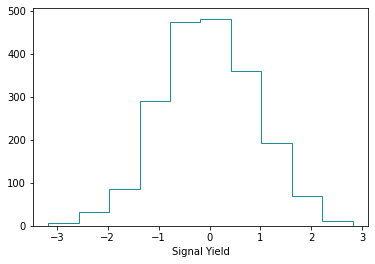

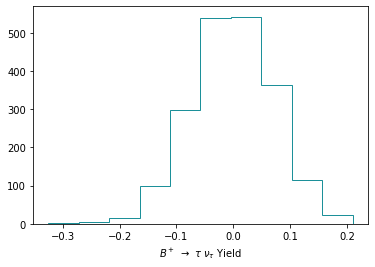

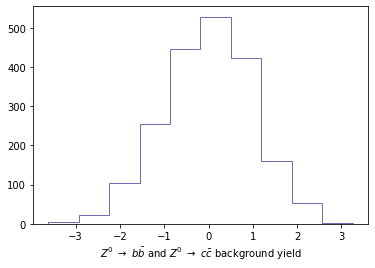

In [127]:
plt.figure()
plt.hist(pull_bc, histtype='step', color="#1c9099")
plt.xlabel('Signal Yield')
plt.plot()

plt.figure()
plt.hist(pull_bu, histtype='step', color="#1c9099")
plt.xlabel(r'$B^+$ $\rightarrow$ $\tau$ $\nu_\tau$ Yield')
plt.plot()

plt.figure()
plt.hist(pull_bb_cc, histtype='step', color="#756bb1")
plt.xlabel(r'$Z^0$ $\rightarrow$ $b\bar{b}$ and $Z^0$ $\rightarrow$ $c\bar{c}$ background yield')
plt.plot()
#counts_sig, bin_edges_sig = np.histogram(sig_yield)

In [ ]:
print(bu_yield)

In [ ]:
bkg_yield.max()

In [ ]:
len(sig_yield)

In [ ]:
np.sum(sig_yield == 0)

### Détermination de la moyenne pour les yields à l'aide d'une gaussienne

┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 281.4                      │              Nfcn = 44               │
│ EDM = 2.1e-06 (Goal: 0.001)      │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                   value    at limit
------------------  --------  ----------
mu_sig_[115377]     -0.01538       False
sigma_sig_[115377]    0.9139       False


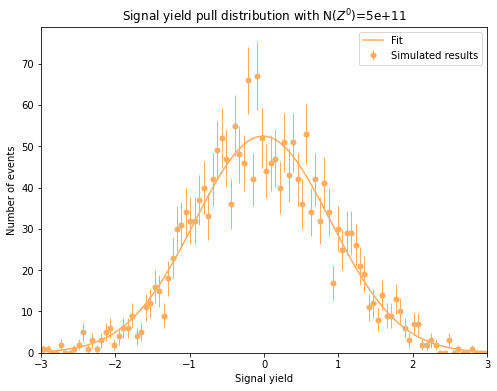

In [128]:
#Espace observable et data
min_sig = -3 #int(sig_yield.min())
max_sig = 3 #int(sig_yield.max()) + 1
obs = zfit.Space('x', limits=(min_sig,max_sig))
data = zfit.Data.from_numpy(obs=obs, array=pull_bc, weights=None) #

#Définition des paramètres
rand_int = random.randint(0,1000000,size=1)
mu_sig_ = zfit.Parameter(f"mu_sig_{rand_int}", 0.)
sigma_sig_ = zfit.Parameter(f"sigma_sig_{rand_int}", 3.)

#Fits
gauss = zfit.pdf.Gauss(obs=obs, mu=mu_sig_, sigma=sigma_sig_)
nll = zfit.loss.UnbinnedNLL(model=gauss, data=data )
minimizer = zfit.minimize.Minuit()
result_sig = minimizer.minimize(nll)

print(result_sig.info['original'])
print(result_sig.params)

#Plots

#Paramètre des histogrammes
nb_bins = 100
lower, upper = obs.limits
colour_bc = "#fdae61"

#Points du fit des yields de Bc+
x_plot_sig = np.linspace(lower[0][0], upper[0][0], num=1000)
y_plot_sig = zfit.run(gauss.pdf(x_plot_sig, norm_range=obs))

#Points de l'histogramme des yields de Bc+
counts_sig, bin_edges_sig = np.histogram(pull_bc, bins=nb_bins, range=(lower[0][0], upper[0][0]))
#

#Tracé du plot
plt.figure(figsize = [8,6])

mplhep.histplot((counts_sig, bin_edges_sig), 
                yerr = True, 
                color = colour_bc, 
                histtype='errorbar', 
                label="Simulated results")

plt.plot(x_plot_sig, 
         y_plot_sig * (len(pull_bc)/nb_bins*obs.area()), #
         color= colour_bc, 
         label= "Fit")

plt.xlabel("Signal yield")
plt.ylabel("Number of events")
plt.title("Signal yield pull distribution with N($Z^0$)={:.0e}".format(N_Z0))
plt.xlim(lower[0][0], upper[0][0])
plt.legend()

plt.show()

┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 814.6                      │              Nfcn = 56               │
│ EDM = 2.41e-05 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                    value    at limit
-----------------  ----------  ----------
mu_bu_[214626]     -0.0007024       False
sigma_bu_[214626]     0.07089       False


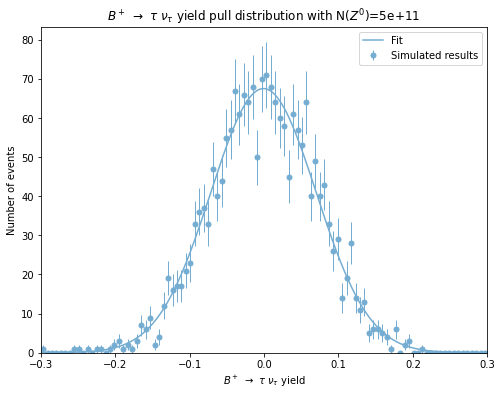

In [129]:
#Espace observable et data
min_bu = -0.3 #int(sig_yield.min())
max_bu = 0.3 #int(sig_yield.max())
obs_bu = zfit.Space('x', limits=(min_bu, max_bu))
data_bu = zfit.Data.from_numpy(obs=obs_bu, array=pull_bu, weights=None)

#Définition des paramètres
rand_int = random.randint(0,1000000,size=1)
mu_bu_ = zfit.Parameter(f"mu_bu_{rand_int}", 0.)
sigma_bu_ = zfit.Parameter(f"sigma_bu_{rand_int}", 0.1)

#Fits
gauss = zfit.pdf.Gauss(obs=obs_bu, mu=mu_bu_, sigma=sigma_bu_)
nll = zfit.loss.UnbinnedNLL(model=gauss, data=data_bu )
minimizer = zfit.minimize.Minuit()
result_bu = minimizer.minimize(nll)

print(result_bu.info['original'])
print(result_bu.params)

#Plots

#Paramètre des histogrammes
nb_bins = 100
lower, upper = obs_bu.limits
colour_bu = "#74add1"
label_bu = r'$B^+$ $\rightarrow$ $\tau$ $\nu_\tau$ yield'

#Points du fit des yields de B+
x_plot_bu = np.linspace(lower[0][0], upper[0][0], num=1000)
y_plot_bu = zfit.run(gauss.pdf(x_plot_bu, norm_range=obs_bu))

#Points de l'histogramme des yields de B+
counts_bu, bin_edges_bu = np.histogram(pull_bu, bins=nb_bins, range=(lower[0][0], upper[0][0]))

#Tracé du plot
plt.figure(figsize = [8,6])

mplhep.histplot((counts_bu, bin_edges_bu),
                yerr = True, 
                color = colour_bu, 
                histtype='errorbar', 
                label="Simulated results")

plt.plot(x_plot_bu, 
         y_plot_bu * (len(pull_bu)/nb_bins*obs_bu.area()), 
         color= colour_bu, 
         label= "Fit")

plt.xlabel(label_bu)
plt.ylabel("Number of events")
plt.title(r"$B^+$ $\rightarrow$ $\tau$ $\nu_\tau$ yield pull distribution with N($Z^0$)={:.0e}".format(N_Z0))
plt.xlim(lower[0][0], upper[0][0])

plt.legend()
plt.show()

┌──────────────────────────────────┬──────────────────────────────────────┐
│ FCN = 287.4                      │              Nfcn = 60               │
│ EDM = 5.02e-07 (Goal: 0.001)     │                                      │
├───────────────┬──────────────────┼──────────────────────────────────────┤
│ Valid Minimum │ Valid Parameters │        No Parameters at limit        │
├───────────────┴──────────────────┼──────────────────────────────────────┤
│ Below EDM threshold (goal x 10)  │           Below call limit           │
├───────────────┬──────────────────┼───────────┬─────────────┬────────────┤
│  Covariance   │     Hesse ok     │ Accurate  │  Pos. def.  │ Not forced │
└───────────────┴──────────────────┴───────────┴─────────────┴────────────┘
name                   value    at limit
------------------  --------  ----------
mu_bkg_[669993]     0.005812       False
sigma_bkg_[708119]    0.9907       False


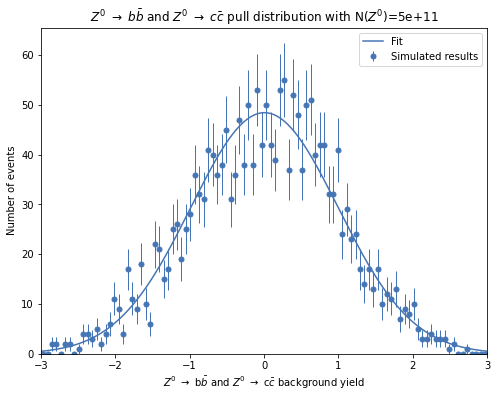

In [130]:
#Espace observable et data
min_bkg = -3 #int(bkg_yield.min())
max_bkg = 3 #int(bkg_yield.max()) + 1
obs_bkg = zfit.Space('x', limits=(min_bkg,max_bkg))
data = zfit.Data.from_numpy(obs=obs_bkg, array=pull_bb_cc, weights=None)

#Définition des paramètres
rand_int = random.randint(0,1000000,size=1)
mu_bkg_ = zfit.Parameter(f"mu_bkg_{rand_int}", 0.)

rand_int = random.randint(0,1000000,size=1)
sigma_bkg_ = zfit.Parameter(f"sigma_bkg_{rand_int}", 5.)

#Fits
gauss = zfit.pdf.Gauss(obs=obs_bkg, mu=mu_bkg_, sigma=sigma_bkg_)
nll = zfit.loss.UnbinnedNLL(model=gauss, data=data )
minimizer = zfit.minimize.Minuit()
result_bkg = minimizer.minimize(nll)

print(result_bkg.info['original'])
print(result_bkg.params)

#Plots

#Paramètre des histogrammes
nb_bins = 100
lower, upper = obs_bkg.limits
colour_bb_cc = "#4575b4"#"#abd9e9"
label_bb_cc = r"$Z^0$ $\rightarrow$ b$\bar{b}$ and $Z^0$ $\rightarrow$ c$\bar{c}$ background yield"

#Points du fit des yields de Z->bb et Z->cc
x_plot_bkg = np.linspace(lower[0][0], upper[0][0], num=1000)
y_plot_bkg = zfit.run(gauss.pdf(x_plot_bkg, norm_range=obs_bkg))

#Points de l'histogramme des yields de Z->bb et Z->cc
counts_bkg, bin_edges_bkg = np.histogram(pull_bb_cc, bins=nb_bins, range=(lower[0][0], upper[0][0]))

#Tracé du plot
plt.figure(figsize=[8,6])

mplhep.histplot((counts_bkg, bin_edges_bkg), 
                yerr = True, 
                color = colour_bb_cc, 
                histtype='errorbar', 
                label="Simulated results")

plt.plot(x_plot_bkg, 
         y_plot_bkg * (len(pull_bb_cc)/nb_bins*obs.area()), 
         color= colour_bb_cc, 
         label= "Fit")


plt.xlabel(label_bb_cc)
plt.ylabel("Number of events")
plt.xlim(lower[0][0], upper[0][0])
plt.legend()
title_bb_cc = r"$Z^0$ $\rightarrow$ $b\bar{}$ and $Z^0$ $\rightarrow$ $c\bar{}$ pull distribution with N($Z^0$)={:.0e}".format("b", "c", N_Z0)
#r"$Z^0$ $\rightarrow$ $b\bar{b}$ and $Z^0$ $\rightarrow$ $c\bar{c}$ yield pull distribution with N($Z^0$)={:.0e}".format(N_Z0)
plt.title(title_bb_cc)
plt.show()
